In [1]:
import numpy as np

import matplotlib.pyplot as plt

from gce_model import gce
from gce_model import gce_fit_like

from scipy.optimize import minimize
import time

# Run some example GCE models

In [2]:
# using names used in the paper:  
#pars = [A_in/1e6,  tau_in,   A_out/1000,    A_star/1e6, alpha,    M_gas_0]

#result of "restore, 'scl_sfr-law.sav'" in idl
scl_pars = [ 701.57967, 0.26730922, 5.3575732, 0.47251228, 0.82681450, 0.49710685]
#result of "restore, 'umi_sfr-law.sav'" in idl
umi_pars = [1470.5896, 0.16522838, 11.038576, 1.2065735, 0.26234735, 0.53814755]
#'old/for_sfr-law.sav'
for_pars = [2464.2364, 0.30686976, 1.5054730, 5.0189799, 0.98204341, 14.575519] 
dra_pars = [1272.6409, 0.21561223, 9.5079511, 0.87843537, 0.34350762, 2.3213345]

In [3]:
model_scl, atomic = gce.gce_model(scl_pars)

/Users/iescala/Documents/projects/gce/gce_model/dtd_ia.py:12: RuntimeWarning: divide by zero encountered in power
  rate = (1.e-3)*t**(-1.1)
/Users/iescala/Documents/projects/gce/gce_model/gce.py:500: RuntimeWarning: divide by zero encountered in log10
  model[j]['eps'][i] = np.log10(model[j]['abund'][i]/interp_func(z_II,


In [4]:
model_umi,_ = gce.gce_model(umi_pars)

In [5]:
model_for,_ = gce.gce_model(for_pars)

In [6]:
model_dra,_ = gce.gce_model(dra_pars)

<ipython-input-16-c94b05da7f7d>:9: RuntimeWarning: invalid value encountered in subtract
  mgfe = model['eps'][:,intatomic == 12] - feh
<ipython-input-16-c94b05da7f7d>:10: RuntimeWarning: invalid value encountered in subtract
  cafe = model['eps'][:,intatomic == 20] - feh
<ipython-input-16-c94b05da7f7d>:11: RuntimeWarning: invalid value encountered in subtract
  sife = model['eps'][:,intatomic == 14] - feh
<ipython-input-16-c94b05da7f7d>:12: RuntimeWarning: invalid value encountered in subtract
  tife = model['eps'][:,intatomic == 22] - feh


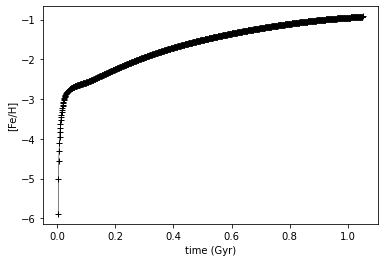

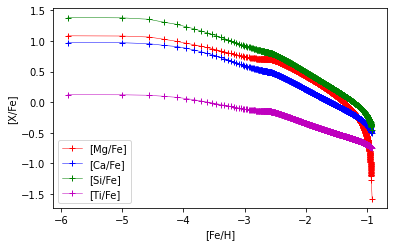

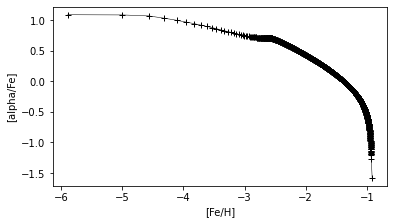

<ipython-input-16-c94b05da7f7d>:9: RuntimeWarning: invalid value encountered in subtract
  mgfe = model['eps'][:,intatomic == 12] - feh
<ipython-input-16-c94b05da7f7d>:10: RuntimeWarning: invalid value encountered in subtract
  cafe = model['eps'][:,intatomic == 20] - feh
<ipython-input-16-c94b05da7f7d>:11: RuntimeWarning: invalid value encountered in subtract
  sife = model['eps'][:,intatomic == 14] - feh
<ipython-input-16-c94b05da7f7d>:12: RuntimeWarning: invalid value encountered in subtract
  tife = model['eps'][:,intatomic == 22] - feh


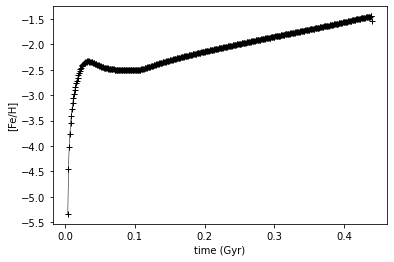

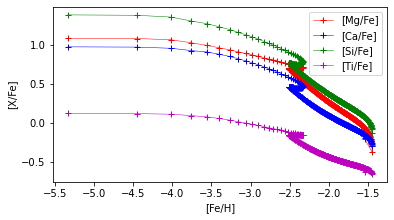

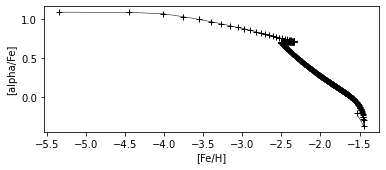

<ipython-input-16-c94b05da7f7d>:9: RuntimeWarning: invalid value encountered in subtract
  mgfe = model['eps'][:,intatomic == 12] - feh
<ipython-input-16-c94b05da7f7d>:10: RuntimeWarning: invalid value encountered in subtract
  cafe = model['eps'][:,intatomic == 20] - feh
<ipython-input-16-c94b05da7f7d>:11: RuntimeWarning: invalid value encountered in subtract
  sife = model['eps'][:,intatomic == 14] - feh
<ipython-input-16-c94b05da7f7d>:12: RuntimeWarning: invalid value encountered in subtract
  tife = model['eps'][:,intatomic == 22] - feh


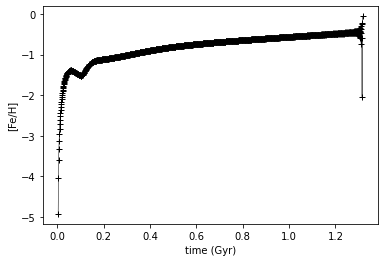

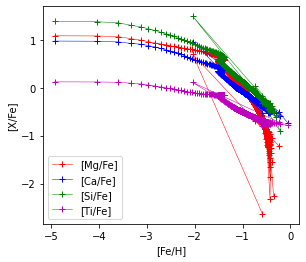

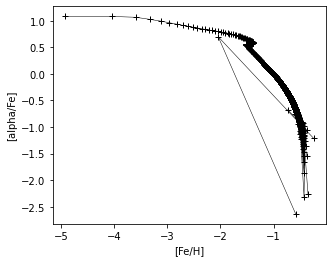

In [16]:
intatomic = atomic.astype(int)

models = [model_scl, model_umi, model_for]

for model in models:

    feh = model['eps'][:,intatomic == 26]

    mgfe = model['eps'][:,intatomic == 12] - feh
    cafe = model['eps'][:,intatomic == 20] - feh
    sife = model['eps'][:,intatomic == 14] - feh
    tife = model['eps'][:,intatomic == 22] - feh

    plt.figure()
    plt.plot(model['t'], feh, marker='+', c='k', lw=0.5)
    plt.xlabel('time (Gyr)')
    plt.ylabel('[Fe/H]')
    plt.show()

    plt.figure()
    plt.plot(feh, mgfe, marker='+', c='r', lw=0.5, label='[Mg/Fe]')
    plt.plot(feh, cafe, marker='+', c='b', lw=0.5, label='[Ca/Fe]')
    plt.plot(feh, sife, marker='+', c='g', lw=0.5, label='[Si/Fe]')
    plt.plot(feh, tife, marker='+', c='m', lw=0.5, label='[Ti/Fe]')
    plt.legend()
    plt.xlabel('[Fe/H]')
    plt.ylabel(r'[X/Fe]')
    plt.gca().set_aspect('equal')
    plt.show()
    
    alphafe = (mgfe + cafe + sife + tife)/4.
    
    plt.figure()
    plt.plot(feh, mgfe, marker='+', c='k', lw=0.5)
    plt.ylabel(r'[alpha/Fe]')
    plt.xlabel(r'[Fe/H]')
    plt.gca().set_aspect('equal')
    plt.show()
    

# Test the likelihood function for the GCE model

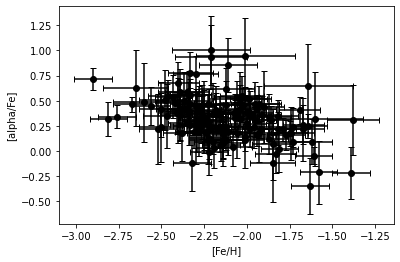

In [3]:
import pickle

with open('data/umi.pkl', 'rb') as f:
    data = pickle.load(f, encoding='latin1')
    
wnotnan = ~np.isnan(data['si_fe']) & ~np.isnan(data['mg_fe']) & ~np.isnan(data['ca_fe'])

alphafe = (data['si_fe'] + data['mg_fe'] + data['ca_fe'])/3.
alphafe_err = np.sqrt(data['e_si_fe']**2. + data['e_mg_fe']**2. + data['e_ca_fe']**2.)/3.

data['alpha_fe'] = alphafe
data['e_alpha_fe'] = alphafe_err

plt.figure()
plt.errorbar(data['fe_h'], data['alpha_fe'], c='k', 
             xerr=data['e_fe_h'], yerr = data['e_alpha_fe'],
             fmt='o', capsize=3)
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[alpha/Fe]')
plt.show()

In [7]:
## A GCE model with no mass constraints provided, itting on [X/Fe], and excluding Ti
# (default conditions)

start = time.time()
gce_fit_like.lnprob(umi_pars, data)
end = time.time()

print(f"Elapsed time = {end-start} s")

Elapsed time = 2.599069118499756 s


In [8]:
## A GCE model with no mass contraints, on bulk [alpha/Fe], including Ti
## (these are conditions appropriate for e.g. DEIMOS 1200G abundances measurements in M31)

start = time.time()
gce_fit_like.lnprob(umi_pars, data, bulk_alpha=True, include_ti=True)
end = time.time()

print(f"Elapsed time = {end-start} s")

Elapsed time = 2.3784849643707275 s


In [4]:
## Fitting a GCE model with no mass constraints provided, including Ti, and fitting on [X/Fe]

start = time.time()
result = minimize(gce_fit_like.lnprob, umi_pars, method='Powell', args=(data))
end = time.time()

print(f"Elapsed time: {end-start} s")

/Users/iescala/Documents/projects/gce/gce_model/dtd_ia.py:12: RuntimeWarning: divide by zero encountered in power
  rate = (1.e-3)*t**(-1.1)
/Users/iescala/Documents/projects/gce/gce_model/gce.py:500: RuntimeWarning: divide by zero encountered in log10
  model[j]['eps'][i] = np.log10(model[j]['abund'][i]/interp_func(z_II,


None False False
0.0
4.536534777641428
9.157113961517748
11.686217988792079
15.952134078929417
23.857405114457173
26.948647273708076
30.862120124575195
34.26584868876202
37.18034350457257
39.11495085848044
42.94483990549454
48.662267182191286
52.0500370984432
54.65652913773825
58.899747318259834
60.83646287054486
62.890395474228896
67.05430737257122
69.34764692949935
72.85088314777877
76.49346943674796
79.92472598572036
83.17787689785335
84.52970487105883
88.08069737646743
93.097514637852
96.03243579894347
99.77385321835506
102.4215479355838
102.70021153088476
105.91414621219114
108.66967134527508
110.32919804921418
114.20271575539303
117.22081950321018
121.06193879850005
123.82572332238837
128.4404357721571
133.34516301836055
140.40332560665433
143.26905612806164
146.65117223192138
148.71949080428658
152.88781141747566
157.8641920109091
159.89402713710308
161.58721097934634
164.68801760651394
167.74765711520206
172.6452117883426
177.14220191928726
180.27692249710373
183.03951152422107

None False False
0.0
4.536534777641428
9.157113961517748
11.686217988792079
15.952134078929417
23.857405114457173
26.948647273708076
30.862120124575195
34.26584868876202
37.18034350457257
39.11495085848044
42.94483990549454
48.662267182191286
52.0500370984432
54.65652913773825
58.899747318259834
60.83646287054486
62.890395474228896
67.05430737257122
69.34764692949935
72.85088314777877
76.49346943674796
79.92472598572036
83.17787689785335
84.52970487105883
88.08069737646743
93.097514637852
96.03243579894347
99.77385321835506
102.4215479355838
102.70021153088476
105.91414621219114
108.66967134527508
110.32919804921418
114.20271575539303
117.22081950321018
121.06193879850005
123.82572332238837
128.4404357721571
133.34516301836055
140.40332560665433
143.26905612806164
146.65117223192138
148.71949080428658
152.88781141747566
157.8641920109091
159.89402713710308
161.58721097934634
164.68801760651394
167.74765711520206
172.6452117883426
177.14220191928726
180.27692249710373
183.03951152422107

None False False
0.0
4.536101925633979
9.159240999344416
11.6880179280038
15.95385469870017
23.858297162091056
26.949521931331947
30.86263907723021
34.2661617479093
37.180728631534585
39.11545171107854
42.945437017441456
48.663728155770116
52.05162233727396
54.658307086520246
58.9015844063294
60.83817566593886
62.89090212099309
67.05471987788194
69.34784247145585
72.8511697341546
76.49373868630711
79.92508853492325
83.17802861282826
84.53014012820982
88.08130093906789
93.09800919168364
96.03306129107231
99.7743720863746
102.42202307627646
102.70094868193888
105.91496351693517
108.6702424537973
110.32971574747467
114.20316545518827
117.22122296496697
121.06186215989123
123.82574536565883
128.4401730647746
133.3447557378586
140.4033323970422
143.26736246523697
146.6495826324429
148.71797156066668
152.8859707658959
157.8621646785954
159.8926810674268
161.58597489001988
164.68709224318968
167.74681942343247
172.6443190942651
177.14177862096253
180.2763861807446
183.03983746824073
185.51628

None False False
0.0
4.536122452825518
9.16582234421671
11.694062097249647
15.959924829708624
23.863980416809504
26.955160519080458
30.86769267614482
34.270872138395085
37.18553768396447
39.12033709813651
42.95043698821017
48.67011640121631
52.0582023282582
54.66514625774312
58.908300435537726
60.84468188810243
62.89544981934073
67.05909878854152
69.35186189448986
72.85534402846201
76.49787558099268
79.9293470742551
83.18193595937416
84.53449733417008
88.08589455542295
93.10241098317614
96.0375960231803
99.77889678945466
102.42646811520297
102.70580794358446
105.9199259742537
108.67479807516511
110.33417404351144
114.20749643490923
117.2254700632178
121.06532123949076
123.82931863510517
128.44327557797726
133.34760983797523
140.40684532837773
143.269572025838
146.65195648549948
148.72044973993542
152.88791934325798
157.8637983726867
159.89540722462118
161.58886984813685
164.69048109415291
167.75030839309932
172.64798777150054
177.14619607626275
180.28060694961403
183.0454433559578
185.

None False False
0.0
4.5366778296459795
9.177888573744802
11.705242115001283
15.971290548555693
23.87553273772663
26.96661856132727
30.878184090044783
34.28078768179948
37.19559008247002
39.13046954492857
42.960754194196994
48.682658970790506
52.07103543340738
54.67836993076464
58.92127850578034
60.857301489597795
62.90488598230464
67.06824131959563
69.36040437641148
72.86415395101443
76.50660481307719
79.93825179265644
83.1902498204395
84.54351939402679
88.09527544321398
93.11146111604923
96.04683055649801
99.78826089789605
102.4356839083336
102.71567223206972
105.92993497995268
108.68413029345807
110.34332720537833
114.21642372850724
117.23424222255407
121.07279275106352
123.83694631370344
128.4501203314505
133.35403133307804
140.41430733942244
143.27555180726898
146.65821345683486
148.72685520621525
152.89344743338685
157.8687954281148
159.90214984598956
161.59586532072794
164.69825635029866
167.7582222293599
172.65640483114151
177.15580031373267
180.2898717287723
183.0569267146234


None False False
0.0
4.531519736453603
9.17063016110512
11.697032990238199
15.960962794689937
23.857696686585
26.94914196838002
30.85964038442141
34.261780813859446
37.1773559569269
39.11268528931678
42.943001541803476
48.668648025096765
52.05791645114022
54.66643767795614
58.90934015347651
60.84531698174614
62.88836318000521
67.0517000756686
69.34338237935971
72.84703821947625
76.48970845334985
79.92202598307809
83.17323672134565
84.5281112282779
88.08087656875932
93.09700895808767
96.0327402364496
99.77172264393495
102.41933512317779
102.70094127053619
105.91587550574133
108.66945212076045
110.32910189935973
114.2022517499703
117.22030312567217
121.057216008293
123.82209015044437
128.43456404816953
133.33832397491292
140.40422896158182
143.2559768629903
146.63853452376839
148.70795916525134
152.873591087456
157.84865538465178
159.88523374548512
161.57993782140838
164.68389979398893
167.74448807151867
172.64028438536334
177.14048835943905
180.2745426040184
183.04543960476366
185.52176

None False False
0.0
4.5316214378444535
9.172114053069171
11.698369583555131
15.962344618822234
23.859122279902856
26.950552419352572
30.860888623957702
34.26293264752206
37.178531514280444
39.11387674726783
42.94422806471116
48.67025091964597
52.059569547015855
54.66815855019602
58.91103583911943
60.84695359325549
62.889465881275726
67.0527537213756
69.34433643403968
72.84803687294836
76.49069441150824
79.92304267477849
83.1741534877893
84.52914870448673
88.08197598976116
93.09805298027412
96.03381634032573
99.77284028809726
102.4204289790321
102.7021448199314
105.9171045148582
108.6705685228812
110.33018837772586
114.20330059774524
117.22132705831694
121.05801883243743
123.82291965740602
128.43526181218857
133.3389507585408
140.40502908547285
143.25676038158775
146.63936429158863
148.70881488539953
152.8742995036178
157.84927461165088
159.88614776965935
161.58089541414762
164.6849903219339
167.74560495133915
172.64148270582632
177.14188644535307
180.2758842845019
183.0471557851314
18

None False False
0.0
4.5318048123030925
9.174708942691415
11.700725002527825
15.96477581670841
23.86165185881329
26.953056129078995
30.86312851258274
34.26501515944111
37.180650998965454
39.11602012147077
42.946427546219695
48.67305795465795
52.06245647632988
54.67115315132063
58.9139828269969
60.849803713165166
62.89145116663531
67.05465839470425
69.3460787277127
72.84985256717708
76.49248819500005
79.9248848822393
83.17583246717011
84.53102165655169
88.08394765521552
93.09993375923747
96.0357480853055
99.77484051869678
102.42238940605702
102.7042812487577
105.91928076184547
108.67256132123747
110.33213129713195
114.20518146388338
117.22316629990617
121.05949854526997
123.82444122573497
128.436568776583
133.34014152683065
140.40649855896058
143.25815456117655
146.64083444012053
148.71032564737814
152.87557053833248
157.85039993215358
159.88774856802044
161.58256532878934
164.68687401976555
167.74752934255042
172.6435490127067
177.14427429832256
180.27817950602798
183.05005540671323
18

None False False
0.0
4.518620207054024
9.117753373073029
11.642375691613518
15.901395109006641
23.77790114685295
26.870476192646795
30.77882715460077
34.18031393453439
37.097921548772035
39.03423416493146
42.86456760611771
48.60033037612173
51.99229445561601
54.60376151778798
58.84678810731718
60.78297710318816
62.8154559538399
66.97894808763378
69.26992487633031
72.77312583683232
76.41705506695148
79.85114517950355
83.10160714349749
84.4607832874348
88.01614264493212
93.03229366538866
95.96875676880141
99.70236411408469
102.35098929841904
102.63662926168422
105.85338549210549
108.60595905963658
110.26646426197887
114.13993743896977
117.15897574970728
120.9923528782526
123.75888243643247
128.36989222777774
133.2734416622313
140.3447979544618
143.1800186553769
146.56208407500858
148.63364685543218
152.79746771957565
157.77198255605074
159.81680873775784
161.51405249517163
164.6225982885783
167.6849196348813
172.57409659612344
177.0803638019815
180.21464666322373
182.9956027388728
185.47

None False False
0.0
4.505765297475443
9.13746926901447
11.658999753285677
15.912416773900961
23.769835208874838
26.863402925027426
30.768043376454443
34.167946896616186
37.08781974997923
39.024989631341704
42.85538030611059
48.604961585569534
52.00015981517639
54.61515206520837
58.85763995105008
60.79352637855069
62.81040661005154
66.97356586511857
69.26294609443633
72.76610237689404
76.41119428406337
79.84729771138569
83.09597516768949
84.4606791291699
88.01916030912298
93.0347756482065
95.97210088625962
99.6991290109546
102.34858680845957
102.63931269813948
105.85810014970446
108.60864787325212
110.26969921010576
114.14311839170924
117.16295292520961
120.9904603768531
123.7588373302189
128.36708152062127
133.26971581413352
140.3480699194578
143.15788982363608
146.53986072759866
148.6138393814346
152.77442029765635
157.74750285755263
159.80343660505181
161.50367110793977
164.6181640186086
167.68232741969524
172.56608034032246
177.08025772553387
180.21423703581667
183.00887699649908
1

None False False
0.0
4.505295726560714
9.131427286578603
11.653757082236904
15.906872428047237
23.764150971413812
26.85779324482035
30.763349715757155
34.163794715984835
37.08352238423097
39.02058292022908
42.85074807887107
48.598158882960405
51.99304842145844
54.60763457474536
58.8500952447038
60.78629490679631
62.80617259183747
66.96960600778924
69.25952580600658
72.76243391307213
76.40758346721675
79.84349916658142
83.09275979713142
84.4567516467863
88.0148647201592
93.03079225847834
95.9679243351079
99.69464460087264
102.34421640842822
102.63431283878916
105.85294245559211
108.60410566114771
110.26532652810629
114.13895424746345
117.1589091360678
120.98772782965062
123.75594817400217
128.3649443643815
133.2679800101377
140.3453776904729
143.1544140834362
146.53612654283864
148.60994255462535
152.77135748792537
157.74494649606658
159.79919056329493
161.49916117026348
164.61286660426794
167.67685388927563
172.56020031249722
177.0732573624625
180.20754594840903
183.00004364655388
185.

None False False
0.0
4.480378160581943
9.102225141641997
11.619600242591236
15.86266582882429
23.681356309770074
26.777093425475872
30.676346639828964
34.07427411348777
36.998352368410465
38.9373411797972
42.76776945641817
48.54023124431107
51.9412962940096
54.56251104606019
58.80483737419657
60.74091594229294
62.733586733223724
66.89667891117668
69.18421001639999
72.68678596366003
76.33436242997297
79.77415334951192
83.02038188314398
84.39463859159683
87.95863285881478
92.9738438181748
95.91270864023312
99.628071077511
102.27953351271508
102.57896575769887
105.80152401916648
108.54952188749921
110.21196693593228
114.08574162117077
117.10752097280948
120.92573875113763
123.69749303144654
128.30179644970255
133.20345391831793
140.29331678366233
143.06332202003316
146.44463667014446
148.52310767467645
152.67903566848847
157.65032439649872
159.7246699522077
161.4303283533657
164.5550988151031
167.62275719351982
172.49450560805604
177.02175833858124
180.15583920399305
182.97301314671535
18

None False False
0.0
4.444130383430149
9.059216482124299
11.570212834423643
15.79863783513158
23.560658884906154
26.65958077078656
30.549871219235307
33.94427501063037
36.874746190595886
38.816595872829595
42.64741798272113
48.45636432314464
51.86669965796297
54.49751913488693
58.73986582164703
60.67615050454385
62.63043589715024
66.79309393815367
69.07767265926019
72.57971801636737
76.23102797997075
79.67650608347547
82.91811040295148
84.30749900940882
87.88006250244794
92.89426330161628
95.83568516002599
99.53466894873743
102.18922134256105
102.50212626681
105.7304699365773
108.47437247389554
110.13855338516213
114.01260892747158
117.0373718370366
120.839308228574
123.61617149783382
128.21364789983593
133.11333245092433
140.2204534009776
142.93538621402334
146.31609587056462
148.40147761123302
152.549564719242
157.51752639989485
159.6209321894961
161.33502041486096
164.4762477535683
167.54929918661412
172.4040001729398
176.9512840419833
180.0852419773525
182.93801530384073
185.420088

2065.245471216599
None False False
0.0
4.386560783198958
8.995747215044407
11.498460557208293
15.70343364928841
23.375321386341803
26.479640674618686
30.355980746845947
33.74501930024421
36.6858642491447
38.63238172241588
42.46386074038977
48.331479665089695
51.75734967394865
54.40350457678524
58.64669577584228
60.584129792284486
62.47937035587665
66.64144146980517
68.9224590312669
72.42356524487663
76.08134405528651
79.53604297954902
82.76982746836802
84.18384330519838
87.77017654305395
92.78279631025671
95.72836490014825
99.40140137363701
102.06169552322977
102.395987853647
105.63375687131831
108.3722508443877
110.03910561745961
113.9137348189593
116.9440144744269
120.71780279469918
123.50276143982684
128.08924579649002
132.98580118101128
140.11852116435878
142.74832163144714
146.12800929741667
148.22474515716826
152.36054061253853
157.32316956518778
159.47281783490885
161.2007869007706
164.36928891143714
167.45110633906359
172.27843735925313
176.85643599071457
179.9905718093519
182.

None False False
0.0
4.325599376126538
8.92951574231046
11.425783062914943
15.606131817290382
23.180408421847037
26.290899589719686
30.15245027702474
33.535952136029984
36.48814321919913
38.43984624129298
42.272286072054115
48.204541529724594
51.64829885111274
54.31102487205084
58.556322795446704
60.49590971955873
62.32943503379754
66.49090595494755
68.76950047957857
72.2696305905709
75.93524248525924
79.4001029523932
82.62527649393716
84.0664769095334
87.66784812722476
92.67866758232014
95.6288993771548
99.27529930513938
101.94294000475429
102.30025118244515
105.54845298017077
108.28253314894249
109.95189747083194
113.82722866470691
116.8644243154743
120.60473914222051
123.39829035706357
127.97256911043874
132.86560721202937
140.02033243158544
142.5687768098506
145.94748624092466
148.0568077055257
152.17949261040616
157.13613396157038
159.33593637991206
161.07944045907408
164.2791136918236
167.3706553627818
172.16855215118585
176.77966706112795
179.91435789784256
182.88459776718673
18

None False False
0.0
4.244972439122082
8.868286003089029
11.358017191749857
15.505838329922732
22.946846666925218
26.06626049685978
29.903896676132078
33.27768780758297
36.246542912273235
38.20634593316571
42.04142784126869
48.07339305690235
51.545224791465785
54.23270771130725
58.483136891148305
60.42631107705854
62.16672375615836
66.32621627279167
68.60223960227475
72.10210312968263
75.77946803289808
79.25958179879636
82.46876807916183
83.95121513926574
87.57525898085137
92.58206790077556
95.5399487977047
99.15177447773496
101.83128842713582
102.22310994047646
105.48690369262253
108.2153572221634
109.88746296972279
113.76299086812381
116.811143369434
120.49226020857574
123.29830446591593
127.85174542053392
132.73794451425385
139.9275881162147
142.37339851277096
145.75199147425064
147.8800039124597
151.98104082554644
156.92683007282793
159.2030668379055
160.97071775355153
164.2198435426436
167.3259971999453
172.08500622320548
176.7392147029434
179.8741443530798
182.93672552241185
185.

None False False
0.0
4.201234095274872
8.825056707129903
11.314601393931518
15.445004599585356
22.81231819357604
25.936849877693316
29.76412919044281
33.13428411024557
36.11170244853065
38.075742839893486
41.91200844018508
47.992830484923175
51.4795636964966
54.17933979026235
58.43339534602682
60.3795261692435
62.07790208280665
66.23704951000566
68.51369577962878
72.01292747926145
75.69742359222646
79.18537998760635
82.3883238541852
83.89108076713984
87.52648211833423
92.53187729953305
95.49364869876247
99.08767004184828
101.77452885209723
102.18335489637774
105.45526413580791
108.18299289002945
109.85671167984201
113.73292650531434
116.78767654979046
120.439345778462
123.25162269728061
127.79566145647321
132.67912439991943
139.8792420241592
142.27931090220284
145.65744967167942
147.79506697883562
151.8867736174255
156.82788867663828
159.1411839381725
160.9214344227352
164.1961918658853
167.30993705929438
172.04704370620075
176.72295788138783
179.85892465695483
182.96589444127648
185.4

None False False
0.0
4.149656066187226
8.79350360734934
11.283616282484719
15.393436745414604
22.670744609675257
25.802025289750446
29.611714662006815
32.9746639367976
35.96406687303262
37.93422878893706
41.773283965861246
47.92862172571622
51.43772973893063
54.155440111563934
58.415496713927155
60.36529140026979
61.998289649625406
66.15556787373797
68.43278132048269
71.93239749316261
75.62680453968636
79.12606758910877
82.31723573423692
83.84993592860312
87.50200525475559
92.50379232067847
95.47154546790922
99.04466540888663
101.74225575671744
102.17629947779622
105.45980087690965
108.1860848589383
109.86111594498323
113.73719504002692
116.80131781243938
120.40280679473943
123.2237606946222
127.75128495465802
132.62893633527676
139.8473727183893
142.1923723789104
145.57115946392491
147.72231002039717
151.79784903416916
156.73001807921284
159.09952486043136
160.8987725569756
164.21298578682888
167.33767634554286
172.04918077396172
176.75199833882448
179.88834997109396
183.0622965531264

None False False
0.0
4.145984350178158
8.798978784710414
11.289302169334842
15.397368116417391
22.66853529774768
25.800479413755657
29.607927671206514
32.969926704892224
35.96056583831188
37.931125020320096
41.77044059464383
47.935033414783376
51.44688794248428
54.166531055402146
58.42710154933104
60.377213011836595
62.00211288120541
66.1589936856586
68.43627060350452
71.93604146701172
75.63175912895939
79.13222224442073
82.32224479781493
83.85843800072566
87.51233941804949
92.51349393961807
95.48171090916408
99.05288870103387
101.75183340974387
102.18875049879554
105.47349371780591
108.1996331784564
109.87445128227819
113.75035454561059
116.81555947781159
120.41063155878923
123.23233107332791
127.75765928783892
132.6343977641787
139.85167840491184
142.19026505758748
145.56918473669654
147.7217817984063
151.79527956122442
156.72614053909874
159.10242736382452
160.9038383340407
164.2230506204927
167.3488968947023
172.0588983607837
176.76610493467743
179.90234604205014
183.08442630240017

1489.3698900373768
1493.7412524816305
1496.6887989627107
1497.777961269535
1501.1536791558224
1504.0721542724398
1506.7363057874986
1508.609263289074
1512.3008209195177
1514.181657268396
1514.1191916665437
1516.2596020858014
1517.6427107273503
1519.3747823889853
1523.4832821845719
1531.266142506705
1533.7934004558213
1534.515506629435
1537.5777295709709
1540.6292926910664
1543.9769322329848
1545.720942087285
1547.6336839499847
1551.2406083473795
1554.6450062708723
1557.7655324165394
1558.6363910975556
1560.9481502314086
1561.4531179556936
1564.3396176458136
1567.4814454146485
1568.5416746338917
1573.67274559702
1576.7498394889153
1580.8272414437881
1583.146057004465
1586.0668280703787
1589.428959608751
1588.8406104064575
1590.8097220071763
1594.0352115449755
1595.8569565067519
1599.8269534129333
1602.1895891554952
1605.6095916681247
1607.0187791948647
1611.5410618840012
1614.2407363931295
1616.5259742665253
1618.8480201713353
1621.5765635252924
1624.2417057068672
1628.9292348971148
163

1196.5895917821344
1198.0983212470078
1201.4965344171076
1200.6139766030522
1203.6138298141004
1206.9327518020368
1210.463834678363
1210.450733061075
1212.1290582480844
1215.2979120632053
1216.2398679477312
1217.7835827326335
1221.4562918944796
1222.2458709549587
1223.8668539540345
1223.8364722189754
1225.244953704578
1230.6100633638207
1234.7453649576553
1240.2197203220326
1242.109060678175
1244.5667646213867
1248.6890904229288
1248.6816139817465
1249.7432434768373
1250.2669593576975
1254.5522744513733
1258.4275595885813
1261.0516413558225
1262.8925054676597
1264.9994008015012
1267.9710006027433
1274.004360198269
1274.4527141692115
1277.7424913424227
1281.7747109643103
1285.117236042193
1287.5980756844494
1287.9083753863317
1293.2460455737537
1296.2806747900386
1299.4139135613523
1307.508445367512
1313.2943797224332
1316.161240803187
1321.259407611094
1324.0305113720838
1325.5944286231697
1329.0526619131576
1332.3791478917817
1335.6397246654308
1338.527396412537
1344.0550946556166
134

1469.1712002331567
1469.312996617101
1470.591040855885
1474.4892220061863
1477.741919631079
1480.2855041060839
1482.8541011411646
1486.359210155074
1485.6016940696761
1489.0015987847446
1493.3815766840944
1496.3243500896815
1497.4276413294433
1500.801850963496
1503.7554243827092
1506.4170861243692
1508.308823252263
1511.9896376275797
1513.8594752573579
1513.795240698295
1515.933874042509
1517.2999727384934
1519.0261959106751
1523.1847654775283
1531.1286503182305
1533.6493474318497
1534.3699928140177
1537.42423779317
1540.4717308855027
1543.8134368173785
1545.552584644566
1547.462810607453
1551.0718087304704
1554.475372604057
1557.587382152033
1558.4544871685662
1560.7613464784506
1561.286893393425
1564.1637341494445
1567.3001775327025
1568.3346831645063
1573.4479972196684
1576.5219448095252
1580.721153923655
1583.0380767624706
1585.9553411186494
1589.265955780542
1588.6940533017123
1590.6853960545093
1593.908721414396
1595.773022971846
1599.7421254304143
1602.103054274001
1605.50530519

1344.6017316726127
1346.8723947864848
1349.9515140902886
1352.0382599624209
1354.8236773089782
1356.9701777587463
1356.551134053246
1356.824820705902
1356.396741300759
1358.5988982616798
1361.871762957563
1365.130039496637
1368.4299701308253
1372.52358957996
1380.4387726073214
1383.1467263539082
1386.1452683685045
1387.5495386465918
1393.452326324611
1392.5112689009707
1395.6265098461852
1395.8289715386938
1397.8755198764857
1399.1114582101031
1401.2263171438365
1401.264688567455
1406.4232671139857
1410.1138326500995
1414.282560545189
1427.3101851227439
1429.0596055995063
1433.2501642534492
1437.0901556138472
1438.6815105192259
1438.843518434173
1439.748693496239
1441.3185352670603
1444.8056978041689
1447.4547897184946
1450.160039449294
1454.0612108983532
1456.3980624984806
1458.2789938088995
1462.6196965236525
1466.2136386690124
1467.1064421133399
1465.4144628793229
1467.2381652941708
1469.3863276838576
1469.5385302990219
1470.8109087478347
1474.7092510189789
1477.9628553016187
1480.5

1414.2696937740973
1427.2943327090597
1429.043471921714
1433.2342577948023
1437.0727006893264
1438.664225217088
1438.8261237851402
1439.733216692781
1441.303678933994
1444.7816780975859
1447.4335949207448
1450.1387357321603
1454.0410619551762
1456.380715506723
1458.2610729480105
1462.6015953801025
1466.2015853575551
1467.0945475104259
1465.4017205596906
1467.228680016747
1469.378359958966
1469.5347923705988
1470.804660768511
1474.703139741675
1477.9572414172237
1480.5139022175617
1483.0869784244255
1486.5926266116471
1485.8380602425839
1489.2080961694624
1493.5825995766036
1496.5285577062384
1497.6227789746406
1500.9980339006097
1503.9289972617735
1506.5923407095877
1508.4719673116233
1512.1598043126496
1514.0368429978162
1513.9738243077247
1516.11370356261
1517.4908894314742
1519.220994509204
1523.344654068432
1531.1787240283206
1533.70375447572
1534.4254296222296
1537.4849151883272
1540.535107498454
1543.8807252752538
1545.6231193914073
1547.535021909082
1551.1425132723668
1554.54669

1387.2915726670867
1393.188018867749
1392.2494082896321
1395.3661700977311
1395.5680298264822
1397.619769914227
1398.8565212489527
1400.9765046021669
1401.0155706529308
1406.1775546110512
1409.8687247203789
1414.0374267162038
1427.063392547167
1428.8126030006988
1433.0039890432572
1436.8394443942973
1438.4317049792376
1438.5938093257028
1439.5034691452802
1441.0751574366207
1444.5424845408595
1447.198080654523
1449.9031705930124
1453.8072110627973
1456.1503301359
1458.0302017850813
1462.3707318076583
1465.977850529537
1466.8711969509297
1465.1776075297364
1467.0086371746056
1469.1603354979923
1469.3221023718881
1470.5896266470943
1474.488413640359
1477.7433502917065
1480.3048058865786
1482.8797691344341
1486.3853772127304
1485.6322149593184
1488.992683884591
1493.3657491387228
1496.3131480786615
1497.4047523415707
1500.7806715837394
1503.7044693628504
1506.3686671056257
1508.2446859840427
1511.9352570048095
1513.8151071619993
1513.7529101113018
1515.8936007906063
1517.2748999371331
151

1221.4562918944796
1222.2458709549587
1223.8668539540345
1223.8364722189754
1225.244953704578
1230.6100633638207
1234.7453649576553
1240.2197203220326
1242.109060678175
1244.5667646213867
1248.6890904229288
1248.6816139817465
1249.7432434768373
1250.2669593576975
1254.5522744513733
1258.4275595885813
1261.0516413558225
1262.8925054676597
1264.9994008015012
1267.9710006027433
1274.004360198269
1274.4527141692115
1277.7424913424227
1281.7747109643103
1285.117236042193
1287.5980756844494
1287.9083753863317
1293.2460455737537
1296.2806747900386
1299.4139135613523
1307.508445367512
1313.2943797224332
1316.161240803187
1321.259407611094
1324.0305113720838
1325.5944286231697
1329.0526619131576
1332.3791478917817
1335.6397246654308
1338.527396412537
1344.0550946556166
1346.328229539469
1349.4082700124875
1351.502981764885
1354.2906743502876
1356.4381934597582
1356.019292463134
1356.290854306159
1355.8668070296255
1358.0708327777334
1361.3444482840207
1364.60344475683
1367.913474972223
1372.007

1230.6100633638207
1234.7453649576553
1240.2197203220326
1242.109060678175
1244.5667646213867
1248.6890904229288
1248.6816139817465
1249.7432434768373
1250.2669593576975
1254.5522744513733
1258.4275595885813
1261.0516413558225
1262.8925054676597
1264.9994008015012
1267.9710006027433
1274.004360198269
1274.4527141692115
1277.7424913424227
1281.7747109643103
1285.117236042193
1287.5980756844494
1287.9083753863317
1293.2460455737537
1296.2806747900386
1299.4139135613523
1307.508445367512
1313.2943797224332
1316.161240803187
1321.259407611094
1324.0305113720838
1325.5944286231697
1329.0526619131576
1332.3791478917817
1335.6397246654308
1338.527396412537
1344.0550946556166
1346.328229539469
1349.4082700124875
1351.502981764885
1354.2906743502876
1356.4381934597582
1356.019292463134
1356.290854306159
1355.8668070296255
1358.0708327777334
1361.3444482840207
1364.60344475683
1367.913474972223
1372.0078154242212
1379.8983818002566
1382.6068867716942
1385.608056347866
1387.008334540609
1392.9074

/Users/iescala/anaconda3/lib/python3.8/site-packages/scipy/optimize/optimize.py:2149: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)
/Users/iescala/anaconda3/lib/python3.8/site-packages/scipy/optimize/optimize.py:2150: RuntimeWarning: invalid value encountered in double_scalars
  p = (x - v) * tmp2 - (x - w) * tmp1


None False False
0.0
3.481881049786798
7.267215186892606
10.28219005689741
13.98408497711702
20.342391076896853
23.698839856059593
27.895644209133184
31.78309331546704
34.908938055929774
36.715306925707345
40.42817971534858
47.68845749275916
51.80063704726601
54.75269213296458
59.26463860113301
61.47476544090935
62.864974384632845
67.26302815961334
69.97266896870684
73.2629693181138
77.7398926969397
81.38862258887227
85.47603447763544
87.58800651665467
91.44020243788064
96.70672467116604
99.51435083890183
102.68814927679985
106.04267134188734
107.02810289492973
110.51853061539414
113.78076540014291
115.31511886571805
119.39216385303024
122.82584293595677
127.01648912934425
129.77029041510244
134.79493688542357
139.99089935837085
148.11119467038912
149.9245023927688
153.07747674258206
155.46339207719254
159.9890657465505
165.29284986480087
168.714969628068
171.12428643363663
175.36391222367251
178.68919157560467
182.90509317035372
188.70739999614136
192.06942790122002
196.3872976637478


None False False
0.0
3.7802926203831904
7.990259626073954
10.718774570588101
14.602409549730238
21.386552685977453
24.62638796561085
28.60279077253685
32.19435828970613
35.25140939191112
37.12355145662624
40.88654701362548
47.5566971493955
51.34515999114304
54.161773008063065
58.51182819649992
60.57579420497752
62.009203469202504
66.27914953705515
68.74929614771062
72.13632218851248
76.1754807625709
79.74479843876627
83.3199429610907
85.1008107457568
88.84544844255215
93.97057860187564
96.84598081468567
100.19265255459855
103.1835432250018
103.84213275788403
107.22303935192468
110.18379950191047
111.77261611789051
115.74361767086803
118.9839278483663
122.82100353951097
125.60244371857355
130.34476490993683
135.36858367388737
143.00743979598406
145.02325777369413
148.27875489945072
150.53597964877216
154.80758139559197
159.90771291098022
162.7385233630594
164.76621932500566
168.49829522781587
171.71328337578512
176.15733154208274
181.36842549838772
184.60926257963894
188.296816966537
19

None False False
0.0
4.583211239577846
9.716358748837257
12.02439461305243
16.392555811855352
24.227771037030788
27.266810518610523
30.96196409003528
34.16152026795745
37.088086969083676
39.17578873117924
43.10801654427007
48.84406359779599
52.12994628357917
54.78290039284943
59.02248788645193
60.883792101253704
62.78000541408595
66.84749269209894
68.97881174572954
72.59526869514067
76.03646436944138
79.47809592160273
82.40519542111412
83.75957412140293
87.33722198967912
92.24098011587628
95.31591746212895
99.15840186185216
101.63649082094315
101.93665099655432
105.14000888194425
107.69702066281764
109.47439321828966
113.27366336727705
116.19017320047084
119.6407792905516
122.50584240873948
126.88090834846018
131.64496726730837
138.5024143733589
141.32249176027003
144.8335526541856
146.89888247892262
150.8362277666933
155.6407770118285
157.67544727870361
159.37506681127334
162.36693498310407
165.42301904740256
170.42916146960766
174.72124509883233
177.77470876625802
180.55674834779887


None False False
0.0
4.798902301229546
10.162268259432407
12.401326857545317
16.899152453186655
25.0008106448077
28.00175927662262
31.65657095186489
34.79548640199715
37.694365741000446
39.84564271679965
43.82743551649791
49.389059558914596
52.584482834951174
55.216567080416645
59.46891547722805
61.294229875827185
63.318398812293964
67.35043752445601
69.42538844897881
73.09754421423973
76.44187705070449
79.8603576850134
82.69180067132723
83.97612295358748
87.52414166004523
92.38900802287938
95.52096965061395
99.50296367817984
101.89640670022953
102.15704312107289
105.32798160077063
107.82213230887986
109.65386684202578
113.42264555316679
116.27794317026746
119.67341913107481
122.56163129514022
126.88000015739551
131.59952550099598
138.30315682413342
141.4045322696595
144.98064944581634
147.0100296424697
150.8971248319738
155.65218864019263
157.55952053489983
159.24572630872547
162.10904077138298
165.13903407518845
170.28741084457747
174.40809524334875
177.42902079392357
180.05535969305

None False False
0.0
4.6379490356936985
9.826098942752587
12.114681495921916
16.516273895553077
24.41931795148383
27.447954323727018
31.131661594640512
34.314150037941026
37.233334910121314
39.337761395651356
43.28288126429079
48.97076663461713
52.23159856103888
54.878559626870356
59.120294784609854
60.97180362451571
62.9030268467707
66.96072650222474
69.07632683726192
72.70756035033186
76.12156881120353
79.55686508192878
82.45677454674325
83.7918172092717
87.36131491989289
92.25433887177104
95.34425327969474
99.22247217549699
101.67686081053067
101.9652301527979
105.15969516683242
107.6989823675541
109.49085211238196
113.28172389757404
116.18142480799139
119.61664064497056
122.48796242161576
126.84711288719436
131.5988391672629
138.41414421267967
141.30375805749946
144.83197814011564
146.8875990486959
150.810758358536
155.6015620189292
157.6004077174207
159.29472165729658
162.25079522584468
165.29963320777256
170.3425126650423
174.58728770313846
177.6317928467039
180.37043728184443
18

None False False
0.0
4.382787912048027
9.283865751172918
11.66512592403532
15.915577300575215
23.494659524997743
26.572199967804934
30.312201208393486
33.5766007548777
36.53022438005043
38.564701704562545
42.45429510596311
48.363107853187124
51.74043538243069
54.41828654137199
58.659034336456294
60.55684471785884
62.336267931133165
66.44051740856224
68.6307802204963
72.19579584291172
75.73827236522847
79.2037875081929
82.23431485680761
83.6602894846822
87.2685547861001
92.21243374215504
95.2389899359008
98.9574202553948
101.52372496230083
101.87326428369242
105.10979223924969
107.73409148453845
109.46568528674838
113.29653831245739
116.27435407322673
119.7837526836055
122.6293975235572
127.06495180399091
131.87521765157686
138.88219010971176
141.47105078800536
144.92332414408807
147.02445769046486
151.0163725049615
155.87252492661025
158.0404655329209
159.77082153063603
162.89350736939616
165.97733996843957
170.85030391771238
175.3120564240485
178.39951442661854
181.34004441427885
183.

None False False
0.0
4.503188333929066
9.546472536540824
11.882743338876889
16.203514434538064
23.937565348038166
26.991617883592838
30.70379810920462
33.928242781623084
36.865445293873414
38.9311309919865
42.84587970475063
48.64975446204067
51.971324189866166
54.63354693251434
58.87201705135773
60.74750922719134
62.59637396402966
66.67809045756987
68.83218652752025
72.42802111919875
75.9083565187421
79.35923685934168
82.32592174273587
83.70804717410151
87.29754969122732
92.21685893488494
95.27187389938035
99.06406974913925
101.5762854313695
101.89465376379923
105.11089622195466
107.69374591047246
109.45220739781729
113.26370570811432
116.20420126252701
119.67728430987523
122.53428994325445
126.93257320508732
131.71451262936017
138.63098127743925
141.35418865833674
144.84152711027212
146.9208390152281
150.8790378370299
155.70352578296973
157.78967808705434
159.499365394009
162.5421895406099
165.60892507377153
170.56204771532512
174.92075044795135
177.9873399585697
180.83109270998807
18

None False False
0.0
4.567828202230733
9.67515360415158
11.9874274759459
16.347380529692114
24.16232851010407
27.20374423945454
30.90153411481833
34.10485566926865
37.03319138423118
39.1178250454526
43.04737670752472
48.793293936444634
52.084488859207795
54.73900241055246
58.97855118521507
60.84211234634589
62.73154503470068
66.80129572772114
68.93608134017225
72.54926109725726
75.99619542734571
79.43933408357069
82.37205149264034
83.73062083491097
87.31017248767174
92.21641634450049
95.28849596949979
99.12233060767532
101.6054933104946
101.90846261400573
105.11386956662534
107.67477452818044
109.449638818973
113.25086247901955
116.1710259425658
119.62514606745275
122.48923507181823
126.8679209351383
131.63482541543274
138.5040354771989
141.3074938027603
144.81482454934036
146.8823942567964
150.82290889526328
155.63062571261327
157.6729081298684
159.37408411183088
162.3733976598808
165.43119297708105
170.42766782872843
174.72848051653708
177.78404612687535
180.57514297107917
182.919324

None False False
0.0
4.53987257602293
9.615606174650184
11.937235103900019
16.280827514754616
24.060639832462492
27.107102514271563
30.810564114143656
34.02213970822571
36.95409731407119
39.03145471331151
42.95510464501629
48.723422504099005
52.02644714965753
54.68407934942588
58.923167822705395
60.791507478258154
62.66541305871679
66.73992900190125
68.88229270408914
72.48852148520716
75.9483849659841
79.39464031267823
82.34040064040418
83.70818564642717
87.29171461057213
92.20315819549138
95.26861487031938
99.085035032181
101.57949037559791
101.88847171632095
105.0982034317763
107.66767314214363
109.4363816879897
113.24170919772156
116.16987145949317
119.63145136541607
122.49295144027897
126.87934455061182
131.65221781904296
138.5409495308907
141.30961369353855
144.80895104539707
146.88123836897307
150.8286821938233
155.64304356616287
157.70229143217477
159.40673919695502
162.42288005920514
165.48423973531737
170.4624359485475
174.78525102310857
177.845236561509
180.65668572265878
183

None False False
0.0
4.557229962761314
9.650877963842017
11.966164196766648
16.3202279476223
24.121859706184363
27.164969333539997
30.864642760755146
34.0706389792036
37.00023560329929
39.08267734677242
43.010289892380754
48.76322434314525
52.058194775202004
54.7137945643384
58.95322011454509
60.81839818819154
62.703209742521814
66.77454921373081
68.91180565530499
72.52267098605144
75.97371154272071
79.41791065143823
82.35476325057242
83.71630616028318
87.29719094369736
92.20515772538666
95.27518789080851
99.10272766292607
101.58949695628607
101.8944449092006
105.1013001386903
107.66497487973969
109.43809390445324
113.24069545199508
116.16346285240284
119.62001513284243
122.48341282046712
126.86460663445077
131.6334799191149
138.5088301519476
141.29857801831818
144.8032636673399
146.87243273327232
150.81521630648948
155.62511442839423
157.67273642111672
159.37503899606514
162.37965627447298
165.43864405939462
170.42847864726022
174.73618671791345
177.79325536116343
180.59073437135964
1

None False False
0.0
4.568762929712762
9.677683986235014
11.988515856636667
16.349828211970657
24.165049620360065
27.20582790072503
30.90287428286508
34.10495590365997
37.03292077879858
39.11908164184411
43.049514913249524
48.79156998085878
52.08086430940521
54.7350504467553
58.9746879674954
60.83767904195458
62.730571602967174
66.79967207175018
68.93335703834286
72.54752662952598
75.99239203380384
79.43516523051407
82.36595127652289
83.72309885171084
87.30213023866742
92.20761054736391
95.28097602659277
99.11626716005264
101.59762806775787
101.89974654094418
105.10459596277629
107.66420924359403
109.4405657431857
113.24126061656571
116.1602472415583
119.61318696177523
122.47799931436987
126.85545874773327
131.62146161923187
138.48422410315132
141.28845613318106
144.79697280212213
146.863976449646
150.80352293172393
155.6101992490846
157.64952190420166
159.35040431089647
162.3469034773539
165.4042381793125
170.40203544118603
174.70003037534465
177.75508387553384
180.54261513212856
182.

None False False
0.0
4.567828202230733
9.67515360415158
11.9874274759459
16.347380529692114
24.16232851010407
27.20374423945454
30.90153411481833
34.10485566926865
37.03319138423118
39.1178250454526
43.04737670752472
48.793293936444634
52.084488859207795
54.73900241055246
58.97855118521507
60.84211234634589
62.73154503470068
66.80129572772114
68.93608134017225
72.54926109725726
75.99619542734571
79.43933408357069
82.37205149264034
83.73062083491097
87.31017248767174
92.21641634450049
95.28849596949979
99.12233060767532
101.6054933104946
101.90846261400573
105.11386956662534
107.67477452818044
109.449638818973
113.25086247901955
116.1710259425658
119.62514606745275
122.48923507181823
126.8679209351383
131.63482541543274
138.5040354771989
141.3074938027603
144.81482454934036
146.8823942567964
150.82290889526328
155.63062571261327
157.6729081298684
159.37408411183088
162.3733976598808
165.43119297708105
170.42766782872843
174.72848051653708
177.78404612687535
180.57514297107917
182.919324

None False False
0.0
5.086914001306098
10.409267986102044
12.655781965461326
17.294324575494198
25.840163921035142
28.83601511559805
32.43840047990609
35.560779875353646
38.45715921338012
40.59542833247673
44.634999204457394
50.41018919182046
53.66600319675255
56.34038834084127
60.801783373934256
62.60770670108017
64.35118662106075
68.3643055233238
70.43293156091121
74.12824425794552
77.51587455644172
80.95426377893314
83.7903682656
85.12393599807854
88.71527637401707
93.55914851878387
96.69939826238128
100.84340955063247
103.27120909474448
103.55815737597584
106.7477428915148
109.23726789187263
110.96707540453917
114.72005067208697
117.58847696452143
120.88837769862323
123.755084226639
128.03471052583873
132.72931664740827
139.4838931889861
143.06724786447288
146.6670923859181
148.69560979844726
152.54081224423072
157.26624491728666
159.328493826983
160.98955089087877
163.9707136610855
167.02822579054953
172.3182066626039
176.52790542423193
179.52426370380846
182.34745922914308
184.63

None False False
0.0
3.873141579829425
9.135664547935885
11.583052772990973
15.550144078379581
22.290098424285716
25.41984094403203
29.282471786544484
32.627605996092804
35.62274503796095
37.657887762321025
41.440761284881816
47.16300858198658
50.531103639448155
53.1739514751462
57.123127193697464
59.09740883833164
61.24182921626746
65.41249853843445
67.67484019942412
71.17371034361311
74.73167567917316
78.19756102499453
81.29271990361596
82.70566273296595
86.28426736576354
91.29951916825762
94.29992991043059
97.73198854614529
100.32301652005998
100.66718902774726
103.91316434436168
106.60954006978092
108.46888745258921
112.35774378801932
115.37974661884307
119.07255085683752
121.95130855907851
126.49768225215225
131.3900845788808
138.4419979826775
140.55816925112381
143.94473713288266
146.09030778577412
150.1948541845391
155.1440276830797
157.1722454309805
158.9524069561967
162.00413803452307
165.07523333014865
169.64038413027322
174.1025066489916
177.267534940295
180.026218718112
182

None False False
0.0
4.567828202230733
9.67515360415158
11.9874274759459
16.347380529692114
24.16232851010407
27.20374423945454
30.90153411481833
34.10485566926865
37.03319138423118
39.1178250454526
43.04737670752472
48.793293936444634
52.084488859207795
54.73900241055246
58.97855118521507
60.84211234634589
62.73154503470068
66.80129572772114
68.93608134017225
72.54926109725726
75.99619542734571
79.43933408357069
82.37205149264034
83.73062083491097
87.31017248767174
92.21641634450049
95.28849596949979
99.12233060767532
101.6054933104946
101.90846261400573
105.11386956662534
107.67477452818044
109.449638818973
113.25086247901955
116.1710259425658
119.62514606745275
122.48923507181823
126.8679209351383
131.63482541543274
138.5040354771989
141.3074938027603
144.81482454934036
146.8823942567964
150.82290889526328
155.63062571261327
157.6729081298684
159.37408411183088
162.3733976598808
165.43119297708105
170.42766782872843
174.72848051653708
177.78404612687535
180.57514297107917
182.919324

None False False
0.0
4.282311957201527
9.416930595726528
11.776647611205485
15.97825993335697
23.36794649629456
26.44077556670986
30.19982678437518
33.455576141847786
36.406975989196326
38.46772982443823
42.336611704087126
48.07008409309932
51.38770537261966
54.03459143598019
58.153414574371105
60.05644763426712
62.039956620528834
66.14668009155213
68.32707512172291
71.89388180656255
75.38102056839072
78.83047418571675
81.82453374164446
83.20144048439484
86.77781696797463
91.72426837356291
94.7637316312373
98.43002153175138
100.95165810372328
101.26786703366332
104.48640914612214
107.09607496382704
108.90109658536008
112.73419538586343
115.69045221425448
119.23702771091916
122.10382935331327
126.54522247077047
131.3585507645019
138.29479776452717
140.76409858377176
144.2211503328595
146.31603131248482
150.31762428882982
155.17786841087715
157.21189576300813
158.94084823599195
161.95687857567577
165.0176758850521
169.84368504487682
174.2051337744321
177.30030319135545
180.07606172751704

None False False
0.0
4.113595221141414
9.285977317922491
11.677942426010013
15.785168400396099
22.912471658191965
26.00647249066965
29.804765749010055
33.09430645114071
36.061799803762874
38.11135123087493
41.94557346372712
47.67367631374496
51.00974609131262
53.65423068874087
57.704938013541515
59.63442154138015
61.67847114208208
65.80931432858728
68.02014750867137
71.55968006733816
75.07331493614576
78.52841429302579
81.56107317711871
82.95106635625962
86.52752071242223
91.50000593379457
94.52292015926541
98.09311029186962
100.64051732396416
100.96677656991736
104.19519368719718
106.83717166244529
108.66250848694123
112.51657548355531
115.49718175888017
119.10042302909326
121.97104085235632
126.45235465076945
131.29562993953496
138.2759653900416
140.58579094430306
144.01414243466655
146.12773918122537
150.1683729573617
155.0623439704518
157.0933107198351
158.84122911391327
161.8699054177789
164.93411407950475
169.65564462479344
174.05517160570255
177.17650713836443
179.9448540120143


None False False
0.0
4.394839819277044
9.510217667950252
11.850035317541238
16.114487656207395
23.674357112142154
26.734108930589926
30.468103068264785
33.70233696095724
36.64403908912406
38.71373715466889
42.606511054691566
48.34425303733147
51.650633972004165
54.30013965151072
58.4663100058617
60.35293956451754
62.29803636021901
66.38957102946435
68.5509956345774
72.13620239103456
75.60660263842594
79.05314073417952
82.02202743750995
83.39111492586318
86.96834344227291
91.89833691759299
94.95022965519055
98.6821448443738
101.18771043439979
101.49819843708937
104.71105783903312
107.30048787802646
109.09311787773383
112.91308223558205
115.85425726743814
119.36366790554116
122.22899158745636
126.6448403635589
131.43918865979342
138.3498212215499
140.94137845018847
144.41819550223204
146.5016501440303
150.47825491557882
155.3170619513021
157.35390609409453
159.0712983664004
162.07987971849528
165.13914228508347
170.03330349254801
174.3691715205249
177.44797840079167
180.22933746440566
18

None False False
0.0
4.393740419742999
9.515696285956459
11.85601766526218
16.119234630728588
23.67767489817917
26.73768005538374
30.4723912982468
33.707202748012456
36.64902505119885
38.71819450778562
42.61013817722102
48.34743419388881
51.653984032232074
54.30313858395075
58.46728590787902
60.354291285992566
62.300627873754166
66.39252728530393
68.55442462856233
72.1391512025658
75.60993519953502
79.05638531636089
82.02598351960916
83.39511171837073
86.97208806637798
91.90249673110232
94.95380642950687
98.68432097837042
101.19024515082303
101.50069572649969
104.71355048795179
107.30350262092607
109.0963634333105
112.91662455087885
115.85812140203855
119.36873541035861
122.23390483384355
126.65049365182655
131.44533920825083
138.35682183379836
140.94565993982403
144.4219206225857
146.50555879336883
150.48287700083694
155.3222691866962
157.3587354903511
159.07631942544853
162.08491580144255
165.1440372844155
170.03729338652622
174.37384814451622
177.4530343271464
180.23390273422305
182

None False False
0.0
4.461314241379166
9.574177830988827
11.903155793524732
16.20414982670902
23.863063778925806
26.91560136835432
30.635585368850435
33.85782847100462
36.794209522806185
38.86925795867139
42.77588113647725
48.51647127517848
51.81680311543061
54.46796646808615
58.66156575099033
60.53914912379669
62.46273378149212
66.54578686666181
68.69677935826354
72.29263543001348
75.75385979119179
79.19890530395013
82.15383523737277
83.51869877095655
87.09659039213454
92.01735978780962
95.07663438074596
98.84719321165583
101.34396317030902
101.65136133210335
104.86117168029564
107.43945358705044
109.2251039096715
113.03775216812389
115.97066301405413
119.45893424309746
122.32355803993671
126.72505261745147
131.50875588540458
138.40342938295888
141.07201632269798
144.56036709663647
146.63753959884272
150.60018356107273
155.4269505719244
157.46563467570874
159.17662344439577
162.18139288107014
165.239914103657
170.17361941714438
174.49591599243234
177.56564057311053
180.3504739793291
1

None False False
0.0
4.41229037846795
9.506706741381361
11.843093626352442
16.118511415329202
23.70415352254838
26.761792738765717
30.49109912204054
33.721455481421586
36.661744530412854
38.7336858288763
42.631364051717775
48.37119584411315
51.6760462862729
54.326737415434785
58.50363771874084
60.38746667812039
62.3247989422289
66.4136452375245
68.57178050401764
72.16036282023258
75.62809507229112
79.07453964093806
82.03909793808852
83.40729393966897
86.98529225584026
91.91229206669507
94.96701515137626
98.7107217834459
101.21369135397116
101.52361421078717
104.7358621538957
107.32173905119035
109.11215091943266
112.92984508426738
115.86857826024486
119.37053020055035
122.2359747445117
126.64694797311978
131.43779502081333
138.34020206243608
140.95601993351144
144.4365525941199
146.51825920939666
150.4902318090227
155.32501262353466
157.36333409939033
159.07887025617217
162.08688894260894
165.1463621733758
170.05133401578158
174.38398947063797
177.45996651888672
180.2435256913501
182.6

None False False
0.0
4.41408710657757
9.491093682999045
11.827220112776292
16.10360581149377
23.692327529254115
26.749822012557342
30.47876001073201
33.70881687278518
36.64902689527719
38.721150803551495
42.61925869811334
48.35929807801046
51.66405198963086
54.314900977414986
58.492864420750564
60.37649454206481
62.313201941633395
66.40184585278976
68.55973484851137
72.14854709260901
75.61607619044699
79.06254311528902
82.02673517063721
83.3948972679059
86.97300289239448
91.89977655372054
94.95469378385212
98.69942092271603
101.20220021914122
101.51212784790293
104.72435793936285
107.30996412377456
109.10024775680306
112.91777161400044
115.85633258608944
119.35767345148068
122.22314402156566
126.63373710964517
131.42431921183783
138.32629134716097
140.9452389335606
144.42600841114086
146.50761065865356
150.4792165705508
155.31369112288436
157.35218581555137
159.06761355570634
162.0756121687981
165.13514551183664
170.04101414791634
174.37331654743872
177.4490894358952
180.23287767243855

None False False
0.0
4.440908959817899
9.563812767450138
11.896537297995598
16.185556118709215
23.814246754994304
26.869175986523416
30.594004528035295
33.82040293404219
36.758460712803156
38.83121864626317
42.732853404144954
48.47254366206293
51.77496363978727
54.42524764144698
58.60861312188202
60.48924055708139
62.4201657785853
66.50606458741902
68.66064209239478
72.25284404263581
75.71734155728127
79.16273495654792
82.12282853696728
83.4890632603592
87.06650765426866
91.99036645242494
95.04673814044679
98.8044883332659
101.30432099164722
101.61257395399083
104.82328661430778
107.40542163798989
109.19316291080949
113.00825340640826
115.94398626416377
119.43962672913538
122.30419185428543
126.71059900548933
131.4978823726713
138.395307885031
141.0378738820637
144.5222072042833
146.60142299533086
150.56893044453665
155.39975833928636
157.43767828674663
159.15069245823437
162.15685618882594
165.21545566679993
170.13676789812413
174.4650593416486
177.53783444793308
180.32141265000394
18

None False False
0.0
4.4276710947323945
9.540056185126575
11.87442167504159
16.157091053104637
23.765620203570904
26.82175409075303
30.54872771230894
33.776953118328336
36.71598569578734
38.788352909420766
42.688051480493115
48.42720984068697
51.73055089962206
54.38088224110418
58.56076186163339
60.44285104052966
62.37715539498596
66.46444233744711
68.62062850907438
72.2111449876576
75.67694338854423
79.12273283178128
82.08463199829615
83.45160072530983
87.02915894335692
91.9545335918861
95.01010964674232
98.76129511142594
101.26244552338385
101.57138189957547
104.78271228686893
107.36654567643772
109.15567774204943
112.9719780959321
115.90900430115207
119.40784513473453
122.27281503221083
126.68147418545574
131.47049117059373
138.3731327565107
141.0032744324227
144.48584097870082
146.56614399196175
150.53575385303915
155.368530431831
157.40629121999922
159.12047188953912
162.12713133115705
165.18602814006476
170.09977570454186
174.4288429612864
177.50309622182763
180.28619008463355
18

None False False
0.0
4.4266514933490955
9.545851070965703
11.880668262860235
16.16217818949881
23.769450338568355
26.825811705387512
30.553437017421903
33.782186723288646
36.721325125659476
38.7932001547288
42.69213005707656
48.43087541938623
51.73436543767054
54.384370325830716
58.56237790553227
60.44480529704591
62.38023530863847
66.46785286923561
68.62446484953786
72.21454059467327
75.68068535930946
79.12639030559383
82.0889376423558
83.45593991478383
87.03326281659803
91.95901439966623
95.01404979593654
98.76390966004374
101.26538247229122
101.57428078995673
104.78560288606192
107.36990730195325
109.15924695907566
112.97581584888697
115.91313089190771
119.41307329837929
122.2778981002905
126.68723071990067
131.47669939492744
138.38011561178692
141.00742344102986
144.48947783465212
146.56994442778407
150.54020285504788
155.37351133797202
157.41092272054823
159.1252746175424
162.13194173947704
165.19070403916328
170.10363551566115
174.43332669655788
177.5079225589746
180.290563799601

None False False
0.0
4.41408710657757
9.491093682999045
11.827220112776292
16.10360581149377
23.692327529254115
26.749822012557342
30.47876001073201
33.70881687278518
36.64902689527719
38.721150803551495
42.61925869811334
48.35929807801046
51.66405198963086
54.314900977414986
58.492864420750564
60.37649454206481
62.313201941633395
66.40184585278976
68.55973484851137
72.14854709260901
75.61607619044699
79.06254311528902
82.02673517063721
83.3948972679059
86.97300289239448
91.89977655372054
94.95469378385212
98.69942092271603
101.20220021914122
101.51212784790293
104.72435793936285
107.30996412377456
109.10024775680306
112.91777161400044
115.85633258608944
119.35767345148068
122.22314402156566
126.63373710964517
131.42431921183783
138.32629134716097
140.9452389335606
144.42600841114086
146.50761065865356
150.4792165705508
155.31369112288436
157.35218581555137
159.06761355570634
162.0756121687981
165.13514551183664
170.04101414791634
174.37331654743872
177.4490894358952
180.23287767243855

None False False
0.0
11.902741824154571
41.94840751575303
44.79534890537324
52.42564388316518
67.7093386289427
70.66593761661129
74.15673206310902
76.8145659031243
79.71543426323483
84.16544445612018
89.11141246905778
92.90100058530832
95.62851403361893
98.35602571947658
104.38879055694503
106.84372945641364
112.84217079764403
116.50084771397042
119.08999830577612
123.65434173801498
126.13893706606184
129.5453460992364
130.47887840952401
131.86957698190164
135.29458188726073
139.64015367316216
144.2484083439766
152.600561314316
154.68395365105044
155.0230249649893
158.12087526389578
160.98555971350902
164.08551693403342
167.58837210324407
170.40378962557216
172.18574324447525
175.63010402510815
179.08692513905007
183.1999895838062
187.62436491086726
215.1589595513934
219.8755384733573
222.04673744784097
225.34665810970012
229.38199980062575
230.5177112409185
232.99731615275317
235.03726070205738
238.0862586392522
246.16306965386391
247.939737497038
251.1223047655696
252.27338881154446


3195.1463052278814
3197.5511686036793
3203.869629372112
3206.961738342617
3209.5192776600366
3212.705055494491
3215.3340715013105
3218.887423202305
3229.0692758753958
3231.572239095746
3234.69735792465
3237.685959883194
3240.7341663481443
3242.7143057028716
3243.463797107747
3245.286822919225
3248.959748374632
3251.676154929071
3253.6433527493555
3256.272023584328
3258.772433262735
3263.5102444889744
3265.2776983752046
3266.58922945966
3271.060913978009
3274.3911926501155
3276.2179730227263
3280.853714889716
3282.476400333584
3291.1515399330906
3294.3333011329905
3305.1259750962754
3308.2764555132794
3310.6160976635188
3314.745575510287
3318.6543034848314
3323.952584951866
3324.1352863295347
3330.5700469370277
3332.9810517791243
3337.5375644880414
3344.2609513092902
3346.966635900219
3348.5759671988826
3350.652015617976
3353.0251348638803
3367.4066562291823
3370.5780915270802
3371.996198263834
3374.279407377817
3378.4511349477607
None False False
0.0
4.41408710657757
9.491093682999045


None False False
0.0
3.6821123803829514
8.786784869877138
11.489267958121594
15.441324627174577
21.622061764541986
24.87912306415927
28.362488352455387
31.535270382182247
34.7208396424591
36.8705640896928
40.82884061149659
48.0092522520808
51.92854283535797
54.92595453457382
59.31091437532194
61.33651589574553
62.16922588229716
66.22618784031434
68.6122945843061
72.20216105699379
76.09429015729962
79.7945029607527
83.00535698896498
84.9326610704397
88.8569454481435
93.68822190611648
96.83090494349277
100.28258645892792
103.2490838094246
104.08459990904853
107.56829547684711
110.41303534940465
112.191056721617
116.01973323385704
119.27445180142134
121.69453636935542
124.69516339978101
128.77447958119046
133.42714261697455
139.61726310412695
141.6955356712634
145.1796070221937
147.51973712375556
151.26808290577057
155.89948109519628
159.08065854920616
161.26631258640404
165.3236701210115
168.63627039724375
173.11217950876937
176.88576754115212
180.04231460531278
184.10078853804148
186.83

None False False
0.0
5.140080257334745
10.660667922368766
13.059055589276799
17.65144846306665
26.301683391083948
29.289402700562924
33.1188866470906
36.378317848378394
39.20079853807998
41.26726312931814
45.19335971145229
50.40519835242849
53.552621413565944
56.06231272556688
60.303075804256075
62.14833067296507
64.57220845939173
68.65499751838831
70.82254930504638
74.44464938235343
77.83839530923068
81.1914904514692
84.19889056886977
85.32470401751745
88.76876020578364
93.70443990563828
96.75625577631466
100.86293870896628
103.29778312734129
103.41913575580594
106.53355770597001
109.14892010661727
110.91735409260619
114.718212390852
117.58144322030107
121.37031158996399
124.160890799916
128.6612669703584
133.47327139061946
140.40547239573425
144.22112907422363
147.7449328718696
149.69599347200017
153.75416537197984
158.6300981982361
160.2547830767791
161.87728639052963
164.63728118086587
167.61074136131384
172.86981264411656
177.2189866782026
180.27142370547313
182.54902608055227
184

None False False
0.0
4.208388012037286
9.366124413009807
11.722359190912812
15.909582689151017
23.14995813477703
26.23865353640326
29.917377344791465
33.129428626613596
36.1186529014935
38.2011693416048
42.100450472178586
48.09000373383738
51.480125091587574
54.18952853635968
58.37490411021138
60.28576727183126
62.01708072538087
66.10263900448703
68.27746156643995
71.8614034089965
75.36829360378829
78.8564806044308
81.78269267815745
83.25493576787416
86.89199008473464
91.80751129975349
94.8737664834673
98.52765570830854
101.07548862643532
101.45907039303816
104.71496271118431
107.30806679763927
109.09671074345626
112.91730124575702
115.90170547272788
119.22216525852195
122.11546845242802
126.47305175710606
131.2454880522678
138.12010128066453
140.53010376936214
144.00497068783812
146.14257070197283
150.0678369291567
154.87365040752093
157.08873832307037
158.84672129731072
161.99258354667916
165.09134229542158
169.89010896584458
174.20557456107338
177.29137356343907
180.28814720099356
1

None False False
0.0
4.1350612971915295
9.313594392259283
11.688098053233073
15.843665621018303
22.95111479219417
26.05318781522623
29.711874716942692
32.9170555793622
35.92591694888921
38.01339581813731
41.91469847330822
48.00725870101119
51.43547464829402
54.168737477824706
58.361664095175676
60.28470534304647
61.93236452126054
66.01638550546208
68.20235147116135
71.78506049888666
75.31104368745687
78.8166773868068
81.73101321132796
83.24305031661594
86.90442642964705
91.81478422099102
94.88657051702056
98.5101422890427
101.08034538927352
101.49463111877996
104.76887071842536
107.37004165923301
109.1576218298749
112.9793472199385
115.98480434989494
119.22594721335581
122.13005055095874
126.4650696949775
131.22942284356841
138.08653982513283
140.43974111858594
143.9133073551102
146.0728061395891
149.9794323357244
154.77271404033482
157.06028689207372
158.8385359552837
162.04630577054644
165.16170281904797
169.9202984952916
174.22632669218996
177.31685090879955
180.39916484677187
182.8

None False False
0.0
3.9284418021577157
9.14587796210192
11.626440358264722
15.690689150881298
22.393962211387226
25.546659620533433
29.13392608096227
32.31636182364108
35.39291104239036
37.49965530484887
41.414427095584266
47.885675901951124
51.467727203769485
54.288163678208505
58.52562377347485
60.49212691869645
61.83054275245739
65.90622883135072
68.14942076167098
71.73182552309716
75.34563528141976
78.91611569985008
81.82365822126104
83.4713170184715
87.22202527839488
92.10903769658496
95.20307096098651
98.74441735960599
101.4172551104978
101.95226403841346
105.29523712456322
107.94973987830843
109.73147990854875
113.55556119611468
116.64548469083479
119.5793335014746
122.51932801185305
126.76636821462675
131.49616732302476
138.23693792296754
140.45428655875503
143.92804570862583
146.15957126333572
149.9996236726201
154.74132549687238
157.30425245248705
159.17689072951575
162.6396087011991
165.81809765397728
170.4569681977969
174.69894145476346
177.80832827925352
181.2051433670611

1329.7696019688512
1332.8488599253956
1335.1425472533185
1338.043707877819
1340.3247383405699
1340.1322189924276
1340.407241168269
1340.0724144091441
1342.3177415610633
1345.6247153068725
1348.9674854801087
1352.5418374165024
1356.637528701329
1362.9314098778461
1365.7617292854118
1368.8473225500707
1370.2022313902937
1375.9514995978784
1375.1232530213258
1378.340104019946
1378.6040857292326
1380.7633999470966
1382.1368660242747
1384.2810070786109
1384.3451896987408
1389.3033767335025
1392.9831390136176
1397.0639583176917
1408.5816893356525
1410.3842146768498
1414.6187275297007
1418.4753188636985
1420.2723572791294
1420.4503386827778
1421.4291149507326
1423.1443095378308
1426.1693122534743
1428.9057588188377
1431.7167540676996
1435.6834023115373
1438.1282891403366
1439.9582030257498
1444.1985651925881
1448.0751391598621
1448.9363558269843
1447.1721504733898
1449.1501756775872
1451.3667605445232
1451.6573735858608
1453.1252734061895
1457.0098725572545
1460.271948783567
1462.969946704647

None False False
0.0
3.9936289804257648
9.207738525721664
11.646997759631201
15.739851946093504
22.58048410577496
25.71549130301337
29.325021628776298
32.51354952759601
35.56791303852378
37.66763398916983
41.576942416584174
47.92246974695552
51.450582533199146
54.24152626892227
58.46094796335896
60.412984599136365
61.852811176505284
65.93100196417775
68.15203019341725
71.73427827053585
75.31471242246221
78.86302231661547
81.76351697886608
83.36680468469383
87.08735364933469
91.98215927674795
95.06813373272853
98.63370861706363
101.26806814688555
101.76064563738313
105.07999774973378
107.71198460394014
109.49528828349197
113.31821838973333
116.37853009167827
119.41457202636815
122.34274709989884
126.61882589939805
131.3601546655967
138.14951014175745
140.40279770666953
143.87594184090798
146.08453403550453
149.94521999980347
154.70416299864132
157.17304291140505
159.00977530916253
162.3825588247542
165.53921356606253
170.21788959740948
174.48694334036705
177.589103427901
180.88035993403

None False False
0.0
4.059940431946192
9.26192543383025
11.665812077559707
15.788026744287333
22.756538615562352
25.875024923038733
29.50853594583851
32.70497104721742
35.73711494937822
37.83051364127544
41.735303250588274
47.95583303059253
51.433299185073665
54.19561970661112
58.40036327968972
60.338123198562144
61.880631621312006
65.961830298159
68.16404580183584
71.74624258580253
75.29813374714975
78.82517061932744
81.72908592438851
83.28802235783863
86.97920359312174
91.88196472382857
94.96061968755482
98.55276201357411
101.15352868661084
101.60651270522781
104.90333497335389
107.5179219514498
109.30329054510837
113.12567922158742
116.1581982286286
119.29671202763286
122.2131494533474
126.51868703781157
131.27170029014195
138.0991871902025
140.39599166146098
143.86896659948948
146.05393008594953
149.93704018405214
154.7133151323263
157.09161482866742
158.89747066626316
162.1862548692114
165.32222636486426
170.03910649771845
174.329222550011
177.4253815564328
180.61319385609755
183.

None False False
0.0
4.034478108016356
9.242333779931261
11.65963027871228
15.770336310131505
22.691775835888627
25.816702574805422
29.440321363842088
32.63334679649029
35.674338424915085
37.77002089735522
41.67645922315877
47.94726517181094
51.44471246979019
54.21835708173106
58.428504457031195
60.371888518277736
61.87279187304484
65.95265638407916
68.16197989833678
71.74419811104276
75.30707675105451
78.84249094128253
81.74407500882283
83.32085330310423
87.02367832631137
91.92314242552838
95.00449782520049
98.5858896172372
101.19961173019752
101.6681427745248
104.97383119839915
107.59478437267818
109.37909750405856
113.20156931526496
116.24499650413574
119.3422530776325
122.26326470447708
126.55685449118555
131.30507105091357
138.1181875741661
140.39624530952094
143.86920233833914
146.06366931258458
149.93752775901694
154.70674111469233
157.12112537572565
158.93875730328188
162.26070401607146
165.40479479451375
170.10727172073058
174.3895856191578
177.48794358021138
180.7172163377484

None False False
0.0
4.009589490677954
9.221520793711164
11.652652235838874
15.752274642520508
22.626220581788196
25.75749142755041
29.371940075172343
32.5619769953248
35.611443565148114
37.70948603666621
41.61764604739456
47.93647016337017
51.45346979817801
54.238070184031166
58.45392626366106
60.402764374700055
61.864207202112475
65.94289691652928
68.15955328647013
71.74178217394672
75.3157976544287
78.85936061281129
81.76004432630785
83.35377858690352
87.06785231464936
91.96422629192321
95.04833114385018
98.61965560129121
101.24644063650221
101.73020982295229
105.04453984848286
107.67234644393413
109.45579378046915
113.27845672885746
116.3326011385763
119.39046889605734
122.31590832849847
126.5981777210968
131.34187314420376
138.1399462111871
140.40151853843514
143.8745151685983
146.0779747882075
149.94327094531846
154.70579376174646
157.15502682000803
158.984626814733
162.33904651203787
165.49107296704236
170.1792151180916
174.45334497555626
177.55401143627233
180.82302935398008
18

None False False
0.0
4.018185492256361
9.227856351208192
11.651205648053342
15.755315714395607
22.6409997250646
25.76903409521168
29.389464361870193
32.58180758321932
35.62679176022106
37.723953502716434
41.631183154374035
47.922011644236996
51.42788958479996
54.2065139327601
58.41941694841507
60.36556408288209
61.85100167244036
65.93090665649109
68.14370061262854
71.72566488877955
75.29354138699422
78.83274129800711
81.73435998048895
83.31857839570193
87.02647247410827
91.92520410861374
95.00814235032922
98.58418777784568
101.20368363320169
101.67890415762022
104.98860438373747
107.61280570696808
109.39731192361488
113.22035924240458
116.26865696565402
119.35050483538338
122.27384635215616
126.56339818902163
131.31032428499174
138.11806569766776
140.38947770505501
143.86238333486156
146.06106590312584
149.9319824691784
154.69903558918358
157.12805661223268
158.95101354935292
162.28658800078472
165.43436468398266
170.1269782921428
174.40662937848936
177.50645889009044
180.7523803643680

None False False
0.0
4.010709312740666
9.222400005122111
11.650758351152215
15.751441345515492
22.622287062842126
25.752546813296366
29.3692400729606
32.56017178220762
35.60823197407587
37.706280842720815
41.61427028915306
47.923033654721365
51.436084231877516
54.21875059559854
58.43372811209972
60.38176717417089
61.852087613501034
65.93136057317166
68.1467126518955
71.72887092888419
75.30062925504639
78.84280269739091
81.74352219735384
83.33400401326853
87.04604694875593
91.9434313011463
95.0274184311417
98.60027198827892
101.22445333645943
101.70532234848696
105.0181554805462
107.64471330356201
109.42885112285826
113.25179761496719
116.30394561570414
119.37054521638386
122.29551088718125
126.5805067748421
131.32552526827578
138.12751012756877
140.39293525236656
143.8660232822864
146.06796671002155
149.93534767294167
154.69965898936096
157.14171200287043
158.96908778382692
162.31668159502573
165.46734560248794
170.15559181058845
174.43157589604863
177.53209104852303
180.79286297257562

None False False
0.0
4.010709312740666
9.222400005122111
11.650758351152215
15.751441345515492
22.622287062842126
25.752546813296366
29.3692400729606
32.56017178220762
35.60823197407587
37.706280842720815
41.61427028915306
47.923033654721365
51.436084231877516
54.21875059559854
58.43372811209972
60.38176717417089
61.852087613501034
65.93136057317166
68.1467126518955
71.72887092888419
75.30062925504639
78.84280269739091
81.74352219735384
83.33400401326853
87.04604694875593
91.9434313011463
95.0274184311417
98.60027198827892
101.22445333645943
101.70532234848696
105.0181554805462
107.64471330356201
109.42885112285826
113.25179761496719
116.30394561570414
119.37054521638386
122.29551088718125
126.5805067748421
131.32552526827578
138.12751012756877
140.39293525236656
143.8660232822864
146.06796671002155
149.93534767294167
154.69965898936096
157.14171200287043
158.96908778382692
162.31668159502573
165.46734560248794
170.15559181058845
174.43157589604863
177.53209104852303
180.79286297257562

None False False
0.0
4.271687964649291
7.448200234249903
10.00465071347633
14.333446090706694
21.781081331149238
24.84262193762226
28.60771299664841
31.78349685834474
34.71150294703135
36.93981348314294
40.95263943440755
45.98360193984468
49.13692545144216
51.807177116677536
56.519697501571855
58.52394243302944
61.82649112259628
65.90505614584835
68.18233816290328
71.7916034419411
75.09011832399528
78.52678853296817
81.26795861024327
82.40813584312019
85.94899824115426
90.8488037286049
94.011979907174
97.83122451846354
100.2534495683666
100.47444225413689
103.66632769432547
106.34237758776892
108.4003768267402
112.21556264856532
115.15071511197428
118.12836382523055
121.06360631207832
125.39592338881444
130.15338253269223
136.72451296036164
139.83676070336202
143.3487609622143
145.41141272161013
149.3685525515847
154.15939633910716
155.6557846103337
157.460095330967
160.15563842671196
163.22233692542548
168.03310533066957
171.8664259702735
174.99981411110218
177.0794195753734
179.41666

1403.9425396258673
1405.0148856928868
1406.8351782914874
1408.468687195484
1410.1512667890768
1410.6393816504158
1415.3805053817189
1419.0421856039068
1423.1282244111203
1432.6118345133782
1434.9113654279868
1439.3788333791424
1443.3366817962747
1445.2654344704513
1445.77543333801
1446.6781667262858
1448.5619058695281
1454.2802464920646
1456.804287720967
1459.7369585273448
1463.708440955545
1465.6560973380876
1467.8624493423247
1472.1129821243105
1474.7926162391375
1475.8107371003314
1474.9556255042035
1476.3796683796543
1478.5148871018728
1478.433951854444
1480.467058596183
1484.3391502884988
1487.5465743031266
1489.4846579051634
1492.040761587597
1495.6339221508483
1495.3540930988484
1498.264933855518
1502.3808113731407
1505.4135801219632
1507.7925336910744
1511.1356325805255
1516.1465899897657
1519.0308741219308
1520.967273691712
1524.508707947965
1526.1340250486414
1526.5677342305391
1528.9933837676579
1529.9241456468192
1531.6970605261185
1536.2785377161051
1546.1796768262257
1548

None False False
0.0
4.423636243240089
8.315200270439218
10.706203145009166
15.081767447569662
22.706967576476465
25.761734989482825
29.38968065369795
32.49408273595688
35.45742386576281
37.657050579076
41.64348378972319
47.107343432398324
50.3482436009692
53.000887514728646
57.39362770806748
59.35037457381775
61.877018022115216
65.91460975798321
68.09449347698637
71.74342747784856
75.06399187705907
78.51478886844836
81.20490859003586
82.49967966036292
86.07014753866329
90.92802110621035
94.07869726040735
97.93786654968038
100.35979107775931
100.58090703456259
103.78568005338346
106.34678487138639
108.311676230489
112.09350910866452
115.03440545679395
118.03227983572378
120.96797320342176
125.21508857954305
129.92018596777027
136.65700793356572
139.5760159077214
143.12530893739392
145.233908750196
149.07715332561838
153.80483853651495
155.53339120538536
157.24736461800015
160.12998251853188
163.1915768819759
168.12563785650218
172.2409896264811
175.31999223473144
177.72639660363362
180

None False False
0.0
4.281421926208085
9.150171821988152
11.540762072419948
15.798963063081928
23.15212336687046
26.23841277369951
29.841744961192706
32.974642879687885
35.978214690170375
38.11426792985156
42.052051890396086
47.96355204945476
51.34048643613013
54.03836823616867
58.2705655751771
60.209550140034835
62.09370892362594
66.14278089740904
68.32367331222363
71.94714910052356
75.38723882134674
78.87754055572171
81.6623054604988
83.09244267335744
86.72571375861179
91.59377137712195
94.70254502277432
98.4322759230299
100.94646051825902
101.26459539432811
104.51655745166443
107.09098903533099
108.94560825201063
112.73967628457937
115.73173055690397
118.75470974006137
121.67836017244024
125.92912968241977
130.64326794923852
137.42223427105336
139.9473079546911
143.46486059547092
145.6147393819787
149.45322253945312
154.18705960245694
156.25436271705846
157.96445909305783
161.0863349215668
164.18195904758133
169.03984427145872
173.25398858869414
176.33261573775005
179.15987774072732

None False False
0.0
3.75057352142919
8.909766659518423
11.38538583759221
15.336753118854041
21.742610276378073
24.92054256003482
28.561370720321023
31.824810025327448
34.918714546777395
36.99881265595938
40.895385165264955
47.60697493760448
51.26477039881506
54.16895085712923
58.449170485111026
60.41667859071707
61.580425507615374
65.6958064034509
67.95838765347987
71.50058036314603
75.2165621048398
78.82135020209365
81.84808484288519
83.65192030225484
87.46042278454422
92.39294555984327
95.46783304948599
98.900933208868
101.64975137068097
102.37838790286386
105.7634141477279
108.46092761383598
110.19545633314877
114.0527597833086
117.16566940426799
120.28916844394982
123.22460320960595
127.55487576254365
132.33720246196637
139.14560258429037
141.21682916782348
144.64972809019412
146.91388760154962
150.8204816371251
155.62221969498253
158.53984548348734
160.6161576463076
164.19859363625505
167.42163582050287
171.9330819495113
176.25164738435788
179.3797460802913
183.15946143585236
185

1428.5015313797162
1430.287300754325
1434.5202210107523
1438.2845042294646
1439.9839780979107
1440.1850616075153
1441.3816713794545
1443.0761816880179
1445.693056114777
1448.6709431730167
1451.4357690040556
1455.4622344154643
1457.9903238135616
1459.8002622093295
1464.0841006660044
1468.0647401120598
1468.9462829315028
1467.3308215023624
1469.4168663428861
1471.6716279772197
1472.3979778737937
1473.5069640721654
1477.4093006358287
1480.6963213689378
1483.568871187423
1486.2993306074934
1489.8508597386813
1489.25458951381
1492.0525537181431
1496.221261627761
1499.2972618253273
1500.2101855307978
1503.6119864485795
1505.9116298404933
1508.68004907332
1510.2860449124041
1514.1730852335843
1516.246246769829
1516.3030111257895
1518.5290207728335
1520.190223935901
1522.0723043185003
1525.4637010434228
1530.129010294004
1532.8337759541625
1533.6491053535055
1536.885437640812
1540.0376262630048
1543.424533406957
1545.2783885006481
1547.207382979732
1550.820253736499
1554.2287497066475
1557.496

None False False
0.0
3.908512625857301
9.135426818076777
11.581291049364342
15.623456697296199
22.30368282968646
25.452029519392237
29.077175779914167
32.29431470281468
35.359962418966965
37.44885256342154
41.35047020398094
47.81289608217632
51.38020675801389
54.20461433145927
58.435350119494174
60.38986561956649
61.73049203219658
65.82320572192184
68.0554351766778
71.6220991748697
75.24754458576635
78.81244802456942
81.76044921439905
83.42481262598112
87.17154125433504
92.0820180458694
95.16082896837874
98.67824130777967
101.34836853043586
101.91186223164004
105.25101304478133
107.90267015217063
109.66551262565595
113.50125860217942
116.5769201990148
119.66369058200226
122.59172667002196
126.89306861230598
131.65196411594812
138.45888192013336
140.64686927187188
144.10411865175809
146.32864016532014
150.21023045852743
154.98842774191584
157.59739228066186
159.50150452978988
162.93780398091536
166.1140678214042
170.7337378851745
175.02830217707253
178.13909577639268
181.58578774258987


None False False
0.0
3.848156048147024
9.060335376138323
11.517199044787999
15.52434215437947
22.10555023097512
25.26488571881911
28.895459537871325
32.12950696780904
35.20566842108454
37.28978669727867
41.18837439045681
47.746659093115426
51.348080580504345
54.20084267155888
58.44673740841837
60.40550236716582
61.672546013118534
65.77350041771547
68.01664019549303
71.57365752130303
75.23316085108503
78.81255463844958
81.79048936999929
83.50489276468215
87.274119602079
92.19259414070275
95.26877820940523
98.75296813447484
101.4524295737549
102.07393099437519
105.42985096467608
108.09804850470849
109.84856860771708
113.69214249593222
116.78196038494717
119.88182228571112
122.81188650077232
127.123646494563
131.89105223763295
138.6988146778284
140.84066578404824
144.28806997135268
146.52695145807402
150.4175719323659
155.20430642250082
157.92542289738645
159.8875889465677
163.3795793538058
166.57264759080735
171.15220550340374
175.45685815399264
178.57387136774716
182.14328532573504
184.

1281.8030399020045
1282.2114325424718
1287.0789127328667
1290.2170837372644
1293.3892365017018
1300.8203236738884
1306.325531574244
1309.298378795611
1314.130780160725
1316.8093136655657
1318.3143449425763
1321.2893493061422
1325.1412700751205
1328.424431795217
1331.0992452522114
1337.0623387339356
1339.4646312068926
1342.5484909810555
1344.9690937016142
1347.8918783090032
1350.1504567268275
1349.8714638101105
1350.0998958689308
1349.8741218320285
1352.108909198676
1355.4183831240284
1358.7480714280498
1362.4461661180032
1366.5419912837795
1373.178970671181
1375.9812726657735
1379.0577576644905
1380.3256723814848
1386.0028619285513
1385.1920249429973
1388.3976572083657
1388.63863341445
1390.797018766863
1392.133435799614
1394.3215545929431
1394.41535596627
1399.3881184037625
1403.0778349350617
1407.185109335554
1419.16597437847
1420.951739107015
1425.1762510578578
1428.9840901106913
1430.7183373590397
1430.9028284105539
1431.975261284201
1433.6687353089771
1436.524154695809
1439.370767

None False False
0.0
3.883662361707456
9.106590767234149
11.55676902410768
15.584808956874149
22.22527557298846
25.377886082619312
29.005153012117436
32.22878465814537
35.298499740725006
37.38540160460673
41.28563096680927
47.7849143525667
51.365350594078855
54.20037354259806
58.436435463605626
60.39258515201401
61.70435562351929
65.80025577712776
68.03669674658576
71.59949495881048
75.2380746946324
78.80848514862852
81.76820424125567
83.45134257855466
87.2065918016075
92.1201511365484
95.19782491936654
98.70196000250017
101.3833578550655
101.968408578566
105.31395209706265
107.97194172036296
109.72991134877037
113.56868311790333
116.64987572491341
119.74161323665567
122.67036211898595
126.97571294302165
131.73789147348265
138.54506336233015
140.71512503008523
144.1684328200622
146.3984266620308
150.28353423218041
155.0650244038795
157.7161579461832
159.64148414235288
163.09923507727578
166.28184227482097
170.88551212614257
175.18436992051656
178.2975943534306
181.79066417841756
184.30

1354.3645554776888
1357.995475702777
1362.0854681955857
1368.7571946148041
1371.5641323628352
1374.6310645855285
1375.934289511823
1381.6385477946267
1380.8140549900431
1384.0188233765566
1384.262342241342
1386.405608100756
1387.7501527012726
1389.9111244054632
1389.9925909990648
1394.9579107199033
1398.6441399993614
1402.7462611126691
1414.6829350968812
1416.4725011422258
1420.6953584420419
1424.5198828165996
1426.269333896991
1426.4511362674505
1427.4838320800445
1429.1787834508482
1432.1265982062678
1434.9275838369435
1437.7139033531382
1441.6880186693243
1444.1214043287885
1445.9183420388522
1450.1823167877337
1454.0207920992248
1454.8675186424284
1453.1448956766035
1455.1307807789913
1457.3372830410506
1457.7411634352848
1459.0795300817376
1462.9705506244773
1466.236178535883
1468.9584403698352
1471.6497899707358
1475.216533953722
1474.570628723827
1477.316037251954
1481.4500752814586
1484.5128296480761
1485.572270850543
1488.9565470573043
1491.6603086429589
1494.4409944452682
149

1449.9266817635546
1453.722863413578
1454.561195757248
1452.8199697004948
1454.779252096066
1456.9739217301299
1457.3032601951495
1458.7045991828747
1462.5923684574284
1465.8518760130487
1468.5336425737019
1471.2147034232387
1474.7858455602761
1474.1349188621207
1476.8677674048733
1480.9923995252793
1484.051559000988
1485.1593961913184
1488.5386565729118
1491.353660349556
1494.1380163058532
1495.7155955861697
1499.4866392598208
1501.459495559519
1501.4610253887572
1503.6982572804582
1505.211706928407
1507.0410571608659
1510.6517025951925
1516.1369640951252
1518.7894571670124
1519.596251838832
1522.7467639741906
1525.8854909263553
1529.171014638889
1530.9762619206479
1532.89189250521
1536.5532263317232
1539.9329924870442
1543.1284515509474
1544.0935953264539
1546.5131598013115
1546.941757073769
1549.9219466969416
1553.0818396749205
1554.291233928775
1559.5315496351786
1562.717631610485
1565.425924870763
1567.8445489642806
1570.8718271544112
1574.6252985581948
1574.0113463389716
1575.679

1310.3791522313704
1313.0861356552612
1314.6019394940822
1317.6297329722588
1321.4004551590388
1324.6759674790915
1327.3257385710438
1333.198636160631
1335.5797419766848
1338.6529713906627
1340.9915333312786
1343.8961186695894
1346.1573315140074
1345.9113168351473
1346.1631112239622
1345.873934378513
1348.092361020734
1351.3963146634085
1354.7264244243752
1358.33103533686
1362.4186207317007
1369.1031363146387
1371.911517133768
1374.974025551095
1376.2904874183314
1382.008742605331
1381.1793833865413
1384.3834130900375
1384.6285738242996
1386.7653569019317
1388.1126822566775
1390.262574069138
1390.339515470959
1395.3004954223468
1398.984911432218
1403.0844536000825
1415.0076495354347
1416.7985886606236
1421.0208720303965
1424.8527132703025
1426.6077159186686
1426.7883546574947
1427.8061978908597
1429.5014103774374
1432.4841796601245
1435.267621626804
1438.0562128583224
1442.0250629971113
1444.4479147047593
1446.2432459732177
1450.5046426601816
1454.3261990189646
1455.16913839982
1453.43

1255.1243567746585
1260.9203713310444
1261.5001412431754
1264.7222572706344
1268.2768218236558
1271.5266774269621
1274.1695179680191
1274.5438634906711
1279.4959459669803
1282.6398496271693
1285.801243082004
1293.2289315851071
1298.7271205153063
1301.692138201218
1306.5850410633884
1309.300166418955
1310.8195548263627
1313.8632410224116
1317.6118593465915
1320.8856822637251
1323.5292448179248
1329.3775278262792
1331.7534158295402
1334.8241541348857
1337.141119798532
1340.0412792480201
1342.3038163686294
1342.067409715786
1342.326704161396
1342.021892751803
1344.2363046240982
1347.5391068634585
1350.8695468256062
1354.4491785200744
1358.5353400098882
1365.2324313477282
1368.0430126755161
1371.1020335951239
1372.4325361545057
1378.160032732413
1377.327127621672
1380.5310587535128
1380.779266874851
1382.910579041042
1384.2614993164739
1386.4014483556043
1386.47512299046
1391.4333188821306
1395.1166167182569
1399.2144568838119
1411.120727555827
1412.9140597741512
1417.136129890151
1420.974

1413.2689979045474
1417.4913616097135
1421.3247821342452
1423.082535933017
1423.2636109297468
1424.2769038288798
1425.9729680424343
1428.9696317483579
1431.7474911940478
1434.5375232643353
1438.505123744598
1440.9251515494352
1442.7209286577302
1446.9822337014689
1450.7988162838244
1451.6413639053533
1449.9086686015382
1451.8807620900066
1454.0812575038428
1454.4453588019214
1455.81735705094
1459.7068856192045
1462.9696028224728
1465.6707281079262
1468.3569348175042
1471.925949547518
1471.2772924589742
1474.0162828433065
1478.1456599787298
1481.2068306142166
1482.2917828823213
1485.673711880354
1488.4365884471044
1491.2195140149981
1492.7998761390095
1496.582207303105
1498.5651807165889
1498.5699453919522
1500.8061687843058
1502.3343050690057
1504.168859064881
1507.7519754085051
1513.120291598751
1515.777702915097
1516.5843097159861
1519.7430386874937
1522.8834804191793
1526.1795879787464
1527.9895120328968
1529.906612644467
1533.562630031285
1536.9457263531056
1540.1487611938853
1541.

1436.914504335697
1440.880077715323
1443.296133277962
1445.091315660414
1449.3515965417412
1453.1617893213054
1454.0029157406252
1452.267370226412
1454.2353858127872
1456.4339599616092
1456.7870711134617
1458.1680455676437
1462.0569552471275
1465.3185771252834
1468.01359859126
1470.6981033643715
1474.267775957226
1473.6182330666475
1476.355199220104
1480.4830012466914
1483.5434435850063
1484.6352964448204
1488.0163020273203
1490.7951969006783
1493.5784564988858
1495.1578418012587
1498.9365570145296
1500.9162860976799
1500.919884636238
1503.1563101344539
1504.67978261481
1506.5126105396077
1510.1042842737436
1515.5093355199037
1518.1651031875783
1518.9716321101266
1522.1276942830684
1525.2675049964305
1528.5602312910396
1530.368590020463
1532.285125601415
1535.9427944486088
1539.324757610371
1542.5253400899055
1543.4908973056592
1545.9123893984743
1546.3234849233488
1549.3087776882232
1552.4728122594083
1553.7086200466558
1558.9609572373502
1562.1469458707575
1564.846425962534
1567.2640

1194.010630608124
1197.5728534760274
1197.5061926189499
1199.2450477419288
1202.32201116249
1203.3383860369609
1204.771381146971
1208.4316072953704
1209.3554349789813
1210.9214206948416
1210.9373660726524
1212.4722447140334
1217.598057651469
1221.6013062765105
1227.6166678897232
1229.5198486301824
1232.0267855307818
1236.2739229621884
1236.4007505594082
1237.4837652327785
1238.2603826262389
1242.819096995895
1246.6721190302378
1249.4153293447766
1250.7191110817437
1252.9309127980725
1255.913212267711
1261.7106787490427
1262.2919105339322
1265.5162317099205
1269.0709874969916
1272.3221625553379
1274.9730961471512
1275.3505604789425
1280.2946569100047
1283.4378908776785
1286.600328711035
1294.028631431202
1299.5274918822188
1302.4932284210956
1307.3801949137046
1310.0915129527277
1311.6093058133147
1314.6455144374193
1318.4046810730422
1321.6794030299939
1324.3259911851612
1330.1860105071996
1332.5644567587492
1335.6364771430704
1337.9637120624095
1340.866057294945
1343.1280646265623
134

1381.5009379859398
1384.704756996667
1384.9517514245829
1387.0848070351624
1388.4343631402553
1390.5775313084011
1390.6520643202823
1395.6117974173442
1399.2953801348413
1403.393694749505
1415.3010807361347
1417.0934560314
1421.3154685595962
1425.1514698938274
1426.9105019379056
1427.0909045955211
1428.0994896224297
1429.7952550907928
1432.8021137722783
1435.5743911678471
1438.3647541718651
1442.3304597125073
1444.7469852205443
1446.541953332499
1450.8021189157541
1454.6132732308808
1455.4543524878163
1453.7190422890571
1455.6875487332857
1457.88617681855
1458.2411693598974
1459.6199929003642
1463.5088017807998
1466.7703186532062
1469.4662411176564
1472.1507561115739
1475.7203577980638
1475.0706544994196
1477.8076950624604
1481.9354818098934
1484.995737856364
1486.0858543085685
1489.4667409896224
1492.2420588091154
1495.0249232415324
1496.6041715109054
1500.3833005674137
1502.3633517657026
1502.3668479893606
1504.602898218422
1506.1269797567188
1507.9598223038888
1511.5526966446482
151

1135.4239183734014
1139.4388277716441
1145.1677187486275
1151.4914205565817
1154.6810264593068
1156.5090310157643
1158.8343766538082
1160.8844999643115
1164.162556917415
1167.2330933287064
1170.3615861165135
1172.1142983624943
1173.9230214691474
1177.2045207973708
1176.2727318631203
1179.3368712658178
1182.637825736383
1186.2001836741065
1186.1341776880502
1187.874303119659
1190.951031880948
1191.9673650504194
1193.400087470957
1197.0608417069636
1197.9863437558543
1199.5522550491517
1199.56850567553
1201.1031268495904
1206.2293006711257
1210.232660529656
1216.2444780406659
1218.1455751018027
1220.6524978934883
1224.8988798404218
1225.0265409939507
1226.1107139613223
1226.884750001366
1231.4420523234526
1235.295214165922
1238.038483479505
1239.3429226675228
1241.5552062330241
1244.5372651393916
1250.3347577812276
1250.9160043377246
1254.1402076031295
1257.6952298208366
1260.9464564677594
1263.596136216933
1263.9733033882428
1268.9166159041233
1272.0602702812184
1275.2228109269888
1282.

1337.7012619307766
1340.6033399221365
1342.8563151189448
1342.5935439419686
1342.8619419394367
1342.5689325138212
1344.8511236003626
1348.170887171931
1351.5041305578548
1355.1145863441905
1359.2010805842197
1365.3605102232327
1368.160399356143
1371.2681456251066
1372.6162637034915
1378.3228448990062
1377.4869318637386
1380.6933139439873
1380.9392923003295
1383.1235771940871
1384.4610131327909
1386.6463780049612
1386.7378657919992
1391.775992239945
1395.4717664572245
1399.57695497033
1408.6951647359012
1410.4897069329504
1414.7071577116699
1418.5274184640746
1420.268046878467
1420.4714866793142
1421.505649309612
1423.1925302743016
1426.3603629151285
1429.1409615452376
1431.9209747076504
1435.8882698984596
1438.3588165483438
1440.2483811319487
1444.510292442637
1448.3730044522526
1449.2951720036854
1447.6388917795741
1449.6443402390382
1451.9033656328077
1452.2675844551422
1453.6114167088756
1457.5079327616506
1460.7947746542684
1463.5251627748662
1466.2114440817943
1469.7773697873313
1

1095.131011584258
1098.5090181984242
1096.6464957094045
1098.494248353935
1100.0276800629354
1100.8404258410271
1104.368542117985
1107.609471563951
1109.308760414039
1111.6369043480727
1114.987073553813
1120.0101760665011
1123.6570460101245
1125.9193865009238
1129.0563167959247
1129.9040290917574
1130.0504241675285
1133.3721796237498
1135.4239183734014
1139.4388277716441
1145.1677187486275
1151.4914205565817
1154.6810264593068
1156.5090310157643
1158.8343766538082
1160.8844999643115
1164.162556917415
1167.2330933287064
1170.3615861165135
1172.1142983624943
1173.9230214691474
1177.2045207973708
1176.2727318631203
1179.3368712658178
1182.637825736383
1186.2001836741065
1186.1341776880502
1187.874303119659
1190.951031880948
1191.9673650504194
1193.400087470957
1197.0608417069636
1197.9863437558543
1199.5522550491517
1199.56850567553
1201.1031268495904
1206.2293006711257
1210.232660529656
1216.2444780406659
1218.1455751018027
1220.6524978934883
1224.8988798404218
1225.0265409939507
1226.11

1174.6892935041942
1176.460332658763
1178.2546771226102
1181.5582055533594
1180.6165288737072
1183.6927316751078
1187.0050867913556
1190.569868556319
1190.5128769896448
1192.2423365372013
1195.33758371675
1196.3535695894168
1197.8146950791443
1201.4693717852535
1202.3798925759538
1203.9732428669156
1203.9869039759385
1205.5188015649735
1210.5118900221096
1214.5252271547015
1220.5448532337357
1222.4602655818012
1224.9754116946592
1229.2270556972667
1229.3458545223662
1230.423476163333
1231.1981328338898
1235.7648634894776
1239.6223689186916
1242.3614519242046
1243.7316244376514
1245.9371173709771
1248.9314207410405
1254.6792681743093
1255.2550712780865
1258.499445624766
1262.077418601171
1265.3490781293156
1267.9978871158605
1268.3780669230548
1273.3106383925137
1276.4491234836025
1279.6196381881987
1286.621406061057
1292.0815825544162
1295.0456704075925
1299.925609158813
1302.632265230368
1304.169202482295
1307.2041595230519
1310.9695328982384
1314.2521970260827
1316.916324591896
1322.

1171.8420506333928
1175.0921371283548
1178.1616348121975
1181.2925218470614
1183.0426365093103
1184.8633908720897
1188.128090026257
1187.2109335937505
1190.2752344951482
1193.5688285897695
1197.130546759662
1197.0657529100247
1198.8184321497645
1201.879383065695
1202.8995590633099
1204.3185098760505
1207.9834540606325
1208.9230009545938
1210.4798478987343
1210.50196482436
1212.0392204286886
1217.3757760161116
1221.3671909991124
1227.3735841529456
1229.2620983454196
1231.7674586872708
1236.0125720456417
1236.148186744107
1237.2423589151922
1238.015177966655
1242.5740579986084
1246.4233802599424
1249.1709318610124
1250.4066875213016
1252.6261248899968
1255.6010511492027
1261.4267566628023
1262.0137645215984
1265.2241411213001
1268.7334408920078
1271.970173790113
1274.6212050159336
1274.9997802962034
1279.949306685138
1283.0972689331973
1286.256636190673
1293.9981829190353
1299.5153209395087
1302.4847109555515
1307.3761513997677
1310.0918788219096
1311.606251387464
1314.6444931142605
1318

1171.875287228035
1175.1661271161138
1174.2288164074769
1177.2965493112847
1180.6021262907138
1184.1653257361884
1184.1018069854829
1185.8365245764235
1188.9213107018886
1189.936872429635
1191.3799949263177
1195.038321756495
1195.9569181143133
1197.5324048824223
1197.5468386462198
1199.0801873780229
1204.1387244081986
1208.1471439371717
1214.1628079886239
1216.0703479384938
1218.5799788487438
1222.828128182923
1222.9517751089497
1224.0322264571346
1224.8065716137662
1229.3665367379135
1233.221658034615
1235.9629345708306
1237.299295310531
1239.5083031729296
1242.4951730957916
1248.272976031409
1248.8515742680902
1252.0840332324378
1255.6540370565149
1258.9137417498596
1261.5628739896727
1261.9407125915875
1266.8808910590853
1270.0222664762512
1273.1876962317335
1280.4329200401987
1285.9174000333833
1288.8821592452812
1293.7670704069335
1296.4770529569962
1298.0017491457522
1301.038744986328
1304.797427980117
1308.0753109259626
1310.7298218768553
1316.5911070466145
1318.969123925237
132

1224.036476330963
1224.810826870909
1229.3708780201237
1233.2260423291882
1235.9672767503887
1237.3043033845454
1239.5132426844
1242.500229972523
1248.277554275328
1248.8560972799185
1252.0887510773255
1255.6590063952156
1258.9189092395577
1261.5680315683146
1261.945896688149
1266.8859700954595
1270.0272945533936
1273.1927995934884
1280.4338304142602
1285.9179412010903
1288.8826809016668
1293.7675205929077
1296.477449538391
1298.002319857776
1301.039289242864
1304.7980400632925
1308.0759978315173
1310.730681720833
1316.592060595962
1318.9700804902452
1322.0478281651067
1324.374952938699
1327.2759310438253
1329.5361774227044
1329.2910937189292
1329.5464982814624
1329.2490054199138
1331.472139314033
1334.7777684299717
1338.1077162826764
1341.6996323190767
1345.786839697289
1352.463988297862
1355.2718629633619
1358.3366231086745
1359.6617324665197
1365.3826038387326
1364.5491519456552
1367.7525309473715
1367.9970745627452
1370.1351941564928
1371.4813527603899
1373.6312344845676
1373.70702

1218.6104979202175
1222.8588486511806
1222.9821388455732
1224.0623135333096
1224.836680310083
1229.3970019688313
1233.2522976765176
1235.9934039183408
1237.3324541571767
1239.541184989587
1242.5285342958387
1248.3043831533457
1248.8827583172053
1252.1160114426966
1255.6870126945896
1258.9475245083524
1261.5966172694118
1261.974566733992
1266.9143079950384
1270.0554765017048
1273.221214977036
1280.4493907845936
1285.932359197017
1288.897040834798
1293.781656474888
1296.4914203720741
1298.0168327508436
1301.0537192296251
1304.8126885729653
1308.0908773133667
1310.7460886451536
1316.607760280688
1318.985791747769
1322.0639813229573
1324.3912278840173
1327.2921389239302
1329.5522398683897
1329.3067992052033
1329.5621731826936
1329.2647482110324
1331.488457510543
1334.7942426858563
1338.1241651102978
1341.7162765294092
1345.8034883738485
1352.477722157434
1355.285445471603
1358.350576046484
1359.6757459401742
1365.39645468174
1364.5628679815934
1367.7662045339946
1368.0105959681791
1370.149

1175.598284667287
1178.6692334080649
1181.9776947853677
1185.5415170618803
1185.4804258546367
1187.2125536946846
1190.3019438318481
1191.3174892290604
1192.7678894409187
1196.4246578656348
1197.3395484674006
1198.9221570825116
1198.9360182220296
1200.4686940237623
1205.495893047847
1209.5067272459917
1215.5243419446858
1217.4354381562368
1219.9472262271026
1224.1967482998298
1224.3181963072234
1225.397103586959
1226.1715778446387
1230.734079180666
1234.590276977722
1237.3305244641044
1238.6829953240776
1240.890338409591
1243.8803210968763
1249.6454850949206
1250.2227477956556
1253.4602925387692
1257.0354635533192
1260.3003111954943
1262.9492338120895
1263.3279026583689
1268.264926312225
1271.4050129869934
1274.5725000955345
1281.7105716741191
1287.1850832797377
1290.1494316557842
1295.0322840893841
1297.7408595673821
1299.2704148390208
1302.3066422371394
1306.0675843260576
1309.347460277667
1312.006277143087
1317.870229767714
1320.2484401629133
1323.3299248988878
1325.6580710379042
132

1224.8491650891656
1229.409569007516
1233.2649035848485
1236.0059720497077
1237.3456177781127
1239.5542872316169
1242.541744642392
1248.3171531844555
1248.895478959916
1252.128910582165
1255.7001259784086
1258.9608189955927
1261.609903221082
1261.987878606067
1266.9275183624363
1270.0686406566547
1273.234449189787
1280.4588090572206
1285.9414353183836
1288.9061002294352
1293.790647933167
1296.500362629802
1298.0259382921845
1301.062799636355
1304.8218369070569
1308.1000946706636
1310.7554618048507
1316.6172219296398
1318.9952575067146
1322.0735796028991
1324.4008626455802
1327.3017542287207
1329.5618120613963
1329.3162657263103
1329.5716321943414
1329.2742273130314
1331.4981101228316
1334.8039420461982
1338.1338573463415
1341.7260274942669
1345.813240493863
1352.486563055899
1355.2942414716317
1358.3594843278984
1359.6846743471438
1365.405333814982
1364.571707550737
1367.7750320225612
1368.0193792899136
1370.1580217485514
1371.5038709272742
1373.6543062559422
1373.7302048031477
1378.71

1123.9650096810358
1127.104423713028
1127.9509246318983
1128.094930703062
1131.4165846305405
1133.4737707688578
1137.4879128150108
1143.1003468011513
1149.4260704830208
1152.6150582977443
1154.4450668902239
1156.8044348098342
1158.8501741697455
1162.1378239937092
1165.2115405024044
1168.339798244501
1170.0990993879439
1171.900954366396
1175.192570011579
1174.2548893399735
1177.3230275983162
1180.6290034431547
1184.1922848587922
1184.1290662886024
1185.8633921776054
1188.9488312700078
1189.9643714196432
1191.408464863424
1195.0665780706966
1195.9846362261765
1197.5610602601907
1197.5753911907957
1199.1086416494777
1204.1624540478822
1208.1712387665636
1214.187195757718
1216.0952472724882
1218.6051574330645
1222.8534854017676
1222.9768152238441
1224.0570201663545
1224.8313845667751
1229.3916656010026
1233.2469419316747
1235.9880670299347
1237.3268198724757
1239.5355813526928
1242.5228769412797
1248.298944641754
1248.8773444713593
1252.1105088209156
1255.6814022030171
1258.9418238665169
1

1199.1207221716743
1204.1733664819992
1208.1822415284264
1214.1982711504552
1216.106450465973
1218.616431968532
1222.8648055165067
1222.9880561586358
1224.068200769472
1224.842569912406
1229.4029323737507
1233.258247422265
1235.9993348588575
1237.3386815827596
1239.5473818574872
1242.5347848963129
1248.3104148819575
1248.88876545594
1252.1221073287647
1255.693215509102
1258.9538174253848
1261.6029059270459
1261.9808682335297
1266.920559173706
1270.061704690458
1273.227477967627
1280.4537557879667
1285.9365541944505
1288.9012274835427
1293.785809414625
1296.4955488521734
1298.0210423097974
1301.0579163171296
1304.816919271716
1308.0951423167219
1310.750431184554
1316.6121467426872
1318.9901802154495
1322.0684356273448
1324.3957003150651
1327.296601651701
1329.5566811496772
1329.3111879104881
1329.566558063106
1329.2691430876253
1331.4929385335427
1334.7987469363359
1338.1286657929718
1341.7208063812861
1345.808018810075
1352.4818019973316
1355.2895029781007
1358.3546892671736
1359.67986

1235.9993348588575
1237.3386815827596
1239.5473818574872
1242.5347848963129
1248.3104148819575
1248.88876545594
1252.1221073287647
1255.693215509102
1258.9538174253848
1261.6029059270459
1261.9808682335297
1266.920559173706
1270.061704690458
1273.227477967627
1280.4537557879667
1285.9365541944505
1288.9012274835427
1293.785809414625
1296.4955488521734
1298.0210423097974
1301.0579163171296
1304.816919271716
1308.0951423167219
1310.750431184554
1316.6121467426872
1318.9901802154495
1322.0684356273448
1324.3957003150651
1327.296601651701
1329.5566811496772
1329.3111879104881
1329.566558063106
1329.2691430876253
1331.4929385335427
1334.7987469363359
1338.1286657929718
1341.7208063812861
1345.808018810075
1352.4818019973316
1355.2895029781007
1358.3546892671736
1359.6798690477033
1365.4005533375503
1364.5669469329334
1367.7702774469053
1368.0146468555552
1370.1532280381152
1371.4991126071964
1373.6494838629387
1373.7253694821552
1378.7088170380446
1382.3951295123727
1386.49652201752
1397.68

1270.1299181321142
1270.5078858745592
1275.4458555818887
1278.5869327289854
1281.7526781362926
1288.9784188022722
1294.4608330911065
1297.4254946902563
1302.309148622483
1305.0186845544004
1306.543952492247
1309.5804316271958
1313.340696604141
1316.61885942512
1319.2740251061402
1325.136752183626
1327.5148527742829
1330.5931010288896
1332.9208865042324
1335.8218298254699
1338.0818522360669
1337.8361706780395
1338.0912368831637
1337.7940567372123
1340.01801758997
1343.3237634057225
1346.6536192890053
1350.2465219246685
1354.333717580466
1361.0050785499825
1363.8127045553456
1366.8780349175013
1368.2027300717173
1373.9229419551293
1373.0893577731626
1376.292645255061
1376.5368659275
1378.6756758437195
1380.021451376161
1382.1720570262914
1382.247863270479
1387.2312612307892
1390.9174727686468
1395.0187074907533
1406.2094349162212
1407.9999523575323
1412.2211790982237
1416.053687275169
1417.8077257283373
1417.9898083390124
1419.002649702982
1420.6965482009844
1423.7243392222258
1426.50007

1341.0482345323671
1343.9483467721786
1346.2077126194606
1345.9615622542005
1346.21661101844
1345.9182159675997
1348.1412017570906
1351.4464644651407
1354.7758916860041
1358.366405660657
1362.4529861679068
1369.1290951627336
1371.936122235424
1375.0004891915605
1376.3255951810368
1382.048110307537
1381.2137334351908
1384.416433013702
1384.6602534891026
1386.7979037348196
1388.1431368737408
1390.292649906247
1390.3679478478407
1395.351549990244
1399.0374278977372
1403.1384312239875
1414.325446661378
1416.1155951250282
1420.3363565747484
1424.1692608560786
1425.9227342164213
1426.1044659498677
1427.1162222020318
1428.8094431017917
1431.8399962899628
1434.614479067451
1437.4022114977747
1441.3677434159492
1443.789759824966
1445.5961156899505
1449.8582480976145
1453.6729752109134
1454.5248050239747
1452.802668149512
1454.7744922038048
1456.9797389090295
1457.3373839666615
1458.705074180961
1462.5954474399043
1465.860843117531
1468.560758915685
1471.2438852252105
1474.8117296651114
1474.159

1052.9828929452894
1056.2859305325776
1059.0240521626165
1059.1054995804939
1058.1187513120933
1061.187084627796
1065.0777104355022
1067.8812229412988
1071.0141113693999
1075.492249441199
1077.8493757572726
1079.1899206640262
1079.5854180234933
1082.9100416827835
1084.9377814298407
1087.8306617085534
1092.3440639116598
1091.3832747974955
1091.6813950921335
1091.7767847519087
1093.1874620828303
1096.5670982788918
1094.6981481739776
1096.5429054299439
1098.0779560981682
1098.891184449412
1102.4171428417358
1105.6572525000972
1107.356931201554
1109.6870893594225
1113.035548767161
1118.060252440846
1121.7039855158641
1123.9775773517256
1127.1170487463128
1127.963528110512
1128.1074928841244
1131.4291503523887
1133.4864655146912
1137.5005925712226
1143.1107973049413
1149.4365852568121
1152.62556542136
1154.4556060773352
1156.8156334361006
1158.8612916015877
1162.1490735585226
1165.222868791646
1168.351130542437
1170.1105911162908
1171.9123180004228
1175.2041283545711
1174.2663569594336
1177

1315.1575311735605
1318.1939110719522
1321.9517951067762
1325.229391445407
1327.8843395249799
1333.7451666813322
1336.1224526798906
1339.2000865459852
1341.5264990479084
1344.4266394500994
1346.6859346299382
1346.4395820118011
1346.6943124191646
1346.3961383355954
1348.6192754690062
1351.9244837749661
1355.2539080048848
1358.8451707067338
1362.931729754308
1369.6054047765886
1372.41234872755
1375.4768459426648
1376.8014527686196
1382.524526517737
1381.6901578359123
1384.8928327897122
1385.1364902217024
1387.2743554802107
1388.6194656050227
1390.7691990535197
1390.8444033195763
1395.827941884621
1399.513732290711
1403.6145693672672
1414.8014462143724
1416.5914241219077
1420.8122283743578
1424.6452352847016
1426.3985706086658
1426.580141953657
1427.5920632247748
1429.2852213216106
1432.3143446552663
1435.0890696484557
1437.8767108582256
1441.8423018182755
1444.2646744277365
1446.0710490376382
1450.3330042195905
1454.148557593985
1455.000417777012
1453.278173214345
1455.2502895088608
1457

1195.4832387306637
1199.1411384963008
1200.0589452245954
1201.635667054755
1201.6499317136986
1203.1831871266565
1208.235918673372
1212.2447092203631
1218.2612795531768
1220.1696419070045
1222.679634463239
1226.9281153175414
1227.0513131290315
1228.1313473310329
1228.9059756392749
1233.466647065656
1237.3219152894028
1240.0630043878668
1241.4019532623577
1243.6106182593373
1246.5980459872178
1252.373581742835
1252.9519507739137
1256.1852890237265
1259.7560725828214
1263.0166358486201
1265.6658462828843
1266.0438110892899
1270.9821555711221
1274.1232759088266
1277.2890389587728
1284.5151122486661
1289.9977643652721
1292.9624337118032
1297.8463730388387
1300.556041063039
1302.0814488064204
1305.1181716030153
1308.8776571341016
1312.1558571223873
1314.811099271324
1320.6732016908268
1323.0512612502284
1326.1295143620746
1328.4569784555863
1331.3578962760955
1333.6179544059403
1333.3723896654203
1333.6276441218502
1333.33031928177
1335.5541783444232
1338.8599605956165
1342.1898453238791
13

1092.726604682521
1091.7658193780019
1092.0639440278644
1092.1593232652651
1093.5699744458684
1096.9496054704637
1095.080622454864
1096.9253696033707
1098.460491261326
1099.27370961735
1102.7996596637488
1106.0397657245803
1107.739448165497
1110.0696057863972
1113.4180585374518
1118.4427860106514
1122.086499713286
1124.3600852503398
1127.4995558000262
1128.3460400885967
1128.490004037872
1131.8116560600215
1133.8689799161782
1137.8831084634649
1143.493290746959
1149.819126569037
1153.0081118036849
1154.8381825562712
1157.1981663357465
1159.2438171413326
1162.5315749953552
1165.6053727264357
1168.733633546292
1170.4931015883924
1172.2948169779743
1175.5866203653268
1174.6488199165283
1177.7170697235715
1181.0231422307404
1184.5864380224014
1184.5232809250463
1186.2574966562352
1189.3430987926818
1190.3586332829962
1191.802982680554
1195.4610174308696
1196.3789253759587
1197.9555961108476
1197.9698967201941
1199.5031267621941
1204.5557830484793
1208.5646465633922
1214.5807502281991
1216.

1253.2987183797557
1254.637540671242
1256.8454358419203
1259.8322286476168
1265.607120462681
1266.1846980753933
1269.417474702899
1272.9880861165632
1276.2481157407387
1278.896505982164
1279.2737595247715
1284.2218631918997
1287.3622244976623
1290.5273252990185
1297.751639853736
1303.2337277125414
1306.1976608538714
1311.0855187164625
1313.7947823443253
1315.3196023774483
1318.355836924854
1322.1141972367047
1325.3917671799386
1328.0466619742306
1333.907869640808
1336.2851753434013
1339.3628004687637
1341.68940602533
1344.5895565259482
1346.848824113704
1346.6023936113857
1346.8570018591097
1346.5589115363173
1348.782105840414
1352.087293016887
1355.4167162934614
1359.0082642193995
1363.0948151193386
1369.7675597091425
1372.5744717316984
1375.639018014884
1376.9634336344004
1382.6867275059694
1381.8523613402642
1385.0550267466544
1385.2986213386705
1387.436568021272
1388.7816305289268
1390.9314475260317
1391.006615435315
1395.9901290766695
1399.6758857406276
1403.7766587686774
1414.963

1093.441536770243
1092.480741059711
1092.7788538166265
1092.8742614291073
1094.2849838437828
1097.6646297874875
1095.7957364288789
1097.640511094725
1099.1754392843372
1099.9886848520787
1103.5146577400455
1106.754773737264
1108.4544459637202
1110.7846050218518
1114.1330765939988
1119.157739188803
1122.8014978881313
1125.0751005650338
1128.214573375451
1129.0610442201373
1129.2050103907561
1132.5266783130623
1134.5839784537175
1138.5981024116893
1144.208345837545
1150.5340511913296
1153.7230225853853
1155.553011301469
1157.9131138133932
1159.9587846489699
1163.2466081584198
1166.320399057205
1169.4486623171833
1171.2081099831444
1173.0098566687104
1176.301679015992
1175.3639577135157
1178.4321874387813
1181.7382702405596
1185.3015860730882
1185.23847260978
1186.9727244532169
1190.0583279615992
1191.0738658180949
1192.5181890207782
1196.1762891788987
1197.094240730709
1198.6708892722456
1198.6852052922322
1200.2184242410608
1205.27104786612
1209.2799427773352
1215.2958446516595
1217.203

1168.3494651205854
1170.1089256373737
1171.9106526092298
1175.2024630165338
1174.2646918431979
1177.3329342339662
1180.6390105598725
1184.2023128764115
1184.139171922494
1185.8734010162575
1188.959003668948
1189.9745394132215
1191.4188791314828
1195.0769386219865
1195.9948627012527
1197.5715252376845
1197.5858315544294
1199.1190575036899
1204.1717017225276
1208.180576856961
1214.1966059135896
1216.1047850375319
1218.6147665282415
1222.8631399636724
1222.9863906607195
1224.0665353866527
1224.8409042584813
1229.4012663966353
1233.2565814979355
1235.9976689324944
1237.3370160719571
1239.5457163832561
1242.5331193959769
1248.3087494797946
1248.8871000342035
1252.12044191053
1255.6915504298527
1258.9521523862425
1261.6012407601931
1261.9792030637793
1266.9188959068135
1270.0600414490207
1273.2258147365046
1280.4520927701465
1285.9348913292106
1288.899564621597
1293.7841474409554
1296.493886949734
1298.0193804966402
1301.0562546625638
1304.8152571125158
1308.0934801815054
1310.74876909793
13

1127.9443460147586
1128.0883113295113
1131.40997265679
1133.4672820444569
1137.4814079807115
1143.0916276032672
1149.4173837855465
1152.6063605800555
1154.4363812598756
1156.796437530886
1158.8421005740302
1162.1298985186775
1165.2036920883304
1168.33195443622
1170.091410048596
1171.8931445537285
1175.1849595249575
1174.2472074026437
1177.3154449598576
1180.621523764137
1184.1848308410956
1184.12170039025
1185.8559381765701
1188.9415411596865
1189.9570777144143
1191.4014111276233
1195.0594865635508
1195.9774211393287
1197.554078333914
1197.5683883602546
1199.101611639548
1204.154247996918
1208.163130688806
1214.1791111738883
1216.0872738388186
1218.5972543092996
1222.8456180742483
1222.9688734865474
1224.0490280972742
1224.8233736785428
1229.3837080515705
1233.239027729833
1235.980114987352
1237.3194978225647
1239.5282012730906
1242.5156020409386
1248.291240555597
1248.869589426338
1252.1029316012123
1255.6740692379738
1258.9346746373578
1261.583752038485
1261.9617140909056
1266.901570

1096.7022596406914
1098.2372344119979
1099.0504734361066
1102.576440845192
1105.8165544244866
1107.516229117041
1109.8463878366997
1113.1948547004606
1118.2195329212273
1121.8632832872406
1124.136881844963
1127.2763541235495
1128.1228282119405
1128.2667938550217
1131.588457639697
1133.645763496779
1137.6598887017406
1143.2701174181782
1149.5958541872294
1152.7848289203769
1154.6148373926337
1156.9749113270523
1159.020577348063
1162.3083850588798
1165.38217760981
1168.510440312876
1170.2698928914672
1172.071632050562
1175.3634498405518
1174.4257094916175
1177.4939440587975
1180.8000243919275
1184.3633346468243
1184.30021068589
1186.0344538428942
1189.1200570280234
1190.1355940814021
1191.5799235956622
1195.2380086876085
1196.155949749033
1197.732603639745
1197.7469159568038
1199.2801375834579
1204.3327690791084
1208.3416564398556
1214.3576069000906
1216.265759389354
1218.7757392268945
1223.024097011849
1223.1473553363658
1224.2275160546765
1225.001847237878
1229.5621644467667
1233.41748

1058.0722833713512
1061.140616748855
1065.0312421792948
1067.8347569127154
1070.9676469338244
1075.4457944066755
1077.8029224549286
1079.1434685833456
1079.538963231362
1082.8635882856122
1084.8913265772242
1087.7842008916407
1092.2976227180973
1091.3368321654145
1091.6349508158883
1091.7303444008453
1093.1410315846058
1096.5206698165186
1094.651732112423
1096.4964931749287
1098.0315170858737
1098.8447492013813
1102.3707107717128
1105.6108218061681
1107.3104990955912
1109.6406574529717
1112.9891194529955
1118.0138141542905
1121.6575537900335
1123.9311479971323
1127.070619705746
1127.9170972112768
1128.06106229282
1131.3827219283096
1133.4400338113087
1137.4541602437534
1143.0643734348143
1149.3901433427252
1152.5791215937263
1154.4091509041964
1156.7691946849998
1158.8148556214865
1162.1026466596838
1165.176440948574
1168.3047030407738
1170.0641607971904
1171.8658920105051
1175.1577049876246
1174.2199445396218
1177.2881842099196
1180.5942619317677
1184.1575668732662
1184.0944318325837


1079.143542455867
1079.5390371410879
1082.8636621762087
1084.8914004877959
1087.784274884038
1092.2976964413235
1091.3369059083836
1091.6350245814215
1091.7304181125455
1093.1411051611599
1096.5207433648075
1094.6518054906132
1096.4965665009133
1098.0315907789106
1098.8448228427922
1102.3707843694779
1105.610895384999
1107.3105726938015
1109.6407310484558
1112.9891930126341
1118.0138878370183
1121.6576273859534
1123.9312215605348
1127.070693264858
1127.9171707958953
1128.0611358732247
1131.3827954785493
1133.4401074065424
1137.4542338477688
1143.0644469228303
1149.3902170782685
1152.5791953555288
1154.4092248216405
1156.769268377183
1158.8149292756689
1162.102720189304
1165.1765144911571
1168.304776578713
1170.0642343737882
1171.8659655277281
1175.157778468877
1174.220017870717
1177.2882575791148
1180.594335281431
1184.157640185222
1184.0945050617565
1185.8287389810444
1188.914341817693
1189.9298780123906
1191.3742142313433
1195.032282609138
1195.950212515267
1197.5268720871072
1197.54

1094.6516287464021
1096.496389935859
1098.0314129542187
1098.8446451952673
1102.3706068717386
1105.6107179522437
1107.310395194539
1109.6405535585477
1112.9890156457718
1118.0137100477423
1121.657449894196
1123.9310441803684
1127.070515899414
1127.916993342918
1128.0609584347071
1131.3826181436016
1133.4399299171846
1137.4540563282499
1143.064269801393
1149.3900391073748
1152.5790172945187
1154.409046226504
1156.7690905550878
1158.8147515839821
1162.102542925084
1165.1763371824504
1168.3045992859384
1170.0640569483453
1171.865788306044
1175.1576013706342
1174.2198412877774
1177.2880808654236
1180.5941586347667
1184.157463668078
1184.0943288287028
1185.8285629831073
1188.9141658286853
1189.9297020452966
1191.3740380936974
1195.032106902556
1195.9500370925966
1197.5266965199376
1197.5410049966422
1199.074229392228
1204.1268690353672
1208.1357485697276
1214.1517493525648
1216.0599188959595
1218.5698997933414
1222.8182676000563
1222.9415210424993
1224.0216715231038
1224.7960268375607
1229.

1091.6348359543226
1091.7302297107408
1093.1409173249508
1096.5205556469548
1094.6516184846346
1096.4963797134185
1098.0314024552702
1098.844634735209
1102.3705964445614
1105.6107075393338
1107.3103847670293
1109.640543133091
1112.9890052473374
1118.0136995565817
1121.657439468199
1123.931033778867
1127.0705055011435
1127.9169829254322
1128.0609480203948
1131.3826077520434
1133.439919491731
1137.454045896166
1143.064259456693
1149.3900285762072
1152.579006743569
1154.4090355583055
1156.7690800565822
1158.8147411141024
1162.1025325490386
1165.1763267966392
1168.3045889036227
1170.0640465369067
1171.8657779393327
1175.1575910310196
1174.2198310612785
1177.2880706102223
1180.5941483942781
1184.157453456065
1184.094318679051
1185.8285528850663
1188.914155732604
1189.9296919540252
1191.3740279649871
1195.0320968684398
1195.9500271208026
1197.5266865164238
1197.5409950151522
1199.0742193948824
1204.1268589913407
1208.135738570572
1214.151739065007
1216.059908510672
1218.5698894019938
1222.81

1162.10256362715
1165.176357894282
1168.304619994274
1170.0640776858038
1171.865808998775
1175.1576220362685
1174.2198618402958
1177.288101446644
1180.5941792012743
1184.157484206126
1184.0943493043892
1185.8285834071828
1188.9141862508009
1189.929722462602
1191.3740585484416
1195.0321272626952
1195.9500573904138
1197.5267168494747
1197.5410253041553
1199.0742497155966
1204.1268894054165
1208.1357688949058
1214.151769966145
1216.0599396072691
1218.569920510711
1222.8182883748482
1222.941541789296
1224.0216922112106
1224.79604766396
1229.3563938049524
1233.211711532955
1235.952798866075
1237.2921665731728
1239.5008686938017
1242.4882704136521
1248.2639053557452
1248.842254940602
1252.0755969894913
1255.6467222862389
1258.9073262269637
1261.5564082791234
1261.9343704385387
1266.8741577255994
1270.0153045256063
1273.181078322446
1280.4073669123215
1285.8901730225605
1288.8548464749954
1293.7394734348695
1296.4492164661692
1297.9747144313346
1301.0115964483273
1304.7705739205412
1308.04879

1092.297518512997
1091.3367279123026
1091.6348465079047
1091.7302402237701
1093.1409277361727
1096.52056603686
1094.6516287464021
1096.496389935859
1098.0314129542187
1098.8446451952673
1102.3706068717386
1105.6107179522437
1107.310395194539
1109.6405535585477
1112.9890156457718
1118.0137100477423
1121.657449894196
1123.9310441803684
1127.070515899414
1127.916993342918
1128.0609584347071
1131.3826181436016
1133.4399299171846
1137.4540563282499
1143.064269801393
1149.3900391073748
1152.5790172945187
1154.409046226504
1156.7690905550878
1158.8147515839821
1162.102542925084
1165.1763371824504
1168.3045992859384
1170.0640569483453
1171.865788306044
1175.1576013706342
1174.2198412877774
1177.2880808654236
1180.5941586347667
1184.157463668078
1184.0943288287028
1185.8285629831073
1188.9141658286853
1189.9297020452966
1191.3740380936974
1195.032106902556
1195.9500370925966
1197.5266965199376
1197.5410049966422
1199.074229392228
1204.1268690353672
1208.1357485697276
1214.1517493525648
1216.059

1084.8912219165468
1087.7840960319816
1092.297518512997
1091.3367279123026
1091.6348465079047
1091.7302402237701
1093.1409277361727
1096.52056603686
1094.6516287464021
1096.496389935859
1098.0314129542187
1098.8446451952673
1102.3706068717386
1105.6107179522437
1107.310395194539
1109.6405535585477
1112.9890156457718
1118.0137100477423
1121.657449894196
1123.9310441803684
1127.070515899414
1127.916993342918
1128.0609584347071
1131.3826181436016
1133.4399299171846
1137.4540563282499
1143.064269801393
1149.3900391073748
1152.5790172945187
1154.409046226504
1156.7690905550878
1158.8147515839821
1162.102542925084
1165.1763371824504
1168.3045992859384
1170.0640569483453
1171.865788306044
1175.1576013706342
1174.2198412877774
1177.2880808654236
1180.5941586347667
1184.157463668078
1184.0943288287028
1185.8285629831073
1188.9141658286853
1189.9297020452966
1191.3740380936974
1195.032106902556
1195.9500370925966
1197.5266965199376
1197.5410049966422
1199.074229392228
1204.1268690353672
1208.135

1233.884202154382
1237.0445609036476
1239.3985928611662
1241.81794012468
1245.0170235290575
1251.225451468685
1254.4129763004767
1257.0132610173048
1260.271639028631
1261.5584224454349
1262.011624134393
1265.2720537148157
1267.8756642722644
1272.0913014988423
1278.334620700127
1286.439231252507
1290.2510592684825
1293.9166154477111
1296.3072462363305
1297.9976214956207
1301.9565757742282
1305.2281715628853
1308.3404903906487
1310.6238202581198
1311.5224863832843
1315.2611243367037
1314.0547735083246
1317.4012075840633
1320.9372135506296
1324.4819173589287
1324.854822240843
1326.5427364269651
1330.395642472931
1331.6703802284562
1334.2907853971656
1337.6099890022258
1337.938623553651
1340.3264184014943
1340.8095065496213
1342.6998220467963
1349.0090348768945
1353.3852704367066
1362.0514475288628
1366.1377774320185
1368.8916431481216
1373.8791847028292
1373.88728322257
1374.6687589771147
1377.7687311334223
1383.7661763947044
1387.7717461690777
1390.559145442798
1392.1590438785922
1394.17

1277.1340072443911
1278.8522091060465
1284.105378602855
1288.0370960964467
1290.782159384398
1292.1632682431766
1294.2554391862313
1297.4955300102326
1303.563449703424
1304.3408348964215
1307.8562597729617
1311.5852402821406
1315.0523920675353
1318.2363461499583
1318.8088541096197
1323.3074038313027
1326.3431406102848
1329.5882425609984
1337.0497163579425
1342.7616267387805
1345.7151927047496
1350.3144153146452
1352.8169163734667
1354.3135192747116
1357.2614039001317
1361.9405100418
1365.2931009864071
1368.408786935131
1375.1602086195755
1377.6482890705877
1380.8766906077349
1383.7901179803844
1386.7555726210626
1388.9346233024955
1388.4160542297627
1388.5479158342969
1388.728885751226
1391.2185607767951
1394.5629494372972
1397.8404817434798
1402.1923152348634
1406.3937826654455
1412.6154998169568
1415.3164294708208
1418.551059929312
1419.568114130232
1425.0990112266256
1424.4352945813923
1427.5932234060788
1427.911258674909
1430.2975882849823
1431.5041252678473
1434.105341603713
1434.

1266.2796349203195
1269.0167881295308
1270.3503175647584
1272.5015387167512
1275.5958817212934
1281.4926312547984
1282.1088332942593
1285.460668931241
1289.0829920970896
1292.4318459873732
1295.2710161831833
1295.7114658099995
1300.4418658745751
1303.5295744957298
1306.7307674508093
1314.0867135577291
1319.6639520561525
1322.620445619277
1327.3675665016208
1329.972009076219
1331.4757757996017
1334.4536740614724
1338.6002124142615
1341.911093364781
1344.747005512746
1350.9867117492204
1353.408123721991
1356.5529575848993
1359.122906477961
1362.0476048431776
1364.2621575680864
1363.8603412794348
1364.0341113912996
1363.91039012303
1366.2509718629321
1369.5735505219054
1372.8786682202044
1376.7903932320785
1380.9180264907143
1387.3860856469514
1390.1372294826886
1393.2819283585095
1394.4528561892653
1400.0821310348706
1399.2854187632606
1402.4669460736714
1402.6925498169796
1404.9406668337997
1406.214433128993
1408.5522413832828
1408.6630007634628
1413.8630639492494
1417.5751614298097
142

None False False
0.0
3.9472794473723773
9.232506630920145
11.664019959040228
15.729006302800245
22.475770666711696
25.61771876055529
29.240314142963395
32.44406685034938
35.50479051218714
37.60227716046608
41.50951749434598
47.913364401832965
51.45597963261416
54.26934188256621
58.487531762660524
60.44000989354649
61.84141988425836
65.9254452426625
68.14926174270487
71.72645019200134
75.32405352412975
78.88243196240079
81.79998785842193
83.44289721943171
87.17933993381477
92.0757498953336
95.16186459215815
98.70056678543735
101.34866226586385
101.88961428971449
105.22035067859049
107.86014851240311
109.63316366138687
113.46237831611747
116.52680472690618
119.57931759193514
122.51074698195681
126.79469062978524
131.53836450058782
138.18634826956745
140.4042889660204
143.87257889088804
146.09068257110664
149.9649532289538
154.72614656412543
157.28321277559834
159.1667466588046
162.5605441172821
165.7287728451947
170.37823971142808
174.46011949753068
177.5679424574458
180.956362617908
183

None False False
0.0
3.8315803791577703
8.919741539999201
11.420905340315578
15.414057517837925
21.995289186515635
25.167258533220483
28.828284652256897
32.09385962558682
35.17049956501644
37.23399926546978
41.11904558817794
47.7067015610499
51.338205542745214
54.183523756949896
58.44296607009025
60.4164917192632
61.69739559112894
65.81359212705785
68.08835396608495
71.62810623446885
75.33121260163043
78.9121181393805
81.94413341911144
83.65810257276193
87.42582462274666
92.35810554190458
95.4145603141345
98.88480506293189
101.62275482872252
102.2333338164299
105.59476154638669
108.30063110228254
110.03227998084168
113.88888659702393
117.00236497439748
120.10808016639707
123.02257151888573
127.36127072884858
132.14592647327586
138.91153022072163
141.03383000476535
144.46187080428263
146.70229231304575
150.62541506600203
155.43217426436942
158.15018666423455
160.10183044812595
163.63725529406688
166.83437841939963
171.39501758473764
175.62400376157416
178.75698431657918
182.327672886597

1359.6563960590859
1363.375950578063
1367.4776997514145
1374.0691103080605
1376.8519941635404
1379.9506406271296
1381.2096762489348
1386.890447090185
1386.0649099393033
1389.2591184786017
1389.4864983319187
1391.6700261218828
1392.9846004333112
1395.2093106055147
1395.2935655341946
1400.3629260998753
1404.0596815661363
1408.1829487706325
1419.472780791973
1421.2448140789136
1425.4645997434302
1429.2519715167982
1430.9555605428345
1431.1330587319878
1432.2010949679225
1433.8752145197654
1436.7493275393288
1439.5918481091842
1442.3522153465851
1446.336699825342
1448.8363363012027
1450.6815435818867
1454.9669430784406
1458.9138436862222
1459.8084564124106
1458.1195449378201
1460.147753531264
1462.3892440655875
1462.863629277399
1464.0999022004817
1467.999669307577
1471.2814379888043
1474.0710992790175
1476.7599588865216
1480.3080352643162
1479.6572747815915
1482.4262603451791
1486.6021250728984
1489.6514110512935
1490.6468458298755
1494.0437914579786
1496.616620586716
1499.3716851211389
1

1348.0657631846998
1350.3078996822592
1353.616053020234
1356.9415845487567
1360.58299140762
1364.6752062227927
1371.3163535373674
1374.1135865199003
1377.1917303779646
1378.4899712692977
1384.1959895776608
1383.364014597096
1386.5633621619045
1386.799130562177
1388.9550734322108
1390.2879081621077
1392.4668163772535
1392.5446383084275
1397.561404169815
1401.2514830593673
1405.3610389267567
1416.5879305131382
1418.3702338060116
1422.5903743710016
1426.4050741376282
1428.1383436671542
1428.3177057979515
1429.3505796328568
1431.0359427504068
1434.0033780304127
1436.8043773077698
1439.581066027239
1443.553906348068
1446.0064976675465
1447.8280779819304
1452.0991400173316
1455.966070603079
1456.834537367586
1455.1237919689215
1457.1179265041437
1459.3374128719927
1459.7397868082937
1461.0549112396063
1464.948907219366
1468.2206981104716
1470.9559196614525
1473.6412768568712
1477.2013235088348
1476.5484703563031
1479.3014467016978
1483.449307657535
1486.5038075061968
1487.550436254192
1490.9

1956.830596622743
1963.4529454874341
1962.9881737240942
1967.05592651161
1969.0454666947926
1974.6468242040373
1977.9885449406736
1983.4693602840782
1989.8167919983298
1995.5815545012954
1998.6329703316517
1999.9634141161036
1999.8297826193984
2002.5028096305648
2005.6762780243882
2009.7779689661133
2010.4881650058076
2012.6480840410218
2015.559555499133
2018.362902620371
2022.6228008997673
2024.0973596518515
2027.6912846735938
2031.8577566760605
2037.835269155133
None False False
0.0
3.893774343138245
9.093070776592178
11.555242107211884
15.587604174141518
22.24927392075694
25.404746749814358
29.04404223003577
32.27448967725658
35.34272762019244
37.42538552923176
41.32288053310514
47.80648023077712
51.38787487933712
54.21516379729969
58.45079493780602
60.412851301514216
61.760206351950586
65.8585116861427
68.10472656434929
71.66548724632646
75.30845231819892
78.87699809604393
81.84315576715765
83.51654560553126
87.26691019597537
92.17919918577827
95.25248170850237
98.76040871208359
10

None False False
0.0
3.9084780601944535
9.136626838550136
11.588658986127111
15.630746993678299
22.314351577151488
25.46543639473335
29.099200390333245
32.3207196665413
35.38660165059125
37.47428734228352
41.374922830556564
47.83167964231058
51.40013286100849
54.22277678200759
58.452477900305894
60.41147929950027
61.777010730848225
65.87061286996438
68.10943333710881
71.67547922947516
75.30322760132275
78.86845723315237
81.81840191999856
83.4814899441443
87.22726276771951
92.13427533705614
95.21191829481734
98.72941984760357
101.40335704727174
101.96365625861036
105.30360169460168
107.96249206545696
109.72357377844025
113.56101672915207
116.64012936767935
119.70753379193144
122.63437652207396
126.93407013668573
131.6897786158983
138.37221467955533
140.5614981154063
144.01793946260244
146.24289082357961
150.13128626891856
154.9057754453504
157.50828006556273
159.40998919442617
162.84438802383107
166.02117117756413
170.6413207118284
174.76550399439262
177.88099525921226
181.3212228297571

1359.4366847320384
1366.115235989157
1368.924626684914
1371.9874141255693
1373.3173060036813
1379.0399918999883
1378.2060708770634
1381.4099176834177
1381.6558411009682
1383.7912584041437
1385.1393031812436
1387.2846120210374
1387.360126839687
1392.3383089112751
1396.023817156635
1400.1236431406473
1411.3038512518633
1413.095930035826
1417.317181341279
1421.1526996844248
1422.9104239757771
1423.0930964302443
1424.1021744025466
1425.797494594183
1428.837710764387
1431.6085724100783
1434.39879861375
1438.36372753241
1440.781566544159
1442.5859004094402
1446.8467687795558
1450.6542677513849
1451.5038568218042
1449.7803690302537
1451.7493924640078
1453.952975232125
1454.3042871626535
1455.6814906431523
1459.5715367160774
1462.8363373818372
1465.5313576773083
1468.2148328793874
1471.7840815318848
1471.133097012369
1473.876664742092
1478.004448943899
1481.0636726728173
1482.152965217108
1485.5366710865087
1488.3144756130782
1491.096520317692
1492.691307947201
1496.4696381722536
1498.45000635

1139.036994524882
1139.8842079957615
1140.0276820558859
1143.348750528295
1145.4084532911595
1149.4227128278624
1155.0363496772136
1161.369974362721
1164.5603796733378
1166.3972022750863
1168.755801716634
1170.7981130738872
1174.0879636821878
1177.1628076829468
1180.290745187862
1182.0522216973145
1183.8478040213295
1187.141494740875
1186.1974455792854
1189.2673481321015
1192.5744278262316
1196.1374669375573
1196.0726293289774
1197.8031684293055
1200.891824694791
1201.9074897550956
1203.3560084378416
1207.0113928092612
1207.9237049097667
1209.5034228330117
1209.5168944697205
1211.050706941308
1216.1089601010044
1220.1192882531845
1226.1473086642497
1228.0635556417396
1230.5744969609398
1234.825970404666
1234.946264019664
1236.0231310037107
1236.8046857062802
1241.3716455818972
1245.2275312219551
1247.968219779214
1249.306789739617
1251.5138256941696
1254.5034586456547
1260.2816184238761
1260.859786270976
1264.0955996467142
1267.6674054807872
1270.929818081838
1273.5823741045392
1273.96

1137.872923023181
1139.929290319016
1143.943333321918
1149.551757373119
1155.8743887277108
1159.0627739678403
1160.8898678012679
1163.250616634558
1165.2977132997905
1168.5847041337495
1171.6581150812237
1174.786537803851
1176.545212395535
1178.3495290245155
1181.6406362331813
1180.705652013217
1183.773261353371
1187.0789779603695
1190.6423354562896
1190.5800029980262
1192.3158657966612
1195.4002699442412
1196.415779024326
1197.8584036620357
1201.5169594562153
1202.437313701343
1204.0127468651817
1204.027452182681
1205.5604421567932
1210.6127604576996
1214.6210936286118
1220.6319965799637
1222.5367899748135
1225.0464139420615
1229.2934894369985
1229.4180246766257
1230.4996296453412
1231.2708571436835
1235.828469122463
1239.6835580239608
1242.4248307966086
1243.7645831034895
1245.9740184847187
1248.9605415860265
1254.7349583652383
1255.313416477763
1258.5457951291423
1262.1166766698384
1265.3766010838299
1268.0242008979924
1268.4018267146062
1273.3383091403102
1276.4801375436257
1279.64

1241.6027761370904
1242.9420639724922
1245.1502987603478
1248.138955062032
1253.9157563568804
1254.4942680804031
1257.7289846868175
1261.3006691787184
1264.5623657735675
1267.2131471038429
1267.591726016826
1272.523656875714
1275.6643510878553
1278.8306800574767
1286.0571564170166
1291.54089235449
1294.505614498749
1299.3866685904281
1302.095331114547
1303.6207804017654
1306.6570528881716
1310.4199818571776
1313.6987204760394
1316.3559703952913
1322.2216202588288
1324.6002173002894
1327.6793608087853
1330.0090810847082
1332.9103432521572
1335.1700372144744
1334.922837304453
1335.177379213728
1334.8815688484872
1337.1067663593371
1340.4128967543506
1343.7426017617074
1347.3380090736728
1351.425706745842
1358.0970918037465
1360.9042920825918
1363.9705410568267
1365.2942564180778
1371.0125600646472
1370.1791935899034
1373.3824137645704
1373.626382051593
1375.7662939082936
1377.1115295479312
1379.2639271180092
1379.3400948106141
1384.326363622733
1388.0130690022106
1392.1151753166919
1403.

1283.0602940300187
1286.201209400639
1289.3664920504193
1296.5903931971125
1302.0723593470354
1305.0366593502301
1309.922502392427
1312.632289524976
1314.157518830547
1317.1942458697943
1320.9516296434035
1324.2293773095448
1326.883900299392
1332.7441114607188
1335.1216067427474
1338.1992907448316
1340.52537032658
1343.4257873223928
1345.685611318464
1345.4402631259245
1345.695584860746
1345.397272571596
1347.620351818732
1350.9257478287093
1354.2554413118312
1357.8461885261486
1361.9329032567875
1368.6062974183733
1371.4137841906684
1374.4783501906131
1375.8037206300296
1381.5255558452566
1380.6915042482794
1383.8945297104262
1384.1386804610163
1386.2765500538076
1387.6222743009412
1389.771726201688
1389.847176093697
1394.8301522333597
1398.5160491537927
1402.6168943295731
1413.802979587052
1415.5934252071786
1419.8143721962676
1423.6474027774248
1425.4015554763369
1425.58345432387
1426.5952938247406
1428.2889841995093
1431.3192415983242
1434.0937775436596
1436.8819440219977
1440.8476

1226.2219181723226
1228.1310385629831
1230.6409320309
1234.8895274003835
1235.0121189384824
1236.0915606173587
1236.8667375817554
1241.4278221909924
1245.2830135235188
1248.0238144437772
1249.362836502428
1251.5710669159039
1254.558566892718
1260.3343428514545
1260.9124354819946
1264.1459106689865
1267.7169068572
1270.977547214852
1273.6269069129994
1274.0047656714212
1278.9441766679008
1282.0848715133993
1285.2505117157862
1292.4770615255609
1297.9599199084582
1300.9243045383114
1305.8083980595475
1308.5175856948508
1310.0427336082357
1313.0791337153141
1316.8391437100624
1320.117225567903
1322.772817681092
1328.6355177170574
1331.0134287636674
1334.0916561362542
1336.4194483847903
1339.3201611286029
1341.579801386097
1341.3334234528197
1341.5881898339019
1341.291012288635
1343.5149472582377
1346.820569799911
1350.1501909056567
1353.7431188789224
1357.8301996772286
1364.5031018428826
1367.3103356544705
1370.3755489252246
1371.6999013835332
1377.420522892836
1376.5866864177344
1379.789

1250.2372924630158
1252.9777487084266
1254.3165185573885
1256.5246254271938
1259.5113949990598
1265.286176337787
1265.8638949275435
1269.0966159975123
1272.667114245369
1275.927114116407
1278.575451749308
1278.9527647759612
1283.899175103735
1287.0397385096821
1290.2049048093868
1297.428989850348
1302.9109796869525
1305.8750514353967
1310.7622217233481
1313.471654705639
1314.996600596255
1318.0329663283485
1321.7911216739965
1325.0687517090528
1327.7234876398861
1333.5844493005013
1335.9618360110494
1339.0394823301965
1341.3659561255731
1344.2662136575595
1346.5256857159072
1346.2796430074789
1346.534482752317
1346.2363385478625
1348.4595106320173
1351.7647711121965
1355.0942966137031
1358.685640036944
1362.7722505791594
1369.4449202430442
1372.2520410571492
1375.316613769669
1376.6413289703685
1382.3641240096513
1381.5298804888703
1384.7326803620729
1384.976467005473
1387.114414431487
1388.4597147391635
1390.6094232081828
1390.6846877731093
1395.6679891760605
1399.3537884808006
1403.4

1101.7750588703923
1103.6196139518142
1105.155061308505
1105.9681381199996
1109.4939150981288
1112.7338944374458
1114.4335648394588
1116.763651283328
1120.1119486745563
1125.1368509958768
1128.7802500492944
1131.0538323826875
1134.1932464805634
1135.0396793309626
1135.1835311616653
1138.505066221578
1140.5624261650994
1144.5764869650582
1150.186806521594
1156.5129288989658
1159.7019010328397
1161.5322233792942
1163.8921013134825
1165.937489599606
1169.225310310347
1172.2990779414179
1175.4272367344415
1177.1867217758584
1178.9880242631768
1182.2798567687103
1181.3416589157732
1184.4099061864438
1187.7159546461312
1191.2791712231342
1191.2158549695112
1192.9497965886756
1196.0354844343706
1197.050942250833
1198.4954260517843
1202.153179644014
1203.0707101321168
1204.6474548166686
1204.6616304209883
1206.194802039595
1211.2476697110137
1215.2565447583877
1221.2731310822862
1223.1816655250425
1225.6916147371858
1229.9400713433197
1230.0630735656762
1231.1429549289844
1231.9176257477422
12

1414.9013923230636
1416.6913513863205
1420.9121983093032
1424.7452609443346
1426.4986449710184
1426.6801822214181
1427.6921758056583
1429.3853794361253
1432.4139385447813
1435.188759526653
1437.976430762889
1441.9420705380194
1444.3645917153676
1446.1709706288366
1450.4328342245349
1454.248736274103
1455.100602571822
1453.3783047584288
1455.3505627005106
1457.5559834025264
1457.9143012980796
1459.2814489372252
1463.1717130573966
1466.437023049875
1469.1375419886394
1471.820730524035
1475.3886837865152
1474.7366953924404
1477.481007358877
1481.6112387043038
1484.6691761881534
1485.7512663694922
1489.1352742711135
1491.898802091553
1494.6784191325053
1496.2747644218396
1500.0552295762666
1502.037532837497
1502.0391220268396
1504.2715178387878
1505.7987527235123
1507.629982191457
1511.219266111751
1516.633017091044
1519.2867833097782
1520.0896514252097
1523.2458410903282
1526.3847569985649
1529.684285277
1531.4932545638005
1533.4169606078706
1537.071637456302
1540.4582408879303
1543.66122

1226.9841948510407
1227.7586709359189
1232.3191256218954
1236.1744205715547
1238.9154670198793
1240.254785356705
1242.4634195674987
1245.450836539218
1251.226493017445
1251.8048059616435
1255.038168357816
1258.609275862814
1261.8698860541576
1264.5190094431086
1264.8969574078292
1269.8356284340775
1272.9767107329303
1276.1424658862345
1283.3687936410818
1288.8516083631228
1291.8162404830164
1296.7003391839967
1299.410009535761
1300.935457369627
1303.9722689885507
1307.7313978337465
1311.0096013548484
1313.6649374904061
1319.526780005753
1321.9047953293511
1324.9830476634065
1327.310381158589
1330.2112551255439
1332.4712723919613
1332.2256541608988
1332.4809423449312
1332.183558784929
1334.4073726059605
1337.7131516671448
1341.0430130996626
1344.635256218661
1348.7224514175937
1355.3961490560434
1358.2037846048129
1361.268973220626
1362.5940415591244
1368.3144507048082
1367.4808111854572
1370.6840920536488
1370.928398919199
1373.0669943137248
1374.4128040166986
1376.563223576162
1376.63

1414.994850790279
1416.7847578701849
1421.0055958797716
1424.8386668214528
1426.5919690927287
1426.7734675455108
1427.7854767726221
1429.478628382066
1432.5070076252132
1435.2818580397886
1438.0694773517112
1442.0351088521445
1444.4576690968202
1446.264051688273
1450.5259058393099
1454.3418968827352
1455.193770006603
1453.4714648251602
1455.4437423942882
1457.649164004117
1458.0075524770257
1459.3745417697899
1463.2647932783789
1466.5300870052517
1469.2306559806832
1471.9138169483724
1475.4817593588623
1474.8297341386947
1477.5740326186146
1481.704273096577
1484.7621696531849
1485.8441399552314
1489.228130522452
1491.9914434433622
1494.7710050375156
1496.367347592484
1500.1478196044463
1502.1301250799584
1502.1316805488289
1504.3640245469421
1505.8912801173349
1507.722480944024
1511.3120566847783
1516.7277463494315
1519.3814805884992
1520.1843015773738
1523.3404787520058
1526.479361406625
1529.7789193982846
1531.5878631756582
1533.5115559564626
1537.1662229723613
1540.5528134350714
154

1259.7520298449183
1262.401127684423
1262.7790844597173
1267.7183764705342
1270.8594987575843
1274.0252654869646
1281.251569145189
1286.7343786327142
1289.6990364111866
1294.5834315730096
1297.2931473148865
1298.8186261987948
1301.8554812996847
1305.614516473147
1308.8927328309517
1311.5480413241805
1317.4097926621998
1319.7878183728324
1322.8660727150445
1325.1933571457796
1328.094247514543
1330.354303974146
1330.1087653747811
1330.3641080579243
1330.0667021418374
1332.290502541231
1335.5963003692107
1338.9261972680902
1342.5183674448303
1346.6055735434306
1353.2793545436482
1356.087031501685
1359.1522168816198
1360.477360208526
1366.1979292225362
1365.3643099038982
1368.567621985652
1368.8119693909189
1370.950553138467
1372.2964104976973
1374.4467972703794
1374.5226725253156
1379.5061463997617
1383.1924504341819
1387.293842062153
1398.4847292213142
1400.2753821312897
1404.4966382525918
1408.3293726642828
1410.0834987286692
1410.2657129721727
1411.2783812182993
1412.972305510492
1416.

1168.8450981664637
1170.6045538625933
1172.406314623586
1175.698126267905
1174.760396204708
1177.8286351687482
1181.1347148617247
1184.6980302526406
1184.634907806483
1186.369161993491
1189.4547589117979
1190.470300435857
1191.9146262438637
1195.5727226614729
1196.4906802512578
1198.0673337337666
1198.0816512654533
1199.6148792068957
1204.6675030887795
1208.6763828463827
1214.6923432886433
1216.6004876629224
1219.1104706544677
1223.3588322455557
1223.482102878959
1224.5622717802075
1225.3366053238278
1229.8969316978685
1233.7522541083877
1236.4933487631235
1237.8327255712466
1240.0414399008478
1243.0288388225083
1248.8044699112552
1249.3828260449898
1252.6161643978617
1256.187293065478
1259.4478958693182
1262.0969703702192
1262.4749350475263
1267.4149631581067
1270.556121481625
1273.7218985902293
1280.9481802221856
1286.4309848382857
1289.3956656138503
1294.280406257401
1296.9901621280517
1298.5156691339776
1301.5525639864613
1305.31151387433
1308.589741845906
1311.245025094871
1317.10

1128.0950031775042
1128.238962015086
1131.560613054813
1133.6179275729928
1137.632051260766
1143.242270707098
1149.568059750436
1152.757037658834
1154.5870830020822
1156.9471181155136
1158.9927640019378
1162.280557038952
1165.3543498725082
1168.4826062916864
1170.24206553989
1172.0437730539988
1175.335587261793
1174.3978028361182
1177.4660429029536
1180.7721191022554
1184.3354165415024
1184.272271647926
1186.006489555275
1189.0920971976564
1190.1076291037814
1191.5519734455056
1195.2100192565417
1196.1279272273302
1197.7045914657213
1197.7188925942587
1199.2521141073853
1204.3047665191316
1208.3136458639178
1214.329679340459
1216.237869279096
1218.747848470684
1222.9962213068281
1223.1194608056662
1224.199596345757
1224.9739693008787
1229.5343311591557
1233.3896452924557
1236.1307266803663
1237.4700873856382
1239.6787796348176
1242.6661835904033
1248.4418217385876
1249.0201659888305
1252.253511028953
1255.8246338981653
1259.0852387893692
1261.7343268371465
1262.1122869447918
1267.05187

1242.5454793346737
1248.321112837192
1248.89946491855
1252.1328055580964
1255.7039322505357
1258.9645357709571
1261.613614899793
1261.991578021313
1266.931458837906
1270.0726100506338
1273.238385117805
1280.4646711185837
1285.9474767075146
1288.912152963452
1293.7968239320671
1296.506571891641
1298.0320733394947
1301.068960306646
1304.8279270848448
1308.106152769459
1310.7614410237725
1316.6231257855889
1319.0011589903434
1322.0794147156168
1324.4066632832828
1327.3075655329228
1329.567650498053
1329.3221698961997
1329.5775522468073
1329.280129948267
1331.503920477762
1334.8097326087086
1338.1396585018063
1341.7317754012927
1345.8189892422877
1352.4928309549484
1355.3005379601389
1358.3657208981324
1359.6909188346356
1365.4116648976749
1364.5780602334685
1367.7813952744707
1368.0257721686687
1370.1643473403428
1371.5102393750142
1373.6606021556886
1373.736491498703
1378.7199354578004
1382.4062525763288
1386.5076490609547
1397.6984964868402
1399.4891777759058
1403.7104471477471
1407.543

1093.1422720622568
1096.521909936079
1094.652970808714
1096.4977312178632
1098.0327558557876
1098.8459875094263
1102.371948363523
1105.6120588980436
1107.311736118523
1109.6418942130938
1112.990355546889
1118.0150507446215
1121.6587894976217
1123.932383742611
1127.071855247468
1127.9183325254671
1128.062297190323
1131.3839562974827
1133.441268258752
1137.4553944888207
1143.0656083701645
1149.3913790244264
1152.5803571927593
1154.4103872458497
1156.770430945271
1158.8160909401697
1162.1038823973302
1165.177676557684
1168.305938273782
1170.0653960447298
1171.867125774153
1175.1589389170545
1174.2211771718132
1177.2894167831046
1180.5954944455116
1184.1587989391205
1184.0956634132688
1185.8298964582295
1188.9154996316565
1189.9310355540927
1191.3753721691494
1195.0334394171498
1195.9513680898515
1197.5280278460143
1197.5423358210653
1199.0755600200093
1204.1282005354683
1208.1370800571242
1214.1530830731526
1216.0612540097557
1218.5712347908652
1222.8196029413596
1222.9428554316862
1224.0

1258.9073103294968
1261.556392322783
1261.934354478585
1266.8741425365022
1270.0152893397737
1273.1810631390663
1280.407351843642
1285.8901580330037
1288.8548314808907
1293.7394588011634
1296.449201857978
1297.9746998611088
1301.0115819483237
1304.7705591860704
1308.0487834501782
1310.7040748026586
1316.565769745962
1318.943801809619
1322.0220573279762
1324.3493113822178
1327.2502118201833
1329.5102924321566
1329.2648029689396
1329.5201792602147
1329.2227594702654
1331.4465515130055
1334.7523614237298
1338.0822826927579
1341.6744077408086
1345.7616204068495
1352.4354528434296
1355.2431552617775
1358.308338577585
1359.6335281706963
1365.3542436185278
1364.5206367185115
1367.7239682574236
1367.9683406480974
1370.106917135221
1371.4528038737387
1373.6031703263563
1373.6790575201642
1378.6625060566519
1382.3488210704575
1386.45021680931
1397.6410703134027
1399.431747268743
1403.6530149109815
1407.485795620744
1409.2399606428776
1409.422192327261
1410.4348507498464
1412.1287991061668
1415.1

1180.5941442422827
1184.1574493109968
1184.094314516506
1185.8285487434512
1188.9141515675913
1189.929687803436
1191.3740238147846
1195.0320927256228
1195.9500230148744
1197.526682420714
1197.5409909302184
1199.0742153386607
1204.1268549247613
1208.1357344599512
1214.1517350967686
1216.0599045490662
1218.5698854540494
1222.8182532382848
1222.9415067429813
1224.0216572902914
1224.796012525953
1229.3563584311414
1233.2116762028238
1235.9527635614197
1237.2921315126632
1239.5008336960805
1242.4882353925386
1248.263870370578
1248.842219969199
1252.0755620064922
1255.6466874877233
1258.9072914447195
1261.5563734046427
1261.9343355717049
1266.874124712042
1270.0152715667089
1273.1810453807873
1280.4073340538725
1285.8901402362485
1288.8548137168873
1293.7394415456429
1296.4491846595988
1297.9746827028712
1301.011564846921
1304.7705419628192
1308.0487662434914
1310.7040575598862
1316.5657523845807
1318.9437844615413
1322.0220399823188
1324.349293972649
1327.2501944317305
1329.5102750944286
13

1189.9296880420338
1191.3740240542868
1195.0320929626355
1195.9500232494652
1197.5266826558297
1197.5409911645334
1199.0742155726618
1204.1268551601552
1208.1357346953248
1214.151735335707
1216.0599047902285
1218.5698856950262
1222.8182534798102
1222.941506982987
1224.0216575286686
1224.7960127662539
1229.356358673174
1233.2116764444545
1235.9527638024026
1237.29213175286
1239.5008339351994
1242.488235631903
1248.2638706102869
1248.8422202083277
1252.0755622459471
1255.646687726895
1258.907291683993
1261.5563736445774
1261.9343358114163
1266.8741249303032
1270.0152717839517
1273.1810455977372
1280.4073342714464
1285.8901404539608
1288.8548139339507
1293.7394417526295
1296.4491848654532
1297.97468290793
1301.0115650508533
1304.7705421691662
1308.0487664495101
1310.70405776662
1316.565752593665
1318.943784670362
1322.0220401910915
1324.3492941826883
1327.2501946413513
1329.5102753030442
1329.2647859410283
1329.5201623015068
1329.2227424829193
1331.4465345083881
1334.752344444401
1338.082

1156.769076230699
1158.814737324783
1162.1025286585666
1165.1763229220483
1168.3045850499557
1170.0640427055184
1171.8657741658747
1175.1575872255264
1174.2198272474777
1177.2880668230014
1180.594144599085
1184.1574496665328
1184.094314870437
1185.828549094788
1188.9141519196949
1189.9296881548519
1191.3740241675252
1195.0320930747168
1195.9500233604208
1197.5266827670293
1197.5409912753607
1199.0742156833433
1204.1268552714837
1208.1357348066438
1214.1517354486828
1216.059904904238
1218.5698858089495
1222.8182535939886
1222.941507096459
1224.0216576413836
1224.796012879863
1229.3563587875883
1233.2116765586818
1235.9527639163289
1237.292131866421
1239.5008340482593
1242.4882357450772
1248.2638707236213
1248.8422203213925
1252.0755623591635
1255.64668783998
1258.9072917971253
1261.556373758017
1261.934335924752
1266.874125033669
1270.0152718868442
1273.1810457004935
1280.4073343744928
1285.8901405570716
1288.8548140367598
1293.739441850755
1296.4491849630522
1297.9746830051592
1301.011

1094.6516140797885
1096.4963753195987
1098.0313982334446
1098.8446305123985
1102.370592241942
1105.610703357686
1107.3103806013878
1109.6405389827823
1112.9890011186574
1118.013695469275
1121.657435385918
1123.931029674747
1127.0705014076123
1127.9169788617953
1128.0609439811337
1131.3826037289082
1133.4399154903783
1137.4540419130992
1143.0642553598993
1149.3900245788736
1152.5790027672303
1154.409031626868
1156.7690759960515
1158.8147370916697
1162.102528425281
1165.1763226889066
1168.3045848173888
1170.0640424727903
1171.8657739355626
1175.1575869950982
1174.2198270195163
1177.2880665949901
1180.5941443712325
1184.1574494394838
1184.0943146444067
1185.8285488704041
1188.9141516948243
1189.929687930418
1191.3740239422505
1195.0320928517563
1195.9500231397117
1197.5266825458323
1197.540991054908
1199.0742154631823
1204.1268550500283
1208.1357345852073
1214.1517352239325
1216.0599046774205
1218.5698855823046
1222.8182533668335
1222.9415068707167
1224.0216574171552
1224.7960126538464
12

1107.3103807185023
1109.640539099697
1112.9890012350124
1118.0136955862206
1121.6574355020568
1123.9310297908553
1127.070501523562
1127.9169789776222
1128.0609440966439
1131.3826038439713
1133.4399156055808
1137.4540420281678
1143.0642554752708
1149.3900246952455
1152.5790028835884
1154.4090317440578
1156.7690761127744
1158.8147372076255
1162.102528541323
1165.1763228048765
1168.3045849330713
1170.0640425885533
1171.8657740501176
1175.1575871097114
1174.219827132896
1177.2880667083948
1180.5941444845578
1184.1574495524073
1184.094314756821
1185.828548981995
1188.9141518066585
1189.9296880420338
1191.3740240542868
1195.0320929626355
1195.9500232494652
1197.5266826558297
1197.5409911645334
1199.0742155726618
1204.1268551601552
1208.1357346953248
1214.151735335707
1216.0599047902285
1218.5698856950262
1222.8182534798102
1222.941506982987
1224.0216575286686
1224.7960127662539
1229.356358673174
1233.2116764444545
1235.9527638024026
1237.29213175286
1239.5008339351994
1242.488235631903
1248.

None False False
0.0
3.4819690491285686
8.71912101006713
11.286779139335843
15.055180065320936
21.00546495430236
24.24289680046969
28.011222561995957
31.35646751432242
34.49295654849094
36.55328141236666
40.35560328160666
46.840053916733524
50.495311820913884
53.329383416705014
57.3845282250698
59.44771183268274
60.98542404956948
65.17244495332172
67.5253697615018
71.00666445288996
74.74234052178912
78.34098307143833
81.41074338914122
83.14348562376045
86.90699349746936
91.9137278808392
94.95056621482199
98.21611996608402
100.99475659863555
101.60364974621606
104.99266844006844
107.76911975455475
109.59778647586236
113.51799400752145
116.6975940696652
119.92584190092403
122.87596911972558
127.31368457669112
132.1815127605295
139.02993807254154
140.93193643398416
144.305260528396
146.6125599082931
150.6353548422743
155.53287898061387
158.15835940907112
160.12319321722157
163.63215679277764
166.83439678939627
171.13494896410597
175.40852329971923
178.6244302681991
182.07813405112344
184.

1310.33437025147
1311.9786466265439
1314.615462060618
1318.3986703895448
1321.7462038343747
1324.5245295063862
1330.3991333229912
1332.8192341880408
1335.9979200611242
1338.355888078874
1341.2910702348088
1343.4989717702408
1343.2699157942939
1343.6360337640945
1343.338014076479
1345.6633430250251
1349.0161420628335
1352.3314215593361
1355.9379987095147
1359.8729095977933
1366.8146365619516
1369.542394889846
1372.7003938697235
1374.1606949752875
1379.5088044079116
1378.720615243521
1381.9269779191122
1382.2538346186545
1384.4805284105366
1385.8785935772983
1388.1129694551178
1388.2744357200877
1393.3717036527396
1397.1123581805844
1401.3083658269381
1412.6223686154094
1414.4972693468553
1418.5838908076746
1422.2076001296678
1423.9978341152755
1424.2770185035158
1425.3573630795197
1427.0100077156808
1430.271474865904
1433.0125043272906
1435.70068451752
1439.5939793432162
1442.0997953528454
1444.028270241425
1448.388462973651
1452.2596962503965
1453.2262876563823
1451.605526915163
1453.6

1170.0640425885533
1171.8657740501176
1175.1575871097114
1174.219827132896
1177.2880667083948
1180.5941444845578
1184.1574495524073
1184.094314756821
1185.828548981995
1188.9141518066585
1189.9296880420338
1191.3740240542868
1195.0320929626355
1195.9500232494652
1197.5266826558297
1197.5409911645334
1199.0742155726618
1204.1268551601552
1208.1357346953248
1214.151735335707
1216.0599047902285
1218.5698856950262
1222.8182534798102
1222.941506982987
1224.0216575286686
1224.7960127662539
1229.356358673174
1233.2116764444545
1235.9527638024026
1237.29213175286
1239.5008339351994
1242.488235631903
1248.2638706102869
1248.8422202083277
1252.0755622459471
1255.646687726895
1258.907291683993
1261.5563736445774
1261.9343358114163
1266.8741249303032
1270.0152717839517
1273.1810455977372
1280.4073342714464
1285.8901404539608
1288.8548139339507
1293.7394417526295
1296.4491848654532
1297.97468290793
1301.0115650508533
1304.7705421691662
1308.0487664495101
1310.70405776662
1316.565752593665
1318.9437

1180.5171104137373
1182.3261343067072
1185.6616283742671
1184.7745096790659
1187.8751530917107
1191.2135377872485
1194.777038584621
1194.7554797993027
1196.5258419755673
1199.6514105852182
1200.694025345099
1202.1797759851547
1205.7515916580103
1206.6992396032038
1208.3156903512315
1208.3589328795056
1209.8929936614145
1215.0015025851053
1219.053703123523
1225.0500759903537
1226.886056000367
1229.4232170251814
1233.672194939139
1233.800459431084
1234.9188908563908
1235.694997686364
1240.2664686779624
1244.1447947701583
1246.8908850544728
1248.304652009155
1250.5325456864837
1253.5490124212506
1259.3741270010096
1259.962312122065
1263.2351067790153
1266.8703024398474
1270.1728318486855
1272.8268153944914
1273.2316563357858
1277.9492144846977
1281.065674921218
1284.2575029812483
1291.543019642456
1297.079609361175
1300.0460518241018
1304.7675190062241
1307.3749499470675
1308.9434263042263
1311.8091019378523
1315.573431708465
1318.8760499952891
1321.5756780935783
1327.438996425366
1329.83

None False False
0.0
3.9092629663455285
9.127444753011094
11.581847666831305
15.623340436744908
22.31683871159632
25.468534191213195
29.103019245799025
32.32642924636707
35.392335697907
37.47813393258767
41.37809270584783
47.84313212718088
51.41500724008241
54.23872457211935
58.47098276409568
60.43006861734991
61.78835754642334
65.88263313795396
68.12291506185223
71.68772089123523
75.3195257883199
78.8853075902251
81.8396193923929
83.5053177447113
87.25213201255765
92.15996287668142
95.23602817621492
98.75223147051774
101.42951624217852
101.99243581335391
105.3332258104504
107.99426317378298
109.75257964616227
113.59053474540187
116.67110775514963
119.73974431228336
122.6652658189404
126.9664358148318
131.7231270694293
138.4099337168668
140.5959715729691
144.05086881105046
146.27607732597667
150.16568973881908
154.94131556137222
157.55095795322015
159.45507336132275
162.89545781974329
166.0731390511543
170.69363628671593
174.82368552639318
177.9394719571806
181.38793052449367
183.90174

1345.797153391939
1348.020177950625
1351.3253706228534
1354.6550296477114
1358.2469963264289
1362.3346906128486
1369.0056905262368
1371.8133404074972
1374.8777526526633
1376.2016645602093
1381.9255413573514
1381.0912709839165
1384.2941674167068
1384.5376225274083
1386.6754808280775
1388.020564207739
1390.1703128242
1390.2453337646284
1395.2285469312926
1398.914237458317
1403.0147753586084
1414.2012185484955
1415.9909714932103
1420.2126432341965
1424.04653090155
1425.7999192775844
1425.9812043473094
1426.9931981646146
1428.6868844623004
1431.7142443382334
1434.489638255727
1437.2780583457857
1441.2443369789084
1443.6668197150013
1445.4729043927694
1449.7345385520046
1453.5506345973058
1454.4022457892104
1452.6797453104973
1454.651983103811
1456.8572283203896
1457.2160016654227
1458.5825265172834
1462.4727305172623
1465.7379196245
1468.4385960112409
1471.1218256666366
1474.6900666459728
1474.0383070953421
1476.7820339656378
1480.9118744141426
1483.969878776561
1485.0514203146927
1488.435

1229.2832960782284
1233.5318614041832
1233.6566085972352
1234.7511336516604
1235.5260876200618
1240.0907990240369
1243.9548814350721
1246.697653289866
1248.065362056831
1250.2811650475294
1253.2796767381255
1259.0741024950964
1259.6558986763835
1262.9043334151452
1266.4999992102623
1269.7766269582162
1272.4274247671995
1272.8155371430112
1277.66279907505
1280.794078589867
1283.9697410491754
1291.217502472829
1296.720756506068
1299.6859120957001
1304.5046819639513
1307.1736732099546
1308.7154646880012
1311.6838468152632
1315.4449249306072
1318.7324158188737
1321.4047908479008
1327.267324487678
1329.650389761483
1332.742315178142
1335.0729464407218
1337.9776957085178
1340.2282578395454
1339.983289140757
1340.2537344080527
1339.9547194378572
1342.1921967055462
1345.5040791359052
1348.8309729220496
1352.4241025781232
1356.4864597747437
1363.200728195352
1365.9946429583777
1369.0723187874983
1370.4162184791146
1376.079318576688
1375.2509459117282
1378.453680521426
1378.7087536098315
1380.85

1401.7313078751265
1412.9252522493043
1414.719856510126
1418.9326314100895
1422.7519721366923
1424.5071994691834
1424.694121202615
1425.7098401623389
1427.4003633237073
1430.441743777055
1433.2144520768882
1435.9959097491794
1439.9572860756637
1442.384389015751
1444.1974146368154
1448.4648406619085
1452.2837899229376
1453.1419416762021
1451.4251057715044
1453.401379483035
1455.6121211635893
1455.9703523611956
1457.344574939156
1461.237513371522
1464.5071448448628
1467.2103597822531
1469.89601677136
1473.4599173845934
1472.808239565377
1475.5619483122118
1479.6999416895337
1482.7598161634457
1483.8489261192417
1487.2366050864453
1490.011451367062
1492.7907963450323
1494.3955551275926
1498.1745015199258
1500.1605019150684
1500.166108004569
1502.4020481893422
1503.9329375078337
1505.7671370793064
1509.3167946217611
1514.6069783968799
1517.2608938737371
1518.0675472256921
1521.2229070871053
1524.3631321377113
1527.6682045388488
1529.4818516289677
1531.411539823648
1535.0574298291551
1538.4

1244.2801517459118
1248.1366104279227
1250.8777250335531
1252.2210248935687
1254.4305044607775
1257.4194667139623
1263.1976177678994
1263.7762560990855
1267.0117627824459
1270.5863338643549
1273.8492149669794
1276.4984530577863
1276.877739506428
1281.8024639647824
1284.9418873682305
1288.1089687240644
1295.3370813186157
1300.8226429838662
1303.7871743067126
1308.661208435842
1311.3645605042784
1312.8922637203768
1315.9186418769
1319.6780647484186
1322.9575025721115
1325.6153707603264
1331.4773981264034
1333.8560029312148
1336.936160927336
1339.2638937164375
1342.1651688450963
1344.4235829363702
1344.177763065107
1344.4350753017977
1344.137328877298
1346.3630807961767
1349.669617274131
1352.9988781634895
1356.5912386590653
1360.6746197225646
1367.353494680697
1370.1588890674493
1373.2258235813993
1374.5534447537611
1380.265376261338
1379.4323294694984
1382.6353485599168
1382.881033773365
1385.0212755625512
1386.367817997386
1388.5198543511713
1388.5972183752099
1393.583584341066
1397.27

1168.2203782593776
1170.581541714905
1172.6267148276538
1175.915245449563
1178.9892773949643
1182.1173550075832
1183.8771291091111
1185.6786092336952
1188.9709419595522
1188.0338483965152
1191.1023646686203
1194.4087232184124
1197.9718215031733
1197.9091594072663
1199.6437498247249
1202.7297925533023
1203.7454948323816
1205.190288391053
1208.8465214226944
1209.7646734045352
1211.34175799605
1211.3562684999697
1212.8890901097166
1217.9425139708567
1221.9519102303539
1227.9670712606642
1229.873231133834
1232.3833796827614
1236.6313493393498
1236.7542871852922
1237.8348439226063
1238.6088118533846
1243.168974834431
1247.024421614611
1249.7651998194694
1251.1057488583901
1253.3144482211198
1256.3020583471766
1262.078343483425
1262.6564783866797
1265.8902485578155
1269.462341671854
1272.7234277301495
1275.3721914638886
1275.7503140939705
1280.6876512586741
1283.8278582577075
1286.9937798059268
1294.220949127812
1299.7044986222552
1302.6688069486115
1307.5507009536714
1310.2579007143545
1311

1076.9639810275942
1080.0970179281073
1084.5754617378202
1086.9326935522977
1088.273307658899
1088.6686782657803
1091.9933496040783
1094.020974069304
1096.9138418844984
1101.4276711990897
1100.4665369415632
1100.7642677872261
1100.8595820211924
1102.270530685725
1105.6501050893107
1103.7814519009412
1105.6263212766678
1107.1612314344893
1107.9746077809018
1111.5001422230248
1114.7400782456898
1116.4397777294928
1118.7700467937057
1122.118220947589
1127.142701270944
1130.785353755889
1133.0591539404022
1136.1986671270204
1137.0449579106041
1137.188862023764
1140.510353731455
1142.5677699664868
1146.5813297521988
1152.1918883047158
1158.5175905901426
1161.7065452701797
1163.5363491511328
1165.8968244464731
1167.9423025887877
1171.2303798504104
1174.3042684005468
1177.4324604582107
1179.1920424625491
1180.9936814422356
1184.2856965028493
1183.3481945719655
1186.4165433281366
1189.7227315856132
1193.2859291908533
1193.2229784461872
1194.9573522169867
1198.0431265727389
1199.0587297371146
1

1346.399655700973
1346.6540955015923
1346.3561852245857
1348.579335572355
1351.8845180117517
1355.214030733601
1358.8058390245599
1362.8928236523207
1369.564578245854
1372.3717612135704
1375.4362743574786
1376.7604318588963
1382.4840150735731
1381.649687320969
1384.8524378566538
1385.0959582108853
1387.2339004752125
1388.5789553100735
1390.7287762687606
1390.8038763175439
1395.7872674281234
1399.4729875529797
1403.5736492635415
1414.7603094720525
1416.5501388519513
1420.7712894136268
1424.6046683371958
1426.3579733045153
1426.5393764580906
1427.5513867583209
1429.2447237119748
1432.272646002417
1435.0477162091852
1437.8356210620643
1441.8014964052963
1444.2240429329627
1446.0303141150325
1450.2920815361078
1454.1081476125057
1454.9599242778136
1453.237542671719
1455.209813528555
1457.4151691010914
1457.773732479003
1459.1404849930407
1463.0307139536437
1466.2959624189432
1468.9965924980154
1471.679770183934
1475.2478212265567
1474.595884400995
1477.339960440671
1481.4700526218378
1484.

1193.3363327775633
1194.3518951360984
1195.7962997623388
1199.4539617251198
1200.3719262522736
1201.948649557785
1201.9629894248803
1203.496156934086
1208.548912857836
1212.5578696687676
1218.5737496787951
1220.481627660698
1222.9916349214961
1227.2399466353806
1227.363155947644
1228.443367657992
1229.2176682478046
1233.7779893383029
1237.6333198480422
1240.3743639832999
1241.7139061691958
1243.9226098347751
1246.9100438372636
1252.6857755839987
1253.2640957173926
1256.4975021125472
1260.0687707050138
1263.3294468970603
1265.9784842928702
1266.3564717651032
1271.2942848797163
1274.4352967554419
1277.601093811384
1284.8275129535248
1290.3104295052249
1293.2750509311875
1298.1585820669677
1300.8679634283778
1302.3935369482745
1305.4297977105
1309.1887308742034
1312.4669729897803
1315.122343566419
1320.983983967007
1323.361999722303
1326.4403085678543
1328.7675311751311
1331.6684058675257
1333.9283517615306
1333.6828106174555
1333.9382534124313
1333.640761910615
1335.8646065304954
1339.17

1376.94385999524
1382.6673406009304
1381.832990055079
1385.0356846751154
1385.2792290685281
1387.4172025192138
1388.762245562552
1390.9120932662074
1390.9872226420891
1395.9706808134854
1399.6564117818405
1403.7571199916729
1414.9438621944255
1416.7337198781854
1420.9546736106072
1424.7878646219856
1426.541136847888
1426.7225842118598
1427.7345999254983
1429.4278025907945
1432.4559388001471
1435.2308844991055
1438.018593018199
1441.9843144852057
1444.4068844992814
1446.2132260452338
1450.4750435652527
1454.2910973203761
1455.142936311408
1453.420599237369
1455.3928818371915
1457.5982786772954
1457.9567609865896
1459.323599553349
1463.213837685889
1466.4791080193481
1469.179719527847
1471.8628764749278
1475.4308561093785
1474.7788507128323
1477.523059200679
1481.6532466297456
1484.7111378243494
1485.7929828748265
1489.1769549816358
1491.9400229728649
1494.719598917227
1496.315871996999
1500.0964131645314
1502.0787168757145
1502.080243254198
1504.3125530080883
1505.8398192214383
1507.671

1196.494332174483
1197.4122756244547
1198.9889595214138
1199.0032800921463
1200.5364828502381
1205.5891669594075
1209.5980760979498
1215.6140307449978
1217.5220889443635
1220.0320800011616
1224.2804264860736
1224.4036631930103
1225.4838371862859
1226.2581716333343
1230.8185081447862
1234.6738298015048
1237.4149007337799
1238.7543353216195
1240.9630381549748
1243.950452278817
1249.726124305188
1250.304462731763
1253.5378294362042
1257.1090096670143
1260.3696412999855
1263.0187063215708
1263.3966782386592
1268.335547855187
1271.476643397662
1274.642426189093
1281.8687647853678
1287.3516132107718
1290.316267012655
1295.2004058379239
1297.9100119645461
1299.4355389214056
1302.4721835443336
1306.2311439561774
1309.509375059949
1312.1646967357108
1318.02637085718
1320.4043967842224
1323.4826727576901
1325.8099148455374
1328.7108055466242
1330.9708348119404
1330.7253257533478
1330.9807275742105
1330.6832804579747
1332.9070926566214
1336.2128981672772
1339.5427817156199
1343.1348869565886
1347

1227.6989495256564
1227.8222137617595
1228.9023491903415
1229.676717726513
1234.2370696125301
1238.0923859093666
1240.8334837617624
1242.1728088535247
1244.3815105614178
1247.3689042174458
1253.1445153419602
1253.7228720601859
1256.9561981978059
1260.527288455029
1263.78787457929
1266.4369673644678
1266.81492321235
1271.7553122600914
1274.8964919223479
1278.0622598839182
1285.28851643326
1290.77129542571
1293.7359813320447
1298.6209297263822
1301.3307605777813
1302.8562399919174
1305.893274821318
1309.652262615215
1312.930482434509
1315.58575419585
1321.4474622666326
1323.8254982371186
1326.9037405645709
1329.2310021460748
1332.1319088160303
1334.3920224373658
1334.146545671697
1334.401905622311
1334.1045032819845
1336.3282822941094
1339.6340954839238
1342.9640434911544
1346.5561810529007
1350.643456611292
1357.3172194465067
1360.1249627030295
1363.1901352488926
1364.5153011312113
1370.236284777837
1369.402681405386
1372.6060287566736
1372.8503936449395
1374.9889608765145
1376.33484858

1190.2712412478652
1191.7155873147753
1195.3735933085488
1196.2915286357654
1197.8681974090423
1197.8825105374995
1199.415726688406
1204.4683832942792
1208.4772741500328
1214.4932572348725
1216.401384205196
1218.9113690002775
1223.1597286654367
1223.282975765343
1224.3631352797618
1225.137482588372
1229.6978249189197
1233.5531439798244
1236.2942250761503
1237.6336184924628
1239.8423209359773
1242.8297273924582
1248.605376534675
1249.1837218778949
1252.4170733499056
1255.9882197561908
1259.2488342970566
1261.8979097998479
1262.2758757034571
1267.2152965433022
1270.3564238344275
1273.5222010947743
1280.7485088502397
1286.2313311807816
1289.1959971864078
1294.0804303667028
1296.790121258522
1298.3156303578348
1301.3524217483605
1305.1113924976212
1308.3896193933003
1311.0449223188543
1316.9066092494384
1319.2846389896774
1322.3629023351668
1324.6901517923761
1327.5910485364457
1329.8511095782223
1329.6056127049926
1329.8609988030103
1329.563568569931
1331.7873683132946
1335.0931764592196


1197.9635477822724
1197.977852762006
1199.5110834487375
1204.5637100639856
1208.5725809659289
1214.588594966793
1216.496796768899
1219.0067747002438
1223.2551486571176
1223.378407026902
1224.4585507312306
1225.2329119974606
1229.7932606178954
1233.648577602601
1236.3896697191885
1237.7290182635352
1239.9377202364908
1242.9251182971063
1248.700742477187
1249.2790953055332
1252.5124301471851
1256.0835396801208
1259.3441355658347
1261.9932224345475
1262.371181744891
1267.3112521682428
1270.4524138938166
1273.6181850663215
1280.8444591959096
1286.327253069008
1289.291932200602
1294.1767094362444
1296.8864922870166
1298.4119818978074
1301.4489331837121
1305.2079151426303
1308.486137415641
1311.1414198809885
1317.0031207118627
1319.3811545576311
1322.459404108331
1324.786661543042
1327.6875648204214
1329.947660415423
1329.7021767639508
1329.9575456975472
1329.6601338006642
1331.8839199375634
1335.1897313148004
1338.5196644899795
1342.1117951603173
1346.1990363256111
1352.8728373021784
1355.6

1188.9284658725458
1189.944002780819
1191.3883405457832
1195.0463985260446
1195.9643296920742
1197.5409907313422
1197.5553000459636
1199.0885230167162
1204.141165570091
1208.1500470785927
1214.1660446617484
1216.0742067161736
1218.5841882998168
1222.8325546714318
1222.9558070602047
1224.0359591694432
1224.8103130268316
1229.3706583118235
1233.2259762879155
1235.9670625561453
1237.306434944112
1239.5151371730697
1242.5025397001357
1248.27817714713
1248.8565260050439
1252.0898696873369
1255.6609988148052
1258.9216046168103
1261.570685453493
1261.9486482724296
1266.888372588294
1270.029516037048
1273.1952904529421
1280.4215824520288
1285.9043914488077
1288.8690636309304
1293.7536571808068
1296.4633912015313
1297.9888911713279
1301.0257575018795
1304.7847335117433
1308.062958249054
1310.7182515895738
1316.5799450420916
1318.9579767128744
1322.036233597866
1324.3634868006452
1327.2643866133083
1329.5244638580855
1329.278973188642
1329.5343512466084
1329.2369296148229
1331.4607229859296
1334

1184.0950541599645
1185.8292880779002
1188.914890526081
1189.9304266113727
1191.3747622328042
1195.0328335734177
1195.9507636641697
1197.527422706423
1197.541731035387
1199.0749557639074
1204.1275946901073
1208.1364737852637
1214.1524751071752
1216.0606462114513
1218.570626964839
1222.8189950646079
1222.9422488161717
1224.0223990132015
1224.796754558431
1229.3571006039433
1233.2124183307737
1235.953505931605
1237.292872892677
1239.5015750645584
1242.48897657607
1248.2646110040237
1248.8429607670087
1252.076302437892
1255.647427105801
1258.9080306515216
1261.5571128626107
1261.9350748840031
1266.8748784555587
1270.0160260681419
1273.1817997475896
1280.4080876798555
1285.8908932348784
1288.855567003966
1293.7402024703765
1296.4499476100325
1297.9754452227585
1301.0123308911138
1304.7713082564867
1308.0495324348567
1310.7048233007931
1316.566518434218
1318.9445506013471
1322.0228058178568
1324.3500599852523
1327.2509605878734
1329.5110420112899
1329.2655529406954
1329.520928922663
1329.22

1195.9500338154194
1197.526693257551
1197.54100178391
1199.0742261605635
1204.1268658130175
1208.1357453914102
1214.1517459648412
1216.0599152572984
1218.5698961769685
1222.8182639308088
1222.941517409584
1224.021667989514
1224.7960231968766
1229.356369090181
1233.211686865852
1235.9527741999393
1237.2921422475874
1239.5008444309528
1242.4882461458476
1248.2638811783015
1248.842230760138
1252.0755728337824
1255.6466983945977
1258.907302392106
1261.5563843280809
1261.9343465092065
1266.8741342083222
1270.0152809874137
1273.1810548143937
1280.407343560937
1285.8901498050916
1288.8548232566768
1293.7394503241837
1296.4491932378983
1297.9746913225904
1301.0115731191968
1304.7705502132387
1308.0487745035982
1310.7040658650278
1316.5657606619743
1318.9437927297865
1322.0220482803998
1324.3493022547257
1327.2502026992456
1329.5102832861096
1329.264793895465
1329.5201702931251
1329.222750434832
1331.4465424897767
1334.7523524187316
1338.0822736817959
1341.6743986081499
1345.7616111448904
1352.

1162.10253263243
1165.1763269075116
1168.3045890276294
1170.064046698222
1171.8657781490479
1175.1575912330125
1174.2198312872495
1177.2880708760513
1180.5941486656827
1184.157453709522
1184.0943189361656
1185.8285531782633
1188.9141560236646
1189.9296922673066
1191.3740283010873
1195.0320970754076
1195.9500273730375
1197.5266867994583
1197.5409953180622
1199.0742197085412
1204.126859332461
1208.1357388918677
1214.1517394947073
1216.059908858352
1218.5698897714894
1222.818257538922
1222.9415110284156
1224.0216615933018
1224.7960168139398
1229.356362713225
1233.2116804869668
1235.952767831535
1237.292135836492
1239.5008380194067
1242.4882397263111
1248.2638747350147
1248.842224323969
1252.0755663817895
1255.6466919075228
1258.9072958872807
1261.5563778340654
1261.9343400089156
1266.8741283316708
1270.0152751435119
1273.1810489646962
1280.407337679247
1285.8901438963258
1288.8548173603879
1293.7394447578472
1296.4491877590212
1297.9746858251701
1301.0115677738975
1304.7705448786005
1308.

1208.1357389572408
1214.1517395597043
1216.0599089224386
1218.5698898356595
1222.8182576029183
1222.941511092275
1224.0216616573537
1224.796016877822
1229.3563627770309
1233.2116805507974
1235.9527678952318
1237.2921359007346
1239.500838083655
1242.4882397906615
1248.2638747996687
1248.842224388532
1252.0755664465548
1255.6466919727368
1258.9072959527218
1261.5563778993683
1261.9343400742987
1266.8741283890793
1270.0152752005015
1273.18104902176
1280.4073377367197
1285.8901439541448
1288.8548174180476
1293.7394448112877
1296.4491878113433
1297.9746858777294
1301.0115678245115
1304.7705449290784
1308.0487692150948
1310.7040605573056
1316.5657553673038
1318.943787438969
1322.0220429766234
1324.3492969584388
1327.2501974090917
1329.5102780284044
1329.2647886501743
1329.5201650317113
1329.222745190636
1331.4465372327988
1334.7523471648142
1338.0822684531886
1341.674393391968
1345.7616059906024
1352.4354386226637
1355.2431410409629
1358.3083243662707
1359.633514085231
1365.3542295513842
136

1222.941510965116
1224.02166152981
1224.7960167506178
1229.3563626499797
1233.2116804236969
1235.9527677683993
1237.2921357728103
1239.5008379557191
1242.4882396625212
1248.263874670921
1248.8422242599663
1252.0755663175844
1255.6466918428691
1258.9072958224
1261.556377769323
1261.934339944093
1266.8741282748226
1270.0152750870823
1273.1810489081925
1280.4073376223341
1285.890143839067
1288.8548173032887
1293.7394447049674
1296.4491877072596
1297.9746857731714
1301.0115677238439
1304.7705448286833
1308.0487691145872
1310.7040604563003
1316.5657552666366
1318.9437873384015
1322.0220428757204
1324.3492968577298
1327.2501973085416
1329.510277928695
1329.2647885507863
1329.5201649319056
1329.2227450912762
1331.446537133108
1334.7523470652025
1338.0822683542326
1341.6743932933337
1345.7616058935716
1352.4354385238566
1355.2431409431958
1358.3083242682299
1359.633513986584
1365.354229459168
1364.5206225802538
1367.7239541391327
1367.9683265907297
1370.1069030744518
1371.4527898722827
1373.60

1188.9141560236646
1189.9296922673066
1191.3740283010873
1195.0320970754076
1195.9500273730375
1197.5266867994583
1197.5409953180622
1199.0742197085412
1204.126859332461
1208.1357388918677
1214.1517394947073
1216.059908858352
1218.5698897714894
1222.818257538922
1222.9415110284156
1224.0216615933018
1224.7960168139398
1229.356362713225
1233.2116804869668
1235.952767831535
1237.292135836492
1239.5008380194067
1242.4882397263111
1248.2638747350147
1248.842224323969
1252.0755663817895
1255.6466919075228
1258.9072958872807
1261.5563778340654
1261.9343400089156
1266.8741283316708
1270.0152751435119
1273.1810489646962
1280.407337679247
1285.8901438963258
1288.8548173603879
1293.7394447578472
1296.4491877590212
1297.9746858251701
1301.0115677738975
1304.7705448786005
1308.0487691645608
1310.7040605065229
1316.5657553166902
1318.943787388405
1322.0220429258918
1324.349296907804
1327.2501973585365
1329.5102779782694
1329.2647886002
1329.520164981528
1329.222745140676
1331.4465371826732
1334.752

None False False
0.0
3.9051753003144647
9.124381095252588
11.579592923561005
15.619130645224967
22.296142636141244
25.448633099229966
29.084147312711575
32.3084778300096
35.37514069436642
37.4613007613977
41.3610745798331
47.82628255250269
51.39880647225034
54.22295796006203
58.454555147560896
60.414538838190516
61.774274793242924
65.86939498071463
68.11054550659091
71.6750812705955
75.30756967848913
78.873890205372
81.8287442834493
83.49510916054723
87.24237463570216
92.15110549402462
95.22744029407797
98.74227095156056
101.42028955486175
101.98378639254022
105.32518386108146
107.98707615218767
109.7462735262291
113.58501455645126
116.6663940075166
119.7362925303674
122.66241056911069
126.96462816855124
131.72228336134722
138.40991717045807
140.59477239741463
144.04955361961197
146.27556633808564
150.16617387829663
154.9428194601466
157.55274608997016
159.45751770233312
162.8983439127388
166.07650598855705
170.69317312985538
174.82424165429057
177.94090522302113
181.3895408951446
183.

None False False
0.0
3.3769688491046925
7.912084093204982
10.754243405778759
14.543309716992734
20.20034204292523
23.627799110558268
27.117164232605095
30.483426819658153
33.81346176027679
36.02571488961705
40.045602826471416
48.450404120774735
52.92921349841885
56.28024418802125
61.013277922685845
63.14745302120699
64.05209189857011
68.12684965185835
70.72098231004993
74.29224526455002
79.0158709844464
82.93217276537376
88.03314963997184
90.70920697367634
94.92103039619687
99.69574088834406
102.89684966157132
106.21563544566207
109.82822005237311
111.4706141658379
115.20151166505889
118.4306427168546
120.2670910826546
124.14615693076361
127.59128821609077
130.16066016976674
133.25153623544227
137.2247143867064
141.80260295911503
146.79471233379905
148.6751742462961
152.14553443634034
154.69572992177388
158.50075311841707
163.02206046234107
167.6541667320813
170.91602422162822
176.12255764870218
179.6911825957281
183.92536542476785
186.55381258801663
189.8149548162656
195.3185908966039

2139.1637584892123
2141.4049149229822
2145.614225714019
2148.9962734200626
2151.5096294399996
2154.768132319787
2158.3006145904387
2161.6495526851822
2165.681954346061
2166.95551869029
2170.214869792704
2173.709058859268
2177.107897334679
2179.7409691207804
2184.2503285036955
2186.8155987918535
2189.8333738719884
2193.9192473277835
2197.421430493143
2201.347483451663
2204.9293492768206
2207.535468487579
2209.7260773613402
2215.4224910301796
2217.3669692869644
2235.3691519235076
2236.9350670209624
2240.8667870372874
2246.16009864771
2248.870454873239
2252.657920893943
2254.7601867755743
2261.1843319315863
2264.7086797770567
2274.249603322123
2278.23142627322
2281.4314491516993
2284.469717135858
2287.5998509800074
2286.9851344577346
2290.1451704558185
2293.599881568981
2297.4775464044387
2298.3303471188938
2301.176768155077
2304.6286347230357
2308.3981744308535
2308.426891875961
2310.163022496017
2319.360554323408
2325.335202744513
2330.425823485392
None False False
0.0
4.470374787285037

None False False
0.0
4.087548948329119
9.312173400884692
11.69494305891752
15.813561726004295
22.85112072085184
25.962144203754203
29.662187375348818
32.90754526847505
35.9153404509256
37.98125664789198
41.86740376042372
47.98642920402878
51.430179602165516
54.175604173664325
58.36335754038925
60.287363128702
61.90998830776495
66.01154245416174
68.21222396405449
71.77626834853655
75.33936356520825
78.8495457715369
81.82753235808612
83.36510112122534
87.03370551785628
91.96059685375012
95.01503087328331
98.60010408628877
101.1975052365834
101.65284906833037
104.93518400517712
107.56238980295178
109.32302510053994
113.15943997925304
116.17296916840881
119.48690052788591
122.37969835573892
126.75453427251614
131.5397559309023
138.2787963210004
140.57713114951628
144.03044323601992
146.19126923296574
150.14143180005175
154.95974283510586
157.32198207487218
159.1400723122358
162.36464077727942
165.48789756063468
170.2109499410177
174.3601851331014
177.46329204751007
180.62384454231469
183.0

None False False
0.0
3.6847259736031406
8.799392740644858
11.455077982128763
15.396151109465814
21.60911770468497
24.84489112124682
28.37712304268091
31.580369871167022
34.74306837946707
36.86955668878668
40.80625359127746
47.899802767807664
51.7510966504453
54.7248592911965
59.0771360691598
61.093704108381125
62.01651765086835
66.09525303135312
68.45060382529145
72.02238414958812
75.85622179995136
79.53042305860137
82.62383609976459
84.52492486636726
88.41912645448478
93.28386379269462
96.40386726543412
99.84048709547173
102.74028390272899
103.54917302020799
107.00643398112805
109.8062500788408
111.56724328808102
115.40825035842775
118.62781908946033
121.24044521844023
124.22106054449789
128.38116958124914
133.07666243409125
139.46596485719138
141.53073224567387
144.99558617359838
147.3202798542488
151.1175909270419
155.80449718263526
158.9256712672726
161.0827951492634
165.0150384648747
168.30355073551198
172.77699035157477
176.72494422975453
179.87456957955402
183.87795246041452
186

1299.362930118166
1303.9874579997138
1307.165206704391
1310.4060685614
1316.6243564822612
1321.8905187363355
1324.9297750194557
1329.6268897749876
1332.2704450227752
1333.7300796064185
1336.6461638287353
1341.3533354689578
1344.685019271341
1347.5827473021245
1354.2747328040832
1356.785087939578
1359.963461680189
1362.7459135998156
1365.7609995113535
1368.0694440374443
1367.7777404193926
1367.948894280662
1367.9506060195042
1370.394552760173
1373.7491212098985
1377.1209941248383
1381.3395551254353
1385.5155040157597
1390.463021054365
1393.3049837646486
1396.5346649864343
1397.6363418572632
1403.2094800976427
1402.5201082090794
1405.777848968577
1406.0701389005274
1408.4284662112875
1409.7864382242692
1412.2384565487234
1412.4050548675239
1417.5145691682399
1421.2188619785547
1425.3009664421133
1435.4465073206052
1437.2419463854737
1441.528281394717
1445.2997942548623
1447.0536028909787
1447.2567280761227
1448.5744663969551
1450.3225398673824
1452.5016794907554
1455.5619555656772
1458.3

1340.3766748616463
1343.318751390552
1345.5955526174575
1345.3321550070157
1345.5478750833433
1345.3468794503638
1347.6509791489657
1350.974167298769
1354.3193511795464
1358.1351337164485
1362.250481689948
1368.3066193380719
1371.1256500292973
1374.258344269459
1375.4975675828348
1381.1566636080415
1380.3644410124962
1383.5880677726752
1383.8337002736287
1386.0605160255625
1387.4095112286213
1389.6586891941179
1389.7537909514758
1394.7707028852365
1398.4634588753386
1402.5581683153107
1413.394054039039
1415.1798780608967
1419.4217002783946
1423.2279545042852
1424.9807895614126
1425.1627293075028
1426.2633939960447
1427.9761009635301
1430.6978333274865
1433.5716910586546
1436.364983877228
1440.3743084444015
1442.930891194645
1444.7923747537475
1449.04507027433
1453.1181186972324
1454.0263040850034
1452.336923882112
1454.415002139955
1456.684114819307
1457.2128458533302
1458.4868345494683
1462.3815323053468
1465.6670068658602
1468.515950813962
1471.23643105603
1474.8096489487357
1474.191

None False False
0.0
3.8687345256805394
9.079713252964789
11.559993332354324
15.583261281680814
22.19394404747851
25.35696123894824
28.976365150619046
32.19574870771085
35.276184148442916
37.367106743227716
41.27077845796426
47.82341901523886
51.43108914425701
54.27480068402776
58.519707577453495
60.488212028012896
61.78204800446971
65.87476497440979
68.12892851032457
71.69387319019897
75.34752780852051
78.92789125467517
81.88493121604922
83.58199510069709
87.34884760297682
92.25184817127791
95.33345002620064
98.83427284833249
101.53665335339677
102.12925848990423
105.48558794941663
108.16065036889158
109.91897984136652
113.7576995685359
116.85725422600336
119.86198579004385
122.795492811365
127.0781399735903
131.82760091131095
138.49224250680473
140.65567540876398
144.11105116761658
146.3517462527898
150.22750821108437
154.99226007913285
157.66682546061824
159.59790126633422
163.099083709463
166.2912363802435
170.8866490685106
175.00762664183952
178.12775906677862
181.64926096621522
1

1356.460164102495
1360.1354582497656
1364.232206990075
1370.6790323142209
1373.4903025012115
1376.5811693896758
1377.8731701512052
1383.5710331350822
1382.7512185163466
1385.9618168919253
1386.2043495431083
1388.3765169455087
1389.7229647754039
1391.9087434964258
1391.9898305893653
1396.9852044068462
1400.6735990018585
1404.772192269065
1415.8307519573107
1417.6184204566355
1421.8466107029078
1425.6685546771764
1427.4215990418595
1427.6025068462557
1428.645273216922
1430.3456633792568
1433.259743133896
1436.0711336773536
1438.860623642125
1442.8423969405626
1445.3137311240098
1447.1392536035598
1451.3978175989869
1455.3068708617482
1456.1784125534045
1454.4644476791725
1456.4774599540817
1458.707686578093
1459.1271660216528
1460.4594211492622
1464.3513724930108
1467.62416913522
1470.3793993325398
1473.0767534076883
1476.6465189258813
1476.0060315830192
1478.670416221789
1482.7829195617685
1485.85010695906
1486.9019396198607
1490.2913832884944
1492.9721439959574
1495.7560227521485
1497.

1304.0789267321732
1308.9774639267182
1311.69260118456
1313.2209915475194
1316.269423255136
1319.9728948220672
1323.2479251763964
1325.903081817347
1331.7193351006213
1334.0893206332314
1337.162076745142
1339.4632174652538
1342.3571457720213
1344.6142600067767
1344.3711186772682
1344.6332923072675
1344.3213201411352
1346.532698978951
1349.8354979323706
1353.162679024185
1356.7191627681116
1360.8020999957669
1367.5692609819816
1370.3749241866024
1373.4285996436045
1374.7675711498478
1380.4989846477347
1379.6594083055575
1382.8591009323804
1383.1043440117105
1385.228013584555
1386.5730845137568
1388.7085725948189
1388.7823126947103
1393.7614027258926
1397.4464619451717
1401.5486725050298
1412.7901483750782
1414.5818293771677
1418.7998448664798
1422.6371340777905
1424.3911106014573
1424.573678879734
1425.573894281612
1427.2645355091124
1430.3422833596696
1433.1022518064988
1435.8896177895406
1439.8488675847582
1442.2516822931825
1444.0512792932386
1448.315083729598
1452.0929097414655
1452

1334.3829974938637
1336.76729174195
1339.849804182716
1342.199554504965
1345.1057181731662
1347.367418155582
1347.1185466177722
1347.367072427588
1347.082088483057
1349.3164739226463
1352.624202397072
1355.9558530642935
1359.5792021460604
1363.6695296322112
1370.2572576822229
1373.065781205704
1376.1404097515594
1377.4524140547942
1383.1659933690985
1382.3369779223838
1385.542657887829
1385.7855860239172
1387.9366357757403
1389.282197801022
1391.4455004004822
1391.5226938764347
1396.5106495279622
1400.1973982806278
1404.297338898529
1415.435952633775
1417.2248992233979
1421.4484528457217
1425.2771459932023
1427.0303131275239
1427.2114807678188
1428.2348374141266
1429.9307023538222
1432.9157846336168
1435.7044229809483
1438.4926907034699
1442.46440977441
1444.905255765707
1446.718605464544
1450.9792293192886
1454.8300802438453
1455.6891816174953
1453.9695197751366
1455.9574021974222
1458.1723463418527
1458.553549852957
1459.9073351693448
1463.7982317404765
1467.0663561303504
1469.787535

1370.9005620708551
1373.9612345291887
1375.2914155379035
1381.016396019121
1380.1802671706887
1383.3819970608329
1383.6264214615899
1385.7592019263807
1387.1045126211218
1389.2490981203011
1389.3239326321504
1394.3060035611536
1397.9916851572689
1402.0932424698703
1413.3013328689183
1415.0921467641115
1419.3119641941114
1423.1462441747774
1424.9000358466315
1425.0821774765066
1426.0898811404654
1427.7823116161712
1430.8298262683252
1433.599233927575
1436.3869408185994
1440.3503296329864
1442.7655573482855
1444.569538297037
1448.832393705931
1452.6339717937622
1453.4833008609705
1451.760528439544
1453.7264780306134
1455.9282180240998
1456.277383766065
1457.650468177209
1461.5407585627916
1464.805297972692
1467.4974962908761
1470.1787680531668
1473.7463012102114
1473.092966646824
1475.8517692034043
1479.985450042318
1483.0422571899414
1484.12975013574
1487.5132850526882
1490.2905497778254
1493.0698420484684
1494.671009822227
1498.447551281304
1500.4258094623901
1500.4267158286164
1502.65

1120.208069702763
1123.557004763245
1128.5893426398757
1132.230229844205
1134.5040713106573
1137.6449170905505
1138.494141585283
1138.6393557584408
1141.9617323553555
1144.0229739841275
1148.038509761745
1153.6411737763465
1159.9808352852667
1163.1726223748692
1165.0119334439898
1167.363353276193
1169.4085243797722
1172.6918632079153
1175.76792233721
1178.8974578145612
1180.6605694789346
1182.4606731959605
1185.7525102365555
1184.8087134571058
1187.8804928618474
1191.1872583569807
1194.7509552923125
1194.6853723140653
1196.4175972319194
1199.5048340250305
1200.5215619323603
1201.970314785162
1205.6265699541855
1206.5417215315708
1208.1223659863294
1208.136719326012
1209.6724643882796
1214.7279827146303
1218.7355533488837
1224.7721166702747
1226.6884237921292
1229.2004165354824
1233.4541168179965
1233.576929048373
1234.6546515634527
1235.4396656372876
1240.0124832060715
1243.8678087223316
1246.6104212172665
1247.9382921923252
1250.1471911766155
1253.1371391296464
1258.9103550494601
1259

1345.6836166931191
1349.013084607272
1352.600353672364
1356.6870292441135
1363.374000812585
1366.1814013194644
1369.2451122615537
1370.572292033406
1376.2929641320736
1375.458547501519
1378.6613604178315
1378.9058713141717
1381.0424999424442
1382.3882677623815
1384.536735536939
1384.6123850673214
1389.5959649991366
1393.2821757246395
1397.3838319131366
1408.5794087105353
1410.3702676316154
1414.590976192557
1418.4238108450331
1420.1778962590745
1420.360250892499
1421.3712385109009
1423.0647213438708
1426.1009806913323
1428.8743859349277
1431.6625560798736
1435.6278529092153
1438.0482446867125
1439.8543281064312
1444.1171692667435
1447.9282969393373
1448.7798201198777
1447.057947435066
1449.0284436960621
1451.2330876664287
1451.5885931668936
1452.9584811550262
1456.8491720470267
1460.1147856445718
1462.8127959662781
1465.495852122797
1469.0635377275842
1468.411621044946
1471.1620625589376
1475.29424938663
1478.3523413189405
1479.4370008568874
1482.8213876617524
1485.5905821593956
1488.3

1122.198851268794
1124.5289698574243
1127.8772852743396
1132.9036889124695
1136.547099565135
1138.8203090622942
1141.9597211270834
1142.8065224017225
1142.9503873613373
1146.2719393492875
1148.3299095789346
1152.3440824224888
1157.9517271966204
1164.2809661733065
1167.4702848037741
1169.3024824853017
1171.6596234106896
1173.7046942782463
1176.9907717410056
1180.0647548892177
1183.1929425476158
1184.9529819766979
1186.753803464439
1190.0451688424303
1189.1052462556556
1192.1740366111762
1195.4798584206733
1199.0430664359228
1198.9787819149826
1200.71199353847
1203.7976033084688
1204.8130238633514
1206.2581389983688
1209.9159890236135
1210.8326814210075
1212.4100069632889
1212.423872697538
1213.9573571920146
1219.0103615783034
1223.0184194216772
1229.0397841733375
1230.9497987815787
1233.4598967610511
1237.7093241089003
1237.8320003222584
1238.9110111727225
1239.6879178281463
1244.2513369327535
1248.106262295449
1250.8473289958736
1252.1829809393153
1254.3912868717264
1257.3789559197817


1351.0898450500574
1354.419276266278
1358.0092997110635
1362.0958935257895
1368.7737661369813
1371.5808563692594
1374.6451122620663
1375.9705287933612
1381.6927147963042
1380.858341022495
1384.0610588549062
1384.3049922268813
1386.4424753740861
1387.7878022326734
1389.9371434961854
1390.012493438216
1394.9960350624983
1398.681957506377
1402.78305531954
1413.9732180607816
1415.7634802055466
1419.9842230435777
1423.8170853193344
1425.5706671034593
1425.752489113688
1426.764124188
1428.4573939812597
1431.4887279953743
1434.263048540724
1437.0508503367698
1441.0163455625184
1443.4381025998225
1445.2443824191726
1449.5066200210254
1453.3207961445012
1454.172548647355
1452.45041548558
1454.4220319015317
1456.6271685919912
1456.9844922755085
1458.35254053373
1462.2429577653616
1465.5083774454374
1468.2079986642232
1470.8911206840387
1474.4589374462569
1473.8069505700455
1476.5535991246995
1480.6845983638718
1483.7425654294073
1484.8255285624218
1488.2096711149206
1490.9751613110236
1493.75489

1207.9155485153822
1207.9296932142122
1209.4630224313173
1214.5158071602834
1218.5243784575814
1224.542433006464
1226.4513121556463
1228.9613433430832
1233.2101208822432
1233.3331594628257
1234.4128803112583
1235.1882143505582
1239.7497391469838
1243.6049000886555
1246.3459851218495
1247.6839385655196
1249.892495027327
1252.8800042433174
1258.6552115473173
1259.2336206903403
1262.4669742004608
1266.0369025221405
1269.297385847687
1271.9469251822259
1272.324898212505
1277.2631718555408
1280.4042113693652
1283.5699549011692
1290.7948725286042
1296.277069357912
1299.2417227466533
1304.1254223122785
1306.8348555558414
1308.3600520041537
1311.3963589674458
1315.1571694582929
1318.4353174139032
1321.0904541678399
1326.9536235875707
1329.3317522300767
1332.4100169924598
1334.7380282056681
1337.6389852435973
1339.8989756011863
1339.6531965875872
1339.9081315131475
1339.6110531738377
1341.8351102301024
1345.1408401766141
1348.470683575157
1352.0639179018287
1356.1511046537296
1362.8212942362704

1369.491755344763
1372.2987247017236
1375.3631785914029
1376.687911299083
1382.410843785687
1381.5764768922022
1384.779159292203
1385.0228626678818
1387.1606620983746
1388.5058103874915
1390.6554760588733
1390.730702117145
1395.7142191087369
1399.4000280424139
1403.5009040331215
1414.688985910529
1416.4790102041968
1420.6998048432636
1424.5327887630208
1426.2861680633725
1426.4677767272365
1427.479650244879
1429.1728285836225
1432.2022696010392
1434.9769301867952
1437.7645986997848
1441.7301747341317
1444.1524443320022
1445.9587903177328
1450.2207886555045
1454.0361214464765
1454.8879523962746
1453.1657112859166
1455.1377452827885
1457.3430598946843
1457.7010697097855
1459.0684046442416
1462.9587152283111
1466.2240521570411
1468.9242794955408
1471.6074165231973
1475.1753049177953
1474.5232816464556
1477.2684736951023
1481.3990089817457
1484.456918296759
1485.5392235358631
1488.9232665891336
1491.687330828579
1494.466939538668
1496.0636449814253
1499.8439913885984
1501.82616975732
1501.

1204.5607242849503
1209.6134202668543
1213.622182990582
1219.6389689538269
1221.5474102522057
1224.0574112724507
1228.3059366114398
1228.4291089194535
1229.5090962564873
1230.2838260638232
1234.84462308648
1238.6998765986546
1241.4409639643075
1242.779792452443
1244.9884398865925
1247.9758835489117
1253.7513561253381
1254.3297293176818
1257.5630766169315
1261.1337457540296
1264.3943045296323
1267.043562002121
1267.4215291950811
1272.3596256831806
1275.5007330250357
1278.6664960964886
1285.8922624391082
1291.3748368449576
1294.3395034104683
1299.2233059080368
1301.9329405335566
1303.4583243265179
1306.4949865152794
1310.2546647097017
1313.5328598085966
1316.188092808355
1322.0503516547674
1324.4284215208313
1327.5066814745442
1329.8342255702967
1332.7351485426796
1334.9951955963945
1334.7495965061455
1335.0048051598785
1334.7075166045138
1336.9314107326895
1340.2371864822085
1343.5670617484702
1347.1596112780278
1351.24681594828
1357.9192583887232
1360.7269177757198
1363.7921877997105
1

1358.962163245428
1363.0487163815333
1369.7217616632336
1372.5286844730306
1375.5932127067074
1376.917682908633
1382.640914303257
1381.806548851525
1385.0092174510812
1385.2528318026411
1387.3907507645422
1388.735829565067
1390.8856179998577
1390.960795558121
1395.944301880361
1399.6300668047902
1403.7308569272261
1414.9181423039038
1416.7080744998682
1420.928892109904
1424.7619317817262
1426.515232459521
1426.6967583858127
1427.7087218862303
1429.4018640101153
1432.430580460104
1435.2053697284048
1437.9929879195565
1441.958595026522
1444.3810593013518
1446.1874294662964
1450.4493352554218
1454.26510892364
1455.1169687009058
1453.394685323153
1455.366877519669
1457.5722587891462
1457.930529663031
1459.2975907822392
1463.1878601194958
1466.4531643008615
1469.1536220130538
1471.8367634896197
1475.404680908463
1474.7526425342694
1477.4972773205818
1481.627634083499
1484.6855200675423
1485.767572763761
1489.1515768944098
1491.9150950542698
1494.694653619931
1496.2911339099214
1500.07156063

1199.5377730062214
1201.0710131660414
1206.1236744590283
1210.132509533039
1216.1488102430535
1218.0570836024203
1220.567072334138
1224.8155004757114
1224.9387230950333
1226.0188114512325
1226.7933098611838
1231.3538282007326
1235.2091200367665
1237.950207527352
1239.2893695777452
1241.4980509876625
1244.485468859277
1250.2610419678524
1250.8394007035042
1254.0727448960215
1257.6436962346609
1260.9042830827489
1263.5534322000476
1263.9313964249773
1268.8702749056783
1272.0114070243997
1275.1771768933502
1282.4032662806997
1287.885984099199
1290.8506552156641
1295.7348564676556
1298.4445601422358
1299.9700147024105
1303.0068124845468
1306.7660575043262
1310.0442706461968
1312.6995398124704
1318.561450186062
1320.9394968325653
1324.0177541932803
1326.3451191229533
1329.2460283146509
1331.5060962493633
1331.2605651051622
1331.5158775567618
1331.21850799172
1333.4423391587432
1336.7481350997034
1340.078034386475
1343.670321633622
1347.757531599468
1354.4308334252626
1357.2385197089186
1360

1154.2881644419758
1160.6138187279812
1163.8027848888328
1165.632741564993
1167.992880842731
1170.0385604832602
1173.3264074347278
1176.4001946418628
1179.528458697098
1181.2878963718022
1183.0896568666838
1186.3814838671587
1185.4437942797497
1188.5120148749234
1191.8181002651274
1195.381426052976
1195.3183283354288
1197.0525954099303
1200.138197221358
1201.1537364324997
1202.5980462225202
1206.2561687529333
1207.1741389359843
1208.750775715005
1208.765098001192
1210.2983129946756
1215.3509397325472
1219.3598454844225
1225.3756687197445
1227.2837765713293
1229.7937527831366
1234.0420847881746
1234.1653564320573
1235.2455436647124
1236.0198142284598
1240.5800581808885
1244.4353927121542
1247.1764798882011
1248.515969490045
1250.7246838618669
1253.7120759354461
1259.4877474261693
1260.0660915333392
1263.2994322508478
1266.8706605975392
1270.1312746175938
1272.7803168074047
1273.1582776915343
1278.0986208901481
1281.23977616464
1284.4055521977484
1291.631958548364
1297.114816901332
1300.

1137.9595718074768
1143.5697313103933
1149.8955748024212
1153.0845607315248
1154.9146361905607
1157.2746192507882
1159.3202682860347
1162.6080236833727
1165.6818224955784
1168.810083225616
1170.5695537923086
1172.3712664298832
1175.6630704840793
1174.7252650146675
1177.7935168509305
1181.0995896829256
1184.662884764227
1184.599726000955
1186.3339389825517
1189.4195424652082
1190.435076757701
1191.8794297356692
1195.5374603023279
1196.455364778058
1198.032038819215
1198.0463384047846
1199.5795688388075
1204.6322167606997
1208.6410793497537
1214.6571946021174
1216.565403707335
1219.0753876274553
1223.323778482271
1223.4470202009745
1224.5271470248829
1225.3015569553838
1229.8619687398132
1233.7172763100061
1236.4583637308435
1237.79765308641
1240.0063473554249
1242.9937552575852
1248.769366643964
1249.3477197461339
1252.5810626390635
1256.1521216517358
1259.4127191078169
1262.061826730163
1262.4397897079011
1267.3791992986737
1270.5203405585194
1273.6861128975754
1280.9123255056259
1286.

1085.0712683924191
1087.0990004774167
1089.9918478684265
1094.505360181665
1093.544563375589
1093.842674765335
1093.9380868160927
1095.3488168906297
1098.7284644518377
1096.8595826315152
1098.7043609819698
1100.239265714683
1101.0525142590968
1104.5784901207824
1107.8186073856282
1109.5182782800225
1111.8484369817188
1115.1969111326353
1120.2215658140599
1123.8653283458245
1126.1389308964888
1129.2784034424649
1130.1248729001627
1130.2688397312018
1133.5905097123411
1135.6478058642972
1139.6619292814
1145.2722007247394
1151.5978901209282
1154.7868599612032
1156.616838684155
1158.9769489931323
1161.0226229688938
1164.3104529487268
1167.384242321365
1170.512505820511
1172.2719496095613
1174.0737012397265
1177.3655239957423
1176.4278129236193
1179.4960393271172
1182.8021224049355
1186.365440981548
1186.3023319513768
1188.036589003566
1191.1221911371017
1192.1377294483245
1193.582047259446
1197.2401548533214
1198.1581128599223
1199.7347565623538
1199.7490746494836
1201.2822925197797
1206.3

1079.3178980504797
1079.713388125805
1083.0380153365377
1085.0657512306902
1087.9586151282865
1092.4720719614975
1091.511278977857
1091.809394802246
1091.9047955718618
1093.3154994088575
1096.6951411310445
1094.8262251252577
1096.670992912085
1098.205970680199
1099.0192091860617
1102.5451763262517
1105.7852897740513
1107.4849645977285
1109.815123113295
1113.1635897446745
1118.1882689311667
1121.8320187796448
1124.1056162429447
1127.2450882957567
1128.0915626853377
1128.2355284574207
1131.5571919473705
1133.6144977579204
1137.62862305157
1143.2388586814307
1149.5645974096278
1152.753572411132
1154.5835821075414
1156.9436516982114
1158.989317703385
1162.277123823327
1165.3509162293565
1168.4791788927434
1170.2386312645492
1172.0403704268865
1175.332187208663
1174.3944459344493
1177.4626804904692
1180.768760304791
1184.3320701124146
1184.2689451754006
1186.0031881336365
1189.0887907104855
1190.1043277473568
1191.5486568232893
1195.206740947789
1196.1246818328875
1197.7013352563135
1197.71

1184.1690510093567
1184.1059133446943
1185.8401450246392
1188.9257479481726
1189.941283957899
1191.385622035723
1195.043686232118
1195.9616134176526
1197.5382746074167
1197.5525820502191
1199.0858071707332
1204.1384477965773
1208.1473253112256
1214.1633397391874
1216.0715138959163
1218.5814951729776
1222.8298657257756
1222.9531177973636
1224.0332655010411
1224.807627319414
1229.3679811640532
1233.22329768431
1235.9643850394282
1237.3037435624321
1239.5124447924934
1242.4998472477735
1248.2754794096315
1248.8538294234802
1252.0871715832977
1255.658289090564
1258.9188922850528
1261.5679773289085
1261.9459396018772
1266.8856813696973
1270.02682751583
1273.192601160315
1280.4188807002733
1285.9016828501337
1288.8663562188606
1293.7509618218476
1296.4607030417594
1297.9861991081646
1301.0230771731026
1304.7820666202047
1308.0602903959143
1310.7155807196036
1316.5772854610325
1318.9553182078341
1322.0335738330743
1324.3608329284748
1327.2617337856136
1329.5218138248404
1329.2763225270942
132

1204.1270763820016
1208.1359557103103
1214.1519578758139
1216.0601277812355
1218.5701087355258
1222.8184768178078
1222.941730147055
1224.021880388559
1224.796236354951
1229.3565831523129
1233.2119007840315
1235.952988129811
1237.2923550630442
1239.5010571382772
1242.4884589297892
1248.2640936167347
1248.8424432537324
1252.0757853230996
1255.646909942528
1258.9075138335456
1261.5565961304078
1261.9345583163663
1266.874341375264
1270.0154881119092
1273.1812619131501
1280.4075495907282
1285.8903553481111
1288.8550288014703
1293.7396537331942
1296.4493965330928
1297.9748943732309
1301.011775882939
1304.770754382714
1308.048978611028
1310.7042698379098
1316.5659657706192
1318.9439979186575
1322.0222534660813
1324.3495080259868
1327.2504085226738
1329.5104890768105
1329.26499948178
1329.5203755307593
1329.222955952048
1331.446748198147
1334.7525580538975
1338.0824792093956
1341.6746049936767
1345.7618175803982
1352.4356474490394
1355.2433497846
1358.3085332833402
1359.6337224746726
1365.3544

1096.496375964802
1098.0313987702357
1098.8446310794936
1102.3705927612384
1105.6107038578643
1107.310381099314
1109.6405394942553
1112.9890015970807
1118.0136958907044
1121.6574357022937
1123.9310300226618
1127.0705017613072
1127.9169791868956
1128.0609443003427
1131.3826040281006
1133.4399157897108
1137.4540421461156
1143.0642556819835
1149.3900248291184
1152.579003008143
1154.409031801177
1156.769076275351
1158.8147373592155
1162.1025287588236
1165.1763230299155
1168.3045851512134
1170.0640428104866
1171.8657742777973
1175.1575873696688
1174.2198274638129
1177.288067041864
1180.5941448358285
1184.1574498893804
1184.0943151370493
1185.8285493977785
1188.9141522426103
1189.929688487952
1191.3740245068666
1195.032093314395
1195.950023634656
1197.526683048252
1197.5409915746782
1199.0742159598467
1204.1268555764786
1208.1357351507543
1214.151735653051
1216.0599049818372
1218.5698858923267
1222.8182536395013
1222.9415071393053
1224.021657724998
1224.7960128976538
1229.3563587391561
1233.

1096.5205538876453
1094.6516167675654
1096.4963780258713
1098.0314008870569
1098.844633188641
1102.3705948636245
1105.61070595735
1107.3103832017905
1109.6405415965796
1112.9890036938655
1118.0136980061884
1121.6574378044436
1123.9310321209184
1127.0705038591702
1127.9169812885143
1128.0609464011436
1131.3826061243574
1133.4399178933322
1137.4540442509997
1143.0642577595129
1149.3900269443027
1152.5790051272584
1154.4090339439306
1156.7690783870094
1158.814739464779
1162.1025308461612
1165.1763251195594
1168.3045872401751
1170.0640449059913
1171.8657763637732
1175.1575894510743
1174.2198295221506
1177.288069106416
1180.594146897876
1184.1574519458134
1184.0943171813287
1185.8285514312884
1188.9141542764494
1189.9296905208087
1191.3740265483164
1195.0320953366495
1195.950025643829
1197.5266850648381
1197.5409935867428
1199.0742179749811
1204.1268575958256
1208.1357371615065
1214.1517377219207
1216.0599070708563
1218.5698879828763
1222.8182557417606
1222.9415092356048
1224.0216598092707


1158.8147394463867
1162.1025308279138
1165.1763251012935
1168.3045872219147
1170.064044887679
1171.8657763455367
1175.1575894328741
1174.219829504134
1177.28806908835
1180.5941468798299
1184.157451927812
1184.094317163424
1185.828551413469
1188.9141542586274
1189.9296905029944
1191.3740265304339
1195.0320953189196
1195.950025626203
1197.5266850471533
1197.5409935690939
1199.0742179573076
1204.1268575781187
1208.135737143868
1214.1517377038201
1216.0599070525955
1218.5698879646034
1222.8182557233947
1222.9415092172865
1224.021659791048
1224.7960149912187
1229.3563608658562
1233.2116786434972
1235.9527659880323
1237.2921340224027
1239.5008362082726
1242.4882379128549
1248.263872930389
1248.8422225180248
1252.0755645755282
1255.6466901261351
1258.9072941083284
1261.5563760455052
1261.9343382200504
1266.8741266872737
1270.0152735011782
1273.1810473229098
1280.4073360659202
1285.8901422956155
1288.8548157599712
1293.739443225109
1296.4491862318068
1297.9746843041585
1301.011566264935
1304.7

1214.1517376855695
1216.0599070341832
1218.5698879461788
1222.818255704876
1222.9415091988155
1224.0216597726735
1224.7960149726214
1229.3563608469906
1233.2116786246738
1235.9527659692085
1237.292134003899
1239.5008361898012
1242.4882378943582
1248.2638729119885
1248.84222249961
1252.07556455711
1255.6466901079875
1258.9072940902074
1261.5563760272796
1261.9343382018214
1266.874126670617
1270.015273484544
1273.1810473062815
1280.4073360496016
1285.890142279434
1288.8548157437929
1293.7394432096671
1296.449186216425
1297.9746842888442
1301.0115662497517
1304.77054331575
1308.0487676033094
1310.704058948464
1316.5657537274878
1318.9437857970852
1322.022041334296
1324.3492953001726
1327.25019574963
1329.5102763711827
1329.2647869991326
1329.5201633896813
1329.2227435415562
1331.446535577891
1334.7523455120634
1338.0822668044643
1341.6743917199515
1345.7616043197404
1352.4354370275566
1355.2431394486857
1358.308322769041
1359.6335125023281
1365.3542280195065
1364.5206211399427
1367.723952

1152.5790051087586
1154.4090339252427
1156.7690783685687
1158.8147394463867
1162.1025308279138
1165.1763251012935
1168.3045872219147
1170.064044887679
1171.8657763455367
1175.1575894328741
1174.219829504134
1177.28806908835
1180.5941468798299
1184.157451927812
1184.094317163424
1185.828551413469
1188.9141542586274
1189.9296905029944
1191.3740265304339
1195.0320953189196
1195.950025626203
1197.5266850471533
1197.5409935690939
1199.0742179573076
1204.1268575781187
1208.135737143868
1214.1517377038201
1216.0599070525955
1218.5698879646034
1222.8182557233947
1222.9415092172865
1224.021659791048
1224.7960149912187
1229.3563608658562
1233.2116786434972
1235.9527659880323
1237.2921340224027
1239.5008362082726
1242.4882379128549
1248.263872930389
1248.8422225180248
1252.0755645755282
1255.6466901261351
1258.9072941083284
1261.5563760455052
1261.9343382200504
1266.8741266872737
1270.0152735011782
1273.1810473229098
1280.4073360659202
1285.8901422956155
1288.8548157599712
1293.739443225109
1296.

1344.35047437851
1347.0654599809625
1351.370356060113
1353.57192333349
1356.56761262671
1357.8340694376138
1360.5990117547783
1363.0412619442375
1363.0003634622701
1364.094079728749
1363.7461619081405
1365.8452410027594
1369.106151044018
1372.4176380893596
1374.6918747927712
1379.1990367411536
1385.759668476518
1388.7488458098237
1391.5640634550552
1393.932857741857
1400.2243592450598
1399.7062065804244
1402.8769595697913
1403.914007045631
1405.7419690557476
1407.3572002616597
1409.0457062348773
1409.4988807823036
1414.3170847389072
1417.9801207553453
1422.0743956596589
1432.0156406327192
1434.277141776056
1438.729732075246
1442.6863785204778
1444.610883584989
1445.1058233103593
1446.0108346826673
1447.8866782494947
1453.530478381788
1456.0236012488806
1458.950918641823
1462.9089048606875
1464.8606597498858
1467.0137814213774
1471.2737158418997
1473.9775827151407
1474.970874790856
1474.1020939717898
1475.5453383080735
1477.6834760007343
1477.5563865232225
1479.5942465049884
1483.467982

1237.2921340224027
1239.5008362082726
1242.4882379128549
1248.263872930389
1248.8422225180248
1252.0755645755282
1255.6466901261351
1258.9072941083284
1261.5563760455052
1261.9343382200504
1266.8741266872737
1270.0152735011782
1273.1810473229098
1280.4073360659202
1285.8901422956155
1288.8548157599712
1293.739443225109
1296.4491862318068
1297.9746843041585
1301.011566264935
1304.7705433313502
1308.0487676188923
1310.7040589640126
1316.5657537433715
1318.9437858129916
1322.0220413502054
1324.3492953162545
1327.2501957657255
1329.5102763872587
1329.2647870151438
1329.5201634055932
1329.2227435575464
1331.4465355939421
1334.7523455280918
1338.082266820453
1341.6743917361925
1345.7616043359776
1352.4354370429687
1355.2431394640728
1358.30832278448
1359.6335125176095
1365.3542280342733
1364.5206211547159
1367.7239527149543
1367.968325171214
1370.1069016477095
1371.4527884489812
1373.6031548625417
1373.6790420943203
1378.6624906011405
1382.3488056405297
1386.4502014076672
1397.6410549142242


None False False
0.0
4.192579077267428
9.2219983695385
11.62624512220295
15.829676039819251
23.03063736618978
26.132831638206685
29.755417682457605
32.91884421944577
35.933804300069006
38.04953889100107
41.971726967712016
48.009759233567706
51.43196493261095
54.151081774084446
58.367637623853945
60.308506444674755
62.05410676451357
66.11699257250724
68.31309060827434
71.91881046107686
75.41131787331192
78.9165585636226
81.76058049939941
83.23856594898044
86.89368357508259
91.7724212871243
94.86629488461004
98.54018185505629
101.09641375789025
101.4585239679296
104.72931980766384
107.32792356376027
109.1483894596878
112.95550355350892
115.96874947558113
119.02062736180206
121.9383931943102
126.20950326686271
130.93626615364755
137.6148488897695
140.03917622888247
143.53724342939503
145.69999301353994
149.562880357831
154.3102255439207
156.493897063003
158.22866099571044
161.42328207455301
164.5351271485394
169.33710258724076
173.43003144239512
176.51962523294836
179.48502241426905
181.9

None False False
0.0
3.7303474229970637
8.875504384128854
11.36826003151711
15.30837342339696
21.667971263184633
24.854973572795902
28.502568028253528
31.772792810866626
34.874263419168756
36.95374764589385
40.84988701362175
47.60544809305935
51.282177243627814
54.19637878689488
58.48334095175693
60.46178085471042
61.63119484953904
65.74949778513587
68.02651357592526
71.56615702976556
75.29594408574286
78.9084674883273
81.93807030426868
83.76145004272863
87.5794206986532
92.50960690573616
95.58421446410048
99.00800469365602
101.77345007495708
102.51951419233909
105.91355833309137
108.62634534157021
110.35873801852817
114.22027672434298
117.34627345318214
120.43272403108709
123.37008108549097
127.69629484021758
132.4760545424093
139.15934134005693
141.21861011542208
144.64888823628027
146.92285646720288
150.83489249521944
155.63259020018134
158.58318097270129
160.6782317986158
164.2880880754543
167.51957059896483
172.01562182497273
176.1606395122123
179.29727023156994
183.11590724361898

None False False
0.0
4.018176990505858
9.216459884653224
11.65004474691474
15.753367551430035
22.64438827318904
25.77622117234684
29.405254598688558
32.60374979310182
35.6493848798889
37.74421145062637
41.650117613815596
47.943549415749374
51.455107535326185
54.232873363866545
58.447569846963894
60.39835995412781
61.89741703641059
65.97886951861932
68.20039766608
71.78081440515069
75.35637549122137
78.89686775861077
81.80705488228762
83.39211839211707
87.10038563498475
91.99635436933347
95.07715333796948
98.65217042621791
101.2800380128485
101.75358309533466
105.06533507118806
107.69977231389903
109.48014353918539
113.30548597328276
116.35946366487407
119.42067055424613
122.34191205247429
126.6304959315316
131.37498657547965
138.06118236646554
140.3300655286414
143.80104791718423
146.00038021045825
149.87876052424687
154.64284210711392
157.0718967854682
158.89354404910569
162.2349660478484
165.38444949669335
170.07668038336212
174.19463067968329
177.29962712760894
180.54626480183876
18

None False False
0.0
3.8394494116674878
9.042849143259087
11.511746439244043
15.513345045665478
22.081108716923854
25.246147128929753
28.885581239575888
32.12646906078618
35.20576652290407
37.287449197895256
41.18440743533392
47.75920857206762
51.37051214325552
54.22630158503279
58.47455349226546
60.44049302969998
61.72075212720061
65.82408234882428
68.07791591988908
71.63251940543691
75.30132815563589
78.8841436718048
81.86738644170119
83.58939943104347
87.36206972000792
92.27836399699115
95.35246023199022
98.83141839314655
101.54168694752691
102.16876967428252
105.52910572690645
108.20911936801627
109.95602992411683
113.80282788996959
116.9008454834122
119.9761266291491
122.90531498651434
127.21596706308613
131.98143572667524
138.66836576347987
140.80318335086352
144.24781690210332
146.49087992734087
150.38903015249986
155.17310208740437
157.90576808392845
159.87404904806016
163.3783837985775
166.57541793493021
171.14844607690185
175.285588776001
178.40921504915192
181.99280315249456

1331.7084696492075
1337.6910905891398
1340.0962325254354
1343.1880632451782
1345.6203213381034
1348.544380525167
1350.8009418447011
1350.5141361474869
1350.740213436742
1350.5228009947305
1352.7687415216135
1356.0813023701173
1359.4109167991862
1363.124645966517
1367.2216431350148
1373.8314658886743
1376.6312535149182
1379.7159036091512
1380.9800096455226
1386.6511203247628
1385.8412032027309
1389.046751675723
1389.286296080085
1391.454455984405
1392.786798956646
1394.9857285868047
1395.0826710669692
1400.0806706092967
1403.7730460182147
1407.882775226227
1419.1145521321673
1420.898874407605
1425.122846209557
1428.9257729558885
1430.6540398757434
1430.8410575790292
1431.9218424243704
1433.6134478246106
1436.4809314579034
1439.3358951049213
1442.1126460007536
1446.1019731301863
1448.5727252895176
1450.38579994892
1454.6565136038541
1458.551530280636
1459.4199381416315
1457.7352582309127
1459.7576409204803
1461.986990762579
1462.4844102368218
1463.7421304176637
1467.637842556675
1470.913

None False False
0.0
3.8787205128185773
9.094521434323
11.555039413366478
15.579572361306116
22.207079102326954
25.364509339454692
29.001647804131313
32.23236120151056
35.30401757180838
37.38852724520688
41.28721498580571
47.79409729283175
51.381442993883184
54.21753754731439
58.45504152468881
60.41739602227695
61.74622105568203
65.84462214681935
68.09067910720516
71.65142872069316
75.29777990014149
78.8704756907038
81.83614800526004
83.52337992882406
87.28035835523457
92.19213589887214
95.26770931438297
98.76865331389843
101.45898012401412
102.04613366698781
105.39483356755892
108.06364921620397
109.81821358572331
113.66017276810227
116.74805517218803
119.8201386382267
122.74756545173418
127.05312457656657
131.81392497231812
138.50148132635056
140.6672588186065
144.11823730845921
146.3508396977193
150.24444365664044
155.02408914654788
157.67999060607315
159.60798222974142
163.07297616684474
166.25835633386515
170.85714082368918
174.99081546597432
178.11028696196703
181.6096490468808
1

None False False
0.0
3.9193911240344184
9.138664587771189
11.590741303845972
15.638656139593468
22.345281048773803
25.494728012608597
29.129275472914415
32.34977642274097
35.41331744254968
37.50041689208794
41.400688645792194
47.84058054757994
51.4041400200074
54.22106033935832
58.44934623828307
60.40789423878268
61.786995063198674
65.88007567628418
68.11830183038984
71.68487058923937
75.30905858133056
78.87144380344682
81.82004691690139
83.47386637063019
87.21518844586748
92.12199840589055
95.19870039339379
98.72152884891105
101.39215507028543
101.94150822041081
105.27842796455666
107.9362080631205
109.69818966994193
113.53492496817582
116.61233828385745
119.6808597649845
122.60607812981374
126.90627210962931
131.66195641703433
138.3499232138323
140.54638721417743
144.00322672034443
146.22519390483393
150.11401854188495
154.8887863450533
157.47105498496236
159.36218787297847
162.78843640387035
165.9621804582899
170.58918971282998
174.7186281079646
177.8335593682052
181.25159592931678


1274.7849097698393
1275.1555170475744
1280.113040596444
1283.2552964201475
1286.4183639997077
1293.6427978179076
1299.1245562022893
1302.087150007655
1306.9848102439748
1309.7029623060644
1311.2316500763832
1314.285682619978
1318.0185926787192
1321.2945082878934
1323.9439004768794
1329.7775426221838
1332.1493177426107
1335.2243297840912
1337.5277779182538
1340.4232782282588
1342.6841611941622
1342.448113063727
1342.7109259775732
1342.3964591752876
1344.6151515318859
1347.9192227805192
1351.2489783493827
1354.8133192358362
1358.8986742654351
1365.5852730373833
1368.3947313395038
1371.4552444716846
1372.794780018206
1378.5267948436417
1377.6889001717882
1380.8914889602124
1381.138652524644
1383.2703771202105
1384.619391621251
1386.758636814027
1386.83062144163
1391.8112696114733
1395.4960222593652
1399.595353032353
1410.7720632058233
1412.564701136101
1416.78538240377
1420.624648017367
1422.3847829379292
1422.5663780359716
1423.564566089998
1425.2591023647788
1428.3259562663413
1431.0836

1410.7182237924605
1414.9396778819566
1418.7674700264113
1420.5177273792658
1420.7004743563757
1421.7225714244648
1423.416094148231
1426.4217042422943
1429.2085892122773
1431.9951866914828
1435.9647424385241
1438.3950243297236
1440.2030655370972
1444.4669443449934
1448.2953465298947
1449.1502789137692
1447.433336717863
1449.4135419466706
1451.623060391177
1452.001356661882
1453.3531414378597
1457.2447027311346
1460.5123150557542
1463.2243012281344
1465.9109447240246
1469.477725005006
1468.8278841023584
1471.5742479965263
1475.7071662025637
1478.7668141969582
1479.8374032749819
1483.2233645298654
1485.959232096969
1488.7386462843115
1490.3365468371499
1494.1238480332265
1496.1124497152937
1496.1166361868036
1498.3491089907895
1499.8852513711788
1501.7199684777336
1505.2903218026036
1510.615019022227
1513.2721147903644
1514.0756150370303
1517.2369479580968
1520.3773809467475
1523.683187475667
1525.495391149846
1527.4207634166487
1531.0723262998856
1534.4612592720785
1537.6690899719804
15

1206.07886826266
1207.6092961603272
1212.6618106086912
1216.6697554049756
1222.6673269023092
1224.5644272378481
1227.072684087975
1231.3159281154824
1231.441354227435
1232.525137784901
1233.286242536519
1237.8380823132954
1241.6926540434895
1244.432386631234
1245.7737791986883
1247.9830427965903
1250.9677346025533
1256.7421962660935
1257.3189709830976
1260.5502149952815
1264.1216080491763
1267.3809148772007
1270.0226565340888
1270.3976664375832
1275.343966999691
1278.4854843617138
1281.6501130695747
1288.8761478551576
1294.3584882396333
1297.322286437541
1302.211816313196
1304.924806346889
1306.4514188414475
1309.4947762707284
1313.2435378400642
1316.5207714876149
1319.1735876142052
1325.0242905978785
1327.3998193121554
1330.4767037329968
1332.7946557187167
1335.693392926498
1337.9537136456097
1337.7118312394125
1337.9699607534712
1337.665813334138
1339.887494701005
1343.19254431656
1346.5223407327167
1350.1036053855548
1354.1899963252997
1360.8690079730113
1363.6773291040677
1366.7405

1396.232006394076
1400.3339069098806
1411.5239328026123
1413.3140572594907
1417.5352589289478
1421.3657609534255
1423.118263051269
1423.3006098355902
1424.3168478537502
1426.010513753947
1429.0305277318894
1431.8103664467792
1434.5979021686414
1438.5653497615945
1440.9912681715275
1442.7986802381135
1447.0616877690604
1450.8828532244634
1451.7362905407624
1450.0163939385618
1451.9920985693163
1454.1994769812793
1454.5658478130965
1455.9273705799178
1459.8183840087222
1463.08494565834
1465.7902854318604
1468.4751612061357
1472.042570418365
1471.3917367710571
1474.1372114660485
1478.2688751800554
1481.3278214687448
1482.4057744183208
1485.7908736093555
1488.544023566684
1491.3238953698008
1492.9212266510801
1496.7046780712712
1498.6897820750667
1498.6927072393732
1500.9254766581205
1502.4565242340343
1504.2894504654505
1507.8679240214856
1513.2282840128146
1515.8836814101255
1516.687131279585
1519.8456566463587
1522.9854832103942
1526.2878347781113
1528.098406463672
1530.0231310074107
15

1251.8447161295142
1254.0534397694223
1257.0398444100379
1262.8148694136476
1263.3924782933357
1266.6250856798006
1270.196249848707
1273.4563968483506
1276.102672296718
1276.4794279782839
1281.4202210722265
1284.5613028261082
1287.7265888705344
1294.9513283509934
1300.4337905920545
1303.397990722313
1308.2835085978968
1310.9941747966916
1312.5200054145284
1315.5591202583273
1319.3144829724295
1322.5922720542183
1325.2468282102693
1331.1046888584224
1333.481685647631
1336.5594205271752
1338.883214201679
1341.783180657325
1344.0431584285989
1343.7986987693168
1344.0549224901508
1343.754935267739
1345.9779935512402
1349.283426958247
1352.6131367313953
1356.2013306045774
1360.2881319381586
1366.962971345042
1369.7706978380018
1372.835176070369
1374.1621953472697
1379.884067985702
1379.049649539457
1382.2526877571593
1382.4972250228868
1384.6347958016202
1385.9809021942986
1388.1297068461758
1388.2048598483386
1393.1884425466342
1396.8744203963388
1400.9754280807135
1412.1612500137458
1413.

1081.2104194569029
1084.3431841794836
1088.8210489656753
1091.1779000414301
1092.5183189746572
1092.9143612578682
1096.2388464623832
1098.2668609154
1101.1605630293411
1105.673458447918
1104.7127713589261
1105.0110928062254
1105.1051963212324
1106.5143478312577
1109.8938005326686
1108.0221107923273
1109.866091123877
1111.4030782575016
1112.2157890420058
1115.741361201816
1118.9812082280125
1120.6814492294377
1123.0114515642672
1126.3595844433557
1131.3862725120555
1135.0292246990896
1137.3025784626088
1140.4419425415633
1141.2887492340883
1141.4325991261514
1144.75402190114
1146.8116154129584
1150.8256476058245
1156.4354879173356
1162.7630053589864
1165.95257987495
1167.7852818894203
1170.14407004175
1172.188822537903
1175.476489409367
1178.550273472563
1181.678343091387
1183.4379334665534
1185.2383845369338
1188.530114517645
1187.5899263213992
1190.6582437173201
1193.9642220963822
1197.5273694648397
1197.4635415967025
1199.1964358164967
1202.2822733901237
1203.297868276505
1204.742490

1384.379974482039
1384.6239121015712
1386.7617501030097
1388.1072011466263
1390.256666987012
1390.3318219959783
1395.3153600652693
1399.0011927410387
1403.1020388435938
1414.2884676409262
1416.0786857800065
1420.2995483546592
1424.1326562748975
1425.8864855813556
1426.068156151224
1427.0795839708055
1428.772975287606
1431.8035916193862
1434.5776898934932
1437.3656124176453
1441.331130138611
1443.7533280230807
1445.5598708880482
1449.8218310120071
1453.6370679334507
1454.4889777665903
1452.7665045512497
1454.7383890874287
1456.943750456208
1457.3007165727963
1458.6692747777615
1462.559603966881
1465.8249763744436
1468.5248583996433
1471.207993823411
1474.7759663945699
1474.1240363917057
1476.8684478625944
1480.998759415078
1484.056776438758
1485.1400075438494
1488.5240870680507
1491.2900343686786
1494.0698705558882
1495.6663781270915
1499.4465282459025
1501.428575555718
1501.4301854705625
1503.662789723509
1505.1895672423211
1507.020739605915
1510.6090199632768
1516.0157700847562
1518.6

1198.4702709002265
1199.914719219524
1203.572358572154
1204.4896105252967
1206.0663135908342
1206.0805076572658
1207.6138464784053
1212.6663573489966
1216.6751817503146
1222.6927064073823
1224.6017409576111
1227.1117381359825
1231.3604307907478
1231.4833501048404
1232.5630345809177
1233.3384527123735
1237.8994267532787
1241.7546756939985
1244.495746363472
1245.834792820092
1248.043305174047
1251.0308122242575
1256.806413562734
1257.3847703959414
1260.6181623783723
1264.1891245134439
1267.4497060108206
1270.0993160868763
1270.4774074794564
1275.4152540536577
1278.5562330935263
1281.7219709430576
1288.948141503826
1294.430850160643
1297.3954650196015
1302.278956058079
1304.9883324851971
1306.51359111871
1309.549774561838
1313.3095343091993
1316.5877085068407
1319.2430841768735
1325.1056310091499
1327.4837501095903
1330.5619897994752
1332.8899455171286
1335.790902201607
1338.050822670988
1337.804868755575
1338.0598595074578
1337.7629117959707
1339.986754896018
1343.2924938159977
1346.6222

1269.2380857992284
1272.8086215416035
1276.0686498871896
1278.7167895502362
1279.0939714525375
1284.0413026839017
1287.181756561065
1290.3468798180159
1297.5711584994544
1303.053230736671
1306.0172014457848
1310.9048143323776
1313.6142375109803
1315.139163820355
1318.1757387953314
1321.9338944673975
1325.2114864390326
1327.8663093929295
1333.7272153846097
1336.104488702622
1339.182128976136
1341.508420193113
1344.4085519250161
1346.667912867206
1346.4217357261482
1346.6765237816953
1346.378199470263
1348.6014047948863
1351.9066195743817
1355.2360832200984
1358.8272822182973
1362.9138655874651
1369.5864711173172
1372.393487689557
1375.4580510732574
1376.7827576725383
1382.505912563527
1381.6715426067203
1384.8742585754962
1385.1179628619168
1387.2558972343857
1388.6010923457811
1390.750805135248
1390.8259561030056
1395.809471200333
1399.495245581124
1403.5960249083187
1414.7826795499311
1416.5726863995956
1420.7935285042072
1424.626611290974
1426.3800845244693
1426.5616347103487
1427.57

1212.0884864811267
1218.1050696613531
1220.0135698624074
1222.5235574859935
1226.772049958076
1226.8951762841953
1227.9751493074107
1228.7499108641518
1233.3104971664256
1237.1657856526663
1239.906867117164
1241.2461128128537
1243.4547429860472
1246.4421854305883
1252.2178080857284
1252.7961608503542
1256.02952247515
1259.6005861049662
1262.8611820001677
1265.510466057933
1265.8884780425833
1270.8268095519334
1273.9678933068924
1277.133653874862
1284.3598980096397
1289.8426674738848
1292.8073191575013
1297.6912128655913
1300.4008224053646
1301.9262295118303
1304.9628442867831
1308.722120792908
1312.0003259521209
1314.6556499965488
1320.5176707256505
1322.8957365269357
1325.9739865130798
1328.301508978136
1331.2024313972943
1333.4624513355782
1333.2167850208698
1333.4720145714562
1333.1747754678363
1335.3985875064668
1338.7043680105544
1342.03422966524
1345.6266765673054
1349.7138694730743
1356.3874699147636
1359.1951011641208
1362.260297887389
1363.5852479629652
1369.3055094483304
1368

1346.836895866608
1346.5905350384382
1346.8451694160378
1346.547018918641
1348.7702374195103
1352.075427800786
1355.404866170687
1358.996380300908
1363.082940723451
1369.7553076517715
1372.5622484816101
1375.6268184567655
1376.9512786062373
1382.6745957999246
1381.8402290851059
1385.0429104969717
1385.2865251008454
1387.4244955203828
1388.769592123782
1390.9193984899962
1390.9945472809873
1395.9780528073795
1399.663804496997
1403.7645576284424
1414.9512977338086
1416.7412231824344
1420.9620591397954
1424.79513721635
1426.5484736916478
1426.7299771970922
1427.7419101480027
1429.4350696830213
1432.4636810298275
1435.23843753656
1438.0260735559232
1441.99168402529
1444.4142123996403
1446.2206207405188
1450.4824857734836
1454.2984141110676
1455.150296607825
1453.4279633201606
1455.4001942848267
1457.6056079893144
1457.9638263429367
1459.3309615479266
1463.221217935129
1466.4865149596014
1469.1870104642176
1471.8701535807354
1475.4380941944491
1474.786063754041
1477.5303720754082
1481.66062

1171.312605938639
1173.1142668796417
1176.4060760695684
1175.468181433844
1178.536426095505
1181.8424990503306
1185.4057832753024
1185.3426104935613
1187.0767707176822
1190.1623873705776
1191.17792758259
1192.6222802504933
1196.280261457565
1197.1980930570564
1198.7747591028888
1198.7890511545327
1200.3222924873442
1205.3749135966927
1209.3837853820546
1215.4000085534549
1217.3083043334104
1219.8182878839823
1224.0667033771074
1224.1899083690969
1225.2699911972322
1226.0445016654824
1230.6049394489007
1234.4602452288743
1237.2013304009681
1238.5406517802494
1240.7493265343744
1243.7367438768802
1249.5123742482115
1250.0907251112756
1253.3240747176142
1256.8951766914845
1260.1557776600675
1262.8049368594534
1263.1829181280757
1268.1220216247211
1271.263144557896
1274.4289134066298
1281.6551851908146
1287.1379774531197
1290.102642777862
1294.9869348901739
1297.6966278212988
1299.2220912216872
1302.2588710011087
1306.017962515847
1309.2961795182205
1311.951483427049
1317.8133027824558
132

1174.5418978103062
1177.833713259044
1176.8960365434307
1179.9642729418576
1183.2703536631457
1186.8336755460473
1186.77056423777
1188.5048441958836
1191.5904384604842
1192.605972207403
1194.0502979047358
1197.7084186675152
1198.626409932902
1200.2030652137291
1200.2173838740493
1201.750597745599
1206.8032487587175
1210.8121330833023
1216.827996017557
1218.7360871916223
1221.2460664258354
1225.4944046302383
1225.6176880547346
1226.6978804518926
1227.4721396571288
1232.0324286827263
1235.8877546362507
1238.6288432771921
1239.9682400993754
1242.176959192056
1245.1643511834623
1250.939989024534
1251.5183377848334
1254.7516751298706
1258.3228152046065
1261.5834210019434
1264.23245515117
1264.6104054819036
1269.5506261730513
1272.691787628788
1275.8575644545724
1283.0838636284652
1288.5666784428406
1291.5313567726992
1296.4161978018956
1299.1259715706642
1300.6514910249828
1303.6884362211965
1307.447342509026
1310.725571236123
1313.380854770101
1319.2424725104886
1321.6204965256693
1324.698

1229.5645622447073
1233.4198760379359
1236.160962697292
1237.500315811968
1239.709009229749
1242.6964159490058
1248.472049490102
1249.0503994943306
1252.2837439776686
1255.854861993836
1259.1154650219198
1261.764571691325
1262.1425399853495
1267.0820981317825
1270.2232373313225
1273.3890095757101
1280.6152929027212
1286.0980946731186
1289.0627655653136
1293.947280469825
1296.6570075211944
1298.1824945084636
1301.219343752664
1304.9783574528076
1308.2565794175985
1310.9118747931805
1316.7736094474153
1319.1516456735576
1322.2299005666698
1324.557187382668
1327.4580905510659
1329.7181637880058
1329.4726528222093
1329.7280112960452
1329.430613568392
1331.6544080837846
1334.96021419041
1338.2901270187017
1341.8822913228298
1345.9695015970558
1352.6433059525548
1355.4509997369403
1358.5161847302227
1359.8413452034733
1365.5619825079896
1364.7283768962448
1367.9317030447514
1368.1760654115885
1370.3146471623106
1371.6605227883792
1373.8109015078574
1373.8867893453419
1378.870237544017
1382.5

1092.4437615593238
1091.4829696028141
1091.7810856863737
1091.8764941183977
1093.2871992059063
1096.6668412180393
1094.7979355374043
1096.6427055914778
1098.177705763601
1098.9909438896846
1102.5169130691418
1105.7570282148633
1107.4566988479833
1109.7868588693395
1113.135327404464
1118.1599987049772
1121.8037517549783
1124.0773486678934
1127.2168214825501
1128.06329498665
1128.2072612731142
1131.528926085255
1133.5862344631569
1137.6003611517306
1143.2105787715884
1149.5363277427339
1152.7252989403303
1154.5552969719422
1156.915355662396
1158.961026997108
1162.2488196450902
1165.322613871975
1168.4508781053155
1170.2103340911565
1172.0120800475413
1175.3038939252
1174.3661617075393
1177.4344002350547
1180.740479007462
1184.3037892345315
1184.2406622837796
1185.9749117569538
1189.0605117490336
1190.0760471656906
1191.5203797574013
1195.1784664084576
1196.0964170170585
1197.6730750633692
1197.6873869645942
1199.2206078548415
1204.273251273103
1208.282132427709
1214.2980871659588
1216.20

1197.5301579132163
1197.5444658473352
1199.0776908432645
1204.130329803493
1208.139209092596
1214.155217617982
1216.0633914910607
1218.5733724990819
1222.8217419674913
1222.944993727784
1224.02514187952
1224.799502635565
1229.3598517998253
1233.2151691243203
1235.9562563927257
1237.2956227596148
1239.5043239657289
1242.491726231422
1248.267361084385
1248.8457107189913
1252.0790530481704
1255.6501777569395
1258.9107816329495
1261.559866335458
1261.9378291945713
1266.87759173292
1270.0187376967858
1273.1845113428833
1280.41079948092
1285.8936052125703
1288.8582783910647
1293.7428931607014
1296.4526343854955
1297.9781312190573
1301.0150095214112
1304.7739906837776
1308.0522147122522
1310.7075065084314
1316.5692057460988
1318.947238280868
1322.0254937465565
1324.3527513855213
1327.2536521394265
1329.51373193585
1329.2682401501359
1329.5236145380325
1329.2261971633395
1331.4499894773542
1334.7557989803597
1338.0857193075303
1341.677848627163
1345.7650609677694
1352.4388905057276
1355.246591

1224.7960817345718
1229.356428013171
1233.211745735058
1235.952833070251
1237.2922008998664
1239.500902965432
1242.4883047389235
1248.2639397362555
1248.8422893296645
1252.0756314205353
1255.6467568677735
1258.9073608369345
1261.5564431136904
1261.9344053723044
1266.8741906552336
1270.015337364772
1273.181111164946
1280.4073998336746
1285.890206002218
1288.8548794314945
1293.7395053370287
1296.449248124933
1297.9747460451717
1301.0116275566938
1304.770605126085
1308.048829381824
1310.7041207823393
1316.5658161091708
1318.943848235916
1322.0221037643535
1324.349358181431
1327.250258668292
1329.5103391885104
1329.2648495200197
1329.520225664568
1329.2228061202466
1331.4465981907395
1334.7524080719031
1338.0823292454834
1341.6744547020132
1345.7616672699821
1352.4354995878334
1355.2432018904553
1358.3083852338941
1359.6335745654042
1365.354288961029
1364.5206820989324
1367.7240135850318
1367.9683859028362
1370.106962451802
1371.4528490997234
1373.6032156822855
1373.679102922437
1378.66255

1248.2638763003101
1248.84222588882
1252.0755679513752
1255.6466934863322
1258.9072974665526
1261.5563794551413
1261.9343416424144
1266.8741296275384
1270.0152764256425
1273.1810502441106
1280.407338975875
1285.8901451963122
1288.8548186553573
1293.7394458843635
1296.4491888579364
1297.9746869072585
1301.0115688000183
1304.7705459425836
1308.048770225311
1310.7040615788183
1316.565756441064
1318.9437885193329
1322.0220440552182
1324.3492980895526
1327.2501985446845
1329.510279150879
1329.2647897338932
1329.5201660871135
1329.2227462850503
1331.4465383266083
1334.7523482527351
1338.0822695271083
1341.674394524723
1345.7616071196915
1352.4354397677673
1355.2431421709337
1358.3083254948278
1359.6335151671528
1365.3542305140095
1364.5206236370957
1367.72395518611
1367.968327621408
1370.1069041088756
1371.4527908869304
1373.6031573260777
1373.6790445591241
1378.662493065314
1382.3488080953061
1386.450203856723
1397.6410573867063
1399.431734388278
1403.653001979367
1407.4857826324435
1409.23

1224.0216634258975
1224.796018737905
1229.3563646787613
1233.2116824472607
1235.9527697902645
1237.292137791071
1239.5008399572203
1242.4882416730984
1248.263876687321
1248.8422262759032
1252.0755683388763
1255.6466938725387
1258.9072978525958
1261.5563798454377
1261.9343420337639
1266.8741299790054
1270.0152767758022
1273.1810505940002
1280.4073393248343
1285.8901455445055
1288.8548190031113
1293.7394462125833
1296.449189183416
1297.9746872308328
1301.0115691179658
1304.7705462668307
1308.0487705491598
1310.7040619033608
1316.5657567724636
1318.943788851448
1322.0220443872233
1324.3492984272068
1327.2501988828071
1329.5102794877325
1329.2647900670347
1329.5201664171752
1329.2227466189163
1331.4465386609013
1334.7523485863644
1338.0822698592497
1341.6743948636376
1345.7616074582074
1352.4354401014093
1355.2431425030916
1358.3083258272743
1359.633515494569
1365.3542308273793
1364.5206239506842
1367.72395549877
1367.9683279323338
1370.106904420709
1371.4527911968432
1373.6031576381074
13

1175.1575931281156
1174.2198331034012
1177.2880726912697
1180.5941504793434
1184.1574555100322
1184.0943207185785
1185.828554915897
1188.9141577709293
1189.9296940181562
1191.3740300574873
1195.032098783564
1195.9500290205335
1197.5266884462376
1197.5409969564691
1199.0742213567905
1204.1268609644433
1208.1357405246827
1214.1517412433166
1216.0599106822222
1218.5698915961439
1222.818259388994
1222.9415128483515
1224.0216633738646
1224.7960186847156
1229.3563646248872
1233.2116823934812
1235.9527697365008
1237.2921377376542
1239.5008399040075
1242.4882416197688
1248.2638766340256
1248.842226222598
1252.0755682855147
1255.6466938193523
1258.9072977994315
1261.5563797916977
1261.9343419798815
1266.8741299305202
1270.015276727494
1273.1810505457286
1280.4073392766886
1285.8901454964634
1288.8548189551286
1293.739446167244
1296.4491891384475
1297.9746871861223
1301.0115690740165
1304.7705462220288
1308.0487705044118
1310.7040618585188
1316.5657567266937
1318.9437888055813
1322.0220443413716

1133.4399216344652
1137.4540479908223
1143.0642614850105
1149.3900307409588
1152.5790089485736
1154.409037873893
1156.7690822668408
1158.8147433083882
1162.1025346854306
1165.1763289589676
1168.3045910720919
1170.0640487437886
1171.8657801503782
1175.1575932349142
1174.2198332081944
1177.2880727961392
1180.5941505841417
1184.1574556144692
1184.0943208224498
1185.8285550186667
1188.9141578739052
1189.929694121192
1191.3740301607716
1195.0320988855442
1195.9500291210445
1197.526688546848
1197.5409970568348
1199.074221457409
1204.126861064787
1208.1357406249113
1214.151741346861
1216.0599107876499
1218.5698917016116
1222.8182594951734
1222.9415129538093
1224.0216634783142
1224.796018791478
1229.356364733019
1233.211682501424
1235.952769844412
1237.2921378448711
1239.5008400108165
1242.4882417268116
1248.2638767409999
1248.8422263295918
1252.0755683926216
1255.6466939261088
1258.9072979061439
1261.5563798995613
1261.93434208803
1266.8741300278741
1270.015276824494
1273.1810506426555
1280.4

1235.9527697902645
1237.292137791071
1239.5008399572203
1242.4882416730984
1248.263876687321
1248.8422262759032
1252.0755683388763
1255.6466938725387
1258.9072978525958
1261.5563798454377
1261.9343420337639
1266.8741299790054
1270.0152767758022
1273.1810505940002
1280.4073393248343
1285.8901455445055
1288.8548190031113
1293.7394462125833
1296.449189183416
1297.9746872308328
1301.0115691179658
1304.7705462668307
1308.0487705491598
1310.7040619033608
1316.5657567724636
1318.943788851448
1322.0220443872233
1324.3492984272068
1327.2501988828071
1329.5102794877325
1329.2647900670347
1329.5201664171752
1329.2227466189163
1331.4465386609013
1334.7523485863644
1338.0822698592497
1341.6743948636376
1345.7616074582074
1352.4354401014093
1355.2431425030916
1358.3083258272743
1359.633515494569
1365.3542308273793
1364.5206239506842
1367.72395549877
1367.9683279323338
1370.106904420709
1371.4527911968432
1373.6031576381074
1373.6790448712586
1378.6624933773965
1382.3488084066112
1386.4502041675546
1

1376.708609983422
1382.4137555327668
1381.5783719307785
1384.7860471865731
1385.0340556868766
1387.2290235420949
1388.5660093759545
1390.7586447178742
1390.85422160441
1395.896148992093
1399.5933789742614
1403.6980265710263
1412.5467742144863
1414.3434378008635
1418.560241343388
1422.378577299353
1424.1178210269698
1424.3266064824898
1425.365634638217
1427.0514328028376
1430.2454584585123
1433.0264075926816
1435.8049840716014
1439.7724694199044
1442.2541531160596
1444.1618354221646
1448.4222491691146
1452.2970182370473
1453.2339559398506
1451.5896521822085
1453.6026433820543
1455.8732801145284
1456.238084661625
1457.580109986352
1461.4773675016766
1464.76826954152
1467.5052674738213
1470.1928312495713
1473.7591067998528
1473.1033579648742
1475.7770614649028
1479.8762678805724
1482.9337271897384
1484.0142482599388
1487.4178654441534
1490.1879099344117
1492.9606569840441
1494.6050113150684
1498.3963442533966
1500.4062978555287
1500.413641538975
1502.6421510716104
1504.2016366294092
1506.

1235.9527697902645
1237.292137791071
1239.5008399572203
1242.4882416730984
1248.263876687321
1248.8422262759032
1252.0755683388763
1255.6466938725387
1258.9072978525958
1261.5563798454377
1261.9343420337639
1266.8741299790054
1270.0152767758022
1273.1810505940002
1280.4073393248343
1285.8901455445055
1288.8548190031113
1293.7394462125833
1296.449189183416
1297.9746872308328
1301.0115691179658
1304.7705462668307
1308.0487705491598
1310.7040619033608
1316.5657567724636
1318.943788851448
1322.0220443872233
1324.3492984272068
1327.2501988828071
1329.5102794877325
1329.2647900670347
1329.5201664171752
1329.2227466189163
1331.4465386609013
1334.7523485863644
1338.0822698592497
1341.6743948636376
1345.7616074582074
1352.4354401014093
1355.2431425030916
1358.3083258272743
1359.633515494569
1365.3542308273793
1364.5206239506842
1367.72395549877
1367.9683279323338
1370.106904420709
1371.4527911968432
1373.6031576381074
1373.6790448712586
1378.6624933773965
1382.3488084066112
1386.4502041675546
1

1244.8416392524744
1247.579577492011
1248.9663621905065
1251.170093368513
1254.170006910214
1259.8958020965388
1260.4702721291944
1263.7232280633314
1267.2991969241666
1270.5792725994622
1273.22821927024
1273.6108121561015
1278.5395899326656
1281.6762549787954
1284.8509185651476
1291.6928435335292
1297.1337849168535
1300.0979453153382
1304.9749192812358
1307.6791096092802
1309.2263292795503
1312.2593475682263
1316.0321212935887
1319.3184303276828
1321.9888944449624
1327.8631118930043
1330.2431048598921
1333.3379111279892
1335.6695078621517
1338.5695023023368
1340.825366855762
1340.5699029112138
1340.828175025409
1340.5326339817034
1342.7802059250841
1346.0917715410587
1349.4220635288927
1353.021626225546
1357.1085144270623
1363.5889892358168
1366.3922167568346
1369.4740226742224
1370.8061905780764
1376.5214222634381
1375.6849473972497
1378.8882895107765
1379.130628330904
1381.2871608910566
1382.6270775933763
1384.7925096742554
1384.873581494797
1389.8912493135638
1393.5819649912012
139

1167.090260977623
1170.1600019514049
1173.2888737948786
1175.0398463896313
1176.8516510835495
1180.1287826162966
1179.200256009015
1182.263579742891
1185.5624957894502
1189.1245713926294
1189.058162735805
1190.8012400595194
1193.874048337838
1194.8910753478428
1196.319691149901
1199.9815195227832
1200.9105077612396
1202.473049556404
1202.4905171727996
1204.0257840807556
1209.192591801526
1213.1931790029987
1219.2031306750905
1221.101042658751
1223.6071351108285
1227.8529374480372
1227.9825933116063
1229.0689836291072
1229.8427858093016
1234.3996210907928
1238.2518175631158
1240.9961211874597
1242.2838510137651
1244.4978550322996
1247.4778668453114
1253.2837057677507
1253.8663418497324
1257.0868295673304
1260.632178609569
1263.8795421577424
1266.529534900805
1266.9067307824967
1271.85111492118
1274.9958719137528
1278.157331744319
1285.6708401400276
1291.1756327318024
1294.142256570491
1299.0304769323038
1301.7436904351214
1303.260085973755
1306.2982160876136
1310.0563557517332
1313.3299

1175.3086257605034
1174.3700616333576
1177.4393184003216
1180.7463384704097
1184.3098428580363
1184.2474709537132
1185.9808299175995
1189.0679503318713
1190.083464647768
1191.5301468944263
1195.187708006584
1196.1044052577704
1197.6833505368177
1197.697451535957
1199.2304515489443
1204.2725358388764
1208.2822312313272
1214.2988904393978
1216.20823882718
1218.7189082278205
1222.9677148596081
1223.0902386574744
1224.1698563141626
1224.9442545117843
1229.5053995445446
1233.361074213649
1236.1018174492592
1237.4465915327958
1239.654735802549
1242.643150232185
1248.4146663655843
1248.9925676534372
1252.2275727313945
1255.8005367365215
1259.0628256741936
1261.7118335845316
1262.0900527985634
1267.0288438616021
1270.1695647403901
1273.3360016372906
1280.5269929336393
1286.0065741763558
1288.9711028499396
1293.8550730995753
1296.5643568315656
1298.0914115777796
1301.128050581876
1304.8877155680461
1308.1665874217679
1310.82330651151
1316.6858507490638
1319.0639340171151
1322.143441846715
1324.

1180.60874124038
1184.1721100688824
1184.1092154122846
1185.8431593959924
1188.9292572001398
1189.9447825179652
1191.3898717562224
1195.047776420198
1195.9653020746593
1197.542692697378
1197.556929298185
1199.0900799655583
1204.1392214388036
1208.1483715204636
1214.1645901336396
1216.0731454680367
1218.5833456766088
1222.8318534389039
1222.9548679096135
1224.0348392814496
1224.8092087866582
1229.3698067269352
1233.2252413596952
1235.9662154050793
1237.3073674554587
1239.5158856657138
1242.503614562458
1248.2779175508379
1248.8561191794947
1252.090000494258
1255.661756361351
1258.9229074265077
1261.5719642003469
1261.950006354502
1266.8894819513635
1270.0304896258829
1273.196476198557
1280.4112632541776
1285.8930318384982
1288.8576559397532
1293.742075201565
1296.4516694453937
1297.9776645797278
1301.0144696105676
1304.77365783512
1308.0520911227882
1310.707850571787
1316.5698154356762
1318.9478613042868
1322.0265190754362
1324.3538837558754
1327.2547265046385
1329.5146772873654
1329.26

1143.0808404102538
1149.406851988397
1152.5958036156521
1154.4259475780957
1156.788399592113
1158.8337652858902
1162.1220227261813
1165.1961098062081
1168.3243892184073
1170.0844387802147
1171.8857039481113
1175.1782279063805
1174.2401439206162
1177.3087721735812
1180.6152178576865
1184.178599858948
1184.1157552787943
1185.8496405556298
1188.9358394396704
1189.9513629742353
1191.3966074596945
1195.0544784401923
1195.971921756325
1197.5494634146057
1197.5636858314122
1199.0968215051753
1204.1452552836145
1208.1544600869386
1214.1707228371276
1216.079356819271
1218.5896024395809
1222.8381391629155
1222.9611049446087
1224.04104036383
1224.815412739939
1229.376063173869
1233.2315216187208
1235.9724726517502
1237.313986590243
1239.5224674679278
1242.510263554221
1248.284293151555
1248.8624647687984
1252.0964565859624
1255.6683375355015
1258.9296006230825
1261.5786523703057
1261.9567113158284
1266.8961215855531
1270.0371008719087
1273.203131312265
1280.41556808022
1285.897123063107
1288.8617

1208.1587211636781
1214.1750100398758
1216.083690655266
1218.5939633173894
1222.8425172827504
1222.965454197817
1224.0453683894966
1224.8197424647678
1229.3804242063763
1233.2358967694768
1235.9768341702409
1237.318562409691
1239.5270211770614
1242.5148571844634
1248.2887243698035
1248.8668782153618
1252.1009356503753
1255.6728902219756
1258.9342198163154
1261.5832686014703
1261.9613375825775
1266.9007088502183
1270.0416712986403
1273.20772783141
1280.4187700343896
1285.9001980227713
1288.864806508974
1293.7491567742925
1296.458702404563
1297.9848615108924
1301.021641042925
1304.780900722944
1308.0594024778914
1310.7153137079345
1316.5773678957298
1318.9554188579066
1322.034208806419
1324.3616097998608
1327.262434163698
1329.5223427293886
1329.2764321463794
1329.5317842283996
1329.2344444720998
1331.4589396520623
1334.7649379007917
1338.094832213937
1341.6871945074217
1345.7744110912947
1352.4444348647967
1355.251957978286
1358.317598390212
1359.6428763426964
1365.363390392329
1364.529

1098.0584910112339
1098.8718353199995
1102.3976445079782
1105.6377207741605
1107.3374576870885
1109.6678529198462
1113.0162055878616
1118.0410026745076
1121.6844965264977
1123.9590007853024
1127.0987016496188
1127.9450949523368
1128.0888992972114
1131.4105748510835
1133.4684028168958
1137.482470137107
1143.0839166933129
1149.4099476560023
1152.5988973009726
1154.429050093711
1156.791689690299
1158.8370324442615
1162.1253251243577
1165.1994353716918
1168.3277163064479
1170.0878126280509
1171.8890415636945
1175.1816209096755
1174.2435121611754
1177.3121712393304
1180.6186456632995
1184.1820337236766
1184.11921223217
1185.8530706427914
1188.9393158947078
1189.9548386622396
1191.4001545256688
1195.0580100344735
1195.9754156128356
1197.5530267486054
1197.5672427159307
1199.1003715191375
1204.1484814135351
1208.1577112592004
1214.1739942142397
1216.082664255527
1218.592930778366
1222.8414808295222
1222.9644242899126
1224.0443432890522
1224.818716979235
1229.379391609916
1233.234860971754
123

1222.8410025150572
1222.9639490524598
1224.0438703127932
1224.818243821905
1229.3789151121337
1233.234382969039
1235.97532491302
1237.316981738961
1239.5254478746
1242.5132705676695
1248.287191917939
1248.8653516856953
1252.099387239228
1255.6713173142555
1258.9326247318259
1261.5816745028471
1261.9597401320605
1266.8991244229928
1270.0400924847324
1273.206140312937
1280.41764747077
1285.8991178206238
1288.863728233419
1293.748087099521
1296.457638770663
1297.9837774618284
1301.0205601724806
1304.779810907898
1308.0583041508924
1310.7141965522233
1316.576239611951
1318.9542899256078
1322.0330634307506
1324.3604599079597
1327.2612865436581
1329.5212003495717
1329.2753025793163
1329.5306552319598
1329.2333130414158
1331.4577864860696
1334.7637789457417
1338.0936740351851
1341.6860290147495
1345.7732454955637
1352.4433903880263
1355.2509189660946
1358.3165451883767
1359.641820216021
1365.362340509823
1364.5285819316327
1367.7318684695535
1367.9760732775765
1370.1151295470702
1371.46074497

1222.9649051591323
1224.0448218981626
1224.819195769365
1229.3798737415675
1233.2353446081179
1235.9762836465666
1237.31798614447
1239.5264475678175
1242.5142787746913
1248.288165489141
1248.8663214693977
1252.100371015329
1255.6723167612427
1258.9336383601687
1261.5826875005469
1261.9607552725565
1266.900131237571
1270.0410957096167
1273.2071491036577
1280.418358929823
1285.8998021925572
1288.8644113729283
1293.748764740077
1296.4583125483387
1297.9844642928445
1301.0212449712333
1304.780501424211
1308.0590001101068
1310.7149045526414
1316.5769547273683
1318.9550054552174
1322.0337894745883
1324.3611888396106
1327.2620140221354
1329.52192447696
1329.276018512917
1329.531370799427
1329.234030165594
1331.45851750753
1334.764513668883
1338.094408261562
1341.6867679177092
1345.7739844645632
1352.4440519392542
1355.251577022785
1358.3172123173172
1359.6424892136677
1365.3630055151675
1364.5292439174996
1367.732529586614
1367.9767310939385
1370.1157971914406
1371.4614071906376
1373.61228007

In [5]:
print(result)

   direc: array([[1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.]])
     fun: 2025.7077690642125
 message: 'Optimization terminated successfully.'
    nfev: 271
     nit: 2
  status: 0
 success: True
       x: array([1.94574867e+03, 1.31521335e-01, 1.07289840e+01, 9.28165682e-01,
       2.11189422e-01, 7.20984041e-01])


In [6]:
## Now fitting a GCE model with no mass contraints, including Ti, and on bulk [alpha/Fe]

start = time.time()
result_bulk = minimize(gce_fit_like.lnprob, umi_pars, method='Powell', args=(data, None, True, True))
end = time.time()

print(f"Elapsed time: {end-start} s")

None True True
0.0
5.265665070622008
8.867244929829603
11.891521206309378
16.35332260998675
23.70109165575733
26.792333815008234
30.875070445080162
34.87136602497812
37.78586084078867
40.774412295865744
44.230266660135335
47.09659751907238
50.0769047202706
53.01769602731863
56.64227816044806
59.602944417212996
62.494033513586615
66.65794541192894
69.75464191967446
73.25787813795388
76.58162693884368
79.6566810820347
83.4307578210868
86.31620569271446
89.33736956941517
94.35418683079975
97.41879150445905
101.5996820677044
104.76691509136995
106.6129125963024
109.67413381031406
112.88212602664058
115.73419744823941
119.60771515441826
122.62581890223541
128.168450431843
131.0911243372608
136.01637979855178
140.92110704475525
147.97926963304903
151.3776449498978
154.75976105375756
157.64871169632318
161.81703230951226
166.7934129029457
169.4481309405981
172.3618865228205
175.29385498692977
178.47615539246095
183.3737100656015
190.17351034072414
193.41885759956398
196.28469687467899
199.387

None True True
0.0
5.265665070622008
8.867244929829603
11.891521206309378
16.35332260998675
23.70109165575733
26.792333815008234
30.875070445080162
34.87136602497812
37.78586084078867
40.774412295865744
44.230266660135335
47.09659751907238
50.0769047202706
53.01769602731863
56.64227816044806
59.602944417212996
62.494033513586615
66.65794541192894
69.75464191967446
73.25787813795388
76.58162693884368
79.6566810820347
83.4307578210868
86.31620569271446
89.33736956941517
94.35418683079975
97.41879150445905
101.5996820677044
104.76691509136995
106.6129125963024
109.67413381031406
112.88212602664058
115.73419744823941
119.60771515441826
122.62581890223541
128.168450431843
131.0911243372608
136.01637979855178
140.92110704475525
147.97926963304903
151.3776449498978
154.75976105375756
157.64871169632318
161.81703230951226
166.7934129029457
169.4481309405981
172.3618865228205
175.29385498692977
178.47615539246095
183.3737100656015
190.17351034072414
193.41885759956398
196.28469687467899
199.387

None True True
0.0
5.265327308360298
8.866945973015856
11.890936972936945
16.352708006499306
23.69978822617512
26.79101299541601
30.873428110062495
34.869500229416275
37.78406711304156
40.77276466809215
44.22871973430889
47.095170576020436
50.075482379051195
53.01639270161706
56.641058733221854
59.60170516989193
62.49250920004409
66.65632695693294
69.75285018554449
73.25617744824324
76.57980378548959
79.65492450670085
83.42847957529506
86.31413667022794
89.33540066953287
94.35210892214863
97.41685297958537
101.59770645462679
104.76481876050228
106.61118432303954
109.67245679888632
112.88021173407932
115.73237456102949
119.60582426874309
122.62388177852179
128.1659189712956
131.0887082597005
136.01367637908774
140.91825905217175
147.97683571135533
151.37439519076221
154.75661535796814
157.6456725009373
161.81367170616653
166.78986561886603
169.4453079573371
172.35926852394917
175.291284365323
178.47364592198602
183.37114559281864
190.17144880716035
193.41671118774346
196.2826704792756
1

None True True
0.0
5.274136096284603
8.88151570006952
11.9051834014113
16.371216053143836
23.731401553566595
26.82175204566099
30.90394176032174
34.899575200861165
37.81305534261416
40.801575564004295
44.25865540127354
47.12389861888209
50.10318755229433
53.04346199823196
56.670894139772614
59.63053244847165
62.521030165205275
66.68432391359038
69.7802317158307
73.28427450127417
76.6072111943277
79.68180821746634
83.45567428690991
86.33971123114088
89.36049998821233
94.37673587708066
97.44160650018806
101.6272211557328
104.79360729258066
106.63799558877295
109.69861455340802
112.90592442205642
115.75700564714437
119.62992189751482
122.64705612998759
128.18935581742497
131.11139409323127
136.03617181718855
140.94029571455548
148.00023851201016
151.41417269973329
154.79718042819175
157.68495201333818
161.85272691346094
166.82853078089104
169.48086751414826
172.39327315986202
175.3241699565965
178.5062153038875
183.4082236463326
190.20304532857932
193.44754624717729
196.31230057716823
199

None True True
0.0
5.265665070622008
8.867244929829603
11.891521206309378
16.35332260998675
23.70109165575733
26.792333815008234
30.875070445080162
34.87136602497812
37.78586084078867
40.774412295865744
44.230266660135335
47.09659751907238
50.0769047202706
53.01769602731863
56.64227816044806
59.602944417212996
62.494033513586615
66.65794541192894
69.75464191967446
73.25787813795388
76.58162693884368
79.6566810820347
83.4307578210868
86.31620569271446
89.33736956941517
94.35418683079975
97.41879150445905
101.5996820677044
104.76691509136995
106.6129125963024
109.67413381031406
112.88212602664058
115.73419744823941
119.60771515441826
122.62581890223541
128.168450431843
131.0911243372608
136.01637979855178
140.92110704475525
147.97926963304903
151.3776449498978
154.75976105375756
157.64871169632318
161.81703230951226
166.7934129029457
169.4481309405981
172.3618865228205
175.29385498692977
178.47615539246095
183.3737100656015
190.17351034072414
193.41885759956398
196.28469687467899
199.387

None True True
0.0
5.266582197196217
8.869354794155399
11.893805199785714
16.355998489414556
23.704865644405587
26.79608736044377
30.87901808481441
34.87544109558098
37.789849433247994
40.77815775655977
44.23400431696421
47.10022142322845
50.080512996021696
53.02113116385716
56.64593214112834
59.60660755160056
62.49787075669686
66.66181564074012
69.75861679427861
73.2618257600075
76.58563600445973
79.66060222560446
83.43499897520994
86.32031504712909
89.34135611299226
94.35821850607667
97.42265004025553
101.60403525839139
104.7713366791511
106.61710162437028
109.67824255148952
112.88637894105639
115.73836643360075
119.61189874237152
122.63002576967543
128.17302173548063
131.0955277686676
136.02095441094576
140.92575140392665
147.98365514776373
151.38341587973068
154.76549217873526
157.65436824407314
161.82288269487603
166.7993637269295
169.4536290748988
172.3672552634043
175.29917850078584
178.48140873466855
183.3793715249762
190.1788580971405
193.424238236157
196.28997918004632
199.39

None True True
0.0
5.274365866061296
8.881897910939475
11.905379021594825
16.371542283236764
23.732060067738953
26.822386803144255
30.904368073673822
34.899852998416335
37.8133641494497
40.80192545434081
44.25907541578501
47.12438135397146
50.103662782833105
53.04398377753082
56.671513112105124
59.631129249220855
62.521440248481426
66.68466339514359
69.78045411244132
73.28456059067135
76.6074108272135
79.6820328405654
83.45556673309753
86.33972339505056
89.36055425578716
94.37671089951397
97.44163006370897
101.62738438208713
104.79368592625556
106.63829260698763
109.69892663554307
112.9060799089091
115.75720789991699
119.63006951704415
122.64716524433625
128.18908924276712
131.11117367365145
136.03576395507264
140.93978678109647
147.99997578040492
151.41460426446784
154.79767717300413
157.6855047660705
161.85307128893058
166.82874872226327
169.48152395318002
172.3940473523546
175.3249629446938
178.50703404268765
183.40917911795563
190.20430370233763
193.4487407330666
196.31355937066272

2428.09596621182
None True True
0.0
5.2660584835195205
8.867996322221845
11.892371263378216
16.354300580643052
23.702628709011293
26.793869431726527
30.876716901203785
34.87308775058296
37.78754809716536
40.77599462979291
44.23182242027103
47.098104331652465
50.07840711519047
53.01912831473299
56.64374393343538
59.60441595785291
62.49560369704984
66.65954157302217
69.75629754395123
73.25950711297496
76.5832952604399
79.65831226170607
83.43257016477705
86.31794378947146
89.33905408412329
94.35590328391658
97.42042321954514
101.60147195301629
104.76874547203715
106.61461304723457
109.67580258991802
112.88387662201993
115.73591253992372
119.6094463910029
122.62756481029258
128.1704026618151
131.09300980429182
136.01836373754054
140.92313618614872
147.9811527256267
151.38040675838744
154.76248769427843
157.65139922391103
161.81983059622738
166.79627239672027
169.45073605535842
172.36441875992276
175.29636734431702
178.47863615683193
183.37633282450446
190.17595603011998
193.42132826311408


None True True
0.0
5.266878392039226
8.8700474883046
11.89453872219639
16.3570130396985
23.706071415087212
26.797241116322354
30.88020989448648
34.876644773635626
37.790960155762164
40.77926153671707
44.23520892435925
47.10128836629368
50.08154234853234
53.022062335052404
56.64717008477853
59.607840373562176
62.499144424990554
66.66306949152893
69.75989318879007
73.26314959026686
76.58694713927316
79.66186187466712
83.43633368762913
86.32161614030151
89.34259810872287
94.35944663013981
97.42390607026148
101.6056289008367
104.77293094858827
106.61858081694334
109.67966296965562
112.88783133713065
115.73964219045052
119.61314976721727
122.63126700178113
128.17434864849608
131.0967443060008
136.02220137792233
140.92699080443623
147.98483309200154
151.3845336460909
154.7666743533107
157.65549805170838
161.82405021829788
166.80053452044368
169.45462554822183
172.3682187561173
175.30008803124556
178.48228612867703
183.3805143414357
190.17992651435654
193.42528021693556
196.2908876808785
199.

None True True
0.0
5.266943003406365
8.870123340061115
11.894635707775297
16.357300817076016
23.70636793203176
26.79741251135294
30.880358640805298
34.876736891842775
37.7908707557913
40.77946562945665
44.23560441022132
47.101377013332055
50.08147153052499
53.02200621764445
56.64735981282146
59.60793363003994
62.49926262462637
66.6631265365621
69.75992151361609
73.2632943781331
76.58699517330541
79.6618784478
83.43638797237911
86.32150763711728
89.34248938295192
94.35928289231057
97.42398776985618
101.605884885062
104.77309723461354
106.61796211430132
109.67898675991506
112.88713805156769
115.73846622194615
119.6119142981399
122.62991763185872
128.17305155976365
131.09542214495232
136.02085436817262
140.9255862464696
147.98339046671313
151.3830078400044
154.7653084243492
157.65389582080692
161.82242540617432
166.79885736889003
169.45169861812542
172.36501895886516
175.29669750009887
178.4788876429581
183.37729637029207
190.17666249357728
193.42190740233477
196.2870975851134
199.3902951

None True True
0.0
5.26693223947581
8.870102208788445
11.893958923399786
16.3566634626853
23.705711001346643
26.796641379691945
30.87917194372036
34.875215911245505
37.78940113104673
40.778196241938275
44.234490509219015
47.1005766391119
50.0804628693821
53.02126450469712
56.646658044548715
59.60680013147392
62.49741947927486
66.6611260818892
69.75737958305918
73.26091345123432
76.58433191234995
79.65931033121925
83.43331596460362
86.3181609996158
89.33931982543388
94.35593751267929
97.42083920932834
101.60274978921942
104.76958886953425
106.61517822296082
109.67626310280892
112.88387856962967
115.73584044362701
119.60916742228117
122.62681281811486
128.16970386539134
131.09233639383305
136.01740895883728
140.92191709912547
147.97967759898938
151.37924358669775
154.76171684641753
157.65021362620843
161.81833400205988
166.79449191684154
169.44813361539636
172.36153069525318
175.29308413062026
178.47536269747792
183.37381555166226
190.1731519203176
193.4181711796549
196.28381087234638
19

None True True
0.0
5.266942549208794
8.870124433789606
11.89463651220509
16.35728769631471
23.706357064107102
26.797421338842014
30.880377351861988
34.87676949491792
37.79092724866377
40.77947758439407
44.235591427230304
47.10139829142788
50.081524052053204
53.02204349071255
56.64737991362026
59.607981087095645
62.49930786777255
66.6631823390795
69.75999027266592
73.26334555766132
76.58706624671767
79.66194986514272
83.43645841997282
86.32163236998757
89.34260718967384
94.3594107130507
97.42407868655575
101.60596677491723
104.77320128638091
106.61821212547913
109.67924142868773
112.88740308016212
115.73876153206307
119.61221921154844
122.63025034269744
128.17337954958063
131.09574032427142
136.02118153308197
140.92592473359957
147.98373256821407
151.38335784614188
154.76563534051837
157.65427074395643
161.82281006280718
166.79925359725294
169.45238414486397
172.36580287578528
175.2975162221904
178.47970439786167
183.37809930580187
190.1774697932373
193.42273499145924
196.28797501782748

None True True
0.0
5.26694153801213
8.870118787511036
11.894621197149647
16.35730794165485
23.70636977543881
26.797369686365062
30.88028087125884
34.876618053615786
37.79070823863033
40.779390185545864
44.23558028510956
47.10131439593436
50.081330322181316
53.021913182653115
56.64729164886314
59.6077769255874
62.49910802402425
66.66294524053424
69.75968806087317
73.26310089362778
76.58674816416801
79.66163641291354
83.436137886455
86.32106265698988
89.34206845079738
94.35883579927068
97.42361599821348
101.60552446862773
104.77267129831162
106.61732968541364
109.67834927980056
112.88645711104988
115.73783309173864
119.61125779964735
122.6291799936537
128.1723217792484
131.09473051952276
136.02013253971737
140.92483376855833
147.98263091252386
151.38223292860823
154.7645837337107
157.65305538650546
161.82155072201704
166.79794968733657
169.45017370028611
172.36316640093187
175.29476311273447
178.47696177973867
183.37539281846955
190.17475044949856
193.41994377124317
196.2850866204216
199

None True True
0.0
5.266938477910416
8.870112942018267
11.894556750141609
16.357255718268878
23.70631222372333
26.797267879663377
30.88011246695886
34.876385471649556
37.79045582386605
40.7792034083816
44.235439731349956
47.1012160172403
50.08114473817854
53.02179662693917
56.64718700854944
59.60753284605955
62.49884264278499
66.66264544608204
69.75927764357226
73.26273327645865
76.58630905876146
79.66121300326895
83.43567234432096
86.32031361208321
89.34135846059613
94.35809020342164
97.42293327661069
101.6048455738669
104.77189558459773
106.61669986760644
109.67772452451098
112.8857358516628
115.73732445316466
119.61072078377165
122.62852924269893
128.1716708767673
131.09414313233057
136.01948974475343
140.9241473130683
147.98193780788543
151.3815260429458
154.76392622422918
157.6522942150842
161.8207244907404
166.79707322027323
169.44910375029312
172.36178560350257
175.29330474205562
178.47551984108034
183.37396457221027
190.17331456621855
193.4184447283776
196.2836746430226
199.386

None True True
0.0
5.26694153801213
8.870118787511036
11.894621197149647
16.35730794165485
23.70636977543881
26.797369686365062
30.88028087125884
34.876618053615786
37.79070823863033
40.779390185545864
44.23558028510956
47.10131439593436
50.081330322181316
53.021913182653115
56.64729164886314
59.6077769255874
62.49910802402425
66.66294524053424
69.75968806087317
73.26310089362778
76.58674816416801
79.66163641291354
83.436137886455
86.32106265698988
89.34206845079738
94.35883579927068
97.42361599821348
101.60552446862773
104.77267129831162
106.61732968541364
109.67834927980056
112.88645711104988
115.73783309173864
119.61125779964735
122.6291799936537
128.1723217792484
131.09473051952276
136.02013253971737
140.92483376855833
147.98263091252386
151.38223292860823
154.7645837337107
157.65305538650546
161.82155072201704
166.79794968733657
169.45017370028611
172.36316640093187
175.29476311273447
178.47696177973867
183.37539281846955
190.17475044949856
193.41994377124317
196.2850866204216
199

None True True
0.0
5.26694153801213
8.870118787511036
11.894621197149647
16.35730794165485
23.70636977543881
26.797369686365062
30.88028087125884
34.876618053615786
37.79070823863033
40.779390185545864
44.23558028510956
47.10131439593436
50.081330322181316
53.021913182653115
56.64729164886314
59.6077769255874
62.49910802402425
66.66294524053424
69.75968806087317
73.26310089362778
76.58674816416801
79.66163641291354
83.436137886455
86.32106265698988
89.34206845079738
94.35883579927068
97.42361599821348
101.60552446862773
104.77267129831162
106.61732968541364
109.67834927980056
112.88645711104988
115.73783309173864
119.61125779964735
122.6291799936537
128.1723217792484
131.09473051952276
136.02013253971737
140.92483376855833
147.98263091252386
151.38223292860823
154.7645837337107
157.65305538650546
161.82155072201704
166.79794968733657
169.45017370028611
172.36316640093187
175.29476311273447
178.47696177973867
183.37539281846955
190.17475044949856
193.41994377124317
196.2850866204216
199

None True True
0.0
4.367021496453506
7.4191957706747935
11.047490204553581
14.927675350692517
21.022399043198067
24.376565822699213
28.938844174062048
33.3576424919928
36.46048844675415
39.24774750077315
42.39872924324176
45.376507614287306
48.700376599937805
51.57206731788519
54.747706336575924
58.16563267990892
61.7223074535729
66.14592760148977
69.76416088339357
73.02963989240058
76.73013710102101
79.82536485796663
84.12093978870317
87.36867833577145
90.34402693394422
95.64579026950555
98.48963622234838
102.06903580633445
105.66845111744894
108.03433748498902
111.1688734861149
114.89939058925982
117.782569871712
121.87378202440216
125.3147127319377
131.38609802052844
134.2725842144156
139.6855986172508
144.93389426544866
153.05066651290147
155.3202768092772
158.4392028795284
161.62725423530304
166.27501284416613
171.6538316487678
175.2355540986372
178.39222384896607
181.6273212716282
184.79391324788085
189.08187674428328
197.01459810508726
200.5985015961209
203.5575795737685
207.086

1929.0711731215267
1932.0695293303393
1934.953135140861
1940.5796537571264
1943.4498600420038
1946.3323917128032
1951.1707072235315
1952.6205422610847
1956.7110145261838
1960.1456446718112
1962.5120530951124
1966.4817380184643
1968.1888125387022
1971.069064416164
1974.0450434691695
1976.9623639275806
1979.7999877214652
1982.6887682652439
1986.2664890297392
1989.8419054749781
1993.1898749913362
1999.1207398409904
2001.893196055906
2005.5699518620006
2008.7908995284604
2011.0255200014838
2014.015611342014
2017.167702247594
2020.4045430157703
2023.5233285154761
2026.6513873625388
2029.889041295483
2033.9831077571587
2037.166357013473
2039.8695227840487
2043.1772367630056
2044.761942770782
2047.0289607999316
2049.9792500384
2052.8727594270977
2056.0057451897246
2058.2785206822477
2061.5623466592942
2064.3386973507177
2067.168881270317
2070.585733758716
2072.5229971237686
2076.8501439018614
2078.712410615991
2081.460606531681
2083.5597571272215
2086.5484049393513
2093.2643604153886
2097.756

1602.8615089155505
1605.7228469841116
1608.6060092444484
1611.4000396993013
1614.4272255620015
1615.7895691944755
1619.0147933153453
1622.3032063784383
1625.4886689289945
1628.3884981227905
1631.6398605532818
1638.658815362668
1641.6676664286297
1644.7968514137556
1647.8656220532237
1653.0826294898777
1654.3460356048154
1657.3849626852323
1660.302006181656
1663.4253506653959
1666.21963683505
1669.4069960452136
1672.4424230211891
1676.8452667719441
1680.58319377853
1684.8859994378756
1692.433934943221
1695.380631376139
1698.8815054000568
1702.553240386128
1703.838727586457
1705.4672732836132
1707.0414401339804
1709.8611213395034
1713.1867192456486
1715.9689382088827
1719.0669312222376
1722.3120774883882
1725.4830630012095
1728.7721033309392
1733.2563983518498
1737.3793905276132
1739.560006785973
1740.7581749544336
1743.8411325907466
1746.9698487112087
1748.8045588501445
1751.6007956932228
1755.5405277929224
1758.8627213424297
1761.8213221122367
1764.7015033602556
1768.103400056076
1769.

None True True
0.0
6.098920137028806
10.4815268977473
13.268484866599334
18.24167577270463
26.674722398451408
29.634117318409665
33.5248887653282
37.33933793334289
40.150817842353504
43.33071288930474
47.047032208085405
49.85567366007226
52.66149686722231
55.66927793100941
59.729904360926625
62.46659633085052
65.10263554598622
69.14002531274075
72.01072022317356
75.69947039686872
78.85118554896593
81.92395295324775
85.52726559607842
88.20244193344277
91.26778880783723
96.14379995694269
99.4144969598703
104.16430946773372
107.13535582934095
108.77825542363082
111.80520293558189
114.79756090574215
117.65537537686579
121.42148117135218
124.23596577444363
129.55751649892989
132.52153379691418
137.23654292844463
141.97739235634498
148.49337979941262
153.35155369049832
156.95340331484172
159.6764687954711
163.65187842389835
168.44224442294873
170.67897783329752
173.47533162045653
176.24657329134308
179.4478417101598
184.86256556223876
191.09408551755558
194.17973165021274
197.00611944213807


None True True
0.0
6.715325043177438
11.859399998951064
14.558559330179273
19.89141564941543
29.10715883788665
32.00286730079491
35.81000243592493
39.54198767339507
42.300298738183415
45.62632925574994
49.52020845061428
52.299382926892505
55.01840024614251
58.07524789834732
62.464019263694475
65.09138783009193
67.64857881571812
71.62512145033458
74.3964402832027
78.20283169144601
81.27523207506395
84.35095049917483
87.89575452180236
90.4428324237654
93.53932783286277
98.34595743783852
101.7692901199219
106.94024438833496
109.82093245479402
111.3796154727313
114.39212904301081
117.29319248902954
120.16987502125613
123.88453647230662
126.60107301755545
131.80160297420474
134.79771831397608
139.41314294968572
144.07422806965815
150.31303831493364
156.48702959822032
160.23581328457817
162.86873704656
166.75940215828183
171.45980179028837
173.4974863165381
176.22297445964355
178.911601151793
182.12700727755663
187.89695319478088
193.8424958638371
196.85330100409536
199.6642889737556
202.477

None True True
0.0
6.303035493587752
10.919953993654419
13.671917628436992
18.765777704107897
27.46007417242887
30.39606931018682
34.2555227397696
38.039353154819466
40.83161332841316
44.059108995429284
47.83541097059908
50.633459192014136
53.407667410834335
56.431662060444175
60.60033533146813
63.296977965252026
65.89927548361626
69.91433766160841
72.7476158666004
76.47688359321948
79.59918463675422
82.67259169991802
86.2524648241939
88.88357154161513
91.95934069778498
96.81007365931816
100.13103299502745
105.02022456949942
107.95773801083006
109.56893763987186
112.59032065244146
115.54799470939231
118.41086618210527
122.15805118930315
124.93655652322414
130.21572982650213
133.19020895274718
137.86875228891773
142.58048297755192
148.99618698495829
154.26616984784235
157.9179049782134
160.60893110685942
164.55268519985432
169.3101967139706
171.47411282294695
174.24709186641687
176.98849510100442
180.194443394702
185.7291185340664
191.8568219490209
194.91480606485578
197.73527750390696


None True True
0.0
6.032545656659672
10.338924786676417
13.140381585004537
18.071900565555083
26.42470836588068
29.393124285070535
33.29633408663433
37.1228497563787
39.94154242883533
43.10381186542264
46.79831988953497
49.61066977049905
52.42875844554045
55.43019592565725
59.45312884069533
62.205567623373796
64.85614575557143
68.90219067863725
71.78786345080945
75.46162379103782
78.6248828882916
81.69728973816397
85.310234489882
88.00201461199549
91.06325691916368
95.94907240774802
99.20125096188802
103.90353527453226
106.88781702766455
108.54343329336118
111.57239586016384
114.57869564285991
117.43435856216823
121.20777290888122
124.03638312477943
129.37416264040465
132.33396756738918
137.06331546587097
141.8155068006571
148.3714451131591
153.11257804540492
156.69610901258588
159.4313882064005
163.41935494598542
168.222565012945
170.48848163858628
173.29329103654337
176.07600394769457
179.27541228862265
184.64872386978337
190.92173779159475
194.01818240806907
196.84651291160148
199.7

None True True
0.0
6.181436546207026
10.653825192218838
13.426859869326838
18.447428829090523
26.99023877598724
29.940437449601234
33.81891304123818
37.62137303862196
40.42526838340313
43.62263454868672
47.361843378650214
50.166113470868716
52.95965247677934
55.97320531894266
60.07539204424425
62.79660418561391
65.41895409566486
69.44760151731056
72.3036791298438
76.00794348093407
79.14813575156225
82.22094688479483
85.81475614795892
88.47327667775501
91.54235342092929
96.40852714688333
99.69787795844536
104.50231910223914
107.46027820107595
109.09069095830034
112.11529042562749
115.0940270507103
117.9531163586518
121.71178524891545
124.51230611998741
129.81770946408827
132.7853229421088
137.48618674542666
142.215713266058
148.69371777839243
153.72849759615008
157.3493318857101
160.06004571887334
164.0230408059876
168.8006539995557
171.0095616845719
173.79693813140725
176.55659463550182
179.75950943197054
185.2215581390875
191.41372438526292
194.48852874486775
197.3122328220233
200.204

None True True
0.0
6.079885637560963
10.43686796254801
13.229010384438979
18.188457229148064
26.603091074376536
29.565632952393873
33.46081312619146
37.279554440253406
40.0935020031567
43.26661518123419
46.97507882319488
49.7848652552048
52.5950427114249
55.60026512138198
59.647712964222045
62.390065045966125
65.03129721722003
69.07178112301462
71.94784604844611
75.63118868496842
78.78698771726945
81.85947778356183
85.46615430011012
88.14728455636468
91.21096247511844
96.09055199808869
99.3542397658042
104.08842101809486
107.0641839314406
108.71153129715941
111.73905956027318
114.7363970938543
117.5931706932268
121.36185358498231
124.18138842251376
129.50858213451224
132.47082388259767
137.19115588910398
141.93617129195235
148.47084460241024
153.3104428118218
156.90563821504838
159.6330329685109
163.61289982506474
168.40802924800727
170.65534872915802
173.45450375322733
176.2298021918327
179.4302811050827
184.8315269809791
191.07549399719443
194.16494714213562
196.9918073914595
199.901

None True True
0.0
6.149188253338026
10.58467767729848
13.36508801568873
18.36478737107276
26.868437239670968
29.823226987689882
33.70810386595625
37.516798741152755
40.32428509471957
43.51161427607063
47.23927722827405
50.04508450738104
52.845043359669035
55.854711944084016
59.93764514617746
62.667245624305075
65.29679427004807
69.32990202802421
72.19381517445089
75.89012979121209
79.03627372079173
82.10867350609277
85.70712576516782
88.37480898738225
91.44140780564216
96.31270563609596
99.59174339581577
104.37254243018451
107.33740059128867
108.97432322146483
111.99976296386552
114.98571283528844
117.84277751505469
121.60517855415458
124.41314669254304
129.72737906194212
132.6922568642945
137.4006863409723
142.1361543048902
148.63652527134673
153.61824885423601
157.22930293226992
159.9464831454159
163.91595467101405
168.70032734509468
170.92527629751595
173.71703556758234
176.48268568305897
179.68445320408557
185.12581394175774
191.34119092970255
194.42154715566605
197.24570601445112

None True True
0.0
6.09687222665021
10.473708764707133
13.262359971058409
18.232512491051267
26.667575862658865
29.62787187117714
33.52001126076641
37.33579869992492
40.147906913523926
43.32538750057194
47.03935067250287
49.84807231390359
52.65524163008865
55.66192636810545
59.71913050485294
62.4576854653904
65.09543268654537
69.13378494532314
72.00623568657457
75.693318530943
78.84628199840294
81.91881544562287
85.52309639170838
88.20021299253547
91.26484433455255
96.14203646202284
99.41034112886581
104.15679922900863
107.12933789642454
108.77358188879239
111.80056615164396
114.7945259294278
117.65156014298775
121.41843375741043
124.234539326424
129.5578144957703
132.5209831282781
137.23784247643448
141.98009116961498
148.50549576027186
153.3690860246713
156.96886966715502
159.69325793261726
163.67005682472376
168.46206441509003
170.70255474135254
173.49954394990976
176.27201271624963
179.47291892536282
184.88477888143893
191.119128700444
194.20591972329422
197.03210643526398
199.9390

None True True
0.0
6.126655198819447
10.536323543271102
13.320101425994759
18.307092302595336
26.781487552519785
29.73859986499508
33.62649288963058
37.43812958395577
40.24760322322507
43.430857029696085
47.15273137708266
49.959888014752785
52.76284935167571
55.77137849670064
59.84320718386241
62.57647895320017
65.20935928754322
69.24463639811856
72.1120492092468
75.80449712341787
78.95348331391094
82.02599085042891
85.62689137324672
88.29847172597357
91.36431654179385
96.23801795206374
99.5125805266477
104.27853575155844
107.24657118454427
108.88655369768577
111.91268935557628
114.90193433572784
117.75920583229414
121.52347264011767
124.33479801671452
129.65282938619697
132.61710478334203
137.32892635286035
142.06714763887433
148.57584405379868
153.50579688607863
157.11211649704717
159.83231218317653
163.80482379769467
168.59227487662022
170.82345477917397
173.61752703484825
176.38603147436845
179.5874802620168
185.01617395091387
191.24016272856946
194.32320969698551
197.1483857062803

None True True
0.0
6.098920137028806
10.4815268977473
13.268484866599334
18.24167577270463
26.674722398451408
29.634117318409665
33.5248887653282
37.33933793334289
40.150817842353504
43.33071288930474
47.047032208085405
49.85567366007226
52.66149686722231
55.66927793100941
59.729904360926625
62.46659633085052
65.10263554598622
69.14002531274075
72.01072022317356
75.69947039686872
78.85118554896593
81.92395295324775
85.52726559607842
88.20244193344277
91.26778880783723
96.14379995694269
99.4144969598703
104.16430946773372
107.13535582934095
108.77825542363082
111.80520293558189
114.79756090574215
117.65537537686579
121.42148117135218
124.23596577444363
129.55751649892989
132.52153379691418
137.23654292844463
141.97739235634498
148.49337979941262
153.35155369049832
156.95340331484172
159.6764687954711
163.65187842389835
168.44224442294873
170.67897783329752
173.47533162045653
176.24657329134308
179.4478417101598
184.86256556223876
191.09408551755558
194.17973165021274
197.00611944213807


None True True
0.0
6.8088391029670206
12.12485113952378
14.815007618495677
20.163561825457606
29.523706214212112
32.43779670994473
36.21025407289109
39.92725228251111
42.71328461592689
46.001610277860024
49.87752570746499
52.664483805016786
55.426539149899945
58.46625756688088
62.86288468492973
65.55472377730645
68.0930079476891
72.06793685761778
74.86279733827678
78.65893191220447
81.73918148152829
84.8192293579047
88.26448045393734
90.93651580113455
94.0303013903334
98.83607367150225
102.22689232726044
107.43173917506391
110.33325161781585
111.97498322646366
114.99482047151662
117.89641869878895
120.72111092029122
124.43544032963098
127.19700796318412
132.31413728774447
135.2983963264237
139.89197576754825
144.54992582107042
150.95045165794374
157.36806752835759
161.0996637614293
163.79806899886498
167.65423821012595
172.34821389303602
174.63261251123555
177.39829380468584
180.13436846056732
183.35199948761618
189.13674300584313
195.26334774004303
198.28633413238174
201.0837168026059

None True True
0.0
5.106279071827123
8.680298342733256
11.673300457812024
16.10845841970275
23.15070064345776
26.202837556332153
30.293822190525525
34.27631701114085
37.15001942105995
40.23365407665212
43.737515422050386
46.59320372784351
49.493291744264404
52.48296605890585
56.13168994405246
58.97335333833544
61.844761970976506
65.99301349801367
69.01840764110793
72.55603845289589
75.84056025856789
78.92217883011301
82.79287368821478
85.49299008242583
88.53908479283156
93.53662835595857
96.68423592549179
100.83016034492861
103.936109495999
105.58743478659646
108.64612866369613
111.81296482346215
114.72939764091312
118.58983967882784
121.51669378003409
127.1413268460029
130.10279774633062
135.01933374841377
139.90245534661776
146.61726288164988
149.87602448681133
153.30591915692565
156.09088676295735
160.267299016121
165.22111630384038
167.4028713421343
170.2374394083759
173.08838312578413
176.2802936011333
181.14056205092606
187.55205702188653
190.75684605274992
193.63490649295062
196

None True True
0.0
5.395010565955405
9.138773349847963
12.062827800762596
16.65573538748557
24.121643295564592
27.142364203315694
31.170501600812088
35.09970481124321
37.95105629168267
41.055438929266195
44.61873742638345
47.45765635283095
50.32524666857028
53.31605286258778
57.075155458774205
59.87997467080034
62.67071779169348
66.78322559414245
69.75691438333081
73.33805812097356
76.57920636958549
79.65508200227352
83.44248109962943
86.1306459446321
89.17888638242498
94.13763649399858
97.31451379502813
101.63014726764385
104.69144560917728
106.33830877788706
109.38425209929265
112.49392733664
115.3911635137754
119.22085743779536
122.10933157732649
127.64433497417912
130.60252372539492
135.4561067913863
140.2940130558918
146.94366281907844
150.5848904807781
154.06268371571042
156.8249124340127
160.9383144001436
165.84048854878873
168.03509619872904
170.85772309657688
173.68063190712692
176.87290363135287
181.89968826022766
188.2558209980442
191.4213322398607
194.28205676350083
197.271

None True True
0.0
3.989596964564296
7.190135699551062
10.600737675911027
14.37987490894594
19.539966138541033
22.80188838523854
27.245653466792355
31.536329842552433
34.578155780442025
37.63343774691047
40.91849517861992
43.907715232807575
47.03308890185568
50.07216412516709
53.35994540515376
56.46045917759632
59.8235319870353
64.18779878142793
67.53856687099984
70.90130925573469
74.45367446442658
77.6107917746709
81.92748409299253
84.77455808836568
87.86266187956447
93.08877223766245
96.17332837056325
99.7046613111058
103.09229522197296
104.81657756463045
107.98689971858524
111.49920189907046
114.5434710527254
118.59480116289417
121.7798320133811
127.84757967402045
130.87870002130686
136.14418532809896
141.2902164320359
148.3589778032969
150.9226520645555
154.1797538955201
157.14725897854078
161.6765350217866
166.9255454766765
169.11783729368722
172.05953208369962
175.11407754063075
178.34392537288372
182.45487460308635
189.2147515815464
192.66740901973586
195.67377103386184
198.9771

None True True
0.0
5.106279071827123
8.680298342733256
11.673300457812024
16.10845841970275
23.15070064345776
26.202837556332153
30.293822190525525
34.27631701114085
37.15001942105995
40.23365407665212
43.737515422050386
46.59320372784351
49.493291744264404
52.48296605890585
56.13168994405246
58.97335333833544
61.844761970976506
65.99301349801367
69.01840764110793
72.55603845289589
75.84056025856789
78.92217883011301
82.79287368821478
85.49299008242583
88.53908479283156
93.53662835595857
96.68423592549179
100.83016034492861
103.936109495999
105.58743478659646
108.64612866369613
111.81296482346215
114.72939764091312
118.58983967882784
121.51669378003409
127.1413268460029
130.10279774633062
135.01933374841377
139.90245534661776
146.61726288164988
149.87602448681133
153.30591915692565
156.09088676295735
160.267299016121
165.22111630384038
167.4028713421343
170.2374394083759
173.08838312578413
176.2802936011333
181.14056205092606
187.55205702188653
190.75684605274992
193.63490649295062
196

None True True
0.0
4.596398677230169
7.967345887772751
11.110879647975521
15.259206024438189
21.50224147669223
24.625470827083046
28.846740355997394
32.94123146394085
35.8687368691263
38.92752383528926
42.329220661546124
45.22590381576269
48.20114933215215
51.19882444084324
54.67028100518353
57.59825519662401
60.64778857205614
64.87265678781819
68.01239446338734
71.47191408714387
74.85075273887053
77.95200966027917
81.99207066105767
84.73085224595884
87.78234527656943
92.86194184347622
95.96935958805612
99.8268264833003
103.03117641624536
104.69896955782707
107.79125868829729
111.081757938786
114.04042299342017
117.96767764550808
120.98211864190661
126.78078005659229
129.7584119218767
134.80432255170007
139.78248684858738
146.62679323030173
149.43713082310748
152.78519947776473
155.62699927490786
159.93385429188342
164.995327346112
167.1646421487586
170.0288472464362
172.9461862604658
176.14437937698136
180.6905364125722
187.22624520917702
190.51737009374702
193.43570628668863
196.5611

None True True
0.0
5.4585990622299745
9.248377754587464
12.157190462870988
16.785176805554066
24.340611091310663
27.354890906219467
31.36876078500129
35.286071803798315
38.13323512019535
41.24335077969957
44.8205119792359
47.65652722653725
50.517597265019546
53.50947315653711
57.294739822445464
60.092138173557565
62.86506213675849
66.96979636553415
69.93233601186893
73.5235205386042
76.75532650475307
79.8305226534698
83.59857973558205
86.28548121333968
89.33491681902566
94.28513600148116
97.46963378544133
101.82399513816313
104.87575287066433
106.52284571438739
109.56655228725587
112.66365129090264
115.55723668045655
119.3803250456927
122.26089526181032
127.77436722846639
130.73263102477358
135.57190310716211
140.3997985782731
147.035543122521
150.76357953453052
154.25263207862056
157.0107990407113
161.10988281048404
166.00052294271407
168.19990195432086
171.02074091441634
173.83822238336296
177.03106098770527
182.0942611334488
188.43735388998
191.5945192805103
194.45214062905163
197.4

None True True
0.0
5.08869910930033
8.654594934011904
11.650837563897614
16.07674972396237
23.09211827353994
26.146170660294246
30.24015804338979
34.22531696223612
37.10063327557104
40.18379024434998
43.68463238488722
46.541724765524265
49.443840361183945
52.433961098475336
56.07685780834969
58.92074059009807
61.7957785379742
65.94592220145309
68.97399973452002
72.509430754894
75.79630707950946
78.878569183855
82.75287392675864
85.45445593352345
88.50085107577941
93.50035033904683
96.64694051154912
100.78314202700183
103.89151927501703
105.54394043386323
108.60364571803494
111.77332478134196
114.69113736273661
118.55327388278957
121.48237209857328
127.11114052513632
130.0732902034512
134.99265512729116
139.87799117609654
146.5922871775607
149.825994918525
153.25353900105898
156.0402328862045
160.219650839428
165.175899342837
167.35837133046425
170.19433999875773
173.0471588862361
176.23932400732042
181.08962732265354
187.5070573339991
190.7140534394845
193.59351612708093
196.6272760791

None True True
0.0
4.893734789910206
8.370829652226575
11.421399736707126
15.738472152908116
22.457073370305796
25.53602990817179
29.67774976334305
33.70362189125612
36.59718286029939
39.668482903088744
43.12922065116702
45.99990708579183
48.928164700801005
51.91935702850839
55.49126872270141
58.36516741616093
61.30445269123297
65.48209783650077
68.55102380750094
72.05628080845308
75.37690115708159
78.46497322358758
82.40204036085224
85.11526902726595
88.16193739352897
93.19106901089606
96.31996259179759
100.3437226982824
103.48716961571655
105.1439032437873
108.21458840410214
111.42885503476846
114.36124140213313
118.24719987459146
121.20704370587433
126.90148012005379
129.86780169120095
134.83466126705832
139.7544458889712
146.51593680276207
149.55239269651125
152.94763989848875
155.75336912177784
159.98060145154383
164.97604738145904
167.15117268486964
169.99659556411478
172.87222114189547
176.06547703038393
180.7984480727734
187.260876894706
190.49858103347302
193.39161111374463
19

None True True
0.0
5.028553719597794
8.565999333637713
11.578397015778904
15.97110561749509
22.89495319333579
25.956248172289506
30.064510953664854
34.06179599612668
36.94230440184747
40.02168259313545
43.510263077051945
46.37117214207012
49.280823423731775
52.27106807373344
55.892035985831846
58.744563883417904
61.638747689310385
65.79707173512
68.83717292954229
72.36341727628009
75.66023106192952
78.74405351393904
82.63734454938603
85.34182860746667
88.3881092797041
93.39648865822791
96.53752500629116
100.63911610307854
103.75778847098104
105.41108345820359
108.47388899716161
111.6567831008631
114.57886592411072
118.44805250617254
121.3860705423742
127.03453187937455
129.99772902402162
134.93147732797914
139.82716542712066
146.559006263526
149.72857900020136
153.14623789652038
155.93824636039088
160.1319694810436
165.10004916809285
167.27955235939797
170.1179408107395
172.97727281382035
176.16961538216296
180.98426708076553
187.4120230634729
190.62802973892033
193.51134743851873
196.

None True True
0.0
5.045951557825411
8.591151605452225
11.599014950666508
16.00120044207049
22.952011805481387
26.011286233273264
30.115573886452612
34.109475465924575
36.98853223034941
40.06880648068109
43.560769716398546
46.42060075812881
49.32817465998736
52.31829705044949
55.945362286974884
58.79551652196991
61.68429029708371
65.84029452266893
68.87705450927832
72.40584634501813
75.69989678078267
78.78324805180709
82.67118859001621
85.37496571893351
88.42122096611355
93.42705819323207
96.56950830021465
100.6809214313647
103.79673888966411
105.44985701851589
108.51176743912167
111.6909773757941
114.61179967676381
118.47899265868396
121.41455168953209
127.05773678479567
130.02056484981208
134.95019084641729
139.84291080490615
146.5673612150595
149.75581938709584
153.17619123291314
155.96675993678636
160.15649889609284
165.12117250806583
167.30168778788564
170.13951571883004
172.997056125255
176.18932041679915
181.01420611267488
187.44129056829252
190.65479037361456
193.53701477842668

None True True
0.0
4.970670170051095
8.482740339032464
11.510106289863284
15.871001993173552
22.705440535375374
25.77391393638916
29.895443447556584
33.904117031555636
36.790036034390425
39.86636342885073
43.34355949970176
46.2086374151902
49.12584264934998
52.11667337288471
55.71726237949446
58.578390825898765
61.49012034283112
65.65619849087406
68.70774372437832
72.22544816659581
75.53181213464322
78.6174713223158
82.52793795906884
85.23623023784592
88.28281890614556
93.29948174223759
96.43575487210894
100.50453132963729
103.63311900020904
105.28822946536664
108.35433341731743
111.54965070078174
114.47608837827664
118.35203770672983
121.29883881805671
126.96562616354382
129.93029091089164
134.87707978331656
139.78234915838215
146.52384051315514
149.63228787815135
153.04083561355495
155.8385348892659
160.0455454881253
165.02445451941
167.20283668296074
170.04447083769554
172.91047141304009
176.1032767859148
180.8835189248276
187.3268674063909
190.5516121632852
193.43908693635044
196.4

None True True
0.0
4.949054369750698
8.448872456766045
11.484317043794507
15.832115515508175
22.636450682461106
25.70813967034312
29.836597556782372
33.85106278155824
36.73910134620793
39.8131603357894
43.28484839363059
46.15128305321224
49.071859186657726
52.062309830476785
55.653538767709385
58.51866116498332
61.440166652837156
65.61002819257209
68.6673773683787
72.18091723836832
75.49191944739437
78.57803615607818
82.49798128635187
85.20716697101669
88.25337181021963
93.27420350966993
96.40751060343455
100.46259528915176
103.59602800936688
105.25086102431099
108.3181415770609
111.51988805534629
114.4479108343033
118.3270689452558
121.27799181898231
126.95433701417261
129.9190538887334
134.87289294541216
139.78308256094618
146.5348712627366
149.62530118373897
153.02930932272065
155.82918973257551
160.04314282007056
165.02775394734837
167.20379742853038
170.04592822367067
172.91475167311398
176.1074321484472
180.87381979159994
187.32061083691843
190.5495023034838
193.43833043170056
19

None True True
0.0
5.003167496352877
8.526582544734831
11.547384188484065
15.925104214996193
22.812648829375895
25.87756764768244
29.993206242184304
33.996704765620436
36.87973443691736
39.95662592203371
43.43906649839243
46.301716678469816
49.21521939150231
52.205147015554225
55.81553277062915
58.672563947951936
61.57672033155212
65.73909404542853
68.78544362349773
72.30709183318804
75.6089862958697
78.6934152119622
82.59646632724633
85.30252466934242
88.34848867024837
93.36123026793192
96.49900180088068
100.58489164716775
103.70887099990868
105.36249435642507
108.42670059969853
111.61644355878775
114.54035419062116
118.41302395889522
121.35565458751569
127.01473591867934
129.97811032292572
134.91903415064186
139.81982235269567
146.55547662988005
149.70148061876813
153.11410946641448
155.90882623045306
160.10993775543963
165.08384555371438
167.26192100761773
170.10154786413892
172.96418436717818
176.1564750602601
180.95523696465412
187.39297065042655
190.61355833116045
193.49860776701

None True True
0.0
4.966667761955292
8.474520483363003
11.504651146035535
15.862395237126725
22.6935579667971
25.762958784151806
29.886829628268835
33.8974079421813
36.783832112802116
39.85900903975318
43.33441243177509
46.199696089726444
49.117896481648394
52.10829702720771
55.70602859363842
58.56839764345412
61.48351904583292
65.65075204539953
68.70421484283722
72.22057345086044
75.52840764307963
78.61402965856301
82.52777753018181
85.23616135917558
88.28239130288344
93.30034171144821
96.43530532738312
100.50062343226647
103.63076427671646
105.28549794571842
108.35180185446268
111.5492691298269
114.47596921167386
118.35287442988532
121.30095972245478
126.9711994800229
129.9355853228673
134.88470038662985
139.7915158427639
146.5353166569273
149.64239487099582
153.04940851569745
155.84765859698695
160.05701549543423
165.0377449570195
167.21502625517493
170.05660329451027
172.92339023724057
176.11600870263788
180.8931275562585
187.33864914365174
190.56467663145105
193.45235266875852
196

None True True
0.0
4.988627457731603
8.506235902787452
11.530195053429203
15.900223128532698
22.76516854032054
25.83166911081563
29.950091616365867
33.956013856042155
36.84028221076659
39.91688228685765
43.396846351369454
46.2605136109872
49.17563149380561
52.16592591892841
55.77164729108184
58.6304723713686
61.53835282989184
65.70246826860262
68.75121761055185
72.27100588653748
75.57494082454855
78.65987621441369
82.56658762806592
85.27338429533077
88.31957297283135
93.33420743203189
96.47123342657795
100.54918425054429
103.67525966243488
105.32930515687109
108.39432596076331
111.58668306507407
114.5117481422159
118.38593537661093
121.33041455720043
126.99295302359799
129.95686855369237
134.90072728097672
139.80370354675307
146.54557209463374
149.67384973805713
153.08454117592123
155.88047354862633
160.0843746555988
165.0607670366665
167.23848033564167
170.07873723977139
172.94281312934106
176.13528627259382
180.92567334564873
187.36299290542382
190.5854628482454
193.47153919251033
19

None True True
0.0
4.970670170051095
8.482740339032464
11.510106289863284
15.871001993173552
22.705440535375374
25.77391393638916
29.895443447556584
33.904117031555636
36.790036034390425
39.86636342885073
43.34355949970176
46.2086374151902
49.12584264934998
52.11667337288471
55.71726237949446
58.578390825898765
61.49012034283112
65.65619849087406
68.70774372437832
72.22544816659581
75.53181213464322
78.6174713223158
82.52793795906884
85.23623023784592
88.28281890614556
93.29948174223759
96.43575487210894
100.50453132963729
103.63311900020904
105.28822946536664
108.35433341731743
111.54965070078174
114.47608837827664
118.35203770672983
121.29883881805671
126.96562616354382
129.93029091089164
134.87707978331656
139.78234915838215
146.52384051315514
149.63228787815135
153.04083561355495
155.8385348892659
160.0455454881253
165.02445451941
167.20283668296074
170.04447083769554
172.91047141304009
176.1032767859148
180.8835189248276
187.3268674063909
190.5516121632852
193.43908693635044
196.4

None True True
0.0
10.121927564984198
22.839733135383625
25.863464817072884
32.867084146647585
46.199596065477294
49.225427079779536
52.53625799774558
55.88092647099599
58.83599372000289
62.97778792751281
67.6451871263474
70.51765873092317
73.44927890735052
76.83786823217777
83.03813238701184
85.97560065189356
88.98833590117017
92.685587076818
95.69270450720457
100.04436719779129
103.11748123136677
106.44853892787087
109.61787791424759
112.47500932655835
115.8961983211978
120.27763245014562
124.46599360954201
131.90072401259073
134.90846700691574
136.2781500982462
139.50575886114007
142.54519609568774
145.34590442869347
148.8848426991012
151.83618856258175
155.3085805120276
158.59632749678389
162.38126810780233
166.5328140642402
170.96778107668212
190.5216936390771
194.92022094938181
197.77888039678396
201.12642529845832
205.2000409407114
206.54880834581408
209.35822936273485
212.26502385145602
215.74263232379093
223.06862417338436
226.8491538516557
229.90458501473645
232.7145351939480

None True True
0.0
4.970670170051095
8.482740339032464
11.510106289863284
15.871001993173552
22.705440535375374
25.77391393638916
29.895443447556584
33.904117031555636
36.790036034390425
39.86636342885073
43.34355949970176
46.2086374151902
49.12584264934998
52.11667337288471
55.71726237949446
58.578390825898765
61.49012034283112
65.65619849087406
68.70774372437832
72.22544816659581
75.53181213464322
78.6174713223158
82.52793795906884
85.23623023784592
88.28281890614556
93.29948174223759
96.43575487210894
100.50453132963729
103.63311900020904
105.28822946536664
108.35433341731743
111.54965070078174
114.47608837827664
118.35203770672983
121.29883881805671
126.96562616354382
129.93029091089164
134.87707978331656
139.78234915838215
146.52384051315514
149.63228787815135
153.04083561355495
155.8385348892659
160.0455454881253
165.02445451941
167.20283668296074
170.04447083769554
172.91047141304009
176.1032767859148
180.8835189248276
187.3268674063909
190.5516121632852
193.43908693635044
196.4

None True True
0.0
4.256708612710262
7.697476672999189
10.903519910828512
14.919057519036379
20.285524349880003
23.53851230652398
27.3352442287655
31.162283055723453
34.342212758074986
37.531920515139014
40.999287389579095
44.15139104676993
47.36173785043373
50.53756557328532
54.041142620834734
57.26231427862147
60.50947935745557
64.63220797850927
67.85640836638008
71.39288747192658
74.7538079208185
78.01001763619716
81.40119965033145
84.62772205632461
87.85273087871629
92.7697361541344
96.00052921462365
99.77707110047443
103.03944900097571
105.29687196175131
108.54300252230207
111.78410517195915
114.9028489449208
118.7797934968816
122.00138949104145
126.47565740645378
129.64426592166788
134.2017892276673
138.9579473218772
145.48042440529719
148.18087826400284
151.6129334204397
154.81176304192869
158.67978459985113
163.4372333418954
166.7901492538734
169.97912357748905
173.17741496309915
176.50468841034223
180.8487793264411
187.17385142017187
190.50053840253076
193.64217613003768
196.8

1865.929431286753
1867.4119172407795
1870.5108392593902
1873.8286919037125
1876.0185352121389
1879.5223592761672
1881.4883717614046
1884.638594653965
1887.2935734384512
1890.6256848635728
1893.8023588984784
1897.0954841759112
1900.329022209812
1903.586108060494
1906.8296699459768
1910.7890781859555
1913.887803690582
1917.2395922896733
1920.4440208079325
1922.5157365191164
1925.6692195768817
1928.9902126767975
1932.1891851634552
1935.6538982580055
1938.838651934732
1942.0456225474197
1945.2417335353036
1948.4890307734167
1951.194222008662
1954.7736678438173
1956.6552048380609
1957.339007550585
1960.4946426535919
1963.6705380590713
1966.7235243468544
1968.9496292370573
1972.1822753484964
1975.278258105538
1978.5107300391292
1981.7353962424245
1983.7139251368233
1988.03224999405
1990.5186478616417
1993.6264829394524
1995.693272532787
1998.8404359876445
2003.0589282902738
2007.0752156243543
2010.2012715329406
2013.3404114958423
2016.938632268109
2020.0388210325277
2023.2550683071004
2026.4

None True True
0.0
4.83887585227669
8.323149503402682
11.29598560691145
15.595662075793122
22.201610981323782
25.284648522917013
29.370524007266035
33.360180362978625
36.27702216620506
39.36627985110526
42.83641659235147
45.74389599630548
48.68181571705916
51.69702596112138
55.27045059175842
58.146549164871765
60.97589636485956
65.13989894071955
68.1753334026093
71.6918050279359
74.99623837047616
78.09957231954908
81.93174234676549
84.71324054562047
87.78026756475185
92.79093418772104
95.93673435648512
99.94469183905576
103.07119631642661
104.80037144540749
107.88474716600598
111.05296263847433
114.0102595691814
117.88767768338673
120.8454752412031
126.44302085484277
129.43446863508635
134.3491785697518
139.2440656983469
145.99876007041212
148.98508182136283
152.3922728090271
155.2324191489407
159.4038323538707
164.36601187017948
166.667608195537
169.58540140134457
172.4802808651536
175.6864118465958
180.3967520345612
186.87061702888957
190.09947611785535
193.02966838782584
196.0856095

None True True
0.0
4.748488142795776
8.21928789357494
11.156588832123145
15.413991863059099
21.8552396978261
24.950742852953514
29.005434633884406
32.97804367066709
35.920761569962764
39.020053171058166
42.48634996089813
45.426733702242664
48.38385832198597
51.417924875314355
54.97483812017414
57.868279950288915
60.64603292228703
64.8072083557369
67.8341041749129
71.35074625711982
74.65397667104912
77.77183396056775
81.53841947406355
84.383529622116
87.46707531689987
92.47132609279919
95.62496726542835
99.59286142115745
102.71961955430928
104.50639315399022
107.60576635551578
110.75514411639783
113.73388366825361
117.61168181291612
120.5817863066023
126.10717089061593
129.11944081780513
134.00454891327743
138.88909828626376
145.6502132857944
148.57436524997559
151.98174989363054
154.8590089151993
158.99906237953022
163.94526084593699
166.35030940417246
169.322244419372
172.2428242156627
175.46005793600784
180.1208351880474
186.61882927467968
189.8514874697373
192.81304167409328
195.873

None True True
0.0
4.512827362478685
7.964332666425831
10.872470131069166
15.017980048516762
20.983428055222898
24.12486310576131
28.081730104910474
32.00057284047419
35.02775715639962
38.158788160839926
41.61925281656481
44.65080348438855
47.68281975899594
50.7719955049053
54.29586102047007
57.275250205604976
60.03476725565092
64.18546629726009
67.2242974989241
70.74438398490884
74.05249363434027
77.21767468321985
80.79620545932154
83.82895663411155
86.96407551996597
91.94466855124679
95.1245806692359
98.99619852435966
102.14211316001011
104.09280235603983
107.2415215947082
110.36545596591708
113.39927129609812
117.27781598062525
120.30951224910048
125.53439399596911
128.6076779631762
133.39044057150113
138.2380713239207
145.00167211118958
147.816893281685
151.22895501277316
154.22929285700738
158.26944969062131
163.15952455059616
165.889203795924
168.975760693907
171.98817712807738
175.242179590305
179.7643115209389
186.31415676383358
189.56666839068717
192.60791294560477
195.7039063

None True True
0.0
4.66013423360209
8.12269585973472
11.038259397441848
15.254271969016735
21.523164614395295
24.632380760937867
28.65841583957565
32.61577754161607
35.584492883827615
38.693949000818165
42.15690555610401
45.12769038295832
48.10614931406513
51.15819224455054
54.701331915055185
57.61684225163616
60.365598161441795
64.5247229842369
67.54984771514994
71.06647923900364
74.37072279559817
77.50323290585354
81.21056242479955
84.11683334182926
87.21660846335375
92.21512546615268
95.37692896343846
99.30781705926722
102.43834623307586
104.27778922369122
107.39244755581072
110.52949031246902
113.52722582311432
117.40613819268602
120.39220086463388
125.83929466269682
128.87142137086272
133.72805021611967
138.6030584127008
145.36840360864153
148.2444708496704
151.65224447414306
154.56700064151204
158.67802828782433
163.60913678964178
166.1133924083662
169.12919212904828
172.07683903478937
175.3053125634608
179.91596471586914
186.43626950597942
189.67458405900973
192.6638667339928
19

None True True
0.0
4.605767033681289
8.062761883693778
10.96733852694074
15.157321264052658
21.32077608566831
24.44100199637747
28.44082472694756
32.38347433226488
35.37336880871867
38.49039622093418
41.952064685038586
44.94614204585936
47.942975850982755
51.00875860576579
54.5436800714031
57.4800339831324
60.218632161742796
64.37442092063486
67.40074201874535
70.91857287554318
74.22307815826625
77.3672804171958
81.0241646168042
83.97968918644436
87.09231596389876
92.08414497554442
95.25220330690094
99.16017799825443
102.29440101903319
104.17578960872962
107.30257723748988
110.43118708633884
113.44258909482015
117.32106824458683
120.3217962457384
125.69176931601086
128.7391614925268
133.56875505734914
138.43362313044065
145.20041231331373
148.05088467999812
151.45996706595113
154.40604880565314
158.49037636444288
163.40638588040233
165.99423365393307
169.04001448998372
172.01058177021807
175.24814968861057
179.82699798836825
186.36082315188588
189.60332043902895
192.61292888768745
195.

None True True
0.0
4.677911213270863
8.141365709724955
11.058851457638896
15.28314393965085
21.589019477554082
24.695604060894848
28.725351496587184
32.68443744215092
35.64873734020489
38.756367455936264
42.22009761374398
45.18598355034831
48.16057180922875
51.2096034894512
54.755182592074576
57.66652739364517
60.417743870266044
64.57672974373546
67.60118540933195
71.11810594633147
74.42156931045193
77.5515340862442
81.26700909292464
84.16366270255153
87.26070096602197
92.25967301650911
95.42001202899792
99.35795555863757
102.48718952927238
104.31841082976966
107.4303630459079
110.56836642914944
113.56295998812553
117.44126508294009
120.42416556198388
125.88304912295715
128.91186003288433
133.77233391972868
138.64835257894674
145.41364128256333
148.29809238315426
151.70598216398147
154.614529882314
158.7293378859348
163.66229793069928
166.15112123706106
169.16036906233376
172.1033292116866
175.329867676203
179.95079993592748
186.46625191787894
189.703107851415
192.68796853881977
195.75

2318.4061796041206
2322.4442764775577
2324.267033458529
2327.8395940725245
2331.181380123565
2334.0868922014706
2340.533845291088
2347.0786628037713
2350.4467922831154
2353.4486250228097
2354.8790813784026
2357.8609227238485
2361.010988887749
2365.0813734438684
2368.093986727388
2372.3383464253543
2375.328222598313
2378.3416435414547
2383.4614091132307
2386.4567346339095
2387.9465151723257
2390.9225208190596
2397.157233158711
None True True
0.0
4.6421501443975615
8.10245161341998
11.01237537220855
15.219776078971307
21.45512084578971
24.568044723843645
28.58379693812551
32.53522838407956
35.51155655257657
38.623737970068404
42.08640363403294
45.0658260487306
48.05064314505073
51.10772043642405
54.64799342995867
57.570549605954106
60.31316828327028
64.47075887343124
67.49541462921034
71.01269752536517
74.31654278628189
77.45323422518504
81.1409219467873
84.06558890620656
87.17003901170065
92.16581530965345
95.32988208861293
99.25298530564655
102.38426885622533
104.23933970694311
107.358

None True True
0.0
4.659101764186744
8.120999741326262
11.034541861201465
15.249991977729387
21.51851129015418
24.628276731203368
28.65125251734061
32.606680132653146
35.576967710700856
38.686917778104196
42.150051478071816
45.12272502971789
48.102374011129186
51.15545743006436
54.698271625074696
57.61509402013069
60.36160720741183
64.52000424441492
67.54450270597037
71.06153734355267
74.36525125065421
77.4985835648985
81.20044464410424
84.11101007395176
87.2117602544953
92.20926733743246
95.37150073474463
99.30168784731529
102.43195292055914
104.27503592700246
107.39049642792423
110.52601365421836
113.52475914094595
117.40323021022829
120.39006175799037
125.82953035154146
128.86281897778474
133.7164438045773
138.5900948452212
145.3562785454901
148.23151910007928
151.63961988208376
154.55686863273758
158.66479674240975
163.59407887749887
166.1057989672971
169.1242641375569
172.07356890847464
175.30270547676363
179.9128117588244
186.43267755711068
189.6708540748519
192.66178300841395
19

None True True
0.0
4.667996311245365
8.130699786035521
11.046282669909989
15.265921052456918
21.55227673921202
24.66046096935022
28.687022026693665
32.644421184037874
35.61167633074065
38.720486279699315
42.18386565239353
45.15310674731418
48.130193540453504
51.1812450602032
54.725362294793875
57.63939063364731
60.38827865647853
64.54705019763902
67.5715648979937
71.08848656643248
74.39213728718028
77.52377456012393
81.23275070422895
84.13619370470276
87.23507144249498
92.23340893641699
95.3947040890364
99.32855636889003
102.45834461282918
104.29536843881925
107.4090691567807
110.54591832485492
113.54259659464022
117.42104662723506
120.40589376422926
125.85557115144688
128.8866104718941
133.74386965220597
138.61882421024794
145.38463615452213
148.26397551501435
151.67192688077526
154.5847343001013
158.69630522615816
163.62757358017757
166.12749914903782
169.14131312502292
172.08739342888623
175.31521698393354
179.93046353973207
186.44813808315203
189.68569722843614
192.67357239560974
1

None True True
0.0
4.663547331475543
8.12548236782574
11.039876087457568
15.2572948745908
21.53563865399501
24.6447884922757
28.669186592185373
32.625401549848334
35.594488649871444
38.70378976223325
42.16694396515248
45.13822099605961
48.11690766105821
51.16906470720408
54.712302926343995
57.628110996778
60.37559465032998
64.53409976576798
67.55866961344078
71.07562412387446
74.37933784673801
77.51194381513294
81.21656534445869
84.12444760252578
87.22436962577636
92.22213040891435
95.38380704664544
99.31561171521048
102.44573595346884
104.28646804569638
107.4011883002119
110.53727713969431
113.5350908281384
117.41352323802747
120.39963819653384
125.84308517933347
128.87537643581067
133.73035443877077
138.60443575794307
145.36936513797724
148.24632466305562
151.6542830684526
154.56983704614862
158.67921029910852
163.60917295478268
166.1164572592216
169.13311917590866
172.081194767311
175.309762556969
179.92238719397074
186.44279503253165
189.6807485425564
192.67040862551767
195.7393659

None True True
0.0
4.66013423360209
8.12269585973472
11.038259397441848
15.254271969016735
21.523164614395295
24.632380760937867
28.65841583957565
32.61577754161607
35.584492883827615
38.693949000818165
42.15690555610401
45.12769038295832
48.10614931406513
51.15819224455054
54.701331915055185
57.61684225163616
60.365598161441795
64.5247229842369
67.54984771514994
71.06647923900364
74.37072279559817
77.50323290585354
81.21056242479955
84.11683334182926
87.21660846335375
92.21512546615268
95.37692896343846
99.30781705926722
102.43834623307586
104.27778922369122
107.39244755581072
110.52949031246902
113.52722582311432
117.40613819268602
120.39220086463388
125.83929466269682
128.87142137086272
133.72805021611967
138.6030584127008
145.36840360864153
148.2444708496704
151.65224447414306
154.56700064151204
158.67802828782433
163.60913678964178
166.1133924083662
169.12919212904828
172.07683903478937
175.3053125634608
179.91596471586914
186.43626950597942
189.67458405900973
192.6638667339928
19

None True True
0.0
4.65469715231635
8.188063790877536
11.29677437096717
15.563613171216886
21.756778518864557
24.83764102597999
28.83791858498036
32.766310532042
35.67814841814756
38.90294724354482
42.440049497964026
45.30442781668283
48.242292998833946
51.31162237215256
54.94456427736812
57.854545897338035
60.921003363012154
65.05184585942204
68.13857209429685
71.70286490209205
74.99083346245213
78.12259634755354
81.85966249550451
84.56375382466113
87.67318958081138
92.6319612545663
95.89377047860494
99.87952536651372
103.01009046572081
104.47357931608526
107.57887481285536
110.77916143061802
113.70058310179634
117.5574967084477
120.53111377586526
125.67001141789805
128.70416552858995
133.49855774905595
138.3282786791163
144.93546572974688
147.52920645068735
151.00142144468725
153.8111491742536
157.89135447583493
162.7698045352518
164.61242260109137
167.31371824693122
170.2006093868732
173.43604358011208
178.08675137596668
184.41238165598895
187.62959644470396
190.48784492814855
193.5

None True True
0.0
4.65469715231635
8.188063790877536
11.29677437096717
15.563613171216886
21.756778518864557
24.83764102597999
28.83791858498036
32.766310532042
35.67814841814756
38.90294724354482
42.440049497964026
45.30442781668283
48.242292998833946
51.31162237215256
54.94456427736812
57.854545897338035
60.921003363012154
65.05184585942204
68.13857209429685
71.70286490209205
74.99083346245213
78.12259634755354
81.85966249550451
84.56375382466113
87.67318958081138
92.6319612545663
95.89377047860494
99.87952536651372
103.01009046572081
104.47357931608526
107.57887481285536
110.77916143061802
113.70058310179634
117.5574967084477
120.53111377586526
125.67001141789805
128.70416552858995
133.49855774905595
138.3282786791163
144.93546572974688
147.52920645068735
151.00142144468725
153.8111491742536
157.89135447583493
162.7698045352518
164.61242260109137
167.31371824693122
170.2006093868732
173.43604358011208
178.08675137596668
184.41238165598895
187.62959644470396
190.48784492814855
193.5

None True True
0.0
4.719810926978291
8.284280756952963
11.260742415299296
15.561971385312084
21.864591112303312
24.935722505500365
28.912290488124185
32.8222995350331
35.74203212398481
38.94695676792138
42.488391731070664
45.38304543155412
48.313945811988845
51.38287728636229
55.03062703008941
57.916183157819155
60.79041450240353
64.91300741899957
67.9367365071187
71.5070049137222
74.77254647335738
77.90266175100277
81.57721484705407
84.3503987970114
87.460650636961
92.4155346021523
95.66496039592333
99.68467845952847
102.78368819388783
104.32030890782232
107.42256016203245
110.55589094314205
113.49149281415558
117.3398914200741
120.29082213420291
125.54696352634318
128.5831806074529
133.37550318414543
138.20061996737212
144.88597892406457
147.55680701685822
151.03227580596385
153.86718133226765
157.92656703678867
162.80125958747107
164.76810319542628
167.58123915113927
170.4724064498718
173.7064097819132
178.39704794951055
184.8441395847488
188.04344779758412
190.93967802682712
193.97

None True True
0.0
4.641458650582687
8.163145558468795
11.34394720665202
15.601938941794902
21.773000255831143
24.85891404977939
28.87170614202673
32.80923095276668
35.71696442637832
38.945961890477335
42.48045420083153
45.33139434418586
48.27242961725259
51.3401901206169
54.96686905903094
57.88766298828428
61.05793684390209
65.1918879162959
68.31169399550657
71.87312333244462
75.17328359012394
78.3051202019926
82.08217927370134
84.74996008816971
87.85772080064837
92.81645137889888
96.08015552813771
100.05673130427026
103.20406714933011
104.63962503764652
107.74584563444206
110.98282616684581
113.90316170108805
117.76365086780194
120.74827045155853
125.81836063280508
128.85008855711942
133.6417126350221
138.47150495823874
145.0066201445604
147.5840576323605
151.0539226154286
153.85047468867114
157.9412328468001
162.81876139098142
164.61616637113582
167.2618897599173
170.14620785707066
173.38180148938375
178.02278334106072
184.23281065837625
187.4596593434929
190.30256011761455
193.3823

None True True
0.0
4.64628096384036
8.172302406099412
11.326843051019662
15.588225906193307
21.767221639283402
24.851071818834917
28.859179237628087
32.79327798535986
35.702211699982456
38.930152172673985
42.4658371975768
45.3211027004711
48.260765208137684
51.329078500824856
54.95832418327417
57.875159711366486
61.00767047059701
65.14045130693432
68.24817765121178
71.81077707059767
75.106273874732
78.23799266764982
81.99980264585119
84.68029740810579
87.78862481041676
92.74744712802053
96.01083230052768
99.990908672191
103.13195389499866
104.57646132794814
107.6822156184068
110.9056779357569
113.8256347151621
117.68474679612046
120.66523459927713
125.76066457258
128.79319300905615
133.586086976659
138.41595441565397
144.98032165999808
147.56340427248287
151.03432286601156
153.83528265617147
157.9221114967733
162.80014032630126
164.61242623893045
167.2772590873826
170.16224170241105
173.3977200578679
178.0423880209704
184.2996819960209
187.52279889347028
190.37050321664506
193.44477975

None True True
0.0
4.644432437080807
8.168269874610022
11.339019583781873
15.599050084977712
21.774865124492813
24.85976088323283
28.87058104682319
32.80660256929004
35.714530980593494
38.943278232502
42.47852381665469
45.330796698654844
48.27104145623636
51.33894211150514
54.96708974743565
57.88613668188307
61.04207219273608
65.17541207626905
68.2904479873561
71.8525289704098
75.15068577858418
78.28237352359987
82.05343746765199
84.72560765132998
87.83351594264104
92.79213959651437
96.05588953980478
100.03451694160658
103.17923092598487
104.6177319678994
107.72363140327901
110.9552955416054
113.87522064166448
117.73502410844348
120.71782649757445
125.79734244561213
128.8292649520892
133.62121918772073
138.4508870988784
144.99713146746907
147.57756405857967
151.0480621651471
153.84595048596202
157.93502773015416
162.81259412630013
164.61508956503366
167.26750578919592
170.15178927642063
173.38728201952006
178.0304899776752
184.25896440101693
187.48416125965133
190.3285450835805
193.406

None True True
0.0
4.643878615118308
8.166959330111629
11.343699542894772
15.603298540933336
21.77813537795887
24.863419478356423
28.875237956828826
32.81195951233876
35.71952212535893
38.948530857823826
42.48362267913546
45.33482267758244
48.27527896567395
51.34302189924367
54.970791711690126
57.890630002297634
61.05523630486745
65.18876643909077
68.30648993934102
71.86839011344124
75.1675337776519
78.29921040797787
82.07377285366779
84.74287550890816
87.85062746368878
92.80914669282419
96.07300900314836
100.05116855254133
103.19723727637961
104.63361762560727
107.7395710826188
110.9742703605255
113.89424557769071
117.75429448472023
120.73794012199292
125.81149966676276
128.84319597743792
133.6347427898833
138.4643007395467
145.0033819153835
147.58296718964937
151.05331567409382
153.85007720121936
157.93997532595665
162.8173249483975
164.61631696182707
167.26422661323224
170.14825199099562
173.38375199808945
178.0264988871331
184.24361804536696
187.4695864764092
190.31280018907415
193

None True True
0.0
4.643878615118308
8.166959330111629
11.343699542894772
15.603298540933336
21.77813537795887
24.863419478356423
28.875237956828826
32.81195951233876
35.71952212535893
38.948530857823826
42.48362267913546
45.33482267758244
48.27527896567395
51.34302189924367
54.970791711690126
57.890630002297634
61.05523630486745
65.18876643909077
68.30648993934102
71.86839011344124
75.1675337776519
78.29921040797787
82.07377285366779
84.74287550890816
87.85062746368878
92.80914669282419
96.07300900314836
100.05116855254133
103.19723727637961
104.63361762560727
107.7395710826188
110.9742703605255
113.89424557769071
117.75429448472023
120.73794012199292
125.81149966676276
128.84319597743792
133.6347427898833
138.4643007395467
145.0033819153835
147.58296718964937
151.05331567409382
153.85007720121936
157.93997532595665
162.8173249483975
164.61631696182707
167.26422661323224
170.14825199099562
173.38375199808945
178.0264988871331
184.24361804536696
187.4695864764092
190.31280018907415
193

None True True
0.0
4.606568355420293
8.074777369137205
11.401207717650442
15.59856461009865
21.749600036449344
24.884341466622192
29.125900308847438
33.227331114182114
36.13782096373107
39.24325318692992
42.689956214535
45.52469895762014
48.51580639475465
51.50656494131255
55.05717322086046
58.035602568209335
61.343766389736736
65.54766916019653
68.78602600807989
72.27406221130785
75.68661857794747
78.79372664095344
82.94768655737558
85.65100401259875
88.70501807160926
93.72116294869866
96.87329398238273
100.7926141231191
104.0497859513845
105.55704932643927
108.65372029521916
112.04968434463005
114.91297038877374
118.83303776171604
121.89037195508263
127.32822649605649
130.2922486533899
135.2304011620506
140.13520300934374
146.1268515393694
148.67429093486263
152.05877471737676
154.88136718342957
159.19747177786348
164.1647153498313
166.05735338802864
168.83412615755802
171.7508596726126
174.96012042021812
179.54347761125373
185.33503070986657
188.65178653997455
191.4861989087368
194.

None True True
0.0
4.643878615118308
8.166959330111629
11.343699542894772
15.603298540933336
21.77813537795887
24.863419478356423
28.875237956828826
32.81195951233876
35.71952212535893
38.948530857823826
42.48362267913546
45.33482267758244
48.27527896567395
51.34302189924367
54.970791711690126
57.890630002297634
61.05523630486745
65.18876643909077
68.30648993934102
71.86839011344124
75.1675337776519
78.29921040797787
82.07377285366779
84.74287550890816
87.85062746368878
92.80914669282419
96.07300900314836
100.05116855254133
103.19723727637961
104.63361762560727
107.7395710826188
110.9742703605255
113.89424557769071
117.75429448472023
120.73794012199292
125.81149966676276
128.84319597743792
133.6347427898833
138.4643007395467
145.0033819153835
147.58296718964937
151.05331567409382
153.85007720121936
157.93997532595665
162.8173249483975
164.61631696182707
167.26422661323224
170.14825199099562
173.38375199808945
178.0264988871331
184.24361804536696
187.4695864764092
190.31280018907415
193

None True True
0.0
4.632140323386335
8.136547722909647
11.284375324175802
15.522905069829498
21.691281204009673
24.781643468200045
28.897811397199533
32.90680456038662
35.803093415944815
38.986214543982285
42.488302438072694
45.325274468102066
48.26584055391514
51.29995669643175
54.90126644363916
57.81635253351874
60.89101450550931
65.0571017957395
68.18113740962421
71.71343152053845
75.04296202579249
78.15785494181962
82.0703810118467
84.76472029604788
87.84625420670044
92.83909265150315
96.06104964091006
100.01952134424133
103.18523726170406
104.63567780787533
107.72950500291265
110.98848654210238
113.86936895670469
117.75399975851512
120.74099852670874
126.163779929914
129.16443489774326
134.05625999921185
138.93155397218152
145.3322690935363
147.90163245036533
151.3390020705958
154.13446810925822
158.33132044995492
163.2678320225076
165.10301489560922
167.80860926756003
170.68870913224967
173.9080172844152
178.53069913413262
184.71243808285297
187.95975098985187
190.78923034963185


None True True
0.0
4.647827958151845
8.1802757117831
11.398608237705034
15.668329359699975
21.842843173556545
24.93454221372516
28.904090780526126
32.808198657813584
35.72480543568818
38.98025356865299
42.53407662556984
45.397011641673735
48.34244575506656
51.43145496917492
55.07291724994783
57.9961847461049
61.22498856534563
65.33808547188086
68.4703915056527
72.0498068390141
75.34804768786455
78.49340749743322
82.26480581111326
84.90969185526637
88.03468170077244
92.96211802773875
96.25034653856673
100.23785110975791
103.38959520764983
104.83067652178875
107.94865162162787
111.19870151958102
114.15188958606355
117.99955242619654
120.98862152425447
125.81187743699874
128.86347269384757
133.57200739046246
138.36123593368464
144.62196084961673
147.20521335475587
150.6946665357437
153.48955855462074
157.53150162585774
162.35514650852667
164.1370852542869
166.7627626279081
169.65093555481224
172.89964671421663
177.55180884169454
183.29572349435995
186.52328391479065
189.38217509765883
192

None True True
0.0
4.653198816472424
8.192425475379862
11.42290572226446
15.700412905991948
21.879528408339148
24.975692339698295
28.941558092138685
32.839286431821286
35.759962217989376
39.03091421924919
42.596391466015255
45.46681850983696
48.41283680325959
51.514387927111144
55.16492935917721
58.08498822779427
61.33332745507989
65.43637157976806
68.57231371278625
72.1624898857196
75.46480758241933
78.61837504537402
82.41108502038674
85.04112432541545
88.1760387768281
93.08020500312149
96.38293622102894
100.37770358531488
103.53290073252737
104.98031633651043
108.105680408673
111.36308046657687
114.33765099793425
118.18095039827487
121.1698975181875
125.94514038081961
129.00837299533083
133.67520716328968
138.43677413515442
144.37672653343907
146.96450483481172
150.46570009232443
153.257632261142
157.2926632791922
162.0810309456696
163.85485591444535
166.47201269867705
169.36032630208481
172.61735832781895
177.2771227206893
182.73866114175982
185.97029813251973
188.84017508576852
191

None True True
0.0
4.649119746207907
8.183854542856212
11.408182499617642
15.680426330814427
21.855507757678232
24.949106513219824
28.915051154972524
32.81520301748401
35.73361320559198
38.99505568517215
42.55322751960159
45.419126734555995
48.36516473530937
51.45908401055709
55.10376552668484
58.02634606362711
61.26423367091199
65.37307140831119
68.50756810040782
72.09104225788646
75.3907718699175
78.53939478575653
82.31855734348312
84.95775736058381
88.08666845168806
93.00552093858704
96.29932141150299
100.28916272309614
103.44262503990444
104.88602385922074
108.00695865528763
111.26056940667658
114.22205131730632
118.06763779991651
121.05715916954881
125.84916105501391
128.90533677987838
133.5956162994776
138.37425346469894
144.51068855852955
147.09507774141414
150.58895551640646
153.38292306005837
157.41980630558137
162.22961791082403
164.00834918968795
166.6304712803057
169.51901762189203
172.77097520155132
177.42553294235958
183.03087997803522
186.26002629540852
189.1231673891459

None True True
0.0
4.649323593444859
8.184423700098625
11.409572743168356
15.682218236747422
21.857386466584924
24.951292520610043
28.916935556457215
32.81663362343686
35.73532416420284
38.9977264057043
42.556594849221526
45.4229821998256
48.36909163208868
51.46380131173267
55.108996486195984
58.03141654282995
61.27058912031311
65.37878533611571
68.51356066076724
72.09768477887823
75.39769344823944
78.54684080325316
82.32738444338273
84.96568141869854
88.09521997717474
93.01264679011986
96.30734030589193
100.29755358893999
103.45127324788159
104.89508435066716
108.01649662627304
111.27062121171824
114.23345514161073
118.07875738370188
121.06831134548179
125.85680545482685
128.9137184423966
133.60124945868023
138.37816294112343
144.49363936197958
147.07820812300756
150.5727950870699
153.3666057869428
157.4029684030642
162.2105543580389
163.9887992714848
166.61040441737336
169.49899106432986
172.75147405229413
177.40641299756135
182.9918889880243
186.22131592054396
189.0851616828338
192.

None True True
0.0
4.649566416187671
8.185103427570176
11.411186228787315
15.684311590299092
21.859582111762727
24.953855254428834
28.919239249887394
32.81846430534748
35.737487172244556
39.00103800844669
42.560740200292074
45.42771634464193
48.37390168156242
51.469558676253314
55.11536796427818
58.03757838089444
61.278230705151394
65.38567788331468
68.52075932340507
72.1056612088808
75.40601503695848
78.55579008396407
82.33801587510831
84.97523547142039
88.1055245839846
93.02122793154591
96.31699049365557
100.30764815368298
103.4616661710418
104.90598464779872
108.02796880942273
111.28268406919497
114.24714391903207
118.09212638322757
121.08170437152813
125.86656717825728
128.92436374807852
133.6086927515531
138.38353826587195
144.47382739489282
147.05861016558595
150.5540460732425
153.34766632616783
157.3835159548455
162.18844392397116
163.96611638349643
166.5871211159524
169.4757490043074
172.7288622102397
177.38425648851506
182.94722088388474
186.1769904371781
189.04168764600985
19

None True True
0.0
4.649484471183941
8.184873823952856
11.410646904969388
15.683610154086736
21.85884629063362
24.952995473440232
28.918454632334736
32.8178309409203
35.73674185537939
38.999904428466344
42.559324775377675
45.42610132548391
48.372262174614264
51.467598775114595
55.11320054456508
58.03548394292088
61.275643067487664
65.38334104831912
68.51832236429506
72.10296134802482
75.40319724286697
78.55276011508245
82.33441426979195
84.97199761946868
88.10203306676323
93.01832106410431
96.31372221709556
100.3042297565239
103.45814816954153
104.90229345091353
108.02408425983305
111.27860289783196
114.24251218810261
118.08760018219424
121.07717187948371
125.86319303142433
128.92069076680997
133.60609082869385
138.38163585462266
144.48044307131116
147.06515361139455
150.5603025206391
153.35398746491234
157.38999701798036
162.19582250035828
163.97368729573105
166.5948927722953
169.483507562062
172.73640757290886
177.39164803886882
182.96205692451022
186.19170991616795
189.0561183260777

None True True
0.0
4.649415720289274
8.184681360872826
11.41019035524484
15.683017730011168
21.85822491103759
24.952270146001464
28.91780201014309
32.817311831007856
35.73612866344053
38.99896600040584
42.558150262375
45.424760058853145
48.37089947410604
51.46596782325752
55.111395704210246
58.03373857843732
61.27347907788047
65.38138905711412
68.51628386392564
72.10070261494995
75.40084068855752
78.55022582030574
82.3314033941292
84.96929179508822
88.09911471674259
93.01589084787773
96.31098928762786
100.3013710021081
103.45520498152179
104.89920650226979
108.02083536944276
111.27518689395484
114.23863573532671
118.08381416206304
121.07337914942241
125.86042497006088
128.91767250150488
133.6039788036554
138.38010945392912
144.486050734267
147.0707006809225
150.56560920155468
153.35934809132672
157.3955022187219
162.20208034914214
163.9801071783485
166.60148254926432
169.49008570555807
172.74280725213669
177.3979187913225
182.97469557522138
186.20425149519608
189.06841875515082
192.154

None True True
0.0
4.649484471183941
8.184873823952856
11.410646904969388
15.683610154086736
21.85884629063362
24.952995473440232
28.918454632334736
32.8178309409203
35.73674185537939
38.999904428466344
42.559324775377675
45.42610132548391
48.372262174614264
51.467598775114595
55.11320054456508
58.03548394292088
61.275643067487664
65.38334104831912
68.51832236429506
72.10296134802482
75.40319724286697
78.55276011508245
82.33441426979195
84.97199761946868
88.10203306676323
93.01832106410431
96.31372221709556
100.3042297565239
103.45814816954153
104.90229345091353
108.02408425983305
111.27860289783196
114.24251218810261
118.08760018219424
121.07717187948371
125.86319303142433
128.92069076680997
133.60609082869385
138.38163585462266
144.48044307131116
147.06515361139455
150.5603025206391
153.35398746491234
157.38999701798036
162.19582250035828
163.97368729573105
166.5948927722953
169.483507562062
172.73640757290886
177.39164803886882
182.96205692451022
186.19170991616795
189.0561183260777

None True True
0.0
4.649484095643291
8.184839274751859
11.410707347673823
15.683656941254394
21.858926086346226
24.953073068962624
28.91861291218639
32.81804386232925
35.73692799872035
39.00007151740543
42.55947048286239
45.42620703006145
48.37235460294712
51.46766588205239
55.11324388020422
58.03552054642651
61.275816302850686
65.38353745244635
68.51855775049789
72.10317547382397
75.40343632988281
78.55298213237548
82.33477351170902
84.97227996330459
88.10229184662403
93.0186057906459
96.31398616980614
100.30447600719557
103.45841570832637
104.90250676323444
108.02428332067569
111.27885889756624
114.24275002867927
118.08785503722011
121.07742645340475
125.86357817358363
128.92104949066007
133.60651480541173
138.38209343284973
144.48080420173295
147.0654888925799
150.56061583433467
153.35425849972205
157.39034834980217
162.1962161347514
163.97399803809526
166.59510996773764
169.48370021927894
172.73658500958084
177.3918157441274
182.96216727279463
186.19183542812462
189.05620392325292


None True True
0.0
4.649485082913696
8.184929785605048
11.410549050586798
15.683534413912993
21.85871708998702
24.952869841878144
28.918198355041646
32.817486189732726
35.73644047976463
38.99963389212223
42.55908885748833
45.42593019686967
48.37211256130977
51.46749016014405
55.1131304247338
58.035424747953044
61.27536264023402
65.38302310879334
68.51794130732141
72.10261471551436
75.40281019264341
78.55240070780492
82.33383263646286
84.97154056744672
88.10161417215517
93.01786015612436
96.3132949363488
100.30383114588999
103.4577150923022
104.90194820897163
108.02376209820451
111.27818853332809
114.2421272160972
118.08718766259045
121.07675983098585
125.86256963516026
128.92011014752632
133.6054045694872
138.3808951901398
144.47985875274006
147.06461117488084
150.5597956516026
153.35354908978033
157.3894286271363
162.19518561879136
163.97318470408013
166.59454171504618
169.48319626043167
172.73612091884806
177.39137714329647
182.96187928738192
186.19150772796579
189.0559807802632
192.

None True True
0.0
4.649546902570096
8.191476561344725
11.399416944731875
15.674945678433145
21.84376051397068
24.93838214713266
28.888730311719698
32.77789878776403
35.70197021140584
38.96858334914599
42.531983734386586
45.40639768298704
48.355206996981046
51.45526928764569
55.10535942921881
58.02911581065743
61.24370543030335
65.34709233299115
68.47479572662313
72.06340933873123
75.35897216050131
78.5117653787507
82.26745215887179
84.92002603901534
88.05449850258267
92.96592612382705
96.26513330183626
100.25900437858385
103.40896651848209
104.86354539927349
107.98804519607512
111.23183882385679
114.1990613545533
118.04098748686228
121.03075248013556
125.7929605706363
128.85541147695622
133.52874868938457
138.29802429216016
144.4163182897539
147.00610615895854
150.50534668773957
153.3072630348843
157.3282589933864
162.12621395857056
163.92022647867287
166.55949469363276
169.4529094732443
172.7086826834511
177.36573005818798
182.95023513281828
186.1770704102002
189.0490637508241
192.13

None True True
0.0
4.649546902570096
8.191476561344725
11.399416944731875
15.674945678433145
21.84376051397068
24.93838214713266
28.888730311719698
32.77789878776403
35.70197021140584
38.96858334914599
42.531983734386586
45.40639768298704
48.355206996981046
51.45526928764569
55.10535942921881
58.02911581065743
61.24370543030335
65.34709233299115
68.47479572662313
72.06340933873123
75.35897216050131
78.5117653787507
82.26745215887179
84.92002603901534
88.05449850258267
92.96592612382705
96.26513330183626
100.25900437858385
103.40896651848209
104.86354539927349
107.98804519607512
111.23183882385679
114.1990613545533
118.04098748686228
121.03075248013556
125.7929605706363
128.85541147695622
133.52874868938457
138.29802429216016
144.4163182897539
147.00610615895854
150.50534668773957
153.3072630348843
157.3282589933864
162.12621395857056
163.92022647867287
166.55949469363276
169.4529094732443
172.7086826834511
177.36573005818798
182.95023513281828
186.1770704102002
189.0490637508241
192.13

/Users/iescala/anaconda3/lib/python3.8/site-packages/scipy/optimize/optimize.py:2151: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = 2.0 * (tmp2 - tmp1)


None True True
0.0
4.650144121010702
8.22704457050228
11.349566091711395
15.637166465298526
21.770173157602844
24.869257241734516
28.751756147889083
32.595967690461144
35.54884877202131
38.826347060218744
42.40670208120146
45.32134882910908
48.288002394078326
51.40881576861138
55.08033530862589
58.0182135689489
61.11322809055951
65.19799000472179
68.29233905123363
71.8986125551701
75.17330339542907
78.34199695454399
81.969457247184
84.71219818143858
87.86760259719713
92.75621335077977
96.06921695497824
100.08014952580736
103.21298321813508
104.72590830854557
107.86422478361041
111.05586342491632
114.03554971478782
117.86414399559408
120.85958438743462
125.54205006381827
128.62713202624434
133.2500998887574
137.9909144297594
144.2168746834926
146.8387436655961
150.35553281950166
153.20652561632878
157.16091124197945
161.92384948681274
163.8166583123504
166.55768052965533
169.48038100726677
172.7500587221925
177.41503106112825
183.16395500684902
186.37904295391408
189.28979111147333
192.

None True True
0.0
4.64491285265999
8.256831389932241
11.296082133326724
15.585804458650484
21.66177689847371
24.777528606933497
28.63351955944131
32.46411158507821
35.454830164151424
38.7157667586446
42.29685281678788
45.25779156072384
48.25844043799103
51.387110981207854
55.06831538792628
58.04002447533893
61.01608425707687
65.09534281568654
68.16905675957905
71.78045735832048
75.05425658583991
78.23766398085209
81.77571748382734
84.65540356347236
87.82471644127051
92.69325301020982
95.99644921739204
100.01768109308469
103.1505623183665
104.7513379816913
107.90535811723878
111.05858242309009
114.04047531031273
117.86854642287943
120.8866991025967
125.61237014365463
128.71003097329512
133.30980605826431
138.0292578796363
144.17126076593073
146.8433173373276
150.362105119511
153.28570335976417
157.21528466283178
161.95314404059303
164.0203531837261
166.90179821179848
169.87036559866425
173.15208175843907
177.81392778835402
183.66829502062993
186.88897523052646
189.84241667779048
192.92

1829.9961748167416
1833.2081151041366
1835.3577049113455
1838.8220669472569
1840.8243725119119
1843.8799197352234
1845.5201922363353
1849.002799399967
1852.1685355421355
1855.5867002700172
1858.580146150854
1861.7001983961845
1864.603339105338
1869.0153088042262
1872.0747518306393
1875.3348987130742
1878.2597458932592
1879.5443785299428
1882.4953711032592
1885.771229853278
1888.7624741630927
1892.3977531002317
1895.2906845831722
1898.216902178288
1901.5826496074035
1904.7255218137066
1905.9825045325529
1909.6560067293046
1911.6579686952753
1912.938642810047
1915.946839334797
1919.0569094919308
1922.6948921842059
1924.5966313817146
1927.4899388507706
1930.540314725403
1933.8640656717255
1936.8233111972215
1938.9216688780614
1943.5922947923257
1946.152197022461
1949.2578067504346
1951.4542797117813
1954.392032903902
1959.0118566174394
1963.00566045608
1966.053006050106
1969.2735523425706
1972.8163411297407
1975.9328312725413
1978.9803151648928
1982.315907160987
1985.1963948235268
1986.51

None True True
0.0
4.649993868145775
8.214884844600777
11.36509307210315
15.648965489711195
21.794857644885962
24.89196704247829
28.794955626222425
32.65253065827331
35.595261354876776
38.87062603191722
42.446096216259164
45.34702567348427
48.30680014435921
51.421425431728245
55.08617794050213
58.01797115312552
61.15112317666493
65.24135882709274
68.34613930243377
71.94712368418821
75.22804157896711
78.39154663113464
82.06073996596992
84.770414590491
87.91921474089456
92.81508749716903
96.12474609161659
100.13007425592345
103.26794979399028
104.76018703845347
107.89387467649847
111.10245367415426
114.0788581654693
117.91125561341481
120.9038239752286
125.60350199996927
128.68160954396097
133.3191640227861
138.06881021633575
144.2620164494794
146.87182033923204
150.38351467142468
153.21659782608427
157.19092589959655
161.96458296760233
163.82053975697343
166.52557203703535
169.43747229772129
172.70266361092015
177.36536456637168
183.04492959492552
186.26329019530755
189.16106130620068
1

None True True
0.0
4.649984847091564
8.214477626943006
11.365629389674577
15.649368258147335
21.795667494152344
24.89272108022503
28.79644561998306
32.65450544724535
35.59690499533466
38.872167047118985
42.447456249087764
45.34792970419343
48.307490987176884
51.42189284703739
55.08640845760228
58.01802339817252
61.15248659131483
65.24292192356899
68.3480666375715
71.94885996198367
75.23000446192184
78.3933325661017
82.06395730124619
84.77257791499483
87.92114775064617
92.81727128688846
96.12679125849961
100.13192729726187
103.26998707901147
104.76155392517344
107.89508640954662
111.10424504311545
114.08052240667678
117.9130617364116
120.90555272408221
125.6059998857053
128.6838607551552
133.32194841940105
138.0719043000432
144.26387211979903
146.87329694449582
150.3848035812958
153.21731408979645
157.19236188098523
161.9663975388997
163.82119588943203
166.5250566389199
169.43661358339818
172.70165087629493
177.36426543204863
183.04168007078744
186.2601656000335
189.15750096194066
192.2

None True True
0.0
4.649975970530438
8.214077333543814
11.366158308671515
15.649765441521737
21.79646435700179
24.89346359153538
28.797914804339563
32.65645356390016
35.59852789166844
38.873687208701064
42.44879742649439
45.34882253215133
48.30817510667483
51.42235626116744
55.08663831504301
58.018079411421915
61.15383459771242
65.24446726057032
68.34997112738127
71.95057575433974
75.23194409364585
78.39509794886222
82.06713234853719
84.77471931805192
87.92306208405745
92.81943275136433
96.1288148477713
100.13376174585015
103.27200358472332
104.76291222255033
107.89629206191334
111.10602151948495
114.082172793924
117.91485247951914
120.9072684469403
125.60848343487176
128.68610091001563
133.32471570769263
138.07497703802395
144.2657210565482
146.8747744823898
150.3860955434699
153.21804436685244
157.19380300069852
161.96821223849207
163.82187533637867
166.52458568654646
169.43580600451384
172.70069156848345
177.3632207136232
183.03853463034426
186.25714384521748
189.1540505021411
192.2

None True True
0.0
4.649984847091564
8.214477626943006
11.365629389674577
15.649368258147335
21.795667494152344
24.89272108022503
28.79644561998306
32.65450544724535
35.59690499533466
38.872167047118985
42.447456249087764
45.34792970419343
48.307490987176884
51.42189284703739
55.08640845760228
58.01802339817252
61.15248659131483
65.24292192356899
68.3480666375715
71.94885996198367
75.23000446192184
78.3933325661017
82.06395730124619
84.77257791499483
87.92114775064617
92.81727128688846
96.12679125849961
100.13192729726187
103.26998707901147
104.76155392517344
107.89508640954662
111.10424504311545
114.08052240667678
117.9130617364116
120.90555272408221
125.6059998857053
128.6838607551552
133.32194841940105
138.0719043000432
144.26387211979903
146.87329694449582
150.3848035812958
153.21731408979645
157.19236188098523
161.9663975388997
163.82119588943203
166.5250566389199
169.43661358339818
172.70165087629493
177.36426543204863
183.04168007078744
186.2601656000335
189.15750096194066
192.2

None True True
0.0
4.649984847091564
8.214477626943006
11.365629389674577
15.649368258147335
21.795667494152344
24.89272108022503
28.79644561998306
32.65450544724535
35.59690499533466
38.872167047118985
42.447456249087764
45.34792970419343
48.307490987176884
51.42189284703739
55.08640845760228
58.01802339817252
61.15248659131483
65.24292192356899
68.3480666375715
71.94885996198367
75.23000446192184
78.3933325661017
82.06395730124619
84.77257791499483
87.92114775064617
92.81727128688846
96.12679125849961
100.13192729726187
103.26998707901147
104.76155392517344
107.89508640954662
111.10424504311545
114.08052240667678
117.9130617364116
120.90555272408221
125.6059998857053
128.6838607551552
133.32194841940105
138.0719043000432
144.26387211979903
146.87329694449582
150.3848035812958
153.21731408979645
157.19236188098523
161.9663975388997
163.82119588943203
166.5250566389199
169.43661358339818
172.70165087629493
177.36426543204863
183.04168007078744
186.2601656000335
189.15750096194066
192.2

None True True
0.0
3.8877950412514113
6.494663976467336
10.499480827845051
14.02419612471498
19.56577261836686
23.141097064278153
27.906005020250905
32.528147532937965
35.85708359052266
38.6582549115671
41.66308143265082
44.89944773302939
48.451397862721095
51.44129008317681
54.327499143397496
57.956832231033886
61.96954303539487
66.54421203603347
70.43117184126905
73.59437801139308
77.53144818767967
80.72062028836487
85.33054116060339
88.6672732783904
91.72104373519933
97.15638003090997
99.97037449545907
103.17162506501045
107.0164096658815
108.99074215261513
112.25361139041408
116.27019326118356
119.4906494572369
123.72506062078706
127.39458762495863
133.20217919923036
136.2326450468439
141.76609581708905
147.16217662513444
154.57250537584892
156.27330066695535
159.2826612051104
162.67141070568005
167.51224380544593
173.0366061036303
175.47792718702422
178.7476415502314
182.20677154947487
185.42556957846864
189.347964914537
196.21757184547567
200.03349833494266
203.27389186201594
207

2434.797069711924
2438.2681446934903
2441.5376641211856
2445.291940555313
2448.914936719278
2452.2316884858415
2456.81104875149
2460.531106820482
2464.4650980496435
2468.0212407558097
2470.301083096454
2474.9643408836696
2478.7224914784083
2482.0544576915686
2484.9986680062943
2489.4591679733153
2493.132169311572
2501.156357017921
2504.7827902647473
2508.084068941789
2510.5635913488513
2513.333876634853
2517.03965357382
2520.385728984237
2527.082421307577
2534.029122984612
2536.91616404524
2540.1928680009214
2543.073459504514
2546.3194987795205
2549.139077823049
2552.5791980764193
2555.8537434305485
2560.8594287285578
2564.132755610121
2567.9554822207115
2572.6366520870665
2575.914579815909
2578.020400948405
2581.263822224229
2588.100782734844
None True True
0.0
4.2115015683831825
7.244115352051367
10.7522669735107
14.60801198873758
20.40242551761333
23.692910148568167
27.966924907075843
32.152735474222595
35.23925634330211
38.24822356212395
41.508876922615336
44.519344197289506
47.712

1647.3542943662735
1650.2722168606786
1654.648902204113
1658.428600960357
1662.752731616085
1669.8862682151537
1672.865735155531
1676.2803122188823
1679.727518953358
1681.5403906302993
1683.0944203096076
1684.1374678733644
1687.0968102235438
1690.8422529019276
1693.866904067411
1696.9367805737813
1700.172824917298
1703.3829071341138
1707.008408023278
1711.5053452788227
1715.0090053218478
1717.3114703375993
1718.343105661815
1721.3638564589837
1724.5471005876232
1725.7577070228945
1728.8370428706894
1732.8081845740508
1736.2042123672402
1739.2685965349085
1742.2867463127789
1745.6866558433508
1747.050020549947
1751.5586100994985
1756.3547198807894
1759.373080060992
1760.935116628627
1764.4247144958958
1767.5630805724252
1770.5816873834183
1774.7918642626328
1777.9621337544877
1781.0081741553256
1783.9983961594023
1787.0457872903935
1790.0417026843656
1793.056627861847
1797.2624087636796
1803.8114917917562
1806.8397145359568
1808.7139409143388
1811.7587067414395
1814.8446626941352
1818.3

1651.715020443066
1653.1220136986951
1654.000252861124
1657.1448606494034
1660.6457996288036
1663.7565630113381
1667.0472559721438
1670.442978202052
1673.4788963873211
1676.8717980188867
1681.225864962523
1684.5640307656302
1686.65043984279
1687.4739446791593
1690.3281333783925
1693.3196332588045
1694.4436516665246
1697.524762909671
1701.4444221414199
1704.7430322439345
1707.7626627071652
1710.7463542682738
1714.250613320204
1715.7085824293715
1719.928595170498
1724.4851283565479
1727.5059507051626
1729.0059684262576
1732.4214510586644
1735.4567471029936
1738.5700954841634
1742.5224803559677
1745.8047936940181
1748.7350947301832
1751.6268244452544
1754.632778272224
1757.475646190859
1760.4328543094698
1764.8419168798212
1771.3739954138166
1774.4811860817208
1776.3160413715113
1779.448733613705
1782.5430234998532
1785.9604700804348
1788.7738552070869
1791.8235955079679
1795.3866947046624
1798.8359909535966
1801.8597819021536
1804.0555553522895
1807.119086102191
1809.8702528614158
1812.7

None True True
0.0
4.745023242385178
8.415390777680024
11.513042311018449
15.886289125512182
22.111860343492364
25.182439604127076
29.028006520709333
32.83506956238108
35.76094210144944
39.09188774542989
42.73076031831991
45.62246662045599
48.55074886879787
51.6867389952042
55.439661825293726
58.33280669806114
61.411591360217145
65.46728168306721
68.52550042237225
72.17415837391273
75.41549896889549
78.58315187679175
82.18990890303795
84.8691053163395
88.03375607666523
92.8893918689675
96.25553530728966
100.35522114809527
103.45168206179405
104.92539575742101
108.05536382733874
111.21464723910834
114.19232494804763
117.99636590540906
120.95113436272965
125.56967460550847
128.66286997314828
133.23749507748957
137.94042155624263
144.03646767903774
146.76344039730014
150.3305836699111
153.1371814873905
157.05341251048924
161.77362072635927
163.60062313301682
166.2812643141905
169.16564712101413
172.43969804233512
177.19023476025012
182.77532168260976
185.95831893123102
188.84806966948238


None True True
0.0
4.845189550614478
8.628190331614052
11.673367896842983
16.141805456592277
22.44760966156563
25.493727589543845
29.28091896539302
33.03710744022602
35.9494787797696
39.34188251072824
43.049091190558
45.9360291512804
48.8355851885499
51.996945465648786
55.84470094405149
58.70180681806506
61.725787246958966
65.74673456145639
68.75958301353508
72.45954370468901
75.66243031260774
78.83653959427397
82.37905732564468
85.03263321097525
88.21624359090363
93.03073070637464
96.45886696583625
100.65936447211618
103.71591843125874
105.175922909506
108.30436487728396
111.41495005040144
114.39872091111546
118.17454369734402
121.09384213964435
125.62806070880887
128.7402290132674
133.25027747320604
137.90550074849315
143.90098564384922
146.7548392485439
150.38187431736705
153.1659327649064
157.02302447735758
161.68855617646855
163.49118524238236
166.1529989962804
169.0130979192222
172.29801977202874
177.14169698179842
182.63037250986426
185.7794408249576
188.6659278325149
191.666113

None True True
0.0
4.870651649050223
8.681725073376821
11.714528764695514
16.206980317240287
22.533498866552996
25.574018933051306
29.347251407567168
33.091301971464375
36.00082874269727
39.4087490550295
43.13307849779095
46.019394389572426
48.91241226407087
52.0803343536052
55.95189434145213
58.80070616272496
61.811750935821415
65.82437404219833
68.8265953500975
72.53938086285187
75.73324918948109
78.90916840017215
82.43633005107512
85.08427425544976
88.27279190956257
93.07734086041773
96.52107809341464
100.7469732248939
103.79421255433863
105.25149036796842
108.37981612852177
111.47893355764342
114.46478224433542
118.23387426762473
121.14498948955226
125.65881906414887
128.7759943710285
133.27048344227015
137.91420732743788
143.88513587420573
146.77117047174798
150.4132023830068
153.19230950070408
157.03524645073279
161.6875985647927
163.48483155324902
166.1427209494268
168.9973860912959
172.2851458616034
177.15235691964915
182.61755753164752
185.75871190053442
188.64498483684895
191

None True True
0.0
4.8866444806927145
8.715327130799555
11.740505502906506
16.248041730254695
22.58751818322925
25.624632372770417
29.389217888999777
33.1257572696522
36.03361379377607
39.451321756566216
43.1864091265065
46.07246088063207
48.96150775192906
52.133607646792704
56.02012757146434
58.863878461805186
61.866947822005976
65.87441529359486
68.87010587196504
72.59094488109356
75.7792701031716
78.95637469556526
82.47402351953544
85.11859661077125
88.31024063121966
93.10861436332469
96.56218032830998
100.8040324345253
103.84555630001786
105.30127370339775
108.42958891177811
111.52164414487929
114.50892162384199
118.27385321521284
121.17997038697516
125.68111308259
128.80149872459836
133.28632185991077
137.92290383034089
143.8784954952876
146.78479935508616
150.43625558271614
153.21239947420207
157.04656501198457
161.69073022830383
163.48472456643646
166.14031917543585
168.9917072757558
172.28128123698127
177.1632701668915
182.61382326754034
185.75012428227174
188.63639609655405
19

None True True
0.0
4.898497068778508
8.738961765979514
11.759163480653708
16.27731114675703
22.627917311056436
25.662687914308556
29.421682171877418
33.15332996136997
36.05993026864252
39.48394436763212
43.22618404615676
46.11187053437174
48.99819135431984
52.172867601674305
56.06946948355123
58.90979826565389
61.90769151509848
65.91176210372426
68.9031345560572
72.62930737887275
75.81394618079634
78.99170232021771
82.50323353985186
85.14539926967477
88.33895558842549
93.13331234050747
96.59324286732362
100.8461868307475
103.88390308110925
105.33841137763673
108.4665895407558
111.55400625058951
114.5420336546737
118.30419666913146
121.2069409357471
125.70004977800909
128.82236970387672
133.30098418171602
137.932933354083
143.8789000512159
146.79922822816255
150.45690721109295
153.23094093210707
157.05944026841084
161.69831714102187
163.48999060155768
166.14386022745902
168.99295607681856
172.28362091995442
177.17617710332996
182.6175527407783
185.7505991012073
188.63667455861048
191.61

None True True
0.0
4.902506078360954
8.748624698559107
11.766353889429428
16.28884724080265
22.641169366983355
25.674989404595664
29.431093138984206
33.160270563424426
36.066558179710256
39.493998006682325
43.239751791599616
46.12563608235949
49.01084776209597
52.18713033387961
56.08848442014055
58.92732945419761
61.92260477952866
65.92501546786198
68.91433989466051
72.64316040952028
75.82608118447176
79.00439670855495
82.51271443655442
85.15407010712786
88.34884559931409
93.14114731658161
96.60447700314747
100.86215073610259
103.89810969017631
105.35239413056875
108.48074518062623
111.56590479948945
114.55469059913581
118.31554779098414
121.21681634544235
125.70547185116291
128.8290880656251
133.30440885007067
137.93397091233624
143.8744234356512
146.80085889778613
150.46165990573144
153.23497600615232
157.06053530159102
161.69665245126953
163.4875489424619
166.14099616078028
168.9892372273609
172.28063286851878
177.1772738179993
182.61337893953598
185.74495634624532
188.6313265003530

None True True
0.0
4.906503423179334
8.756997589809338
11.772871693799127
16.299128078240976
22.654727123679162
25.687731454842435
29.441717619884198
33.169057815508516
36.07496381786792
39.50485165152306
43.253285081015505
46.13914095374523
49.02340399877254
52.20074260509228
56.105823456519026
58.94345243859672
61.93678640577539
65.9379343044003
68.92567536029982
72.65650074236854
75.83807701648091
79.01670141315843
82.52268965559986
85.16325546772379
88.35882166524851
93.14960486691452
96.6153892621018
100.87704026741841
103.91161603060495
105.36555722093821
108.4939235370239
111.57736638317142
114.56654430464144
118.32638485411057
121.2264509406448
125.71198268730724
128.83641685602475
133.3093620775039
137.93716910421367
143.87382778816547
146.8053254809216
150.46847402897197
153.24109585062774
157.06450614337018
161.6986111817652
163.48874602272002
166.1416726482098
168.98913797513293
172.28099411665775
177.18132484439988
182.61381096595073
185.74421444074503
188.63062373169222
1

None True True
0.0
4.899696553415435
8.742718591211016
11.761762441575758
16.28160253710452
22.631677290353654
25.66607587459651
29.42367914866951
33.15415762142149
36.06071696086036
39.48642519099709
43.23028416221692
46.11619067066623
49.002075623633495
52.17761150337343
56.0763301990848
58.9160379971262
61.91268908079006
65.91599349914087
68.90644034199214
72.63384343306664
75.8177170374561
78.99581423414375
82.50578171868052
85.14769924388413
88.34191548526712
93.1352916166059
96.5968847359892
100.85174967068541
103.88868920742271
105.34321925917703
108.47155992998815
111.55793621094739
114.54644671607689
118.308023436422
121.21014495586356
125.70101158169945
128.82404972753082
133.30105211254693
137.93185620833853
143.87499278809742
146.79784895633563
150.45698975054074
153.2307995554291
157.05788057957014
161.69542184624822
163.4868598005528
166.1406785620001
168.98947063626468
172.28054048934055
177.17458487731767
182.61325070368844
185.74566020183144
188.63200498801177
191.6136

None True True
0.0
4.902506078360954
8.748624698559107
11.766353889429428
16.28884724080265
22.641169366983355
25.674989404595664
29.431093138984206
33.160270563424426
36.066558179710256
39.493998006682325
43.239751791599616
46.12563608235949
49.01084776209597
52.18713033387961
56.08848442014055
58.92732945419761
61.92260477952866
65.92501546786198
68.91433989466051
72.64316040952028
75.82608118447176
79.00439670855495
82.51271443655442
85.15407010712786
88.34884559931409
93.14114731658161
96.60447700314747
100.86215073610259
103.89810969017631
105.35239413056875
108.48074518062623
111.56590479948945
114.55469059913581
118.31554779098414
121.21681634544235
125.70547185116291
128.8290880656251
133.30440885007067
137.93397091233624
143.8744234356512
146.80085889778613
150.46165990573144
153.23497600615232
157.06053530159102
161.69665245126953
163.4875489424619
166.14099616078028
168.9892372273609
172.28063286851878
177.1772738179993
182.61337893953598
185.74495634624532
188.6313265003530

None True True
0.0
5.131320911942871
9.083362701228603
11.977783982650074
16.652717464514186
23.35954323444257
26.365948632478286
30.029572006089435
33.68143908288769
36.592363518693155
40.078566785713505
43.907724560593095
46.83802527887551
49.69204734856718
52.91745771267651
56.92182064650662
59.70438931354803
62.555889394761316
66.5093235516519
69.4108093649497
73.21019299695102
76.33570082576894
79.52992586628449
82.92240233830867
85.56247744782512
88.79279162006732
93.52876317253579
97.05610524995564
101.45897664708478
104.43128431311546
105.98835860562431
109.12231029849445
112.11348384155562
115.18020475069794
118.90126096811625
121.75033990432593
126.1337745958624
129.3020790007162
133.6862374766979
138.2501232878578
144.1007696401963
147.17508908359082
150.91163533491294
153.68227872641165
157.41538209017716
161.97607693796024
163.90690952046992
166.61650979964057
169.44810186364694
172.7584796203568
177.82306567466296
183.1707223711704
186.25472162494282
189.20345672375436
19

None True True
0.0
4.545363239955725
8.242075370425786
11.486337078926596
15.76025216659695
21.53133015606998
24.632075353672942
28.561096457017804
32.43794807656756
35.36152468418647
38.68131025562107
42.28875558812655
45.12862280843723
48.09794630741549
51.198415896821146
54.93817591223753
57.911604287698026
61.154511757204325
65.25159513168938
68.41923351338568
72.031274306245
75.33263916043256
78.49457085572384
82.20936390411084
84.92819520308642
88.07248473332679
92.97157952499659
96.32316538233195
100.35492897129858
103.52565368849822
104.86964964700468
108.00091700933704
111.27034551274457
114.1371487922739
117.97638892284446
120.9993407978528
125.67531342754627
128.73316906691164
133.37767427797553
138.1315480201623
144.2410663162781
147.03204290590543
150.56766571449722
153.3888322368557
157.38697445165792
162.16506948651988
163.78912114898895
166.43511517056592
169.34464083592687
172.61179477196492
177.2277901842151
182.8310819501549
186.06411135202882
188.87531326439805
191.

None True True
0.0
4.902506078360954
8.748624698559107
11.766353889429428
16.28884724080265
22.641169366983355
25.674989404595664
29.431093138984206
33.160270563424426
36.066558179710256
39.493998006682325
43.239751791599616
46.12563608235949
49.01084776209597
52.18713033387961
56.08848442014055
58.92732945419761
61.92260477952866
65.92501546786198
68.91433989466051
72.64316040952028
75.82608118447176
79.00439670855495
82.51271443655442
85.15407010712786
88.34884559931409
93.14114731658161
96.60447700314747
100.86215073610259
103.89810969017631
105.35239413056875
108.48074518062623
111.56590479948945
114.55469059913581
118.31554779098414
121.21681634544235
125.70547185116291
128.8290880656251
133.30440885007067
137.93397091233624
143.8744234356512
146.80085889778613
150.46165990573144
153.23497600615232
157.06053530159102
161.69665245126953
163.4875489424619
166.14099616078028
168.9892372273609
172.28063286851878
177.1772738179993
182.61337893953598
185.74495634624532
188.6313265003530

None True True
0.0
4.763770391840704
8.549979087214654
11.650749324782405
16.07847010834293
22.209472229012174
25.265194605840914
29.083629768939474
32.86557644810204
35.77434178763534
39.1627248038322
42.856100894107826
45.7196599283515
48.6316473860039
51.77809500108226
55.61711693552603
58.5007550182181
61.589177053674554
65.6252297783582
68.67732093718477
72.36183567844941
75.58592017346439
78.75638628980533
82.34063364029201
84.99995079711545
88.17417143154664
93.0047064681966
96.42664643397529
100.59661052010838
103.67908740931324
105.08137883886045
108.20883897118361
111.35960021308725
114.29945373550616
118.08796399383519
121.0299331535577
125.58714265882952
128.6842952708904
133.22070938084437
137.8948072424361
143.8958888123851
146.75526877007016
150.36856337914398
153.15314473564652
157.04094363092577
161.72803748715185
163.44517593044424
166.08173470762793
168.94786100537945
172.22888322101687
177.01956109053677
182.51553625253095
185.68193753660586
188.53441542782235
191.5

None True True
0.0
4.6794633826196845
8.43064595208802
11.584975903503674
15.954073786709465
21.947800601362296
25.019213502627746
28.878378415333998
32.69508953960805
35.607787598252436
38.970769069271924
42.631504074578174
45.4839263425914
48.41565446466727
51.544075802697776
55.34507289492919
58.26042836829457
61.4074066680375
65.46572810914225
68.55989990548227
72.21683398550434
75.46878147089487
78.63530374477716
82.26823302942533
84.94576097578818
88.10797653937418
92.96364094375383
96.35920145318762
100.4759194482909
103.59012658745976
104.9659973532765
108.09406086721538
111.2882979845775
114.19882334206315
118.00576223628391
120.97637340967869
125.57766234759285
128.65914983531982
133.23539974144123
137.93875239160724
143.97961292260692
146.80684663569176
150.3905796048605
153.1862993052589
157.1147469805894
161.83525881470888
163.51270160038732
166.14716585257707
169.0276256388478
172.30286873514765
177.02735665934682
182.56266839865023
185.75291772107389
188.58726342653404
1

None True True
0.0
4.785040881715643
8.580218809120126
11.66784145035452
16.11022168122982
22.275512198094024
25.327574720871503
29.13608802250836
32.909599741020365
35.81768121290956
39.212272315047535
42.91378558300165
45.780474693282805
48.68791359287173
51.838934849659495
55.68752147005109
58.563709033102775
61.63757894444511
65.66824206023298
68.71019564351802
72.40159133882892
75.61900063303156
78.79056947253663
82.36284723162959
85.01846828217737
88.19578553056719
93.02021783810997
96.44866633326112
100.63206328896239
103.70696268956614
105.11659069798762
108.24404563160543
111.38427823117665
114.3316264302168
118.11569111367102
121.05091653839884
125.59731141159907
128.69848076948705
133.2251825951734
137.89217365451773
143.88358766335713
146.75210552726907
150.37277671382228
153.15508453939253
157.0329791350658
161.71194671170747
163.43976078870173
166.07788117557521
168.94082435212692
172.2233739452149
177.03052578179282
182.5169471728626
185.6776668537406
188.53505414855417


None True True
0.0
4.786574659211831
8.582402018902304
11.669082549431181
16.112517925896896
22.28027577810778
25.332078853805275
29.13988216100777
32.912790788053265
35.820827434701776
39.21586294727887
42.91796138825914
45.784880622470865
48.691998045922844
51.843349158566966
55.692625203666346
58.56828400970569
61.64110839646475
65.67138633577397
68.712616398228
72.40450696899318
75.62144031480057
78.79309015557001
82.36450970985665
85.01987791704595
88.19741927213349
93.0214151264941
96.45033053307137
100.63469622924967
103.70905578279424
105.11922240626335
108.24667905842851
111.38615933275666
114.3340484867062
118.11779567640755
121.05254219645907
125.5981619136466
128.69962155889507
133.22562823539087
137.89211100698304
143.88283351555395
146.75202587376043
150.37322759937814
153.1553795023454
157.03256532278073
161.71095158161626
163.43954489517952
166.07779315437656
168.9405132808889
172.2231739393314
177.03151033436347
182.51724846360895
185.6775635209219
188.53530927995035
1

None True True
0.0
4.787783393656484
8.5841228226982
11.670061458360399
16.114328191284585
22.284030006649154
25.335629036062844
29.14287332339534
32.915307148927155
35.82330889040096
39.21869432671656
42.92125378037298
45.78835478220956
48.6952194691135
51.84683053703549
55.6966498806645
58.57189278374136
61.64389357699373
65.67386829122523
68.71452886744932
72.4068093160336
75.62336808300773
78.79508189798734
82.36582557952156
85.02099581378248
88.19871385791461
93.02236609066415
96.45164923262938
100.63677838492872
103.71071311247184
105.12130510844102
108.24876331093861
111.38765134146274
114.33596685045426
118.11946411784831
121.05383391695334
125.59884318594999
128.70053165875208
133.2259909890368
137.8920735808891
143.88225165786616
146.7519769895294
150.37359669159522
153.15562646843173
157.0322542253112
161.7101827961791
163.43939109870652
166.0777415612996
168.94028651542587
172.22303478874286
177.0323043926661
182.51750458604636
185.67750124382724
188.53552991372794
191.5520

None True True
0.0
4.831431493196075
8.6464577599106
11.705959536529527
16.18014377862775
22.419793508920506
25.46426873963106
29.251638175993993
33.00721798698501
35.91419785505848
39.32201915288938
43.04112885379971
45.91501639151964
48.813114335443196
51.9740946504066
55.84352416781416
58.70422498199254
61.746725856026764
65.76594470188529
68.7864683694176
72.4927458086909
75.69608034048258
78.87017726348309
82.4168012298984
85.0655756252098
88.24970510793862
93.06115204155394
96.50356435174139
100.71627412210513
103.77523679769102
105.20168245378608
108.32930450644486
111.44720069180202
114.41090371287545
118.18554696597516
121.10672573746862
125.62995870784223
128.73992554944118
133.24591580438195
137.89778335273604
143.86861947507296
146.75845470045215
150.39508044379147
153.1731372395538
157.02992194248736
161.69158697701863
163.44348341159997
166.0863419512716
168.94291597322436
172.22887144761427
177.07165992852885
182.53775444013752
185.68653573242844
188.55499838525824
191.5

None True True
0.0
4.789746181615742
8.58691768974628
11.671652686755662
16.117269076318678
22.290126622137688
25.341395099772452
29.147732604464796
32.919396345570576
35.82734219001819
39.22329524791612
42.926603025151074
45.79399994580603
48.700455381759525
51.852488560961305
55.70319010604102
58.57775916057166
61.64842327684608
65.67790621689872
68.71764337915968
72.41055668798246
75.62650815716368
78.79832610894803
82.36797316540517
85.02282434343137
88.20082943103397
93.02392431917245
96.45380416034138
100.64017308216138
103.71341912745692
105.12470350990691
108.25216459163293
111.39009214643904
114.33910003514856
118.12219201307035
121.05595138899292
125.59997022314897
128.70203036557245
133.22660182083968
137.89203532841523
143.88133033646167
146.75192398638416
150.37422216244306
153.15605503909146
157.03177755771338
161.7089637471303
163.4391723098919
166.0776914088321
168.93995305431207
172.22284375617838
177.0336281511067
182.5179558293673
185.67743635634767
188.5359251836505

None True True
0.0
4.802252515404578
8.604709740304974
11.68260137704231
16.136733615686403
22.32979458147107
25.379008619388276
29.180155806065706
32.947371313413576
35.854769057748264
39.25396974542336
42.961770025159915
45.830553617277054
48.7344934997499
51.888772669264725
55.74498328388293
58.615575100632434
61.6786772077715
65.70526991773377
68.7396806877404
72.43634117006944
75.64871239969989
78.82099318746607
82.38441695082467
85.03720942733439
88.216723355016
93.03658735679683
96.46991271486787
100.66412234889587
103.73332879531611
105.14815243156153
108.27547838347265
111.40788595734473
114.36049176048309
118.14117524891522
121.07131229376557
125.6097540503688
128.71374719712574
133.23325379895465
137.89493810842197
143.87932411008413
146.75593173617682
150.3822493060571
153.16271909930043
157.03326271347203
161.70618290596522
163.44156554851014
166.08070881403572
168.9411453640894
172.22475931169507
177.04511574707826
182.524604548184
185.68100591801462
188.541782186514
191.

None True True
0.0
4.79557530198263
8.595187652047144
11.677150063235153
16.1266973027076
22.30904769302113
25.35937079984627
29.16358163119323
32.933397347488786
35.84097090776482
39.238251474009665
42.943511282083676
45.81127555975724
48.71658544960782
51.869429644614
55.72263785344287
58.595492431061416
61.663124108979616
65.69137670523453
68.72890131309273
72.42341390799389
75.6378315405696
78.80975346535585
82.3768876355119
85.03072097412033
88.20925644700635
93.03100262260705
96.46230602583705
100.65229592412184
103.72382162771481
105.13626264464057
108.26357199894264
111.39922123208449
114.3494729975097
118.13152375919599
121.06371158702395
125.60550350068962
128.70823138685205
133.2307381832346
137.89461458314472
143.88198289528944
146.75558029360909
150.37959461030937
153.1607081589269
157.03431031257318
161.7097380597866
163.44169309007503
166.08021523791317
168.94159399796013
172.22472065037329
177.03993646666666
182.5223715404718
185.68051058511625
188.5397093937371
191.553

None True True
0.0
4.791318474460039
8.589157029890398
11.672928812721759
16.119626052139658
22.295010646491413
25.346015035746454
29.15162702950003
32.922674709636745
35.83057647545396
39.22698369404364
42.93089066225453
45.798525303164844
48.704653935122444
51.85702523356031
55.708433445961454
58.58246406005319
61.65205805925161
65.68114760998388
68.7201462645183
72.41356631474508
75.62903216040237
78.80093375636875
82.36970314610646
85.02430090154796
88.20253604030772
93.02518503785026
96.45554247036787
100.6429045496564
103.71559996466652
105.12744047015339
108.25490418038659
111.39206344338069
114.34162600317796
118.12439380781818
121.05766537178752
125.60089155889573
128.7032495075345
133.22711055443543
137.89202477368767
143.8806132882385
146.75190493276043
150.37474637694572
153.15642278590914
157.03142102310335
161.7080132657218
163.4390245490557
166.07768111758395
168.93971683697296
172.22272177045508
177.0347190660965
182.5183487102023
185.67741659043065
188.53627469946662
1

None True True
0.0
4.792421550738065
8.590728371940088
11.673824907236721
16.121280289307688
22.298437329705727
25.34925681242936
29.15436027218885
32.924976176531494
35.83284738438255
39.229572945594185
42.933900156236476
45.80170192480969
48.707601824657274
51.860210325082335
55.71211431377627
58.58576788982748
61.65461146599391
65.68342531668942
68.72190649241932
72.4156819454807
75.63080754495873
78.80276794026406
82.37092200555135
85.02534311180071
88.2037397052268
93.02607618253484
96.45676847008372
100.64482734822178
103.7171370098242
105.12936844797684
108.25683417066426
111.3934550085617
114.34340671702509
118.12594734796836
121.05887729798435
125.60154778373638
128.70411470105026
133.22747778631245
137.89202803997088
143.88012137409845
146.75190404051077
150.3751265078779
153.15669380973472
157.03118437146534
161.7073603118089
163.43893551879233
166.07768979261607
168.9395675474783
172.2226526945136
177.03550065239133
182.51864105362384
185.677419857447
188.53653739110868
191

None True True
0.0
4.792421550738065
8.590728371940088
11.673824907236721
16.121280289307688
22.298437329705727
25.34925681242936
29.15436027218885
32.924976176531494
35.83284738438255
39.229572945594185
42.933900156236476
45.80170192480969
48.707601824657274
51.860210325082335
55.71211431377627
58.58576788982748
61.65461146599391
65.68342531668942
68.72190649241932
72.4156819454807
75.63080754495873
78.80276794026406
82.37092200555135
85.02534311180071
88.2037397052268
93.02607618253484
96.45676847008372
100.64482734822178
103.7171370098242
105.12936844797684
108.25683417066426
111.3934550085617
114.34340671702509
118.12594734796836
121.05887729798435
125.60154778373638
128.70411470105026
133.22747778631245
137.89202803997088
143.88012137409845
146.75190404051077
150.3751265078779
153.15669380973472
157.03118437146534
161.7073603118089
163.43893551879233
166.07768979261607
168.9395675474783
172.2226526945136
177.03550065239133
182.51864105362384
185.677419857447
188.53653739110868
191

None True True
0.0
4.7780924928250235
8.489636698473227
11.70632841606652
16.10689615873873
22.357093176237427
25.381031249469224
29.407621092772263
33.333809930934436
36.155545457454295
39.47406331651029
43.10063981288671
45.841559128206875
48.700186043033995
51.754238866315454
55.53491190160038
58.38390552430413
61.62414940266935
65.73346256740855
68.82951376603819
72.44445685037309
75.701565320809
78.80582139831434
82.6495022563263
85.16833106147234
88.25925175969547
93.1988603313043
96.54793384622147
100.68024755942929
103.77985199903435
105.03297955521842
108.10076246152167
111.32970351045275
114.15528007052103
117.98907753015962
120.90514416640798
126.07052419792821
129.07292207029982
133.87595827891525
138.6885891257171
145.15017999614665
147.92533795181575
151.46735132277377
154.14660680707942
158.25184899033235
163.11851472303712
164.671756896586
167.1171506452541
169.90722897414537
173.12842023216353
177.90458839885596
184.05266525854537
187.22890080330984
189.94863586812153


None True True
0.0
4.792421550738065
8.590728371940088
11.673824907236721
16.121280289307688
22.298437329705727
25.34925681242936
29.15436027218885
32.924976176531494
35.83284738438255
39.229572945594185
42.933900156236476
45.80170192480969
48.707601824657274
51.860210325082335
55.71211431377627
58.58576788982748
61.65461146599391
65.68342531668942
68.72190649241932
72.4156819454807
75.63080754495873
78.80276794026406
82.37092200555135
85.02534311180071
88.2037397052268
93.02607618253484
96.45676847008372
100.64482734822178
103.7171370098242
105.12936844797684
108.25683417066426
111.3934550085617
114.34340671702509
118.12594734796836
121.05887729798435
125.60154778373638
128.70411470105026
133.22747778631245
137.89202803997088
143.88012137409845
146.75190404051077
150.3751265078779
153.15669380973472
157.03118437146534
161.7073603118089
163.43893551879233
166.07768979261607
168.9395675474783
172.2226526945136
177.03550065239133
182.51864105362384
185.677419857447
188.53653739110868
191

None True True
0.0
4.82138944097369
8.732813123302183
11.725080919945956
16.2328229449854
22.297309197627996
25.417151397438268
29.008501144587886
32.62024645507772
35.67940258604851
39.164627935227216
42.967198017375466
46.037795586992154
49.05149626160504
52.34445792090539
56.283677633702375
59.24819177000566
62.19837118568595
66.12917306261758
69.15259253725966
72.9535568098308
76.15305986998054
79.43429818933676
82.76013871854647
85.66942863327851
88.97916202081036
93.64402793575441
97.17129277007753
101.43493982315039
104.51813185172826
106.20327051601932
109.43222460176949
112.50963654018646
115.64236896141736
119.36789043326559
122.37315536762056
126.42225518060027
129.67170284151544
133.88118783937009
138.3542325920568
143.5871017180317
146.65800621878176
150.38678817239747
153.35808812716053
157.0064791115328
161.44404215316356
163.55142733892052
166.49916004711758
169.50233595712973
172.8839903600525
177.74110550385558
182.47690693962008
185.649029732521
188.72378188782852
19

None True True
0.0
4.784196246326942
8.53967058459366
11.686111940627985
16.110690735529367
22.323201883175663
25.359391434490384
29.26076935911085
33.10072871458692
35.96575349461643
39.32667434818003
42.99406024376909
45.798553211964254
48.68018767931926
51.78527567079023
55.602985781098134
58.46374536622403
61.618567863989284
65.68499551077406
68.74885032511526
72.40479853083212
75.6368527427228
78.77555867922743
82.45592960027852
85.04086715444592
88.17679533309605
93.0548119191401
96.44754814064804
100.60805901451931
103.69067116326393
105.0215991896215
108.11947851502667
111.29618081702034
114.18470902921229
117.99087921635105
120.9141440795106
125.71170579530009
128.7657168219101
133.41678348139942
138.15112706611788
144.4039064723479
147.22384330261454
150.80836548931194
153.5385124100612
157.513836210672
162.27919731418697
163.91760853986167
166.45753658203498
169.28332301345387
172.53604289980115
177.33107994958192
183.17424805022506
186.3388490793803
189.12817753249814
192.1

None True True
0.0
4.787400182184062
8.560959742085878
11.679947501969393
16.114235613370738
22.311716942604377
25.353782827394244
29.212127018522555
33.02139781038452
35.90430265675808
39.280878201848296
42.96412752599106
45.7950827219681
48.68665756135109
51.8119424793735
55.644308977898255
58.51012759975299
61.627875237263744
65.67801432547247
68.73057329037
72.40266373833978
75.62689529994992
78.77960536381916
82.40925733551002
85.02275741702898
88.17666976501813
93.0307785628359
96.43998664694499
100.61211910761622
103.6898208772197
105.05446456577269
108.16474610934664
111.32368417560357
114.23802720729459
118.03389396750373
120.96087252527603
125.64032470279889
128.7149099324037
133.30994475543338
138.0141958057481
144.15905153923367
146.99980207951816
150.60090672311262
153.3523463614407
157.28266991012146
162.00942910156488
163.68581367042344
166.2669282835097
169.10765527582808
172.37317588650524
177.17579237982736
182.86610203459628
186.02772762688846
188.84624646439352
191.

None True True
0.0
4.787089938540921
8.55883629747655
11.68053681013839
16.11387021610638
22.312962807324425
25.35441900790789
29.216891989250037
33.02912908463007
35.91023193992411
39.28527727701241
42.96695875389346
45.79524758332218
48.685808851072345
51.80908198860912
55.639996440437336
58.50528861633923
61.626728543215805
65.67846555988865
68.73211710612864
72.40260645100139
75.62756999337009
78.77887628162934
82.41333676999768
85.02392784564911
88.17604466983333
93.03251335642365
96.4401029409728
100.61107792377942
103.68923031685453
105.05045643562771
108.159490579508
111.32014482392654
114.23189566993895
118.02876769009582
120.95535196707755
125.64585782350345
128.7183896200497
133.31887843034247
138.02609227463623
144.18208821965916
147.0206847990374
150.62014785569934
153.36943147463086
157.30407830563047
162.03462911182456
163.70712625126936
166.28407583696554
169.12329007309472
172.38752852681844
177.1894125210009
182.89516321362782
186.0570478886769
188.8726251612827
191.8

None True True
0.0
4.790904335555295
8.57403101999282
11.679658195942826
16.119811701622957
22.31300523734518
25.35782495229393
29.196271206790467
32.9911031711415
35.88255649247073
39.266617188140856
42.95786175297965
45.80159463017413
48.697856662772104
51.83283424119498
55.67293033894512
58.541062348478334
61.64071774416242
65.68292234556574
68.72996316955138
72.41011594148911
75.63062485886593
78.79005614142588
82.39669534365746
85.02415852399074
88.18672912091156
93.02920582919195
96.44638587206103
100.62527172248606
103.70058182117181
105.08169000643281
108.19789433377044
111.34833696312964
114.2751144372705
118.0659295621625
120.99458248838586
125.62214469340711
128.70659835215315
133.27523890037585
137.96494642085702
144.05454762108312
146.90726886148977
150.51663641614596
153.27833947301838
157.18782869028232
161.89606211112323
163.59130583818848
166.19245093302018
169.04029750251996
172.31199962291075
177.1195948560677
182.7347654750767
185.8949440294233
188.72758165564787
19

None True True
0.0
4.787917531891879
8.564167302636214
11.679136137230403
16.11486455644497
22.310155218089484
25.35313056842152
29.205399535037024
33.01029589012483
35.8958796807494
39.27471012054675
42.96028241159358
45.79520299626329
48.68828742820992
51.81655402081051
55.65107199109801
58.51767807943892
61.62995184970586
65.67772283968463
68.72866837903453
72.40313490053884
75.62629228542124
78.78108538979917
82.4036783997928
85.02151807804405
88.17809316545873
93.02870131394661
96.4402982637155
100.61416160462477
103.69120394487766
105.06093882967951
108.17307218557282
111.3294773376106
114.24767161761076
118.0420489552118
120.96961826734919
125.63292784769678
128.71055823466273
133.29754072611726
137.9974011355961
144.12558557983937
146.96956234128027
150.5730993653361
153.32774966283822
157.2517100690284
161.97285559473423
163.65504939968014
166.2423643618822
169.08534267322437
172.35276591194236
177.1565071727749
182.8238757973821
185.98512567780332
188.80801925571822
191.82356

None True True
0.0
4.78754974398953
8.561894187356723
11.679707301626525
16.114415562940884
22.311255496711887
25.353585760733772
29.210149618801
33.01813953787522
35.90182528131804
39.27906050690786
42.96298842089011
45.795099601590266
48.687113899078405
51.81326916420923
55.64626408219302
58.51231124483539
61.62845956793727
65.67790646986273
68.72999291569103
72.40277711518341
75.62669310070406
78.78001078767376
82.40759229760691
85.02235585032132
88.17704523784501
93.03013146579198
96.44003800676629
100.61267531594099
103.69018291424122
105.05630988316778
108.16713141792553
111.32532784863699
114.2407940487242
118.03622523680532
120.96337500118541
125.63808238483492
128.7135562820621
133.30623488386067
138.0092029647106
144.1492082636632
146.9908964720275
150.59271155217297
153.34508651596752
157.27354559288122
161.9986639333518
163.67673879579905
166.25966050461454
169.10104335989732
172.36711900805932
177.17006347803843
182.8536779258974
186.01519223892092
188.83498644876897
191.8

None True True
0.0
4.7872689602399285
8.56013312846354
11.680162578279226
16.114078680834925
22.312130281114825
25.353962682678173
29.21388908566238
33.02429747742713
35.906511200228174
39.28250122535109
42.96514892662377
45.79508098129982
48.68626727643272
51.81078106531238
55.64259039406537
58.508207410317674
61.62737287098634
65.67812587741939
68.73110454402116
72.40258019344434
75.62709275922735
78.77926475023345
82.4107581446995
85.02314105023947
88.17636507974568
93.03138037005881
96.43996879359315
100.61165419257077
103.68952915955697
105.05286065574003
108.16266414503552
111.32226086710732
114.23560948915126
118.03186271998977
120.95869042602254
125.64236923587826
128.71616725274353
133.3132936364289
138.01868231308032
144.16782407231742
147.00774629514115
150.60822116934585
153.35883339559274
157.2908137646632
162.0190282699548
163.6939189882552
166.2734344997397
169.11358128727278
172.3786103619783
177.18093661862906
182.87717627321123
186.03890157413642
188.85629157350124
19

None True True
0.0
4.787222974463402
8.559656825948904
11.680324081147536
16.114027609009554
22.312571169957042
25.354257064438553
29.21515554734155
33.0262615949636
35.90804734746564
39.28367361882977
42.96595135247736
45.79525138733366
48.686195829172355
51.81023218638566
55.64169858784899
58.50718874579396
61.62722325455963
65.67835099087455
68.73158499290798
72.40268341820266
75.6273661930138
78.7792045319805
82.41183046074362
85.02352407172215
88.17632192471045
93.03189182414611
96.44009580445929
100.6115139192922
103.68949267662067
105.0520148219074
108.16152142297048
111.32152068838863
114.23425480089065
118.03074291200008
120.9574749575764
125.64376060080059
128.71707132895915
133.31548262521446
138.02156816044788
144.1733371457801
147.0127489951655
150.6128360268232
153.3629367099899
157.29593507210248
162.02504206584828
163.69901252350706
166.27754223369905
169.1173293286226
172.38205389078774
177.18422829848132
182.8841105306451
186.04589440671276
188.86258742111076
191.8783

None True True
0.0
4.7873187361295875
8.560448139830362
11.680080342265896
16.114138220063083
22.311972032819597
25.353893366428622
29.21321601221733
33.02319038816859
35.90566751941339
39.28188090168248
42.96475802623014
45.795080036221414
48.686414374058884
51.811222161295284
55.6432439853606
58.508937767352656
61.62756259732218
65.67808147673446
68.73090001622288
72.40261007713883
75.62701535387691
78.77939245783578
82.41018302727925
85.02299160625388
88.17647804730753
93.03114768245855
96.43997245925009
100.61182826991794
103.6896370763841
105.05346862474501
108.16345433330106
111.32279976856583
114.23652742995046
118.03263325826921
120.95951838437429
125.64158325901842
128.71568138843543
133.3120099252764
138.01696478002708
144.16447377726692
147.00471153317258
150.60542655255534
153.35635408790387
157.28770224853682
162.01536174611581
163.69082158034666
166.27094652828163
169.1113144210136
172.37653087243638
177.1789677023838
182.8729467980822
186.03463396123414
188.8524542035779

None True True
0.0
4.7872689602399285
8.56013312846354
11.680162578279226
16.114078680834925
22.312130281114825
25.353962682678173
29.21388908566238
33.02429747742713
35.906511200228174
39.28250122535109
42.96514892662377
45.79508098129982
48.68626727643272
51.81078106531238
55.64259039406537
58.508207410317674
61.62737287098634
65.67812587741939
68.73110454402116
72.40258019344434
75.62709275922735
78.77926475023345
82.4107581446995
85.02314105023947
88.17636507974568
93.03138037005881
96.43996879359315
100.61165419257077
103.68952915955697
105.05286065574003
108.16266414503552
111.32226086710732
114.23560948915126
118.03186271998977
120.95869042602254
125.64236923587826
128.71616725274353
133.3132936364289
138.01868231308032
144.16782407231742
147.00774629514115
150.60822116934585
153.35883339559274
157.2908137646632
162.0190282699548
163.6939189882552
166.2734344997397
169.11358128727278
172.3786103619783
177.18093661862906
182.87717627321123
186.03890157413642
188.85629157350124
19

None True True
0.0
4.7872689602399285
8.56013312846354
11.680162578279226
16.114078680834925
22.312130281114825
25.353962682678173
29.21388908566238
33.02429747742713
35.906511200228174
39.28250122535109
42.96514892662377
45.79508098129982
48.68626727643272
51.81078106531238
55.64259039406537
58.508207410317674
61.62737287098634
65.67812587741939
68.73110454402116
72.40258019344434
75.62709275922735
78.77926475023345
82.4107581446995
85.02314105023947
88.17636507974568
93.03138037005881
96.43996879359315
100.61165419257077
103.68952915955697
105.05286065574003
108.16266414503552
111.32226086710732
114.23560948915126
118.03186271998977
120.95869042602254
125.64236923587826
128.71616725274353
133.3132936364289
138.01868231308032
144.16782407231742
147.00774629514115
150.60822116934585
153.35883339559274
157.2908137646632
162.0190282699548
163.6939189882552
166.2734344997397
169.11358128727278
172.3786103619783
177.18093661862906
182.87717627321123
186.03890157413642
188.85629157350124
19

None True True
0.0
4.857230244714874
8.581178417935778
11.59265543683263
16.023562220994005
22.439432742076143
25.44896978014401
29.467317541611187
33.384376902538776
36.213466358940224
39.489811116101905
43.108221750688735
45.8983575452492
48.73852266464394
51.791558988853794
55.56994321716898
58.36250718687657
61.29999998890607
65.40761911845955
68.40292319514735
72.01596852702713
75.24565456671091
78.34459937018781
82.1464603347427
84.72275379809368
87.81138993959111
92.7599141734966
96.07859173806942
100.23737138556186
103.2901649762767
104.65793113818783
107.71941688674072
110.85204312787988
113.72203088119798
117.55079492802857
120.4232482379867
125.84630043510295
128.85196523862507
133.68378218762314
138.50750418055716
145.10908743956645
147.9596993529445
151.49447802220286
154.19474484273397
158.2968236140338
163.18034813897754
164.86719560131428
167.48545372957196
170.27203149531766
173.48743774620294
178.30456784790667
184.63175961594655
187.78514775412265
190.57653652614783


None True True
0.0
4.793352591905272
8.550460277131162
11.620873127126954
16.046740689068073
22.28399521894176
25.31457517995358
29.21216437270816
33.05004841179502
35.919094142041345
39.264467857886366
42.92600426718501
45.74684142351303
48.62429727482777
51.727754125913734
55.541214183556654
58.388149559534064
61.43769627453575
65.50636646655424
68.53371166348488
72.18628118361775
75.4066112255356
78.54272911345241
82.18622174500152
84.80376174588564
87.93819012681553
92.82507036742372
96.2058696451121
100.36735528268807
103.4318713805024
104.7975013467586
107.89256158648725
111.02989638420708
113.92543557272879
117.7313630250234
120.64164432634404
125.54209930855508
128.59624635016905
133.2682939689286
138.0132201326993
144.40705436064403
147.2422585223915
150.8216403238381
153.56493536808813
157.5395952974496
162.31930666853185
164.00283272094745
166.60314484904973
169.430987230776
172.68059357141885
177.47887185453035
183.53151479372627
186.68657662933362
189.49677617587867
192.49

None True True
0.0
4.7870003101810825
8.553793299536306
11.656783606309258
16.086554953036003
22.294090468433833
25.33206921325207
29.20378621197571
33.02319819464846
35.90125661715038
39.26639944095042
42.94124510384537
45.76820426102852
48.6551553867709
51.77229950731288
55.59711372712158
58.457186170573436
61.552827381473264
65.6100043839162
68.65422845556355
72.31877348959499
75.54145050454505
78.6880671561825
82.32002138370963
84.93573078520795
88.08245210175474
92.94916506817111
96.34784563237807
100.5147853187416
103.58791802651466
104.95198831491709
108.05671335267603
111.20808043292641
114.11454224274443
117.91422561614688
120.83583986218324
125.59003997368873
128.65701898028465
133.28061830295275
138.0003893360446
144.24972358853984
147.0866914832137
150.67945695441756
153.42843162120082
157.374082486147
162.12092395212795
163.79918973494023
166.38678664282028
169.2233150539538
172.48292559329582
177.28226603190305
183.12029720174235
186.2794924126766
189.09428797638446
192.1

None True True
0.0
4.786963639275871
8.557537212173013
11.671332602271992
16.103604976086253
22.304825805390394
25.34523460238506
29.209313946429774
33.02294912677355
35.9036683806854
39.2756357801078
42.95536184737779
45.78419787468194
48.673881264372625
51.79566059621987
55.62483992806608
58.48852691605356
61.59909677035027
65.65223136954886
68.70201566211435
72.37089932153435
75.59467764054628
78.74479603916096
82.37601509360367
84.98979490116906
88.14061676757088
93.00002037446654
96.40492759962397
100.57475952554583
103.65087427464844
105.01443967745519
108.12236669637561
111.27888659493888
114.18958052339906
117.9870943984158
120.91206479484659
125.6209512039054
128.69222375371675
133.29914038998288
138.00990724051024
144.19788101797707
147.03660022739734
150.63419387777358
153.38429568523884
157.3211371363319
162.0563043308904
163.73245603326643
166.31502963900064
169.15391148997486
172.4169293082008
177.21802083602873
182.96829325742365
186.12904910465957
188.94544372554768
191

None True True
0.0
4.787126773194704
8.559119801711269
11.67680734103153
16.110088493655596
22.309300247962828
25.350595700339035
29.21205943240639
33.02367036933108
35.905325708331254
39.27979615569311
42.96133620751035
45.790854487469346
48.681482484707274
51.80496282373642
55.63577351924587
58.5006791053571
61.616615183758384
65.66826731842916
68.72004770649019
72.39054117962519
75.61476915030896
78.76616615236766
82.3974967733533
85.01042932053005
88.16274698767397
93.01942671821574
96.42662349643246
100.59759588830889
103.6748063774524
105.03821969291675
108.14731515805367
111.30574773707637
114.2180788376246
118.0148063087525
120.94094330331862
125.63400460723814
128.70684875644778
133.3076680279892
138.01509410982055
144.17912790974634
147.01858043964145
150.61796373584403
153.36839602631755
157.30218254050078
162.03302908512507
163.70839653957248
166.28907465735494
169.12875406928563
172.3930230017083
177.19486675076206
182.91167670905338
186.07303161530186
188.890040230406
191

None True True
0.0
4.787457316751768
8.561143077913822
11.683350300183914
16.117889364837424
22.315005622300955
25.357337758602462
29.215855539375113
33.02515245491196
35.90788035198783
39.285292402035346
42.96898303264368
45.799300418355614
48.69099699101581
51.816477745799475
55.6492289252741
58.51549066287379
61.63766167554481
65.68757002182232
68.7416593905502
72.41405987484016
75.63884437253024
78.7917397855894
82.42344652094262
85.03528764423504
88.18935793868432
93.04280296450477
96.45269485864296
100.62506846654368
103.7035627466936
105.06682269174419
108.17728659425637
111.33797305552955
114.25228956846989
118.04809809515493
120.97555841782847
125.65059795089644
128.72528761246207
133.3189563331668
138.0224261832668
144.15736546258003
146.99774358545068
150.59924498497372
153.35000934683825
157.28032777928593
162.0060662680892
163.68050749085137
166.25892292367806
169.09949377326708
172.3652340392373
177.1680508885165
182.8448572359297
186.00693157882264
188.82468283872748
191

None True True
0.0
4.7873746015637835
8.560723631279616
11.682041641321813
16.11632297336402
22.313808308578515
25.355936266833993
29.215026559925622
33.02477634414644
35.907294803424705
39.28412513458724
42.96738846283107
45.79754833984401
48.689037525344986
51.81412268766791
55.64648784136748
58.51248824160334
61.633431736137716
65.68368584184097
68.73732208964861
72.40934366118512
75.63401618348482
78.78661582817575
82.41822814376647
85.03029396237784
88.18401825286445
93.03810693836895
96.44746548201347
100.61955538407209
103.69779656621293
105.06108505752417
108.17127899694594
111.3315196395275
114.24543830077705
118.04142872486239
120.96863181417342
125.64718814578002
128.72151311805152
133.31659616439194
138.02085218108883
144.16163133370168
147.00182124419584
150.602902188131
153.3536061098663
157.28460086434393
162.01135350014215
163.6859788428527
166.2648455167211
169.10524436790615
172.37069369042482
177.17330603956515
182.85808094336815
186.0200121420722
188.83761500290242


None True True
0.0
4.787424859308988
8.560982108288886
11.68285056758181
16.117290885909004
22.3145456551837
25.356799985873916
29.21553544605948
33.02500473599275
35.907652926857686
39.284843178315676
42.96837077388488
45.79862812499023
48.690245848818634
51.81557576741576
55.64817963097959
58.514342121025905
61.6360454297644
65.68608564576799
68.74000245612301
72.41225837027486
75.63700005677639
78.78978272695821
82.42145230347448
85.03337960048033
88.18731800034395
93.04100865552729
96.45069717019584
100.62296224069958
103.70136006411202
105.06463077461113
108.17499177863414
111.33550825882371
114.24967276659555
118.04555064474634
120.97291314659047
125.64929071653572
128.72384133982584
133.3180492934015
138.0218190943526
144.15898987371486
146.9992959225548
150.60063692082608
153.35137853232098
157.2819542544091
162.00807962581442
163.68259108945705
166.26117877138677
169.10168428417688
172.3673136173287
177.17005186824562
182.84989942841648
186.01191913719114
188.82961371495267
19

None True True
0.0
4.787476453354947
8.56123600621352
11.683637410669437
16.11823339135541
22.31527143923007
25.35764818517906
29.216041429077006
33.02523962357544
35.90801316257412
39.28555245099238
42.969336672516796
45.79968848669832
48.69143016712795
51.816997453891325
55.64983321725351
58.516151669216825
61.63859080752238
65.68842348274914
68.74261172544635
72.41509519975877
75.63990432119722
78.79286439526965
82.42459308910347
85.0363844978958
88.19053043894674
93.04383443526436
96.45384301413274
100.62627909136816
103.70482867958876
105.06808251515831
108.17860542824833
111.33938939975323
114.25379328687714
118.0495620299542
120.97707832519701
125.6513518621146
128.72612127917034
133.31948067241342
138.02277833824223
144.15643477756578
146.99685442070327
150.59844788719923
153.3492251362379
157.2793962924252
162.00491272315577
163.6793136291151
166.2576301373577
169.09823833293783
172.3640422381072
177.166904529371
182.84196462659474
186.00407034170135
188.82185417427678
191.838

None True True
0.0
4.787488457449196
8.56129359401829
11.683814829268078
16.118446048029966
22.31543626876794
25.35784054738224
29.21615702592235
33.02529433024702
35.90809601817176
39.285713863004844
42.96955589028232
45.79992895633572
48.691698440442806
51.81731915253918
55.65020716457765
58.51656055131336
61.63916516377332
65.68895111194561
68.74320035618473
72.41573508833062
75.64055943566346
78.79355942539385
82.42530190930897
85.03706252272238
88.19125516150994
93.04447204281217
96.45455266699507
100.62702738752819
103.70561111307204
105.06886120087239
108.17942053994115
111.34026471272436
114.25472260772767
118.05046678884533
120.97801758876004
125.65181878274744
128.7266374382899
133.3198058584542
138.02299717722997
144.15586061327556
146.99630595415175
150.59795628076208
153.3487414265683
157.27882177227485
162.00420106262428
163.67857706915916
166.2568324613267
169.09746366475432
172.36330686076394
177.16619733701873
182.84017872855458
186.00230382368474
188.82010778693808
19

None True True
0.0
4.787483856321813
8.561271583453735
11.68374706367489
16.118364817090196
22.315373260194917
25.35776702566075
29.2161128077053
33.025273358946954
35.908064300285375
39.28565214656173
42.969472097307005
45.79983704821888
48.691595918976525
51.81719622931376
55.650064286571926
58.51640433992021
61.638945768193516
65.68874956088855
68.7429755141659
72.41549067051943
75.64030920140361
78.79329394895144
82.42503114583614
85.03680352834853
88.19097833509521
93.04422848722587
96.45428159884251
100.62674155578142
103.70531224608669
105.0685637628752
108.17910919247693
111.33993037614252
114.25436764128595
118.05012120192666
120.97765883018658
125.65164034681543
128.72644019971827
133.3196815469157
138.02291348046103
144.15607983146054
146.99651535336432
150.59814396498598
153.34892610061365
157.27904111380795
162.00447277819276
163.67885829386157
166.25713702824208
169.097759450053
172.36358764193548
177.16646734342595
182.84086071515247
186.0029784085968
188.82077468264708


None True True
0.0
4.78749131097627
8.56130720593913
11.683856709304981
16.118496253571664
22.315475240704014
25.357886014703528
29.21618439395457
33.02530733772488
35.90811566410244
39.285752044538214
42.96960771382416
45.7999857938586
48.691761833230814
51.81739515127905
55.650295494543975
58.51665711527532
61.63930076454497
65.68907568643351
68.74333931937433
72.4158861481986
75.64071409070847
78.79372349800464
82.42546926163241
85.0372225974461
88.19142625400923
93.04462257536923
96.4547201993637
100.6272040462585
103.705795825513
105.06904503171468
108.17961296482353
111.34047134212193
114.25494198750258
118.0506803731827
120.97823930871158
125.65192911666742
128.72675938992174
133.31988274993955
138.02304897123037
144.1557251865318
146.9961765979096
150.59784034287102
153.34862734529153
157.2786862770652
162.00403320399596
163.67840333455175
166.25664430170644
169.09728092839552
172.3631333952176
177.16603053624397
182.83975734023525
186.0018870093474
188.81969572476996
191.83616

None True True
0.0
4.78749131097627
8.56130720593913
11.683856709304981
16.118496253571664
22.315475240704014
25.357886014703528
29.21618439395457
33.02530733772488
35.90811566410244
39.285752044538214
42.96960771382416
45.7999857938586
48.691761833230814
51.81739515127905
55.650295494543975
58.51665711527532
61.63930076454497
65.68907568643351
68.74333931937433
72.4158861481986
75.64071409070847
78.79372349800464
82.42546926163241
85.0372225974461
88.19142625400923
93.04462257536923
96.4547201993637
100.6272040462585
103.705795825513
105.06904503171468
108.17961296482353
111.34047134212193
114.25494198750258
118.0506803731827
120.97823930871158
125.65192911666742
128.72675938992174
133.31988274993955
138.02304897123037
144.1557251865318
146.9961765979096
150.59784034287102
153.34862734529153
157.2786862770652
162.00403320399596
163.67840333455175
166.25664430170644
169.09728092839552
172.3631333952176
177.16603053624397
182.83975734023525
186.0018870093474
188.81969572476996
191.83616

None True True
0.0
4.668402529175217
8.275884339645168
11.750822704642719
16.017631179928564
22.137482992410504
25.282723541128732
29.459623808973454
33.506842006829366
36.42710968192706
39.56933367984797
43.071408872720156
45.92102648137377
48.91668098358761
51.94038050594544
55.568525725103854
58.55326340666237
62.136732679059115
66.29244491880827
69.57293916089023
73.10779213407837
76.5235554480931
79.65587661425735
83.82234082134511
86.42467482698979
89.50892604173528
94.43272325735862
97.62960989067598
101.63286859641345
104.90366676503835
106.38146659685081
109.49932909055023
112.93987839540897
115.90078297722583
119.79454562444596
122.86079825620293
127.88380625749647
130.87760509485284
135.63095860956105
140.4238847275202
145.8586304814886
148.57161496641433
152.0070450827375
154.8110350537327
159.0498309375219
163.87441045445607
165.64164326335526
168.26462000449257
171.18176064394277
174.41855677911673
179.0629894620576
184.29305262129725
187.6154281798276
190.48014114457422


None True True
0.0
4.78749131097627
8.56130720593913
11.683856709304981
16.118496253571664
22.315475240704014
25.357886014703528
29.21618439395457
33.02530733772488
35.90811566410244
39.285752044538214
42.96960771382416
45.7999857938586
48.691761833230814
51.81739515127905
55.650295494543975
58.51665711527532
61.63930076454497
65.68907568643351
68.74333931937433
72.4158861481986
75.64071409070847
78.79372349800464
82.42546926163241
85.0372225974461
88.19142625400923
93.04462257536923
96.4547201993637
100.6272040462585
103.705795825513
105.06904503171468
108.17961296482353
111.34047134212193
114.25494198750258
118.0506803731827
120.97823930871158
125.65192911666742
128.72675938992174
133.31988274993955
138.02304897123037
144.1557251865318
146.9961765979096
150.59784034287102
153.34862734529153
157.2786862770652
162.00403320399596
163.67840333455175
166.25664430170644
169.09728092839552
172.3631333952176
177.16603053624397
182.83975734023525
186.0018870093474
188.81969572476996
191.83616

None True True
0.0
4.75069209774138
8.469242833005687
11.553046117236159
15.931137947831516
22.10674729771931
25.154192433425788
29.188045607975297
33.1213723617724
35.9834559079953
39.260930080323995
42.87080173736006
45.68537093179073
48.56991707384217
51.63505831223196
55.39809753574049
58.2426092408316
61.26267147838333
65.37245030863988
68.42667707744033
72.03644157385388
75.30773237575774
78.42875235994921
82.27777107051526
84.89750160756647
88.0026629507133
92.92002724172386
96.23949256256208
100.35670533453953
103.45932228755277
104.86648926721955
107.95380467812713
111.14546722381891
114.02574183056433
117.86667492516443
120.78925767839547
126.02098194688926
129.04143684767536
133.81386062161474
138.60139643346133
144.65055583870327
147.45008626532228
150.98051218280017
153.72108811481718
157.83248721911283
162.66601921584444
164.39892228818692
167.0640392980197
169.8919031359464
173.1260788182706
177.87557232985256
183.70996797657907
186.90387816424692
189.7173835219667
192.7

None True True
0.0
4.773935835114546
8.52760189574328
11.597359588620044
16.01127615733781
22.2000646680222
25.237219096835044
29.154800508729814
33.007582256255404
35.88046866773977
39.21973117045435
42.875386499324506
45.69853988415827
48.582506982920314
51.68368315683383
55.491195131524904
58.344934924053845
61.38475745758224
65.45917193301334
68.49343269459048
72.14144635786639
75.37240495666369
78.51005251183064
82.17692789052464
84.80750327761186
87.94129807638531
92.82657555198394
96.20176566929875
100.3541710386152
103.42786300037126
104.80164776036021
107.89945230837388
111.04567622654537
113.93691645304764
117.7492367748987
120.66676761666278
125.61827243357324
128.67095190535335
133.35178298056172
138.09674745178893
144.35928169791532
147.18467560520529
150.75891317342206
153.50907211752175
157.5035755666476
162.28374948015735
163.98300157103253
166.59748678709704
169.4312252639389
172.68197454127815
177.46522203954166
183.4412413060145
186.6055333601419
189.41714417990454
1

None True True
0.0
4.784704513893061
8.554345814820904
11.66562259894145
16.095970157843404
22.29126744380532
25.331912494466835
29.20015406567246
33.01712264983468
35.89787369620064
39.26737153052708
42.94525614522459
45.77388048979536
48.66400585388382
51.784332079982384
55.611975096397174
58.47630819818524
61.583135829148105
65.6381322103953
68.68747689546413
72.35479608189854
75.57943592913554
78.72893294821426
82.36073995258776
84.97751508416839
88.12730305561196
92.98826070762229
96.39092815253
100.55926802188229
103.63568546260554
105.00019979818522
108.10772370418017
111.26363911460476
114.17216785804465
117.97113319590582
120.89650761813637
125.62577118509314
128.6957949604085
133.30882144065174
138.0219434590217
144.2172870455248
147.0546271195458
150.65046256397184
153.4016689895413
157.34309042635988
162.08152139903504
163.76098104253757
166.34639878999133
169.18581377195585
172.44818070557272
177.2470051139316
183.02982215175672
186.19123275071183
189.00709094840258
192.02

None True True
0.0
4.78558344516226
8.55653883843643
11.671436400199749
16.103135423592
22.2989647127722
25.34013239928441
29.205046628497456
33.01943832572247
35.90084233255332
39.27289230479107
42.952649600464696
45.78180846139205
48.672465907378445
51.794449409987735
55.62374763100308
58.48877545645401
61.60074128048997
65.65409202732451
68.704988227662
72.37394579086276
75.59855827344332
78.74914480111838
82.3805048154955
84.99574831509491
88.14691792528771
93.0055015505755
96.4104973100392
100.58014267916441
103.65719682137498
105.02125530376509
108.12971735767596
111.28712550642449
114.19746139754221
117.99538969335543
120.92146841674621
125.63270575401884
128.70423068783361
133.31105109851282
138.02111412590017
144.19923689134296
147.03755672032463
150.635219008395
153.3863247295771
157.32398946152787
162.05839713731396
163.73624209586902
166.31936910811675
169.1591899147274
172.4226350876815
177.2227418983361
182.97382060625645
186.13539085992446
188.95182220034687
191.96667068

None True True
0.0
4.785679921677699
8.556779697669903
11.67207172972304
16.103919220048617
22.299806816356845
25.34103385807154
29.205592891218444
33.01970703512598
35.9011825291626
39.27351346657575
42.95347690936913
45.78269545546403
48.673410796482656
51.79557713672665
55.62505720440284
58.49015838633671
61.60268024807956
65.65585018752104
68.70691714162156
72.37605513059118
75.60066946436608
78.7513766339618
82.38271171198497
84.9977840416253
88.14910594571023
93.0074249116442
96.4126770890398
100.58246583876024
103.65959283915909
105.02360442494157
108.1321707133033
111.2897469339929
114.200284941348
117.99810037367797
120.92425576084185
125.63353764349752
128.705228180836
133.3113628583528
138.02108557722607
144.1971788062522
147.0356062623207
150.6334697125411
153.3845625943075
157.32182392831652
162.05578413639745
163.7334523163258
166.3163293074073
169.15619358628604
172.41975830784497
177.22000600012345
182.9674450148342
186.12903657840306
188.9455331602868
191.9604612908399

None True True
0.0
4.7857438592640635
8.55693933700202
11.672492426624434
16.104438323351346
22.30036455163198
25.34163114252572
29.205955914570467
33.01988672138971
35.90140956866745
39.273926799241806
42.95402692566372
45.78328513881368
48.67403878446733
51.79632639700525
55.62592699708233
58.49107646637322
61.60396593153149
65.65701603251817
68.70819617073292
72.37745379638362
75.60206988748266
78.75285712268541
82.38417830210724
84.99913686747446
88.15055976902934
93.00870288985575
96.41412509469679
100.58400887555041
103.6611844721124
105.0251653233663
108.13380082610038
111.2914888625613
114.20216122675338
117.99990197376876
120.92610808444734
125.63409685286612
128.70589723023588
133.3115769915082
138.02107368356806
144.19580646011437
147.03430525281328
150.63230208798305
153.38338626650386
157.32038128032397
162.0540443046513
163.73159538293743
166.3143068395088
169.15419980646524
172.4178438855626
177.21818495673037
182.96319514979626
186.12480124803432
188.9413413227319
191.9

None True True
0.0
4.785726242070436
8.55689534917337
11.67237653757104
16.104295318593753
22.300210903098513
25.341466579818842
29.205855808651425
33.01983708327775
35.90134688483145
39.27381277751912
42.95387523736591
45.78312251178838
48.67386560825921
51.79611979770427
55.62568718519066
58.49082337573553
61.603611624288284
65.6566947461825
68.70784369662
72.37706835282455
75.60168391751151
78.75244908266761
82.38377388275627
84.99876382018624
88.15015888773559
93.00835049618235
96.41372584475495
100.58358344026807
103.66074562218135
105.02473491440699
108.1333513352325
111.29100852844127
114.20164383973837
117.99940515634002
120.92559729760188
125.63394213988687
128.70571224503425
133.3115173892044
138.02107639951947
144.1961852612544
147.03466439730818
150.6326244744132
153.3837110664214
157.32077937957752
162.05452433963333
163.7321076793835
166.31486473393275
169.15474980601215
172.4183720088419
177.21868734961456
182.9643680986238
186.12597015925328
188.94249822966725
191.95746

None True True
0.0
4.7857614736486145
8.556983318751865
11.672608275192442
16.1045812841095
22.300518153878325
25.341795670036333
29.206056064905457
33.01993644891137
35.90147233840265
39.274040904122835
42.95417869501476
45.78344785197992
48.67421204115861
51.79653307757917
55.62616688602494
58.49132961194576
61.60432022277673
65.65733730744019
68.70854862933153
72.37783922302617
75.60245587255255
78.75326518110508
82.38458289928653
84.99951007804177
88.15096081328761
93.00905542703649
96.41452448626792
100.5844344488295
103.6616234765386
105.02559590912455
108.13425049890168
111.29196939927598
114.20267883522186
118.00039902281459
120.92661909544204
125.63425202112086
128.7060826713545
133.31163704213145
138.02107139588819
144.19542721095752
147.03394565772962
150.63197924930708
153.3830610030036
157.3199827916239
162.05356385489497
163.73108268023927
166.3137485559933
169.15364940912178
172.41731536882875
177.2176821670667
182.9620209052719
186.12363106538695
188.94018315796788
191.

None True True
0.0
4.7857438592640635
8.55693933700202
11.672492426624434
16.104438323351346
22.30036455163198
25.34163114252572
29.205955914570467
33.01988672138971
35.90140956866745
39.273926799241806
42.95402692566372
45.78328513881368
48.67403878446733
51.79632639700525
55.62592699708233
58.49107646637322
61.60396593153149
65.65701603251817
68.70819617073292
72.37745379638362
75.60206988748266
78.75285712268541
82.38417830210724
84.99913686747446
88.15055976902934
93.00870288985575
96.41412509469679
100.58400887555041
103.6611844721124
105.0251653233663
108.13380082610038
111.2914888625613
114.20216122675338
117.99990197376876
120.92610808444734
125.63409685286612
128.70589723023588
133.3115769915082
138.02107368356806
144.19580646011437
147.03430525281328
150.63230208798305
153.38338626650386
157.32038128032397
162.0540443046513
163.73159538293743
166.3143068395088
169.15419980646524
172.4178438855626
177.21818495673037
182.96319514979626
186.12480124803432
188.9413413227319
191.9

None True True
0.0
4.78575477672953
8.556911202568362
11.672684266484827
16.104628281233243
22.300633212750906
25.34188988337991
29.20630202810993
33.02028875749181
35.901752741121946
39.27428007579971
42.95436828517611
45.78352774492423
48.67425260597042
51.7965029709244
55.626090087451956
58.49123489160466
61.604427309872165
65.65749803267703
68.70877045629163
72.37800767693362
75.60265739334126
78.75341675730337
82.3849474610914
84.99973292577293
88.15111950293164
93.00929265621187
96.41471454406471
100.58458672419721
103.66180194053346
105.025623637063
108.13423364239807
111.29204153963204
114.20265762427108
118.00041191130363
120.92662083709916
125.63457854263396
128.7063351634604
133.3120664249929
138.02159881524386
144.19622262148235
147.03465774651679
150.63263814918372
153.38362484861463
157.32070243677845
162.0544079754304
163.7317430786306
166.3142079757826
169.1540465857283
172.41766780763464
177.21801405041973
182.96266813686313
186.1242922631335
188.94072373119678
191.955

None True True
0.0
4.785772376402162
8.55686564453265
11.672994140380979
16.104935036674508
22.30106709265289
25.34230778126501
29.20686133611891
33.02093858922355
35.90230749535581
39.274851008224935
42.95491986319718
45.78391980929187
48.67459820592638
51.796788334675384
55.62635356152444
58.491490864931
61.60517278112594
65.6582768895798
68.70969845782442
72.37890263669742
75.6036067762595
78.7543210979788
82.38619064690587
85.0006965905234
88.15202444212318
93.0102461407813
96.4156673869396
100.58552075019784
103.66280004647432
105.02636472626226
108.1349335390431
111.29293516601795
114.20346032366685
118.00123655116522
120.92745006669779
125.63535827176635
128.70704415413903
133.3128587666487
138.022448876537
144.19689539812796
147.03522767349563
150.63318143477437
153.38401071067727
157.32122195589264
162.05499624043583
163.73198264169818
166.31404935889728
169.1538001896647
172.41738446712893
177.2177389916212
182.9618169551764
186.1234702863898
188.93972632819106
191.9547746572

None True True
0.0
4.786027597922926
8.556176051853509
11.677575421408505
16.109458998131622
22.307469986060717
25.348480363105693
29.215164569465127
33.03060786156609
35.91057168765501
39.283333858823006
42.9631015182667
45.78974332186778
48.679739199318554
51.80102860132667
55.63025448894491
58.495285936112914
61.61622567674486
65.66983423638789
68.72347187703251
72.39217581126921
75.61770007088919
78.76774525073546
82.40468207781485
85.01506788198603
88.16552013680943
93.0244645603029
96.4298576938452
100.59942167860858
103.67766013443755
105.0374340176453
108.14539278571861
111.30627574826373
114.2154537303021
118.01356430425584
120.9398517612866
125.64712607921632
128.71775762905907
133.32482822955137
138.03527995058283
144.20692520028385
147.04373576871902
150.64128156605355
153.38978821750845
157.3290151782428
162.06381646692898
163.7356702884794
166.31186221431955
169.15031858267722
172.41335325099257
177.21381993899914
182.94925457350413
186.11135173021387
188.92501480205044
1

None True True
0.0
4.786406493561002
8.555046679852632
11.684697591739495
16.11645125327004
22.3173806150584
25.35805455509235
29.22819751244569
33.04586590694295
35.92364830119362
39.29667444378114
42.97591870831806
45.7988963926613
48.687847824067155
51.80769984141775
55.63634097981134
58.50122687421888
61.633526841685935
65.68795956153899
68.74508145284312
72.4129647952696
75.63981986500909
78.78881307486239
82.43383479308824
85.03786402104413
88.18692829470096
93.04701495995874
96.45229568418345
100.62136932985761
103.70114094540786
105.05505640311668
108.16206300840496
111.32748589104271
114.23455903677342
118.03322590282237
120.9596505431754
125.66630956285265
128.73527116140858
133.34438303175043
138.05620501285276
144.222847632697
147.0572893338562
150.65414931985916
153.39906454610485
157.34157075982992
162.078008469545
163.74196883857675
166.30907569192013
169.14553267190968
172.40770044292563
177.208304018156
182.92988631898714
186.09271685101564
188.90235226113
191.91902659

None True True
0.0
4.786268291356209
8.555473811788975
11.682053637527648
16.11386122554959
22.31370755876966
25.354503386173874
29.22334182962448
33.04016997711786
35.918761673821834
39.29170057119253
42.97114688174668
45.795484373882175
48.68482115320239
51.80521195430203
55.6340781729523
58.49901536807231
61.627087256149196
65.6812084077216
68.73703151652725
72.40522549614265
75.63157880093303
78.7809641627309
82.42295591572937
85.02933768406704
88.1789209407569
93.03858092076501
96.44391307347009
100.61317438609315
103.69237107046824
105.0484562453628
108.15581684381092
111.31954614122984
114.2274021217753
118.0258573542592
120.9522279506221
125.65906222093031
128.72864804763668
133.3369894950056
138.04829842456567
144.21688765318845
147.0522091517848
150.64933097136534
153.39557650541047
157.3368449188496
162.07266946692445
163.739547787081
166.31002009157166
169.14721736669475
172.40970869954828
177.21026669481643
182.93704465485376
186.09959692591252
188.91072689084058
191.92702

None True True
0.0
4.786027597922926
8.556176051853509
11.677575421408505
16.109458998131622
22.307469986060717
25.348480363105693
29.215164569465127
33.03060786156609
35.91057168765501
39.283333858823006
42.9631015182667
45.78974332186778
48.679739199318554
51.80102860132667
55.63025448894491
58.495285936112914
61.61622567674486
65.66983423638789
68.72347187703251
72.39217581126921
75.61770007088919
78.76774525073546
82.40468207781485
85.01506788198603
88.16552013680943
93.0244645603029
96.4298576938452
100.59942167860858
103.67766013443755
105.0374340176453
108.14539278571861
111.30627574826373
114.2154537303021
118.01356430425584
120.9398517612866
125.64712607921632
128.71775762905907
133.32482822955137
138.03527995058283
144.20692520028385
147.04373576871902
150.64128156605355
153.38978821750845
157.3290151782428
162.06381646692898
163.7356702884794
166.31186221431955
169.15031858267722
172.41335325099257
177.21381993899914
182.94925457350413
186.11135173021387
188.92501480205044
1

None True True
0.0
4.786121416464891
8.555908508051981
11.679302144188268
16.11115873121194
22.309877578215993
25.350804007396608
29.218310547009374
33.0342820621243
35.91371663812856
39.2865512743954
42.96619815526246
45.79195132585924
48.681692117088375
51.80263713555449
55.63172757767917
58.49672159428792
61.62040698721931
65.67421092589984
68.72868905230156
72.39719878823205
75.62303956299793
78.77283099088544
82.41170522715058
85.02054432558792
88.17066302307937
93.02988228746479
96.4352558134045
100.60470537786213
103.68331094528006
105.04166052022596
108.14938885793062
111.3113659249179
114.2200347603108
118.01827615757905
120.9445944114327
125.65167785502965
128.72190793758577
133.3294634903087
138.0402439807755
144.2107474056345
147.04698396616803
150.64436921018338
153.39200288201332
157.33200872884294
162.06720229476574
163.73713274152811
166.31111648908944
169.14908661838362
172.41191249239571
177.2124165124373
182.94453603919627
186.1068062313931
188.9194923650711
191.9354

None True True
0.0
4.786178222130532
8.555742708664322
11.68035923190574
16.11219786067661
22.311349944397758
25.35222574057262
29.220240862114412
33.03653932352352
35.91565000416449
39.28852632374479
42.96809732317135
45.7933065528944
48.68289176923313
51.80362465304863
55.63263016553801
58.49760194019169
61.622970919791356
65.67689587516081
68.73188990955612
72.40027924874069
75.62631575238123
78.77595142326798
82.41601900120516
85.02391295010538
88.17382650526629
93.03321468514405
96.43857378547317
100.60795188201487
103.68678366607509
105.04426252530173
108.15184966231669
111.3144986505076
114.22285542048675
118.02117819258788
120.94751608246962
125.65449577794665
128.72447899981523
133.33233457137294
138.0433174193825
144.21309908732857
147.04898414533073
150.6462692837922
153.39336921650056
157.3338570203835
162.06929214312845
163.73804814675904
166.31068177516815
169.14835469567893
172.41105230851343
177.21157786281412
182.94165354395705
186.10403119103032
188.91611937735416
191

None True True
0.0
4.786109067767585
8.555944167739174
11.679073514414082
16.11093384251286
22.30955897657068
25.35049643238298
29.217893488419428
33.03379464677668
35.91329928686894
39.28612464029364
42.965787739426375
45.791658562996524
48.68143306110489
51.802423830557586
55.63153244118273
58.496531335674725
61.6198528690496
65.67363077424275
68.72799745447668
72.3965330796625
75.62233171668369
78.77215679110621
82.41077365150359
85.0198173436645
88.16998031621614
93.02916311302114
96.43453951729704
100.60400439761965
103.68256118470525
105.04109920441456
108.14885806816493
111.3106900203531
114.21942631330222
118.01765023877692
120.94396432368951
125.651071517587
128.72135488379033
133.3288458609522
138.03958269359515
144.21023996074402
147.0465525358164
150.643959249902
153.39170843019207
157.3316105494162
162.06675201146263
163.73693677348686
166.31121270092885
169.14924715796727
172.4121007289269
177.2125999599218
182.94516012399987
186.107407227154
188.92022269976914
191.936102

None True True
0.0
4.786097459392693
8.555977565874224
11.67885896785149
16.11072276020449
22.30925995032311
25.350207778078165
29.21750226111416
33.033337511981884
35.91290790381625
39.285724459635254
42.965402715280085
45.791383946990344
48.68119009466054
51.80222375473551
55.631349349740866
58.49635284338418
61.61933301814415
65.67308653893068
68.72734868210958
72.39590855303011
75.62166771126665
78.77152434634765
82.40989991980568
85.01913565905268
88.16934014899503
93.02848874588068
96.43386777293608
100.60334697979275
103.6818580389419
105.04057293546452
108.14836044061555
111.31005628526951
114.21885586856699
118.01706344002385
120.94337363807558
125.65050354269539
128.72083687529823
133.32826735592272
138.0389632551186
144.20976415337577
147.0461480574284
150.64357486038992
153.39143245640142
157.33123740317095
162.06633001632787
163.73675352623536
166.31130369108928
169.14939852836272
172.41227807600757
177.2127727702973
182.94574596518055
186.10797145077203
188.9209082993779


None True True
0.0
4.786101660865996
8.5559654917492
11.67893657763703
16.11079912202255
22.30936812525738
25.350312198335356
29.217643767363228
33.03350284661159
35.91304945311264
39.28586920104364
42.96554198100761
45.791483273563095
48.681277970243606
51.802296119840015
55.63141557820542
58.496417405729375
61.61952105327953
65.67328338976525
68.7275833430881
72.39613444884513
75.62190788099672
78.7717531008559
82.41021593083143
85.01938219297467
88.16957166787245
93.02873263380818
96.43411072085208
100.60358475038227
103.6821123457655
105.04076325464878
108.1485403995781
111.31028547192666
114.21906216199346
118.01727564468517
120.9435872459376
125.65070888790765
128.7210241496546
133.32847650289713
138.03918720537692
144.20993622892618
147.0462943308903
150.64371387349024
153.39153224884794
157.33137232812138
162.06648260672793
163.73681974134556
166.31127069775525
169.14934369149302
172.41221384395212
177.212710184114
182.94553402185574
186.1077673218468
188.92066026360953
191.936

None True True
0.0
4.786105071300746
8.555955679375177
11.678999610393156
16.11086113688272
22.309455977619105
25.350397003530503
29.217758708427365
33.03363715126634
35.91316444022735
39.28598677263993
42.96565509953823
45.791563954714
48.681349352950775
51.80235490138288
55.631469369657886
58.496469846026315
61.61967378332461
65.67344328394466
68.7277739498655
72.39631793222095
75.62210296320802
78.77193891066347
82.41047263017298
85.01958246993458
88.1697597471459
93.02893076090707
96.43430807719818
100.60377789754745
103.68231892769843
105.04091787111528
108.14868660132716
111.31047166159023
114.21922975722525
118.01744804475184
120.94376078800782
125.65087575871212
128.7211763404826
133.32864646756752
138.039369196185
144.2100760197779
147.04641316561933
150.64382680605863
153.39161332944863
157.33148195793407
162.06660658822278
163.73687358009172
166.31124396699215
169.14929922134127
172.41216174193923
177.21265941485814
182.94536190494156
186.10760155619136
188.9204588382765
191

None True True
0.0
4.786101660865996
8.5559654917492
11.67893657763703
16.11079912202255
22.30936812525738
25.350312198335356
29.217643767363228
33.03350284661159
35.91304945311264
39.28586920104364
42.96554198100761
45.791483273563095
48.681277970243606
51.802296119840015
55.63141557820542
58.496417405729375
61.61952105327953
65.67328338976525
68.7275833430881
72.39613444884513
75.62190788099672
78.7717531008559
82.41021593083143
85.01938219297467
88.16957166787245
93.02873263380818
96.43411072085208
100.60358475038227
103.6821123457655
105.04076325464878
108.1485403995781
111.31028547192666
114.21906216199346
118.01727564468517
120.9435872459376
125.65070888790765
128.7210241496546
133.32847650289713
138.03918720537692
144.20993622892618
147.0462943308903
150.64371387349024
153.39153224884794
157.33137232812138
162.06648260672793
163.73681974134556
166.31127069775525
169.14934369149302
172.41221384395212
177.212710184114
182.94553402185574
186.1077673218468
188.92066026360953
191.936

None True True
0.0
4.786101660865996
8.5559654917492
11.67893657763703
16.11079912202255
22.30936812525738
25.350312198335356
29.217643767363228
33.03350284661159
35.91304945311264
39.28586920104364
42.96554198100761
45.791483273563095
48.681277970243606
51.802296119840015
55.63141557820542
58.496417405729375
61.61952105327953
65.67328338976525
68.7275833430881
72.39613444884513
75.62190788099672
78.7717531008559
82.41021593083143
85.01938219297467
88.16957166787245
93.02873263380818
96.43411072085208
100.60358475038227
103.6821123457655
105.04076325464878
108.1485403995781
111.31028547192666
114.21906216199346
118.01727564468517
120.9435872459376
125.65070888790765
128.7210241496546
133.32847650289713
138.03918720537692
144.20993622892618
147.0462943308903
150.64371387349024
153.39153224884794
157.33137232812138
162.06648260672793
163.73681974134556
166.31127069775525
169.14934369149302
172.41221384395212
177.212710184114
182.94553402185574
186.1077673218468
188.92066026360953
191.936

None True True
0.0
3.4251327900957924
5.605312744643899
10.657173724833232
13.793642486536124
18.842404919539298
22.982847370188544
28.723052184001876
34.1912956322063
38.04371180554243
40.758763039254575
43.529085214163835
47.303766865841204
51.595154124209486
54.6742738561221
57.22061109326719
61.71310692385424
66.82471956677804
71.84631287249832
76.68038372448466
79.65727018000122
84.35531177144871
87.6578274847112
93.34994017162792
97.4842000674286
100.59490699871559
106.5091413219455
109.19408367505508
111.9946737111971
116.68837197080508
119.30162587666908
122.76167711926189
127.74552327657055
131.4835509645734
136.08592316317805
140.58766567702784
147.62019403341915
150.79615018496764
157.30805799169974
163.3227967206108
172.04079596921707
173.2446553223523
176.05460818478528
180.1702487667957
185.98782952893475
192.2742440958652
195.36758238280746
199.36604383981916
203.5259251391183
206.78574095615286
210.31315082084186
218.54562823640848
223.05372512833154
226.86194607661156


None True True
0.0
3.8183642608438055
6.449465258416453
10.51416507795031
14.016637324051661
19.41798665252194
22.980107049734617
27.781515575020226
32.42305626895246
35.72627923057973
38.567109445365446
41.58502200044706
44.77823835411316
48.304227940417505
51.30459380339544
54.204505187853435
57.81829203804438
61.92193445727987
66.50533252304359
70.40696692941596
73.5761882414278
77.50946624435583
80.70126140223353
85.37304119541085
88.648825268614
91.7095627168826
97.15842243850346
100.0057942368183
103.19140294939909
107.03076802937652
108.89798319290907
112.16052598928229
116.19965993275287
119.37464974271867
123.61489842407066
127.26800569901212
133.1946305659839
136.23015691411885
141.81168827372116
147.22581980255532
154.78013696947238
156.4357130443716
159.4580105146502
162.80041356117354
167.67941104838403
173.2297985379911
175.515573765362
178.689474387046
182.1158378962745
185.33829959374714
189.22830855302863
196.30940131815487
200.11732176162025
203.30301977947622
207.062

2585.56701052251
None True True
0.0
4.22022390885683
7.3575441395632355
10.875527573169887
14.775140884692266
20.500689332982592
23.746260842121618
28.01550486130667
32.1842249390113
35.21369013452212
38.27629239249746
41.58554096689447
44.522280719045554
47.65625641795519
50.68203895700586
53.98677424021335
57.14543446941497
60.68368246918091
64.97298712147878
68.37353292170165
71.76524381229862
75.28003983624615
78.42890332682289
82.51543211556363
85.36775359069902
88.44826958164018
93.57590688995107
96.66220130235239
100.2688568225756
103.65426029479362
105.1809800734567
108.3392113392537
111.8642652079195
114.82721073013965
118.82110946971896
122.033431016843
127.29109936478852
130.30658922674058
135.34342767238334
140.368840529666
147.1878311459955
149.32280392944344
152.5990167109845
155.56318746600388
159.90826717801284
165.00508790874846
166.89877713142403
169.6800310091133
172.73795584786737
175.9648826187555
180.24259317039736
186.60266380446268
190.02612633990094
192.9466254

1527.021843186392
1532.9242115477082
1535.9738348102635
1540.3283302029974
1543.694767432865
1546.8673324426204
1550.3552308311582
1552.2482572250144
1555.6068406523498
1559.6268531419712
1562.6227746636357
1565.6057225419481
1568.885201577928
1571.7527722230207
1574.7357655067556
1577.7966166526073
1580.8388756419517
1583.6411937471114
1585.2158393186976
1588.5220590938009
1591.859479720072
1595.0964610768967
1598.0488851432515
1601.2800863409082
1606.8229076427222
1609.93159412029
1613.0202120515416
1615.8576098594237
1620.690699552409
1621.967708755354
1625.0837284979666
1627.9830817345212
1631.0687342501692
1634.1109476951121
1637.3247956661683
1640.1274318925603
1644.5237549137964
1648.2902923709942
1652.5957541514658
1659.7468280278022
1662.6146466603445
1666.0798207947746
1669.58823703618
1671.5353288218068
1673.0139513333297
1673.978387454484
1677.020565964632
1680.8030700913368
1683.8554761597472
1687.0059019605194
1690.2859474619493
1693.4446076911508
1697.1006583918374
1701.

None True True
0.0
4.679564201087776
8.334543150629694
11.516096342439806
15.848642515446302
21.958889230004978
25.027021401913498
28.955917319281937
32.825202397254614
35.721488160944766
39.03376923752554
42.644853641982735
45.47940155105606
48.40122570737591
51.49989804088855
55.23149195734514
58.13640164588233
61.32166789963421
65.41159005902387
68.51566869514394
72.13342989309751
75.40048277805172
78.54607058656939
82.2536313916004
84.89215956803204
88.02590886835523
92.92760606002155
96.27191584239834
100.33636913292297
103.45823308703949
104.83367341598273
107.9452833742957
111.16014997975901
114.06724493369217
117.8950281443231
120.86038681652563
125.65624432909648
128.71076715020612
133.38584815507082
138.1460420026928
144.42574392605255
147.1279538374003
150.66590151559896
153.43979525250825
157.44191372596495
162.23392207620435
163.93111502071525
166.52796062275266
169.39365770624627
172.64739293888243
177.3503762360091
183.18793713561624
186.38682661600228
189.20708001775918

None True True
0.0
4.743506067228888
8.468067585414365
11.613524384748557
16.005906046461632
22.16864629379634
25.219909119883468
29.110979852530235
32.94742479801848
35.83316744293641
39.18199745723678
42.83457315567945
45.66347496814114
48.56539994701522
51.67745143907815
55.46796700647897
58.34814586925369
61.495119391783845
65.56285048240281
68.63620463812458
72.28471919080991
75.5262941206643
78.67432021335003
82.33942289249266
84.95958144023817
88.10317215070422
92.97881907105335
96.36003635263273
100.4878149440633
103.5829038108995
104.94763606732631
108.0567286376521
111.23884581101758
114.14653450302345
117.95615257353442
120.89732449991381
125.63880620707212
128.70270402420684
133.33632363063725
138.06619238602542
144.2793854141373
147.06238609331635
150.63632555926264
153.39390217933527
157.35776596816336
162.11490054568938
163.7952988094209
166.3779894117871
169.2264640595901
172.48564940252092
177.24732071765715
183.02084693867454
186.1970845204714
189.01241960539443
192.0

None True True
0.0
4.769662540540154
8.522051677582715
11.653608554334568
16.07023195080442
22.255007535362367
25.299863142759776
29.176278376594276
33.00000933930568
35.88187238424456
39.24540463621894
42.91461644935268
45.74161848747062
48.636008316927466
51.75352870846514
55.56774106198655
58.438506477861125
61.57072868685922
65.6298348773012
68.69139738804255
72.35221704380346
75.58401088327578
78.73312228756592
82.38178083176305
84.99508480482564
88.14269853460053
93.00817875957837
96.40421143261148
100.55758883522489
103.64242190550208
105.00332151308706
108.11156566723301
111.28108374253252
114.18935970109065
117.99193103682755
120.92388779439257
125.64419305804589
128.71198856842094
133.32947074741716
138.0475229886832
144.23459893694397
147.05033439214597
150.63868885067865
153.39017993978604
157.3392144006472
162.0827657672764
163.75688934656563
166.33441197527006
169.17641269897362
172.4378400047239
177.22335411139403
182.9718279054313
186.13939048345048
188.9531393762614
19

None True True
0.0
4.781648889398069
8.545587971422302
11.67156635560269
16.09877773450227
22.295083327824646
25.337233231718656
29.207785920499504
33.02639131139721
35.90652672733821
39.27593340064675
42.952012911222916
45.7780595155267
48.669279660443884
51.788864053089895
55.61299295508604
58.4798523310646
61.606196092539356
65.66177938919168
68.71854203049897
72.38442191637738
75.61219987950936
78.76162939927093
82.40375378299684
85.01409331761387
88.16320757900024
93.02458772379516
96.42656981687689
100.5909900470522
103.67161227696182
105.03077049993475
108.13854307377606
111.30296023220146
114.21129499238363
118.01096028017442
120.93909531090318
125.6511163633295
128.72033010018464
133.33139047828558
138.0446931261261
144.22153381556836
147.05129070310574
150.64555307265852
153.39441886616254
157.33752610287834
162.07564252197577
163.74702162837266
166.32222549255533
169.16146583740124
172.42370760788
177.21980661201403
182.95861084208383
186.12258530165226
188.9355008310905
191

None True True
0.0
4.790032310853023
8.56405093178789
11.684994037894477
16.120491965913317
22.322416405022047
25.36244085990744
29.227623353125825
33.041620760186845
35.92062805411671
39.29566129571889
42.977823885993764
45.80352595431737
48.692241204814714
51.814096710461214
55.64676462697418
58.5104103154534
61.631359479688484
65.68385708283292
68.73644371673952
72.40683474980767
75.63118802331765
78.78121209586037
82.4172626142402
85.02546163118669
88.17626772040718
93.03393111200862
96.4415350901076
100.61484415008454
103.69188524844166
105.05001728764088
108.15768906947457
111.3175990219653
114.226507868021
118.02369063869068
120.94867358514954
125.65267034752576
128.72359130010776
133.32866773900386
138.0376391871587
144.20451096777745
147.04578001354787
150.64535691662547
153.39231663126745
157.32998112120336
162.06309168328528
163.73254367410632
166.30628175193874
169.14343416737597
172.40665017078734
177.21072596509413
182.93983455048186
186.10081170329008
188.91351502653987


None True True
0.0
4.788546605417108
8.56097523062205
11.682691333399442
16.116807287295593
22.317518344020936
25.35789221803429
29.223894125407895
33.038601107721185
35.91781238454023
39.291997540409454
42.973208249974626
45.79899951077826
48.688125156736106
51.80965865109194
55.64096965589892
58.50513146597232
61.62690197998289
65.6798812059982
68.73312054333594
72.40280858068361
75.62770258395909
78.77765660780564
82.41462711936471
85.0231934824769
88.17376214614079
93.03199622130197
96.43874752328338
100.61059396948059
103.6882010927462
105.04652910276977
108.15423933460347
111.31484857331814
114.22370463169061
118.02127961685302
120.94676820850458
125.65195746955426
128.7226449213872
133.32862757800908
138.0382619906812
144.2066141188721
147.04600390194128
150.644755743506
153.39204138293266
157.3305354314828
162.06440846973172
163.73419648429734
166.30820462543042
169.1457066943276
172.40878915631623
177.2115095194506
182.94203647802215
186.10349167512095
188.9162651856705
191.93

None True True
0.0
4.789464313988735
8.562875429988878
11.68411381768504
16.119083545316975
22.320543214467907
25.36070112613003
29.226196654665852
33.04046513343559
35.91955030749614
39.29425948541549
42.976058352903664
45.801794430993155
48.6906664188528
51.812398865162784
55.64454829214248
58.50839110744887
61.62965402733787
65.68233563048518
68.73517158291308
72.40529399215418
75.62985381458931
78.77985110717358
82.41625308328317
85.02459236610927
88.17530772392601
93.03318915083918
96.4404673193161
100.6132174360796
103.6904747388578
105.04868156813856
108.1563680186983
111.3165450913991
114.22543369728656
118.02276630823643
120.94794238305914
125.65239473904755
128.72322644566066
133.32864909911686
138.03787383361063
144.20531122530653
147.04586218666816
150.6451238300793
153.39220799696741
157.33018939957245
162.06359126418442
163.7331715622723
166.30701272918984
169.14429867186078
172.40746364306398
177.21102129703056
182.94067180683857
186.10183155914584
188.9145616244254
191.

None True True
0.0
4.790383660187698
8.564777852073096
11.68553845035714
16.1213630274354
22.323575494165272
25.363517474617996
29.228506472860566
33.042336325375146
35.92129550856241
39.29652910960586
42.97891657735134
45.804597663360894
48.693216057606406
51.81514765696184
55.64813613835431
58.5116600050092
61.63241524084164
65.68479910370537
68.73723164589067
72.40778876132093
75.6320143758385
78.78205501445431
82.41788828863412
85.02600064666059
88.17686283798928
93.03439144371629
96.44219685566752
100.61585152970376
103.69275900559717
105.05084486219545
108.15850758981314
111.3182524431856
114.22717384657295
118.0242639942391
120.94912758810074
125.65284271703591
128.72381886221572
133.32868128586142
138.03749616007053
144.2040182700339
147.04573128366093
150.6455030985557
153.39238592273622
157.3298545198061
162.06278500886162
163.7321577281964
166.30583213479764
169.14290204404423
172.4061496022583
177.2105458752779
182.93931943817134
186.100183737076
188.91287057491922
191.9271

None True True
0.0
4.790249429154349
8.56450015556066
11.685330466846938
16.121030256869744
22.323132636905918
25.363106119189464
29.228169028483656
33.04206288319245
35.921040441057116
39.29619750463437
42.978499069222536
45.80418816641443
48.692843555281605
51.81474608590193
55.647612111525966
58.511182509118946
61.63201182049564
65.68443913024544
68.73693053060406
72.40742420248166
75.63169857879925
78.78173288835356
82.41764914523954
85.02579460128436
88.17663536105961
93.03421545333168
96.44194391784833
100.6154665639615
103.69242507914153
105.05052857227389
108.15819475723195
111.31800267371153
114.22691927625392
118.02404480423702
120.9489539860527
125.65277669487632
128.72373175513218
133.32867592917353
138.0375506123862
144.20420629399118
147.04574971189146
150.64544707072955
153.39235926215187
157.3299026863262
162.06290196057603
163.73230495648696
166.3060036795837
169.14310510172825
172.40634060569838
177.21061444433315
182.93951598295658
186.10042338830235
188.913116519193

None True True
0.0
4.79046663646486
8.56494950117276
11.685667013705094
16.12156872465016
22.32384927165781
25.363771783285415
29.22871510041653
33.04250539613662
35.921453224386504
39.29673413250308
42.97917469602233
45.80485083292613
48.69344636397056
51.815395930979115
55.64846010092592
58.511955210416275
61.63266466413164
65.68502167413443
68.73741783974329
72.40801416898944
75.63220964681366
78.78225419786713
82.4180361841849
85.02612808821375
88.17700352649557
93.03450030998691
96.44235328212541
100.61608956322102
103.69296549507746
105.05104045396149
108.15870104548888
111.31840692319463
114.22733129637705
118.02439957689725
120.94923499628128
125.65288363380185
128.72387281218437
133.32868470893573
138.03746261725064
144.20390216963182
147.0457200085226
150.645537843729
153.3924025193851
157.32982486910498
162.06271284446456
163.7320668533595
166.3057262338655
169.14277666810446
172.40603167711055
177.21050363253795
182.93919809681486
186.1000357544271
188.9127187053203
191.927

None True True
0.0
4.79051792507432
8.565055595001613
11.685746478791275
16.12169586536679
22.324018504646293
25.363928984023996
29.228844068077645
33.04260991587334
35.92155072686059
39.29686087400752
42.97933425431592
45.80500733329945
48.693588734390055
51.81554940685613
55.648660357471876
58.512137694263856
61.63281885272763
65.68515926628953
68.7375329498535
72.40815351592398
75.63233036815605
78.78237733756
82.41812762557684
85.02620688899214
88.17709051492528
93.03456763050697
96.44244999800942
100.61623671859513
103.69309315515743
105.05116137975003
108.15882065135614
111.31850244057692
114.22742865023058
118.02448341576621
120.94930142253044
125.65290896480445
128.7239061989162
133.32868686742526
138.03744192883795
144.2038304556253
147.0457130836615
150.64555936248905
153.3924128222879
157.32980658894255
162.06266828858938
163.7320107343764
166.30566082913492
169.14269922755412
172.4059588417325
177.21047757671693
182.9391231533502
186.09994434572204
188.91262489525408
191.92

None True True
0.0
4.79051792507432
8.565055595001613
11.685746478791275
16.12169586536679
22.324018504646293
25.363928984023996
29.228844068077645
33.04260991587334
35.92155072686059
39.29686087400752
42.97933425431592
45.80500733329945
48.693588734390055
51.81554940685613
55.648660357471876
58.512137694263856
61.63281885272763
65.68515926628953
68.7375329498535
72.40815351592398
75.63233036815605
78.78237733756
82.41812762557684
85.02620688899214
88.17709051492528
93.03456763050697
96.44244999800942
100.61623671859513
103.69309315515743
105.05116137975003
108.15882065135614
111.31850244057692
114.22742865023058
118.02448341576621
120.94930142253044
125.65290896480445
128.7239061989162
133.32868686742526
138.03744192883795
144.2038304556253
147.0457130836615
150.64555936248905
153.3924128222879
157.32980658894255
162.06266828858938
163.7320107343764
166.30566082913492
169.14269922755412
172.4059588417325
177.21047757671693
182.9391231533502
186.09994434572204
188.91262489525408
191.92

None True True
0.0
5.022409903513334
8.89992042537556
11.871801842902604
16.46322381102221
23.028479588010484
26.03292170834491
29.792791549604047
33.51882201637306
36.39604362782286
39.83302148827032
43.60108122538311
46.46958319835416
49.314742373622224
52.48718007614669
56.42344716358246
59.21136870737719
62.162178708940594
66.16012511143725
69.10368268698578
72.84653861382479
76.00217892866797
79.16580741247625
82.66950296623924
85.25361387907037
88.43924046610549
93.23514643194197
96.70969280822561
101.02976471017432
104.02818000282605
105.4863279938562
108.5962362798654
111.6420764381829
114.63960978470811
118.39203861027232
121.2487309886024
125.84124455299458
128.95755758587643
133.4613589689652
138.09791429608273
144.17282440907846
147.15231990399124
150.82991513007573
153.56184152185554
157.39457650622123
162.04429999701975
163.84692173814318
166.4640881388152
169.27345583222436
172.55407660851137
177.53094793471263
183.17261963272819
186.2758841333204
189.15305860504665
192.

None True True
0.0
4.430808899871237
8.062605622593686
11.445878280821319
15.629074894072794
21.23691697019658
24.361551060193786
28.422382642353192
32.404030114890745
35.3171012110477
38.576380382195794
42.11713233805089
44.90997773684919
47.909945516456204
50.956322324973634
54.628106026117514
57.66539223316884
61.06221795696203
65.22032780073704
68.48893795508985
72.0407040919636
75.40601281440038
78.54582145803153
82.41313075832646
85.15518666980326
88.25921769109375
93.23410109844245
96.52401406975505
100.47183680151474
103.71309664710903
104.98562675950895
108.10442563218852
111.48351631716275
114.26473631580043
118.15020000499662
121.22977820141362
126.13070163111978
129.13804904666387
133.93031943901497
138.77643818238667
145.11756657326893
147.84832913170075
151.32016872763776
154.1463257284986
158.27866903184906
163.16867545565353
164.69894147638115
167.31911605632533
170.2435644259025
173.48696013838776
178.00379332677107
183.90060445367544
187.18373986635447
189.93203742741

None True True
0.0
4.79051792507432
8.565055595001613
11.685746478791275
16.12169586536679
22.324018504646293
25.363928984023996
29.228844068077645
33.04260991587334
35.92155072686059
39.29686087400752
42.97933425431592
45.80500733329945
48.693588734390055
51.81554940685613
55.648660357471876
58.512137694263856
61.63281885272763
65.68515926628953
68.7375329498535
72.40815351592398
75.63233036815605
78.78237733756
82.41812762557684
85.02620688899214
88.17709051492528
93.03456763050697
96.44244999800942
100.61623671859513
103.69309315515743
105.05116137975003
108.15882065135614
111.31850244057692
114.22742865023058
118.02448341576621
120.94930142253044
125.65290896480445
128.7239061989162
133.32868686742526
138.03744192883795
144.2038304556253
147.0457130836615
150.64555936248905
153.3924128222879
157.32980658894255
162.06266828858938
163.7320107343764
166.30566082913492
169.14269922755412
172.4059588417325
177.21047757671693
182.9391231533502
186.09994434572204
188.91262489525408
191.92

None True True
0.0
4.652184777623236
8.36998433381067
11.588269616740089
15.928958656837878
21.907584547299543
24.975115904076663
28.910509838564714
32.78398302323383
35.67040624122028
39.004119848991095
42.63328420059893
45.439427573207176
48.36371177119429
51.455255498040486
55.22691887632424
58.14877065381816
61.375247381926634
65.46485385746709
68.59378074283309
72.21945087101075
75.49243330881727
78.63639478916296
82.3576372803645
85.00224470659431
88.13339430730952
93.03260194889737
96.39713562020611
100.48410844247887
103.6176669077002
104.9293981297934
108.03861169947488
111.2767429587016
114.13156506179816
117.95951043263841
120.93628780178774
125.71193367199727
128.75644878469558
133.4287046451439
138.1863516259097
144.41485978806878
147.19861953132443
150.7500817177099
153.5180481496038
157.52559285215753
162.3145648816149
163.9176007245965
166.48963547649834
169.35288718064325
172.60703547853052
177.30424865070353
183.09255321058282
186.29512085343453
189.07504856312724
192

None True True
0.0
4.88042089815742
8.693725794075768
11.755702018838353
16.25243396281744
22.597107349066672
25.6218624125435
29.44509560275629
33.223806269595215
36.10035003011101
39.5001677316029
43.216004844855846
46.0563145650418
48.92593092793781
52.06697030044478
55.9399158274676
58.771417172262254
61.82641508952616
65.85690394726652
68.8651198643976
72.56381613853301
75.76001117935107
78.91459896025125
82.49870337740572
85.09221111119926
88.25592015233786
93.08882812056262
96.52291098419938
100.75325887974671
103.79790085461985
105.19065298882033
108.29832009560216
111.41223078571421
114.35505239509376
118.13407213802671
121.03022001712594
125.69054405991388
128.77843198115323
133.34324302623665
138.02321601259771
144.15326242554673
147.0431730557058
150.67324673067876
153.41135218390926
157.30723924599715
162.0070311424987
163.72341725618557
166.30784159216375
169.13189314910417
172.40135926486255
177.27365493056425
182.9677867544615
186.1048892663417
188.94058068920475
191.92

None True True
0.0
4.8272823375406135
8.617509145049329
11.713484577727286
16.17441060034875
22.43516846754685
25.4686308439845
29.31596951731192
33.11494392676388
35.992761848779075
39.37839688180966
43.074700860279755
45.906375754663316
48.786816061431
51.916774726233136
55.76620682812858
58.61599342095092
61.709199724555624
65.75233322804218
68.78598061970487
72.46826372669358
75.68059245499565
78.83250789977713
82.44655773717658
85.04790976035031
88.20413587143695
93.0512565530185
96.47011292698028
100.66703229488937
103.73021018036538
105.10241272355607
108.21003640611431
111.35035349567947
114.27356334511492
118.0630199707396
120.97559431114846
125.66099122871476
128.73905982363917
133.32699074806177
138.02360920071177
144.17462594181433
147.03510733762835
150.64750611537067
153.39040474360428
157.31029740148892
162.02921139494543
163.717878909507
166.29531152283934
169.12670743072226
172.3925365060352
177.22496297033058
182.9389333700561
186.0897028132353
188.9118941265218
191.9

None True True
0.0
4.827701725299383
8.618108799107993
11.713804610584578
16.175014775392306
22.436437195771397
25.469827964170992
29.31696828438454
33.115776028959395
35.99358318557834
39.37933465438307
43.07579578811293
45.907541192984645
48.78789156996336
51.91794155580057
55.76755983310915
58.61719415309332
61.710087949628026
65.75311780627902
68.78655488053371
72.46897054827024
75.68116641599087
78.83310386597539
82.44690789184631
85.04818993177892
88.2044774111481
93.05148136068581
96.4704619406726
100.6676452877706
103.73067000538386
105.10303815036359
108.21066236941633
111.35076151022706
114.27413428026996
118.063505469769
120.9759434677547
125.66113413442868
128.73928373995176
133.32702443138467
138.0235060681734
144.1743495294791
147.03505043168767
150.64759187964398
153.3904491433792
157.31014427797965
162.02890097536067
163.71779328953082
166.29527666209694
169.12661116024367
172.39246999289784
177.22521345192266
182.93901855359118
186.08967550586712
188.9119773353771
191.

None True True
0.0
4.829498439583458
8.62067813415857
11.715176608013032
16.177603881905096
22.44187282098322
25.474957299565745
29.321248388402086
33.11934263725824
35.997104184503954
39.38335414486688
43.080488398467274
45.912536383863795
48.79250222846422
51.92294346332338
55.77335934455283
58.62234229389416
61.71389751158422
65.75648367713394
68.78902056062438
72.47200401563533
75.68363126775036
78.83566316336582
82.44841453738395
85.04939846542376
88.20594895960531
93.05245316619603
96.47196561697353
100.67027991341504
103.73264916229178
105.10572785021975
108.21335460328488
111.35252077066036
114.27659148134356
118.06559696144892
120.97745168887886
125.66175911730028
128.7402558656005
133.32718206964438
138.02307797776552
144.17317960363602
147.03482275679326
150.64797529191253
153.39065628599374
157.30950573679522
162.02758901065215
163.71744548484352
166.2951482178105
169.12622037074368
172.39220679916446
177.2263079644829
182.9394054347332
186.08958100673286
188.91235679343754

None True True
0.0
4.829889139446785
8.621236914333503
11.715475152597765
16.178167048054437
22.443054858453195
25.476072838361148
29.322179375651874
33.120118584483414
35.9978703233989
39.38422861013578
43.081509202120024
45.91362309230116
48.793505477881325
51.924031794433034
55.774621117294785
58.62346263621055
61.71472682924123
65.75721658727603
68.78955790182631
72.472664797594
75.68416852663722
78.83622099661866
82.44874356293909
85.04966303168342
88.20627074150077
93.05266635346081
96.47229440837316
100.67085463821127
103.73308150893112
105.10631493799082
108.21394229258019
111.3529057432557
114.27712821524307
118.06605423754309
120.97778231130528
125.6618977564128
128.74047000934343
133.32721920761276
138.02298783532578
144.17292825849827
147.0347767044271
150.64806209373387
153.39070495940513
157.3093706284742
162.02730756214962
163.71737392844412
166.2951247692633
169.1261400337796
172.39215423205164
177.22655056048671
182.9394942677528
186.08956527952998
188.91244423431715
1

None True True
0.0
4.829107757112206
8.620119404611332
11.714878148341171
16.177040797546194
22.44069085319662
25.473841864899814
29.32031753843291
33.11856686016092
35.99633825439811
39.382479867577615
43.07946777747157
45.91144989951636
48.791499255998254
51.921855414243645
55.77209786183626
58.62122231089836
61.71306855909523
65.75575115435075
68.78848366225614
72.47134367273654
75.68309448660948
78.83510582195736
82.44808602704902
85.04913454214484
88.20562783123968
93.05224065464255
96.47163748770934
100.66970586375442
103.73221753982787
105.10514157624165
108.21276774583333
111.35213667824719
114.27605563159945
118.06514058974206
120.97712202944258
125.66162146081409
128.74004271411474
133.32714595406364
138.0231691682354
144.173432029324
147.03487004097215
150.64788971775215
153.39060891060424
157.309642175746
162.0278718180361
163.71751849269648
166.29517326536057
169.12630236100503
172.39226102932034
177.22606701845763
182.9393182852467
186.08959845461186
188.91227111524293
19

None True True
0.0
4.829498439583458
8.62067813415857
11.715176608013032
16.177603881905096
22.44187282098322
25.474957299565745
29.321248388402086
33.11934263725824
35.997104184503954
39.38335414486688
43.080488398467274
45.912536383863795
48.79250222846422
51.92294346332338
55.77335934455283
58.62234229389416
61.71389751158422
65.75648367713394
68.78902056062438
72.47200401563533
75.68363126775036
78.83566316336582
82.44841453738395
85.04939846542376
88.20594895960531
93.05245316619603
96.47196561697353
100.67027991341504
103.73264916229178
105.10572785021975
108.21335460328488
111.35252077066036
114.27659148134356
118.06559696144892
120.97745168887886
125.66175911730028
128.7402558656005
133.32718206964438
138.02307797776552
144.17317960363602
147.03482275679326
150.64797529191253
153.39065628599374
157.30950573679522
162.02758901065215
163.71744548484352
166.2951482178105
169.12622037074368
172.39220679916446
177.2263079644829
182.9394054347332
186.08958100673286
188.91235679343754

None True True
0.0
4.823938953576404
8.546035756672616
11.74421636675912
16.170085631204056
22.50113535606952
25.51233335300566
29.55889489035115
33.49427784132411
36.299969382791474
39.6174668290535
43.24923433864577
45.97818043014614
48.817329034751054
51.86488777610049
55.656918193852526
58.48027700669831
61.695381268908626
65.80621938137698
68.88423142316904
72.50106824685834
75.75077988346278
78.84617297898609
82.72479682577739
85.21315253169153
88.29619526065774
93.24122974891188
96.59025898171019
100.74551908824691
103.83157127883406
105.08155511598603
108.13939302401245
111.35781705496808
114.18255789271059
118.01528393438849
120.91066534506903
126.1911291544982
129.18564425758558
134.01524749111127
138.83621306050452
145.3064502954
148.10257543466406
151.6473688239347
154.30418664027954
158.43086246851584
163.31069826322863
164.86361963079065
167.28990968917344
170.05988942737045
173.2741953975198
178.08009961898838
184.26075494565242
187.4274728905784
190.13902068697058
193.1

None True True
0.0
4.829498439583458
8.62067813415857
11.715176608013032
16.177603881905096
22.44187282098322
25.474957299565745
29.321248388402086
33.11934263725824
35.997104184503954
39.38335414486688
43.080488398467274
45.912536383863795
48.79250222846422
51.92294346332338
55.77335934455283
58.62234229389416
61.71389751158422
65.75648367713394
68.78902056062438
72.47200401563533
75.68363126775036
78.83566316336582
82.44841453738395
85.04939846542376
88.20594895960531
93.05245316619603
96.47196561697353
100.67027991341504
103.73264916229178
105.10572785021975
108.21335460328488
111.35252077066036
114.27659148134356
118.06559696144892
120.97745168887886
125.66175911730028
128.7402558656005
133.32718206964438
138.02307797776552
144.17317960363602
147.03482275679326
150.64797529191253
153.39065628599374
157.30950573679522
162.02758901065215
163.71744548484352
166.2951482178105
169.12622037074368
172.39220679916446
177.2263079644829
182.9394054347332
186.08958100673286
188.91235679343754

None True True
0.0
4.8493395035565685
8.735015754922063
11.725629861243746
16.23785276467941
22.41850192786304
25.494405095844648
29.157188407985302
32.820244292462625
35.80325326375832
39.26397036913824
43.04094368661172
46.02061141805156
48.96891054731271
52.205985781923864
56.12986659564072
59.028810446861435
61.97949338829704
65.94335731902467
68.9435374780491
72.71051080052409
75.89877749962262
79.12957407864
82.53329720053509
85.31207410837118
88.56625060460662
93.29162800409793
96.79118951006537
101.05045518451404
104.10680752520905
105.67081357618656
108.85006761623765
111.92435003492736
114.98412507256108
118.72538225066795
121.67624716466733
125.90804892441551
129.09672729067861
133.42481352051632
137.97120068201687
143.51024427235168
146.50226539425267
150.19985689368323
153.07271647558025
156.79814567716178
161.32760186633934
163.25555908322846
166.06249734062501
168.98773199723243
172.32526203352484
177.19745638557998
182.19549409662557
185.34520178729088
188.3271245708021

None True True
0.0
4.8249231624767095
8.582170172917815
11.723287052121584
16.167497189257688
22.461837017274842
25.483325301110973
29.416026217099834
33.274814379977215
36.118043896660176
39.47305905123051
43.13945443180322
45.92188689375323
48.78168733078484
51.87329746791096
55.69558355623039
58.532172889669674
61.68565368928032
65.75978159369734
68.811026819403
72.46279956741239
75.68953923439761
78.81451667473014
82.53150403488081
85.07738751503283
88.1992388915755
93.09184916071864
96.47893296840267
100.65566055800291
103.7264479851314
105.03828853730153
108.12194158532324
111.29338455569047
114.17019574911889
117.97919056291877
120.88208950502508
125.81847049811847
128.8574919513365
133.55481354033202
138.30890739820632
144.6464304655621
147.47287806981805
151.05392143548613
153.75536914929378
157.76448466555107
162.55747978517127
164.17835077525254
166.67992581641
169.4815297654724
172.7228050505561
177.5426910711287
183.52966007585255
186.68545716333975
189.45431041020677
192.

None True True
0.0
4.829758161602369
8.610346252234555
11.720157928907234
16.177749213487218
22.455186024269135
25.483895257611668
29.357180703107197
33.17438957948699
36.04019987158755
39.41650892532938
43.103948818538896
45.91891157610885
48.7916517482893
51.90910708005334
55.75096600429663
58.595380829604736
61.70806687189081
65.76074744299652
68.79893755918786
72.4718831362903
75.68777284975242
78.83059751977063
82.47492173550918
85.05657482020004
88.20147292926802
93.06299098299043
96.47213296504604
100.66436743180259
103.7288400863176
105.08056681197107
108.17993227787308
111.32898620680368
114.23692622550708
118.03220768749622
120.94056446199347
125.70190653544698
128.76712308018148
133.389537547569
138.10434923090287
144.32215037101003
147.17280103485209
150.77568645963674
153.50401280961154
157.4511555984719
162.19356326703644
163.85908149055712
166.41024857783412
169.2309959637977
172.48862420854897
177.31939369819744
183.1301372800478
186.28152189902363
189.0857167554611
192

None True True
0.0
4.830977697495884
8.620124611165544
11.718221829635343
16.180365067683972
22.45022626376078
25.48199155858678
29.334674194581766
33.137251300517555
36.011810745265315
39.39574348406383
43.090804707475094
45.91836642753678
48.79627525141677
51.923431381461185
55.77229312181712
58.61987087008786
61.716522684319216
65.76143624981289
68.79512349739815
72.47584421061372
75.68827273837641
78.83791495494341
82.45812240613466
85.05394605963328
88.20753995529613
93.0576163701544
96.474727263973
100.67239253181023
103.73502032513113
105.10248635556842
108.20791933330632
111.34927915045726
114.26915311900224
118.05954512927585
120.97026595392472
125.67300698341492
128.74810958696486
133.34358962047713
138.04400405059366
144.21122696619014
147.0711013884888
150.68196064236795
153.42078455001055
157.34635073223194
162.07027763619547
163.75369731101506
166.3244389013477
169.15268122444584
172.4165332301061
177.250840570616
182.98853496242296
186.13876234478147
188.9566749996389
19

None True True
0.0
4.829732582282037
8.622362720431033
11.714898298825203
16.178098951309373
22.441128306206974
25.47474087914639
29.317696579050708
33.11340308824506
35.99264448133086
39.38014947123859
43.07855584908974
45.91273728892506
48.79358372169007
51.92564926145725
55.77723996265344
58.62676417774973
61.71560768680656
65.75690574942018
68.78870537228985
72.47299048050697
75.68407080337717
78.83725076797568
82.44615235759277
85.04955973209663
88.2075696801804
93.0521663809826
96.4729977362029
100.6722365141663
103.73432216724103
105.11008562142558
108.21873673228235
111.35664824654707
114.28273235171294
118.0709302807464
120.98319511920954
125.65824100124561
128.7383960115767
133.32089586895927
138.01439810251253
144.15564376787302
147.01890506260295
150.63338931623363
153.37785417971585
157.29320551726934
162.00822397553839
163.7011630410252
166.28219787261
169.1145417598844
172.38157611026315
177.21628067608452
182.9168590257122
186.06686626738846
188.89196616795394
191.89245

None True True
0.0
4.829304735041624
8.619264901711341
11.7154166289378
16.177193734719612
22.442510494754515
25.47515287652364
29.324267922951293
33.124381229669105
36.00089930845219
39.38608947520253
43.082151849954954
45.91240729685825
48.79163425825459
51.92070809628492
55.770134526247126
58.61866398599298
61.71250056691085
65.75617306451805
68.78933331339546
72.47122072154538
75.68331310204668
78.83437947661197
82.45039677388533
85.0493478986819
88.2046702637763
93.05278165790452
96.47118135326197
100.6687186586967
103.73133036935207
105.1021558599149
108.20892153783554
111.34914873862019
114.27152674694376
118.06121379881387
120.97272563273889
125.66490672384086
128.74200794407537
133.3326726869904
138.03058633867116
144.1880952099397
147.048385397416
150.66041604999435
153.40159931724506
157.32340982131598
162.04407767034135
163.73135134966194
166.30625636216095
169.13626059255404
172.4013656628765
177.23495984943213
182.95856824021362
186.10888923731616
188.9297123684937
191.93

None True True
0.0
4.8292827988913585
8.619103730906705
11.715444370310756
16.177147247860674
22.442583947154716
25.475175966053083
29.324614580179333
33.12495907932222
36.00133523217278
39.38640413274262
43.08234399508285
45.91239485652887
48.79153754435791
51.920455164026876
55.76976852948137
58.61824630223725
61.71234340287227
65.75614012304756
68.78937174474709
72.47113391919204
75.68327971462956
78.83423583938237
82.45062773793006
85.04934705291184
88.20452913879492
93.05282422680907
96.47109665285522
100.66854526471306
103.73118489361747
105.10175337414532
108.20842075230993
111.34876945446098
114.27095421082232
118.0607192309931
120.97219202643613
125.66527714874421
128.7422189631687
133.33331153061394
138.03145585464762
144.1898080971105
147.04994425152404
150.6618466885251
153.40285907911658
157.32500881895658
162.0459722049743
163.73295152462111
166.3075373476328
169.13741972705446
172.40242415443004
177.23596047544794
182.9607678684126
186.11110569782545
188.93170597468315
1

None True True
0.0
4.8311183765916805
8.62118570250305
11.718028524140841
16.180661846487123
22.449726950916958
25.48182595691
29.332349803267586
33.133386364386546
36.00888783820696
39.39362725534115
43.089501464264735
45.918420696456145
48.79688865812846
51.9250825419483
55.77469280545117
58.62261349272608
61.71753695759336
65.76162472296087
68.79483705819658
72.47638900508194
75.68846054549952
78.83883470186474
82.45653815790794
85.05389792511015
88.20842338196879
93.05727921912614
96.47523603798442
100.67348639467325
103.73592723969162
105.1050969218448
108.2111824184554
111.35173291328643
114.2728897731012
118.06276331774745
120.97374288970371
125.6704298105899
128.74659120033914
133.33922257975385
138.03810364240897
144.1997621542465
147.06064833134644
150.67235866730724
153.41231601653357
157.3356192888434
162.05758085580246
163.74294897146402
166.31580711384507
169.14485802639624
172.4093780993847
177.24406742686375
182.97381803285282
186.1239320388249
188.94332332509933
191.94

None True True
0.0
4.8311729164884385
8.621594060004917
11.71795502390393
16.180776759078768
22.44953671445138
25.48176426540681
29.331461064861593
33.13190706523182
36.007770750985365
39.392819608244025
43.08900600882073
45.918447239695006
48.797130331281956
51.92572288240136
55.7756206520358
58.623673357691786
61.717932459441194
65.76170325112399
68.7947335045239
72.4766047481224
75.68853981263442
78.83919528786944
82.45594045482616
85.05389137279799
88.20877476961779
93.05716189106066
96.47544334295108
100.6739186612223
103.73628821051182
105.10611336472255
108.21244971143335
111.35268997587733
114.27433999292118
118.06401460223888
120.97509389044062
125.669465938424
128.74603413844662
133.3375728731351
138.03586523522085
144.19537888835137
147.05665503874667
150.66869222341148
153.40908554956135
157.33152178625048
162.05272896083008
163.7388473098581
166.3125196345437
169.14188154033923
172.40665837548312
177.24149460666692
182.9681885019976
186.11825947725353
188.93821935373467
19

None True True
0.0
4.829269562867236
8.61900637033278
11.715461164774794
16.17711919424931
22.442628389841047
25.47518999095065
29.324824217869466
33.12530846933934
36.00159887551795
39.386594481124355
43.08246030882138
45.91238756795798
48.79147934664326
51.92030257003358
55.769547612961645
58.61799416533264
61.71224867464892
65.75612046875872
68.78939523365564
72.47108173301592
75.68325983250669
78.83414934346567
82.4507677473008
85.04934703165623
88.20444435545794
93.05285045007243
96.4710459584454
100.66844098382025
103.73109750437814
105.10151072492718
108.20811871197698
111.34854086080718
114.27060885606073
118.06042099940888
120.97187021891783
125.6655020585232
128.74234755324088
133.3336987083181
138.03198243348203
144.1908440006977
147.05088713263174
150.66271208973896
153.40362124950977
157.32597607021347
162.04711806298047
163.73391958398147
166.30831257768173
169.13812134282153
172.40306496061197
177.23656632116723
182.96209803080941
186.11244605309045
188.93291169094852
19

None True True
0.0
4.83118585776623
8.621690708985145
11.717937701879348
16.180804014389263
22.449491848363493
25.481749832348523
29.331251192864467
33.131557608486034
36.007506995070806
39.39262900793818
43.088889241610495
45.9184539819949
48.797187985654006
51.92587483456059
55.77584060465314
58.62392455957618
61.718026488840316
65.76172232772801
68.79470954239866
72.47665630739317
75.68855914470976
78.83928117189433
82.45579996620226
85.05389079423551
88.20885886102855
93.05713513103792
96.47549334151982
100.67402188616947
103.73637461399909
105.10635488877948
108.2127505839745
111.35291752389948
114.27468421435748
118.0643117884759
120.97541468852548
125.66924007590514
128.74590450492016
133.3371849319798
138.03533807674197
144.1943438224169
147.0557123193846
150.66782680578163
153.40832329942526
157.3305546394699
162.0515834259617
163.73787936866245
166.31174436079522
169.14117985617352
172.40601743323992
177.2408884250456
182.96685892079222
186.11691976028257
188.93701417158616
1

None True True
0.0
4.829274615707073
8.619043547598189
11.715454748597333
16.17712990408553
22.44261141305403
25.47518462873966
29.32474414723697
33.12517502584474
36.001498175527686
39.386521772478375
43.08241587279698
45.91239033101759
48.791501549504986
51.92036082066792
55.76963195461411
58.61809042828107
61.71228482801581
65.75612795209825
68.78938624022777
72.47110163830652
75.68326739916667
78.8341823479081
82.45071424129279
85.04934699634674
88.20447668859117
93.05284039161658
96.47106527434214
100.66848076251526
103.73113083060386
105.1016033377617
108.20823400426244
111.34862810297378
114.27074068545254
118.06053483263565
120.97199305406671
125.66541607493352
128.74229835170385
133.3335507517754
138.03178124147303
144.19044833499126
147.05052698534917
150.66238153065623
153.4033301098732
157.32560660647061
162.04668039110058
163.73354980303424
166.30801642992316
169.1378533053163
172.40282014446845
177.23633485515677
182.96158998187292
186.11193410979493
188.9324511611786
191

None True True
0.0
4.82926644181339
8.61898340041421
11.715465130968102
16.17711257871784
22.442638882802207
25.475193308170383
29.324873701864796
33.12539093477468
36.00166110979531
39.38663941878923
43.08248777680996
45.912385873211676
48.791465640995725
51.92026659082349
55.76949551223778
58.61793469920699
61.71222634890375
65.75611585856689
68.78940080514163
72.47106944818267
75.68325517310753
78.83412896661886
82.45080083261377
85.04934708029018
88.20442440410595
93.05285669250664
96.47103404998029
100.6684164319956
103.73107694066559
105.10145353083762
108.20804750488205
111.34848698715902
114.27052743312467
118.06035069668441
120.97179435472687
125.66555524604546
128.74237801364012
133.33379019236492
138.03210681204592
144.191088526727
147.05110971508438
150.66291638968428
153.4038011938255
157.32620441542875
162.04738855476145
163.73414813051062
166.30849562940165
169.1382870263281
172.4032162961301
177.236709408057
182.9624120050256
186.11276243478903
188.93319630598475
191.93

None True True
0.0
4.8292641589993055
8.618966596685985
11.715468033402718
16.177107739838696
22.442646560841386
25.47519573691826
29.324909908097293
33.12545127116657
36.00170664570336
39.38667230023159
43.082507877530986
45.91238463941543
48.791455620557194
51.92024027535295
55.76945740242597
58.617891201282376
61.71221002201257
65.75611249243408
68.7894048881935
72.47106046775511
75.68325177207633
78.83411406706763
82.45082504921577
85.04934712884307
88.20440982101923
93.05286127264756
96.471025350797
100.66839848329855
103.73106191019478
105.10141170316732
108.20799542568489
111.34844758962585
114.27046788125881
118.06029928048288
120.97173887018711
125.66559418590491
128.74240032671858
133.333857151394
138.03219783666174
144.1912674418734
147.05127257799435
150.66306587724196
153.4039328637475
157.32637149730326
162.0475864711764
163.7343153622357
166.30862957891682
169.1384082699009
172.40332704303844
177.23681412052107
182.96264173120082
186.1129939228242
188.9334045545702
191.9

None True True
0.0
4.8292641589993055
8.618966596685985
11.715468033402718
16.177107739838696
22.442646560841386
25.47519573691826
29.324909908097293
33.12545127116657
36.00170664570336
39.38667230023159
43.082507877530986
45.91238463941543
48.791455620557194
51.92024027535295
55.76945740242597
58.617891201282376
61.71221002201257
65.75611249243408
68.7894048881935
72.47106046775511
75.68325177207633
78.83411406706763
82.45082504921577
85.04934712884307
88.20440982101923
93.05286127264756
96.471025350797
100.66839848329855
103.73106191019478
105.10141170316732
108.20799542568489
111.34844758962585
114.27046788125881
118.06029928048288
120.97173887018711
125.66559418590491
128.74240032671858
133.333857151394
138.03219783666174
144.1912674418734
147.05127257799435
150.66306587724196
153.4039328637475
157.32637149730326
162.0475864711764
163.7343153622357
166.30862957891682
169.1384082699009
172.40332704303844
177.23681412052107
182.96264173120082
186.1129939228242
188.9334045545702
191.9

None True True
0.0
4.8292641589993055
8.618966596685985
11.715468033402718
16.177107739838696
22.442646560841386
25.47519573691826
29.324909908097293
33.12545127116657
36.00170664570336
39.38667230023159
43.082507877530986
45.91238463941543
48.791455620557194
51.92024027535295
55.76945740242597
58.617891201282376
61.71221002201257
65.75611249243408
68.7894048881935
72.47106046775511
75.68325177207633
78.83411406706763
82.45082504921577
85.04934712884307
88.20440982101923
93.05286127264756
96.471025350797
100.66839848329855
103.73106191019478
105.10141170316732
108.20799542568489
111.34844758962585
114.27046788125881
118.06029928048288
120.97173887018711
125.66559418590491
128.74240032671858
133.333857151394
138.03219783666174
144.1912674418734
147.05127257799435
150.66306587724196
153.4039328637475
157.32637149730326
162.0475864711764
163.7343153622357
166.30862957891682
169.1384082699009
172.40332704303844
177.23681412052107
182.96264173120082
186.1129939228242
188.9334045545702
191.9

None True True
0.0
4.900413996964161
8.645678535889692
11.632339433173707
16.093058937485896
22.572280719373378
25.574183949957067
29.57358114874849
33.474700235509154
36.30053125733532
39.58937555449173
43.224071605351305
46.01638258620807
48.847154494228526
51.90694794346231
55.707065935437214
58.485814865711625
61.394304139833764
65.49164306479385
68.46842241721738
72.09429985723025
75.31142864723618
78.41148766877726
82.1902542519867
84.76073507715724
87.85391167270745
92.79010909699315
96.12177886617384
100.30954511001359
103.34815738371876
104.72482546827518
107.78533784804439
110.89862243123535
113.7756324498656
117.59605203665745
120.45567532413901
125.85232573319914
128.86344373594454
133.67453713384273
138.48373962117276
145.0417334692371
147.91655104404057
151.46562312797244
154.1601351369271
158.24314524209927
163.1096517170658
164.81120369016583
167.4317515005971
170.21103848656634
173.42864870843613
178.27794304427294
184.56605102708036
187.7085416792331
190.5042223059934

None True True
0.0
4.835920180005799
8.610713326329195
11.657008024004242
16.11133275145706
22.41562207826469
25.437318652206816
29.323789369719314
33.15090892896701
36.014346125625245
39.36992974317866
43.04558471841512
45.86645262987282
48.7322078367262
51.8404971556012
55.67259084325852
58.50287295663961
61.52538739634513
65.58634542181426
68.59441790913063
72.25790831709708
75.46622696515007
78.6015859406621
82.23118450089893
84.83644799404688
87.97331028289562
92.85193280961656
96.24341092475925
100.43154263402752
103.48131757982873
104.85362507732162
107.94597079892523
111.06462530339596
113.96777958928118
117.76685522614551
120.66221404948949
125.56970180085641
128.627355452417
133.29011924854018
138.0258933900683
144.4044284785076
147.26025018746023
150.8518131174282
153.5858597105339
157.54979718668005
162.31976024620866
164.0152124665753
166.6112487496481
169.42911722109713
172.67918407954997
177.50911457740247
183.5596129075462
186.70364372250404
189.51655381345472
192.50241

None True True
0.0
4.829212526363312
8.613072212580747
11.692221962488292
16.149977920195248
22.424995706969455
25.45379653367161
29.315173704997882
33.12451470051843
35.99668554592715
39.371247313053416
43.0595973349915
45.88647094639295
48.761390140893624
51.882981069989064
55.72560295483409
58.56861570179849
61.63860214027142
65.68865169503326
68.71325737043598
72.38823118248256
75.59869690720812
78.74416872416579
82.36174186538172
84.96406460071817
88.1128057449241
92.9723731450737
96.38101482692632
100.57395540796496
103.63199662034377
105.0028518054267
108.10450477368578
111.23682031947057
114.15152293248002
117.94465222237083
120.8509759062877
125.61549736237552
128.68563389349376
133.30246784822972
138.0144838716103
144.26456011571878
147.12169752278226
150.72607272284662
153.4654122151725
157.40130699937473
162.14024052472396
163.83029629877993
166.41283853353914
169.23907543227656
172.4987536956604
177.32945101755044
183.18705532190768
186.33498491843952
189.15261299998397
19

None True True
0.0
4.829046076351319
8.616535454932643
11.706679436256218
16.16677479923205
22.435511347245694
25.466670332730843
29.32051259619228
33.12421888789494
35.99899934423388
39.380108902856314
43.073139713781835
45.901901420568485
48.77949203698443
51.90560532802734
55.75233773833311
58.5988798207049
61.68430898929141
65.73049402644716
68.7606069438986
72.4397619507241
75.65125756931016
78.80012357182311
82.41670591476411
85.0167876716381
88.16951207272247
93.02213857374713
96.43676495676378
100.6323996747173
103.69333939306406
105.06382084484864
108.16857869627684
111.30597696707649
114.22517662352199
118.01622207717378
120.92583162307392
125.64510563499955
128.7194389232773
133.32030571628422
138.02376769288776
144.2182977290308
147.07712365352089
150.68614298951329
153.42653175970042
157.35377651344865
162.08161655851305
163.7695773036479
166.34697774167583
169.17551186253758
172.43848233873496
177.2708129779583
183.04730509523415
186.19672416421588
189.01605951803313
192.

None True True
0.0
4.829157953903287
8.618017364654586
11.712129455693296
16.1731729854095
22.439888890138768
25.47191284829473
29.323157804644858
33.124880101525164
36.000583509820125
39.38409269276697
43.078864820560675
45.90831949623193
48.78683948280938
51.91461417167049
55.762887255108716
58.610623054544355
61.70160249942926
65.74636712832248
68.77846540491356
72.45917334480437
75.67109411823945
78.82120248462974
82.43780445004585
85.03693573799012
88.19111569689676
93.04115130845634
96.45797794737318
100.65468208205131
103.71669355795683
105.08708429614536
108.19297846095986
111.3322733839028
114.2532126267799
118.04350093026342
120.95425882275009
125.65759742774948
128.73346914094154
133.32847886410087
138.0287606053259
144.2014578351739
147.06100124890193
150.6717434686079
153.41244145011657
157.33666863527273
162.0603931529718
163.747586146618
166.32306979564953
169.15238765673416
172.41656961253327
177.24960550617376
182.99478849271102
186.14478336132385
188.96478098311346
19

None True True
0.0
4.831132137730452
8.62133369800452
11.71665086873692
16.179291914931078
22.44835669362117
25.480422275920454
29.330462130154896
33.13118755980473
36.006946639558706
39.391530843141425
43.08740117072686
45.916832056753265
48.79536927385724
51.92369254065426
55.773312586218054
58.62114090278756
61.71394348218829
65.75795267970365
68.79047874358137
72.47207989771867
75.68387305395713
78.83432313170383
82.45074587426079
85.04910131167554
88.2037522886543
93.052610195716
96.47047640538064
100.66875708838123
103.73085924828322
105.10088717373733
108.2070339669636
111.3467459970033
114.26812475906715
118.05791708326475
120.96876798444038
125.666071089617
128.74240116618455
133.3349798831334
138.03384447116488
144.19795742741132
147.0591689741292
150.67089931419306
153.41135566168268
157.33422179207923
162.05617017300784
163.7426802997013
166.31703164442976
169.14630952685803
172.41088011608358
177.24557496517104
182.97878932108762
186.12871248404682
188.94867796337624
191.9

None True True
0.0
4.831166149471214
8.621566064686123
11.71744401366754
16.18022974066288
22.44904974574994
25.48123833470772
29.330919181280684
33.13136704193951
36.00725509497554
39.39218152486206
43.08830254163856
45.9178322441055
48.79649800433376
51.925058427084366
55.77490104630039
58.62289194319065
61.7164784340912
65.76028409770504
68.7930900719446
72.47491474170795
75.68677145846048
78.83739843020793
82.4538500967221
85.05206039907794
88.20691855000278
93.05540245429849
96.4735829890251
100.67202355755
103.73427858029638
105.10429696119196
108.21060545969182
111.350589402972
114.2722229735993
118.06190728104517
120.97291737888521
125.66799572279004
128.744545134179
133.33628720795883
138.03469380428334
144.19558621075288
147.05690650681905
150.6688844439956
153.40937926160186
157.33182561811796
162.05318217080108
163.7395827974696
166.3136583131298
169.1430434608731
172.40778709495322
177.24259481653195
182.97123823993905
186.12124520286676
188.94130775675413
191.941375795555

None True True
0.0
4.831179878242527
8.621655489362638
11.717746900953957
16.180588154456878
22.449316784499548
25.481552223074843
29.331096728091392
33.13143903560059
36.00737612221053
39.39243294750603
43.08864958027615
45.91821693339218
48.79693150664289
51.925582301152595
55.77550984444131
58.623562377008184
61.717447266821104
65.76117533384422
68.79408782239825
72.47599774269797
75.68787878745763
78.83857314762822
82.4550368553349
85.05319146505266
88.20812853797513
93.05646974871453
96.47477006973529
100.6732718690666
103.73558512804578
105.10560000479487
108.2119701010683
111.35205769436885
114.27378862711556
118.06343177077326
120.9745023369624
125.6687349270365
128.745367908417
133.3367911321278
138.03502303506744
144.19468392534625
147.05604593180743
150.66811828784446
153.40862753481275
157.33091436309218
162.05204520816045
163.73840410098828
166.31237440892335
169.14180024321513
172.40660982194711
177.24146107276243
182.9683588731605
186.11839782683293
188.93849747388566
19

None True True
0.0
4.831185230697293
8.621689745005817
11.71786258477646
16.180725086402624
22.449419121712253
25.481672435544887
29.3311649771936
33.131467035170786
36.00742281747413
39.39252940223363
43.08878253698881
45.918364257708696
48.79709743419668
51.92578271648928
55.77574268479253
58.62381869248466
61.7178174108365
65.76151585990067
68.79446897459067
72.47641143962143
75.68830178398346
78.83902185814009
82.45549030894145
85.05362360886498
88.20859079651319
93.05687752686073
96.47522356207092
100.67374877336395
103.73608425427363
105.10609781317092
108.21249141317566
111.35261856613015
114.27438669273602
118.0640141270189
120.97510774059431
125.6690178684253
128.74568274032018
133.33698427896815
138.03514949048773
144.19433978576095
147.0557177495669
150.6678261479522
153.40834086795934
157.33056687987272
162.051611563391
163.7379545286661
166.31188467272963
169.14132600639923
172.40616075151422
177.2410286899928
182.96725977496735
186.11731094526684
188.9374247626621
191.937

None True True
0.0
4.829265387992958
8.618974649839314
11.715495301526067
16.177140003516882
22.442670412505066
25.475223809592705
29.32492573717737
33.125457613059005
36.00171739940658
39.38669479659467
43.08253898720797
45.9124191425101
48.79149451190163
51.92028730848391
55.769512090296274
58.61795142311889
61.71229710338868
65.75619258974633
68.78949457250661
72.47115782986667
75.68335133548736
78.8342197009963
82.4509318356501
85.04944887519552
88.20451867620095
93.05295727603847
96.47113214314375
100.66851080028952
103.73117947426334
105.10152896045173
108.20811823213978
111.34857973657891
114.27060881710761
118.06043651431324
120.97188154050134
125.66566083648803
128.74247450603605
133.33390262103043
138.03222757392683
144.19118594167685
147.05119487547634
150.66299668011803
153.4038649537042
157.32628925377782
162.04748390115748
163.73420902969914
166.30851376321968
169.1382961092819
172.4032208235185
177.23671180048368
182.96238204704008
186.1127371268151
188.9331511083455
191

None True True
0.0
4.829264684993898
8.618970045533969
11.71547971250791
16.177121558425217
22.442656775458673
25.475207759484856
29.324916686246066
33.12545398565266
36.00171124991086
39.386681934046926
43.08252120054202
45.912399415891066
48.79147227669395
51.92026041876746
55.76948082444877
58.61791699377921
61.71224731912809
65.7561467981624
68.78944330029518
72.47110216835986
75.68329441547837
78.83415931059514
82.4508707858246
85.04939070689997
88.20445644393261
93.05290239099185
96.47107109024721
100.66844658889374
103.73111226321826
105.10146192471369
108.20804802405542
111.34850418868798
114.27052824462271
118.06035805820221
120.9717999765602
125.66562273048356
128.7424320959991
133.33387662379621
138.03221057068515
144.19123253313853
147.05123929574776
150.66303623797702
153.4039037758872
157.32633626990372
162.04754253765694
163.73426981716068
166.30857997207775
169.13836022870157
172.40328154651985
177.23677029395458
182.96253050467956
186.11288393331913
188.93329599978236


None True True
0.0
4.8311872910181535
8.62170284389118
11.717906770808668
16.18077739418444
22.449458260311793
25.481718399007953
29.33119110909735
33.13147780305797
36.007440721602066
39.39256630590799
43.088833380257356
45.91842058692181
48.79716086313684
51.92585931404587
55.77583166569939
58.62391663023646
61.71795880540015
65.76164594451515
68.79461456843842
72.47656946181783
75.6884633593428
78.83919325156091
82.45566353497559
85.05378868988333
88.20876737584247
93.05703329998673
96.47539679061424
100.67393094797946
103.7362749136462
105.10628797217431
108.2126905462276
111.35283280506901
114.27461513916482
118.0642365750097
120.97533898468866
125.66912602849278
128.74580307704917
133.33705815142827
138.0351978942706
144.19420840957716
147.05559247225563
150.66771463432255
153.40823143923856
157.33043423856435
162.05144601874923
163.73778290219025
166.31169770822035
169.14114495607643
172.4059893106516
177.24086363216017
182.96684006265596
186.1168958988837
188.93701512916067
191

None True True
0.0
4.831188080306819
8.621707849321535
11.717923648189146
16.180797374627893
22.449473217115372
25.48173596225748
29.33120109979799
33.13148192667569
36.00744757030959
39.39258041079303
43.088852809167236
45.91844211098554
48.79718509816848
51.92588857837838
55.7758656597734
58.62395404408342
61.71801281508941
65.76169563464107
68.79467018131368
72.47662982151594
75.68852507637827
78.8392587182067
82.4557297046649
85.05385174766663
88.20883482493458
93.05709280232038
96.47546295947062
100.67400053444241
103.73634774052115
105.10636060836363
108.2127666096764
111.35291463778753
114.2747023987633
118.06432154370174
120.97542731214078
125.66916735451554
128.7458490534963
133.3370863823346
138.03521639776338
144.194158239061
147.05554463184274
150.6676720506912
153.40818965115417
157.33038358656862
162.05138279988543
163.73771736055707
166.311626308447
169.14107581443903
172.40592383902828
177.24080059993796
182.96667976229062
186.11673738068444
188.9368586785408
191.937023

None True True
0.0
4.8292643598425995
8.618967913966305
11.715472494432614
16.177113018053582
22.442650462273868
25.47520032893866
29.324912496851752
33.12545230769422
36.00170840406222
39.38667597976072
43.08251296622089
45.912390283288076
48.79146198242385
51.92024796926153
55.76946634866034
58.61790105300186
61.712224268204544
65.75612559600329
68.78941956029651
72.47107639596665
75.68326806039929
78.83413134856717
82.45084251895977
85.04936377411785
88.20442762934584
93.05287697839977
96.47104282168097
100.66841685795458
103.73108114330655
105.10143088604514
108.2080155164447
111.34846920853431
114.27049093799896
118.06032173155116
120.97176221075452
125.66560508858231
128.74241246114232
133.33386458875802
138.0322027001701
144.19125410759682
147.05125986497208
150.66305455572976
153.40392175287832
157.32635804125982
162.0475696896567
163.73429796514722
166.3086106303575
169.13838991938997
172.40330966452356
177.23679737983343
182.9625992459834
186.11295191010637
188.93336308986383

None True True
0.0
4.831188382126251
8.621709761532424
11.717930094748258
16.180805006572808
22.44947893115481
25.481742671809386
29.331204917248517
33.1314835033114
36.00745018773315
39.39258579968333
43.088860231591845
45.9184503336453
48.7971943561965
51.92589975733163
55.77587864528666
58.623968335624
61.718033445213266
65.76171461490462
68.79469142368364
72.47665287695487
75.68854865029576
78.83928372426682
82.45575497970819
85.05387583395286
88.20886058845593
93.05711553052369
96.47548823393447
100.67402711439038
103.73637555812677
105.10638835319777
108.21279566353097
111.35294589520986
114.27473572908409
118.06435399901689
120.97546105023454
125.66918314148256
128.74586661667303
133.33709716764346
138.03522346764117
144.19413907719382
147.05552636007474
150.6676557867655
153.4081736909811
157.33036424104864
162.05135865440766
163.7376923279019
166.31159903824962
169.14104940664413
172.40589883298495
177.2407765258527
182.96661853525944
186.11667683437136
188.93679892197898
191.

None True True
0.0
4.829264235704582
8.618967099833181
11.715469737365746
16.177109755935085
22.44264805102618
25.475197490886018
29.324910896874393
33.125451667039115
36.00170731729408
39.38667370564856
43.08250982120143
45.912386795148066
48.79145805054312
51.920243214136576
55.76946081955676
58.617894964284204
61.712215463567965
65.75611749754431
68.78941049243598
72.47106655179012
75.68325799366092
78.83412066801439
82.45083172205153
85.04935348676315
88.20441662318851
93.05286727170254
96.47103202407615
100.66840550178573
103.73106925658499
105.1014190303678
108.20800309966775
111.34845584731252
114.27047668814778
118.0603078560244
120.9717477854918
125.66559835030137
128.74240496160317
133.33385999215122
138.0321996942901
144.19126234858547
147.05126772200387
150.6630615527632
153.4039286197309
157.32636635749827
162.04758006114753
163.7343087170791
166.30862234114892
169.13840126057113
172.40332040498024
177.2368077260857
182.96262550322473
186.1129778753271
188.93338871639457
1

None True True
0.0
4.829264090626195
8.618966148134419
11.715466514300319
16.177105942469773
22.442645232356902
25.475194173266534
29.32490902663279
33.12545091828971
36.00170604701751
39.38667104732715
43.082506144765844
45.912382717593275
48.79145345423117
51.92023765542529
55.7694543560454
58.61788784654733
61.712205170814165
65.7561080303334
68.78939989195419
72.47105504377384
75.68324622546895
78.83410818225227
82.45081910032518
85.04934146069945
88.20440375681967
93.05285592443535
96.47101940150279
100.66839222624998
103.73105536081499
105.10140517089754
108.2079885842525
111.34844022781225
114.27046002982611
118.06029163530035
120.97173092209715
125.66559047335943
128.74239619472496
133.3338546188946
138.0321961806358
144.19127198264326
147.0512769072105
150.66306973260754
153.4039366473764
157.32637607954894
162.04759218584533
163.73432128652487
166.30863603152756
169.1384145188525
172.4033329609953
177.23681982129136
182.96265619868248
186.1130082294067
188.93341867454063
191.

None True True
0.0
4.829264048374216
8.61896587091877
11.71546557544276
16.17710483163577
22.442644411322945
25.47519320689031
29.324908481876953
33.125450700222295
36.00170567703021
39.386670273008285
43.082505073875794
45.91238152985893
48.79145211538316
51.92023603623459
55.769452473291665
58.61788577321685
61.71220217261133
65.75610527260721
68.7893968041094
72.47105169156912
75.68324279747748
78.83410454523553
82.45081542371464
85.04933795759835
88.2044000089411
93.05285261906248
96.47101572463892
100.66838835918452
103.73105131307786
105.10140113373598
108.20798435601681
111.34843567796179
114.27045517737466
118.06028691031919
120.97172600990658
125.66558817890741
128.7423936410383
133.3338530537548
138.0321951571881
144.19127478901683
147.0512795828357
150.66307211537585
153.4039389858072
157.32637891155773
162.0475957177327
163.73432494796538
166.30864001948981
169.13841838094453
172.40333661852029
177.23682334459036
182.96266514010992
186.11301707139285
188.93342740119434
191.

None True True
0.0
4.829264022262939
8.61896569959178
11.715464995196625
16.17710414510301
22.442643903901633
25.47519260964219
29.324908145206663
33.12545056545781
36.00170544837347
39.38666979446005
43.0825044120361
45.91238079580527
48.79145128793536
51.92023503552491
55.76945130969082
58.61788449183187
61.712200319621076
65.7561035682401
68.78939489571671
72.47104961979267
75.68324067886239
78.83410229743527
82.45081315144668
85.04933579256446
88.20439769262586
93.05285057623122
96.47101345221287
100.66838596920783
103.73104881143952
105.1013986386341
108.20798174282417
111.34843286599974
114.270452178395
118.06028399012078
120.97172297400549
125.66558676086848
128.74239206278298
133.33385208645697
138.03219452467505
144.19127652346
147.05128123647108
150.66307358801535
153.40394043104394
157.3263806618446
162.04759790056926
163.73432721087042
166.3086424841968
169.13842076785872
172.40333887900468
177.23682552211955
182.96267066622778
186.1130225360526
188.93343279457474
191.93392

None True True
0.0
4.829264006126002
8.618965593706527
11.715464636584693
16.177103720802577
22.442643590300136
25.475192240524535
29.324907937135773
33.125450482172056
36.001705307058884
39.38666949870369
43.08250400299926
45.91238034213764
48.7914507765467
51.92023441705431
55.769450590547855
58.617883699893845
61.712199174410515
65.75610251488386
68.78939371626531
72.47104833936442
75.68323936948632
78.83410090821818
82.45081174710873
85.04933445450055
88.20439626106472
93.05284931369266
96.47101204777664
100.66838449212146
103.73104726534231
105.10139709657679
108.2079801277826
111.3484311281117
114.27045032492376
118.06028218533912
120.9717210977153
125.6655858844762
128.74239108737135
133.33385148863857
138.0321941337653
144.19127759540834
147.05128225847696
150.66307449815946
153.40394132425192
157.3263817435848
162.0475992496402
163.7343286094265
166.30864400747356
169.13842224305657
172.40334027606448
177.23682686791062
182.9626740815609
186.11302591340248
188.9334361278716
19

None True True
0.0
4.8292639961531005
8.618965528266092
11.715464414950294
16.17710345857055
22.44264339648457
25.475192012398047
29.324907808541965
33.125450430699885
36.00170521972283
39.386669315917246
43.08250375020157
45.91238006175657
48.79145046049196
51.92023403481921
55.76945014609377
58.617883210449754
61.712198466631584
65.75610186387408
68.78939298732428
72.4710475480162
75.68323856024737
78.8341000496347
82.45081087918044
85.04933362753178
88.2043953763114
93.0528485334011
96.4710111797874
100.66838357923203
103.73104630980178
105.10139614353311
108.2079791296321
111.3484300540378
114.27044917941554
118.06028106992275
120.9717199381041
125.66558534283747
128.7423904845352
133.33385111916817
138.03219389217156
144.1912782579101
147.0512828901123
150.66307506066036
153.40394187628564
157.32638241213812
162.04760008341316
163.73432947378302
166.3086449489117
169.1384231547802
172.4033411394961
177.23682769965657
182.96267619235437
186.11302800072104
188.9334381879639
191.9339

None True True
0.0
4.829263989989613
8.61896548782177
11.715464277972684
16.177103296502263
22.442643276700274
25.475191871408413
29.32490772906703
33.12545039888881
36.00170516574662
39.386669202949406
43.082503593964375
45.912379888471904
48.7914502651597
51.92023379858521
55.76944987140631
58.617882907956876
61.71219802920021
65.75610146152799
68.78939253681396
72.47104705893612
75.68323806011024
78.83409951900094
82.4508103427714
85.04933311643708
88.20439482950385
93.05284805115451
96.4710106433406
100.6683830150354
103.7310457192453
105.10139555451978
108.20797851274119
111.34842939022364
114.27044847145254
118.06028038055756
120.97171922142495
125.66558500808692
128.74239011196252
133.33385089082356
138.03219374285914
144.19127866735923
147.05128328048477
150.66307540830536
153.40394221746152
157.32638282532722
162.04760059871367
163.73433000798522
166.308645530753
169.13842371825692
172.40334167312665
177.23682821370434
182.96267749689702
186.11302929075538
188.93343946117147
1

None True True
0.0
4.831188388552883
8.621709802238044
11.717930231971094
16.180805169028776
22.44947905279152
25.48174281463644
29.331204998515744
33.131483536881376
36.00745024345696
39.392585914400364
43.0888603895948
45.918450508682
48.79719455327151
51.92589999529533
55.77587892170499
58.62396863984148
61.71803388435255
65.76171501892499
68.79469187585465
72.47665336771897
75.68854915209644
78.83928425655195
82.45575551772163
85.05387634666144
88.20886113686596
93.05711601432365
96.475488771934
100.67402768017921
103.73637615026024
105.1063889437826
108.21279628197946
111.35294656056344
114.27473643856196
118.06435468986945
120.97546176839171
125.66918347753872
128.74586699053745
133.33709739723454
138.03522361814538
144.1941386693192
147.05552597114743
150.66765544057716
153.40817335125783
157.33036382926625
162.05135814045317
163.73769179506297
166.31159845778225
169.1410488445333
172.4058983007117
177.2407760134185
182.96661723197985
186.11667554558164
188.93679765000013
191.93

None True True
0.0
4.829263992343846
8.618965503270116
11.715464330293475
16.17710335840684
22.442643322453776
25.475191925261633
29.324907759423716
33.125450411039516
36.00170518636366
39.386669246099245
43.08250365364164
45.91237995466072
48.79145033976995
51.92023388881854
55.76944997632755
58.61788302349885
61.71219819628411
65.7561016152105
68.78939270889357
72.47104724574807
75.68323825114561
78.83409972168499
82.45081054766139
85.04933331165786
88.20439503836572
93.0528482353563
96.47101084824503
100.66838323053932
103.73104594481778
105.10139577950282
108.20797874837253
111.34842964377808
114.27044874187033
118.06028064387161
120.97171949517201
125.66558513595018
128.74239025427255
133.33385097804336
138.03219379989133
144.19127851096354
147.05128313137573
150.66307527551677
153.40394208714392
157.326382667503
162.04760040188637
163.7343298039381
166.30864530850937
169.13842350302792
172.40334146929786
177.23682801735552
182.962676998606
186.11302879800607
188.9334389748494
191

None True True
0.0
4.831188390762708
8.621709816234741
11.717930279155343
16.18080522488948
22.44947909461652
25.48174286374777
29.331205026459667
33.131483548424555
36.00745026261776
39.39258595384605
43.0888604439244
45.91845056886868
48.797194621036084
51.92590007711953
55.77587901675185
58.623968744447104
61.71803403535119
65.76171515784795
68.79469203133425
72.47665353646885
75.68854932464127
78.83928443957889
82.45575570271829
85.053876522957
88.20886132543751
93.05711618067895
96.47548895692587
100.67402787472648
103.73637635386616
105.10638914685602
108.21279649463384
111.35294678934618
114.2747366825169
118.06435492742006
120.97546201533103
125.66918359309221
128.74586711909134
133.33709747617988
138.03522366989657
144.19413852907107
147.0555258374144
150.66765532154
153.40817323444367
157.3303636876745
162.05135796372943
163.7376916118458
166.31159825818798
169.14104865125094
172.40589811768905
177.24077583721754
182.9666167838457
186.11667510242984
188.93679721262876
191.936

None True True
0.0
4.829263989989613
8.61896548782177
11.715464277972684
16.177103296502263
22.442643276700274
25.475191871408413
29.32490772906703
33.12545039888881
36.00170516574662
39.386669202949406
43.082503593964375
45.912379888471904
48.7914502651597
51.92023379858521
55.76944987140631
58.617882907956876
61.71219802920021
65.75610146152799
68.78939253681396
72.47104705893612
75.68323806011024
78.83409951900094
82.4508103427714
85.04933311643708
88.20439482950385
93.05284805115451
96.4710106433406
100.6683830150354
103.7310457192453
105.10139555451978
108.20797851274119
111.34842939022364
114.27044847145254
118.06028038055756
120.97171922142495
125.66558500808692
128.74239011196252
133.33385089082356
138.03219374285914
144.19127866735923
147.05128328048477
150.66307540830536
153.40394221746152
157.32638282532722
162.04760059871367
163.73433000798522
166.308645530753
169.13842371825692
172.40334167312665
177.23682821370434
182.96267749689702
186.11302929075538
188.93343946117147
1

None True True
0.0
4.712269039171143
8.341044683044084
11.757312368196887
16.053653116585323
22.241422121913104
25.377406988404235
29.52973198210028
33.557367069433134
36.475030664367985
39.62365282382754
43.139350780328684
45.993993045908006
48.97956284653446
52.00705569592606
55.65580763673231
58.62281362011316
62.11946130467794
66.26406325163575
69.5134043666187
73.05945209916472
76.458644677528
79.59097079510234
83.71637472828682
86.32529831760004
89.41252581098756
94.32544003424694
97.53032107426384
101.56224350522461
104.81345735905555
106.31417075744116
109.42996148499799
112.83713350462584
115.80056500575243
119.68474263213908
122.73478948601348
127.74498084756195
130.74185758394134
135.47672145746657
140.25667750456245
145.6838363603793
148.42129007949316
151.8684621363423
154.67131200789103
158.88619759829308
163.6960386380455
165.4923317401656
168.14451421581126
171.0553757516804
174.29333677371278
178.9702363340727
184.1925479344888
187.5009614362518
190.37402522460408
193.

None True True
0.0
4.829263989989613
8.61896548782177
11.715464277972684
16.177103296502263
22.442643276700274
25.475191871408413
29.32490772906703
33.12545039888881
36.00170516574662
39.386669202949406
43.082503593964375
45.912379888471904
48.7914502651597
51.92023379858521
55.76944987140631
58.617882907956876
61.71219802920021
65.75610146152799
68.78939253681396
72.47104705893612
75.68323806011024
78.83409951900094
82.4508103427714
85.04933311643708
88.20439482950385
93.05284805115451
96.4710106433406
100.6683830150354
103.7310457192453
105.10139555451978
108.20797851274119
111.34842939022364
114.27044847145254
118.06028038055756
120.97171922142495
125.66558500808692
128.74239011196252
133.33385089082356
138.03219374285914
144.19127866735923
147.05128328048477
150.66307540830536
153.40394221746152
157.32638282532722
162.04760059871367
163.73433000798522
166.308645530753
169.13842371825692
172.40334167312665
177.23682821370434
182.96267749689702
186.11302929075538
188.93343946117147
1

None True True
0.0
4.79185535783422
8.527451752826149
11.590386920140242
15.995757275551838
22.237606729455536
25.276568822374546
29.29917315628807
33.22165154430933
36.077700929337844
39.3638908480757
42.98656396557029
45.79971175449992
48.6731023592989
51.74155193200142
55.52231687164182
58.3512383729673
61.34702426140315
65.44900433514555
68.48612490941753
72.10569380407581
75.3658544065819
78.48569368349763
82.32397232870287
84.93237626071054
88.03903094794809
92.94820654846707
96.27687715037679
100.41961579642945
103.50887903610271
104.92242906534001
108.006782802088
111.18223054713391
114.06649741552869
117.90056842643067
120.80933643528668
126.0384791310745
129.06099446682657
133.82236930709837
138.60055149583485
144.63138111620407
147.4512698365745
150.99256923122206
153.7237310928036
157.8240217963533
162.6472434946047
164.39209700295189
167.0555640611735
169.87359150585712
173.10784599765597
177.8878390865168
183.70486503573227
186.88848098023402
189.702843814775
192.71752324

None True True
0.0
4.816099990983788
8.586341216227414
11.630778126069522
16.072207640531566
22.32967754072355
25.35745738184916
29.26748990335533
33.11188056885472
35.977918247871244
39.3252765790951
42.99342102445086
45.8154349013368
48.686682984943666
51.79105146408754
55.61566402149864
58.45129516767257
61.46092720099519
65.5287967494785
68.54328203766445
72.20075874533643
75.42023339357888
78.55600786843097
82.2142868400863
84.83123847004396
87.96601478180591
92.84485903201853
96.2287614710261
100.4066669373921
103.46558245782265
104.84582129395845
107.93994148334066
111.0678955834509
113.96552279911725
117.77171887979502
120.67339918608748
125.64339719947938
128.69800437793518
133.37362946613882
138.1116690996911
144.36205692369066
147.2077659448757
150.79256365853007
153.5320835431942
157.51955472620716
162.29279157250448
164.00366857021433
166.61391918572974
169.4364573321379
172.68663098530678
177.50089230274662
183.475301052343
186.62872581026974
189.44211251882845
192.435831

None True True
0.0
4.8270974663753465
8.611543025369075
11.690184741801813
16.14674627919525
22.412907549078913
25.442750824491142
29.308697131973325
33.12150717173416
35.99419681283659
39.36736317957439
43.05482836709646
45.88162916288051
48.75771399660355
51.87848498854688
55.72078479900513
58.56535714072583
61.633851617553965
65.6852438066356
68.71090942308956
72.38512504070998
75.59747012611875
78.74303547505431
82.36361101701601
84.96892912503087
88.11730977083765
92.97643783674782
96.38386972767503
100.57634658887415
103.63587160461925
105.00777099658649
108.10973637340005
111.24314666311673
114.15587039248088
117.95041421051933
120.85808768716055
125.63955850536738
128.70902316684095
133.3291108481706
138.0412864363636
144.269247007392
147.12618230195423
150.7296947181251
153.47042881974417
157.41103922572057
162.1505136184271
163.84429772451855
166.42892353365792
169.25624192464193
172.5160082827217
177.34487448405227
183.2060436246088
186.35556876597335
189.172636706741
192.16

None True True
0.0
4.829917073154645
8.620596568161014
11.719811718928064
16.18246475207671
22.44839864635684
25.481404703660893
29.328814984099118
33.127526330560585
36.004300549500385
39.39120895095982
43.08847391753297
45.91883280183602
48.79831379456762
51.928399776925474
55.77885086674331
58.62774955394281
61.725876067398445
65.76853708718586
68.80301953984055
72.48593454651338
75.69822073204627
78.84994702701538
82.4668344819786
85.0641050743095
88.22024668623128
93.06681924322335
96.48676248844056
100.68510769626803
103.74832784300787
105.1184877767003
108.22582624874809
111.36750780293147
114.29110817901218
118.08018311869404
120.99215272738022
125.67269129521563
128.75068098314162
133.33735546704122
138.03329225015622
144.17655999077556
147.03727983932816
150.65047348201418
153.39124544414395
157.31103281236585
162.02908884413876
163.71464351734267
166.2873026800878
169.11738697703922
172.38316069322025
177.2176123239947
182.91632915934048
186.06689722569823
188.8878785780993


None True True
0.0
4.82964081200294
8.617857618636817
11.707507768557072
16.167989007603957
22.435716072037195
25.466971171035674
29.322284466046654
33.127104782597854
36.00183424755548
39.38240710995275
43.075323506999055
45.903813422907746
48.78156110555014
51.90722446880269
55.75429141555284
58.60116043068438
61.685876754792375
65.73249005008026
68.76264776628747
72.44165266538643
75.65350713481936
78.80223757449502
82.41920889609666
85.02018194768523
88.17263848807393
93.02518098837821
96.43937871645224
100.63562078953302
103.69675532747011
105.06734101909696
108.17200967720783
111.30939093814217
114.22758708473218
118.01903398391127
120.92885202091865
125.6551089143836
128.72902495259424
133.33140724535122
138.03504691875332
144.22586186927336
147.08556184976362
150.69440376149237
153.4350776195305
157.36390123840027
162.09214645068863
163.78127650139422
166.35916514830436
169.18784686658694
172.45071918249315
177.28331755000647
183.0674552068541
186.2171446018215
189.036008101662

None True True
0.0
4.830599947500033
8.620244172967094
11.71398738253688
16.17595137265044
22.444265792179966
25.47613330618116
29.32775682877932
33.129728735228724
36.00522597224121
39.38862171542802
43.08361564800996
45.9127806356259
48.79114887847853
51.91869177996064
55.76756244177096
58.6152062734094
61.705770506487646
65.75056762586745
68.78247036429008
72.46330394161187
75.6751532275511
78.82511933830101
82.44162832435889
85.04085086413797
88.19487026017833
93.04478135827225
96.46156143086085
100.65922647104355
103.72109466350832
105.09130449839695
108.19704264875321
111.33611409071557
114.2565139397322
118.04682130644143
120.9574423010222
125.66338673492615
128.73901270641426
133.3345122227062
138.03476367168733
144.20669424557
147.06743950066684
150.6783149385164
153.41890279226297
157.343558752071
162.06734723477516
163.7547401454091
166.33014920221882
169.15931382501142
172.4234038344772
177.25741410624175
183.00641610919624
186.15631008690588
188.97593846097516
191.97558872

None True True
0.0
4.830824239713696
8.620802690910402
11.7154936456865
16.177804745879094
22.446256252541914
25.478273000430413
29.329063086467617
33.13038441391329
36.00606076434254
39.390118993723824
43.08560049481505
45.91492652155685
48.79343853164547
51.92142370835926
55.77071665668683
58.618533206246624
61.710440017716344
65.7548118546157
68.78712398301985
72.46838695057262
75.68024949576046
78.83050775975873
82.44698035132949
85.04578536071055
88.2001721554913
93.04945575027602
96.46684215349364
100.66484020657
103.72688888948164
105.09702057157082
108.20301264102959
111.34249185264326
114.26341812137599
118.05346185645752
120.96426885116806
125.66553004579376
128.74155835543382
133.33543449584698
138.0348800569295
144.20198015323302
147.062970065159
150.67432292255734
153.4148856457995
157.33859319681847
162.0613219820639
163.74831050375676
166.32314512905532
169.15241966571253
172.41679804849684
177.25113885024254
182.991453726255
186.14140687002478
188.96122121963026
191.961

None True True
0.0
4.829513939244328
8.619589568280071
11.717133122982588
16.1791600840052
22.44485093617195
25.477572451494314
29.326393155630587
33.126228044453384
36.00268187154993
39.38838916320321
43.08477039854589
45.91483010143308
48.79405843363913
51.923339380765505
55.77302793029193
58.621642808158946
61.71742715296683
65.76085507664568
68.79460261835463
72.47673889369075
75.68896077689313
78.84015205999295
82.4569033852327
85.05494976283649
88.21042407475893
93.05816232889966
96.47700547919882
100.67475007580963
103.73762319086113
105.10789651018064
108.21476721848276
111.35568543086936
114.27830546779775
118.06784633483377
120.97948945556662
125.6682186426286
128.7454761581976
133.33510928881188
138.03253649326302
144.18573376087932
147.04601201710167
150.65833981344736
153.39917219599076
157.320585720747
162.0406000154938
163.72687895195065
166.30055824337262
169.13045489959362
172.39569901481156
177.2295547795724
182.94518665070788
186.095616930422
188.91624291660509
191.9

None True True
0.0
4.83104944872352
8.621363655392127
11.717001950371795
16.17966171965531
22.448250770882424
25.480419605846983
29.330384689128937
33.13105908676466
36.00691508260283
39.39163939866657
43.087611123417034
45.917100094693026
48.79575582579191
51.9241861379345
55.7739032841377
58.62188985691181
61.71513473730585
65.75907942551387
68.79180269918189
72.47349747654897
75.68537887013811
78.83593167891657
82.45239502450784
85.05077780605275
88.20553422194362
93.05418304729015
96.47217919068783
100.67051171433116
103.73274484074447
105.10280182420188
108.20905028547888
111.34894325623667
114.27040232944948
118.06018253921009
120.97117542420739
125.66776395637977
128.74419719570926
133.33643847545937
138.03506966937724
144.19715792534257
147.05839358160753
150.6702265266555
153.41076212230158
157.33352803738117
162.05518615208547
163.7417694157611
166.31602944221177
169.14541312515547
172.41008243067552
177.2447552487572
182.97617215506813
186.12618901601368
188.946192849269
191

None True True
0.0
4.829359533980508
8.619204020073733
11.716102893639718
16.17789018367781
22.44348785154279
25.47610222578154
29.325474077818935
33.12574521097093
36.00207610442651
39.38732412204907
43.083367448581
45.91331366474376
48.79244453112396
51.92141804761376
55.770814698455524
58.61931776625884
61.71419602188174
65.75791769382963
68.79138330377943
72.47322188072899
75.68542387444221
78.83641123756223
82.45313356400368
85.05147465622323
88.2066939831009
93.05487460522762
96.47329720611614
100.67081184745238
103.73355454007167
105.10387456801524
108.21056731303887
111.35119626546405
114.27344444355269
118.06316491192085
120.974681995484
125.666579294491
128.7435571949272
133.33431998920975
138.0323135937207
144.18917206972438
147.04928127045196
150.66127805392938
153.40213197882662
157.32417831858436
162.04493702569496
163.73149411609205
166.30556610530175
169.13538976637756
172.4004321977383
177.23405985556278
182.9560283212821
186.10640948766127
188.92690174803184
191.92747

None True True
0.0
4.8311353426529084
8.621577648688298
11.717576062379933
16.180368849938265
22.449010333012364
25.481237759805744
29.33089137977248
33.131320746526825
36.00724520150712
39.39222379621342
43.08838266551716
45.917934115155035
48.796644481394495
51.9252448447572
55.775123827653914
58.623174332465595
61.71692686827481
65.7607086193195
68.79358868266154
72.47544832573202
75.68733837034091
78.83800383124222
82.45447084664586
85.05269181312288
88.20758938982759
93.05599486863544
96.47422381066305
100.67268392582369
103.73498822769363
105.10501772165001
108.2113643461318
111.35141621890202
114.2730796192748
118.06275964424353
120.97382317794481
125.66863785406609
128.7452257823161
133.3368422982447
138.03516152544583
144.19529528747069
147.05662469303735
150.6686409310986
153.40916568144763
157.33157533941716
162.0528233549046
163.7392522679401
166.3132937289045
169.14271871144476
172.40749933464872
177.24229881839412
182.97027631357724
186.12031861219836
188.94039544174296
1

None True True
0.0
4.829300495021716
8.619056621582306
11.715708376334723
16.177404042751053
22.44296606637861
25.475539746919335
29.325123902957436
33.12556268255414
36.001846540656864
39.38691906070477
43.08283326666261
45.91273624952604
48.791829753679785
51.9206858524649
55.76997091568592
58.6184307851951
61.7129612862277
65.75679527326206
68.79015303958683
72.47187787043893
75.68407295287814
78.83498249153685
82.45169712793428
85.05015054800157
88.20527246637702
93.0536216362568
96.4718835514429
100.66931027876794
103.73200347930788
105.10234184468499
108.20896671955195
111.34948555076802
114.27159207379087
118.06138137681802
120.97285013446711
125.66596309321943
128.74283419820688
133.33402838914785
138.03223791340437
144.19047568151933
147.05052025309874
150.6623905594929
153.4032524863687
157.32554221324813
162.04658472999182
163.7332482827719
166.30747070950514
169.13726629877476
172.40223178396158
177.235772239085
182.96014240411688
186.1105053285096
188.93094680441806
191.93

None True True
0.0
4.831168132479188
8.621659346517355
11.717795055027949
16.180638627442924
22.449300122287003
25.48155000122261
29.331085191349537
33.13142127037251
36.007371850797895
39.39244755012352
43.0886778869583
45.918253236161085
48.79698443195565
51.92564975254425
55.775590523426665
58.62366529948642
61.717611237803176
65.76133078533685
68.7942706960616
72.4761933017005
75.68808686186976
78.83879537295641
82.45526483620651
85.05342391769403
88.20837540955644
93.05668780900659
96.4750056572259
100.67351448392279
103.73584607580509
105.1058652217657
108.2122493743998
111.35236206295714
114.2741036275149
118.06374545515419
120.97483592072768
125.668974678372
128.745621695236
133.33699953370666
138.03519946867561
144.19458081513605
147.0559460127097
150.66803225006043
153.4085527876944
157.33082687109874
162.05191807774568
163.73828809942384
166.3122462094298
169.14168690950623
172.4065100804373
177.24135792374972
182.9680158208191
186.11806799553534
188.93817279749493
191.93832

None True True
0.0
4.829277935199154
8.61900030110979
11.71555753988918
16.177218197911913
22.442766599219997
25.475324770049728
29.32499027807083
33.1254932402914
36.001759120949366
39.38676459664921
43.0826294755146
45.91251596120204
48.791595175043675
51.92040642569305
55.769648852796195
58.618092150776846
61.712489580975586
65.75636648482222
68.78968303739423
72.47136441592684
75.68355695886548
78.83443678091238
82.45114897619901
85.0496452653169
88.20472997505911
93.05314346299019
96.47134399441684
100.66873713007853
103.73141147457888
105.10175691634853
108.20835588262968
111.3488327066265
114.27088517805512
118.06070080734972
120.97215107986753
125.6657291765783
128.7425594904165
133.33391844459146
138.0322103806192
144.19097219732203
147.05099207462445
150.6628140650203
153.40367901498277
157.3260619501565
162.0472127948048
163.73391704375908
166.3081969960657
169.13798183515163
172.40291794271147
177.23642507864295
182.96170986067781
186.11206589306656
188.93248801375802
191.9

None True True
0.0
4.831180654343422
8.621690546422418
11.717878658903889
16.180741625961474
22.449410762371418
25.481669227726726
29.3311592605129
33.13145975157339
36.00742030756356
39.392533094451764
43.08879072721082
45.91837521033857
48.79711435653465
51.92580448906868
55.77576885675425
58.623852881862135
61.71787261960675
65.76156841237582
68.79453117657567
72.47647783022985
75.68837276399681
78.839097721818
82.45556827242356
85.05370370477394
88.20867578987098
93.05695261731589
96.47530442248363
100.67383185181541
103.73617388251449
105.10618909807236
108.21258758999548
111.3527235254425
114.27449496326662
118.06412221106453
120.97522295579171
125.66910377610023
128.74577336319234
133.33706002960585
138.03521437984182
144.19430747296076
147.05568633937742
150.66779931225875
153.40831823055984
157.3305406028441
162.05157188986675
163.73791942661143
166.3118457189143
169.1412924141366
172.40613184094357
177.24099815269423
182.96715115758812
186.1172071279068
188.93732262754654
191

None True True
0.0
4.8292693168084915
8.618978785794088
11.715499904443243
16.17714718880448
22.442690385765406
25.475242637377285
29.324939256757673
33.125466755971914
36.00172576820523
39.38670563375844
43.0825516702788
45.91243185705268
48.79150560970554
51.9202997301277
55.769525869723275
58.61796282756307
61.71230939403717
65.75620269298841
68.78950350024905
72.47116828073307
75.68335986830742
78.83422834105383
82.4509396763227
85.04945233469314
88.20452283175071
93.05296087800622
96.47113796187175
100.66851826498247
103.73118541417838
105.10153356947504
108.20812264184042
111.34858342861766
114.27061526236739
118.06044095230222
120.9718841603198
125.66564003950495
128.74245477269716
133.33387665840962
138.0322000638189
144.19116164173204
147.05117208546307
150.6629756199205
153.40384171975572
157.32626029259615
162.0474525034281
163.73417230153004
166.3084742359954
169.1382549648625
172.40317985311043
177.23667426068005
182.9623079925295
186.11266140347144
188.93307613741268
191.

None True True
0.0
4.831185436870781
8.621702462866143
11.717910586324711
16.180780960973458
22.449453015873434
25.48171476247323
29.331187558206263
33.13147446241791
36.00743882822768
39.392565780850866
43.08883383939736
45.91842181211873
48.79716399425123
51.925863604176364
55.775836984439145
58.62392453919329
61.71797245504221
65.76165917501125
68.79463066754633
72.47658650649875
75.68848196942108
78.83921320977612
82.45568419792887
85.05381059548687
88.20879054642226
93.05705378381981
96.47541855906665
100.67395309345943
103.73629911360713
105.10631283112048
108.21271680086495
111.35286161834622
114.27464446925073
118.0642661495416
120.97537081939721
125.66915315162558
128.7458313598334
133.33708320085205
138.0352201364771
144.1942030016823
147.05558708876936
150.66771027344873
153.40822857172995
157.33043120290125
162.05143959917055
163.73777854883195
166.31169269070514
169.14114167463947
172.4059873112342
177.24086067682282
182.96682070622484
186.11687812972738
188.93699771743803

None True True
0.0
4.829266024685843
8.618970567265086
11.715477886596496
16.17712006243373
22.442661271352822
25.475211262749916
29.32491977110271
33.1254566457353
36.00171303422329
39.38668311735474
43.082521956583534
45.912399737743506
48.791471404004085
51.92025898129644
55.76947889933196
58.61791343394013
61.71224056706894
65.7561401287333
68.789434921378
72.471093361864
75.68328458665809
78.83414872456734
82.45085974190715
85.04937865200559
88.2044437202644
93.05289114565399
96.4710592731951
100.66843467446292
103.7310990763298
105.10144826964603
108.20803356320555
111.34848822549839
114.27051217755233
118.06034171102385
120.97178222008864
125.66560602295986
128.74241480490235
133.33386072796452
138.03219615227732
144.19123397272992
147.05124081297978
150.66303729776948
153.40390383610995
157.32633602646752
162.04754403611156
163.73426977412876
166.30858010639426
169.13835926471242
172.4032798678484
177.2367694133885
182.9625363733549
186.1128887846083
188.93330069797918
191.9337

None True True
0.0
4.831187263575403
8.621707014417119
11.717922780576739
16.180795984600074
22.44946915421611
25.481732154361953
29.33119836780766
33.13148008326013
36.00744590421741
39.39257826760361
43.08885030839861
45.91843961413478
48.797182955768065
51.92588618574478
55.77586300841819
58.62395191091368
61.71801058826895
65.76169384284097
68.79466866916916
72.4766280165602
75.68852368225652
78.83925732239008
82.4557284809112
85.0538514272487
88.20883438265562
93.05709242871582
96.47546215804509
100.67399940625475
103.73634695055318
105.10636009633653
108.21276615852463
111.35291436900677
114.2747015796858
118.06432113359678
120.97542730254865
125.66917202082296
128.745853522012
133.3370920608026
138.03522234423104
144.19416308789144
147.05554916904416
150.6676762542444
153.40819431548184
157.33038940779238
162.05138906006266
163.7377247299541
166.31163423119236
169.14108408915735
172.40593209776677
177.24080815761198
182.9666944588821
186.11675243794636
188.93687358744134
191.937

None True True
0.0
4.829264767179139
8.61896742800663
11.715469476080626
16.17710970060036
22.44265015013199
25.475199278309738
29.324912328646622
33.12545278482543
36.00170817109683
39.386674517644195
43.0825106077295
45.912387470078826
48.79145833934963
51.92024341739392
55.769460958963315
58.617894567758654
61.7122142772617
65.75611623111918
68.78940872632077
72.47106474512738
75.68325583166346
78.83411831384294
82.45082921128684
85.0493505092204
88.20441350385735
93.05286451156603
96.47102921807335
100.66840274696814
103.73106609959952
105.10141568962928
108.20799953986212
111.34845186298377
114.27047280467241
118.06030380634841
120.97174328442428
125.66559303428681
128.74239954305824
133.3338546475182
138.03219466244937
144.19126159628644
147.05126706010242
150.66306085214023
153.40392755787164
157.3263649504074
162.0475789944177
163.73430700137823
166.30862054151666
169.13839909985316
172.40331806626347
177.23680575464033
182.9626235946273
186.11297562426932
188.933386460412
191.

None True True
0.0
4.831187961305966
8.621708752936547
11.717927438229621
16.180801722967143
22.449475318359823
25.481738797350047
29.331202496831075
33.13148223049334
36.00744860725669
39.392583037360744
43.0888565992323
45.91844641415066
48.797190198655755
51.92589481137061
55.77587294891508
58.62396236613431
61.71802515378982
65.76170708471318
68.79468318441737
72.47664387190787
75.68853961515246
78.83927417192919
82.45574539599792
85.05386702405195
88.20885112706318
93.05710719015046
96.47547881176394
100.67401709654844
103.73636522306687
105.10637815053765
108.21278501198297
111.3529345185294
114.27472339454744
118.06434213628549
120.97544887781643
125.66917922959001
128.7458619885871
133.3370954463627
138.03522318881878
144.1941478408215
147.05553468363178
150.66766325869273
153.4081812293558
157.3303734423074
162.05136975459303
163.73770417175362
166.31161190048783
169.1410620922766
172.40591100692765
177.2407880958771
182.96664623287415
186.1167044242163
188.93682617030066
191.

None True True
0.0
4.829264286850281
8.618966228907912
11.71546626348432
16.177105742662008
22.442645902130074
25.475194700602827
29.324909485940037
33.125451310214125
36.001706313667746
39.38667123296243
43.08250627296507
45.91238278436756
48.79145334920679
51.920237472624024
55.76945410645808
58.617887361592196
61.71220423541339
65.75610710301454
68.78939872066161
72.47105381446673
75.68324484823845
78.83410669798991
82.45081754986269
85.04933975985168
88.20440196243482
93.05285433843967
96.47101773822514
100.66839055193188
103.73105350381297
105.1014032454067
108.20798654434493
111.34843797400808
114.27045776586499
118.06028932836038
120.97172841262176
125.6655880737105
128.74239371420845
133.3338523256425
138.0321940940055
144.19127214690016
147.0512770849612
150.66306984845667
153.40393661811066
157.32637599781097
162.0475923467086
163.73432122034257
166.3086359858084
169.13841431495987
172.40333265620268
177.23681963520147
182.9626569083728
186.11300879228662
188.9334192169843
19

None True True
0.0
4.83118822781408
8.62170941698919
11.717929217274703
16.180803914806738
22.449477672830604
25.481741334727825
29.33120407399561
33.13148305070173
36.00744963976253
39.39258485928112
43.08885900215119
45.918449011562146
48.79719296522658
51.92589810610062
55.775876745879266
58.623966359695594
61.718030717312594
65.7617121426494
68.79468872873706
72.47664992809928
75.68854570097862
78.83928060788324
82.45575185705789
85.05387298156742
88.20885752292425
93.05711282857474
96.47548517297545
100.67402385369472
103.73637220260812
105.10638504670099
108.21279221343757
111.35294221504425
114.27473172717295
118.0643501586932
120.97545711892627
125.6691819832946
128.74586522273177
133.33709673973001
138.03522351161237
144.1941420167609
147.05552915049734
150.66765829463358
153.4081762306957
157.3303673438636
162.05136238037778
163.7376963190421
166.31160337074888
169.14105369004318
172.40590295077317
177.24078043280397
182.96662781162212
186.1166860840577
188.9368080580249
191.

None True True
0.0
4.829264103380395
8.618965770891696
11.715465036372247
16.17710423085387
22.44264427952703
25.47519295206594
29.324908400131324
33.12545074698098
36.00170560421048
39.38666997834249
43.082504617248766
45.9123809946026
48.79145144315807
51.920235201940336
55.76945148904946
58.617884609092314
61.712200399763525
65.75610361638475
68.78939489883444
72.47104963932011
75.68324065294428
78.8341022611304
82.45081309562939
85.04933565399014
88.20439755403554
93.05285045267895
96.47101335334064
100.6683858938691
103.73104869268043
105.10139849217123
108.2079815805347
111.34843266893078
114.27045202159478
118.06028379830633
120.97172273214224
125.66558617903459
128.74239148788166
133.33385143885948
138.03219387696967
144.19127617678166
147.05128091402162
150.66307328464848
153.40394007871652
157.32638021746206
162.04759744674308
163.73432665141894
166.3086418849224
169.13842012653114
172.4033382289821
177.23682493702188
182.962669632826
186.11302146108162
188.93343172862413
191

None True True
0.0
4.829263927237632
8.618965331167091
11.71546385826368
16.17710277941905
22.44264272172198
25.47519127335777
29.324907357692133
33.125450206251756
36.001704923096646
39.386668773838366
43.08250302766703
45.91237927632643
48.791449613241625
51.92023302195179
55.769448976183035
58.61788196652746
61.712196717299285
65.75610026900195
68.78939122964071
72.47104563091764
75.68323662520234
78.83409800147109
82.45080881930723
85.04933171212522
88.20439332171559
93.05284672212227
96.47100914359393
100.66838142185392
103.73104407371045
105.10139392878853
108.20797681498773
111.34842757574819
114.27044650676171
118.0602784891352
120.97171727855245
125.66558436007797
128.74238935051972
133.33385058754195
138.0321936686488
144.19128004566855
147.05128459010749
150.66307658355592
153.40394340106184
157.32638426854615
162.04760234304712
163.73433186554476
166.30864754839556
169.13842570595696
172.40334357915341
177.2368300270554
182.96268184895175
186.11303362377467
188.93344374044


None True True
0.0
4.83118829072801
8.621709573750536
11.71792963724866
16.180804432228136
22.449478228643933
25.481741933720023
29.331204446315102
33.13148324432976
36.00744988350706
39.39258528938103
43.08885956940616
45.918449624730776
48.7971936183281
51.925898883883626
55.77587764222353
58.62396730244934
61.71803203068127
65.76171333666547
68.79469003757245
72.47665135777115
75.68854713764742
78.83928212720612
82.45575338231305
85.05387438795145
88.20885903278761
93.05711415963086
96.47548667465841
100.67402544884507
103.73637385025935
105.10638667467018
108.21279391347642
111.35294403195161
114.2747336942463
118.06435205253445
120.97545906439579
125.66918263337233
128.74586598622602
133.3370970450687
138.035223587829
144.19414064187083
147.0555278442855
150.66765712276214
153.40817505065567
157.33036590420258
162.0513606395471
163.73769446525415
166.31160135713714
169.1410517065311
172.4059010489594
177.240778623784
182.96662346290967
186.1166817544897
188.9368037822532
191.93697

None True True
0.0
4.82926395120676
8.618965391003861
11.71546401857832
16.177102976927337
22.4426429337049
25.475191501792843
29.324907499544647
33.125450279832414
36.001705015780544
39.386668937744055
43.08250324397323
45.912379510145044
48.79144986225203
51.92023331859921
55.769449318127755
58.617882326121396
61.71219721840086
65.75610072450637
68.78939172893648
72.47104617637217
75.68323717328835
78.83409858111587
82.45080940121846
85.04933224852435
88.20439389763918
93.05284722976717
96.47100971644595
100.66838203039487
103.73104470224858
105.10139454976232
108.20797746347155
111.34842826881581
114.27044725720647
118.06027921159387
120.97171802066333
125.6655846075946
128.7423896413642
133.33385070338446
138.0321936969939
144.19127951920194
147.05128408987684
150.66307613465088
153.40394294896748
157.32638371728618
162.04760167677168
163.73433115602077
166.30864677772527
169.1384249467237
172.40334285111655
177.2368293344175
182.96268018661678
186.11303196871057
188.93344210590683

None True True
0.0
4.829263912423892
8.618965294185925
11.715463759183734
16.17710265735217
22.442642590709276
25.47519113217708
29.32490727002249
33.12545016077648
36.001704865814915
39.386668672539145
43.082502893982515
45.91237913181865
48.7914494593448
51.92023283861366
55.769448764849635
58.61788174428623
61.712196407601446
65.75609998748472
68.78939092105892
72.47104529380816
75.68323628646655
78.83409764323092
82.45080845966646
85.04933138061249
88.20439296577538
93.0528464083806
96.47100878955206
100.66838104575508
103.73104368525269
105.1013935450058
108.20797641420288
111.34842714740904
114.27044604296157
118.06027804263141
120.97171681990292
125.66558420710476
128.7423891707684
133.33385051594783
138.03219365113105
144.19128037104244
147.05128489926668
150.66307686099415
153.40394368047114
157.32638460924323
162.04760275482766
163.73433230405436
166.30864802469569
169.13842617518858
172.4033440291046
177.2368304551288
182.96268287633004
186.11303464665934
188.93344475063586


None True True
0.0
4.829263903268497
8.618965271330307
11.715463697948945
16.177102581910667
22.442642509738953
25.475191044922603
29.324907215839687
33.12545013267125
36.00170483041288
39.386668609932805
43.08250281136096
45.91237904250796
48.79144936423135
51.92023272530449
55.76944863423843
58.6178816069336
61.71219621619763
65.75609981349747
68.78939073034486
72.47104508546302
75.68323607711632
78.8340974218263
82.45080823739629
85.04933117572638
88.20439274579226
93.0528462144776
96.47100857074214
100.6683808133132
103.73104344517259
105.10139330781504
108.20797616650422
111.34842688268091
114.27044575631733
118.0602777666769
120.97171653644192
125.66558411256219
128.74238905967604
133.33385047170026
138.03219364030448
144.19128057213422
147.05128509033722
150.66307703246005
153.40394385315525
157.32638481980533
162.04760300932173
163.73433257506792
166.30864831906507
169.1384264651894
172.40334430718946
177.23683071969242
182.96268351128415
186.11303527883626
188.93344537497066
1

None True True
0.0
4.829263897610151
8.618965257204755
11.715463660103753
16.177102535285243
22.44264245969653
25.47519099099636
29.324907182352877
33.12545011530128
36.00170480853325
39.38666857123998
43.08250276029805
45.91237898731093
48.79144930544802
51.92023265527558
55.769448553516284
58.617881522045025
61.71219609790357
65.75609970596744
68.78939061247709
72.47104495669863
75.68323594773075
78.83409728499072
82.45080810002578
85.04933104909982
88.20439260983524
93.05284609463898
96.47100843551021
100.66838066965626
103.73104329679495
105.10139316122313
108.20797601341808
111.34842671906996
114.27044557916149
118.06027759612769
120.97171636125344
125.66558405413177
128.74238899101732
133.3338504443539
138.03219363361347
144.19128069641582
147.05128520842536
150.66307713843187
153.40394395987994
157.3263849499399
162.04760316660776
163.73433274256354
166.3086485009954
169.1384266444198
172.4033444790554
177.2368308832018
182.96268390370733
186.11303566954305
188.93344576083075
19

None True True
0.0
4.829263894113101
8.618965248474684
11.715463636714137
16.177102506469147
22.44264242876861
25.47519095766811
29.324907161656895
33.12545010456605
36.001704795010895
39.38666854732651
43.08250272873944
45.9123789531973
48.791449269117926
51.920232611995345
55.76944850362725
58.617881469581
61.71219602479382
65.75609963951023
68.7893905396308
72.47104487711786
75.68323586776606
78.83409720042167
82.45080801512614
85.0493309708403
88.20439252580918
93.05284602057465
96.4710083519323
100.6683805808714
103.73104320509256
105.10139307062437
108.20797591880566
111.34842661795287
114.27044546967319
118.06027749072251
120.97171625298104
125.66558401801984
128.74238894858394
133.33385042745297
138.03219362947823
144.19128077322605
147.05128528140781
150.663077203926
153.4039440258394
157.32638503036745
162.04760326381583
163.73433284608151
166.30864861343449
169.13842675519027
172.40334458527434
177.2368309842561
182.96268414623808
186.11303591101301
188.93344599930532
191.93

None True True
0.0
4.829263891951805
8.618965243079202
11.715463622258557
16.177102488659816
22.442642409654102
25.475190937070117
29.324907148866075
33.125450097931314
36.00170478665362
39.38666853254717
43.08250270923516
45.912378932113924
48.79144924666471
51.9202325852467
55.76944847279415
58.61788143715646
61.71219597960952
65.75609959843743
68.78939049460935
72.47104482793428
75.68323581834521
78.83409714815517
82.45080796265533
85.04933092247332
88.20439247387827
93.0528459748004
96.47100830027833
100.66838052599935
103.73104314841737
105.10139301463126
108.20797586033197
111.34842655545907
114.2704454020057
118.06027742557853
120.97171618606502
125.66558399570144
128.74238892235866
133.33385041700762
138.0321936269225
144.19128082069736
147.0512853265134
150.66307724440358
153.40394406660454
157.32638508007437
162.04760332389367
163.73433291005907
166.3086486829256
169.1384268236501
172.40334465092118
177.23683104671102
182.96268429613022
186.11303606024956
188.93344614669059
1

None True True
0.0
4.82926389061605
8.618965239744613
11.715463613324518
16.177102477653047
22.44264239784069
25.47519092433986
29.324907140960917
33.12545009383082
36.001704781488534
39.38666852341303
43.082502697180836
45.91237891908367
48.79144923278785
51.92023256871512
55.76944845373824
58.61788141711699
61.71219595168408
65.75609957305304
68.78939046678454
72.47104479753713
75.68323578780142
78.83409711585267
82.45080793022656
85.04933089258084
88.20439244178318
93.05284594651036
96.47100826835441
100.66838049208657
103.73104311339019
105.10139298002562
108.20797582419326
111.34842651683579
114.27044536018491
118.06027738531735
120.97171614470865
125.66558398190793
128.74238890615058
133.33385041055206
138.03219362534298
144.19128085003626
147.05128535439025
150.66307726942014
153.40394409179885
157.32638511079503
162.04760336102393
163.7343329495995
166.3086487258736
169.13842686596075
172.40334469149334
177.23683108531046
182.96268438876885
186.113036152483
188.9334462377799
19

None True True
0.0
4.829263889621462
8.618965237261712
11.715463606672323
16.177102469457516
22.44264238904454
25.475190914861034
29.324907135074813
33.12545009077764
36.00170477764267
39.38666851661184
43.08250268820531
45.912378909381474
48.79144922245527
51.920232556405864
55.76944843954939
58.61788140219579
61.71219593089106
65.75609955415204
68.78939044606645
72.4710447749037
75.68323576505881
78.83409709180054
82.45080790608041
85.0493308703232
88.20439241788549
93.05284592544585
96.47100824458417
100.66838046683543
103.73104308730927
105.1013929542586
108.20797579728472
111.34842648807727
114.27044532904556
118.06027735533928
120.97171611391512
125.66558397163742
128.74238889408218
133.3338504057453
138.0321936241669
144.1912808718817
147.05128537514702
150.6630772880472
153.40394411055823
157.32638513366925
162.04760338867067
163.7343329790408
166.30864875785215
169.1384268974647
172.4033447217028
177.23683111405106
182.9626844577465
186.11303622115895
188.9334463056039
191.933

None True True
0.0
4.829263889621462
8.618965237261712
11.715463606672323
16.177102469457516
22.44264238904454
25.475190914861034
29.324907135074813
33.12545009077764
36.00170477764267
39.38666851661184
43.08250268820531
45.912378909381474
48.79144922245527
51.920232556405864
55.76944843954939
58.61788140219579
61.71219593089106
65.75609955415204
68.78939044606645
72.4710447749037
75.68323576505881
78.83409709180054
82.45080790608041
85.0493308703232
88.20439241788549
93.05284592544585
96.47100824458417
100.66838046683543
103.73104308730927
105.1013929542586
108.20797579728472
111.34842648807727
114.27044532904556
118.06027735533928
120.97171611391512
125.66558397163742
128.74238889408218
133.3338504057453
138.0321936241669
144.1912808718817
147.05128537514702
150.6630772880472
153.40394411055823
157.32638513366925
162.04760338867067
163.7343329790408
166.30864875785215
169.1384268974647
172.4033447217028
177.23683111405106
182.9626844577465
186.11303622115895
188.9334463056039
191.933

None True True
0.0
4.831201436857374
8.621685473633967
11.718109042177275
16.18098254587839
22.449735008707137
25.481988721811952
29.3315352130833
33.13186742978565
36.00777798642549
39.39292161215623
43.08918428863312
45.91868323531177
48.79739788559964
51.92606860943249
55.77603364533207
58.624113854016606
61.71846221699639
65.76216306352076
68.79522264109325
72.47716449277249
75.6890914695221
78.83979999661106
82.45647344528513
85.05442447134726
88.20937479156746
93.05765791004205
96.47602931802658
100.67455760874729
103.73694138547556
105.10680956241202
108.21319256440562
111.35345310222306
114.27519843261706
118.0648297073631
120.97593605134578
125.66963594930607
128.7462786542606
133.33755871738458
138.03571863321778
144.194516855845
147.0558493419726
150.66796285547412
153.40838650369346
157.33065680875808
162.0516913417956
163.73782423153776
166.31149856235444
169.14089570210444
172.4057233382303
177.24060647106924
182.96609734523372
186.11617207467236
188.93619634031225
191.93

None True True
0.0
4.829243022818642
8.619005073239036
11.715173743378438
16.176814978739554
22.442227262121033
25.474791987630702
29.324372277705315
33.12482876809473
36.00117431281932
39.386124638834346
43.0819776738637
45.912001484209604
48.791119366942546
51.91995857616257
55.769196933575756
58.617645256307554
61.71150027500202
65.75537224515197
68.78852888960455
72.47021478543604
75.68235527674008
78.83325945634684
82.44964287581497
85.04844144068775
88.20355855554781
93.0519666471863
96.47013070780073
100.66752028489255
103.73012562847397
105.10070992702953
108.20733202094115
111.34760385258274
114.26969439759519
118.05950551216519
120.97094538704933
125.66485196496093
128.74172266098677
133.33310481714318
138.03139391282463
144.19067281590617
147.05076670368942
150.66258418900708
153.40360382987072
157.32591625487828
162.04706998478576
163.7341254104479
166.3088181719035
169.1386825511307
172.40363553411694
177.23711314689996
182.96353896810768
186.11386413257165
188.93443257381

None True True
0.0
4.829263889621462
8.618965237261712
11.715463606672323
16.177102469457516
22.44264238904454
25.475190914861034
29.324907135074813
33.12545009077764
36.00170477764267
39.38666851661184
43.08250268820531
45.912378909381474
48.79144922245527
51.920232556405864
55.76944843954939
58.61788140219579
61.71219593089106
65.75609955415204
68.78939044606645
72.4710447749037
75.68323576505881
78.83409709180054
82.45080790608041
85.0493308703232
88.20439241788549
93.05284592544585
96.47100824458417
100.66838046683543
103.73104308730927
105.1013929542586
108.20797579728472
111.34842648807727
114.27044532904556
118.06027735533928
120.97171611391512
125.66558397163742
128.74238889408218
133.3338504057453
138.0321936241669
144.1912808718817
147.05128537514702
150.6630772880472
153.40394411055823
157.32638513366925
162.04760338867067
163.7343329790408
166.30864875785215
169.1384268974647
172.4033447217028
177.23683111405106
182.9626844577465
186.11303622115895
188.9334463056039
191.933

None True True
0.0
4.829255928635556
8.618980457431977
11.715352960053222
16.176992738706986
22.44248393723621
25.47503864154443
29.32470293724422
33.12521286164951
36.00150223060392
39.386460869100354
43.08230225532052
45.91223481445702
48.791323282111215
51.92012795461975
55.76935243093083
58.61779125278306
61.71193035778014
65.75582188831441
68.7890615258404
72.47072791547899
75.68289961506983
78.83377730283911
82.45036309031346
85.04899124586477
88.20407401172281
93.05251017837593
96.47067317988261
100.66805203686427
103.73069278312447
105.10113212892679
108.2077299560125
111.34811235749869
114.27015857228592
118.05998260692161
120.97142178647685
125.66530433168401
128.74213436952957
133.33356556730558
138.03188811821218
144.19104869213265
147.05108731636986
150.66288900400238
153.40381415625393
157.32620605388558
162.04739966832878
163.73425361635512
166.3087132857001
169.1385243420172
172.40345559040708
177.2369386408048
182.96301062562182
186.11335222475657
188.93382275687708
19

None True True
0.0
4.831193316358055
8.621700371678592
11.717998195815593
16.18087250232796
22.44957635875965
25.481836244236646
29.331330829810938
33.13163002821752
36.00757523777616
39.39271379418049
43.08898364720812
45.91853888891167
48.79727166896724
51.92596374070265
55.775937262238266
58.62402330986906
61.71819641684164
65.76188518441076
68.79489355171867
72.47684743823474
75.68875513371032
78.83948001367516
82.45602851023031
85.0540845580991
88.20905609080228
93.05732190989733
96.47569401057113
100.67422878369746
103.73659069928704
105.1065482479068
108.21294622669382
111.35313853395945
114.2749112591064
118.06453454865934
120.9756413039667
125.66935577757734
128.74602360261645
133.33727337312297
138.03541266274462
144.19428435626247
147.05565065176984
150.66777391274164
153.40825581304793
157.330477009381
162.05148694486147
163.7377439803748
166.31156200038495
169.14099201676038
172.40583306704494
177.24071277024828
182.9664223674461
186.11648693630468
188.93657160793387
191.9

None True True
0.0
4.829260006698011
8.618972664228
11.715409630252893
16.177048941397665
22.442565093569414
25.475116632611368
29.32480751689411
33.125334355062726
36.001605960763435
39.38656721459467
43.08240490784924
45.91230861224237
48.79138778103994
51.920181526036224
55.769401603363015
58.61783742366431
61.71206637291243
65.75596409545581
68.78922998263491
72.47089019676157
75.68307177427646
78.83394108286909
82.45059089741387
85.04916517513381
88.20423707465766
93.05268212212212
96.47084477685462
100.66822023725513
103.7308721852798
105.10126570114463
108.20785585398785
111.3482732290655
114.2703054241797
118.06013355050193
120.9715725136506
125.66544752200802
128.74226469770707
133.33371141799373
138.0320445530409
144.1911675970898
147.05118874568547
150.66298542900503
153.40388070571316
157.32629775837637
162.0475039914969
163.73429424378574
166.30868021455552
169.13847441141425
172.40339878483462
177.23688354833598
182.96284356879448
186.1131903721123
188.93362994452715
191.

None True True
0.0
4.831190211586688
8.621706060900475
11.717955833081113
16.18083044313396
22.449515723600037
25.481777969703792
29.331252730274006
33.13153931824578
36.00749777136185
39.39263438404089
43.088906975203706
45.91848373142997
48.797223441439726
51.92592366862014
55.77590042852924
58.62398870896756
61.718094843656836
65.76177899821465
68.79476779724486
72.47672627959963
75.68862661081809
78.83935773939967
82.4558584996849
85.05395468792041
88.20893432519398
93.05719353441759
96.4755658940918
100.67410314140407
103.73645670558169
105.10644841262199
108.21285211477539
111.35301835088401
114.2748015446729
118.06442178546969
120.97552869963133
125.66924877391374
128.7459261965354
133.3371643971806
138.0352958064844
144.1941955243554
147.05557474067317
150.6677017225965
153.40820588676695
157.33040832694886
162.0514088650934
163.73771335268353
166.31158629091263
169.1410288728037
172.40587504856
177.24075343805313
182.96654658870568
186.11660727797207
188.93671503539872
191.936

None True True
0.0
4.8292624068032355
8.618968074254354
11.71544299198823
16.177082026364843
22.442612868704636
25.475162545150617
29.324869087769187
33.12540588696739
36.00166703547105
39.38662982599283
43.082465343067746
45.91235206064657
48.79142575577128
51.92021306625181
55.769430551733876
58.61786460563592
61.71214644913553
65.75604781844314
68.78932916021726
72.47098573714833
75.68317313193607
78.83403750721979
82.45072502261041
85.04926758412482
88.20433308555788
93.0527833618724
96.47094580979163
100.66831926910541
103.7309778131925
105.10134435025269
108.20792998508749
111.34836795141001
114.27039189269853
118.06022242919425
120.97166126572246
125.66553185119699
128.74234145369488
133.3337973154591
138.03213668256655
144.19123760742858
147.05124846793777
150.663042203216
153.40391989281724
157.32635175984723
162.04756542310145
163.73431818078205
166.30866076692692
169.13844503903266
172.40336536465193
177.236851135236
182.9627452249163
186.11309509358983
188.93351644007564
19

None True True
0.0
4.831189025228946
8.62170823379575
11.717939648570441
16.18081437411155
22.449492557734075
25.481755705953837
29.33122289422397
33.1315046656482
36.00746817842169
39.392604047580626
43.088877684170306
45.91846265992632
48.79720501767295
51.925908360141506
55.77588635658239
58.62397549024648
61.71805603935544
65.76173843200796
68.79471975549797
72.47667999315179
75.68857751155298
78.83931102724024
82.45579355260949
85.05390507683904
88.20888781009269
93.05714449426411
96.475516952052
100.67405514414538
103.73640551819283
105.10641027572412
108.21281616440898
111.35297244084951
114.27475963400123
118.06437871046928
120.9754856855624
125.66920790396944
128.74588899291547
133.33712277439713
138.03525117342383
144.194161589939
147.05554574255632
150.66767414542758
153.40818681561507
157.33038209183636
162.05137904024005
163.73770165767223
166.31159557773336
169.14104296035754
172.4058910941207
177.24076898127979
182.9665940477691
186.11665325536862
188.93676983264842
191.

None True True
0.0
4.829263323282936
8.618966320917433
11.715455732924616
16.177094661300504
22.442631113847778
25.475180079118914
29.324892602801288
33.12543320690615
36.00169036178347
39.38665373859332
43.08248842416259
45.912368654425094
48.79144025924939
51.920225112079436
55.76944160730601
58.61787498673538
61.712177031270336
65.75607979358612
68.78936703779105
72.47102222534023
75.6832118421787
78.8340743333228
82.45077624835568
85.0493066976914
88.20436975546484
93.05282202883171
96.47098439724678
100.66835709204297
103.73101815549406
105.10137438952479
108.20795829888418
111.34840412950776
114.27042491855065
118.06025637577156
120.97169516409521
125.6655640632087
128.74237077323477
133.3338301268146
138.03217187419315
144.19126434672046
147.05127127813768
150.66306388715932
153.40393486031846
157.3263723860909
162.04758888723055
163.734327326218
166.308653343993
169.13843382588854
172.4033526055424
177.2368387604562
182.96270766759918
186.11305870726372
188.93347309322684
191.9

None True True
0.0
4.831188572016308
8.621709063739509
11.717933466143418
16.180808235730858
22.449483708387916
25.48174720124908
29.331211497183997
33.13149142888149
36.00745687442806
39.3925924594295
43.08886649527134
45.91845461085831
48.79719798005694
51.92590251248669
55.77588098117982
58.623970440801024
61.71804121643951
65.76172293611991
68.7947014040438
72.47666231213952
75.68855875615164
78.83929318368267
82.45576874374677
85.05388612635024
88.2088700422082
93.05712576185087
96.47549825699578
100.67403680992342
103.73638596542412
105.10639570825688
108.21280243218082
111.35295490416652
114.27474362504067
118.06436225680284
120.97546925520687
125.6691922933057
128.74587478271755
133.337106876248
138.03523412541273
144.19414862761312
147.0555346658734
150.66766361145042
153.40817953093583
157.33037207080446
162.05136764800864
163.73769719111908
166.31159912624753
169.14104834275392
172.40589722444577
177.24077491965127
182.966612177088
186.11667081877118
188.93679076520695
191.9

None True True
0.0
4.829263673306348
8.618965651184414
11.715460599221029
16.177099487066727
22.4426380823858
25.47518677605221
29.324901584313896
33.12544364178297
36.00169927132816
39.386662871981606
43.082497239903304
45.9123749923875
48.79144579885469
51.92022971296271
55.769445829907596
58.61787895174514
61.71218871198466
65.75609200639215
68.78938150502297
72.47103616186139
75.68322662745499
78.83408839895344
82.45079581404346
85.04932163727912
88.20438376168589
93.05283679783105
96.47099913580408
100.66837153855568
103.73103356430245
105.10138586321165
108.20796911353459
111.34841794792912
114.27043753298483
118.06026934190908
120.97170811184358
125.66557636726644
128.74238197250065
133.33384265984728
138.03218531638453
144.19127455988865
147.05127999061182
150.66307216941183
153.40394057729856
157.3263802645412
162.04759784963136
163.7343308197984
166.30865050946895
169.13842954373632
172.40334773290684
177.2368340345717
182.96269332295546
186.1130448099176
188.93345653736728
1

None True True
0.0
4.831188398895104
8.621709380745669
11.717931104594385
16.180805890996353
22.449480328125766
25.481743952637537
29.33120714380253
33.131486372791436
36.00745255661436
39.39258803305423
43.08886222138728
45.91845153631942
48.79719529187387
51.92590027883227
55.77587892790083
58.62396851203443
61.71803555444484
65.76171701707509
68.7946943942459
72.47665555842433
75.68855159205803
78.83928636788977
82.45575926741681
85.05387888779953
88.20886325537873
93.0571186065977
96.47549111599434
100.67402980674258
103.73637849679615
105.10639014391136
108.21279718687674
111.35294820566082
114.27473751008785
118.06435597199157
120.97546297930501
125.6691863306017
128.74586935495185
133.33710080374507
138.03522761369604
144.19414367636767
147.05553043490053
150.66765958776568
153.40817674841455
157.33036824309488
162.05136329654155
163.737695485127
166.31160048184384
169.14105039885501
172.40589956623552
177.24077718810977
182.9666191021006
186.11667752762736
188.93679876100583
19

None True True
0.0
4.829263806997456
8.618965395366555
11.715462457935857
16.177101330294345
22.442640744059442
25.475189333987906
29.324905014883583
33.12544762749118
36.00170267442555
39.38666636056528
43.082500607150465
45.912377413230345
48.79144791476198
51.920231470312565
55.769447442761205
58.61788046621237
61.71219317352974
65.75609667117962
68.78938703090961
72.4710414850325
75.68323227482276
78.83409377144565
82.45080328735348
85.04932734362586
88.20438911152243
93.05284243901892
96.4710047653533
100.66837705655017
103.73103944985888
105.10139024572707
108.20797324432581
111.34842322604055
114.27044235122335
118.06027429448888
120.97171305740277
125.66558106702215
128.74238625026842
133.33384744707038
138.03219045087187
144.19127846092326
147.0512833184441
150.6630753329097
153.40394276097584
157.32638327382998
162.0476012729487
163.73433215427553
166.30864942689092
169.13842790822864
172.40334587185794
177.23683222956944
182.96268784393084
186.1130395017482
188.9334502137608

None True True
0.0
4.83118833276732
8.621709501830638
11.717930202552424
16.180804995375563
22.4494790369641
25.48174271176328
29.33120548094428
33.13148444152305
36.00745090734576
39.39258634231544
43.08886058889355
45.91845036194009
48.797194265071596
51.92589942564507
55.7758781436096
58.62396777530386
61.71803339173427
65.76171475618042
68.79469171671715
72.47665297870999
75.68854885559334
78.83928376446518
82.45575564775353
85.05387612290346
88.20886066302577
93.05711587351846
96.47548838835625
100.67402713174641
103.73637564401446
105.10638801851056
108.21279518334016
111.35294564704637
114.27473517437292
118.0643535713971
120.97546058211441
125.66918405305714
128.74586728173668
133.3370984842626
138.035225126448
144.19414178514887
147.05552881880442
150.66765805084557
153.40817568558282
157.33036678103755
162.05136163442577
163.73769483350756
166.3116009996624
169.1410511842461
172.40590046075073
177.24077805461326
182.9666217472533
186.11668009021628
188.93680181516888
191.9369

None True True
0.0
4.829263858062048
8.61896529765245
11.715463167895166
16.17710203433718
22.442641760717922
25.475190311022864
29.324906325235403
33.125449149887444
36.00170397428637
39.38666769307685
43.082501893314756
45.91237833790369
48.79144872296173
51.92023214155593
55.76944805881111
58.61788104468273
61.712194877675046
65.75609845295682
68.78938914159524
72.4710435182874
75.68323443190992
78.83409582354037
82.45080614188669
85.04932952324641
88.2043911549688
93.05284459375099
96.47100691563823
100.66837916422446
103.731041697929
105.10139191969272
108.20797482214215
111.34842524209154
114.27044419161987
118.06027618619959
120.97171494643233
125.66558286217254
128.7423878842345
133.3338492756313
138.0321924120754
144.19127995097875
147.05128458955738
150.6630765412522
153.40394359506405
157.32638442327422
162.04760258053722
163.73433266400735
166.30864901339942
169.138427283539
172.4033451610197
177.23683154013807
182.96268575115027
186.11303747422892
188.9334477983828
191.933

None True True
0.0
4.831188307508556
8.621709548080894
11.71792985800153
16.18080465327713
22.449478543781836
25.481742237789298
29.33120484578684
33.13148370384216
36.00745027737969
39.39258569650867
43.088859965334215
45.91844991336565
48.797193872866906
51.92589909975552
55.77587784403579
58.623967493896764
61.718032565649274
65.7617138925925
68.79469069398866
72.4766519933432
75.68854781035327
78.83928277004206
82.4557542651612
85.05387506680485
88.2088596728329
93.05711482957278
96.47548734648853
100.674026109986
103.73637455434594
105.10638720667824
108.21279441805602
111.35294466974074
114.27473428220765
118.06435265445015
120.97545966646774
125.66918318311339
128.74586648983998
133.33709759830026
138.03522417640482
144.194141062766
147.0555282015095
150.66765746379306
153.40817527961684
157.33036622258106
162.05136099955365
163.73769458461283
166.31160119745547
169.1410514842433
172.40590080242976
177.2407783855925
182.96662275761665
186.11668106904318
188.93680298176125
191.93

None True True
0.0
4.829263877566859
8.618965260328928
11.71546343907453
16.177102303256525
22.44264214904539
25.47519068421562
29.32490682574392
33.12544973138979
36.00170447078805
39.3866682020497
43.08250238458439
45.91237869109655
48.79144903166584
51.9202323979474
55.76944829412044
58.61788126563807
61.712195528598684
65.75609913353324
68.78938994780319
72.4710442949194
75.68323525584165
78.83409660736865
82.45080723221884
85.04933035578593
88.2043919354945
93.05284541678395
96.4710077369723
100.66837996928263
103.73104255661356
105.10139255908976
108.20797542481354
111.34842601215327
114.27044489458777
118.0602769087678
120.97171566797651
125.66558354785944
128.74238850835457
133.33384997408004
138.03219316118904
144.19128052012826
147.05128507507862
150.66307700279705
153.40394391365703
157.32638486232253
162.0476030799912
163.73433285870854
166.30864885546208
169.13842704493146
172.40334488950643
177.23683127680133
182.9626849517822
186.1130366997885
188.933446875794
191.933933

None True True
0.0
4.831188297860538
8.621709565746905
11.717929726394578
16.180804522606905
22.449478355402633
25.481742056747034
29.331204603177987
33.13148342207285
36.007450036753845
39.39258544983215
43.08885972715542
45.91844974202525
48.79719372305789
51.92589897527664
55.775877729608595
58.623967386408665
61.718032250112444
65.76171356273082
68.79469030334062
72.47665161696605
75.68854741110658
78.83928239020574
82.45575373705736
85.05387466341075
88.20885929461258
93.0571144308207
96.47548694853012
100.67402571970787
103.73637413812921
105.10638689658569
108.21279412574332
111.35294429644293
114.2747339414306
118.06435230420735
120.97545931672161
125.66918285082454
128.74586618736248
133.33709725989286
138.0352238135207
144.19414078684
147.0555279657236
150.66765723955868
153.4081751245515
157.33036600926954
162.05136075705394
163.73769448954366
166.3116012730062
169.1410515988326
172.4059009329401
177.24077851201588
182.96662314354174
186.11668144292244
188.93680342736064
191

None True True
0.0
4.829263885017016
8.618965246072605
11.715463542655687
16.177102405974416
22.442642297373062
25.47519082676236
29.32490701692096
33.12544995350373
36.00170466043466
39.38666839645983
43.08250257223248
45.91237882600408
48.79144914958022
51.920232495880136
55.7694483840005
58.617881350035404
61.712195777229105
65.75609939349002
68.78939025574688
72.47104459156607
75.68323557055523
78.83409690676409
82.45080764868827
85.0493306737875
88.20439223362857
93.05284573115435
96.47100805069374
100.66838027678722
103.73104288460159
105.10139280331755
108.2079756550134
111.3484263062905
114.27044516309748
118.06027718476417
120.97171594358176
125.66558380976863
128.74238874674734
133.33385024086382
138.03219344732508
144.19128073752387
147.05128526053113
150.66307717909137
153.40394403534867
157.32638503002403
162.0476032707656
163.73433293307792
166.30864879513575
169.1384269537919
172.403344785798
177.23683117621604
182.96268464645124
186.11303640397907
188.93344652339704
191

None True True
0.0
4.831188294175319
8.62170957249472
11.717929676125166
16.180804472695286
22.44947828344813
25.481741987594997
29.331204510509608
33.131483314446506
36.007449944842925
39.392585355610066
43.08885963617919
45.91844967657903
48.79719366583593
51.92589892772993
55.775877685901285
58.62396734535185
61.718032129588046
65.76171343673482
68.79469015412629
72.47665147320271
75.68854725860784
78.83928224512111
82.45575353533957
85.05387450932787
88.20885915014523
93.05711427851092
96.47548679652348
100.67402557063485
103.73637397914852
105.10638677814086
108.2127940140898
111.35294415385584
114.27473381126535
118.0643521704265
120.97545918313048
125.66918272390154
128.7458660718264
133.3370971306328
138.03522367491135
144.19414068144562
147.0555278756614
150.66765715390878
153.40817506532184
157.33036592779186
162.05136066442736
163.7376944532306
166.3116013018642
169.141051642602
172.40590098279083
177.2407785603055
182.9666232909522
186.1166815857318
188.9368035975647
191.93

None True True
0.0
4.829263887862719
8.61896524062717
11.715463582220144
16.17710244520913
22.442642354029154
25.475190881210338
29.32490708994406
33.12545003834367
36.00170473287319
39.38666847071786
43.08250264390763
45.912378877534145
48.791449194619474
51.92023253328709
55.7694484183316
58.61788138227229
61.71219587219741
65.75609949278461
68.78939037337085
72.47104470487497
75.68323569076506
78.83409702112291
82.45080780776537
85.04933079525325
88.20439234750562
93.05284585123312
96.47100817052463
100.66838039424348
103.73104300988184
105.10139289660427
108.20797574294193
111.34842641864091
114.27044526565903
118.06027729018538
120.97171604885357
125.66558390980904
128.7423888378053
133.3338503427662
138.03219355661935
144.19128082056162
147.0512853313677
150.66307724642982
153.4039440818308
157.32638509408034
162.04760334363496
163.73433296148457
166.30864877209325
169.1384269189798
172.403344746185
177.23683113779597
182.96268452982528
186.11303629099
188.93344638879347
191.9339

None True True
0.0
4.831188292767689
8.621709575072153
11.717929656923953
16.18080445363074
22.44947825596395
25.481741961181264
29.33120447511343
33.1314832733369
36.00744990973607
39.392585319620416
43.088859601429334
45.91844965158077
48.79719364397906
51.92589890956868
55.77587766920655
58.62396732966952
61.71803208355179
65.76171338860861
68.79469009713146
72.47665141828998
75.6885472003585
78.8392821897037
82.45575345829022
85.05387445047344
88.20885909496361
93.05711422033376
96.4754867384621
100.67402551369399
103.73637391842327
105.10638673289893
108.2127939714419
111.35294409939237
114.2747337615466
118.06435211932671
120.97545913210317
125.66918267542124
128.74586602769554
133.33709708125986
138.0352236219673
144.19414064118857
147.0555278412607
150.66765712119343
153.40817504269813
157.33036589667014
162.05136062904714
163.7376944393602
166.31160131288692
169.1410516593204
172.40590100183206
177.24077857875045
182.96662334725795
186.1166816402801
188.9368036625768
191.93697

None True True
0.0
4.829263888949683
8.618965238547203
11.715463597332423
16.177102460195457
22.442642375669852
25.47519090200761
29.324907117836396
33.12545007074964
36.00170476054225
39.3866684990819
43.0825026712851
45.91237889721687
48.791449211822936
51.92023254757527
55.76944843144491
58.61788139458568
61.712195908472076
65.75609953071177
68.78939041829919
72.4710447481551
75.68323573668111
78.83409706480408
82.4508078685274
85.04933084164902
88.20439239100276
93.0528458970991
96.47100821629593
100.66838043910776
103.73104305773461
105.10139293223658
108.20797577652759
111.34842646155491
114.27044530483403
118.06027733045268
120.97171608906379
125.66558394802105
128.7423888725863
133.3338503816894
138.032193598366
144.19128085227916
147.0512853584248
150.66307727215076
153.40394409958532
157.32638511854762
162.04760337146854
163.7343329723349
166.30864876329176
169.13842690568273
172.40334473105418
177.2368311231208
182.96268448527812
186.113036247832
188.93344633737945
191.93393

None True True
0.0
4.831188292230022
8.621709576056645
11.717929649589742
16.180804446348727
22.449478245465926
25.481741951092115
29.331204461593295
33.13148325763443
36.00744989632645
39.3925853058736
43.08885958815608
45.91844964203231
48.79719363563049
51.925898902631715
55.77587766282975
58.62396732367942
61.71803206596753
65.76171337022605
68.79469007536139
72.4766513973152
75.68854717810923
78.83928216853614
82.45575342885999
85.05387442799307
88.20885907388612
93.05711419811206
96.47548671628464
100.67402549194455
103.73637389522833
105.10638671561809
108.2127939551519
111.35294407858923
114.27473374255578
118.06435209980839
120.97545911261253
125.66918265690347
128.74586601083908
133.33709706240109
138.0352236017445
144.19414062581177
147.05552782812086
150.66765710869734
153.4081750340567
157.33036588478276
162.05136061553316
163.73769443406226
166.31160131709728
169.1410516657063
172.4059010091052
177.24077858579582
182.96662336876486
186.1166816611157
188.93680368740925
191

None True True
0.0
4.829263889364864
8.618965237752723
11.715463603104796
16.17710246591972
22.44264238393586
25.475190909951458
29.324907128490317
33.12545008312762
36.00170477111089
39.386668509916
43.08250268174236
45.91237890473501
48.79144921839408
51.920232553032875
55.76944843645375
58.61788139928898
61.71219592232777
65.75609954519865
68.78939043546029
72.47104476468664
75.6832357542195
78.8340970814888
82.45080789173643
85.04933085937063
88.20439240761719
93.05284591461835
96.471008233779
100.66838045624438
103.73104307601274
105.10139294584691
108.20797578935617
111.3484264779466
114.27044531979755
118.06027734583341
120.97171610442273
125.66558396261674
128.74238888587146
133.33385039655673
138.0321936143118
144.19128086439417
147.0512853687597
150.6630772819753
153.40394410636694
157.32638512789327
162.0476033821
163.73433297647932
166.30864875992984
169.13842690060366
172.40334472527465
177.23683111751532
182.96268446826255
186.11303623134705
188.933446317741
191.933933313

None True True
0.0
4.8311882920246525
8.62170957643269
11.717929646788324
16.18080444356725
22.44947824145604
25.481741947238405
29.331204456429063
33.13148325163662
36.00744989120443
39.39258530062279
43.088859583086155
45.91844963838511
48.797193632441626
51.92589889998204
55.77587766039404
58.62396732139142
61.71803205925095
65.76171336320455
68.79469006704598
72.47665138930356
75.68854716961079
78.83928216045086
82.45575341761865
85.05387441940633
88.20885906583524
93.05711418962414
96.4754867078136
100.674025483637
103.73637388636864
105.10638670901739
108.21279394892967
111.35294407064313
114.27473373530192
118.06435209235303
120.97545910516774
125.66918264983029
128.74586600440048
133.33709705519766
138.03522359402004
144.1941406199383
147.0555278231018
150.66765710392417
153.40817503075587
157.33036588024208
162.05136061037115
163.7376944320385
166.31160131870539
169.1410516681454
172.4059010118832
177.24077858848682
182.96662337697967
186.1166816690741
188.9368036968943
191.93

None True True
0.0
4.82926388952345
8.61896523744926
11.715463605309647
16.1771024681062
22.442642387093198
25.475190912985745
29.324907132559762
33.1254500878556
36.00170477514776
39.386668514054264
43.08250268573669
45.91237890760669
48.79144922090404
51.92023255511751
55.76944843836697
58.6178814010855
61.712195927620186
65.75609955073217
68.78939044201528
72.47104477100115
75.68323576091858
78.83409708786184
82.45080790060153
85.04933086613973
88.20439241396338
93.05284592131015
96.471008240457
100.66838046279004
103.7310430829944
105.10139295104564
108.2079757942563
111.3484264842077
114.27044532551314
118.06027735170836
120.97171611028935
125.66558396819183
128.74238889094596
133.33385040223558
138.0321936204026
144.19128086902174
147.0512853727073
150.66307728572795
153.40394410895732
157.32638513146304
162.04760338616092
163.73433297806244
166.3086487586458
169.13842689866374
172.4033447230672
177.23683111537434
182.96268446176333
186.1130362250505
188.9334463102399
191.9339333

None True True
0.0
4.831188291946209
8.621709576576325
11.717929645718277
16.18080444250482
22.449478239924396
25.481741945766416
29.3312044544565
33.131483249345656
36.007449889247994
39.392585298617156
43.08885958114961
45.91844963699201
48.797193631223585
51.92589889896995
55.775877659463674
58.62396732051747
61.71803205668544
65.76171336052256
68.79469006386977
72.47665138624338
75.68854716636467
78.83928215736258
82.45575341332486
85.05387441612649
88.20885906276007
93.05711418638204
96.47548670457795
100.67402548046378
103.73637388298452
105.10638670649614
108.21279394655298
111.35294406760798
114.27473373253119
118.06435208950535
120.9754591023241
125.66918264712858
128.74586600194115
133.3370970524462
138.03522359106958
144.19414061769487
147.05552782118474
150.66765710210103
153.40817502949514
157.3303658785078
162.05136060839956
163.73769443126562
166.31160131931975
169.14105166907717
172.40590101294444
177.24077858951483
182.9666233801176
186.11668167211408
188.9368037005174

None True True
0.0
4.829263889584024
8.618965237333349
11.715463606151827
16.177102468941357
22.44264238829919
25.475190914144736
29.32490713411415
33.12545008966152
36.0017047766897
39.38666851563494
43.082502687262384
45.912378908703566
48.79144922186275
51.92023255591375
55.769448439097744
58.61788140177169
61.712195929641695
65.75609955284577
68.78939044451903
72.47104477341304
75.68323576347737
78.83409709029607
82.45080790398765
85.04933086872524
88.20439241638735
93.05284592386613
96.4710082430077
100.6683804652902
103.73104308566111
105.10139295303134
108.20797579612794
111.34842648659921
114.27044532769628
118.06027735395237
120.97171611253017
125.6655839703213
128.74238889288424
133.3338504044047
138.03219362272907
144.1912808707893
147.05128537421515
150.66307728716134
153.40394410994676
157.32638513282657
162.04760338771203
163.7343329786671
166.3086487581553
169.1384268979227
172.40334472222395
177.2368311145565
182.96268445928078
186.11303622264538
188.93344630737468
191.

None True True
0.0
4.831188291916245
8.62170957663119
11.717929645309557
16.180804442099006
22.449478239339363
25.481741945204167
29.331204453703048
33.13148324847059
36.007449888500695
39.39258529785106
43.08885958040991
45.91844963645988
48.79719363075833
51.925898898583355
55.775877659108296
58.623967320183645
61.718032055705486
65.76171335949813
68.79469006265654
72.47665138507448
75.68854716512475
78.83928215618292
82.45575341168474
85.05387441487368
88.20885906158544
93.05711418514365
96.47548670334203
100.67402547925172
103.73637388169192
105.10638670553311
108.21279394564517
111.35294406644867
114.27473373147288
118.06435208841764
120.97545910123792
125.66918264609662
128.7458660010018
133.33709705139526
138.03522358994263
144.19414061683798
147.0555278204525
150.66765710140467
153.4081750290136
157.33036587784534
162.05136060764644
163.73769443097038
166.3116013195544
169.14105166943304
172.40590101334976
177.24077858990745
182.9666233813161
186.1166816732752
188.9368037019012

None True True
0.0
4.8292638896071605
8.618965237289071
11.715463606473508
16.177102469260358
22.442642388759836
25.475190914587426
29.324907134707864
33.12545009035131
36.00170477727866
39.38666851623869
43.082502687845135
45.91237890912253
48.79144922222894
51.92023255621788
55.769448439376866
58.61788140203379
61.71219593041384
65.75609955365309
68.78939044547538
72.47104477433432
75.68323576445475
78.83409709122589
82.45080790528105
85.04933086971283
88.20439241731326
93.05284592484246
96.47100824398201
100.6683804662452
103.73104308667972
105.10139295378981
108.20797579684286
111.34842648751268
114.27044532853016
118.0602773548095
120.9717161133861
125.66558397113468
128.7423888936246
133.33385040523322
138.03219362361767
144.19128087146444
147.0512853747911
150.66307728770883
153.40394411032466
157.32638513334737
162.04760338830448
163.73433297889804
166.30864875796792
169.13842689763962
172.40334472190185
177.2368311142441
182.9626844583325
186.11303622172667
188.93344630628025


None True True
0.0
4.8311882919048
8.621709576652144
11.717929645153436
16.180804441943998
22.449478239115898
25.481741944989405
29.331204453415253
33.131483248136334
36.00744988821525
39.39258529755844
43.08885958012737
45.918449636256625
48.79719363058061
51.92589889843568
55.77587765897255
58.62396732005613
61.71803205533118
65.76171335910684
68.79469006219314
72.476651384628
75.68854716465114
78.83928215573235
82.45575341105828
85.05387441439515
88.20885906113678
93.05711418467062
96.47548670286994
100.67402547878875
103.73637388119816
105.10638670516524
108.21279394529839
111.35294406600582
114.2747337310686
118.06435208800212
120.975459100823
125.66918264570242
128.74586600064293
133.33709705099378
138.0352235895121
144.1941406165106
147.05552782017276
150.66765710113862
153.4081750288296
157.33036587759224
162.05136060735873
163.73769443085754
166.31160131964396
169.14105166956892
172.40590101350452
177.24077859005737
182.96662338177387
186.11668167371866
188.9368037024298
191.9

None True True
0.0
4.829263889615999
8.61896523727216
11.71546360659638
16.177102469382206
22.442642388935788
25.47519091475652
29.324907134934644
33.12545009061479
36.001704777503626
39.38666851646931
43.08250268806773
45.91237890928256
48.79144922236881
51.92023255633406
55.76944843948349
58.61788140213391
61.71219593070878
65.75609955396146
68.78939044584068
72.47104477468622
75.68323576482808
78.83409709158104
82.4508079057751
85.04933087009007
88.20439241766692
93.0528459252154
96.47100824435418
100.66838046660999
103.73104308706881
105.10139295407954
108.20797579711595
111.34842648786162
114.2704453288487
118.06027735513692
120.97171611371304
125.66558397144539
128.7423888939074
133.3338504055497
138.0321936239571
144.19128087172234
147.05128537501108
150.66307728791796
153.403944110469
157.3263851335463
162.04760338853077
163.73433297898626
166.30864875789635
169.1384268975315
172.4033447217788
177.23683111412475
182.96268445797028
186.11303622137575
188.9334463058622
191.933933

None True True
0.0
4.829263889624104
8.618965237256655
11.715463606709063
16.17710246949395
22.442642389097152
25.475190914911597
29.324907135142624
33.125450090856425
36.001704777709946
39.38666851668081
43.08250268827187
45.91237890942933
48.7914492224971
51.9202325564406
55.769448439581275
58.61788140222573
61.712195930979256
65.75609955424426
68.78939044617567
72.47104477500892
75.68323576517044
78.83409709190674
82.45080790622815
85.04933087043601
88.20439241799124
93.05284592555736
96.47100824469544
100.6683804669445
103.7310430874256
105.10139295434522
108.20797579736636
111.34842648818159
114.27044532914078
118.06027735543715
120.97171611401285
125.66558397173029
128.7423888941667
133.33385040583988
138.03219362426836
144.19128087195878
147.05128537521279
150.6630772881097
153.40394411060134
157.32638513372868
162.04760338873825
163.7343329790671
166.30864875783067
169.13842689743228
172.40334472166592
177.23683111401527
182.96268445763806
186.11303622105387
188.93344630547875


None True True
0.0
4.831188291902098
8.621709576657091
11.717929645116582
16.180804441907405
22.449478239063144
25.481741944938705
29.33120445334731
33.13148324805743
36.00744988814787
39.39258529748937
43.08885958006068
45.918449636208656
48.79719363053867
51.92589889840084
55.775877658940516
58.62396732002604
61.71803205524282
65.76171335901446
68.79469006208376
72.47665138452261
75.68854716453934
78.83928215562598
82.4557534109104
85.0538744142822
88.20885906103088
93.05711418455898
96.47548670275853
100.67402547867948
103.73637388108163
105.10638670507844
108.21279394521656
111.35294406590131
114.2747337309732
118.06435208790407
120.97545910072509
125.6691826456094
128.74586600055827
133.33709705089905
138.03522358941052
144.19414061643337
147.05552782010676
150.66765710107586
153.4081750287862
157.33036587753253
162.05136060729083
163.73769443083094
166.31160131966513
169.141051669601
172.40590101354107
177.24077859009276
182.96662338188193
186.11668167382334
188.93680370255456
19

None True True
0.0
4.829263889623094
8.618965237258585
11.715463606695028
16.177102469480033
22.442642389077054
25.47519091489228
29.324907135116717
33.12545009082633
36.001704777684246
39.38666851665446
43.08250268824644
45.912378909411046
48.79144922248112
51.92023255642733
55.76944843956909
58.61788140221429
61.71219593094556
65.75609955420903
68.78939044613395
72.47104477496873
75.6832357651278
78.83409709186618
82.45080790617172
85.04933087039292
88.20439241795086
93.05284592551479
96.47100824465296
100.66838046690286
103.7310430873812
105.10139295431216
108.20797579733521
111.34842648814177
114.27044532910443
118.06027735539979
120.97171611397555
125.66558397169484
128.74238889413445
133.3338504058038
138.03219362422962
144.19128087192937
147.0512853751877
150.66307728808584
153.40394411058492
157.32638513370603
162.0476033887125
163.73433297905711
166.30864875783894
169.13842689744473
172.40334472168007
177.236831114029
182.96268445767953
186.11303622109406
188.93344630552662
19

None True True
0.0
4.829263889624728
8.618965237255459
11.715463606717734
16.177102469502547
22.442642389109565
25.475190914923527
29.324907135158625
33.12545009087501
36.00170477772581
39.38666851669707
43.082502688287576
45.91237890944062
48.79144922250696
51.920232556448795
55.76944843958879
58.61788140223278
61.71219593100007
65.75609955426602
68.78939044620145
72.47104477503375
75.68323576519677
78.83409709193178
82.45080790626298
85.0493308704626
88.20439241801617
93.05284592558365
96.47100824472169
100.66838046697022
103.73104308745305
105.10139295436565
108.20797579738561
111.3484264882062
114.27044532916325
118.06027735546026
120.97171611403593
125.66558397175223
128.7423888941867
133.33385040586225
138.03219362429235
144.19128087197703
147.05128537522836
150.6630772881245
153.40394411061158
157.32638513374278
162.04760338875428
163.73433297907337
166.30864875782567
169.13842689742472
172.4033447216573
177.23683111400692
182.96268445761257
186.1130362210292
188.93344630544934


None True True
0.0
4.829263889625113
8.618965237254722
11.715463606723095
16.177102469507865
22.442642389117246
25.475190914930906
29.324907135168523
33.12545009088652
36.00170477773563
39.38666851670714
43.08250268829729
45.9123789094476
48.791449222513066
51.92023255645386
55.76944843959344
58.61788140223715
61.712195931012936
65.75609955427947
68.7893904462174
72.47104477504911
75.68323576521307
78.8340970919473
82.45080790628457
85.04933087047908
88.20439241803163
93.05284592559995
96.47100824473794
100.66838046698615
103.73104308747003
105.1013929543783
108.20797579739754
111.34842648822143
114.27044532917716
118.06027735547455
120.97171611405021
125.6655839717658
128.74238889419905
133.3338504058761
138.03219362430718
144.1912808719883
147.051285375238
150.66307728813368
153.40394411061794
157.3263851337515
162.0476033887642
163.73433297907727
166.3086487578226
169.13842689742003
172.40334472165196
177.23683111400175
182.9626844575968
186.1130362210139
188.93344630543112
191.9339

None True True
0.0
4.829263889625351
8.618965237254265
11.715463606726408
16.177102469511148
22.442642389121986
25.47519091493546
29.32490713517463
33.12545009089361
36.001704777741686
39.38666851671335
43.082502688303286
45.91237890945191
48.79144922251683
51.92023255645699
55.76944843959631
58.617881402239846
61.71219593102088
65.75609955428779
68.78939044622724
72.4710447750586
75.68323576522315
78.83409709195688
82.45080790629788
85.04933087048926
88.20439241804117
93.05284592561001
96.47100824474799
100.668380466996
103.73104308748054
105.10139295438613
108.20797579740493
111.34842648823086
114.27044532918576
118.0602773554834
120.97171611405903
125.66558397177418
128.74238889420667
133.33385040588462
138.03219362431633
144.19128087199525
147.0512853752439
150.66307728813928
153.4039441106218
157.32638513375684
162.04760338877028
163.73433297907962
166.30864875782063
169.1384268974171
172.40334472164864
177.2368311139985
182.96268445758702
186.11303622100445
188.93344630541986
191

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.831188291901948
8.621709576657368
11.71792964511453
16.18080444190537
22.449478239060205
25.481741944935884
29.33120445334353
33.13148324805304
36.007449888144116
39.39258529748552
43.08885958005696
45.91844963620598
48.79719363053633
51.925898898398884
55.77587765893872
58.62396732002435
61.71803205523789
65.7617133590093
68.79469006207765
72.47665138451673
75.6885471645331
78.83928215562005
82.45575341090216
85.05387441427591
88.20885906102498
93.05711418455276
96.47548670275232
100.67402547867339
103.73637388107514
105.10638670507359
108.212793945212
111.35294406589549
114.27473373096788
118.06435208789861
120.97545910071963
125.66918264560421
128.74586600055355
133.33709705089376
138.03522358940484
144.19414061642905
147.05552782010307
150.66765710107234
153.40817502878375
157.33036587752918
162.05136060728702
163.73769443082944
166.3116013196663
169.1410516696028
172.40590101354312
177.24077859009475
182.96662338188796
186.1166816738292
188.93680370256155
191.

None True True
0.0
4.829263889625442
8.618965237254091
11.715463606727674
16.177102469512405
22.4426423891238
25.475190914937208
29.324907135176975
33.12545009089634
36.001704777744024
39.386668516715744
43.082502688305595
45.91237890945357
48.79144922251829
51.9202325564582
55.769448439597426
58.6178814022409
61.712195931023935
65.75609955429097
68.78939044623101
72.47104477506223
75.68323576522698
78.83409709196053
82.45080790630297
85.04933087049314
88.2043924180448
93.05284592561385
96.47100824475181
100.66838046699975
103.73104308748454
105.1013929543891
108.20797579740773
111.34842648823444
114.27044532918903
118.06027735548675
120.97171611406239
125.66558397177737
128.74238889420957
133.33385040588786
138.0321936243198
144.1912808719979
147.05128537524615
150.6630772881414
153.40394411062326
157.32638513375886
162.0476033887726
163.7343329790805
166.30864875781987
169.13842689741597
172.40334472164736
177.23683111399725
182.96268445758326
186.1130362210008
188.93344630541552
191

None True True
0.0
4.831188291901896
8.621709576657462
11.717929645113827
16.18080444190467
22.4494782390592
25.481741944934917
29.331204453342234
33.13148324805153
36.00744988814283
39.3925852974842
43.08885958005569
45.91844963620507
48.79719363053553
51.92589889839823
55.77587765893812
58.623967320023795
61.71803205523622
65.76171335900756
68.79469006207557
72.47665138451472
75.68854716453097
78.83928215561802
82.45575341089933
85.05387441427375
88.20885906102296
93.05711418455063
96.47548670275019
100.6740254786713
103.73637388107291
105.10638670507193
108.21279394521044
111.35294406589348
114.27473373096605
118.06435208789672
120.97545910071774
125.6691826456024
128.7458660005519
133.33709705089194
138.0352235894029
144.19414061642757
147.05552782010182
150.66765710107114
153.40817502878292
157.33036587752804
162.05136060728574
163.73769443082892
166.3116013196667
169.1410516696034
172.4059010135438
177.2407785900954
182.96662338189
186.11668167383115
188.93680370256388
191.936970

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
3.4749885856748484
5.663860958585286
10.676050530094534
13.839197284904857
18.967967616438624
23.081495887841513
28.793178779437316
34.233592694799746
38.058711955535145
40.75114857280432
43.523382092156886
47.27216332687975
51.53644541055199
54.59322483641574
57.14791012807905
61.61146404949385
66.6792535506661
71.68087247193725
76.48235893092684
79.46155770724559
84.13141190755438
87.41885179499401
93.07889340228175
97.18978250261473
100.28458874368323
106.17940213329985
108.84837065520816
111.67344392449114
116.33832332992493
118.94467203708076
122.38647558210599
127.33763031446063
131.05116755417475
135.63532743940252
140.10891708711674
147.1241050020039
150.27621681596767
156.76164585419048
162.7534055723002
171.46201496402995
172.70940195640634
175.5189217744578
179.61018706306498
185.39949735975313
191.66064377731266
194.76020725781487
198.74330327801871
202.87671165694616
206.1265909236545
209.68530321551427
217.91326449795517
222.39359696446894
226.178606594

None True True
0.0
3.8629838771812315
6.505708098368586
10.536870148158595
14.064915858643326
19.536051389394302
23.082643634821586
27.86204201526157
32.48370535532078
35.77370803990549
38.605443547511236
41.62913376903012
44.81277560276094
48.32160047232819
51.31306737212041
54.22422132625932
57.81602968376762
61.88249687682865
66.4522034733057
70.32738777940125
73.50187229573528
77.41615376055078
80.60054579478219
85.2457011938964
88.50532558375693
91.55934626348375
96.99438244836269
99.83626037636293
103.04576534291971
106.86404466007585
108.73484323025554
111.98790327556063
116.00039470444226
119.1691703865815
123.39710618716865
127.0298593815033
132.94247460194632
135.96837334179705
141.53014708356534
146.92825780573563
154.47472501387696
156.16659352847262
159.19278027343069
162.52095263519834
167.37821739382272
172.91089890060616
175.21000204243472
178.3773441438041
181.7881668784375
185.00600162937067
188.92534289434093
196.00332338872724
199.79349372720324
202.97208378808972
2

None True True
0.0
4.263375330528547
7.413219576516555
10.900737037521422
14.82692338166537
20.620750072114717
23.854991949407545
28.104398100925028
32.255707925358216
35.277752428651475
38.34122936301234
41.66033645918934
44.59514319899419
47.71552864701788
50.74109958412253
54.059922564136336
57.199232084271834
60.70400407561469
64.98188048940959
68.35844063408908
71.75868099488196
75.25748920788737
78.40350527219009
82.46559919897742
85.30452671784433
88.38436025256182
93.50004995718447
96.58909602926302
100.22031881261783
103.58731982535761
105.12235545343279
108.27575419115632
111.77658906874505
114.74369389802733
118.72758173817776
121.9223613416037
127.1663436395168
130.18083581057846
135.19991678691449
140.2114877582121
147.0210572159299
149.18448521996686
152.46890686191378
155.42286776466858
159.74837048300233
164.82971138519503
166.73880790095185
169.51711629797802
172.56358932770993
175.7893636646399
180.09728085608606
186.45265085664315
189.8617229828528
192.7832357794078


1667.5510467956071
1669.4675988030076
1670.929576584
1671.8734342652317
1674.913261599247
1678.666045427834
1681.7171076343313
1684.8745387126953
1688.1632315362256
1691.302541056361
1694.9271952798908
1699.3943435439953
1702.7659703700585
1705.0400987790754
1706.0535666466744
1708.986145450196
1712.1191813632304
1713.2244145995421
1716.2794994422318
1720.235508272072
1723.590319041981
1726.6122863974858
1729.580645453067
1733.0081079398785
1734.4272151983364
1738.9277958830182
1743.7148687006004
1746.7055199226959
1748.23827474773
1751.698468432413
1754.8000699131214
1757.844205930151
1762.0495613960534
1765.2513644274466
1768.2155413622145
1771.0909286800193
1774.0755022282533
1776.9734580708146
1779.9180538251012
1784.1326444907106
1790.4853509487036
1793.5356680517416
1795.3729007584525
1798.4385495017405
1801.509984253995
1805.0100437469846
1807.8554874747313
1811.0627463213507
1814.4955569486185
1818.023020591655
1821.0703493866008
1823.1480943487663
1826.1631947995684
1828.93283

None True True
0.0
4.722593650270052
8.39584160256226
11.550132110644416
15.91171291033305
22.08919814485877
25.148470411293346
29.059329836093656
32.9129232616267
35.80527839820042
39.12766407135463
42.75367466547545
45.5912468824895
48.501856836181446
51.606988383886026
55.35741141279971
58.24521699318145
61.400784922301646
65.48060209709743
68.56308030837579
72.19308629204556
75.44613732132333
78.59213477877805
82.27741553219406
84.90477763624018
88.04250082147001
92.93330236626083
96.28855857820186
100.38011529922969
103.48564341317545
104.87229655871708
107.98215233779554
111.17514510009754
114.09403777399456
117.91318540319051
120.86317725444172
125.6456837401909
128.70549430200305
133.36426917525012
138.11186338230203
144.38034652368194
147.10671663662993
150.6578645493576
153.42425987043168
157.40856842823754
162.18642531694735
163.89991535519633
166.49616201782217
169.3530410194
172.60830950789193
177.3436358474453
183.17468488701942
186.3612715539674
189.1880336895031
192.229

None True True
0.0
4.788515083504692
8.533100422387182
11.651483661378938
16.074567870246007
22.307474602934615
25.34986661689918
29.222890743381214
33.04359659157727
35.925502147831565
39.2858309734953
42.95451356142618
45.78670169228947
48.67737351380592
51.79659618182206
55.60745347008982
58.47049754048171
61.58806376167045
65.64560902817635
68.69739475304696
72.3589804045973
75.58650221115279
78.73517788235392
82.3780693380324
84.98696514887506
88.13499672579346
92.99965506062229
96.3931315620628
100.5496420772908
103.62835502176478
105.00425168521461
108.11175124974397
111.27203307221666
114.19216399369623
117.99308004777897
120.91884167331638
125.64687474049086
128.71666597207846
133.33392962568936
138.05111329402058
144.25264526452875
147.0608454209976
150.64902782216564
153.39907972521354
157.34512086960893
162.0880276168118
163.78437853524287
166.3663329515243
169.20597023298853
172.4669317000925
177.26271195736913
183.0294299222288
186.19331712530038
189.01548088309372
192.03

None True True
0.0
4.812790412547786
8.584773006542108
11.689737249697417
16.136013769987102
22.38778718528232
25.42417860056545
29.28291476911567
33.091273199948034
35.969750229705916
39.34511444628578
43.03029527330137
45.861098076077035
48.74469032507182
51.86978086041662
55.70388769264286
58.55800300572843
61.66129846374611
65.71050972509519
68.75097318240313
72.4247637147102
75.64291226527841
78.79294998824787
82.41977623238012
85.02235740862751
88.17470940343343
93.02945478402296
96.43799006544822
100.61913316502485
103.6880301411176
105.06055791547782
108.16752522479989
111.31566077826325
114.23696547493442
118.03111796945187
120.94812728240532
125.65516353531036
128.72926994458965
133.3307142304826
138.03636494499924
144.21184901582546
147.05128915252203
150.65383484660413
153.39829281128394
157.32986610849477
162.05948720262626
163.7499910847218
166.32730897501483
169.16093698926187
172.4243354174303
177.24273121850987
182.98430495229005
186.1399231890755
188.96104072409116
19

None True True
0.0
4.822941416945455
8.605849643461601
11.705581433483577
16.161326202868615
22.4215682046581
25.45558055754481
29.308744822073844
33.11227470358277
35.98937121174234
39.37064987564304
43.062398099000816
45.89261826248972
48.773410485307544
51.9007728534494
55.74419325186383
58.594791981235794
61.69253724346045
65.73846986532688
68.7744983811261
72.45313714160874
75.66760182344487
78.81814316697344
82.43872099846155
85.03878527950488
88.19280404349374
93.04366458752209
96.45813244164945
100.64927910572558
103.71432033619226
105.08549153698588
108.19221639121821
111.33560143951924
114.2573352748958
118.04881824497876
120.96238047986537
125.66128741550924
128.73705182255958
133.33233199916464
138.03347043015808
144.19883842453154
147.05095246371133
150.65919816390743
153.40142892814194
157.32736120846167
162.0517937574627
163.7399571196737
166.31540872413046
169.14665102403558
172.41098355372242
177.23867892732036
182.97055289263787
186.12291370191363
188.94358302225444
1

None True True
0.0
4.826854930913148
8.613956965926603
11.711689416473583
16.171077921690554
22.43463097791484
25.467737109239994
29.318769829598473
33.12045300012461
35.99702726395244
39.3805798182256
43.07485092602193
45.90485611882055
48.78458242497927
51.91282055352277
55.75981917482004
58.60907775929566
61.70470182045803
65.7493797978348
68.7837151301328
72.46421616624548
75.67727441457949
78.82801190631368
82.44619933157806
85.04530879853564
88.19997005275113
93.04934262317597
96.46609039248358
100.66108307279539
103.7246529075314
105.09531400798141
108.20194950744235
111.34351993891137
114.26542718554253
118.05588903750925
120.96813732509807
125.66393035303807
128.74033547770085
133.33325547431292
138.03266603376605
144.19415398163108
147.05113869252173
150.66157385730165
153.40295958301206
157.32673365749704
162.0491794212553
163.73645456886226
166.31120165813908
169.1415371857887
172.40623005982135
177.23750841424808
182.96566284138817
186.11678067854024
188.937287231638
191.9

None True True
0.0
4.82834254628395
8.617050553341834
11.714020340119472
16.174798828552717
22.439576918585168
25.472338390266543
29.322557573536486
33.123536134787095
35.99991278402347
39.38433715035918
43.07957392002148
45.90949923559445
48.78882004749719
51.91739495281028
55.765763395561606
58.61451166267004
61.70932644091659
65.75352592115335
68.78721575562608
72.46842929512871
75.68095155380195
78.83176550426928
82.44904044977493
85.04778729521766
88.20269581769456
93.05150050101932
96.4691221834905
100.66558480649505
103.72859393993016
105.09906250653273
108.20566540165883
111.34654381979969
114.26851981903538
118.05859247496224
120.97034039997972
125.66494385083892
128.7415959000249
133.33361466963925
138.03236570767277
144.19237036849617
147.05122070152595
150.66249407573204
153.40355898095973
157.32650929577483
162.04819656451178
163.73513441577975
166.3096147524802
169.13960570468348
172.4044375318924
177.23707955095605
182.96381221978473
186.11445658821012
188.93490333035973

None True True
0.0
4.828911797434415
8.618233650470296
11.714912090671568
16.176222203396208
22.441470723327118
25.474100580777172
29.32400893055664
33.12471828425621
36.00101954069866
39.38577720633968
43.08138313760615
45.91127808603271
48.790444070637754
51.919147765328745
55.76803987915916
58.616593268818264
61.71109888303206
65.75511552478348
68.78855879893699
72.47004472190393
75.68236224562628
78.83320546476193
82.45013177443019
85.04874023224403
88.20374331047711
93.05233097299602
96.47028673916255
100.66731142557849
103.7301063999337
105.10050157912386
108.20709207199059
111.34770614314402
114.26970858787064
118.05963253442931
120.97118937680285
125.66533824112403
128.7420847466967
133.33375913571265
138.03225814606833
144.19169587625302
147.05125942224947
150.66285322619532
153.40379569139492
157.32643126236937
162.04782868563743
163.7346378059951
166.3090164122845
169.1388758252821
172.40376079045785
177.2369245220802
182.9631137943755
186.11357732109255
188.93400137922876
1

None True True
0.0
4.829129377735149
8.618685760755959
11.715252911873419
16.176766186458917
22.442194742989933
25.474774333750588
29.32456394306487
33.12517045879844
36.00144293129639
39.386327949742615
43.08207493354643
45.91195830417904
48.79106515895472
51.91981806949701
55.76891027271557
58.617389233101456
61.711776751033014
65.75572354511992
68.78907264181304
72.47066263959793
75.68290196128406
78.83375636982906
82.45054949842114
85.04910511511221
88.20414432658053
93.05264907933973
96.47073249521378
100.66797195610712
103.73068513090328
105.10105230159225
108.2076380651952
111.34815116216281
114.27016373559158
118.06003087343049
120.9715147349086
125.66548993267412
128.74227253824893
133.33381536526736
138.0322180936156
144.19143922269402
147.0512752802602
150.66299151573398
153.4038872284797
157.3264025645395
162.04768925876203
163.73444922410388
166.30878899671214
169.1385981779409
172.40350344948567
177.2368665763426
182.96284824146787
186.11324269436162
188.93365811210188
19

None True True
0.0
4.831249110027144
8.621836186945384
11.718025084478363
16.18095676396927
22.449680342143097
25.481929987862742
29.33135923429737
33.13160922645548
36.00756783154325
39.3927389886365
43.08905282521047
45.918639673012265
48.7973671238885
51.926086223901144
55.77612109811531
58.62418992606732
61.71822158091393
65.76188332867912
68.79483366004405
72.47682416007201
75.6886980471054
78.8394362006852
82.45587014393432
85.05397636877623
88.20897117324795
93.05720307811491
96.47561142156502
100.67421037972103
103.73653588123047
105.10654088984143
108.2129468320008
111.35306867455502
114.27486122061039
118.06446367642116
120.97555026187887
125.66922513808903
128.74591864832144
133.33711283963163
138.0352124116227
144.19406872303472
147.05553235211647
150.66769596850446
153.40820082442644
157.33035799197378
162.0513217048281
163.73764178090167
166.31153781881582
169.1409741206176
172.40582917704057
177.24076252948004
182.96654913070785
186.11658808917412
188.93670773415113
191.

None True True
0.0
4.829212507067923
8.618858481600212
11.715383123430975
16.176974013339404
22.44247138758667
25.475031779009917
29.324776031689012
33.12534326541083
36.00160474542708
39.38653841473567
43.08233928242606
45.91221823389226
48.79130250441792
51.92007421708168
55.7692428570851
58.61769338911315
61.71203579741558
65.75595591069997
68.78926903486462
72.47089879058714
75.68310824174867
78.83396692571947
82.45070918164984
85.04924461752232
88.20429763304062
93.05277071490192
96.47090289464546
100.66822440446101
103.73090633491856
105.10126281069921
108.20784676907608
111.34832129698519
114.27033774326671
118.06018318114211
120.97163916733157
125.66554802603582
128.74234442365966
133.33383699553266
138.0322029451213
144.19134133225342
147.05128149285122
150.66304449859024
153.40392235577713
157.3263917642519
162.04763616115648
163.7343773532923
166.30870229627035
169.13849229241455
172.40340532170512
177.23684462790905
182.9627469871531
186.11311505645293
188.93352717740743
19

None True True
0.0
4.831211521516542
8.621757936332942
11.717966098588112
16.180862622082085
22.449555431752998
25.4818137671076
29.33126357064553
33.13153136381849
36.00749493475079
39.3926439983014
43.08893338892261
45.918522219491074
48.79725989474724
51.92597044591281
55.775970639633485
58.62405234314157
61.71810444281844
65.76177827691764
68.79474490689907
72.47671737400971
75.68860479166062
78.83934099066958
82.45579799410342
85.0539133524961
88.20890187907456
93.05714813394933
96.47553433597318
100.67409609899944
103.73643575403744
105.10644559271476
108.21285233703635
111.35299165645743
114.27478242183538
118.06439470512171
120.97549391536131
125.66919887062942
128.745886104453
133.3371030760096
138.03521931431732
144.19411315032258
147.055529545451
150.6676719411867
153.40818487584852
157.33036285959878
162.05134574205445
163.73767431445944
166.31157705849975
169.141022042475
172.40587356834678
177.24077244871273
182.96659501394586
186.11664592115744
188.93676703926147
191.936

None True True
0.0
4.8292442627121
8.618924459475028
11.715432864111886
16.177053402531087
22.442577070029532
25.475130128081357
29.324857055804884
33.125409284930484
36.001666566487
39.38661881970936
43.08244027017712
45.91231753413446
48.791393178440934
51.92017207336475
55.76936991099735
58.61780958452065
61.71213476235409
65.7560446842809
68.78934406817316
72.47098901079029
75.68318705242795
78.83404736967937
82.45077019368983
85.04929792157057
88.20435621011575
93.05281719445314
96.47096800121676
100.66832085273226
103.73099084896201
105.1013432401473
108.2079265091647
111.34838630495508
114.27040423112491
118.06024138021299
120.9716867191277
125.66557023793429
128.74237190410236
133.33384527979186
138.03219718081
144.1913039622117
147.05128388848416
150.66306475968932
153.40393579699557
157.32638766241368
162.0476159028051
163.73434992455756
166.30866920363584
169.13845187198618
172.40336786467785
177.23683627129552
182.96270833736952
186.11306632907286
188.93347719128732
191.933

None True True
0.0
4.831197164702012
8.621728048241472
11.717943568938088
16.180826664509908
22.449507723486676
25.481769378003097
29.331227033592832
33.131501626097815
36.007467093865955
39.39260771861941
43.08888777191804
45.91847735992256
48.797218940576116
51.925926226465165
55.77591317370254
58.62399979525994
61.718059704132685
65.76173815475157
68.79471101024393
72.47667658954312
75.6885691754215
78.83930462788746
82.45577043945897
85.05388928663021
88.20887541533135
93.05712715134766
96.47550489627318
100.67405245241942
103.73639751362528
105.10640919731722
108.21281624806575
111.35296224303697
114.27475232836959
118.06436836538086
120.9754723978777
125.66918884218461
128.7458736787178
133.33709935145762
138.0352219556543
144.19413012453916
147.05552847829037
150.66766276862595
153.40817878915226
157.33036472391794
162.05135492842368
163.7376867462004
166.3115920518503
169.14104035216474
172.40589052952254
177.24077624330786
182.9666125453497
186.1166680165753
188.9367896974622


None True True
0.0
4.829256392735537
8.618949661419604
11.715451863987173
16.177083727435097
22.442617439112738
25.475167696084014
29.324888006225283
33.12543450407572
36.00169018200644
39.38664953378903
43.082478846318686
45.91235546577259
48.7914278151854
51.92020945355979
55.769418443894715
58.61785396986204
61.712172566224105
65.75607859536998
68.789372730947
72.4710234745457
75.6832171581334
78.83407809927368
82.4507935009088
85.04931828465648
88.20437858736966
93.05283495081798
96.47099287259842
100.6683576958403
103.73102313360778
105.10137396468897
108.20795697042018
111.34841113903497
114.27042963055803
118.06026361359096
120.97170488562894
125.6655787253641
128.74238240400277
133.3338484473407
138.03219498223376
144.1912896911577
147.05128480681392
150.66307250213862
153.40394093453145
157.32638609905752
162.04760816815548
163.73433945111543
166.30865656685177
169.13843643627143
172.4033535609117
177.2368330832614
182.96269357822567
186.11304772063568
188.9334581021302
191.93

None True True
0.0
4.831191680991911
8.621716632150076
11.717934963517129
16.180812930148342
22.449489501026314
25.48175242335213
29.331213078149528
33.1314902677608
36.007456460063324
39.392593861510164
43.088870348298244
45.91846022563023
48.79720329801744
51.92590933669536
55.775891224268236
58.62397972435686
61.71804261607192
65.76172283003721
68.79469806346215
72.4766610118734
75.68855557183774
78.83929073915499
82.45575991512557
85.0538800949022
88.20886530770511
93.0571191373204
96.47549365194725
100.67403578160601
103.73638290778435
105.10639529622279
108.2128024640201
111.35295100882176
114.27474083441666
118.0643583052179
120.97546417965592
125.6691850123648
128.7458689332269
133.3370979295088
138.03522296524733
144.19413660876995
147.05552807138494
150.66765926575772
153.40817646498817
157.33036543676172
162.0513584380291
163.73769149543654
166.31159777954838
169.14104734659807
172.40589700887472
177.24077769355847
182.9666192425623
186.11667645708602
188.9367983529512
191.9

None True True
0.0
4.829261026057288
8.618959287798887
11.715459121384928
16.177095310653357
22.442632859019177
25.475182046075552
29.324899828519815
33.12544413721369
36.00169920262017
39.386661265831414
43.08249358142194
45.91236995470731
48.791441045586964
51.920223731876625
55.76943698219392
58.617870923939336
61.712187006400484
65.75609154863221
68.78938367953148
72.47103663892312
75.68322865788394
78.83408983733312
82.450802403867
85.04932606306437
88.2043871351287
93.05284173354775
96.47100237304144
100.66837176911406
103.73103546570496
105.10138570089002
108.20796860605861
111.3484206252826
114.27043933276396
118.06027210646853
120.97171182510081
125.66558196774633
128.74238641508992
133.3338496577098
138.03219414291846
144.19128424054253
147.05128515805146
150.66307545997515
153.40394289738677
157.32638550239395
162.04760521425965
163.73433545110132
166.30865174052556
169.13843054085436
172.40334809786492
177.2368318660993
182.9626879412714
186.11304061338308
188.93345081127
1

None True True
0.0
4.831189586416411
8.621712271612227
11.717931676559239
16.18080768411961
22.44948254073538
25.481745947321635
29.33120774771305
33.13148592932956
36.00745239838069
39.39258856863793
43.08886369314451
45.91845368099158
48.79719732317101
51.92590288545865
55.77588284041781
58.62397205804201
61.71803608910069
65.76171697660331
68.7946931183175
72.4766550618222
75.68855037582007
78.83928543422098
82.45575589527616
85.05387658406428
88.20886144702659
93.05711607632394
96.47548935709021
100.67402941402366
103.7363773289513
105.10638998658094
108.2127971990875
111.3529467178373
114.2747364442236
118.06435446268307
120.97546104068043
125.66918354960671
128.74586712071533
133.33709738647525
138.03522335097844
144.1941390856215
147.055527916065
150.6676579278888
153.40817557734545
157.33036570915135
162.05135977868474
163.7376933095903
166.31159996744344
169.14105001834386
172.4058994838778
177.2407782476281
182.96662180078837
186.11667968119266
188.93680165917434
191.93696755

None True True
0.0
4.8292627958381775
8.618962964762092
11.71546189347745
16.177099735068737
22.44263874894134
25.475187527326987
29.32490434427612
33.12544781678599
36.00170264822996
39.386665747117675
43.08249920977835
45.912375489037146
48.791446099200535
51.920229185759716
55.769444063249715
58.617877399876726
61.71219252211281
65.75609649639327
68.78938786157383
72.47104166732525
75.68323305045521
78.83409432093096
82.45080580455165
85.04932903421027
88.20439040014166
93.05284432437857
96.47100600194906
100.66837714469314
103.73104017621395
105.10139018378848
108.20797305054612
111.34842424877574
114.27044303874767
118.06027535052951
120.97171447581407
125.6655832062951
128.74238794725926
133.33385012009873
138.03219382239658
144.1912821586574
147.05128529227642
150.66307658983484
153.40394364719853
157.32638527455566
162.0476040860376
163.73433392329872
166.30864989710145
169.13842828907468
172.40334601123664
177.23683140126232
182.96268578822094
186.11303789872875
188.9334480264

None True True
0.0
4.83118878636202
8.621710606038079
11.71793042105605
16.180805680319438
22.449479882151017
25.481743473708345
29.331205711677534
33.13148427220615
36.007450846966
39.39258654695125
43.08886115111323
45.91845118117358
48.79719504099437
51.925900421317394
55.77587963808471
58.623969129783184
61.71803359603229
65.76171474080313
68.79469122945291
72.47665278911795
75.68854839113098
78.83928340792967
82.45575435984324
85.05387524305668
88.20885997239198
93.05711490714046
96.47548771661448
100.67402698183857
103.73637519804163
105.10638795849343
108.21279518807751
111.35294507884231
114.27473476733468
118.06435299498085
120.97545984171401
125.66918299089792
128.74586642841288
133.33709717906996
138.03522349832946
144.19414003170866
147.05552785675334
150.6676574168842
153.40817523831214
157.33036581321073
162.05136029078517
163.73769400255108
166.31160080316099
169.14105103887607
172.40590042926107
177.2407784592819
182.9666227779611
186.11668091270914
188.93680292205684
1

None True True
0.0
4.829263471835693
8.618964369239006
11.71546295232449
16.17710142504788
22.44264099869751
25.475189620984885
29.324906069147588
33.12544922226351
36.001703964341885
39.386667458823226
43.08250135962613
45.91237760297018
48.791448029516395
51.92023126896515
55.76944676798042
58.617879873472845
61.71219462893555
65.75609838627786
68.78938945897991
72.47104358801232
75.68323472827652
78.8340960335214
82.45080710350595
85.04933016909555
88.20439164727433
93.05284531399643
96.47100738807737
100.66837919799136
103.73104197547802
105.1013918961133
108.20797474819933
111.34842563283702
114.2704444543178
118.06027658966079
120.97171548830676
125.66558367938867
128.7423885325061
133.33385029672567
138.03219369997805
144.1912813634575
147.0512853435542
150.66307702141162
153.40394393361007
157.326385187538
162.0476036551038
163.7343333397389
166.30864919298517
169.13842742898058
172.40334521422483
177.2368312237208
182.96268496583878
186.11303686183305
188.93344696280263
191.93

None True True
0.0
4.831188480768771
8.62170996984583
11.717929941496951
16.180804914936548
22.449478866663657
25.481742528873653
29.33120493398264
33.13148363924278
36.0074502543798
39.39258577473721
43.08886018014534
45.91845022632977
48.797194169282164
51.925899480100945
55.775878414904206
58.62396801128974
61.718032643766776
65.7617138868053
68.79469050797267
72.47665192102407
75.68854763304908
78.83928263395715
82.45575377336192
85.05387473083925
88.2088594091336
93.05711446055398
96.47548709001047
100.67402605282868
103.7363743841087
105.10638718383512
108.21279441994224
111.35294445280412
114.27473412682234
118.06435243437072
120.97545938375183
125.66918277749231
128.7458661639791
133.33709709985033
138.03522355461462
144.19414039308376
147.05552783410045
150.6676572217
153.40817510881516
157.33036585296009
162.0513604863923
163.73769426724076
166.31160112237893
169.14105142868698
172.40590079036767
177.24077854012904
182.96662315121037
186.11668138310907
188.93680340443754
191.

None True True
0.0
4.829263730043963
8.618964905701725
11.715463356768343
16.177102070562874
22.44264185802877
25.475190420691927
29.324906727990736
33.12544975910902
36.00170446705279
39.38666811263751
43.08250218079591
45.91237841042179
48.791448766832495
51.9202320646799
55.76944780109678
58.61788081830367
61.7121954336714
65.75609910815068
68.78939006913589
72.4710443216507
75.68323536914842
78.83409668767396
82.45080759966355
85.04933060258439
88.20439212363787
93.05284569199806
96.47100791753256
100.6683799822829
103.73104266273717
105.10139255016463
108.20797539664663
111.34842616150284
114.27044499501898
118.06027706296831
120.97171587504604
125.66558386009581
128.742388756052
133.3338503641926
138.03219365321976
144.19128105971953
147.0512853631416
150.66307718626035
153.40394404301063
157.32638515430128
162.04760349050278
163.73433311683993
166.30864892403778
169.138427100455
172.40334490979458
177.23683115590728
182.962684651718
186.1130364657754
188.93344655651325
191.93393

None True True
0.0
4.831188364042586
8.621709726842084
11.717929758321741
16.1808046225864
22.449478478782225
25.481742167979142
29.331204636929847
33.1314833974725
36.007450028032224
39.392585479777935
43.08885980926886
45.91844986161214
48.79719383631799
51.92589912058851
55.77587794769111
58.62396758406354
61.71803228003399
65.76171356060742
68.79469023239201
72.476651589442
75.68854734348785
78.83928233832624
82.45575354934626
85.05387453518988
88.20885919398832
93.0571142899734
96.47548685066933
100.67402569797879
103.73637407321431
105.1063868879423
108.212794126541
111.35294421367914
114.27473388216872
118.06435222023701
120.97545920882615
125.66918269597893
128.74586606297467
133.33709706959144
138.03522357611394
144.19414053111703
147.0555278254481
150.6676571471466
153.40817505935203
157.33036586814328
162.05136056110783
163.73769436834348
166.3116012443096
169.14105157758175
172.40590092829837
177.2407785710102
182.96662329377915
186.1166815627861
188.93680358869085
191.9369

None True True
0.0
4.829263828670772
8.618965110612285
11.715463511252182
16.177102317127716
22.442642186264223
25.475190726152952
29.32490697964654
33.12544996416587
36.001704659071386
39.38666836237247
43.08250249445499
45.91237871884099
48.79144904846232
51.92023236861603
55.769448195712265
58.61788117919708
61.71219574105329
65.75609938388172
68.78939030219489
72.47104460187578
75.68323561393987
78.83409693753816
82.45080778917904
85.04933076816255
88.20439230559272
93.05284583638199
96.47100811976661
100.66838028185579
103.73104292524697
105.1013927999902
108.20797564433164
111.34842636343541
114.27044520154864
118.06027724375589
120.97171602276751
125.66558392911998
128.74238884143912
133.33385038996286
138.03219363535987
144.1912809437021
147.05128537062342
150.66307724922706
153.40394408479804
157.3263851416061
162.04760342763092
163.73433303170023
166.30864882130913
169.1384269749695
172.40334479351264
177.23683113000493
182.96268453173465
186.11303631449493
188.9334464013246


None True True
0.0
4.831188319457161
8.621709634022928
11.71792968835505
16.1808045109186
22.44947833062474
25.48174203012974
29.33120452346581
33.131483305124505
36.007449941575175
39.39258536711355
43.088859667606684
45.91844972230244
48.79719370913703
51.925898983267025
55.775877769231634
58.623967420877705
61.71803214110048
65.76171343601096
68.79469012712961
72.47665146278896
75.68854723288536
78.83928222540534
82.45575346377996
85.05387446045853
88.2088591118102
93.05711422481748
96.47548675924921
100.67402556243826
103.73637395446328
105.10638677492136
108.21279401447175
111.35294412234157
114.2747337887194
118.06435213844527
120.97545914201054
125.66918266484363
128.74586602439447
133.3370970580336
138.035223584326
144.19414058384112
147.0555278221433
150.6676571186698
153.40817504045887
157.3303658739428
162.05136058964672
163.73769440696137
166.31160129088306
169.14105163445458
172.40590098098332
177.2407785828059
182.96662334823574
186.11668163141678
188.9368036590695
191.93

None True True
0.0
4.829263866342865
8.61896518888116
11.715463570259764
16.17710241130711
22.442642311639027
25.475190842828702
29.324907075770525
33.12545004249064
36.001704732415995
39.38666845776277
43.08250261426213
45.91237883664668
48.791449156035384
51.920232484709345
55.76944834644202
58.61788131704615
61.712195858462785
65.75609948920166
68.78939039121556
72.47104470891229
75.68323570744194
78.83409703297785
82.45080786156757
85.04933083140783
88.20439237509333
93.05284589153179
96.47100819701319
100.6683803962825
103.73104302551685
105.10139289541513
108.20797573893896
111.34842644056684
114.27044528043601
118.06027731281067
120.97171607919215
125.66558395548493
128.7423888740542
133.33385039980632
138.0321936285381
144.1912808993875
147.0512853734813
150.6630772732783
153.4039441007595
157.32638513675704
162.04760340361605
163.73433299917983
166.30864878207038
169.1384269270384
172.40334474909702
177.23683112011122
182.96268448590519
186.11303625671104
188.93344634204792
19

None True True
0.0
4.831188302427044
8.621709598569165
11.717929661630151
16.180804468265293
22.449478274033616
25.481741977475956
29.331204480126406
33.13148326985071
36.00744990855152
39.39258532407958
43.08885961349655
45.918449669090876
48.79719366055823
51.92589893081489
55.77587770106618
58.62396735854626
61.718032088032594
65.76171338841935
68.79469008692296
72.47665141441182
75.68854719063896
78.8392821822734
82.45575343109653
85.05387443191368
88.20885908042094
93.05711419993013
96.47548672432983
100.67402551066638
103.73637390910442
105.1063867317512
108.21279397166512
111.35294408745374
114.27473375302496
118.06435210720362
120.97545911648926
125.66918265295102
128.74586600965816
133.33709705361892
138.03522358746272
144.19414060397992
147.05552782088094
150.66765710779262
153.40817503324232
157.33036587615803
162.05136060054758
163.73769442171206
166.31160130867252
169.14105165617804
172.4059010011071
177.24077858731135
182.9666233690362
186.11668165763126
188.9368036859516

None True True
0.0
4.8292638807323245
8.61896521877721
11.715463592798656
16.177102447280443
22.442642359527948
25.475190887394877
29.324907112486624
33.12545007240804
36.00170476043114
39.38666849419861
43.082502660024375
45.912378881644436
48.79144919712462
51.920232529053024
55.769448404015634
58.61788136969978
61.71219590330919
65.75609952943027
68.78939042521841
72.47104474979658
75.68323574315653
78.83409706943254
82.4508078892175
85.04933085556536
88.20439240164019
93.05284591259712
96.47100822651873
100.66838043998959
103.73104306381651
105.10139293186418
108.20797577507571
111.3484264700284
114.27044531056828
118.06027733918721
120.97171610074442
125.66558396555543
128.742388886512
133.33385040356615
138.03219362593236
144.1912808824608
147.0512853745729
150.66307728246503
153.4039441068562
157.32638513490483
162.04760339444317
163.73433298675812
166.30864876708247
169.1384269087303
172.40334473213173
177.23683111633216
182.96268446839989
186.11303623463957
188.93344631940624


None True True
0.0
4.831188295922119
8.621709585027034
11.717929651422152
16.180804451973184
22.449478252417737
25.481741957364004
29.33120446357223
33.13148325637733
36.00744989593762
39.39258530764208
43.08885959282833
45.91844964876587
48.79719364200278
51.92589891077996
55.7758776750293
58.62396733473778
61.71803206776248
65.76171337024098
68.79469007156538
72.47665139593339
75.68854717450228
78.83928216579845
82.45575341861256
85.05387442101052
88.20885906843131
93.057114190424
96.4754867109918
100.67402549089128
103.73637389177887
105.10638671526166
108.21279395531442
111.35294407412775
114.27473373939087
118.06435209527035
120.97545910674098
125.66918264840844
128.74586600402935
133.33709705193263
138.03522358866084
144.19414061167225
147.05552782039877
150.6676571036379
153.40817503048584
157.33036587700417
162.05136060471133
163.73769442734633
166.31160131546747
169.14105166447567
172.40590100879376
177.24077858903235
182.96662337698135
186.11668166764437
188.93680369621978
19

None True True
0.0
4.829263886228609
8.618965230196483
11.715463601407743
16.17710246102103
22.44264237781988
25.475190904417634
29.32490712651092
33.12545008383547
36.00170477113197
39.38666850811587
43.082502677504
45.91237889883205
48.791449212819316
51.92023254599081
55.769448426006804
58.61788138981168
61.712195920438994
65.75609954479623
68.78939043820634
72.47104476541298
75.68323575679828
78.834097083357
82.45080789977884
85.04933086479271
88.20439241178019
93.05284592064336
96.47100823778887
100.66838045668422
103.73104307844568
105.10139294578647
108.20797578887871
111.3484264812817
114.27044532207778
118.06027734926215
120.97171610897664
125.665583969402
128.74238889127045
133.33385040500227
138.03219362493707
144.19128087599535
147.05128537498982
150.663077285974
153.4039441091849
157.32638513419732
162.0476033909394
163.7343329820134
166.30864876135755
169.13842690173718
172.4033447256515
177.2368311148886
182.96268446171337
186.1130362262089
188.93344631075777
191.9339333

None True True
0.0
4.831188293437459
8.621709579854402
11.717929647523043
16.180804445750155
22.44947824416121
25.48174194968193
29.331204457249108
33.13148325123096
36.00744989111954
39.39258530136352
43.08885958493378
45.91844964100242
48.79719363491524
51.925898903127305
55.7758776650841
58.62396732564375
61.718032060019986
65.76171336329747
68.79469006569933
72.47665138887528
75.68854716833863
78.83928215950561
82.45575341384415
85.05387441684591
88.2088590638517
93.05711418679302
96.47548670589717
100.6740254833379
103.73637388516114
105.10638670896327
108.21279394906907
111.35294406903773
114.27473373418317
118.0643520907123
120.97545910301753
125.66918264667338
128.74586600187942
133.3370970512886
138.03522358911854
144.19414061461052
147.05552782021465
150.667657102051
153.408175029433
157.33036587732744
162.05136060630184
163.73769442949853
166.31160131806303
169.14105166764517
172.40590101172987
177.24077858968977
182.96662338001616
186.11668167146908
188.93680370014192
191.9

None True True
0.0
4.8292638883280015
8.618965234558258
11.715463604696122
16.177102466269464
22.442642384806774
25.475190910919746
29.324907131867718
33.125450088200346
36.00170477521931
39.38666851343177
43.08250268418061
45.91237890539713
48.791449218814144
51.920232552460455
55.76944843440668
58.61788139749374
61.712195926982
65.75609955066551
68.78939044316729
72.47104477137792
75.68323576200896
78.83409708867566
82.4508079038129
85.04933086831724
88.20439241565332
93.05284592371675
96.47100824209365
100.66838046306098
103.73104308403352
105.10139295110432
108.207975794151
111.34842648558009
114.27044532647402
118.06027735311045
120.97171611212109
125.66558397087127
128.74238889308802
133.3338504055508
138.03219362455687
144.19128087352576
147.05128537514906
150.6630772873143
153.40394411007438
157.3263851339271
162.0476033896011
163.73433298020112
166.30864875917086
169.1384268990661
172.4033447231763
177.23683111433724
182.9626844591594
186.11303622298874
188.93344630745443
191.

None True True
0.0
4.831188292488403
8.62170957787863
11.717929646033713
16.180804443373166
22.44947824100749
25.48174194674763
29.331204454833877
33.13148324926521
36.00744988927919
39.39258529896531
43.088859581918314
45.91844963803703
48.79719363220803
51.92589890020424
55.775877661285364
58.62396732217013
61.71803205706261
65.76171336064527
68.79469006345867
72.4766513861793
75.6885471659843
78.83928215710193
82.45575341202274
85.05387441525515
88.20885906210243
93.05711418540608
96.47548670395116
100.67402548045274
103.73637388263336
105.10638670655746
108.21279394668352
111.35294406709349
114.27473373219398
118.06435208897126
120.97545910159526
125.66918264601061
128.74586600105818
133.33709705104255
138.0352235892933
144.19414061573278
147.05552782014428
150.66765710144483
153.40817502903084
157.33036587745087
162.0513606069093
163.73769443032052
166.31160131905435
169.14105166885574
172.4059010128513
177.24077858994082
182.9666233811753
186.11668167292996
188.93680370164
191.93

None True True
0.0
4.829263889129899
8.618965236224309
11.715463605952174
16.177102468274192
22.442642387475537
25.475190913403342
29.324907133913847
33.1254500898676
36.00170477678056
39.38666851546228
43.08250268673086
45.912378907904774
48.791449221103974
51.92023255493165
55.769448437615154
58.61788140042803
61.71219592948121
65.75609955290739
68.78939044506222
72.47104477365635
75.68323576399929
78.83409709070723
82.45080790535381
85.04933086966352
88.20439241713275
93.05284592489072
96.47100824373798
100.66838046549674
103.73104308616793
105.1013929531356
108.20797579616487
111.34842648722199
114.27044532815329
118.06027735458042
120.9717161133222
125.66558397143254
128.74238889378233
133.33385040576042
138.03219362441175
144.19128087258255
147.05128537521
150.66307728782638
153.40394411041424
157.32638513382398
162.04760338909003
163.73433297950896
166.3086487583357
169.1384268980459
172.40334472223094
177.23683111412672
182.96268445818393
186.11303622175882
188.93344630619274
1

None True True
0.0
4.831188292125896
8.621709577123953
11.717929645464842
16.180804442465238
22.44947823980288
25.48174194562683
29.331204453911347
33.131483248514364
36.00744988857624
39.392585298049276
43.08885958076651
45.918449636904356
48.79719363117397
51.92589889908773
55.77587765983438
58.62396732084333
61.718032055932994
65.76171335963222
68.79469006260283
72.47665138514952
75.68854716508503
78.83928215618381
82.45575341132704
85.05387441464754
88.20885906143427
93.05711418487631
96.47548670320785
100.6740254793507
103.73637388166783
105.10638670563851
108.2127939457723
111.35294406635083
114.27473373143415
118.06435208830621
120.97545910105198
125.66918264575743
128.74586600074446
133.33709705094856
138.03522358936007
144.19414061616146
147.05552782011742
150.6676571012133
153.40817502887722
157.33036587749802
162.05136060714133
163.73769443063452
166.31160131943304
169.14105166931816
172.40590101327967
177.24077859003674
182.9666233816181
186.116681673488
188.93680370221225


None True True
0.0
4.829263889436196
8.618965236860682
11.71546360643194
16.177102469039927
22.44264238849491
25.475190914351984
29.32490713469539
33.12545009050442
36.00170477737689
39.38666851623786
43.08250268770497
45.91237890886261
48.79144922197861
51.92023255587556
55.76944843884067
58.61788140154882
61.71219593043581
65.75609955376369
68.789390445786
72.4710447745266
75.68323576475952
78.83409709148322
82.45080790594237
85.04933087017774
88.20439241769783
93.05284592533911
96.47100824436603
100.6683804664271
103.73104308698318
105.10139295391146
108.20797579693408
111.3484264878491
114.27044532879466
118.06027735514185
120.97171611378094
125.66558397164687
128.74238889404748
133.3338504058404
138.03219362435624
144.1912808722222
147.05128537523316
150.66307728802187
153.40394411054396
157.3263851337845
162.04760338889471
163.7343329792445
166.3086487580166
169.13842689765613
172.40334472186976
177.23683111404623
182.96268445781126
186.11303622128895
188.93344630571073
191.93393

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
5.06232115479374
8.95725237792321
11.9062912021475
16.52333591326093
23.151186382972227
26.149945589139378
29.896031168469033
33.610326193589884
36.48681378723567
39.93241107619859
43.71360079417882
46.588397090861584
49.42666983817097
52.60616789567566
56.559172399353216
59.33548908713619
62.259687332938384
66.25027134850684
69.17732769574104
72.93102527434714
76.0764988498896
79.24164361023871
82.7269936741046
85.30833507605875
88.4986736586188
93.28664027132282
96.77080889054186
101.11537361896042
104.10191702165797
105.57714621812481
108.6868728072491
111.71564543493635
114.726116944672
118.47230667384721
121.31848834952606
125.9020779695923
129.02466868900765
133.51648830703283
138.14386098850807
144.21335340622028
147.2202149753336
150.90956872865334
153.63913347960064
157.4583099777564
162.09771748171985
163.92282936646103
166.5484044158325
169.3532484105498
172.6360079018142
177.64119639063813
183.28220835594476
186.3767733998689
189.2637183466326
192.1928459

None True True
0.0
4.468141714424318
8.11289119746413
11.471099528334525
15.68085031427407
21.35427878580573
24.467729272612377
28.510208901160308
32.47526295968475
35.380971116467755
38.65215204306818
42.206827528167516
44.99760233142255
47.982638611306314
51.03431042313302
54.722189352727064
57.73848301783422
61.110576242813224
65.25767480895641
68.50316150860986
72.06625753649759
75.41565677115383
78.55441443278873
82.40103751153872
85.12192459461686
88.22847670542399
93.19175312754311
96.49328345982279
100.46392763560065
103.68645300836977
104.95889273205245
108.07433311015413
111.43069037991789
114.21946275501345
118.09532998646002
121.1561110373899
126.04437779390037
129.05548288591638
133.83123921121862
138.6640304744319
144.9934734181704
147.72720000494763
151.21128615984262
154.0239282836929
158.1381726695565
163.01339619039194
164.54934581710103
167.15381036913067
170.06518636580682
173.30893093572428
177.85677626415983
183.74620814932183
187.014980871125
189.76346755006406
1

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.6882659402081055
8.419231007961471
11.613170374993892
15.978394754687715
22.017635354803957
25.076880466002383
28.996309482736986
32.85574331065096
35.73831258969649
39.082384202909594
42.72465170724193
45.53345425828404
48.44672744417295
51.544884573537665
55.33164001306102
58.23659853913389
61.43761890753668
65.5182176676029
68.62684207297858
72.26335557990132
75.52336444223238
78.66773980350219
82.36970178394435
85.00071360750431
88.13569142281531
93.0252692938961
96.40042094696547
100.50929078343603
103.62740633543515
104.947752013623
108.05540068114144
111.2733028147147
114.14046630347625
117.96067807754116
120.92250063761621
125.68772202352017
128.73770379741552
133.39586071200563
138.14239825345834
144.3623402444133
147.15729738468752
150.72049737267696
153.48025621392964
157.4720852705868
162.2486461230463
163.8655105540252
166.43275327349346
169.28713512792808
172.54264728398155
177.26790492457096
183.05186537159128
186.2429988623703
189.02884651830792
192

None True True
0.0
4.917699873405967
8.746110681607508
11.784580290109233
16.305720420287667
22.710336201697967
25.72869538559157
29.537551794612387
33.30390516055953
36.17885665391882
39.58768677119629
43.31633026913171
46.16205698321646
49.02354144687383
52.171597913513
56.06006844346061
58.878204269294784
61.90682711552816
65.92953933779003
68.91995927471018
72.629299562148
75.81453426466547
78.97034982700765
82.53591921088498
85.12295659002645
88.29114227301993
93.11566746868272
96.55951682433877
100.81259931194413
103.84427850542497
105.25172015827475
108.35885235508009
111.4546481098129
114.41096548238077
118.18337677058318
121.0676071948584
125.71871504690796
128.8127467260929
133.3650159498793
138.03529568224877
144.15897598221648
147.06918237326448
150.71077517858936
153.4447128450874
157.32645916420796
162.0153735280692
163.751651827161
166.34041314418155
169.15863873646614
172.43002714213443
177.32963743353523
183.02185228088393
186.14949222778674
188.99417890162317
191.9653

None True True
0.0
4.832635879865056
8.623780582118185
11.719032332760142
16.182886894931638
22.45385139553888
25.48586824721654
29.334646123931982
33.13435004948299
36.01028002503928
39.39581628302006
43.09263238720366
45.92246711249894
48.800900923749694
51.92992141498404
55.780542677616346
58.628106250616185
61.72108820963781
65.76441255124482
68.79666197785032
72.47908013977732
75.6905174971189
78.84132847874939
82.45694998302974
85.05483037816573
88.21002680711142
93.05788001663178
96.47668053470002
100.67613053314408
103.73795001632321
105.10853755194259
108.21494679217238
111.35434330035827
114.27669726381349
118.06602139562504
120.97665760353385
125.6696712495161
128.7466343543321
133.3372094993983
138.0348647940406
144.19318730738976
147.0553406599132
150.66796181553377
153.408337737001
157.32984690321075
162.0502996698023
163.73741086620743
166.3114967870415
169.14073559393546
172.40568756479837
177.24165752932487
182.9669364542174
186.11660671734205
188.93711223127423
191.93

None True True
0.0
4.775049278872711
8.541683492170616
11.674931066143696
16.099722135004786
22.27901643989348
25.321200322209087
29.197003472201004
33.01950264186779
35.897531777079806
39.26722515363742
42.942648937024885
45.76375491440828
48.655027377237715
51.77201879006164
55.5971853111291
58.466101912982296
61.60117823084444
65.65873497191323
68.71993417584254
72.3843820059079
75.61420771538197
78.76235922125599
82.41126522022986
85.02012745329489
88.16733924018796
93.03113675829354
96.43308344107639
100.59635859147723
103.67941015241227
105.02906787076293
108.13576273837691
111.30504136831104
114.2059092207175
118.00701482924161
120.93675264438289
125.6575267324678
128.72391862608356
133.34035747728683
138.05668742371526
144.23846933912074
147.07125916306032
150.66452810225556
153.41145065693127
157.3598624176941
162.10175370372536
163.76018201317586
166.32927867967283
169.16756449707373
172.42872650810972
177.22102228213703
182.9685047469121
186.13382831790048
188.94026169229554

None True True
0.0
4.806574114773661
8.58656155283629
11.698334653372985
16.144587901633642
22.37412776323563
25.410617933596047
29.271151977310403
33.08078763215514
35.95768934842326
39.33632539534023
43.02364600298591
45.84975502364999
48.73379499808544
51.85763896575388
55.696790072561996
58.553614217309956
61.664949511433406
65.7145028613197
68.75932084496958
72.43379605155684
75.65326041779633
78.80295536581525
82.43306028787087
85.03559513466726
88.18735150610048
93.04216112777273
96.45358277676286
100.63668017018958
103.7077422706842
105.06922615264442
108.17581187756535
111.32819072125513
114.24135490826626
118.03584736280688
120.95478964326455
125.65984896182357
128.73227944858544
133.33410222022786
138.03989715070276
144.20838592774354
147.05666166657383
150.66072550749539
153.40395142372165
157.33716298868245
162.06694884189676
163.741630088086
166.31340313077928
169.14660378867848
172.40992886110166
177.2262392074395
182.9610464903301
186.11756282694625
188.9320266035262
19

None True True
0.0
4.8189978016754
8.604293339625912
11.707683880972887
16.162367749216173
22.41163602614562
25.44595207469911
29.30054537995347
33.10518553427127
35.98171630136683
39.363827987546166
43.05581515727702
45.88397026963947
48.76526510196061
51.89181294739854
55.736474932168115
58.58867253356138
61.69068093632051
65.7371295798899
68.7756089106234
72.45401890082154
75.66948202709598
78.81980999368412
82.4425669736001
85.04284963630083
88.19641229194208
93.04773020982034
96.46285064776811
100.65376332163541
103.72020286837119
105.08650572194841
108.19308219076729
111.33890566612838
114.25691868948145
118.048849269469
120.96365580791388
125.6625753807235
128.7373983002032
133.33353173357546
138.03523325203847
144.19855746509307
147.0531954266583
150.6614949735348
153.40339850183952
157.33069545994533
162.05577544180716
163.73701818431925
166.31012110374394
169.14142361293761
172.40561715082893
177.23134322523356
182.96123071961787
186.1143539372728
188.9320572205559
191.936132

None True True
0.0
4.824525409932874
8.61219097011854
11.711866624446555
16.170296577990648
22.42832948273248
25.461690600069794
29.313654351750102
33.11608500499927
35.9924637303075
39.376113279461435
43.070172822939334
45.899251280006936
48.77934345655242
51.90709484377267
55.754208777072186
58.604372830126586
61.702237067286646
65.74731310043438
68.78299326258013
72.46315090858693
75.6768483862122
78.82746238843065
82.44696103589722
85.046284880471
88.20065389232657
93.05042718509603
96.46718709402248
100.66157762768782
103.72597876130767
105.09445345927323
108.20103179859764
111.34395743928678
114.26412752133837
118.05492611707521
120.96791377028796
125.6641109153367
128.74000046013825
133.33361509807284
138.03350569397952
144.19454516364095
147.0520604270847
150.66224124603275
153.40358032573621
157.32825916824893
162.05125686776233
163.7354466889411
166.30918997010536
169.13966678265848
172.40424956166066
177.2341563087733
182.96186819975426
186.11349555804847
188.93265299160586


None True True
0.0
4.8274536499480005
8.616376816863513
11.714088210444151
16.174501433110898
22.4371741428568
25.470032450017005
29.32060657442526
33.12186999459132
35.99817138465595
39.382633511381336
43.07778992771685
45.90736070490747
48.78682041179511
51.91520948829865
55.76362235808829
58.61271532783856
61.70838563841785
65.75273669625483
68.78693924092875
72.46802195297965
75.68078769545149
78.83155430661503
82.4493295757145
85.04815621125817
88.20295304945441
93.05191028440503
96.46953716750059
100.6657702594993
103.72909607708424
105.0987281252347
108.20530893311076
111.34670412858658
114.26801673572373
118.05821760652294
120.97024696671102
125.66500419571699
128.74145930665802
133.33374271602193
138.03267653410668
144.19250889960938
147.0515599708398
150.66273657254115
153.40378255076584
157.32707777793158
162.04897522901467
163.7347330965674
166.30882760991008
169.13887167020826
172.40366134842444
177.23578066523336
182.96234332753335
186.1131816769664
188.93311255468896
191

None True True
0.0
4.828572395702761
8.617976420169818
11.714938037198635
16.176108755025304
22.440553529359438
25.473220293545424
29.323264119982664
33.1240821852851
36.00035461282171
39.38512680590355
43.08070211149472
45.91046155796255
48.78968047166501
51.91831319980295
55.76722233866585
58.61590722503855
61.71073960347477
65.75481407527137
68.78845304642651
72.46988904660329
75.68229947427324
78.83312458705439
82.45024192816936
85.04888055824311
88.20384096901066
93.05248682711485
96.47044466240368
100.667381742576
103.73029755703357
105.10037301340064
108.20695503320147
111.34776636982808
114.2695154437522
118.05948830479815
120.97115250388973
125.66536002212729
128.74203130401963
133.33380667640427
138.03237541884624
144.19174719394994
147.05138713561854
150.66294403105704
153.40387910564726
157.3266463230475
162.04812393628754
163.73448212598595
166.3087130115774
169.13859258560868
172.40346143764702
177.23642568676442
182.96254988101575
186.11308740933163
188.93331434610133
19

None True True
0.0
4.831741193238773
8.622500548117506
11.718350696874305
16.181599735709128
22.45114852313775
25.48331788336225
29.332518832242258
33.13257799342639
36.00853056632309
39.39381911986833
43.090300368444154
45.91998381285882
48.798609242109656
51.927434906437504
55.7776590677978
58.62554766861442
61.71919881175686
65.76274373231932
68.79544255052674
72.47757837619065
75.68929899172178
78.84006298582847
82.45620962769526
85.05423851901021
88.20930404231547
93.05740561260143
96.47594163414371
100.67482844497557
103.73697473874185
105.10720693793715
108.2136149128672
111.35347710087555
114.27548230295955
118.064988243253
120.97591532954499
125.66936768602567
128.74615788040057
133.33713834868894
138.03508484671795
144.193774737404
147.05545433957886
150.6677715066325
153.40823507862365
157.33016549520977
162.05095316791326
163.73758377153865
166.3115588043712
169.1409282640449
172.4058167922319
177.24111164486345
182.96674024067798
186.1166502586957
188.93691869785283
191.93

None True True
0.0
4.828999756055221
8.618587523998698
11.715262825668304
16.1767228741479
22.441844490086073
25.4744381661678
29.324279508581398
33.124927534653715
36.00118898350118
39.38607956617215
43.081814861715934
45.91164646353634
48.79077351736759
51.919499323140144
55.76859803740406
58.61712720059323
61.71163952843735
65.75560840182928
68.7890322276032
72.47060316370127
75.68287795719098
78.83372544620292
82.45059153137909
85.04915862841766
88.20418154124886
93.05270851198742
96.47079273027967
100.66799873822791
103.73075805200298
105.10100307015357
108.20758559204404
111.34817401937862
114.27008981711427
118.05997563001517
120.97150047743786
125.665498066772
128.742251939502
133.333833324177
138.03226267563767
144.19145859112504
147.05132378842086
150.6630259341703
153.40391880049077
157.3264844066934
162.04780171729317
163.73438941085092
166.30867270828705
169.13848957223018
172.40338868713738
177.2366756433604
182.96263243030114
186.11305513582468
188.93339524848494
191.933

None True True
0.0
4.831399477319442
8.62201168886787
11.718090452526443
16.18110819778044
22.450116214303495
25.482343875212553
29.33170646896593
33.13190136339333
36.00786262115836
39.39305653129172
43.08940986909068
45.91903558659343
48.7977342805888
51.92648553461654
55.77655802801163
58.62457087449386
61.718477630384186
65.76210683518165
68.79497738255344
72.47700536017705
75.68883422417804
78.83958029010641
82.45592754863983
85.05401333800182
88.20902887435716
93.05722534054844
96.47566031466923
100.6743320250127
103.73660321718937
105.10669981386808
108.21310733041317
111.35314745917702
114.2750194511988
118.06459486403135
120.97563313716378
125.66925309274856
128.74597725445952
133.33711258389144
138.0351703470249
144.19400060805296
147.05549946236127
150.66770051040277
153.4081976594148
157.33028902425227
162.05120465860674
163.73765182016655
166.31158470263776
169.1410041423986
172.4058684510899
177.2409054159829
182.96666762037322
186.1166692679442
188.93684721056317
191.936

None True True
0.0
4.829162998648311
8.618820960897237
11.715386910612569
16.176957472580483
22.44233761508086
25.47490338489888
29.324667395767335
33.12525048301627
36.001507750626146
39.3864435475038
43.08223995209233
45.91209912793259
48.79119111117811
51.91995247104122
55.769123599217224
58.61759330344117
61.71198338446285
65.75591192986234
68.78925359500305
72.47087607084829
75.6830990689419
78.83395510937439
82.45072523064601
85.04926504514131
88.20431183497338
93.0527934017801
96.47092588978443
100.6682346231177
103.73093417449701
105.10124398789152
108.20782670727468
111.34833000614925
114.27030948789732
118.06016205775731
120.97163369617034
125.66555110590987
128.74233652857242
133.3338438260375
138.03221994297581
144.19134869631264
147.05129998129388
150.66305760641504
153.40393437294358
157.32642298081709
162.04767907017424
163.734354455738
166.30865781970013
169.13845074773948
172.40336142511833
177.236771640354
182.96266449397623
186.11304335285772
188.93342670816932
191.9

None True True
0.0
4.831268956953557
8.62182497150013
11.717991065153676
16.1809204635032
22.44972192150618
25.48197185824302
29.331396201510273
33.1316429480346
36.00760753092714
39.39276528629898
43.089069765461986
45.91867344160733
48.79740013092524
51.926122963765565
55.77613752679
58.62419784491359
61.71820223721928
65.76186364019148
68.79479979347742
72.47678657606
75.6886567951002
78.83939601591476
82.45581990785728
85.05392745624995
88.20892390141533
93.05715661907327
96.4755529937787
100.67414254567998
103.73646145470849
105.10650627393112
108.2129136190261
111.35302172486837
114.27484283590995
118.06444478895993
120.975525543533
125.66920952016314
128.74590846157727
133.33710294875112
138.0352032165256
144.19408710077525
147.05551694599376
150.66767363968702
153.40818362821074
157.33033647636518
162.0513009933979
163.73767810501676
166.31159491742343
169.1410334588496
172.40588851848057
177.24082697640674
182.96664022147007
186.11667687590761
188.93682026039622
191.9369586188

None True True
0.0
4.829225352566269
8.618910128192
11.71543431075197
16.17704708497142
22.442525975256757
25.475081087421852
29.3248155617963
33.12537384613697
36.00162951844277
39.38658258464879
43.082402330569984
45.91227204066275
48.79135063058202
51.92012557113185
55.76932435933305
58.61777135546287
61.712114742592405
65.75602788509214
68.78933817023044
72.47098033233355
75.68318354813374
78.83404285556881
82.45077632295984
85.04930572238041
88.20436163290174
93.05282585797124
96.4709767827375
100.668324754276
103.73100148071961
105.1013360478372
108.20791884348893
111.34838962841997
114.27039343546664
118.06023330854748
120.97168462563985
125.66557141039122
128.7423688844986
133.33384788455416
138.03220366889542
144.19130677006842
147.0512909445661
150.66306976073
153.4039403809429
157.32639957957426
162.04763228579878
163.73434117100606
166.30865220655156
169.13843599440102
172.40335108870082
177.23680838408603
182.96267681889793
186.11303893156847
188.93343880604297
191.9339391

None True True
0.0
4.831219103121809
8.62175365330867
11.717953105053835
16.18084875779911
22.449571317117417
25.48182976347704
29.331277693932094
33.131544247159425
36.007510101276324
39.39265404614617
43.08893986281558
45.91853512113204
48.79727250526988
51.9259844823315
55.77597691816249
58.62405537088485
61.7180970571323
65.76177075936371
68.79473197351408
72.47670302088126
75.68858903727914
78.83932564390751
82.45577880788714
85.05389467127047
88.20888382456057
93.05713038969664
96.47551202033853
100.67407019089212
103.736407327581
105.10643237221672
108.21283965235439
111.35297372455332
114.27477540089846
118.06438749200298
120.97548447477075
125.66919290583066
128.7458822142315
133.3370992985343
138.03521580238856
144.19412016983765
147.05552366037313
150.66766341209177
153.40817830694908
157.330354640597
162.05133782997936
163.73768818763008
166.31159886618778
169.14104470540155
172.4058962324925
177.2407970637245
182.966629805573
186.11667983253665
188.93681001823094
191.93696

None True True
0.0
4.829249169759256
8.618944187407784
11.715452416564053
16.17708131440743
22.442597922905737
25.47514896444188
29.324872157102625
33.12542096779656
36.001676031011066
39.38663569337314
43.0824643548541
45.912338088952424
48.79141156343316
51.92019169137754
55.76940104482233
58.61783936770045
61.71216491938549
65.75607217865036
68.78937047806903
72.47102015962804
75.68321581952542
78.83407637493931
82.45079584195004
85.0493212640312
88.20438065841672
93.05283825968118
96.47099622657218
100.66835918585863
103.73102719428368
105.1013712170862
108.20795404199146
111.34841240802746
114.27042550653601
118.0602605300149
120.97170408544935
125.66557917262645
128.74238125004067
133.33384944165007
138.0321974598028
144.19129076293936
147.05128750112442
150.66307441151832
153.4039426845229
157.3263906500427
162.0476144248953
163.7343361064516
166.30865007328077
169.1384303702549
172.40334715173395
177.23682243004768
182.96268153792946
186.11303725436704
188.93344343888313
191.93

None True True
0.0
4.831200060727576
8.621726412402415
11.717938605950687
16.18082136900928
22.4495137916611
25.48177548855524
29.33123242865603
33.13150654751127
36.0074728873588
39.39261155699709
43.08889024520573
45.91848228837582
48.79722375779866
51.925931588343595
55.77591557237381
58.62400095219481
61.71805688348198
65.76173528370725
68.79470607049441
72.47667110752822
75.68856315814577
78.8392987663044
82.45576311130621
85.0538821512849
88.20886851937183
93.05712037386863
96.4754963727213
100.67404255672305
103.73638665596934
105.10640414777053
108.21281140317417
111.35295539384623
114.27474964681392
118.06436561039722
120.97546879203584
125.66918656393923
128.74587219289776
133.3370979086643
138.03522061425878
144.1941328057325
147.05552623032332
150.66765951076596
153.40817627997887
157.33036158442638
162.05135190613234
163.73769204507485
166.31160038134834
169.14104900830245
172.40589918612503
177.2407856451834
182.96662583428446
186.11668096925794
188.936806113642
191.93696

None True True
0.0
4.829258267134169
8.618957196919935
11.715459332451902
16.177094388968364
22.44262540452943
25.475174891257574
29.324893774719765
33.12543896683498
36.001693797435344
39.3866559792843
43.08248804620076
45.91236331737312
48.791434837982294
51.92021694733998
55.76943033635655
58.61786534641571
61.71218408557244
65.75608909766336
68.78938281899929
72.47103537273111
75.68322814656855
78.83408917868178
82.45080329804597
85.04932720104492
88.20438792615846
93.05284299737633
96.47100365410621
100.66837233821559
103.73103701670222
105.10138465134304
108.20796748743987
111.34842110992776
114.27043775746247
118.06027092857813
120.97171151938088
125.66558213850128
128.7423859742316
133.33385003741157
138.03219508916945
144.19128464982103
147.05128618705413
150.6630761891646
153.4039435656847
157.32638724056977
162.04760760396965
163.73433417338725
166.308649260013
169.13842822364487
172.40334564957863
177.2368277967468
182.96268334209125
186.11303661542186
188.93344521020057
19

None True True
0.0
4.831192787191284
8.621716007334232
11.717933067839411
16.18081090747401
22.44949181893637
25.48175475744576
29.331215138945606
33.13149214763402
36.00745867303838
39.392595327704534
43.08887129308021
45.91846210819968
48.79720513809566
51.92591138481537
55.77589214055013
58.62398016633084
61.71804153874205
65.7617217334551
68.79469617669888
72.47665891798734
75.68855327349588
78.83928850028184
82.45575711606847
85.05387736947905
88.2088626737197
93.0571165485863
96.47549039627845
100.67403200183311
103.73637876057037
105.1063933675018
108.21280061346918
111.35294839269106
114.27473981018326
118.06435725293443
120.97546280236774
125.66918414216782
128.7458683657105
133.33709737842153
138.0352224528859
144.19413763289128
147.0555272127281
150.66765802136072
153.40817550655797
157.33036423756627
162.051357283595
163.7376935193965
166.31160096109005
169.14105065290028
172.4059003153543
177.24078128472289
182.96662431844217
186.116681404525
188.9368046233263
191.93696942

None True True
0.0
4.829261742024553
8.618962166118509
11.715461974098064
16.1770993830178
22.442635901585227
25.475184794434522
29.324902031934123
33.12544584188
36.00170058363523
39.386663727839526
43.0824970955158
45.91237295380413
48.7914437281084
51.92022659429932
55.769441524768254
58.61787526945318
61.712191406456455
65.7560955602065
68.78938753287844
72.47104118368208
75.68323285514829
78.83409406934648
82.45080614609483
85.04932946887443
88.20439070228235
93.05284480711163
96.47100649126655
100.6683773620655
103.7310407686359
105.10138978288903
108.20797262326326
111.34842443388398
114.27044243702655
118.06027490060534
120.97171435902798
125.66558327150541
128.7423877788541
133.33385026511866
138.03219418381823
144.19128231497245
147.0512856853
150.6630768683405
153.40394390244415
157.32638593845732
162.0476049988023
163.73433343523004
166.3086489496013
169.13842740394955
172.4033450760445
177.23682984687966
182.96268403146075
186.11303637161288
188.933445887036
191.9339336292

None True True
0.0
4.831190008949306
8.621712032956598
11.717930952476951
16.180806911530706
22.449483426108973
25.481746838876326
29.331208534876627
33.131486647386055
36.00745324367035
39.39258912868375
43.08886405402933
45.91845440007901
48.79719802602752
51.925903667780304
55.77588319041669
58.6239722268704
61.718035677606466
65.76171655775487
68.79469239764583
72.47665426203727
75.68854949793935
78.83928457905519
82.45575482613852
85.05387554305057
88.20886044093905
93.05711508752024
96.47548811354099
100.67402797028574
103.73637574486261
105.10638924988007
108.21279649224476
111.3529457185683
114.27473605300561
118.06435406075046
120.97546051460623
125.6691832172233
128.7458669039458
133.33709717598026
138.03522315527474
144.19413947680056
147.05552758808585
150.66765745257072
153.40817521125607
157.33036525109708
162.05135933772704
163.7376940826698
166.31160118267783
169.14105128123185
172.4059007468335
177.24077961932605
182.96662373959583
186.1166815709395
188.9368040542375
1

None True True
0.0
4.829263069314894
8.618964064184471
11.715462983118854
16.177101290576598
22.44263991110509
25.475188577113574
29.32490518591212
33.12544846791699
36.0017031757372
39.38666668752808
43.08250055205026
45.9123766345978
48.79144712384007
51.920230279115664
55.76944579836716
58.6178790597236
61.71219420279284
65.75609802868632
68.78938933342923
72.47104340327692
75.68323465367563
78.83409593742437
82.4508072339634
85.04933033512162
88.20439176268093
93.05284549838306
96.47100757497914
100.66837928101944
103.73104220176214
105.10139174298213
108.20797458499055
111.34842570354063
114.27044422447938
118.06027641780356
120.97171544369675
125.66558370429499
128.74238846817926
133.3338503521164
138.03219383802679
144.19128142316228
147.05128549367268
150.6630771277882
153.40394403110187
157.32638544112237
162.04760400374528
163.73433315330934
166.3086488310679
169.13842709088829
172.40334485700862
177.2368306299951
182.96268429481157
186.11303627852203
188.9334461456009
191.93

None True True
0.0
4.831188947755562
8.62171051488015
11.717930144481546
16.18080538521731
22.44948022033519
25.481743814253417
29.331206012348638
33.1314845464806
36.007451169839136
39.39258676087108
43.08886128896045
45.91845145584197
48.79719530946299
51.92590072013905
55.7758797717739
58.62396919427126
61.71803343885683
65.76171458081852
68.79469095418196
72.47665248362851
75.68854805581151
78.83928308128651
82.45575395147003
85.0538748454256
88.2088595881015
93.05711452945174
96.47548724162176
100.67402643038075
103.73637459297447
105.10638767709946
108.2127949180883
111.3529446971561
114.27473461790333
118.06435284145682
120.97545964077199
125.66918286393907
128.74586634561462
133.3370970986682
138.03522342357735
144.19414018112562
147.0555277314762
150.66765723532865
153.4081750984781
157.33036563824913
162.05136012235377
163.73769429784045
166.31160126733818
169.14105152125524
172.40590091166612
177.24077898322312
182.9666235185187
186.11668163452717
188.93680383688846
191.9369

None True True
0.0
4.8292635762947285
8.618964789181286
11.715463368530743
16.177102019199445
22.44264144260556
25.475190021968675
29.324906390624893
33.12544947097435
36.001704165832656
39.38666781802905
43.082501872329466
45.912378040536524
48.791448420894966
51.92023168659109
55.76944743073753
58.617880507479136
61.71219527089938
65.75609897156288
68.78939002117977
72.47104425108803
75.68323534065337
78.8340966509681
82.45080764949378
85.04933066600056
88.20439216771912
93.05284576242731
96.47100798892252
100.66838001399665
103.73104274916982
105.10139249167351
108.2079753343062
111.34842618850897
114.27044490722827
118.06027699732444
120.97171585800625
125.66558386960887
128.74238873148104
133.33385038534968
138.03219370594937
144.19128108252437
147.05128542048124
150.66307722689209
153.40394408024866
157.32638525116133
162.0476036236714
163.73433304562954
166.30864878579698
169.1384269713145
172.40334477334937
177.23683092912353
182.96268439540768
186.11303624296966
188.9334462443

None True True
0.0
4.831188542415665
8.621709935026658
11.717929835854939
16.18080480221765
22.44947899583874
25.48174265895051
29.331205048828984
33.13148374400648
36.007450377706526
39.39258585644751
43.0888602327985
45.91845033124395
48.79719427182823
51.92589959424084
55.77587846596913
58.62396803592217
61.71803258373126
65.76171382569677
68.79469040282866
72.47665180433765
75.6885475049686
78.83928250919072
82.45575361737737
85.05387457895779
88.2088592623478
93.05711431628983
96.47548690857951
100.67402584219067
103.73637415299375
105.10638707635229
108.21279431681563
111.35294430701303
114.27473406974471
118.06435237572981
120.97545930699884
125.66918272899838
128.745866132353
133.33709706913962
138.03522352606188
144.19414045015594
147.0555277862488
150.66765715235195
153.40817505540326
157.3303657861306
162.05136042205712
163.73769438003112
166.31160129967864
169.14105161293918
172.40590097462976
177.2407787402566
182.96662343407795
186.11668165881875
188.93680375387186
191.93

None True True
0.0
4.829263769943797
8.618965066105444
11.715463515745022
16.177102297508636
22.4426420275867
25.475190573854245
29.324906850784274
33.12544985410823
36.001704544015546
39.38666824984207
43.08250237663131
45.912378577557405
48.791448916325955
51.92023222419897
55.76944805424764
58.61788106047268
61.71219567887992
65.75609933170983
68.7893902838773
72.47104457492325
75.68323560305573
78.83409692351778
82.4508078082125
85.04933079238536
88.20439232243025
93.05284586328357
96.47100814703515
100.66838029396936
103.7310429582613
105.10139277764856
108.20797562051969
111.3484263737508
114.27044516801554
118.06027721868213
120.97171601625885
125.6655839327536
128.74238883205382
133.33385039804412
138.03219365550075
144.19128095241274
147.05128539252516
150.66307726474696
153.40394409902163
157.32638517860326
162.0476034784967
163.7343330045002
166.30864876850578
169.13842692564214
172.40334474139516
177.2368310433812
182.96268443383275
186.11303622939064
188.9334462820961
191.

None True True
0.0
4.831188387589612
8.621709713542355
11.717929717970092
16.180804579531628
22.44947852812275
25.48174221766411
29.331204680797274
33.131483437488704
36.00745007513887
39.39258551098852
43.08885982938061
45.918449901685825
48.79719387548713
51.925899164186106
55.77587796719621
58.62396759347233
61.7180322571025
65.76171353726608
68.7946901922306
72.47665154487179
75.68854729456548
78.83928229066973
82.45575348976548
85.05387447717634
88.20885913792115
93.05711423486942
96.47548678136889
100.67402561752225
103.73637398493626
105.10638684688753
108.21279408715016
111.35294415799191
114.27473386036702
118.06435219783819
120.97545917950912
125.66918267745588
128.74586605089456
133.33709705786094
138.03522356520773
144.19414055291665
147.0555278071704
150.667657120658
153.4081750389505
157.33036584261671
162.05136053653402
163.7376944114256
166.31160131203208
169.14105164795984
172.40590099868024
177.24077864745215
182.966623401825
186.11668166809787
188.93680372216292
191.

None True True
0.0
4.829263843911157
8.61896517188106
11.715463571975876
16.177102403813294
22.442642251029614
25.47519078465578
29.324907026549525
33.12545000045237
36.00170468846857
39.38666841477997
43.08250256925748
45.91237878268114
48.791449105563764
51.920232429546914
55.76944829240731
58.617881271697435
61.71219583471464
65.75609946927375
68.78939038421885
72.47104469861733
75.68323570328457
78.83409702762255
82.45080786883771
85.04933084066013
88.20439238152471
93.05284590180729
96.47100820742885
100.66838040090948
103.73104303812721
105.10139288688138
108.20797572984361
111.34842644450698
114.27044526762752
118.06027730323336
120.97171607670609
125.66558395687288
128.74238887046934
133.3338504028931
138.03219363623123
144.19128090271468
147.05128538184704
150.6630772792064
153.40394410619245
157.32638515088874
162.0476034230451
163.73433298879038
166.3086487619013
169.13842690819703
172.4033447291899
177.23683108702392
182.96268444851
186.1130362242041
188.9334462965067
191.9

None True True
0.0
4.831188328451325
8.621709628942883
11.717929672942091
16.18080449447314
22.449478349471146
25.481742049107712
29.33120454022168
33.13148332040934
36.00744995956832
39.392585379034934
43.088859675288695
45.91844973760923
48.797193724098314
51.92589899991983
55.775877776681924
58.623967424471545
61.718032132341435
65.76171342709537
68.79469011178934
72.47665144576467
75.68854721419868
78.83928220720217
82.45575344102213
85.05387443829933
88.20885909039445
93.05711420376964
96.4754867327788
100.6740255317066
103.73637392074407
105.10638675923984
108.2127939994258
111.35294410107095
114.27473378039191
118.0643521298897
120.97545913081245
125.66918265776849
128.7458660197803
133.33709705355298
138.03522358016022
144.19414059216786
147.05552781516184
150.66765710855208
153.4081750326662
157.33036586419257
162.0513605802604
163.7376944234173
166.3116013167508
169.14105166133666
172.40590100786682
177.2407786120041
182.96662338950557
186.11668167164228
188.9368037100513
191

None True True
0.0
4.829263872164175
8.61896521228375
11.715463593454153
16.177102444418058
22.442642336377208
25.475190865174795
29.324907093685873
33.12545005635085
36.001704743644716
39.386668477780646
43.082502642834136
45.91237886103144
48.79144917784619
51.92023250798287
55.76944838337623
58.61788135237813
61.71219589423822
65.7560995218185
68.7893904225459
72.47104474586425
75.68323574156854
78.83409706738699
82.45080789199444
85.04933085909941
88.20439240409675
93.052845916522
96.47100823049716
100.66838044175694
103.73104306863324
105.10139292860458
108.2079757716016
111.3484264715334
114.27044530567588
118.06027733552901
120.97171609979482
125.66558396608556
128.7423888851427
133.3338504047452
138.03219362887089
144.19128088373165
147.0512853777683
150.66307728472933
153.40394410893137
157.32638514030265
162.0476034018644
163.73433298278968
166.30864875937854
169.13842690153353
172.40334472452787
177.2368311036939
182.9626844541162
186.113036222223
188.93344630201105
191.9339

None True True
0.0
4.83118830586251
8.621709596628762
11.717929655742928
16.18080446198369
22.44947828123231
25.481741984724902
29.331204486526584
33.13148327568901
36.0074499154243
39.39258532863316
43.08885961643083
45.918449674937555
48.79719366627293
51.925898937175695
55.775877703911945
58.62396735991899
61.718032084686946
65.7617133850139
68.7946900810635
72.47665140790912
75.68854718350129
78.8392821753204
82.45575342240382
85.05387442344963
88.20885907224086
93.05711419189056
96.47548671421903
100.67402549892793
103.73637389622482
105.10638672576138
108.21279396591805
111.35294407932906
114.27473374984412
118.06435210393566
120.97545911221195
125.66918265024853
128.74586600789567
133.33709705190745
138.03522358587153
144.19414060716045
147.05552781821427
150.667657103928
153.4081750302658
157.3303658724338
162.05136059696233
163.7376944279977
166.31160131855313
169.14105166644612
172.40590101137576
177.24077859846415
182.96662338479993
186.1166816729961
188.93680370542504
191.9

None True True
0.0
4.829263882955867
8.618965227716203
11.715463601658122
16.177102459927696
22.442642368977086
25.47519089593032
29.324907119329673
33.12545007770217
36.00170476472013
39.38666850184477
43.08250267093792
45.9123788909586
48.79144920545562
51.92023253794273
55.76944841812326
58.61788138319541
61.7121959169742
65.7560995418888
68.78939043718555
72.47104476391098
75.68323575619173
78.83409708257567
82.45080790083954
85.0493308661426
88.2043924127185
93.05284592214254
96.47100823930849
100.66838045735929
103.73104308028552
105.10139294454143
108.20797578755173
111.34842648185658
114.27044532020905
118.06027734786485
120.97171610861395
125.66558396960451
128.74238889074743
133.33385040545264
138.0321936260595
144.1912808764808
147.0512853762104
150.66307728683893
153.40394410997757
157.32638513625915
162.0476033937741
163.73433298049764
166.30864875841496
169.1384268989883
172.40334472274714
177.23683111006127
182.96268445625756
186.1130362214663
188.93344630411352
191.9339

None True True
0.0
4.83118829723435
8.621709584285867
11.717929649173433
16.180804449573827
22.449478255167392
25.481741960132855
29.33120446601688
33.13148325860735
36.00744989856278
39.39258530938139
43.088859593949124
45.91844965099911
48.79719364418561
51.92589891320958
55.775877676116295
58.62396733526212
61.71803206648456
65.76171336894022
68.79469006932727
72.47665139344959
75.68854717177594
78.83928216314266
82.45575341529225
85.05387441777755
88.20885906530681
93.05711418735318
96.47548670712985
100.67402548640761
103.73637388685933
105.10638671297379
108.21279395311927
111.35294407102444
114.27473373817594
118.06435209402214
120.97545910510723
125.66918264737622
128.74586600335618
133.33709705127893
138.03522358805307
144.1941406128871
147.0555278193802
150.66765710216174
153.40817502934888
157.3303658755816
162.05136060334186
163.7376944297472
166.3116013192415
169.1410516683977
172.405901012716
177.24077859329228
182.96662338300249
186.11668167351314
188.9368037036579
191.9

None True True
0.0
4.829263887077926
8.618965233610876
11.715463604791761
16.177102465851853
22.442642381429135
25.475190907677888
29.324907129124735
33.12545008585764
36.00170477277022
39.38666851103643
43.0825026816726
45.91237890238974
48.79144921600147
51.92023254938637
55.76944843139544
58.61788139496655
61.71219592565857
65.75609954955497
68.78939044277739
72.47104477080421
75.6832357617773
78.83409708837723
82.45080790421807
85.04933086883287
88.20439241601174
93.0528459242894
96.47100824267412
100.66838046331885
103.73104308473629
105.10139295062876
108.20797579364414
111.34842648579968
114.27044532576024
118.06027735257673
120.97171611198254
125.66558397094862
128.74238889288824
133.33385040572284
138.0321936249856
144.19128087371118
147.05128537561527
150.66307728764468
153.40394411037715
157.32638513471463
162.04760339068386
163.73433297962214
166.3086487580469
169.13842689801612
172.40334472206695
177.23683111249338
182.96268445707545
186.1130362211772
188.93344630491652
19

None True True
0.0
4.831188293938687
8.6217095795713
11.717929646664107
16.18080444483368
22.44947824521148
25.48174195073953
29.33120445818287
33.131483252082745
36.00744989212225
39.39258530202786
43.08885958536187
45.918449641855425
48.79719363574899
51.925898904055316
55.77587766549928
58.62396732584401
61.71803205953185
65.7617133628006
68.79469006484442
72.47665138792652
75.68854716729723
78.83928215849116
82.45575341257587
85.053874415611
88.20885906265823
93.05711418562004
96.475486704422
100.67402548162526
103.73637388328201
105.10638670808935
108.21279394823057
111.35294406785235
114.27473373371909
118.06435209023552
120.97545910239347
125.66918264627908
128.74586600162226
133.33709705103888
138.03522358888637
144.19414061507453
147.05552781982558
150.66765710148715
153.40817502899873
157.33036587678404
162.0513606057787
163.73769443041553
166.31160131950452
169.1410516691432
172.40590101322798
177.24077859131688
182.96662338231602
186.11668167371076
188.936803702983
191.9369

None True True
0.0
4.829263888652412
8.61896523586244
11.715463605988703
16.177102468114676
22.44264238618539
25.475190912165058
29.324907132866112
33.125450088972755
36.00170477584507
39.38666851454733
43.08250268577287
45.91237890675604
48.79144922002961
51.92023255375744
55.76944843646494
58.61788139946271
61.71219592897568
65.75609955248316
68.78939044491325
72.47104477343717
75.68323576391077
78.83409709059322
82.45080790550854
85.04933086986044
88.20439241726962
93.05284592510941
96.47100824395966
100.6683804655952
103.73104308643633
105.10139295295392
108.20797579597124
111.34842648730582
114.2704453278806
118.0602773543765
120.97171611326922
125.66558397146201
128.74238889370596
133.33385040582604
138.03219362457543
144.1912808726533
147.05128537538798
150.66307728795246
153.40394411052978
157.32638513412468
162.04760338950348
163.7343329792877
166.30864875790627
169.13842689764473
172.4033447218071
177.2368311134223
182.96268445738784
186.11303622106678
188.93344630522324
191.

None True True
0.0
4.8311882926798555
8.621709577770496
11.717929645705631
16.180804443023106
22.449478241408663
25.4817419471516
29.33120445519055
33.13148324959057
36.0074498896622
39.39258529921907
43.08885958208184
45.91844963836286
48.7971936325265
51.925898900558714
55.77587766144396
58.623967322246635
61.71803205687617
65.7617133604555
68.79469006313215
72.47665138581692
75.68854716558654
78.83928215671446
82.45575341153831
85.05387441478346
88.20885906164656
93.05711418495804
96.4754867033877
100.67402547979857
103.7363738819156
105.10638670622365
108.21279394636323
111.3529440666407
114.2747337320167
118.06435208878912
120.97545910135688
125.66918264585998
128.74586600095992
133.33709705094714
138.0352235892046
144.19414061591
147.05552781999563
150.66765710122942
153.40817502886492
157.33036587724328
162.05136060670947
163.73769443067079
166.31160131960496
169.14105166942792
172.40590101342352
177.24077859056231
182.96662338205377
186.1166816737862
188.9368037027252
191.93697

None True True
0.0
4.829263889253812
8.618965236722461
11.715463606445896
16.177102468979
22.44264238800212
25.475190913879004
29.324907134295195
33.12545009016263
36.00170477701957
39.38666851588839
43.08250268733906
45.91237890842384
48.79144922156825
51.92023255542706
55.76944843840135
58.61788140118012
61.712195930242736
65.75609955360167
68.78939044572913
72.4710447744429
75.68323576472571
78.83409709143966
82.45080790600147
85.04933087025296
88.20439241775011
93.05284592542264
96.47100824445072
100.66838046646471
103.73104308708571
105.10139295384207
108.20797579686013
111.34842648788113
114.27044532869053
118.06027735506399
120.97171611376075
125.66558397165818
128.74238889401838
133.33385040586555
138.03219362441882
144.1912808722493
147.05128537530126
150.66307728807016
153.4039441105882
157.32638513389946
162.04760338905274
163.7343329791601
166.3086487578527
169.13842689750302
172.40334472170798
177.23683111377727
182.9626844575073
186.11303622102471
188.93344630534054
191.9

None True True
0.0
4.831188292199025
8.621709577082651
11.717929645339527
16.180804442331528
22.449478239956115
25.481741945781135
29.331204454047587
33.131483248638645
36.00744988872254
39.39258529814621
43.088859580828974
45.91844963702881
48.797193631295606
51.92589889922312
55.77587765989495
58.623967320872545
61.71803205586178
65.76171335955974
68.7946900624781
72.47665138501111
75.6885471649331
78.83928215603581
82.455753411142
85.05387441446737
88.20885906126016
93.0571141847052
96.47548670299265
100.67402547910086
103.7363738813937
105.10638670551104
108.21279394565
111.35294406617793
114.27473373136648
118.06435208823669
120.97545910096098
125.66918264569995
128.745866000707
133.33709705091218
138.03522358932625
144.1941406162292
147.05552782006066
150.66765710113103
153.40817502881384
157.33036587741873
162.051360607065
163.73769443076827
166.31160131964333
169.1410516695367
172.4059010134982
177.2407785902741
182.96662338195358
186.11668167381498
188.9368037026267
191.936970

None True True
0.0
4.829263889483528
8.618965237050961
11.715463606620528
16.17710246930914
22.442642388696047
25.475190914533673
29.324907134841055
33.12545009061712
36.00170477746819
39.386668516400626
43.082502687937286
45.91237890906088
48.791449222155954
51.920232556064796
55.76944843914098
58.61788140183611
61.7121959307267
65.75609955402889
68.78939044604074
72.47104477482705
75.68323576503698
78.83409709176297
82.45080790618975
85.04933087040288
88.20439241793363
93.05284592554229
96.47100824463827
100.66838046679682
103.73104308733373
105.10139295418129
108.20797579719964
111.34842648810086
114.27044532899987
118.06027735532655
120.97171611394845
125.66558397173304
128.74238889413763
133.33385040588055
138.03219362435894
144.19128087209492
147.05128537526804
150.66307728811498
153.4039441106104
157.32638513381332
162.04760338888047
163.73433297911126
166.30864875783215
169.1384268974488
172.40334472167004
177.23683111391279
182.96268445755285
186.1130362210086
188.933446305385

None True True
0.0
4.831188292015363
8.621709576819915
11.717929645199685
16.180804442067366
22.449478239401287
25.48174194525766
29.331204453611008
33.13148324827504
36.00744988836362
39.39258529773641
43.08885958035042
45.91844963651925
48.797193630825454
51.92589889871297
55.77587765930328
58.62396732034769
61.71803205547431
65.76171335921758
68.79469006222827
72.47665138470332
75.6885471646835
78.83928215577659
82.45575341099061
85.05387441434662
88.20885906111253
93.0571141846086
96.47548670284174
100.67402547883432
103.73637388119433
105.10638670523882
108.21279394537754
111.35294406600111
114.27473373111808
118.06435208802563
120.9754591008097
125.66918264563876
128.7458660006103
133.33709705089873
138.0352235893726
144.194140616351
147.05552782008542
150.66765710109337
153.40817502879426
157.33036587748566
162.05136060720073
163.73769443080548
166.31160131965794
169.1410516695782
172.4059010135267
177.24077859016396
182.96662338191527
186.11668167382592
188.936803702589
191.936

None True True
0.0
4.82926388957127
8.618965237176436
11.71546360668723
16.177102469435244
22.442642388961104
25.475190914783735
29.324907135049553
33.125450090790714
36.00170477763954
39.38666851659627
43.082502688165775
45.912378909304195
48.79144922238043
51.92023255630838
55.769448439423485
58.61788140208666
61.71219593091155
65.75609955419206
68.78939044615976
72.47104477497376
75.68323576515587
78.83409709188646
82.45080790626166
85.04933087046014
88.20439241800372
93.05284592558797
96.4710082447099
100.66838046692367
103.73104308742846
105.10139295431085
108.2079757973293
111.34842648818477
114.27044532911802
118.06027735542683
120.97171611402014
125.66558397176165
128.7423888941832
133.3338504058863
138.03219362433606
144.19128087203595
147.05128537525536
150.66307728813211
153.4039441106189
157.32638513378043
162.04760338881468
163.73433297909258
166.30864875782427
169.13842689742808
172.40334472165551
177.2368311139645
182.96268445757022
186.1130362210024
188.93344630540233
1

None True True
0.0
4.831188291945211
8.62170957671956
11.717929645146272
16.18080444196647
22.449478239189368
25.481741945057713
29.331204453444254
33.131483248136156
36.007449888226525
39.39258529757988
43.08885958016763
45.91844963632461
48.797193630645864
51.92589889851811
55.77587765907729
58.623967320147216
61.71803205532632
65.7617133590869
68.79469006213286
72.47665138458576
75.68854716458819
78.8392821556776
82.45575341093281
85.05387441430052
88.20885906105617
93.05711418457172
96.47548670278411
100.67402547873255
103.7363738811182
105.10638670513487
108.2127939452735
111.35294406593363
114.27473373102323
118.06435208794505
120.97545910075196
125.66918264561544
128.74586600057344
133.33709705089368
138.0352235893904
144.19414061639765
147.05552782009497
150.6676571010791
153.4081750287869
157.33036587751135
162.0513606072527
163.73769443081977
166.3116013196636
169.14105166959413
172.40590101353766
177.24077859012198
182.96662338190075
186.11668167383021
188.93680370257474
191

None True True
0.0
4.829263889604785
8.618965237224362
11.715463606712706
16.17710246948341
22.442642389062346
25.47519091487925
29.324907135129195
33.12545009085703
36.001704777705
39.386668516671016
43.082502688253065
45.91237890939715
48.791449222466184
51.92023255640144
55.76944843953141
58.61788140218238
61.71219593098217
65.7560995542544
68.78939044620523
72.47104477502982
75.68323576520129
78.83409709193363
82.45080790628913
85.04933087048201
88.2043924180305
93.05284592560542
96.47100824473726
100.66838046697211
103.73104308746464
105.10139295436035
108.20797579737884
111.34842648821683
114.27044532916315
118.06027735546515
120.97171611404752
125.66558397177258
128.7423888942006
133.33385040588848
138.03219362432733
144.1912808720134
147.0512853752505
150.66307728813865
153.40394411062212
157.32638513376784
162.04760338878953
163.73433297908545
166.30864875782126
169.13842689742015
172.40334472164997
177.23683111398427
182.96268445757684
186.11303622100002
188.9334463054088
191

None True True
0.0
4.831188291918415
8.621709576681226
11.717929645125867
16.180804441927926
22.449478239108416
25.481741944981337
29.331204453380554
33.1314832480831
36.00744988817416
39.39258529752009
43.08885958009782
45.91844963625028
48.79719363057728
51.92589889844369
55.77587765899097
58.62396732007065
61.718032055269795
65.76171335903699
68.79469006209642
72.47665138454086
75.68854716455176
78.83928215563976
82.45575341091072
85.0538744142829
88.20885906103464
93.05711418455763
96.4754867027621
100.67402547869366
103.73637388108911
105.10638670509515
108.21279394523374
111.35294406590782
114.27473373098698
118.06435208791426
120.97545910072989
125.66918264560651
128.74586600055935
133.3370970508917
138.03522358939716
144.1941406164154
147.05552782009858
150.6676571010736
153.40817502878403
157.3303658775211
162.05136060727247
163.73769443082517
166.3116013196657
169.14105166960016
172.40590101354178
177.2407785901059
182.96662338189515
186.1166816738318
188.93680370256922
191.9

None True True
0.0
4.829263889617587
8.61896523724267
11.715463606722441
16.17710246950181
22.442642389101024
25.47519091491574
29.32490713515962
33.12545009088236
36.00170477773
39.38666851669956
43.0825026882864
45.91237890943264
48.791449222498926
51.920232556436964
55.76944843957262
58.61788140221893
61.712195931009134
65.75609955427821
68.7893904462226
72.47104477505123
75.68323576521864
78.83409709195166
82.45080790629963
85.04933087049038
88.20439241804074
93.0528459256121
96.47100824474772
100.66838046699063
103.73104308747847
105.10139295437925
108.20797579739775
111.34842648822908
114.27044532918039
118.06027735547977
120.97171611405798
125.66558397177674
128.74238889420724
133.33385040588934
138.032193624324
144.19128087200482
147.05128537524868
150.66307728814118
153.4039441106234
157.3263851337631
162.04760338877998
163.73433297908278
166.30864875782015
169.13842689741716
172.4033447216479
177.23683111399185
182.96268445757943
186.11303622099916
188.93344630541137
191.9339

None True True
0.0
4.83118829190818
8.621709576666587
11.717929645118078
16.180804441913207
22.4494782390775
25.48174194495217
29.331204453356232
33.13148324806285
36.00744988815416
39.39258529749726
43.08885958007115
45.91844963622188
48.79719363055108
51.92589889841526
55.775877658958
58.6239673200414
61.7180320552482
65.76171335901792
68.7946900620825
72.4766513845237
75.68854716453785
78.83928215562531
82.45575341090228
85.05387441427617
88.2088590610264
93.05711418455223
96.47548670275367
100.6740254786788
103.73637388107798
105.10638670507997
108.21279394521856
111.35294406589797
114.27473373097315
118.0643520879025
120.97545910072148
125.66918264560312
128.74586600055395
133.33709705089095
138.03522358939975
144.1941406164222
147.05552782009994
150.66765710107148
153.40817502878295
157.33036587752486
162.05136060728006
163.73769443082728
166.31160131966655
169.1410516696025
172.4059010135434
177.24077859009978
182.96662338189302
186.11668167383243
188.93680370256715
191.93697006

None True True
0.0
4.829263889622476
8.618965237249661
11.715463606726157
16.177102469508835
22.44264238911579
25.47519091492967
29.324907135171234
33.12545009089203
36.00170477773955
39.386668516710465
43.08250268829914
45.91237890944621
48.791449222511446
51.92023255645055
55.76944843958837
58.617881402232904
61.712195931019444
65.75609955428732
68.78939044622925
72.47104477505943
75.68323576522528
78.83409709195855
82.45080790630365
85.04933087049358
88.20439241804466
93.05284592561468
96.47100824475174
100.66838046699773
103.73104308748378
105.10139295438651
108.20797579740503
111.3484264882338
114.27044532918703
118.06027735548541
120.97171611406203
125.66558397177839
128.74238889420982
133.3338504058897
138.0321936243228
144.19128087200158
147.051285375248
150.66307728814218
153.4039441106239
157.32638513376128
162.0476033887763
163.73433297908173
166.30864875781973
169.13842689741602
172.4033447216471
177.23683111399475
182.9626844575804
186.11303622099882
188.9334463054123
191.

None True True
0.0
4.831188291904271
8.621709576660994
11.7179296451151
16.180804441907583
22.449478239065687
25.48174194494102
29.33120445334693
33.1314832480551
36.00744988814651
39.39258529748852
43.08885958006095
45.91844963621102
48.79719363054106
51.92589889840439
55.7758776589454
58.62396732003022
61.718032055239945
65.76171335901063
68.79469006207717
72.47665138451714
75.68854716453254
78.8392821556198
82.45575341089905
85.0538744142736
88.20885906102326
93.05711418455017
96.47548670275046
100.67402547867313
103.73637388107375
105.10638670507419
108.21279394521277
111.3529440658942
114.27473373096785
118.064352087898
120.97545910071824
125.6691826456018
128.74586600055187
133.33709705089066
138.03522358940072
144.19414061642476
147.05552782010045
150.66765710107066
153.4081750287825
157.33036587752625
162.05136060728293
163.73769443082804
166.31160131966683
169.14105166960337
172.405901013544
177.24077859009742
182.9666233818922
186.11668167383266
188.93680370256632
191.9369700

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.823895944893505
8.545343934474786
11.744834396805096
16.170345759459554
22.5019949850413
25.513053240774937
29.56188937571543
33.498773007508454
36.30379588080571
39.62057372558543
43.25168715714968
45.97966875483715
48.81848388406921
51.86522487603226
55.656687170674246
58.479845585011404
61.696263215026754
65.80779460094615
68.88644985405773
72.50263327159078
75.75285923555998
78.8477220286253
82.72994755231767
85.21726507522769
88.29959598704008
93.24560445369859
96.59390988567702
100.74876299017386
103.83520513550825
105.0841283133828
108.14151151964602
111.36101686902906
114.18480624378303
118.01798823626592
120.9132983287864
126.20039772141917
129.19409041825938
134.02618482106925
138.8483965830625
145.32027147148014
148.11587869098932
151.65999015802058
154.31600484443177
158.445010133177
163.3264666443473
164.87823008844114
167.30326219516164
170.0726912901376
173.28651280454642
178.09213304836052
184.27501734914924
187.44201034475066
190.1525365190821
193.

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.848601408653074
8.731401723576731
11.724009587520264
16.234701417958924
22.418076011592916
25.492259713950958
29.160095086580274
32.82692906245037
35.80621053215948
39.26474365502387
43.03927503906424
46.013978376682076
48.95958910592246
52.19321973368064
56.11490127622623
59.01151812060775
61.96474550905447
65.93098387994725
68.9314051239366
72.69571852812481
75.88430385836587
79.11240838657965
82.52186425202893
85.2942875225242
88.5452299695509
93.27443500225036
96.77161105362535
101.02896876365908
104.084979817787
105.64240261559797
108.81915620123314
111.894761146932
114.95013906365604
118.69277347101054
121.64179303123242
125.88504921557622
129.07012305213388
133.40574556810012
137.956776126585
143.51456715841496
146.50171145773524
150.1966852388938
153.06484348034476
156.79562524039332
161.33085430961927
163.24979619789494
166.04914742950737
168.9708784086253
172.3059778380089
177.17702750119946
182.1926991586359
185.34203112046774
188.3187052293116
191.33053

None True True
0.0
4.824802095309984
8.581024483307992
11.723568830125366
16.167219976806503
22.462465383354903
25.48362973610303
29.41922687062298
33.28001054695164
36.122195136498604
39.476205688858755
43.14163976961777
45.922578854433134
48.78178193383168
51.872188706985206
55.69360573537423
58.529820520975804
61.68505841897209
65.76018598307314
68.81205209136115
72.4628551772868
75.69013454739806
78.8142868320298
82.53497629549875
85.07923923021708
88.20002154288693
93.09407459630776
96.48012757583247
100.6562021559189
103.72731087246689
105.03735513325272
108.1202826278026
111.29281794634814
114.16819061773947
117.97782596075523
120.88047447136115
125.82561008615617
128.86341313747312
133.5642873766419
138.3202120066021
144.66262038290827
147.4880819540086
151.06812295942885
153.76833235532874
157.78045954096785
162.57582208440203
164.19470241586941
166.694054714638
169.49477235444726
172.7352935942836
177.55473966329268
183.54895502064124
186.70498214441466
189.47221984877032
192

None True True
0.0
4.829714451395337
8.609982955232361
11.720228216861244
16.177648973420375
22.455368917799905
25.48396573769579
29.3580384710057
33.175804049016904
36.04128885069726
39.417308396407584
43.10446135865554
45.9189562330716
48.791504725598564
51.90859644011582
55.75019220454101
58.59448936073628
61.70776390610221
65.76073760810564
68.79909673463219
72.47175035835063
75.68777375921094
78.83034373489949
82.47559591990506
85.05672719328062
88.2012998159308
93.06324859290217
96.47208906206284
100.66412070336933
103.72866515699917
105.07981081242804
108.17894997868015
111.32829478583798
114.23578971007251
118.03125612178187
120.93952569155346
125.70314220093867
128.76798870446308
133.39142498416703
138.1067794015609
144.32643194605558
147.1767452227409
150.7793307223536
153.50726814119892
157.45523490162458
162.19834019627166
163.863201381011
166.41364675086083
169.23411582584674
172.49151144782996
177.32214818747278
183.1355927076428
186.28702382738808
189.09070954857572
192.

None True True
0.0
4.829326259374658
8.619423461894215
11.715384753834497
16.177234651037928
22.442433577689492
25.47512529396367
29.323921623463878
33.12380730346286
36.00046550036888
39.385773996363866
43.081956473719586
45.912414351350535
48.79172426648914
51.9209517374039
55.770489066381955
58.61906898677552
61.71264285420971
65.75619331031055
68.78928129470346
72.47129166815692
75.68333080630154
78.83450558159296
82.45015143049451
85.0493334626442
88.20479383280933
93.0527250928689
96.47124923832989
100.66887362213075
103.7314568785506
105.10253745516266
108.20939977285842
111.34950504084979
114.27207331287
118.0616836747072
120.97323342973183
125.6645312160552
128.74178933887825
133.33203454750696
138.02972195870169
144.18641139291546
147.04685384239133
150.6590102760751
153.400362922099
157.32183950968025
162.04221754764347
163.72978404874712
166.3050073178883
169.13513189492724
172.40033585427176
177.23398676075723
182.9564312459516
186.10673516210994
188.9277788427789
191.9282

None True True
0.0
4.8286688186302085
8.614334779175493
11.716316863625993
16.175816353089456
22.444947199262412
25.4760452666968
29.33524407704931
33.14254725042641
36.0146919218132
39.39611504282894
43.08838753762143
45.91234140541771
48.78897597946229
51.91322188408726
55.75915339385435
58.6060943348755
61.707953513163005
65.75547254136853
68.79084796627885
72.46886569902904
75.68263199632133
78.8302960233483
82.45802647263821
85.04985782672559
88.20084755663187
93.05463985435415
96.46909196199447
100.6639019456381
103.72739395696613
105.09031918625077
108.19405321872787
111.33805670279995
114.25447536316109
118.04657880965428
120.95689457673453
125.67743736399157
128.74961477267348
133.35356267287983
138.05861554005747
144.24190019289463
147.09748211578156
150.70554722983155
153.44147252519932
157.37385140408819
162.10367253980468
163.78192125840704
166.34701088262202
169.17326354498127
172.4352625690306
177.2670911799957
183.02754602123423
186.178405362067
188.99236519968753
191.9

None True True
0.0
4.830950295407422
8.619917253922734
11.718255290058917
16.180302456976136
22.4503198381492
25.482019745515466
29.33512522972626
33.13800404813643
36.01237976711107
39.39615354371938
43.09105523086938
45.91835266413245
48.79615223467541
51.92310526102571
55.771820197399975
58.6193305290796
61.71631386854256
65.7613892779385
68.795167511589
72.47572533465066
75.68822326164636
78.83772224775598
82.4584180883635
85.0539443795141
88.20735602436432
93.05767190755599
96.47461641471347
100.67216709577342
103.73483066276283
105.10196593977243
108.2072712368348
111.34878724609821
114.26841045422981
118.05890401165313
120.96957382075816
125.67350953372532
128.74840507299754
133.3444444567482
138.04515973173423
144.2134788279486
147.0731564566197
150.68384879472177
153.4224523775877
157.34846199768603
162.07277460160003
163.7558168573274
166.32614893766197
169.15423363328716
172.41795483998735
177.25218729307306
182.99144958170822
186.14169881554454
188.95932365624935
191.959491

None True True
0.0
4.831096364609144
8.621021088966408
11.718053608352262
16.180610732995653
22.449799094207016
25.48184607805471
29.332703208868203
33.13397782468103
36.0093337525892
39.393947391584675
43.089695281839475
45.918405219278306
48.79678649669728
51.924819570464784
55.774313565675754
58.62218063873098
61.71736551480678
65.761581284016
68.7948650109171
72.4762879655705
75.68841389636343
78.83867456162915
82.45676180944898
85.05388612237512
88.2082672486697
93.05731268420297
96.47513782122977
100.67329730205937
103.73576594421728
105.10467362777018
108.21065791775014
111.35133115469317
114.27228932250763
118.06224311868809
120.9731820126857
125.6708093258591
128.74680675981168
133.3398802197731
138.03899938738923
144.20153240053529
147.06226213810675
150.673840314263
153.41362316513894
157.33727606177837
162.05954280864913
163.7446117505064
166.31714590180502
169.14607190074142
172.4104883234106
177.24511821823273
182.9761166053143
186.12624748103948
188.94541083709382
191.94

None True True
0.0
4.831153027109556
8.621446026200612
11.717976928886703
16.18073015810364
22.44960069833015
25.481781422312153
29.331777087978914
33.13243664847258
36.00816957112177
39.393105436651
43.08917834582909
45.91843157782594
48.797036735381575
51.92548482237328
55.775278121484654
58.62328256881065
61.7177759367808
65.76166167650987
68.79475577883403
72.47651112835759
75.68849484023137
78.83904832968014
82.45613718626005
85.05387666460211
88.20863039226815
93.05718785384153
96.47535100803177
100.67374463009142
103.73613893892235
105.10572875309607
108.21197414009234
111.35232427803884
114.27379575399536
118.063542404951
120.97458503668209
125.66980013343229
128.74622104384125
133.33815668072708
138.0366629304989
144.196964762303
147.05810017853833
150.67001862707892
153.41025521231055
157.33300501315185
162.0544863001688
163.74033586177447
166.3137173426987
169.1429670085826
172.40765069582102
177.24243347956863
182.97025093114095
186.12033689614796
188.94009203474343
191.940

None True True
0.0
4.829287649123789
8.619140016423955
11.715433458591162
16.177152831390195
22.44256260238083
25.475165733908625
29.324530786211923
33.1248228566917
36.00123147588513
39.386326793324336
43.082293871099125
45.912391982417844
48.7915536878853
51.920506481442
55.76984501625079
58.618334026865824
61.71236598233769
65.75613483293733
68.78934827529713
72.47113845533256
75.68327145233414
78.83425236376007
82.45055654916612
85.04933089596277
88.20454460795638
93.0527988372285
96.47109923828154
100.66856765781068
103.73119995420214
105.10182854226433
108.20851800385253
111.34883684336155
114.27106529303026
118.06081272367437
120.97229380636433
125.66518017546542
128.74215801049596
133.3331553043237
138.0312482704547
144.18942120573894
147.04959270170914
150.66152370575628
153.40257584828308
157.32464870648747
162.04554632711088
163.73259510001634
166.30725704411998
169.13716733632603
172.40219432547585
177.23574347747882
182.96029655087014
186.11063001538733
188.93128180273
191

None True True
0.0
4.831174799671037
8.621608825664918
11.717947696040966
16.18077602482908
22.449524999785236
25.481756979921215
29.331423203360114
33.13184749553737
36.00772479822619
39.39278395276255
43.08898127229262
45.918442578159706
48.79713349892964
51.92574047019222
55.77564834726418
58.623705431336944
61.71793400299127
65.76169343651112
68.79471500058143
72.47659759940818
75.68852696962854
78.83919258567143
82.45589979457229
85.05387494790158
88.20877133366022
93.05714200815711
96.4754345150487
100.67391780673637
103.73628374074198
105.1061348600892
108.21248023385846
111.35270678426691
114.27437482627066
118.06404221166858
120.97512460887003
125.6694179406635
128.74600098547307
133.33750128796748
138.03577294526414
144.19521944977123
147.05651038290557
150.66855908491993
153.4089694662217
157.33137388867684
162.05255456765212
163.73870325565858
166.31240930023714
169.14178293717214
172.4065689626568
177.24141030421285
182.96800919176528
186.11807804634
188.93805983169017
191

None True True
0.0
4.829272955693632
8.619031960979562
11.715452087095134
16.177121687704407
22.442611909466525
25.475181279963774
29.324763395041693
33.125210546186366
36.00152400156877
39.38653798344484
43.08242290103708
45.9123838354507
48.7914890387441
51.92033707343796
55.76959978644768
58.618054145169765
61.71226078948679
65.7561129524271
68.78937426921105
72.47108046734357
75.68324930744299
78.83415629076784
82.4507118088123
85.04933074027741
88.20445038436684
93.05282780391452
96.47104284765624
100.66845179654091
103.73110283286056
105.1015591056195
108.20818265417846
111.3485829952239
114.27068186236578
118.06048158659125
120.97193650095926
125.6654294913734
128.74230043217878
133.3335846821684
138.03183234826184
144.19057058863675
147.0506388355882
150.66248385567505
153.40342142796402
157.32572185623064
162.04681768353515
163.73366911950853
166.30811705380458
169.1379456457479
172.40290514847138
177.23641550135508
182.9617724483452
186.11211721888566
188.9326195805022
191.93

None True True
0.0
4.83118313506978
8.621671080979322
11.717936538501018
16.180793581226663
22.449496097916267
25.481747681332486
29.33128801175042
33.13162238999693
36.00755489670214
39.392661174065964
43.088906052764266
45.91844691682205
48.797170632629
51.925838345441264
55.77579002455346
58.62386723819782
61.71799456988694
65.76170572272272
68.79469956386457
72.47663080940998
75.68853942021259
78.83924790544118
82.45580929442758
85.05387457044993
88.2088254960672
93.0571247660835
96.47546671664263
100.67398429357301
103.73633939199925
105.10629043143845
108.21267403430525
111.35285335291572
114.2745965496029
118.0642336373203
120.97533124427063
125.66927243782997
128.74591746818737
133.33725138180688
138.03543336273333
144.19455270940148
147.05590312693423
150.66800162245312
153.4084784589473
157.33075089624816
162.05181666701634
163.73807975113183
166.31190990146783
169.14133094109826
172.40615609322808
177.24101982524422
182.96715274448812
186.11721506989502
188.93728351526116
19

None True True
0.0
4.829267351206894
8.618990718203637
11.715459206029433
16.177109807538564
22.442630746378846
25.475187232280426
29.324852233144394
33.12535859842763
36.00163572871869
39.386618656497184
43.08247220847058
45.91238078119355
48.79146441843339
51.920272461916234
55.769506229718225
58.61794736313795
61.71222069086377
65.75610466069676
68.78938425709272
72.47105839513655
75.68324092492662
78.8341196879083
82.4507711875697
85.0493308003659
88.20441453515922
93.05283898399432
96.47102143951446
100.6684076875442
103.73106588306895
105.10145638520486
108.20805477356699
111.348486234376
114.27053563718725
118.06035532673603
120.97180025473298
125.6655249299686
128.74235506503965
133.33374887661785
138.0320556024863
144.19100957462985
147.05103841974537
150.6628506147348
153.4037444559673
157.32613178125405
162.0473032794215
163.73407940024566
166.3084456480214
169.13824305498753
172.40317679624542
177.2366723390254
182.96233611427962
186.11268520617205
188.93313053076469
191.93

None True True
0.0
4.831186321691453
8.621694870832881
11.717932277940283
16.180800292571266
22.44948506021972
25.48174413509964
29.331236370298384
33.13153639726235
36.007489998168936
39.392614279321414
43.08887732964865
45.91844859406858
48.797184841783505
51.92587576356697
55.775844178995094
58.623929084978414
61.718017732327134
65.76171043832477
68.79469368794756
72.47664352099233
75.68854420200131
78.83926906773722
82.45577475211606
85.05387446696899
88.20884623216133
93.05711821959842
96.47547906111697
100.67400973888323
103.73636069887252
105.10634992051486
108.21274813108192
111.35290940501827
114.27468131892196
118.06430683089867
120.97541025047997
125.66921693113642
128.745885646004
133.33715598926244
138.0353037066385
144.19429802416116
147.05567117472657
150.66778869567463
153.4082909261657
157.3305129405207
162.05153480767893
163.73784160767076
166.31171918167934
169.141158334828
172.40599843739784
177.2408707252238
182.96682558482038
186.11688541724757
188.9369869767432
1

None True True
0.0
4.829265211635252
8.618974969345382
11.715461925725027
16.17710527200005
22.442637941911467
25.475189507934793
29.32488616473263
33.125415144682606
36.001678403558785
39.386649471670516
43.08249104549016
45.912379622962675
48.79145502501453
51.92024779658417
55.76947051065452
58.61790659399445
61.712205386417
65.75610150312866
68.78938808072434
72.47104997554949
75.6832377341676
78.83410572051491
82.4507938791366
85.04933084073492
88.20440086252454
93.05284327127296
96.47101328144154
100.66839086069007
103.73105179096108
105.10141717794788
108.20800595835233
111.34844930424158
114.27047981799478
118.06030713229916
120.97174824715907
125.66556141463106
128.74237596683082
133.33381162051614
138.0321409007854
144.19117724661103
147.05119104675737
150.66299070627846
153.40386784823554
157.32628836129138
162.04748875770971
163.73423611957762
166.30857117432936
169.1383566728643
172.40328057645885
177.23677046371705
182.96255140423165
186.11290214714688
188.93332569115202


None True True
0.0
4.831187539279013
8.621703959272125
11.717930650732592
16.18080285686527
22.449480844464034
25.481742781365124
29.331216644604474
33.131503549493026
36.007465208856104
39.39259636749619
43.08886635959156
45.91844923764417
48.79719027289828
51.92589006085292
55.77586486977658
58.62395271448685
61.71802658367353
65.76171224283871
68.7946914465253
72.4766483802542
75.688546032293
78.8392771556922
82.45576156187644
85.05387443338506
88.20885415963795
93.05711572481744
96.47548378279322
100.67401946536887
103.73636884467231
105.10637265297173
108.21277644398421
111.35293082492369
114.27471370938697
118.06433479937816
120.97544043962834
125.6691957397523
128.7458735024854
133.33711956176987
138.03525419014213
144.19420074115422
147.0555825767191
150.66770736561048
153.40821929725914
157.33042205043444
162.05142714607013
163.7377506470258
166.3116463381099
169.1410924110723
172.40593822498892
177.24081378134193
182.96670061717904
186.11675949751
188.93687370736737
191.93704

None True True
0.0
4.82926439455959
8.618968954470404
11.715462964629758
16.17710353991109
22.44264069042889
25.475190377459256
29.324899125219737
33.12543674274827
36.001694703731175
39.38666124213681
43.08249824106579
45.91237918178146
48.79145143860858
51.920238377318135
55.76945686958212
58.61789102418725
61.71219954236838
65.75610029844317
68.78938954247526
72.47104676119297
75.68323651702106
78.83410038743637
82.4508025481329
85.04933085869426
88.20439564303872
93.0528449113273
96.47101016812162
100.66838443650747
103.73104641138384
105.10140220625755
108.20798731709628
111.34843520244705
114.27045850189826
118.06028872840763
120.97172838697094
125.66557535495946
128.74238395554735
133.33383559051845
138.03217348515648
144.19124129076783
147.05124934499335
150.66304421677142
153.40391498082957
157.32634816991037
162.04755960368365
163.73429598190177
166.30861912321134
169.13840007359275
172.4033202198758
177.23680794712615
182.96263363601477
186.11298500962488
188.93340023500534


None True True
0.0
4.831188004415384
8.621707430969307
11.717930029221117
16.180803836453496
22.449479234228036
25.48174226440223
29.331209109999588
33.13149100254777
36.007455740140706
39.39258952584243
43.08886216957741
45.918449483894975
48.797192347939585
51.925895522635535
55.77587277377267
58.62396174105187
61.71802996518267
65.76171293258547
68.79469059081298
72.47665023689184
75.68854673195847
78.83928024569872
82.45575652420058
85.0538744214244
88.20885718868516
93.05711477273566
96.47548558726261
100.67402318161261
103.73637195715604
105.10638133740595
108.21278726007567
111.3529390080452
114.27472608311678
118.06434548399474
120.97545197252937
125.66918764686514
128.74586886574858
133.33710564905127
138.03523527765134
144.19416358207562
147.05554873527097
150.66767630039746
153.40819193777943
157.33038733364512
162.05138602286146
163.73771590345316
166.3116185150593
169.14106723131079
172.40591522688254
177.24079203177453
182.9666528832394
186.116711399922
188.93683044206324

None True True
0.0
4.82926408248897
8.61896665708799
11.715463361466755
16.177102878360504
22.442641740279086
25.47519070963205
29.32490407565217
33.12544499237562
36.00170092981864
39.38666573807189
43.08250098960024
45.912379013443704
48.79145006895109
51.920234779778106
55.769451659505684
58.617885077432376
61.71219731039279
65.75609983849819
68.78939010099725
72.47104553365719
75.68323605234801
78.83409835067206
82.45080585962654
85.04933086592459
88.2043936498096
93.05284553813108
96.47100897934575
100.66838198314088
103.73104435702467
105.10139648818608
108.20798019742615
111.3484298166626
114.27045036059435
118.06028169943895
120.97172080177448
125.66558068033683
128.74238700768652
133.33384474682293
138.0321859317628
144.19126575333578
147.05127161291986
150.66306465599826
153.40393298401162
157.3263710148192
162.0475866643709
163.73431884739693
166.30863743835647
169.13841665156534
172.40333536273295
177.23682226496425
182.9626650455141
186.11301666003698
188.93342870810514
19

None True True
0.0
4.831188182090319
8.621708757072044
11.717929791828741
16.180804210639693
22.44947861917838
25.481742066957153
29.33120623202788
33.13148621001003
36.007452123407425
39.39258691257127
43.088860569159955
45.9184495780167
48.79719314061363
51.92589760895374
55.775875792950245
58.62396518902358
61.71803125689114
65.76171319611588
68.7946902640234
72.47665094614672
75.68854699928805
78.83928142607574
82.45575460005949
85.05387441698234
88.20885834582711
93.0571144091953
96.4754862766471
100.67402460124558
103.7363731461744
105.10638465477007
108.21279139167743
111.35294213393036
114.27473080970502
118.06434956538966
120.9754563779495
125.66918455587641
128.74586709491706
133.33710033506202
138.03522805388732
144.19414938853046
147.0555358089852
150.66766443455776
153.4081814874361
157.33037407303135
162.05137031517424
163.73770263263356
166.31160788770438
169.1410576136251
172.4059064425317
177.24078372433374
182.96663465041715
186.11669302820135
188.936813916151
191.936

None True True
0.0
4.829263963292176
8.618965779579923
11.715463513046558
16.177102625677747
22.442642141287624
25.475190836517186
29.324905966544236
33.125448143438284
36.00170330796884
39.38666745536874
43.08250203945705
45.91237894917044
48.791449545821706
51.920233405683796
55.7694496694846
58.61788280602994
61.7121964578908
65.75609966284459
68.78939031436033
72.47104506481513
75.68323587489304
78.8340975727397
82.45080712453831
85.04933086874034
88.20439288852756
93.05284577760112
96.47100852533305
100.66838104610426
103.73104357239585
105.10139430416544
108.20797747804987
111.34842775956669
114.27044725099807
118.0602790147128
120.97171790459234
125.66558271454409
128.742388173605
133.33384824430425
138.0321906860138
144.19127509718703
147.05128011850707
150.66307246309245
153.4039398606335
157.32637974080384
162.04759700062266
163.7343275812555
166.30864443416226
169.1384229838401
172.40334114684967
177.23682773395618
182.9626770428379
186.11302874938258
188.9334395838429
191.9

None True True
0.0
4.831188249957366
8.621709263602936
11.717929701153487
16.180804353568544
22.449478384251154
25.48174199154235
29.33120513273925
33.131484379419
36.00745074193741
39.39258591439169
43.08885995785862
45.918449613977074
48.79719344339966
51.92589840587138
55.775876946190905
58.62396650605062
61.71803175029254
65.76171329678584
68.79469013921016
72.47665121707
75.68854710141072
78.83928187695419
82.4557538651147
85.05387441530412
88.20885878783776
93.05711427035315
96.47548653998881
100.67402514351964
103.7363736003617
105.1063859219204
108.21279296984135
111.35294332794302
114.27473261513668
118.06435112437804
120.97545806070586
125.66918337525581
128.74586641855532
133.3370983053275
138.03522529467912
144.19414396707293
147.05553087158313
150.66765990221273
153.40817749576726
157.33036900793064
162.05136431536897
163.73769756363814
166.31160382843143
169.14105394001479
172.4059030872294
177.24078055119642
182.96662768608732
186.11668601081752
188.9368076038091
191.936

None True True
0.0
4.829263917763575
8.618965444403706
11.715463570945115
16.177102529162557
22.44264229445946
25.475190884983927
29.32490668880001
33.125449347034966
36.00170421634084
39.38666811131811
43.082502440468126
45.912378924624036
48.79144934600892
51.92023288083287
55.769448909371654
58.61788193843958
61.7121961322694
65.75609959575523
68.78939039586166
72.4710448857385
75.6832358071163
78.83409727560216
82.45080760769655
85.04933086982376
88.20439259775303
93.05284586907818
96.4710083519243
100.66838068819777
103.73104327270404
105.1013934699567
108.20797643935457
111.34842697383924
114.27044606325337
118.06027798925345
120.97171679798261
125.66558349155586
128.7423886189616
133.33384958023552
138.03219250198634
144.1912786662179
147.05128336735152
150.66307544513748
153.4039424872718
157.32638307383405
162.0476009487177
163.73433091729484
166.30864710632835
169.13842540256132
172.40334335619423
177.23682982293445
182.96268162540218
186.11303336709622
188.93344373800215
191

None True True
0.0
4.8311882758804545
8.621709457081206
11.71792966651871
16.180804408162867
22.44947829451707
25.48174196273683
29.331204712848184
33.131483680194805
36.00745021426272
39.392585533121206
43.08885972436284
45.918449627714054
48.79719355905531
51.92589871026902
55.77587738669218
58.62396700911295
61.718031938756944
65.76171333523985
68.79469009153709
72.47665132055523
75.68854714041983
78.83928204917655
82.45575358439247
85.05387441466578
88.20885895667395
93.05711421732276
96.4754866405793
100.67402535065315
103.7363737738491
105.1063864059331
108.21279357265101
111.35294378401973
114.27473330475537
118.06435171986357
120.97545870346676
125.66918292430353
128.7458661602133
133.33709753004206
138.03522424075888
144.1941418962596
147.0555289856633
150.66765817101134
153.40817597108648
157.33036707323478
162.0513620236469
163.73769562745514
166.31160227792935
169.1410525368232
172.405901805621
177.24077933916908
182.96662502594836
186.11668333041376
188.93680519270822
191.

None True True
0.0
4.829263900373274
8.618965316378084
11.71546359306043
16.177102492297188
22.442642352965926
25.47519090349671
29.324906964677055
33.12544980676767
36.00170456330799
39.38666836186852
43.08250259364094
45.9123789152487
48.79144926968793
51.92023268035859
55.76944861903544
58.61788160705075
61.71219600789388
65.75609957013
68.78939042699297
72.47104481733805
75.68323578122863
78.83409716210664
82.4508077922473
85.04933087023876
88.2043924866884
93.05284590402043
96.47100828568931
100.66838055149107
103.73104315823338
105.10139315131921
108.20797604261031
111.34842667372
114.27044560957752
118.060277597565
120.97171637529756
125.66558378834996
128.74238878907494
133.33385009051767
138.03219319562766
144.19128002946601
147.05128460829957
150.6630765841774
153.4039434905587
157.3263843469384
162.04760245675553
163.7343321915488
166.30864812700585
169.13842632643173
172.40334420009
177.23683062085448
182.9626833757851
186.11303513090505
188.93344532474933
191.933932320546


None True True
0.0
4.831188285782219
8.621709530983427
11.717929653289413
16.180804429016092
22.44947826024172
25.481741951734154
29.331204552464047
33.131483413114836
36.0074500127089
39.392585387488865
43.08885963517547
45.9184496329613
48.797193603232074
51.92589882653888
55.775877554949055
58.62396720126606
61.71803201074421
65.76171334992819
68.7946900733278
72.47665136008334
75.68854715532025
78.83928211495996
82.4557534771664
85.05387441442238
88.20885902116413
93.05711419706738
96.47548667900193
100.67402542977165
103.73637384011592
105.10638659081017
108.21279380290454
111.35294395822623
114.27473356816708
118.06435194731957
120.97545894898036
125.6691827520558
128.74586606153625
133.33709723391004
138.03522383819774
144.19414110527924
147.0555282653061
150.66765750975136
153.40817538871045
157.33036633424683
162.05136114828696
163.7376948878992
166.31160168569062
169.14105200085214
172.40590131609065
177.24077887621635
182.96662400986548
186.11668230659046
188.9368042717496
1

None True True
0.0
4.829263893730782
8.618965267476693
11.715463601507734
16.177102478215893
22.442642375313415
25.47519091056799
29.324907070052696
33.12544998236989
36.00170469583763
39.386668457570266
43.08250265214778
45.91237891166773
48.79144924053602
51.92023260378437
55.76944850813704
58.61788148047166
61.71219596038678
65.75609956034214
68.78939043888415
72.47104479121151
75.6832357713405
78.83409711875532
82.4508078627395
85.04933087039741
88.20439244426566
93.05284591736732
96.47100826038997
100.66838049927395
103.73104311450967
105.10139302961079
108.20797589106779
111.34842655908493
114.27044543628908
118.06027744795362
120.97171621384655
125.66558390171548
128.74238885405273
133.33385028542833
138.03219346057523
144.19128055018032
147.05128508229944
150.66307701925186
153.40394387378018
157.3263848332209
162.0476030327746
163.73433267827045
166.30864851687
169.13842667931888
172.4033445224296
177.23683092563292
182.96268404437168
186.11303580461987
188.93344593083268
191.

None True True
0.0
4.831188289564362
8.621709559211578
11.717929648236272
16.180804436981322
22.4494782471497
25.48174194753151
29.33120449120275
33.13148331109935
36.00744993572219
39.392585331862264
43.08885960110893
45.91844963496559
48.79719362010613
51.92589887095005
55.77587761921751
58.62396727466207
61.71803203824093
65.76171335553865
68.79469006637248
72.47665137518175
75.68854716101171
78.839282140087
82.45575343620968
85.05387441432943
88.20885904579721
93.05711418933052
96.47548669367808
100.67402545999222
103.7363738654276
105.10638666142697
108.21279389085362
111.35294402476724
114.27473366878145
118.06435203420008
120.97545904275829
125.6691826862631
128.74586602384502
133.33709712079772
138.0352236844331
144.19414080315158
147.0555279901541
150.66765725717252
153.40817516626262
157.33036605197856
162.05136081392922
163.73769460541405
166.31160145947567
169.14105179612955
172.40590112910684
177.2407786993843
182.9666236217564
186.1166819155248
188.93680391997475
191.9369

None True True
0.0
4.829263891193576
8.618965248798029
11.715463604734317
16.17710247283732
22.442642383849392
25.475190913268975
29.3249071103026
33.125450049443955
36.001704746459446
39.38666849412508
43.08250267449541
45.91237891029993
48.79144922940099
51.92023257453563
55.76944846577763
58.617881432122765
61.71219594224069
65.75609955660352
68.7893904434262
72.4710447812321
75.68323576756362
78.83409710219664
82.45080788966516
85.04933087045806
88.20439242806168
93.05284592246544
96.47100825072653
100.66838047932883
103.73104309780875
105.10139298312237
108.20797583318375
111.34842651529829
114.27044537009886
118.06027739080723
120.97171615217782
125.66558394501732
128.74238887887213
133.33385035987766
138.03219356177627
144.19128074907553
147.05128526335133
150.66307718543555
153.4039440201578
157.32638501896434
162.04760325279435
163.73433286418165
166.30864866578494
169.1384268141099
172.4033446455525
177.23683104204807
182.96268429974913
186.11303606195614
188.93344616233605
1

None True True
0.0
4.831188291009012
8.621709569993774
11.717929646306144
16.18080444002377
22.449478242148995
25.481741945926245
29.33120446780302
33.131483272132904
36.00744990631589
39.3925853106148
43.08885958809668
45.91844963573118
48.79719362655146
51.92589888791363
55.775877643765895
58.62396730269687
61.71803204874375
65.76171335768167
68.7946900637158
72.47665138094884
75.68854716318567
78.83928214968469
82.45575342056563
85.05387441429394
88.20885905520623
93.05711418637532
96.47548669928389
100.67402547153549
103.73637387509582
105.1063866884002
108.2127939244472
111.35294405018367
114.27473370721275
118.06435206738551
120.97545907857828
125.66918266113254
128.7458660094483
133.3370970775927
138.03522362570024
144.19414068774907
147.05552788505537
150.66765716069597
153.40817508129507
157.33036594416163
162.05136068621587
163.73769449751424
166.31160137306915
169.14105171793238
172.4059010576853
177.24077863184039
182.96662347351185
186.11668176615092
188.93680378560865
191

None True True
0.0
4.829263890224452
8.618965241663417
11.715463605966763
16.177102470782888
22.44264238710985
25.475190914300665
29.324907125676702
33.12545007506397
36.00170476579526
39.38666850808778
43.08250268303144
45.91237890977747
48.79144922514779
51.92023256336361
55.76944844959778
58.617881413655134
61.7121959353095
65.75609955517548
68.78939044516109
72.47104477742027
75.68323576612096
78.83409709587175
82.45080789994982
85.04933087048121
88.2043924218723
93.05284592441272
96.47100824703541
100.66838047171048
103.73104309142957
105.10139296536538
108.20797581107404
111.34842649857329
114.27044534481645
118.06027736897927
120.97171612862248
125.66558396155716
128.7423888883523
133.33385038831477
138.03219360043164
144.19128082504676
147.051285332507
150.66307724891212
153.40394407606914
157.3263850899121
162.04760333683447
163.73433293519346
166.30864872266545
169.13842686559553
172.4033446925813
177.2368310865147
182.96268439729462
186.1130361602498
188.93344625076242
191.9

None True True
0.0
4.831188291560819
8.621709574112208
11.717929645568903
16.180804441185884
22.449478240238896
25.48174194531309
29.33120445886512
33.13148325724905
36.00744989508369
39.39258530249899
43.08885958312645
45.91844963602361
48.797193629013364
51.92589889439315
55.77587765314255
58.62396731340522
61.71803205275549
65.76171335850024
68.79469006270105
72.47665138315169
75.68854716401607
78.8392821533507
82.45575341459013
85.0538744142804
88.20885905880017
93.05711418524655
96.47548670142513
100.67402547594463
103.73637387878877
105.10638669870309
108.21279393727882
111.35294405989188
114.2747337218922
118.06435208006123
120.97545909226031
125.66918265153352
128.74586600394923
133.33709706108982
138.0352236032663
144.19414064366924
147.05552784491124
150.6676571238452
153.40817504884038
157.33036590297925
162.05136063743373
163.7376944563002
166.31160134006484
169.14105168806375
172.40590103040472
177.24077860604095
182.9666234168875
186.11668170909522
188.9368037342854
191.9

None True True
0.0
4.829263889854278
8.618965238938237
11.715463606437513
16.177102469998164
22.44264238835523
25.475190914694736
29.324907131549082
33.125450084849945
36.00170477318088
39.38666851342106
43.08250268629192
45.91237890957792
48.791449223523216
51.92023255909629
55.769448443417645
58.61788140660114
61.712195932662034
65.75609955463004
68.78939044582378
72.47104477596432
75.68323576556993
78.8340970934559
82.45080790387824
85.04933087049008
88.20439241950818
93.05284592515655
96.47100824562555
100.66838046880054
103.73104308899295
105.1013929585828
108.20797580262887
111.3484264921849
114.27044533515942
118.06027736064172
120.97171611962513
125.66558396787481
128.7423888919734
133.33385039917678
138.03219361519666
144.19128085406516
147.05128535892212
150.66307727315797
153.40394409742532
157.32638511701165
162.04760336893486
163.73433296231747
166.30864874439177
169.1384268852612
172.40334471054462
177.23683110349938
182.96268443455364
186.11303619779463
188.9334462845382

None True True
0.0
4.831188291771591
8.621709575685308
11.7179296452873
16.18080444162977
22.449478239509304
25.481741945078884
29.331204455451143
33.13148325156392
36.00744989079336
39.39258529939902
43.08885958122798
45.91844963613529
48.79719362995371
51.925898896868084
55.7758776567241
58.62396731749543
61.71803205428782
65.7617133588129
68.79469006231344
72.47665138399309
75.68854716433323
78.83928215475096
82.45575341230769
85.05387441427521
88.20885906017291
93.05711418481538
96.47548670224299
100.67402547762876
103.73637388019934
105.10638670263842
108.21279394218004
111.35294406360008
114.27473372749924
118.0643520849029
120.97545909748636
125.66918264786702
128.74586600184878
133.3370970547863
138.0352235946973
144.19414062683225
147.05552782957756
150.6676571097695
153.4081750364438
157.330365887249
162.05136061880063
163.73769444055787
166.31160132745833
169.14105167665497
172.40590101998447
177.24077859618643
182.96662339525892
186.11668168730185
188.93680371468164
191.936

None True True
0.0
4.829263889712885
8.618965237897312
11.715463606617327
16.17710246969843
22.442642388830926
25.475190914845257
29.324907133792134
33.125450088587854
36.00170477600194
39.38666851545818
43.08250268753731
45.91237890950169
48.79144922290268
51.92023255746631
55.76944844105703
58.61788140390674
61.71219593165078
65.7560995544217
68.7893904460769
72.47104477540817
75.68323576535944
78.8340970925331
82.45080790537874
85.04933087049345
88.20439241860515
93.05284592544064
96.471008245087
100.66838046768902
103.73104308806222
105.10139295599208
108.20797579940309
111.34842648974475
114.27044533147077
118.06027735745705
120.97171611618845
125.66558397028794
128.74238889335652
133.33385040332567
138.03219362083638
144.19128086514917
147.05128536901174
150.663077282419
153.4039441055826
157.32638512736273
162.0476033811961
163.73433297267792
166.3086487526905
169.1384268927728
172.40334471740596
177.23683110998692
182.96268444878527
186.1130362121354
188.93344629743942
191.9339

None True True
0.0
4.831188291852098
8.621709576286179
11.717929645179737
16.18080444179932
22.449478239230622
25.481741944989423
29.33120445414712
33.131483249392396
36.00744988915461
39.39258529821495
43.088859580502834
45.91844963617796
48.7971936303129
51.92589889781343
55.77587765809213
58.62396731905775
61.71803205487311
65.76171335893231
68.79469006216537
72.47665138431447
75.68854716445438
78.83928215528582
82.45575341143586
85.05387441427322
88.20885906069725
93.05711418465069
96.4754867025554
100.67402547827204
103.73637388073813
105.10638670414158
108.21279394405215
111.35294406501649
114.27473372964094
118.06435208675227
120.97545909948255
125.66918264646654
128.74586600104647
133.33709705237857
138.03522359142423
144.19414062040107
147.05552782372058
150.66765710439302
153.4081750317087
157.33036588124057
162.0513606116834
163.7376944345448
166.31160132264304
169.14105167229718
172.40590101600426
177.24077859242232
182.96662338699753
186.11668167897753
188.93680370719366
1

None True True
0.0
4.829263889658876
8.618965237499712
11.715463606686006
16.177102469583936
22.442642389012622
25.475190914902747
29.3249071346489
33.125450090015605
36.00170477707948
39.3866685162363
43.082502688013
45.91237890947257
48.791449222665655
51.920232556843715
55.76944844015536
58.61788140287758
61.712195931264525
65.75609955434211
68.78939044617358
72.47104477519575
75.68323576527905
78.83409709218063
82.45080790595189
85.04933087049474
88.20439241826023
93.05284592554915
96.4710082448813
100.66838046726446
103.73104308770672
105.10139295500252
108.20797579817095
111.34842648881269
114.27044533006182
118.06027735624062
120.97171611487575
125.66558397120967
128.74238889388485
133.33385040491044
138.03219362299058
144.19128086938292
147.0512853728657
150.6630772859565
153.40394410869848
157.32638513131656
162.04760338587954
163.7343329766353
166.30864875586036
169.13842689564203
172.4033447200268
177.23683111246498
182.96268445422132
186.11303621761317
188.93344630236732
19

None True True
0.0
4.8311882918828495
8.621709576515691
11.717929645138652
16.180804441864083
22.44947823912418
25.481741944955257
29.33120445364903
33.131483248562944
36.007449888528654
39.392585297762665
43.08885958022585
45.91844963619426
48.797193630450096
51.92589889817453
55.77587765861468
58.62396731965452
61.71803205509669
65.76171335897794
68.79469006210884
72.47665138443723
75.68854716450066
78.83928215549012
82.45575341110288
85.05387441427249
88.20885906089755
93.05711418458779
96.47548670267473
100.67402547851776
103.73637388094393
105.10638670471575
108.21279394476723
111.35294406555751
114.274733730459
118.06435208745866
120.97545910024502
125.6691826459316
128.74586600074002
133.3370970514589
138.035223590174
144.19414061794458
147.05552782148342
150.66765710233938
153.40817502990004
157.3303658789455
162.05136060896484
163.737694432248
166.31160132080373
169.1410516706326
172.40590101448393
177.24077859098452
182.96662338384192
186.11668167579788
188.93680370433347
191

None True True
0.0
4.829263889638247
8.618965237347842
11.71546360671224
16.177102469540205
22.442642389082025
25.475190914924706
29.324907134976154
33.12545009056095
36.001704777491064
39.386668516533504
43.082502688194694
45.912378909461445
48.79144922257511
51.920232556605896
55.76944843981094
58.617881402484464
61.71219593111697
65.7560995543117
68.7893904462105
72.4710447751146
75.68323576524834
78.834097092046
82.45080790617081
85.04933087049523
88.20439241812848
93.0528459255906
96.47100824480275
100.6683804671023
103.73104308757094
105.10139295462454
108.20797579770033
111.34842648845668
114.27044532952365
118.06027735577598
120.97171611437433
125.66558397156173
128.74238889408662
133.33385040551573
138.03219362381338
144.19128087100003
147.0512853743377
150.66307728730763
153.40394410988858
157.32638513282672
162.04760338766837
163.73433297814682
166.3086487570711
169.13842689673794
172.40334472102788
177.2368311134115
182.9626844562977
186.11303621970546
188.93344630424957
19

None True True
0.0
4.831188291894595
8.621709576603356
11.717929645122958
16.180804441888817
22.449478239083515
25.4817419449422
29.33120445345877
33.13148324824612
36.00744988828956
39.3925852975899
43.088859580120044
45.91844963620047
48.79719363050249
51.92589889831244
55.77587765881426
58.62396731988244
61.71803205518207
65.76171335899535
68.79469006208723
72.47665138448411
75.68854716451833
78.83928215556816
82.45575341097567
85.05387441427219
88.20885906097404
93.05711418456374
96.47548670272029
100.6740254786116
103.73637388102252
105.10638670493503
108.21279394504035
111.35294406576413
114.27473373077144
118.06435208772845
120.97545910053624
125.66918264572726
128.74586600062295
133.3370970511076
138.03522358969647
144.1941406170063
147.05552782062892
150.667657101555
153.40817502920925
157.33036587806893
162.05136060792648
163.73769443137076
166.31160132010126
169.1410516699969
172.4059010139033
177.2407785904354
182.96662338263667
186.11668167458345
188.93680370324108
191.936

None True True
0.0
4.829263889630368
8.618965237289835
11.715463606722262
16.177102469523504
22.442642389108535
25.475190914933098
29.32490713510116
33.12545009076926
36.00170477764828
39.386668516647035
43.08250268826411
45.91237890945721
48.79144922254054
51.920232556515074
55.7694484396794
58.617881402334326
61.712195931060634
65.7560995543001
68.78939044622462
72.47104477508361
75.6832357652366
78.83409709199456
82.45080790625443
85.04933087049541
88.20439241807814
93.05284592560642
96.47100824477272
100.66838046704034
103.73104308751905
105.10139295448016
108.20797579752055
111.34842648832068
114.27044532931808
118.0602773555985
120.97171611418281
125.66558397169621
128.7423888941637
133.33385040574694
138.0321936241277
144.19128087161775
147.0512853749
150.66307728782374
153.4039441103432
157.3263851334036
162.04760338835172
163.73433297872424
166.3086487575336
169.13842689715656
172.40334472141026
177.23683111377306
182.9626844570908
186.11303622050465
188.93344630496853
191.933

None True True
0.0
4.831188291899082
8.621709576636842
11.717929645116964
16.180804441898267
22.449478239067986
25.481741944937216
29.3312044533861
33.13148324812511
36.00744988819824
39.39258529752392
43.088859580079635
45.91844963620285
48.79719363052251
51.925898898365126
55.7758776588905
58.62396731996951
61.71803205521469
65.76171335900202
68.79469006207898
72.47665138450203
75.68854716452509
78.83928215559797
82.45575341092709
85.05387441427207
88.20885906100325
93.05711418455456
96.4754867027377
100.67402547864745
103.73637388105254
105.1063867050188
108.21279394514468
111.35294406584308
114.2747337308908
118.06435208783151
120.97545910064748
125.66918264564922
128.74586600057825
133.33709705097343
138.0352235895141
144.1941406166479
147.05552782030253
150.66765710125537
153.40817502894535
157.3303658777341
162.05136060752986
163.73769443103566
166.3116013198329
169.14105166975403
172.4059010136815
177.24077859022566
182.96662338217627
186.11668167411955
188.93680370282377
191.9

None True True
0.0
4.8292638896273585
8.618965237267677
11.715463606726088
16.17710246951712
22.44264238911866
25.4751909149363
29.3249071351489
33.12545009084883
36.00170477770833
39.3866685166904
43.08250268829062
45.91237890945558
48.79144922252733
51.92023255648038
55.76944843962915
58.61788140227697
61.712195931039105
65.75609955429567
68.78939044623
72.47104477507177
75.68323576523213
78.83409709197493
82.45080790628637
85.0493308704955
88.20439241805894
93.05284592561249
96.47100824476126
100.66838046701669
103.73104308749926
105.10139295442502
108.2079757974519
111.34842648826876
114.27044532923958
118.06027735553073
120.97171611410968
125.6655839717476
128.74238889419317
133.33385040583528
138.03219362424775
144.1912808718537
147.05128537511482
150.6630772880209
153.40394411051687
157.32638513362397
162.04760338861274
163.7343329789448
166.30864875771027
169.1384268973165
172.40334472155635
177.2368311139112
182.96268445739378
186.11303622080996
188.9334463052432
191.933933301

None True True
0.0
4.831188291900796
8.621709576649634
11.717929645114676
16.180804441901877
22.449478239062056
25.481741944935315
29.331204453358346
33.13148324807889
36.00744988816336
39.39258529749872
43.0888595800642
45.91844963620377
48.79719363053016
51.925898898385256
55.775877658919626
58.62396732000277
61.718032055227155
65.76171335900456
68.79469006207583
72.47665138450887
75.68854716452766
78.83928215560935
82.45575341090853
85.05387441427203
88.20885906101442
93.05711418455107
96.47548670274436
100.67402547866115
103.73637388106403
105.10638670505082
108.21279394518454
111.35294406587325
114.27473373093642
118.0643520878709
120.97545910068999
125.66918264561941
128.74586600056116
133.33709705092215
138.0352235894444
144.194140616511
147.05552782017784
150.66765710114092
153.40817502884457
157.3303658776062
162.05136060737837
163.73769443090768
166.3116013197304
169.14105166966127
172.40590101359675
177.2407785901455
182.9666233820004
186.11668167394234
188.93680370266438
19

None True True
0.0
4.829263889626209
8.618965237259214
11.715463606727551
16.177102469514686
22.442642389122533
25.475190914937528
29.324907135167145
33.12545009087923
36.00170477773127
39.38666851670696
43.08250268830074
45.912378909454965
48.79144922252229
51.92023255646713
55.76944843960996
58.617881402255065
61.71219593103089
65.75609955429398
68.78939044623206
72.47104477506726
75.68323576523042
78.83409709196744
82.45080790629858
85.04933087049552
88.2043924180516
93.0528459256148
96.4710082447569
100.66838046700767
103.7310430874917
105.10139295440396
108.20797579742568
111.34842648824893
114.27044532920961
118.06027735550485
120.97171611408174
125.66558397176722
128.74238889420442
133.33385040586901
138.03219362429363
144.19128087194383
147.05128537519684
150.6630772880962
153.40394411058318
157.3263851337081
162.04760338871242
163.734332979029
166.30864875777772
169.13842689737754
172.40334472161211
177.23683111396392
182.96268445750945
186.11303622092652
188.93344630534804
19

None True True
0.0
4.83118829190145
8.621709576654519
11.717929645113802
16.180804441903256
22.44947823905979
25.481741944934587
29.331204453347745
33.13148324806123
36.00744988815003
39.39258529748909
43.08885958005831
45.918449636204116
48.79719363053308
51.92589889839294
55.775877658930746
58.62396732001547
61.71803205523191
65.76171335900553
68.79469006207462
72.47665138451148
75.68854716452864
78.83928215561369
82.45575341090144
85.05387441427202
88.20885906101869
93.05711418454973
96.4754867027469
100.6740254786664
103.73637388106842
105.10638670506304
108.21279394519976
111.35294406588476
114.27473373095383
118.06435208788594
120.97545910070622
125.66918264560803
128.74586600055466
133.3370970509026
138.0352235894178
144.19414061645872
147.05552782013024
150.6676571010972
153.40817502880606
157.33036587755734
162.0513606073205
163.73769443085877
166.31160131969125
169.14105166962582
172.40590101356437
177.2407785901149
182.96662338193323
186.11668167387467
188.9368037026035
191.

None True True
0.0
4.82926388962577
8.618965237255981
11.715463606728111
16.177102469513756
22.442642389124007
25.475190914937993
29.324907135174108
33.12545009089083
36.00170477774003
39.386668516713286
43.08250268830461
45.91237890945472
48.791449222520356
51.920232556462054
55.76944843960262
58.61788140224669
61.712195931027736
65.75609955429331
68.78939044623283
72.47104477506551
75.68323576522974
78.83409709196454
82.45080790630321
85.04933087049551
88.20439241804877
93.05284592561566
96.4710082447552
100.66838046700418
103.73104308748879
105.1013929543959
108.20797579741564
111.34842648824133
114.27044532919813
118.06027735549493
120.97171611407104
125.6655839717747
128.7423888942087
133.3338504058819
138.0321936243111
144.19128087197822
147.05128537522816
150.66307728812495
153.4039441106085
157.32638513374025
162.04760338875047
163.73433297906118
166.3086487578035
169.13842689740088
172.4033447216334
177.23683111398407
182.96268445755365
186.11303622097105
188.93344630538812
19

None True True
0.0
4.831188291901692
8.621709576656325
11.717929645113475
16.180804441903764
22.449478239058948
25.481741944934313
29.331204453343815
33.13148324805469
36.007449888145096
39.392585297485525
43.08885958005612
45.91844963620424
48.79719363053415
51.92589889839578
55.77587765893486
58.62396732002017
61.71803205523367
65.76171335900588
68.79469006207417
72.47665138451244
75.688547164529
78.8392821556153
82.45575341089881
85.053874414272
88.20885906102025
93.05711418454922
96.47548670274783
100.67402547866831
103.73637388107002
105.10638670506756
108.2127939452054
111.35294406588902
114.27473373096026
118.06435208789149
120.97545910071223
125.66918264560381
128.74586600055224
133.33709705089535
138.03522358940793
144.19414061643934
147.0555278201126
150.667657101081
153.4081750287918
157.33036587753924
162.05136060729905
163.73769443084063
166.31160131967673
169.1410516696127
172.40590101355238
177.24077859010353
182.9666233819083
186.11668167384954
188.9368037025809
191.936

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.900417804772653
8.645680966663656
11.632343530364984
16.093063556864106
22.57229388418573
25.574196557586085
29.57360017972419
33.474723415019305
36.30055247999872
39.58939339724708
43.2240874048344
46.01639653151454
48.847167035843135
51.906957927348316
55.707074413924175
58.485821352609626
61.39431149200781
65.4916522542454
68.46843210931665
72.09430765178982
75.31143772287473
78.41149506362456
82.19027289756318
84.76075004717399
87.8539244027943
92.79012443057705
96.12179117278387
100.30955770622104
103.34817058132862
104.72483862044577
107.78534954762472
110.89863632121616
113.77564533358033
117.59606609646036
120.45568835259326
125.85235885778806
128.86347438110693
133.67457460947995
138.48378046062405
145.0417753915534
147.91659525302842
151.46566519157724
154.16017465597133
158.24319132386455
163.10970220145828
164.81125374342616
167.43180157168834
170.21108664925623
173.42869534595772
178.277990792018
184.56609880979303
187.7085900750617
190.50426957219534


None True True
0.0
4.835920850637142
8.610712806217368
11.657003536143677
16.111327709593606
22.41562049333045
25.437316300283484
29.32379057360572
33.15091260599094
36.01434872785246
39.36992995022254
43.04558329069032
45.866450487731775
48.73220458817606
51.84049226042917
55.67258453912153
58.50286503208068
61.525373443038525
65.58633287716502
68.59440347116701
72.25789241381896
75.46621103437637
78.60156879091852
82.23116990993348
84.83643364034256
87.97329445850401
92.85191926746428
96.24339521422036
100.43152620224645
103.48130031964817
104.85360813954418
107.94595276002633
111.06460588281718
113.96775887559261
117.76683533285667
120.66219284622063
125.56969936761206
128.6273514771542
133.2901209812322
138.02589799938787
144.40444504358064
147.2602665444006
150.85182783720722
153.58587371363865
157.5498150778923
162.31978190080844
164.01523492274012
166.61127291668356
169.42914034149848
172.67920604254303
177.50913630939763
183.55965361764706
186.7036841420571
189.51659372865012
1

None True True
0.0
4.829212543046887
8.61307110961975
11.692217379692174
16.149972580366327
22.42499210326454
25.453792228333416
29.315171974136568
33.12451487488057
35.99668490709897
39.37124458909589
43.059593126209705
45.88646615372657
48.76138452437082
51.882974023803875
55.72559461203357
58.56860624908251
61.63858775670714
65.68863856049492
68.71324253215806
72.3882150189827
75.59868050576213
78.74415126700659
82.3617250231894
84.9640484771837
88.11278836709867
92.97235791061408
96.38099769036204
100.5739374232697
103.6319777825862
105.00283314472141
108.1044851547492
111.23679916847725
114.15150038063547
117.9446303694595
120.85095303893436
125.61548947295474
128.68562467901813
133.30246372074225
138.0144824093125
144.26457466427928
147.12171155253517
150.72608528019364
153.46542444767627
157.4013221524248
162.14025914557018
163.8303156826525
166.4128595728844
169.2390957576719
172.49877299882888
177.3294697676945
183.1870986251423
186.33502782260652
189.1526553836621
192.1481486

None True True
0.0
4.829045890019855
8.616534169305602
11.706674925869281
16.166769466999177
22.435507272037203
25.466665588525075
29.320510095428567
33.12421809694733
35.99899782205495
39.380105403581965
43.073134778986876
45.90189593234934
48.7794858248935
51.90559775673794
55.752328903278986
58.59887005115752
61.68429469525808
65.73048092308234
68.76059225853074
72.43974598634013
75.65124131723313
78.80010632040404
82.41668876265733
85.0167713510575
88.16949456871998
93.02212316055594
96.43674773283006
100.63238155774103
103.69332044958063
105.06380201645447
108.1685589604661
111.30595572812427
114.22515395265314
118.01620006181197
120.92580870938022
125.64509618744565
128.71942821999306
133.32029985493546
138.0237644166268
144.2183115614755
147.07713689422548
150.68615481194038
153.426543364174
157.35379070510822
162.0816341043119
163.76959557658674
166.3469976174668
169.17553113008768
172.43850063113595
177.2708306184902
183.04734823753
186.19676688810557
189.01610170698646
192.01

None True True
0.0
4.8291577083055595
8.618016026155075
11.712124990388164
16.173167681243118
22.43988471470979
25.47190801598633
29.323155095024372
33.12487902931224
36.00058173432437
39.384088979051555
43.07885968981323
45.908313820840604
48.78683311899057
51.914606473198454
55.762878305254176
58.610613232273195
61.70158829844552
65.74635409513311
68.7784508383003
72.45915751659035
75.6710779859963
78.82118537294757
82.43778726847823
85.03691942257572
88.19109822284591
93.04113590421778
96.45796076514736
100.6546639943969
103.71667465633844
105.08706548484624
108.1929587601885
111.33225219800242
114.25318999773461
118.04347893963876
120.95423597618189
125.65758747481564
128.73345795623808
133.32847242617154
138.02875672095038
144.20147140305514
147.06101419989895
150.67175502126597
153.41245281961395
157.33668246936043
162.0604102966609
163.74760400110887
166.32308922892304
169.15240651806997
172.41658751548547
177.2496227309919
182.99483139388443
186.14482583824747
188.9648229181497

None True True
0.0
4.831131882172918
8.621332350385764
11.716646430245238
16.179286636206196
22.448352534438783
25.480417463089452
29.330459394480688
33.13118643354405
36.00694481876306
39.391527097225236
43.08739601445493
45.91682635747189
48.79536289768151
51.92368483773238
55.77330363644354
58.621131101831956
61.7139293555086
65.75793971141212
68.79046425913205
72.4720641581054
75.6838570032743
78.83430610783532
82.45072871954366
85.0490850328496
88.20373485921296
93.05259482790242
96.47045927048362
100.66873904652002
103.73084039615247
105.1008684006564
108.20701430987212
111.34672486123365
114.2681021751172
118.0578951303868
120.96874518987336
125.66606097556509
128.7423898280063
133.33497325493826
138.03384038443397
144.1979708981074
147.0591818203105
150.67091076906485
153.41136694406475
157.33423549271578
162.05618716633452
163.7426979947187
166.31705090615299
169.14632822829861
172.41089786442853
177.24559203307572
182.9788321149444
186.12875485039572
188.94871978374988
191.94

None True True
0.0
4.831165880839864
8.62156470531692
11.717439578149989
16.180224460354765
22.44904554651591
25.481233484061498
29.3309163911561
33.131365851370056
36.00725321419687
39.392177724955104
43.0882973340138
45.91782649504644
48.79649158383333
51.92505068373574
55.77489205793664
58.62288211281599
61.716464299044986
65.76027111816464
68.79307558392523
72.47489900089114
75.68675540489116
78.8373814066755
82.45383292019373
85.05204410338258
88.20690110758943
93.0553870708778
96.47356584361205
100.67200550248991
103.73425971745073
105.10427817420117
108.21058579166824
111.35056825984806
114.27220038120615
118.06188531767862
120.97289458034231
125.66798552252745
128.74453371359553
133.33628048391233
138.03468961754487
144.1955996264159
147.05691929501953
150.6688958437998
153.40939049405284
157.33183925185222
162.05319909116628
163.7396004174583
166.31367749651946
169.14306208946772
172.40780477316437
177.24261180696794
182.9712809682033
186.1212875033848
188.94134951068003
191.9

None True True
0.0
4.83117960453669
8.621654125425174
11.717742466491893
16.1805828734243
22.44931257005207
25.481547358073467
29.33109391728201
33.1314378205941
36.0073742186429
39.392429127096776
43.08864435314203
45.918211165423465
48.79692506931233
51.925574542460865
55.77550084141326
58.62355253546167
61.7174331286187
65.76116235005034
68.7940733330658
72.47598200146075
75.68786273283806
78.83855612427483
82.45501967061031
85.05317516303131
88.20811109072098
93.05645435944922
96.47475292041867
100.67325380902966
103.73556626118285
105.10558121256952
108.2119504289474
111.35203654853547
114.27376603160496
118.06340980351155
120.97447953701008
125.66872469399728
128.7453564565085
133.33678437162308
138.0350188102864
144.1946973199093
147.0560586977488
150.66812966649027
153.4086387480561
157.3309279711581
162.05206210054587
163.73842169220657
166.31239356227533
169.14181884386156
172.40662747324367
177.24147803345906
182.96840157566928
186.11844010151415
188.9385392017413
191.938667

None True True
0.0
4.831184955047501
8.621688379317927
11.717858150711896
16.180719805084784
22.449414901450396
25.481667565057528
29.331162158484045
33.1314658108328
36.00742090520385
39.39252557399485
43.08877730240343
45.918358482517455
48.797090990437376
51.925774951936546
55.775733676161366
58.62380884666749
61.717803271421346
65.76150287447544
68.794454484751
72.47639569821706
75.68828572895801
78.83900483485024
82.45547312109358
85.05360730443213
88.20857334741447
93.0568621353678
96.47520641126775
100.67373071142762
103.73606538587934
105.10607901894966
108.21247173949324
111.35259741926838
114.2743640960423
118.06399215827753
120.9750849401115
125.66900762288081
128.74567127646057
133.336977504552
138.0351452511905
144.19435317224475
147.0557305069852
150.66783751849457
153.40835207384265
157.33058047811397
162.05162844506924
163.73797210887508
166.31190381458748
169.14134459634866
172.40617839250842
177.24104563930558
182.96730246753359
186.1173532099758
188.93746648045652
19

None True True
0.0
4.829265123817182
8.618973326895249
11.715490999821181
16.177134880887305
22.442666348781454
25.475219115006865
29.324923035024668
33.125456459779315
36.00171557878252
39.386691114383275
43.08253393881473
45.912413568968475
48.79148829055848
51.92027980369467
55.76950337668439
58.61794189894149
61.71228341096224
65.75618001808647
68.78948054118507
72.47114258305015
75.68333578453547
78.83420320968972
82.45091518106976
85.04943308226261
88.20450177132359
93.05294236816414
96.47111552582967
100.66849329792915
103.73116118960053
105.10151074820416
108.20809916590083
111.34855924011698
114.27058691017123
118.06041521742793
120.97185943759912
125.66565092470127
128.74246341046722
133.3338960805476
138.03222349442902
144.1911989968009
147.05120731505713
150.6630077723891
153.4038758880151
157.32630251145994
162.0475003467006
163.73422615718843
166.30853240922795
169.1383142208212
172.40323801344513
177.23672832289984
182.96242358214698
186.112778246931
188.9331916964442
19

None True True
0.0
4.829264416849579
8.618968695215193
11.715475317309377
16.177116325268745
22.442652630700064
25.475202969359767
29.32491393082514
33.12545281180157
36.00170939351776
39.38667817571859
43.0825160464697
45.912393725014894
48.79146592287753
51.920252753535166
55.76947192413153
58.61790726376099
61.712233328429065
65.7561339522162
68.78942896169221
72.47108658791005
75.68327852338402
78.83414245728599
82.45085376571522
85.04937456561481
88.20443916627245
93.05288715442066
96.47105410717333
100.66842870189465
103.73109357589156
105.10144331091648
108.20802853719773
111.34848323953483
114.27050585490356
118.06033629125899
120.97177738484922
125.66561259193945
128.7424207478055
133.3338699293171
138.0322063911761
144.19124586853752
147.05125200264152
150.66304756836357
153.4039149438072
157.32634981063322
162.0475593360099
163.7342873103931
166.3085990163874
169.13837872591523
172.40329910171374
177.2367871684086
182.96257293081322
186.11292593457162
188.93333745755368
191.

None True True
0.0
4.831187014625163
8.621701477534039
11.717902336895259
16.180772112756614
22.449454037828286
25.481713526424453
29.33118828737003
33.13147657515578
36.00743880600769
39.392562474678584
43.0888281428257
45.91841480897161
48.79715441692169
51.92585154725411
55.77582265492754
58.62390678278732
61.71794466552049
65.76163295846561
68.79460007840395
72.47655372034843
75.68844730416141
78.83917622829442
82.45564634593556
85.05377238452984
88.2087499260396
93.0570179076434
96.47537963924371
100.67391288531775
103.73625604466731
105.10626917719108
108.21267087194916
111.35281165781528
114.2745925420202
118.06421460570424
120.97531618400424
125.66911577817368
128.7457916086266
133.33705137170043
138.03519364943074
144.194221792972
147.05560522641542
150.66772600176654
153.40824264230721
157.33044783305002
162.05146289633484
163.7378004781911
166.31171684568477
169.14116354193672
172.4060069477074
177.24088057712115
182.9668827514092
186.11693815976852
188.93705684309705
191.93

None True True
0.0
4.831187803629861
8.621706482708674
11.717919214333381
16.180792093157923
22.449468993783153
25.481731088873218
29.331198276917945
33.13148069741209
36.007445653445494
39.39257657842128
43.088847570648355
45.918436331981454
48.797178651015216
51.925880810731314
55.77585664818378
58.6239441960108
61.71799867503211
65.76168264835285
68.7946556912046
72.4766140800215
75.68850902113714
78.83924169494892
82.4557125151696
85.05383544196151
88.20881737486278
93.05707740965225
96.47544580788339
100.67398247150359
103.73632887131897
105.10634181308936
108.21274693517029
111.35289349038416
114.27467980144654
118.06429957418092
120.97540451137945
125.6691571023729
128.74583758333102
133.3370796005781
138.03521215080667
144.19417162127547
147.05555738475735
150.66768341695118
153.40820085314715
157.33039717961927
162.0513996759073
163.7377349349501
166.3116454442328
169.14109439873693
172.4059414745792
177.24081754323615
182.96672244958515
186.1167796401063
188.93690039100127
19

None True True
0.0
4.829264090938039
8.618966558014904
11.71546807978105
16.17710776192529
22.44264630085329
25.47519551912514
29.324909730615058
33.12545112987522
36.0017065405201
39.38667220586514
43.082507790422305
45.91238456825496
48.79145560127583
51.92024027086344
55.76945740970842
58.617891280324564
61.71221021552408
65.75611269307718
68.7894051578152
72.47106074614817
75.68325209738386
78.83411441998418
82.45082542295515
85.0493475604838
88.20441027423834
93.0528616735601
96.47102576260791
100.66839889104504
103.73106237230955
105.10141218882593
108.20799594218586
111.34844816529403
114.27046844794275
118.060299866927
120.97173951743156
125.6655949033242
128.74240106083806
133.33385786274133
138.03219850036803
144.1912675015386
147.05127262771924
150.66306593588513
153.40393296960465
157.32637164116008
162.04758656171475
163.73431553478443
166.30862975785786
169.13840849714174
172.4033272959996
177.23681432785446
182.96264185768717
186.11299409487427
188.93340472877077
191.933

None True True
0.0
4.831188105340813
8.621708394821875
11.717925660914497
16.180799725086715
22.44947470749839
25.481737798119237
29.331202093928166
33.13148227352779
36.00744827038407
39.392581966875234
43.088854992657666
45.91844455423866
48.79718790868489
51.92589198935785
55.775869633384666
58.62395848731322
61.71801930508809
65.76170162852522
68.79467693354607
72.47663713545087
75.68853259503182
78.83926670101239
82.45573779003902
85.05385952811346
88.20884313828141
93.0571001377315
96.47547108226446
100.67400905134572
103.7363566888393
105.10636955781233
108.2127759889379
111.35292474774934
114.2747131317016
118.06433202941383
120.97543824944387
125.66917288864347
128.74585514584217
133.33709038511216
138.03521921987596
144.19415245895738
147.0555391125137
150.6676671525732
153.40818489256318
157.33037783355113
162.0513755298322
163.73770990168074
166.31161817339418
169.1410679903452
172.40591646796105
177.24079346851573
182.96666122199653
186.11671909323417
188.93684063387545
19

None True True
0.0
4.8292639665099575
8.618965741730602
11.715465315283751
16.17710449103241
22.442643883242226
25.475192673553057
29.324908126507662
33.12545048770595
36.00170545102261
39.38666992580802
43.08250463710529
45.91238107088891
48.79145165895633
51.920235503071154
55.76945186584855
58.61788517531323
61.712201387212886
65.75610457285407
68.78939606555538
72.47105087547517
75.68324200355609
78.83410371067932
82.45081459705793
85.0493372454946
88.20439923849898
93.05285194078695
96.47101493597417
100.66838750435336
103.73105045362897
105.10140030128449
108.20798349202481
111.34843476813424
114.27045415976633
118.06028595408958
120.97172505335651
125.66558814720189
128.7423935413961
133.3338532540903
138.03219548673894
144.19127576489012
147.05128050608064
150.663072951924
153.4039398550949
157.32637997999547
162.04759696135426
163.73432631589625
166.3086415004213
169.13841986908156
172.4033380655892
177.23682470220274
182.96266818580605
186.11302013018772
188.93343042448527
19

None True True
0.0
4.831188220633456
8.621709125228854
11.717928123285454
16.18080264023787
22.4494768900964
25.481740360967223
29.331203552092177
33.13148287577712
36.007449270177204
39.39258402527167
43.08885782779404
45.91844769503634
48.79719144495606
51.92589625935512
55.77587459342601
58.623963946210345
61.71802718510584
65.76170887835316
68.79468504741908
72.47664594185365
75.68854159947391
78.83927625248245
82.45574744424866
85.05386872825669
88.20885297906955
93.05710881913392
96.47548073624945
100.67401920398333
103.73636731421774
105.10638015539399
108.21278708651901
111.35293668701561
114.27472586274351
118.06434442623326
120.9754511362389
125.66917891872933
128.74586185437778
133.33709450473842
138.03522192033708
144.19414513983162
147.05553213337765
150.6676609403634
153.40817879637498
157.33037044427647
162.05136630714122
163.73770034011775
166.31160775716577
169.14105790352338
172.40590691655902
177.24078427309465
182.96663783546893
186.11669596671584
188.93681780901426

None True True
0.0
4.829263918991276
8.618965429945565
11.715464259338674
16.177103241664465
22.442642959822564
25.47519158666524
29.324907513826748
33.125450242458435
36.001705034908184
39.386669054936405
43.0825034326764
45.912379735043906
48.79145015315081
51.92023368196054
55.76944974830539
58.6178828434237
61.71219801510295
65.75610147121154
68.789392592623
72.4710471052139
75.68323814805792
78.83409962008768
82.45081046194399
85.04933330552711
88.20439502322691
93.05284822320569
96.47101080057205
100.66838315503
103.7310459011021
105.10139576065349
108.20797873649026
111.34842965087581
114.27044870217028
118.06028063986147
120.97171952857029
125.6655855666406
128.74239066927015
133.33385149379632
138.03219433569214
144.19127892125036
147.0512835153855
150.6630756318491
153.4039424851517
157.32638316519058
162.0476009337108
163.73433043396344
166.3086459857322
169.13842421282345
172.40334217925195
177.23682866490148
182.96267824230756
186.11303007484733
188.93344023942984
191.9339

None True True
0.0
4.83118826467852
8.621709404226014
11.717929063826876
16.18080375372852
22.44947772379696
25.48174133990904
29.33120410908983
33.131483105848964
36.00744965209506
39.39258481153688
43.088858910746175
45.918448894739804
48.7971927957142
51.925897890369626
55.77587648801303
58.62396603133885
61.71803019501022
65.76171164754787
68.79468814664574
72.47664930560194
75.68854503886695
78.83927990081985
82.45575113183854
85.0538722424062
88.2088567379216
93.0571121351416
96.47548442374794
100.67402308195176
103.73637137275561
105.1063842033158
108.21279132542197
111.35294124741162
114.27473072557119
118.06434916140023
120.97545605855663
125.66918122205604
128.7458644168472
133.33709607833944
138.0352229518676
144.19414234420768
147.0555294676199
150.6676585675439
153.40817646786925
157.33036762186345
162.05136278442885
163.7376966879687
166.31160377856503
169.141054050742
172.40590326828834
177.24078076080062
182.9666289026585
186.11668713321993
188.93680909074126
191.936975

None True True
0.0
4.829263900842013
8.618965310855423
11.715463856003398
16.17710276444867
22.44264260711138
25.475191171514545
29.324907279808368
33.125450148787955
36.00170487597195
39.38666872229782
43.082502972630024
45.91237922480089
48.79144957798815
51.92023298636168
55.76944893947922
58.617881952723685
61.712196727072296
65.7561002864905
68.78939126608117
72.47104566510232
75.68323667538884
78.83409805762058
82.45080888247263
85.04933180059463
88.20439341313707
93.05284680321712
96.47100922098963
100.66838149373723
103.73104416219225
105.10139402628771
108.20797692003833
111.34842769625729
114.27044661755444
118.06027861000749
120.97171741828967
125.66558458096097
128.74238957222238
133.33385082143184
138.0321938960398
144.19128012687867
147.05128466484274
150.6630766554942
153.40394348974834
157.32638438183264
162.04760245102239
163.73433200693168
166.3086476989753
169.13842587199153
172.40334375053737
177.23683017852446
182.9626820835567
186.11303387337662
188.93344398841245

None True True
0.0
4.831188281503287
8.621709510794396
11.71792942308164
16.18080417904438
22.449478042245484
25.481741713834595
29.331204321848162
33.13148319373341
36.0074497979792
39.3925851118675
43.088859324400914
45.91844935298945
48.797193311661196
51.92589851336472
55.77587721168374
58.62396682778928
61.71803134469215
65.76171270528708
68.79468933044538
72.47665059043968
75.68854635259846
78.83928129436075
82.45575254037394
85.05387358469292
88.20885817367608
93.05711340174481
96.47548583224764
100.67402456320472
103.73637292297975
105.10638574948517
108.21279294453943
111.3529429893282
114.27473258300644
118.06435097007356
120.97545793871471
125.66918210185426
128.74586539562884
133.33709667940798
138.035223345884
144.19414127637927
147.0555284493962
150.66765766121244
153.40817557846378
157.33036654380334
162.0513614388787
163.73769529297826
166.31160225888135
169.14105257911666
172.4059018747789
177.24077941923022
182.9666254906357
186.11668375913186
188.93680576066444
191.9

None True True
0.0
4.829263893909794
8.618965265367203
11.715463701943014
16.177102582168505
22.442642472388247
25.475191012941607
29.32490719042202
33.12545011300986
36.0017048152645
39.38666859524189
43.08250279690862
45.91237902990604
48.79144935829614
51.92023272066708
55.76944863053561
58.61788161250693
61.71219623508848
65.75609983396748
68.78939075938733
72.47104511502867
75.68323611287934
78.83409746081125
82.4508082791685
85.04933122576175
88.2043927981376
93.05284626082991
96.47100861764292
100.66838085917998
103.73104349798787
105.10139336381906
108.20797622621552
111.34842694965948
114.27044582130208
118.0602778346723
120.97171661223416
125.66558420446584
128.74238915318836
133.33385056461256
138.03219372810872
144.19128058738855
147.05128510389696
150.66307704649242
153.40394387347064
157.32638484654927
162.04760303058467
163.73433260775295
166.30864835337687
169.13842650573818
172.4033443507158
177.2368307566779
182.9626835507843
186.1130353242867
188.93344542039736
191.9

None True True
0.0
4.831188287929929
8.621709551500032
11.71792956030473
16.180804341500618
22.449478163882468
25.48174185666189
29.33120440311522
33.13148322730299
36.00744985370264
39.392585226584174
43.08885948240353
45.91844952802578
48.797193508735894
51.92589875132811
55.77587748810178
58.6239671320066
61.71803178383168
65.76171310930765
68.79468978261666
72.47665108120404
75.68854685439929
78.83928182664602
82.45575307838679
85.05387409740098
88.2088587220856
93.05711388554434
96.47548637024674
100.67402512899314
103.73637351511277
105.10638634006943
108.21279356298734
111.35294365468116
114.2747332924836
118.06435166092535
120.97545865687118
125.66918243790809
128.74586576949093
133.33709690899664
138.03522349638584
144.19414086850585
147.05552806047015
150.6676573150254
153.40817523874185
157.3303661320219
162.05136092492526
163.73769476014033
166.3116016784149
169.14105201700679
172.4059013425066
177.24077890679698
182.9666241873601
186.11668247034603
188.93680448868943
191.9

None True True
0.0
4.82926389126195
8.618965247992275
11.715463643097182
16.177102512543684
22.442642420928667
25.47519095237221
29.32490715627958
33.125450099343965
36.00170479207643
39.38666854671094
43.08250272978911
45.91237895546293
48.79144927438134
51.92023261918085
55.76944851252972
58.61788148255575
61.71219604716741
65.7560996611191
68.78939056584751
72.47104490491922
75.68323589801983
78.83409723285035
82.45080804872686
85.04933100619513
88.20439256322871
93.05284605365644
96.471008387185
100.66838061680069
103.73104324428438
105.10139311077856
108.2079759611988
111.34842666448449
114.27044551716074
118.06027753852064
120.97171630434836
125.66558406065766
128.74238899313175
133.33385046651654
138.03219366396496
144.1912807632878
147.05128527160085
150.66307719584054
153.4039440200396
157.32638502405536
162.04760325195787
163.73433283724634
166.3086486033361
169.13842674780793
172.4033445799636
177.2368309775129
182.96268411121542
186.11303587848508
188.933445967367
191.93393

None True True
0.0
4.83118829038471
8.621709567048223
11.717929612719287
16.18080440355339
22.44947821034373
25.481741911217128
29.33120443415656
33.131483240125526
36.007449874987195
39.39258527040214
43.088859542755245
45.918449594883796
48.79719358401181
51.92589884222211
55.775877593684136
58.62396724820733
61.71803195156808
65.76171326362982
68.79468995533074
72.47665126865937
75.68854704607017
78.83928202996091
82.45575328388946
85.05387429323807
88.20885893155942
93.05711407033935
96.47548657574414
100.67402534510512
103.73637374128751
105.1063865656526
108.21279379921347
111.3529439088234
114.2747335634798
118.0643519248073
120.97545893118257
125.6691825662694
128.7458659122937
133.3370969966919
138.0352235538726
144.1941407127122
147.05552791191374
150.66765718279382
153.4081751089797
157.33036597473549
162.0513607286126
163.73769455661443
166.3116014566965
169.14105180229998
172.40590113919674
177.24077871106496
182.96662368955322
186.11668197807376
188.9368040028383
191.9369

None True True
0.0
4.829263890250567
8.618965241355644
11.71546362062007
16.17710248594937
22.442642401272867
25.475190929236767
29.324907143238338
33.12545009412407
36.00170478321939
39.386668528173786
43.08250270415175
45.9123789270282
48.79144924232875
51.92023258041657
55.76944846745549
58.61788143291882
61.71219597538794
65.75609959509688
68.78939049192188
72.47104482466456
75.6832358159508
78.83409714577704
82.45080796070599
85.04933092232817
88.20439247350151
93.05284597452324
96.47100829915792
100.66838052422005
103.73104314737829
105.1013930141257
108.20797585997143
111.34842655555735
114.2704454009891
118.06027742540077
120.97171618674646
125.66558400572785
128.7423889319956
133.3338504290472
138.03219363946425
144.19128083047536
147.05128533565806
150.66307725288647
153.40394407602398
157.32638509185665
162.04760333651492
163.73433292490506
166.30864869881208
169.1384268402704
172.40334466752853
177.23683106186445
182.96268432528115
186.1130360901701
188.9334461762909
191.93

None True True
0.0
4.8311882913223565
8.621709572987106
11.717929632739864
16.18080442725544
22.449478228090367
25.481741932055385
29.331204446013313
33.13148324502331
36.007449883117175
39.392585287139106
43.08885956580754
45.91844962042127
48.79719361276463
51.92589887694051
55.775877634012986
58.62396729259203
61.71803201563765
65.7617133225756
68.79469002130162
72.4766513402609
75.6885471192819
78.83928210762026
82.45575336238447
85.05387436804115
88.20885901157126
93.05711414092472
96.47548665423712
100.6740254276525
103.7363738276785
105.10638665181763
108.21279388944374
111.35294400589703
114.27473366699105
118.06435202560114
120.97545903596011
125.66918261529898
128.74586596683943
133.33709703018843
138.03522357583054
144.19414065320427
147.0555278551702
150.66765713228583
153.40817505941496
157.33036591465742
162.05136065362785
163.7376944788745
166.31160137200766
169.14105172028934
172.40590106153934
177.24077863630205
182.96662349940797
186.11668179004255
188.93680381725974


None True True
0.0
4.8292638898642535
8.61896523882068
11.715463612034581
16.177102475791244
22.44264239376502
25.475190920399815
29.32490713825703
33.12545009213025
36.0017047798363
39.38666852109322
43.08250269435915
45.9123789161671
48.791449230085746
51.92023256560992
55.76944845023866
58.617881413959196
61.71219594797062
65.75609956987864
68.7893904636848
72.47104479401001
75.68323578460323
78.83409711251801
82.45080792708502
85.04933089029385
88.20439243922878
93.05284594429705
96.47100826553456
100.6683804888574
103.73104311036344
105.1013929772076
108.20797582130601
111.34842651395087
114.27044535661547
118.06027738219282
120.97171614182652
125.66558398474652
128.74238890864365
133.33385041473517
138.03219363010578
144.1912808561387
147.0512853601257
150.66307727467603
153.40394409740807
157.32638511775443
162.04760336881284
163.73433295838768
166.30864873528063
169.13842687558787
172.4033447009753
177.2368310940838
182.9626844070469
186.11303617102652
188.93344625609262
191.93

None True True
0.0
4.8311882916805065
8.621709575255558
11.717929640387045
16.180804436308815
22.449478234868977
25.481741940014892
29.33120445054219
33.131483246894106
36.00744988622257
39.39258529353208
43.088859574612755
45.91844963017574
48.79719362374726
51.925898890201786
55.77587764941727
58.62396730954551
61.71803204011008
65.76171334509093
68.79469004650028
72.47665136761027
75.68854714724631
78.8392821372835
82.4557533923669
85.0538743966134
88.20885904213308
93.05711416788596
96.4754866842188
100.67402545918283
103.73637386067698
105.1063866847298
108.2127939239087
111.3529440429759
114.27473370652889
118.06435206410103
120.97545907598163
125.66918263402668
128.7458659876741
133.33709704298303
138.0352235842178
144.19414063047432
147.05552783349614
150.6676571129935
153.40817504048292
157.33036589170965
162.05136062498622
163.73769444918045
166.31160133965938
169.141051688964
172.40590103187682
177.2407786077451
182.9666234267789
186.11668171822097
188.936803746375
191.93697

None True True
0.0
4.829263889716694
8.618965237852407
11.715463608755215
16.177102471911187
22.44264239089728
25.475190917024403
29.32490713635434
33.125450091368684
36.00170477854408
39.38666851838869
43.08250269061872
45.91237891201854
48.79144922540935
51.92023255995431
55.76944844366244
58.61788140671729
61.71219593749816
65.75609956024616
68.78939045289921
72.47104478230104
75.68323577262953
78.8340970998142
82.45080791424296
85.04933087805783
88.20439242613777
93.05284593275168
96.4710082526916
100.66838047535009
103.73104309622506
105.10139296310616
108.20797580653716
111.34842649805866
114.2704453396663
118.06027736568889
120.97171612466866
125.66558397673239
128.74238889972403
133.3338504092685
138.0321936265312
144.19128086594125
147.05128536947154
150.66307728299896
153.4039441055761
157.32638512764652
162.04760338114957
163.73433297117694
166.30864874921042
169.138426889078
172.4033447137509
177.23683110639058
182.96268443827873
186.113036201911
188.93344628657425
191.9339

None True True
0.0
4.831188291817307
8.62170957612203
11.717929643308006
16.180804439766895
22.449478237458177
25.48174194305515
29.33120445227207
33.131483247608685
36.00744988740871
39.392585295973966
43.08885957797604
45.918449633901616
48.79719362794225
51.92589889526714
55.77587765530118
58.623967316021165
61.71803204945771
65.761713353691
68.79469005612529
72.47665137805679
75.68854715792776
78.83928214861385
82.45575340381917
85.05387440752702
88.20885905380666
93.05711417818424
96.47548669567077
100.67402547122633
103.73637387328125
105.1063866973011
108.21279393707312
111.35294405713876
114.27473372163098
118.06435207880665
120.97545909126846
125.66918264117999
128.74586599563222
133.3370970478701
138.03522358742137
144.1941406217922
147.05552782521733
150.66765710562444
153.40817503325147
157.33036588294433
162.05136061404605
163.73769443783831
166.3116013273034
169.14105167699879
172.4059010205467
177.24077859683732
182.96662339903705
186.11668169078754
188.93680371929943
19

None True True
0.0
4.829263889660332
8.618965237482561
11.715463607502608
16.177102470429137
22.442642389801904
25.475190915735112
29.32490713562758
33.12545009107779
36.001704778050495
39.38666851735565
43.082502689189994
45.91237891043392
48.79144922362312
51.920232557794044
55.76944844115053
58.6178814039511
61.71219593349801
65.75609955656684
68.78939044877946
72.47104477782857
75.68323576805595
78.83409709496173
82.4508079093377
85.04933087338405
88.20439242113741
93.0528459283417
96.47100824778597
100.6683804701907
103.73104309082461
105.10139295771982
108.2079758008959
111.34842649198829
114.2704453331922
118.06027735938487
120.97171611811487
125.6655839736712
128.74238889631698
133.33385040718036
138.0321936251658
144.19128086968544
147.05128537304128
150.66307728617795
153.40394410869595
157.3263851314249
162.04760338586172
163.73433297606195
166.30864875453108
169.13842689423072
172.4033447186307
177.2368311110913
182.96268445020817
186.11303621370777
188.93344629821715
191.9

None True True
0.0
4.831188291869561
8.621709576452993
11.717929644423716
16.180804441087766
22.449478238447163
25.48174194421643
29.331204452932823
33.13148324788163
36.00744988786179
39.392585296906695
43.088859579260706
45.91844963532478
48.797193629544594
51.92589889720193
55.775877657548634
58.62396731849464
61.718032053028196
65.76171335697595
68.79469005980174
72.47665138204702
75.68854716200772
78.83928215294166
82.45575340819356
85.05387441169566
88.20885905826557
93.05711418211783
96.47548670004504
100.67402547582654
103.73637387809566
105.10638670210292
108.21279394210148
111.35294406254849
114.27473372739948
118.06435208442372
120.97545909710753
125.66918264391234
128.74586599867197
133.33709704973683
138.0352235886451
144.19414061847598
147.05552782205518
150.6676571028098
153.4081750304894
157.33036587959637
162.05136060986737
163.73769443350608
166.31160132258393
169.14105167242857
172.4059010162191
177.240778592671
182.9666233884407
186.116681680309
188.93680370895757
1

None True True
0.0
4.829263889638804
8.618965237341293
11.715463607024155
16.177102469863044
22.442642389383504
25.475190915242642
29.324907135349978
33.12545009096667
36.00170477786196
39.38666851696106
43.08250268864427
45.912378909828654
48.791449222940834
51.92023255696889
55.76944844019106
58.61788140289451
61.712195931970086
65.75609955516147
68.78939044720585
72.47104477612024
75.68323576630901
78.83409709310827
82.45080790746405
85.04933087159883
88.20439241922745
93.05284592665724
96.4710082459122
100.66838046822
103.73104308876184
105.10139295566243
108.20797579874113
111.34842648966962
114.27044533071933
118.06027735697695
120.97171611561154
125.66558397250193
128.7423888950156
133.33385040638277
138.03219362464424
144.1912808711156
147.05128537440478
150.6630772873922
153.40394410988762
157.3263851328681
162.04760338766158
163.73433297792783
166.30864875656334
169.13842689619884
172.40334472049457
177.2368311128868
182.96268445476477
186.1130362182137
188.9334463026643
191.

None True True
0.0
4.831188291889519
8.621709576579407
11.717929644849876
16.180804441592294
22.449478238824923
25.481741944659998
29.331204453185208
33.131483247985884
36.00744988803484
39.392585297262954
43.08885957975139
45.91844963586836
48.79719363015662
51.92589889794095
55.77587765840707
58.62396731943941
61.718032054391976
65.76171335823066
68.794690061206
72.47665138357114
75.68854716356611
78.83928215459473
82.45575340986441
85.05387441328793
88.20885905996872
93.05711418362031
96.47548670171585
100.67402547758365
103.73637387993459
105.10638670393703
108.21279394402214
111.35294406461482
114.27473372960283
118.06435208656922
120.97545909933784
125.66918264495598
128.74586599983303
133.3370970504498
138.03522358911246
144.19414061720926
147.0555278208473
150.66765710173465
153.40817502943432
157.3303658783175
162.05136060827118
163.73769443185125
166.31160132078116
169.1410516706828
172.40590101456598
177.2407785910795
182.96662338439316
186.11668167630646
188.93680370500724


None True True
0.0
4.829263889630581
8.618965237287334
11.715463606841404
16.17710246964682
22.442642389223693
25.47519091505454
29.32490713524395
33.12545009092424
36.00170477778995
39.38666851681035
43.08250268843583
45.91237890959747
48.791449222680235
51.92023255665372
55.76944843982459
58.61788140249095
61.712195931386496
65.7560995546247
68.78939044660481
72.47104477546775
75.68323576564177
78.83409709240034
82.45080790674842
85.04933087091698
88.20439241849795
93.05284592601387
96.47100824519653
100.6683804674673
103.73104308797399
105.10139295487664
108.20797579791815
111.34842648878404
114.27044532977484
118.06027735605728
120.97171611465544
125.66558397205539
128.7423888945186
133.33385040607817
138.03219362444509
144.19128087166192
147.05128537492567
150.66307728785608
153.40394411034285
157.32638513341942
162.04760338834913
163.7343329786406
166.30864875733968
169.13842689695068
172.40334472120657
177.23683111357263
182.9626844565053
186.11303621993486
188.93344630436303
19

None True True
0.0
4.831188291897143
8.621709576627694
11.717929645012656
16.180804441785003
22.44947823896921
25.481741944829423
29.331204453281607
33.1314832480257
36.007449888100936
39.39258529739903
43.08885957993882
45.918449636076
48.797193630390396
51.925898898223224
55.77587765873496
58.62396731980028
61.7180320549129
65.76171335870993
68.79469006174237
72.4766513841533
75.68854716416136
78.83928215522614
82.45575341050262
85.05387441389612
88.20885906061926
93.0571141841942
96.47548670235403
100.6740254782548
103.73637388063699
105.1063867046376
108.21279394475575
111.35294406540406
114.27473373044442
118.06435208738871
120.97545910018972
125.6691826453546
128.7458660002765
133.33709705072215
138.03522358929098
144.1941406167254
147.05552782038592
150.66765710132398
153.40817502903133
157.33036587782902
162.0513606076615
163.73769443121918
166.3116013200926
169.14105167001603
172.4059010139346
177.24077859047165
182.96662338284716
186.11668167477765
188.93680370349836
191.9369

None True True
0.0
4.829263889627439
8.618965237266721
11.715463606771596
16.177102469564225
22.442642389162646
25.475190914982687
29.324907135203446
33.125450090908025
36.00170477776244
39.38666851675278
43.08250268835621
45.91237890950916
48.79144922258069
51.920232556533335
55.76944843968461
58.61788140233679
61.71219593116357
65.75609955441965
68.78939044637522
72.4710447752185
75.68323576538688
78.83409709212992
82.45080790647506
85.04933087065652
88.20439241821929
93.05284592576812
96.47100824492315
100.66838046717979
103.73104308767303
105.10139295457647
108.20797579760377
111.34842648844574
114.27044532941404
118.06027735570596
120.9717161142902
125.66558397188479
128.7423888943287
133.33385040596178
138.03219362436897
144.19128087187056
147.0512853751246
150.66307728803324
153.4039441105167
157.32638513362997
162.04760338861172
163.73433297891282
166.30864875763618
169.13842689723782
172.4033447214785
177.2368311138346
182.9626844571701
186.11303622059228
188.93344630501187
19

None True True
0.0
4.831188291900054
8.621709576646138
11.717929645074834
16.180804441858616
22.449478239024327
25.48174194489414
29.33120445331843
33.131483248040915
36.00744988812619
39.392585297451014
43.088859580010414
45.91844963615531
48.7971936304797
51.92589889833105
55.77587765886021
58.623967319938124
61.71803205511188
65.76171335889299
68.79469006194726
72.47665138437567
75.68854716438874
78.83928215546733
82.4557534107464
85.05387441412843
88.20885906086775
93.05711418441342
96.4754867025978
100.67402547851117
103.73637388090529
105.1063867049052
108.21279394503598
111.35294406570556
114.27473373076592
118.06435208770178
120.97545910051515
125.6691826455069
128.74586600044591
133.3370970508262
138.0352235893592
144.1941406165406
147.0555278202097
150.66765710116712
153.4081750288774
157.33036587764246
162.05136060742865
163.73769443097777
166.3116013198296
169.14105166976134
172.40590101369344
177.24077859023947
182.96662338225664
186.1166816741937
188.93680370292202
191.93

None True True
0.0
4.82926388962624
8.61896523725885
11.715463606744937
16.17710246953268
22.442642389139333
25.475190914955245
29.324907135187978
33.125450090901836
36.00170477775194
39.38666851673079
43.0825026883258
45.912378909475436
48.791449222542674
51.920232556487356
55.76944843963115
58.617881402277916
61.71219593107843
65.75609955434133
68.78939044628753
72.47104477512329
75.68323576528952
78.83409709202662
82.45080790637064
85.04933087055701
88.20439241811283
93.05284592567423
96.47100824481872
100.66838046706995
103.73104308755806
105.1013929544618
108.20797579748367
111.34842648831652
114.27044532927623
118.06027735557177
120.9717161141507
125.66558397181963
128.7423888942562
133.33385040591736
138.03219362433995
144.1912808719503
147.05128537520062
150.66307728810096
153.40394411058318
157.32638513371046
162.04760338871208
163.73433297901684
166.30864875774947
169.13842689734753
172.4033447215824
177.2368311139347
182.96268445742405
186.1130362208434
188.93344630525974
19

None True True
0.0
4.831188291901167
8.621709576653183
11.717929645098582
16.180804441886732
22.44947823904538
25.481741944918863
29.331204453332504
33.131483248046735
36.00744988813584
39.39258529747087
43.08885958003776
45.918449636185606
48.7971936305138
51.92589889837223
55.77587765890805
58.623967319990776
61.71803205518788
65.76171335896291
68.79469006202551
72.4766513844606
75.68854716447557
78.83928215555943
82.45575341083949
85.05387441421715
88.20885906096264
93.05711418449714
96.4754867026909
100.67402547860907
103.73637388100775
105.1063867050074
108.21279394514299
111.35294406582068
114.27473373088867
118.0643520878213
120.97545910063941
125.66918264556503
128.7458660005106
133.3370970508659
138.03522358938523
144.19414061647
147.05552782014237
150.66765710110718
153.40817502881856
157.33036587757115
162.05136060733966
163.7376944308855
166.3116013197291
169.14105166966402
172.4059010136013
177.24077859015077
182.9666233820311
186.11668167397065
188.9368037027019
191.93697

None True True
0.0
4.829263889625781
8.618965237255841
11.71546360673475
16.177102469520626
22.442642389130423
25.47519091494476
29.324907135182066
33.12545009089947
36.001704777747925
39.38666851672239
43.08250268831418
45.91237890946255
48.79144922252814
51.920232556469784
55.76944843961071
58.61788140225542
61.712195931045905
65.75609955431142
68.78939044625403
72.47104477508694
75.68323576525235
78.83409709198718
82.45080790633077
85.04933087051903
88.20439241807219
93.0528459256384
96.47100824477884
100.668380467028
103.73104308751415
105.101392954418
108.2079757974378
111.34842648826715
114.27044532922358
118.0602773555205
120.97171611409739
125.66558397179472
128.74238889422847
133.33385040590034
138.03219362432878
144.19128087198067
147.05128537522955
150.66307728812671
153.40394411060845
157.3263851337411
162.0476033887503
163.7343329790565
166.30864875779267
169.13842689738937
172.40334472162203
177.23683111397287
182.962684457521
186.11303622093928
188.93344630535435
191.933

None True True
0.0
4.831188291901592
8.621709576655874
11.717929645107654
16.18080444189747
22.44947823905342
25.481741944928302
29.33120445333787
33.13148324804895
36.007449888139526
39.39258529747846
43.088859580048215
45.91844963619718
48.79719363052684
51.92589889838798
55.77587765892634
58.623967320010905
61.71803205521692
65.76171335898964
68.79469006205542
72.47665138449307
75.68854716450878
78.83928215559466
82.4557534108751
85.05387441425108
88.20885906099893
93.05711418452915
96.4754867027265
100.67402547864651
103.73637388104693
105.10638670504648
108.21279394518392
111.3529440658647
114.27473373093561
118.06435208786701
120.97545910068692
125.66918264558727
128.74586600053536
133.33709705088114
138.03522358939523
144.1941406164431
147.0555278201167
150.66765710108436
153.40817502879617
157.33036587754398
162.05136060730572
163.73769443085033
166.31160131969077
169.1410516696269
172.40590101356614
177.24077859011692
182.96662338194494
186.11668167388547
188.93680370261782
19

None True True
0.0
4.829263889625613
8.618965237254736
11.715463606731003
16.177102469516193
22.442642389127148
25.475190914940903
29.324907135179892
33.125450090898596
36.00170477774645
39.3866685167193
43.0825026883099
45.9123789094578
48.7914492225228
51.920232556463326
55.7694484396032
58.61788140224715
61.71219593103394
65.7560995543004
68.78939044624171
72.47104477507355
75.68323576523865
78.83409709197265
82.45080790631609
85.04933087050505
88.20439241805722
93.05284592562519
96.47100824476416
100.66838046701257
103.73104308749801
105.10139295440192
108.20797579742096
111.34842648824903
114.27044532920425
118.06027735550168
120.97171611407782
125.6655839717856
128.74238889421832
133.33385040589414
138.03219362432475
144.19128087199192
147.0512853752403
150.6630772881363
153.40394411061786
157.32638513375247
162.0476033887645
163.73433297907118
166.30864875780864
169.13842689740483
172.40334472163667
177.23683111398697
182.96268445755672
186.1130362209746
188.9334463053892
191.93

None True True
0.0
4.831188291901735
8.62170957665678
11.717929645110708
16.180804441901085
22.449478239056127
25.481741944931482
29.33120445333968
33.1314832480497
36.00744988814076
39.39258529748101
43.08885958005173
45.91844963620108
48.79719363053123
51.92589889839328
55.775877658932494
58.62396732001768
61.7180320552267
65.76171335899863
68.79469006206548
72.47665138450398
75.68854716451993
78.8392821556065
82.45575341088707
85.0538744142625
88.20885906101114
93.05711418453993
96.47548670273848
100.6740254786591
103.73637388106012
105.10638670505962
108.21279394519767
111.3529440658795
114.27473373095138
118.06435208788237
120.97545910070289
125.66918264559474
128.74586600054366
133.33709705088623
138.03522358939856
144.194140616434
147.05552782010804
150.66765710107663
153.40817502878858
157.3303658775348
162.05136060729427
163.73769443083845
166.31160131967783
169.14105166961437
172.40590101355428
177.24077859010552
182.96662338191595
186.1166816738568
188.93680370258951
191.936

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.71226886550327
8.34104428429694
11.757312291958833
16.053652818429942
22.241421702362054
25.37740678915297
29.52973176341903
33.55736688166421
36.47503070920136
39.62365266251358
43.139350448255016
45.993992950850526
48.979563034665944
52.00705590748395
55.655807581910935
58.622813881838184
62.11946190015962
66.26406386304348
69.51340527654979
73.05945291684603
76.45864570649239
79.59097191392684
83.71637587054515
86.32529975509954
89.4125272961376
94.32544144832406
97.53032230276527
101.56224450027972
104.8134586187189
106.31417226332972
109.42996311306604
112.8371354000711
115.80056717964823
119.68474485909142
122.73479200947926
127.7449826242347
130.7418594206172
135.47672302021675
140.2566789652433
145.68383690667287
148.42129044927978
151.86846237106923
154.67131253656922
158.88619807762424
163.69603895436148
165.49233226990438
168.14451491913644
171.0553767372069
174.29333782054178
178.9702371718105
184.192547813055
187.5009615319858
190.37402557538633
193.54

None True True
0.0
4.829263889625499
8.618965237253985
11.715463606728457
16.177102469513184
22.442642389124924
25.475190914938285
29.324907135178417
33.12545009089801
36.00170477774545
39.38666851671721
43.08250268830701
45.91237890945459
48.79144922251918
51.92023255645894
55.76944843959811
58.61788140224154
61.71219593102582
65.75609955429294
68.78939044623336
72.47104477506448
75.68323576522938
78.83409709196282
82.45080790630614
85.04933087049557
88.20439241804709
93.05284592561625
96.47100824475422
100.66838046700211
103.73104308748705
105.10139295439097
108.20797579740949
111.34842648823668
114.27044532919108
118.06027735548885
120.97171611406448
125.66558397177936
128.7423888942114
133.33385040588988
138.03219362432196
144.19128087199954
147.05128537524755
150.66307728814274
153.4039441106242
157.32638513376014
162.04760338877406
163.7343329790811
166.30864875781947
169.13842689741531
172.40334472164662
177.23683111399654
182.962684457581
186.1130362209986
188.93344630541287
19

None True True
0.0
4.79185522824907
8.527451441698732
11.590387121314446
15.995757287822473
22.237606655935096
25.27656885827617
29.29917370378691
33.22165245095956
36.077701825814735
39.36389144460229
42.98656433704816
45.799712095418904
48.67310278039749
51.74155219222728
55.52231690232508
58.351238475263465
61.34702500715464
65.44900522817515
68.48612609637951
72.10569481102839
75.36585567170644
78.4856948992194
82.32397452979757
84.93237830532438
88.03903287552464
92.94820857784465
96.27687890968787
100.41961736988112
103.50888085766924
104.9224310699063
108.00678479212989
111.18223295070725
114.06649983101286
117.90057097413685
120.80933911606657
126.03848230617155
129.06099750210967
133.8223726037691
138.6005549257486
144.63138320446652
147.45127178819723
150.99257097104444
153.7237328078088
157.82402400775203
162.64724585919302
164.39209949108533
167.05556671249005
169.8735941873657
173.10784862582827
177.8878415353024
183.7048662704582
186.88848242028487
189.70284528473536
192.

None True True
0.0
4.816099878855835
8.58634094091748
11.630777528887632
16.07220687348567
22.329676702597816
25.357456540560726
29.267489625822783
33.11188068533987
35.977918285574916
39.325276310701526
42.99342053017851
45.81543435206651
48.68668238644237
51.791050673051984
55.61566302394142
58.45129406060663
61.46092543837976
65.52879517604038
68.54328038560206
72.20075689848335
75.42023167242068
78.55600603931282
82.21428566137959
84.83123738051692
87.96601353382262
92.8448579897207
96.22876015109664
100.40666545324139
103.46558101105396
104.84581997166018
107.93994007843678
111.06789419924885
113.96552126617462
117.77171748720166
120.67339773890806
125.64339782807642
128.69800483185355
133.37363051596682
138.11167042167682
144.3620577942648
147.20776669499568
150.79256418967068
153.53208404051696
157.51955580939918
162.2927930083161
164.00367020529356
166.61392113148585
169.43645921869097
172.68663276684416
177.50089392265312
183.475302916257
186.6287277542296
189.44211443441435
1

None True True
0.0
4.827097429048213
8.611542932819754
11.690184487782487
16.14674596776968
22.412907214612446
25.44275047163713
29.308696942966787
33.12150710389736
35.99419671510103
39.36736297397182
43.05482808208931
45.88162885406471
48.75771366345654
51.878484584547714
55.720784325194316
58.56535663106043
61.633850863715296
65.6852431224002
68.71090867526156
72.38512422322503
75.59746932080921
78.74303462450352
82.36361024422409
84.9689284125648
88.11730899929633
92.97643715785726
96.383868950344
100.57634575635733
103.63587075238001
105.00777016684538
108.10973550542144
111.24314574314907
114.15586939611033
117.95041326022984
120.85808670565586
125.63955834057514
128.70902293757885
133.32911087233222
138.0412865811272
144.2692475701682
147.12618282420476
150.72969516281137
153.47042926350963
157.4110398490258
162.1505144003197
163.84429857501348
166.428924484474
169.25624285473083
172.51600916853494
177.3448753152112
183.20604541575162
186.35557055869614
189.17263847548472
192.16

None True True
0.0
4.829917449639959
8.620597508834386
11.719814212551597
16.18246783059676
22.44840195170419
25.481408277945803
29.328817260933945
33.127527568843256
36.004302086564024
39.391211611078155
43.088477403962045
45.91883656960335
48.79831779698387
51.92840453274811
55.77885633497798
58.627755281641456
61.72588396640036
65.76854427008234
68.80302740803766
72.48594314294688
75.69822939690104
78.84995619324566
82.46684381610552
85.06411367967861
88.22025591582063
93.06682737690195
96.48677165089663
100.68511741977667
103.74833789489033
105.11849772846482
108.2258366394375
111.36751891172862
114.29112020971779
118.08019471636871
120.9921646280949
125.67269560427994
128.75068597740184
133.33735769235716
138.03329307574367
144.17655129123722
147.0372715523119
150.65046600468546
153.391237907547
157.31102377518212
162.02907796827822
163.7146319664066
166.28729017993606
169.11737465007673
172.38314886287796
177.2176010503325
182.91630184267171
186.06687004415528
188.88785173262153


None True True
0.0
4.8296408344433885
8.617857674421915
11.707507920796978
16.16798919449861
22.43571627271704
25.46697138554056
29.32228459199144
33.12710484073882
36.001834323664966
39.38240725190731
43.075323697407555
45.903813628825006
48.781561326061706
51.907224733047286
55.754291721947055
58.601160755855794
61.68587721879032
65.73249047166175
68.76264822853663
72.44165317026308
75.65350763841572
78.80223810672513
82.41920941176521
85.02018242303114
88.17263899980821
93.02518143954119
96.43937922782325
100.635621334167
103.69675588852218
105.06734157052742
108.1720102533344
111.30939155275071
114.2275877499767
118.01903462228968
120.92885267818875
125.6551090918029
128.72902516979912
133.33140730276332
138.0350468980143
144.22586143967408
147.0855614445808
150.6944034037209
153.43507726012407
157.36390077952007
162.09214588899178
163.781275898859
166.3591644872671
169.1878462170592
172.45071856114797
177.28331696166182
183.06745383522622
186.2171432340656
189.03600675119446
192.0

None True True
0.0
4.830599893455394
8.620244038390279
11.713987019153018
16.175950925638134
22.444265312145397
25.476132790452482
29.32775651530773
33.12972857928716
36.00522577309779
39.38862135675152
43.083615171917266
45.9127801208465
48.791148328974316
51.91869112399419
55.767561684061896
58.61520547367579
61.70576938213355
65.75056660398305
68.78246924380427
72.4633027177274
75.67515200114333
78.82511804162749
82.44162703978986
85.04084967976786
88.19486898735043
93.04478023610552
96.46156016269478
100.65922512263798
103.7210932720123
105.09130312613858
108.19704121547176
111.33611255974094
114.2565122823964
118.04681971277617
120.9574406624385
125.66338622827384
128.73901210290907
133.3345120098119
138.03476365238217
144.20669537103444
147.06744056716843
150.6783158900527
153.4189037495983
157.34355993922338
162.06734867650422
163.7547416846141
166.3301508800322
169.15931547617862
172.4234054163113
177.25741560844435
183.00641968349325
186.15631364746682
188.975941977018
191.975

None True True
0.0
4.8308243183012705
8.620802886614664
11.715494172780824
16.17780539461154
22.446256949311163
25.478273749874546
29.329063545977956
33.13038464658973
36.006061059722164
39.390119521371346
43.08560119339959
45.914927276751186
48.79343933709411
51.92142466893657
55.77071776524514
58.61853437472809
61.71044165494507
65.75481334282294
68.78712561471332
72.46838873281774
75.68025128362433
78.83050965018275
82.44698223382144
85.04578709633873
88.20017401995712
93.04945739408072
96.46684400989523
100.6648421796601
103.72689092638497
105.09702258170297
108.20301474036819
111.34249409564858
114.26342054954182
118.05346419246428
120.96427125219577
125.66553081104199
128.74155926179807
133.33543483260084
138.03488011043902
144.20197848624179
147.06296848388422
150.67432150867197
153.41488422274958
157.33859144334295
162.0613198561659
163.74830823624796
166.32314266059203
169.15241723553223
172.4167957195837
177.25113663715976
182.9914484387534
186.14140160400856
188.961216019219

None True True
0.0
4.829514021743727
8.619589774283753
11.71713367285494
16.17916076194611
22.44485166390976
25.47757323674736
29.326393648039627
33.126228304663826
36.00268219739239
39.38838973454156
43.08477115050221
45.914830914156205
48.79405929832885
51.9233404098318
55.773029115333074
58.621644052480896
61.71742888016135
65.76085664690152
68.79460433921543
72.47674077368285
75.68896266822358
78.84015406041338
82.45690540464423
85.05495162437293
88.21042607260662
93.05816408980277
96.47700746491024
100.67475218439046
103.7376253695124
105.10789866431446
108.2147694678689
111.35568783531382
114.27830807144
118.06784884268869
120.97949203062144
125.66821952944727
128.74547719451616
133.33510972104898
138.03253662223682
144.18573191279677
147.0460102593362
150.658338232621
153.3991706033878
157.3205837915215
162.04059768772245
163.72687647561324
166.300555557441
169.1304522524808
172.3956964756193
177.22955236227168
182.94518082649145
186.0956111329941
188.91623719094463
191.91694657

None True True
0.0
4.831049416405047
8.621363574861622
11.717001734262585
16.179661453493672
22.448250485012107
25.48041929798557
29.330384498834377
33.131058988873065
36.006914958925776
39.391639179329374
43.08761083367032
45.91709978144117
48.79575549195197
51.924185740120926
55.773902825424436
58.621889374041686
61.715134063209504
65.7590788127362
68.79180202742505
72.47349674276383
75.68537813325925
78.83593089966995
82.45239424469077
85.05077708699424
88.20553344977387
93.05418236657265
96.47217842239144
100.6705108980204
103.73274399774616
105.10280099160678
108.20904941597551
111.34894232708356
114.27040132350851
118.06018157100755
120.97117442939216
125.66776362995394
128.7441968110859
133.33643832582928
138.03506963701096
144.19715862395108
147.05839424492268
150.6702271210107
153.41076272065655
157.3335287701258
162.0551870389849
163.74177036070336
166.3160304693902
169.14541413674135
172.41008340040221
177.24475617082402
182.97617436657475
186.126191218071
188.94619502390225

None True True
0.0
4.829359503569214
8.619203944127147
11.716102690534418
16.177889933367403
22.443487582896097
25.476101936128394
29.325473897344068
33.125745116760775
36.00207598597158
39.38732391316899
43.08336717316582
45.913313367004626
48.79244421414087
51.921417670110436
55.77081426345742
58.61931730906639
61.714195385808495
65.75791711562502
68.791382670048
72.4732211883806
75.68542317844438
78.83641050144199
82.45313282350111
85.05147397358724
88.20669325025919
93.05487395931104
96.47329647740145
100.67081107344153
103.73355374052089
105.10387377779809
108.21056648782401
111.35119538348289
114.27344348850514
118.06316399231638
120.9746810510018
125.66657897567545
128.74355682106372
133.33431983768452
138.03231355353478
144.18917274300588
147.04928191041927
150.6612786287212
153.40213255774475
157.32417902271305
162.0449378761652
163.73149502133083
166.30556708792872
169.13539073454882
172.40043312623783
177.23406073913702
182.9560304450662
186.10641160197625
188.9269038361039


None True True
0.0
4.831135268098342
8.621577462917251
11.717575564372702
16.180368236457596
22.449009674050394
25.48123704984145
29.33089093942183
33.131320518473395
36.00724491402556
39.392223287956035
43.08838199476672
45.91793339006293
48.796643708912804
51.925243924588095
55.77512276698926
58.62317321652411
61.71692531240812
65.76070720489805
68.79358713217808
72.47544663209189
75.68733666885088
78.83800203188339
82.45446904244332
85.0526901495127
88.20758760362958
93.05599329397856
96.47422203387025
100.67268203826791
103.7349862781705
105.10501579570314
108.21136233487876
111.35141406949553
114.27307729222427
118.0627574040819
120.97382087652002
125.66863709035367
128.74522488425606
133.33684194280397
138.03516144114093
144.19529691003325
147.0566262341997
150.66864231310643
153.40916707295924
157.33157703949715
162.0528254113947
163.73925445829644
166.31329610876855
169.14272105552234
172.40750158200592
177.24230095579463
182.97028144726457
186.12032372353826
188.9404004895144


None True True
0.0
4.8293004213925315
8.619056437746881
11.715707884150513
16.1774034362998
22.442965415491884
25.475539045371093
29.325123466757763
33.125562455748316
36.00184625516047
39.386918556369515
43.08283260131355
45.91273553028214
48.79182898779644
51.920684940173025
55.76996986422612
58.618429679702466
61.71295974666244
65.75679387378037
68.79015150561749
72.4718761946281
75.68407126869731
78.83498071033597
82.45169533838241
85.05014889836472
88.20527069527209
93.05362007516726
96.47188178998657
100.66930840766643
103.73200154662293
105.10233993498863
108.20896472526142
111.34948341933963
114.27158976585935
118.06137915479626
120.97284785212828
125.6659623284934
128.7428333003138
133.33402802911587
138.03223782245297
144.19047730367635
147.05052179463706
150.66239194331536
153.40325388005954
157.32554391100305
162.0465867814405
163.73325046697232
166.30747308135372
169.13726863553993
172.40223402481158
177.23577437118362
182.96014752413677
186.11051042596915
188.930951838627

None True True
0.0
4.831168041810322
8.62165912058773
11.717794449642284
16.180637881618473
22.449299321152164
25.481549137933722
29.331084655218277
33.1314209920313
36.00737150020168
39.39244693098248
43.08867707016659
45.91825235321475
48.79698349142168
51.92564863234375
55.775589232355415
58.62366394139845
61.71760934529348
65.76132906484503
68.79426881010727
72.47619124161167
75.68808479190686
78.83879318390487
82.4552626396521
85.05342189230089
88.20837323504134
93.05668589202969
96.47500349437104
100.67351218636082
103.73584370269961
105.10586287711851
108.21224692592772
111.35235944622994
114.2741007945041
118.06374272773684
120.97483311886552
125.66897374464381
128.74562059807081
133.33699909669872
138.03519936170647
144.1945827935696
147.05594789214862
150.66803393590587
153.40855448521478
157.33082894321927
162.05192058369246
163.73829076813425
166.31224910849008
169.1416897651236
172.40651281835164
177.24136052793418
182.9680220789703
186.11807422625563
188.93817895075202
19

None True True
0.0
4.82927784504911
8.61900007603631
11.71555693707552
16.17721745519933
22.442765802092055
25.475323910982933
29.32498974438162
33.1254929632416
36.00175877203544
39.3867639798319
43.082628661585105
45.91251508134342
48.791594238053754
51.92040530949067
55.76964756620986
58.6180907978924
61.71248769619047
65.75636477154734
68.78968115944083
72.47136236433566
75.68355489724806
78.83443460055642
82.45114678670258
85.04964324702253
88.20472780807442
93.05314155294701
96.4713418390891
100.66873484050967
103.73140910973012
105.10175457981056
108.20835344257635
111.34883009881767
114.27088235431621
118.06069808884618
120.97214828747224
125.66572824364499
128.7425583944793
133.3339180070095
138.032210272278
144.19097417983053
147.05099395843357
150.6628157557576
153.40368071773327
157.32606402564016
162.04721530306924
163.73391971460842
166.30819989677278
169.1379846928561
172.40292068303725
177.2364276858223
182.9617161192971
186.11207212423616
188.93249416760548
191.9329935

None True True
0.0
4.831180557522136
8.621690305159383
11.717878012547091
16.180740829633372
22.449409906980772
25.481668305912248
29.3311586877578
33.13145945394063
36.00741993277981
39.39253243288014
43.088789854561725
45.91837426701767
48.79711335173661
51.92580329238871
55.775767477605285
58.623851431233746
61.71787059853504
65.7615665749948
68.79452916250868
72.47647563019743
75.68837055328693
78.83909538391129
82.45556592584883
85.05370154104759
88.20867346688809
93.05695056945906
96.47530211204302
100.67382939752534
103.7361713474808
105.10618659333993
108.21258497435994
111.35272073003753
114.27449193680216
118.06411929732786
120.97521996258325
125.6691027769946
128.74577218953823
133.3370595610092
138.03521426380166
144.19430958775442
147.0556883484584
150.66780111459357
153.408320045409
157.33054281744214
162.05157456788478
163.73792227842142
166.3118488166552
169.1412954655184
172.40613476660369
177.24100093554713
182.9671578464474
186.11721378737064
188.9373292042269
191.93

None True True
0.0
4.829269220346131
8.61897854496496
11.715499259342366
16.177146394011764
22.44268953274377
25.475241718116546
29.324938685858452
33.12546645978947
36.00172539512442
39.38670497403109
43.08255079964935
45.912430915901
48.79150460741101
51.920298536091074
55.76952449337637
58.617961380218006
61.71230737737307
65.75620085984183
68.7895014908878
72.47116608558784
75.68335766252477
78.83422600823904
82.45093733417212
85.04945017568741
88.20452051365633
93.05295883476437
96.47113565618677
100.66851581565909
103.73118288435398
105.10153107000981
108.20812003163596
111.34858063897492
114.27061224174685
118.0604380443059
120.97188117324117
125.66563904263023
128.7424536014221
133.33387619151065
138.03219994912652
144.19116376157763
147.05117409970123
150.6629774275808
153.40384354024135
157.32626251209555
162.04745518590005
163.73417515798883
166.30847733844823
169.138258021282
172.40318278395577
177.23667704905856
182.96231468519576
186.11266806683665
188.93308271808985
191.

None True True
0.0
4.831185337699871
8.621702215747113
11.717909924324747
16.18078014536159
22.44945213976615
25.481713818309714
29.331186971456425
33.13147415740427
36.00743844419345
39.392565103060974
43.08883294540174
45.918420845725166
48.79716296489572
51.92586237827298
55.77583557163723
58.62392305321048
61.71797038486769
65.76165729298532
68.79462860454842
72.47658425301663
75.68847970495023
78.83921081501096
82.45568179402889
85.05380837890092
88.2087881667088
93.0570516859531
96.47541619223543
100.67395057928718
103.73629651670291
105.10631026521827
108.21271412135532
111.3528587546667
114.27464136886537
118.06426316460761
120.97536775307249
125.66915212748417
128.74583015689922
133.33708272012635
138.03522001691164
144.19420516862348
147.05558914743216
150.66771212034175
153.40823043145934
157.33043347197477
162.0514423429713
163.73778147063575
166.3116958643885
169.14114480085104
172.40599030866065
177.2408635279753
182.96682755977477
186.11688495312816
188.93700445602133
19

None True True
0.0
4.829265925812113
8.618970320417237
11.715477225338896
16.177119247743377
22.442660396976667
25.47521032049318
29.324919185994567
33.125456342253415
36.001712651919775
39.38668244124513
43.08252106430431
45.91239877318816
48.79147037677304
51.920257757537456
55.76947748870683
58.61791195051937
61.7122385000291
65.75613824979784
68.78943286182084
72.47109111188328
75.68328232580963
78.83414633351919
82.4508573414641
85.04937643926799
88.2044413444663
93.05288905154791
96.47105691009166
100.66843216413127
103.73109648350437
105.10144570796446
108.20803088802596
111.34848536641988
114.27050908175005
118.06033873066913
120.97177915866818
125.66560500170661
128.74241360489577
133.33386024991185
138.03219603520142
144.19123614498906
147.05124287699252
150.6630391500453
153.40390570152027
157.32633830093738
162.04754678508377
163.73427270144396
166.308583285869
169.13836239699532
172.40328287142717
177.23677227094004
182.96254323168665
186.1128956129342
188.9333074415688
19

None True True
0.0
4.831187163507076
8.621706765061422
11.717922112602551
16.180795161623468
22.449468270196824
25.481731201662697
29.331197775711473
33.13147977542546
36.00744551664811
39.39257758361726
43.08884940624776
45.91843863892655
48.79718191703087
51.92588494867747
55.7758615827605
58.62395041142565
61.71800849933935
65.7616919437626
68.79466658748184
72.47662574266268
75.68852139725074
78.83925490590678
82.4557260551116
85.0538491904691
88.20883198126991
93.0570903117443
96.47545976967189
100.67399686920692
103.7363443300136
105.10635750706615
108.21276345461378
111.35291147924484
114.27469845106097
118.06431812146343
120.97542420829176
125.66917098710933
128.74585230788443
133.33709157543473
138.03522222331014
144.19416527476028
147.05555124665466
150.6676781181663
153.40819619236333
157.3303916976815
162.0513918289985
163.73772767850127
166.31163743389084
169.14108724395922
172.4059351226133
177.24081103486043
182.96670137536364
186.11675932399035
188.93688038789062
191.93

None True True
0.0
4.829264667384308
8.61896717885975
11.71546880865106
16.177108878309095
22.44264926759841
25.475198327268743
29.32491173811175
33.12545247855667
36.001707785271755
39.38667383527827
43.08250970718193
45.91238649658527
48.79145730259479
51.92024218228312
55.76945953524613
58.61789307055894
61.71221219097969
65.75611433469365
68.78940664759011
72.47106247420096
75.6832535497818
78.83411590055171
82.45082678858041
85.04934827596125
88.20441110602059
93.05286239803344
96.4710268330399
100.66840021333526
103.73106348271192
105.1014131041856
108.20799683986674
111.34844897738591
114.27046968015627
118.0603007983584
120.97174019461082
125.66559200372836
128.74239833208378
133.3338541652117
138.0321945444693
144.19126378855933
147.05126914312086
150.66306272145118
153.403929440435
157.32636724586854
162.0475817687848
163.73430995575237
166.30862375040562
169.13840226110767
172.40332109761837
177.23680863860798
182.9626305162193
186.11298251558662
188.93339326621089
191.93388

None True True
0.0
4.831187860894865
8.621708502726538
11.717926767973621
16.180800897177605
22.449474431318578
25.48173784139055
29.33120190269265
33.13148192158088
36.00744821833687
39.39258235100732
43.0888556939662
45.918445435575286
48.79718915633485
51.92589357003884
55.77587151834671
58.62396086148761
61.718023057696506
65.76170517912146
68.79468109559146
72.47664159021248
75.68853732230308
78.83927174715033
82.45574296183297
85.05386477955865
88.20884871739902
93.05710506588125
96.47547641516212
100.67401455076264
103.73636259349904
105.10637555234104
108.21278229875128
111.35293161880442
114.27472025513558
118.06433911376234
120.97544577288986
125.66917819221882
128.74586077018273
133.33709495922037
138.0352230673789
144.19415003530338
147.055536768481
150.66766512912042
153.40818311279017
157.33037574014855
162.05137253313086
163.73770713051704
166.3116151142702
169.14106525800014
172.40591404224887
177.24079098309448
182.96665317339716
186.11671133419154
188.93683299438428
1

None True True
0.0
4.829264186703613
8.618965978882864
11.715465593697177
16.177104917467346
22.442645016480526
25.475193746206457
29.324908893332424
33.12545100288105
36.001705926497735
39.38667054820698
43.08250536925943
45.91238180746009
48.79145230881436
51.92023623317739
55.76945267774033
58.6178858591295
61.712202141781475
65.75610519990835
68.78939663460726
72.47105153553971
75.68324255832282
78.83410427620261
82.45081511865274
85.0493375187543
88.20439955618033
93.05285221748709
96.47101534481543
100.66838800939897
103.73105087773472
105.10140065088702
108.20798383487109
111.3484350782811
114.27045463038154
118.06028630981506
120.97172531196355
125.66558703959872
128.7423924990456
133.33385184171217
138.03219397568097
144.1912743468167
147.05127917523822
150.66307172427346
153.40393850722492
157.32637830128925
162.04759513077482
163.73432418505146
166.3086392059318
169.13841748727972
172.4033356981663
177.23682252925838
182.9626638541254
186.1130157076619
188.9334260465424
191.

None True True
0.0
4.83118812727205
8.621709166452863
11.717928546147146
16.180803087942778
22.44947678463509
25.48174037752305
29.331203479077104
33.13148274137755
36.007449250326815
39.392584172023525
43.08885809569514
45.9184480317006
48.79719192153679
51.92589686313993
55.77587531343515
58.623964853078434
61.718028618483
65.7617102345698
68.79468663718444
72.47664764342537
75.6885434051332
78.83927817993572
82.45574941969755
85.05387073412766
88.2088551100979
93.05711070151797
96.47548277323051
100.67402130457121
103.73636956959172
105.10638244509474
108.21278949664551
111.35293931151362
114.27472858364071
118.06434713220142
120.97545400992416
125.66918094452618
128.74586400269365
133.33709625190977
138.03522338997413
144.194144214151
147.05553123811183
150.6676601675466
153.4081781166334
157.33036964474243
162.05136516258355
163.7376992817081
166.31160658876527
169.14105685993877
172.4059059900957
177.24078332382948
182.96663476132886
186.1166930031746
188.93681489113675
191.93698

None True True
0.0
4.829264003099339
8.61896552053122
11.715464365684578
16.1771034045502
22.442643392687273
25.475191996387917
29.324907806732007
33.125450439241405
36.00170521652677
39.38666929267435
43.08250371233688
45.91238001639117
48.791450401376224
51.920233960837585
55.7694500584217
58.61788310461937
61.7121983033242
65.75610171072678
68.78939280998271
72.47104735733716
75.68323835995996
78.83409983609789
82.45081066117145
85.04933340989889
88.20439514456584
93.05284832889224
96.47101095673153
100.66838334793673
103.7310460630917
105.10139589418486
108.20797886744045
111.34842976933486
114.27044888192223
118.06028077572928
120.97171962734176
125.66558514356568
128.7423902711191
133.33385095430899
138.03219375851367
144.19127837961764
147.051283007071
150.66307516295012
153.40394197033282
157.32638252400247
162.0476002345139
163.73432962007521
166.30864510933685
169.1384233030775
172.4033412749978
177.23682783493246
182.96267658780678
186.1130283856459
188.93343856725713
191.93

None True True
0.0
4.831188229018898
8.621709419973367
11.717929225346069
16.180803924737454
22.449477683518705
25.48174134623684
29.33120408120499
33.1314830545176
36.00744964451725
39.39258486759496
43.088859013078945
45.91844902333755
48.79719297775488
51.92589812099759
55.77587676303463
58.6239663777337
61.718030742512774
65.7617121655779
68.79468875388285
72.4766499555451
75.68854572856776
78.83928063704148
82.45575188639278
85.05387300858034
88.20885755190126
93.05711285414807
96.4754852018048
100.67402388430457
103.73637223423104
105.10638507790287
108.21279224600727
111.35294224987899
114.27473176485964
118.06435019498633
120.9754571562045
125.66918199584326
128.74586523743218
133.33709674570207
138.0352235132222
144.19414199063982
147.05552912566978
150.66765827236492
153.4081762082415
157.33036731647957
162.05136234725853
163.73769628370403
166.31160333228763
169.14105365213968
172.40590291442206
177.24078039822555
182.9666277284637
186.1166860012698
188.936807976233
191.9369

None True True
0.0
4.829263932968662
8.618965345456289
11.71546389662413
16.177102826665788
22.44264277245189
25.47519132801549
29.324907391688846
33.12545022395289
36.00170494534456
39.38666881310603
43.08250307945119
45.91237933226629
48.79144967280208
51.92023309288342
55.769449057933286
58.61788205249171
61.71219683716326
65.75610037797745
68.78939134910537
72.47104576140498
75.68323675632821
78.83409814012907
82.45080895857016
85.0493318404605
88.20439345948375
93.05284684358527
96.47100928063665
100.66838156742051
103.73104422406611
105.10139407729143
108.20797697005605
111.34842774150366
114.27044668621252
118.06027866190328
120.97171745601587
125.6655844193595
128.7423894201409
133.33385061536495
138.03219367557637
144.19127991999673
147.05128447068697
150.66307647639377
153.40394329310806
157.32638413692345
162.04760218395606
163.73433169605715
166.30864736422515
169.1384255245025
172.40334340514596
177.23682986150757
182.9626814516014
186.11303322816673
188.93344334970686
191

None True True
0.0
4.831188267882707
8.62170951680952
11.717929484776537
16.180804244364108
22.4494780268612
25.48174171625219
29.33120431119775
33.13148317412726
36.00744979508537
39.39258513328035
43.0888593634891
45.91844940210993
48.797193381195
51.92589860145716
55.77587731673303
58.62396696010065
61.7180315538197
65.76171290315716
68.79468956238944
72.47665083869596
75.68854661604078
78.8392815755724
82.455752828588
85.05387387734535
88.20885848458853
93.05711367638082
96.47548612943882
100.67402486967619
103.73637325203399
105.10638608354759
108.21279329617155
111.35294337223641
114.27473297997902
118.06435136486805
120.97545835797854
125.6691823974149
128.7458657090646
133.33709693431817
138.0352235603028
144.1941411413299
147.05552831878447
150.66765754846566
153.40817547929632
157.33036642715865
162.0513612718962
163.73769513856462
166.31160208842027
169.14105242686577
172.40590173961562
177.24077928074058
182.9666250421364
186.11668332676854
188.9368053349633
191.93697167578

None True True
0.0
4.829263906181115
8.61896527858359
11.71546371745878
16.17710260593337
22.442642535542827
25.47519107271976
29.324907233156644
33.12545014172038
36.00170484176254
39.38666862992759
43.08250283771072
45.91237907095421
48.791449394511865
51.92023276135478
55.76944867578105
58.61788165061493
61.71219627713951
65.75609986891241
68.78939079109976
72.47104515181302
75.68323614379541
78.83409749232665
82.45080830823505
85.04933124098903
88.20439281584032
93.05284627624906
96.47100864042594
100.66838088732437
103.73104352162144
105.10139338330059
108.20797624532042
111.34842696694186
114.27044584752693
118.06027785449454
120.9717166266441
125.66558414273938
128.74238909509822
133.33385048590188
138.03219364389906
144.19128050836716
147.0512850297365
150.6630769780826
153.40394379836118
157.3263847530027
162.04760292857486
163.7343324890099
166.3086482255141
169.1384263730096
172.40334421878842
177.23683063558863
182.96268330939995
186.11303507783953
188.93344517643462
191.93

None True True
0.0
4.831188282727357
8.621709553797631
11.717929583870093
16.180804366450555
22.44947815800629
25.48174185758542
29.33120439904722
33.1314832198142
36.00744985259738
39.39258523476323
43.08885949733396
45.9184495467882
48.797193535295506
51.92589878497648
55.775877528227085
58.62396718254509
61.71803186371132
65.76171318488733
68.79468987121142
72.47665117602952
75.68854695502532
78.83928193405931
82.45575318847477
85.05387420918426
88.20885884084358
93.05711399044596
96.47548648376366
100.67402524605481
103.7363736408003
105.1063864676699
108.21279369729884
111.35294380093903
114.2747334441136
118.06435181172338
120.97545881701566
125.66918255080225
128.74586588921278
133.33709700636376
138.03522357828663
144.19414081692184
147.05552801058116
150.6676572719602
153.40817520086347
157.33036608746784
162.05136086114385
163.7376947011598
166.3116016133048
169.14105195885236
172.40590129087906
177.2407788538989
182.96662401604908
186.11668230519842
188.93680432608653
191.93

None True True
0.0
4.8292638959491825
8.61896525304049
11.71546364902368
16.177102521621062
22.44264244505159
25.475190975205447
29.324907172602764
33.12545011031042
36.00170480219779
39.386668559959716
43.082502745374136
45.91237897114194
48.79144928821452
51.92023263472217
55.769448529811946
58.61788149711172
61.71219606322948
65.75609967446688
68.78939057796059
72.47104491896961
75.68323590982872
78.83409724488818
82.4508080598293
85.04933101201145
88.20439256999056
93.05284605954606
96.47100839588735
100.66838062755092
103.73104325331163
105.10139311821986
108.20797596849623
111.34842667108578
114.27044552717774
118.06027754609205
120.97171630985245
125.66558403708024
128.7423889709433
133.3338504364517
138.03219363179971
144.19128073310438
147.05128524327412
150.66307716971036
153.4039439913504
157.32638498832378
162.04760321299364
163.73433279189058
166.30864855449693
169.1384266971102
172.4033445295719
177.236830931261
182.962684019015
186.1130357843508
188.9334458741817
191.933

None True True
0.0
4.831188288397509
8.621709567925832
11.717929621720456
16.180804413083422
22.449478208099247
25.481741911569898
29.33120443260274
33.13148323726508
36.00744987456503
39.392585273526265
43.08885954845816
45.9184496020504
48.797193594156674
51.925898855074635
55.77587760901063
58.6239672675113
61.71803198207937
65.76171329249865
68.7946899891709
72.47665130487945
75.68854708450587
78.83928207098911
82.4557533259393
85.05387433593545
88.2088589769209
93.05711411040816
96.4754866191037
100.67402538981865
103.73637378929581
105.10638661439158
108.21279385051584
111.35294396468888
114.27473362139723
118.06435198240695
120.97545899235224
125.66918260939106
128.7458659580233
133.33709703388274
138.03522358515585
144.19414069300882
147.0555278928578
150.66765716634436
153.40817509451142
157.33036595771733
162.05136070425027
163.73769453408588
166.31160143182666
169.14105178008697
172.40590111947677
177.24077869085968
182.96662362411826
186.116681914993
188.93680394072953
191.

None True True
0.0
4.82926389204093
8.618965243283892
11.715463622883794
16.17710248941662
22.442642410487007
25.475190937958292
29.324907149473244
33.12545009831289
36.001704787085416
39.38666853323438
43.08250271010471
45.91237893301707
48.79144924761257
51.92023258635284
55.76944847405673
58.61788143847872
61.71219598152312
65.7560996001953
68.78939049654868
72.47104483003135
75.68323582046142
78.8340971503751
82.45080796494676
85.04933092454982
88.20439247608432
93.05284597677287
96.47100830248192
100.66838052832628
103.73104315082638
105.10139301696802
108.20797586275879
111.3484265580788
114.27044540481523
118.06027742829278
120.97171618884882
125.66558399672205
128.74238892352034
133.33385041756344
138.0321936271782
144.19128081894632
147.0512853248382
150.66307724290562
153.40394406506567
157.32638507820843
162.04760332163195
163.73433290758072
166.3086486801572
169.1384268209056
172.40334464828064
177.23683104419783
182.96268429006375
186.11303605421406
188.9334461406973
191.9

None True True
0.0
4.831188290563314
8.621709573322324
11.717929636178006
16.180804430895588
22.44947822723305
25.481741932190133
29.331204445419807
33.131483243930724
36.00744988295593
39.39258528833243
43.08885956798587
45.918449623158686
48.797193616639646
51.92589888184976
55.77587763986722
58.62396729996553
61.71803202729196
65.76171333360256
68.79469003422744
72.47665135409578
75.68854713396307
78.83928212329167
82.4557533784461
85.05387438435012
88.20885902889783
93.05711415622967
96.47548667079903
100.67402544473158
103.73637384601608
105.1063866704343
108.21279390903955
111.35294402723578
114.27473368911359
118.0643520476023
120.97545905932489
125.66918263177004
128.74586598430665
133.33709704439414
138.03522358777974
144.19414064567832
147.05552784789154
150.66765712600272
153.40817505388858
157.3303659081571
162.05136064432227
163.73769447026933
166.3116013625082
169.1410517118047
172.40590105400696
177.2407786285843
182.96662347441404
186.11668176594782
188.93680379353628
1

None True True
0.0
4.829263890548111
8.618965239557204
11.715463612899246
16.177102477115618
22.442642397284512
25.475190923731144
29.324907140638555
33.125450093730244
36.001704781313
39.3866685230262
43.082502696632986
45.91237891845465
48.79144923210399
51.920232567877385
55.769448452760116
58.617881416082895
61.712195950314054
65.75609957182607
68.78939046545209
72.47104479605994
75.68323578632612
78.8340971142743
82.45080792870483
85.04933089114242
88.2043924402153
93.0528459451563
96.4710082668042
100.66838049042582
103.73104311168049
105.10139297829325
108.20797582237067
111.34842651491397
114.27044535807691
118.06027738329746
120.97171614262955
125.66558398130661
128.7423889054064
133.33385041034876
138.03219362541293
144.191280851735
147.0512853559929
150.66307727086368
153.40394409322235
157.32638511254123
162.047603363128
163.73433295177034
166.30864872815508
169.13842686819117
172.40334469362327
177.23683108733576
182.96268439359505
186.11303615729253
188.9334462424971
191.

None True True
0.0
4.8311882913905775
8.6217095753836
11.717929641700298
16.18080443769923
22.449478234541516
25.481741940066364
29.331204450315497
33.131483246476776
36.00744988616098
39.392585293987885
43.0888595754448
45.91844963122134
48.79719362522738
51.925898892076944
55.775877651653374
58.62396731236192
61.71803204456161
65.76171334930282
68.79469005143748
72.47665137289471
75.688547152854
78.83928214326943
82.45575339850188
85.05387440284285
88.20885904875122
93.0571141737319
96.47548669054486
100.67402546570642
103.73637386768127
105.10638669184068
108.21279393139358
111.35294405112653
114.2747337149789
118.06435207250466
120.97545908490612
125.669182640318
128.74586599434593
133.33709704840908
138.03522358878192
144.1941406275996
147.0555278307159
150.66765711059355
153.408175038372
157.33036588922673
162.0513606214318
163.73769444589357
166.3116013360309
169.14105168572317
172.4059010289997
177.24077860479719
182.96662341723206
186.1166817090176
188.93680373731345
191.93697

None True True
0.0
4.829263889977905
8.618965238133734
11.715463609085486
16.17710247241705
22.442642392241602
25.475190918296853
29.324907137264
33.12545009197982
36.001704779108124
39.38666851912702
43.08250269148724
45.9123789128923
48.79144922618025
51.920232560820395
55.76944844462554
58.61788140752846
61.71219593839326
65.75609956099
68.78939045357424
72.47104478308403
75.6832357732876
78.83409710048502
82.45080791486166
85.04933087838194
88.20439242651457
93.05284593307988
96.47100825317655
100.66838047594915
103.7310430967281
105.10139296352081
108.2079758069438
111.34842649842649
114.27044534022448
118.0602773661108
120.97171612497536
125.66558397541844
128.7423888984875
133.33385040759302
138.03219362473868
144.19128086425917
147.05128536789292
150.66307728154274
153.4039441039773
157.32638512565526
162.04760337897815
163.73433296864934
166.3086487464887
169.13842688625272
172.40334471094266
177.23683110381305
182.96268443314057
186.11303619666506
188.9334462813812
191.933933

None True True
0.0
4.831188291706564
8.621709576170936
11.717929643809624
16.180804440297987
22.449478237333096
25.481741943074812
29.331204452185478
33.13148324744928
36.00744988738519
39.39258529614807
43.08885957829385
45.91844963430099
48.79719362850759
51.92589889598337
55.77587765615528
58.62396731709692
61.71803205115803
65.76171335529979
68.79469005801113
72.47665138007525
75.68854716006969
78.83928215090025
82.4557534061625
85.05387440990644
88.20885905633455
93.05711418041716
96.47548669808708
100.67402547371809
103.73637387595662
105.10638670001718
108.21279393993206
111.35294406025199
114.27473372485856
118.06435208201653
120.97545909467729
125.66918264358304
128.74586599818062
133.33709704994266
138.03522358916473
144.19414062069416
147.05552782415538
150.66765710470776
153.4081750324452
157.33036588199596
162.0513606126884
163.73769443658284
166.31160132591745
169.1410516757609
172.40590101944775
177.2407785957113
182.96662339539049
186.11668168727218
188.93680371583824
1

None True True
0.0
4.829263889760107
8.61896523759002
11.715463607628763
16.177102470622362
22.44264239031539
25.475190916221145
29.32490713597504
33.12545009131122
36.00170477826594
39.386668517637666
43.08250268952174
45.91237891076767
48.791449223917574
51.92023255812486
55.769448441518406
58.61788140426095
61.71219593383992
65.75609955685098
68.78939044903731
72.47104477812766
75.68323576830734
78.834097095218
82.45080790957404
85.04933087350787
88.20439242128136
93.05284592846708
96.47100824797124
100.66838047041955
103.7310430910168
105.10139295787825
108.20797580105125
111.34842649212882
114.27044533340545
118.06027735954605
120.97171611823204
125.66558397316933
128.74238889584467
133.3338504065404
138.0321936244811
144.19128086904294
147.0512853724383
150.6630772856217
153.40394410808523
157.32638513066428
162.0476033850323
163.73433297509646
166.30864875349144
169.13842689315152
172.403344717558
177.23683111010675
182.96268444824554
186.11303621170399
188.93344629623357
191.93

None True True
0.0
4.83118829182726
8.621709576471673
11.717929644615317
16.180804441290626
22.449478238399386
25.481741944223938
29.331204452899748
33.13148324782074
36.00744988785279
39.39258529697319
43.08885957938209
45.918449635477316
48.79719362976053
51.925898897475506
55.775877657874865
58.62396731890554
61.71803205367765
65.76171335759044
68.79469006052206
72.476651382818
75.68854716282587
78.839282153815
82.45575340908864
85.05387441260453
88.20885905923114
93.05711418297074
96.47548670096799
100.67402547677831
103.73637387911756
105.10638670314037
108.2127939431935
111.35294406373764
114.2747337286323
118.06435208564977
120.97545909840959
125.66918264483022
128.74586599964536
133.33709705052846
138.03522358931096
144.19414061805654
147.05552782164952
150.66765710245963
153.40817503018138
157.33036587923408
162.05136060934873
163.7376944330265
166.31160132205449
169.14105167195567
172.40590101579926
177.24077859224084
182.96662338704778
186.1166816789662
188.93680370763545
19

None True True
0.0
4.829263889676914
8.618965237382337
11.71546360707234
16.177102469936848
22.442642389579635
25.47519091542829
29.324907135482697
33.12545009105584
36.001704777944255
39.386668517068784
43.08250268877099
45.91237890995613
48.791449223053306
51.920232557095254
55.76944844033158
58.617881403012866
61.71219593210069
65.75609955527001
68.78939044730436
72.47104477623449
75.68323576640503
78.83409709320615
82.45080790755433
85.04933087164613
88.20439241928244
93.05284592670515
96.47100824598299
100.66838046830743
103.73104308883528
105.10139295572299
108.20797579880052
111.34842648972335
114.27044533080083
118.06027735703857
120.97171611565636
125.6655839723103
128.74238889483527
133.3338504061384
138.03219362438278
144.19128087087026
147.05128537417454
150.66307728717985
153.40394410965445
157.32638513257768
162.04760338734488
163.73433297755915
166.30864875616635
169.13842689578675
172.40334472008496
177.23683111251083
182.96268445401523
186.11303621744844
188.9334463019

None True True
0.0
4.831188291873362
8.621709576586543
11.717929644923062
16.18080444166978
22.449478238806673
25.481741944662865
29.331204453172575
33.13148324796263
36.00744988803141
39.392585297288356
43.08885957979776
45.918449635926635
48.79719363023911
51.925898898045446
55.775877658531684
58.62396731959637
61.718032054640055
65.76171335846539
68.79469006148113
72.47665138386563
75.68854716387862
78.83928215492833
82.45575341020631
85.0538744136351
88.20885906033755
93.05711418394611
96.47548670206841
100.67402547794723
103.73637388032495
105.10638670433335
108.21279394443928
111.35294406506905
114.27473373007375
118.06435208703755
120.97545909983519
125.66918264530659
128.74586600020484
133.33709705075222
138.03522358936684
144.19414061704907
147.05552782069236
150.66765710160092
153.4081750293167
157.33036587817915
162.0513606080731
163.73769443166807
166.31160132057897
169.1410516705022
172.40590101440566
177.24077859091523
182.96662338386113
186.1166816757936
188.936803704502

None True True
0.0
4.829263889645137
8.61896523730301
11.715463606859808
16.177102469675006
22.442642389298605
25.47519091512545
29.32490713529464
33.125450090958296
36.00170477782139
39.38666851685149
43.082502688484226
45.91237890964616
48.791449222723195
51.92023255670199
55.76944843987827
58.617881402536156
61.71219593143638
65.75609955466615
68.78939044664244
72.47104477551139
75.68323576567845
78.83409709243773
82.45080790678291
85.04933087093505
88.20439241851895
93.05284592603218
96.47100824522356
100.66838046750068
103.73104308800201
105.10139295489974
108.20797579794079
111.34842648880452
114.27044532980594
118.06027735608077
120.9717161146725
125.66558397198213
128.74238889444965
133.33385040598478
138.03219362434518
144.19128087156818
147.0512853748377
150.66307728777497
153.4039441102538
157.3263851333085
162.04760338822817
163.7343329784998
166.30864875718805
169.13842689679328
172.40334472105013
177.23683111342908
182.96268445621902
186.1130362196426
188.9334463040737
19

None True True
0.0
4.831188291890972
8.62170957663042
11.717929645040613
16.180804441814605
22.449478238962243
25.48174194483052
29.331204453276786
33.13148324801683
36.007449888099636
39.39258529740874
43.08885957995654
45.91844963609826
48.79719363042191
51.92589889826314
55.77587765878256
58.623967319860235
61.718032055007654
65.76171335879958
68.79469006184748
72.4766513842658
75.68854716428073
78.83928215535357
82.45575341063322
85.05387441402873
88.20885906076013
93.05711418431865
96.4754867024887
100.67402547839367
103.73637388078609
105.10638670478897
108.21279394491509
111.35294406557757
114.2747337306243
118.06435208756761
120.97545910037971
125.66918264548853
128.74586600041854
133.33709705083768
138.03522358938818
144.19414061666424
147.05552782032677
150.66765710127294
153.40817502898642
157.33036587777622
162.0513606075859
163.73769443114927
166.31160132001543
169.1410516699471
172.40590101387343
177.24077859040898
182.96662338264403
186.11668167458183
188.93680370330557


None True True
0.0
4.829263889632999
8.61896523727271
11.715463606778627
16.17710246957499
22.44264238919126
25.47519091500977
29.324907135222805
33.12545009092103
36.00170477777444
39.38666851676849
43.08250268837469
45.91237890952775
48.791449222597095
51.92023255655177
55.76944843970511
58.61788140235406
61.71219593118263
65.75609955443548
68.78939044638959
72.47104477523517
75.6832357654009
78.8340970921442
82.45080790648824
85.04933087066341
88.2043924182273
93.0528459257751
96.47100824493347
100.66838046719253
103.73104308768373
105.1013929545853
108.20797579761242
111.34842648845357
114.27044532942593
118.06027735571494
120.97171611429673
125.66558397185682
128.7423888943024
133.3338504059261
138.03219362433083
144.19128087183475
147.05128537509097
150.66307728800223
153.40394411048266
157.32638513358756
162.04760338856548
163.734332978859
166.3086487575782
169.13842689717762
172.40334472141868
177.2368311137797
182.96268445706067
186.11303622048055
188.93344630490125
191.933933

None True True
0.0
4.831188291897698
8.62170957664718
11.717929645085512
16.18080444186992
22.449478239021666
25.48174194489456
29.33120445331659
33.131483248037526
36.00744988812569
39.39258529745472
43.088859580017186
45.918449636163814
48.79719363049173
51.925898898346304
55.7758776588784
58.62396731996103
61.71803205514808
65.76171335892724
68.79469006198741
72.47665138441864
75.68854716443434
78.839282155516
82.45575341079629
85.05387441417909
88.20885906092157
93.05711418446097
96.47548670264926
100.67402547856423
103.73637388096226
105.10638670496304
108.21279394509686
111.35294406577184
114.27473373083463
118.0643520877701
120.97545910058771
125.66918264555805
128.74586600050017
133.3370970508703
138.0352235893963
144.19414061651725
147.0555278201871
150.66765710114763
153.40817502886023
157.33036587762226
162.05136060739974
163.73769443095102
166.31160131980008
169.14105166973496
172.40590101367002
177.24077859021548
182.96662338217902
186.11668167411887
188.93680370284835
191

None True True
0.0
4.829263889628364
8.618965237261136
11.715463606747619
16.17710246953679
22.44264238915026
25.47519091496559
29.324907135195375
33.1254500909068
36.00170477775652
39.38666851673679
43.08250268833286
45.912378909482534
48.791449222548934
51.92023255649439
55.76944843963897
58.61788140228451
61.71219593108571
65.75609955434739
68.78939044629303
72.47104477512967
75.68323576529488
78.83409709203208
82.45080790637567
85.04933087055966
88.2043924181159
93.0528459256769
96.47100824482266
100.66838046707481
103.73104308756214
105.10139295446517
108.20797579748697
111.34842648831949
114.27044532928075
118.06027735557518
120.97171611415317
125.66558397180891
128.74238889424612
133.3338504059037
138.03219362432532
144.19128087193656
147.05128537518772
150.66307728808906
153.4039441105701
157.3263851336942
162.04760338869437
163.73433297899624
166.30864875772727
169.13842689732448
172.4033447215595
177.23683111391367
182.9626844573822
186.1130362208007
188.93344630521744
191.93

None True True
0.0
4.831188291900267
8.621709576653581
11.71792964510266
16.18080444189105
22.44947823904436
25.48174194491902
29.331204453331793
33.13148324804543
36.00744988813564
39.39258529747228
43.08885958004034
45.918449636188846
48.79719363051839
51.92589889837805
55.77587765891499
58.62396731999952
61.718032055201704
65.761713358976
68.79469006204086
72.47665138447702
75.688547164493
78.83928215557805
82.45575341085858
85.05387441423653
88.20885906098323
93.05711418451533
96.47548670271058
100.67402547862937
103.73637388102955
105.10638670502952
108.21279394516628
111.35294406584603
114.27473373091495
118.06435208784744
120.97545910066717
125.6691826455846
128.74586600053135
133.3370970508828
138.03522358939944
144.1941406164611
147.0555278201338
150.6676571010998
153.40817502881208
157.3303658775635
162.0513606073287
163.73769443087537
166.3116013197179
169.14105166965402
172.40590101359243
177.24077859014167
182.9666233820015
186.11668167394214
188.9368037026738
191.93697006

None True True
0.0
4.829263889626593
8.618965237256717
11.715463606735776
16.177102469522197
22.442642389134598
25.475190914948712
29.32490713518489
33.12545009090137
36.00170477774968
39.38666851672468
43.08250268831688
45.91237890946526
48.79144922253054
51.92023255647248
55.76944843961371
58.61788140225794
61.71219593104868
65.75609955431372
68.78939044625612
72.47104477508935
75.68323576525437
78.83409709198924
82.45080790633266
85.04933087052001
88.20439241807334
93.05284592563939
96.47100824478032
100.66838046702983
103.73104308751569
105.10139295441927
108.20797579743903
111.34842648826827
114.2704453292253
118.06027735552179
120.97171611409831
125.66558397179061
128.7423888942246
133.3338504058951
138.0321936243232
144.19128087197544
147.05128537522467
150.6630772881222
153.40394411060348
157.3263851337349
162.04760338874357
163.73433297904865
166.3086487577842
169.13842689738058
172.4033447216133
177.23683111396485
182.96268445750505
186.113036220923
188.9334463053382
191.9339

In [7]:
print(result_bulk)

   direc: array([[1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.]])
     fun: 2367.636675595356
 message: 'Optimization terminated successfully.'
    nfev: 665
     nit: 4
  status: 0
 success: True
       x: array([8.68669804e+02, 1.00005767e-01, 8.86977983e+00, 1.22562018e+00,
       1.49973016e+00, 2.49747277e-01])


In [13]:
best_model_bulk, atomic = gce.gce_model(result_bulk.x)

<ipython-input-25-6c964ac6396f>:6: RuntimeWarning: invalid value encountered in subtract
  mgfe = best_model_bulk['eps'][:,intatomic == 12] - feh
<ipython-input-25-6c964ac6396f>:7: RuntimeWarning: invalid value encountered in subtract
  cafe = best_model_bulk['eps'][:,intatomic == 20] - feh
<ipython-input-25-6c964ac6396f>:8: RuntimeWarning: invalid value encountered in subtract
  sife = best_model_bulk['eps'][:,intatomic == 14] - feh
<ipython-input-25-6c964ac6396f>:9: RuntimeWarning: invalid value encountered in subtract
  tife = best_model_bulk['eps'][:,intatomic == 22] - feh


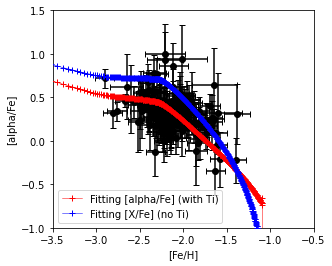

In [25]:
intatomic = atomic.astype(int)

plt.figure()

feh = best_model_bulk['eps'][:,intatomic == 26]
mgfe = best_model_bulk['eps'][:,intatomic == 12] - feh
cafe = best_model_bulk['eps'][:,intatomic == 20] - feh
sife = best_model_bulk['eps'][:,intatomic == 14] - feh
tife = best_model_bulk['eps'][:,intatomic == 22] - feh

alphafe = (mgfe + cafe + sife + tife)/4.

plt.errorbar(data['fe_h'], data['alpha_fe'], c='k', 
             xerr=data['e_fe_h'], yerr = data['e_alpha_fe'],
             fmt='o', capsize=3)

plt.plot(feh, alphafe, marker='+', c='r', lw=0.5, zorder=100, label='Fitting [alpha/Fe] (with Ti)')
plt.plot(feh, mgfe, marker='+', c='b', lw=0.5, zorder=100, label='Fitting [X/Fe] (no Ti)')

plt.xlim(-3.5, -0.5)
plt.ylim(-1., 1.5)

plt.gca().set_aspect('equal')

plt.legend()

plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[alpha/Fe]')
plt.show()